## Restaurant Food Cost

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#load train and test data
df_train = pd.read_csv("restaurant_train.csv")
df_test = pd.read_csv("restaurant_test.csv")
df_train.head()

,TITLE,RESTAURANT_ID,CUISINES,TIME,CITY,LOCALITY,RATING,VOTES,COST
0,CASUAL DINING,9438,"Malwani, Goan, North Indian","11am ??? 4pm, 7:30pm ??? 11:30pm (Mon-",Thane,Dombivali East,3.6,49 votes,1200
1,"CASUAL DINING,BAR",13198,"Asian, Modern Indian, Japanese",6pm ??? 11pm (Mon-Su,Chennai,Ramapuram,4.2,30 votes,1500
2,CASUAL DINING,10915,"North Indian, Chinese, Biryani, Hyderabadi","11am ??? 3:30pm, 7pm ??? 11pm (Mon-",Chennai,Saligramam,3.8,221 votes,800
3,QUICK BITES,6346,"Tibetan, Chinese",11:30am ??? 1am (Mon-Su,Mumbai,Bandra West,4.1,24 votes,800
4,DESSERT PARLOR,15387,Desserts,11am ??? 1am (Mon-Su,Mumbai,Lower Parel,3.8,165 votes,300


In [3]:
print(df_train.shape)
print(df_test.shape)

(12690, 9)
(4231, 8)


In [4]:
# check data type and null values
print(df_train.info())
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12690 entries, 0 to 12689
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   TITLE          12690 non-null  object
 1   RESTAURANT_ID  12690 non-null  int64 
 2   CUISINES       12690 non-null  object
 3   TIME           12690 non-null  object
 4   CITY           12578 non-null  object
 5   LOCALITY       12592 non-null  object
 6   RATING         12688 non-null  object
 7   VOTES          11486 non-null  object
 8   COST           12690 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 892.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4231 entries, 0 to 4230
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   TITLE          4231 non-null   object
 1   RESTAURANT_ID  4231 non-null   int64 
 2   CUISINES       4231 non-null   object
 3   TIME           4231 non-null   objec

Null value present in our data and need to fill.

In [5]:
# check number of unique value present in each attributes
print(df_train.nunique())
print(df_test.nunique())

TITLE              113
RESTAURANT_ID    11892
CUISINES          4155
TIME              2688
CITY               359
LOCALITY          1416
RATING              32
VOTES             1847
COST                86
dtype: int64
TITLE              86
RESTAURANT_ID    4127
CUISINES         1727
TIME             1183
CITY              151
LOCALITY          834
RATING             31
VOTES            1136
dtype: int64


In [6]:
# Check unique value present in Title column
df_train["TITLE"].unique()

array(['CASUAL DINING', 'CASUAL DINING,BAR', 'QUICK BITES',
       'DESSERT PARLOR', 'CAF?', 'MICROBREWERY',
       'QUICK BITES,BEVERAGE SHOP', 'CASUAL DINING,IRANI CAFE',
       'BAKERY,QUICK BITES', 'None', 'BAR,CASUAL DINING', 'BAR', 'PUB',
       'BEVERAGE SHOP', 'FINE DINING', 'CAF???,QUICK BIT',
       'BEVERAGE SHOP,DESSERT PARLOR', 'SWEET SHOP,QUICK BITES',
       'DESSERT PARLOR,SWEET SHOP', 'BAKERY', 'BAKERY,DESSERT PARLOR',
       'BAR,LOUNGE', 'FOOD COURT', 'LOUNGE',
       'DESSERT PARLOR,BEVERAGE SHOP', 'LOUNGE,CASUAL DINING',
       'FOOD TRUCK', 'QUICK BITES,FOOD COURT', 'SWEET SHOP',
       'BEVERAGE SHOP,FOOD COURT', 'PUB,CASUAL DINING', 'MESS',
       'MICROBREWERY,CASUAL DINING', 'CASUAL DINING,SWEET SHOP', 'KIOSK',
       'QUICK BITES,KIOSK', 'CLUB', 'FINE DINING,BAR',
       'DESSERT PARLOR,QUICK BITES', 'FOOD COURT,QUICK BITES',
       'LOUNGE,CAF?', 'BAKERY,CONFECTIONERY', 'CASUAL DINING,CAF?',
       'DHABA', 'CAF???,DESSERT PARL', 'QUICK BITES,DESSERT PARLOR'

In [7]:
# check unique value present in Cuisines column
df_train["CUISINES"].unique()

array(['Malwani, Goan, North Indian', 'Asian, Modern Indian, Japanese',
       'North Indian, Chinese, Biryani, Hyderabadi', ...,
       'North Indian, Burger, Kebab', 'Goan, Continental',
       'Finger Food, Continental, Asian, Chinese'], dtype=object)

In [8]:
# check unique value present in city column
df_train["CITY"].unique()

array(['Thane', 'Chennai', 'Mumbai', 'Bangalore', 'Gurgaon', 'Hyderabad',
       'Kochi', 'Thane West', 'Andheri Lokhandwala', 'New Delhi',
       'Andheri West', 'Malad East', '682036', 'Bangalor', 'Navi Mumbai',
       'Bandra West', 'Delhi', 'Noida', 'Bangalore-560066',
       'Secunderabad', nan, 'India', 'Madhuranagar', 'Chennai Teynampet',
       'Faridabad', 'Chembur.', 'Maharashtra', 'opp gurudwara Shakurpur',
       'Telagana Land Line:040-48507016', 'Ghaziabad', 'Karnataka',
       'Kerala', 'Edappally', 'Kadavanthra', 'Ernakulam Circle kochi',
       'Bengalore', 'Near Reliance Fresh', 'Kilpauk', 'Bengaluru',
       'Kothaguda', 'Goregaon West', 'Banglore', 'Tamil Nadu', 'Kakkanad',
       'Kochi Elamkulam', 'Outer Ring Road', 'Mulund East',
       'Secunderabad main road near signal NMREC COLLEGE', 'Telangana',
       'Ponnuruni Kochi', 'Gachibowli', 'Semmancheri',
       '5th Main Teachers Colony Koramangala Block 1 Bangalore 560034',
       'Mumbai Mahim', 'Powai (Next to

In [9]:
# check unique value present in Rating column
df_train["RATING"].unique()

array(['3.6', '4.2', '3.8', '4.1', '4', '4.3', '3.9', '3.3', '3.4', '-',
       '4.5', '3.5', '4.4', '2.7', '3.7', '4.7', 'NEW', '3.1', '2.5',
       '4.6', '2.8', nan, '3', '3.2', '2.6', '2.9', '4.9', '4.8', '2.4',
       '2.3', '2', '2.1', '2.2'], dtype=object)

In [10]:
# check unique value present in Votes column
df_train["VOTES"].unique()

array(['49 votes', '30 votes', '221 votes', ..., '2723 votes',
       '1426 votes', '1214 votes'], dtype=object)

In [11]:
# join string and remove ? from the title column
df_train["TITLE"]=df_train["TITLE"].apply(lambda x:" ".join(x.split(",")))
df_train["TITLE"]=df_train["TITLE"].apply(lambda x:" ".join(x.split("?")))

df_test["TITLE"]=df_test["TITLE"].apply(lambda x:" ".join(x.split(",")))
df_test["TITLE"]=df_test["TITLE"].apply(lambda x:" ".join(x.split("?")))

In [12]:
# join string of Cuisines attribute
df_train["CUISINES"]=df_train["CUISINES"].apply(lambda x:" ".join(x.split(",")))

df_test["CUISINES"]=df_test["CUISINES"].apply(lambda x:" ".join(x.split(",")))

In [13]:
# Clean city column
df_train.replace(to_replace = ['Bangalor','Bangalore-560066','Bengalore','Bengaluru','Banglore','BTM Bangalore',
                              'Kadubesanahalli Bangalore','Bangalore Road','Malleshwaram Bangalore',
                              'Bangalore 560076','B.B.M.P East (Karnataka) - 560049','Phase 1 Bangalore',
                              'Rajarajeshwari Nagar bangalore','Bangalore land mark above mahaveer hard ware',
                              'Karnataka 560037','Kanakapura Road Banglore','Banglaore','Bangalore - 560103',
                              'Karnataka 560102','Karnataka 560043','Banaswadi (Next to Indian Bank) Bangalore','BTM Bangalore'
                               'CPR layout harlur main road opposite to ozone ever green apartment Bangalore -',
                              'Bangalore Koramangala 7th Block','bangalore : 560085','Karnataka 560103',
                              '5th Main Teachers Colony Koramangala Block 1 Bangalore 560034','JP Nagar Bangalore',
                              'Whitefield Bangalore','Bangalore - 560076','Bangalore.','Karnataka','Ulsoo','Indiranagar',
                              'Near Jyothinivas College','Marathahalli','Ashok Nagar','JP Nagar','NEW BEL ROAD 560054',
                              'Mahadevpura','BTM 1st Stage','Opposite Barathi Gas Company','Thanisandra','1st Tavarekere',
                              'First Street','1st Stage','Maharaja Hotel Beside Gardania Bar','3rd Street','Hosur Road',
                              'Off Brigade Road','Near Munrshwara Temple','SG Palya','Thammenahalli Village',
                              'HSR Layout','B-1 Stage', 'Brigade Road','Rajiv gandhi Nagar','HBR Layout','MG Road',
                              'Sarjapur','BTM Layout','Vijaya Nagar','Adjacent To Commercial Street','Outer Ring Road',
       'CPR layout harlur main road opposite to ozone ever green apartment Bangalore -'],value='Bangalore',inplace=True)

df_train.replace(to_replace = ['Chennai Teynampet','chennai','Chennai. (Near Hotel Matshya)','Chenn ai',
                              'Chennai - 34 Landmark - Near Loyola College','Chennai Chrompet','Chennai-40',
                              'Chennai Opposite 5C Bus stand','Mogappair. Chennai','Chennai Mahabalipuram',
                              'Chennai (Bang Opposite Indian Bank)','Chennai.','Chennai opp: Vasanth & co',
                              'ECR NEELANKARAI Chennai 600115','Chennai- 600107','Chennai Thousand Lights',
                              'Chennai Thuraipakkam','Chennai Perungudi','Chennai Kovalam','Arumbakkam chennai-600106.',
                              'Chennai 600034.','Chennai - 600040','Chennai Padur','Anna Nagar East','Vadapalani.',
                              'Tambaram','Chromepet','GST Road','Mogappair','Sholinganallur','Palavakkam','Vadapalani',
                              'Perambur', 'Anna Salai','Anna Nagar West','Ambattur','Thiruvanmiyur','Nandanam',
                              'Ramapuram','East Coast Road (ECR)','Navallur','Nungambakkam','Andavar Nagar',
                              'Kolathur','Mahabalipuram','OMR Karapakkam','Potheri','Nallathambi Main Road',
                              'Sathya Nagar','Medavakkam','Perungudi','Rohini','Pallavaram','Velachery','Avadi',
                              'Besant Nagar','Dewan Rama Road','Semmancheri',
                               'Tamil Nadu','Kilpauk'],value='Chennai',inplace=True)

df_train.replace(to_replace = ['Thane','Thane West','Andheri Lokhandwala','Andheri West','Malad East',
                               'Navi Mumbai','Bandra West','Maharashtra','Khar Mumbai','Borivali West.',
                               'Vasai west','Thane Mumbai','Mumbai This is a Delivery & Take-away Restaurant only.',
                              'Navi-Mumbai','Maharashtra 400102', 'Lower Parel West','East Mumbai','Andheri Lokhandwala.',
                              'Mumbai - 80','Jogeshwari (w) Mumbai','Mumbai - 400013','Borivali East.','Mumbai Chakala',
                               'Borivali West','Bandra W','Andheri west Mumbai','West Mumbai','navi mumbai',
                              'Mira raod east','Vasai West.','Thane (W)','Mumbai Dombivali East','Marine Drive',
                              'Bhayandar','Navi Mumbai.','Naya Nagar Mira Road','Mumbai.','Mumbai Andheri East',
                               'Virar West','Goregaon West','Mulund East','Mumbai Mahim','Kandivali','Mumbai - 400007',
                              'Lower Parel','Powai (Next to Powai Plaza)','Powai','Mulund west','Badlapur West.',
                              'Wagle Estate','Kalyan','Palm Beach Road','opp mukteshwar ashram powai','Rajanpada',
                              'Near Bharat Petroleum.','Pokhran Road 2','Mahim','khar west','Road 3','Khar (west)',
                              'Near Shangrilla Bus Stop','Grant Road West','Kalyan West','Dombivali East',
                               'Near Reliance Fresh','Chembur.'],value='Mumbai',inplace=True)

df_train.replace(to_replace = ['Gurgaon Haryana','Haryana','Gurgaon Haryana India','Gurgoan','Faridabad','Golf Course Road',
                              'Block F','Old Railway Road','Ashok Vihar Phase 1','Sector 51','Rodeo Drive Sector 49',
                              'Naharpar','Faridabd','DLF Galleria'],value='Gurgaon',inplace=True)

df_train.replace(to_replace = ['Madhuranagar','Telagana Land Line:040-48507016','Hyderabad Manikonda',
                              'Begumpet Hyderabad','hyderabad','Gachibowli Hyderabad','Near Santosh Banjara Hyderabad',
                              'Hyderabad-500032','Hyderabad.','Hyderabad Behind Vacs Pastries', 'Hyderabad neerus emporium.',
                              'Masab Tank','Nizampet','Uppal','Ramanthapur','Lahari Apartments','Manikonda',
                              'Telangana 500070','TCS Synergy park','Kondapur.','Nallala Street','Himayath Nagar',
                              'Serilingampally','Narayanguda','Begumpet','Kukatapally', 'BK Guda','Champapet',
                              'Telangana 500081','Telengana','Jubilee Hills','ECIL','Banjara Hills','Sriram nagar',
                              'ward X11','Lingampally','Dilsukhnagar','Telangana 500032','Kukatpally','Attapur.',
                              'Telangana 500034','Behind Ramalayam Temple','Telangana 500003','Hitech City',
                              'Khairatabad','Madhapur','Gandipet','Mehdipatnam','Kondapur','Gachibowli','Telangana',
                              'Kothaguda'],value='Hyderabad',inplace=True)

df_train.replace(to_replace = ['682036','Ernakulam Circle kochi','Kerala','Kochi.','Kochi Aluva 102',
                              'Kerala 682024','Fort Kochi','Kerala 682304','Kerala 682001 India','Kerala 683585',
                              'Kochi International Airport VIP Road','Kochi-16','Kochi Kakkanad','Kochi-18','Kerala 690525',
                              'Kerala 682013','Kerala 683104','kochi','Kochi-683101','p.o Kochi','Kochi Elamkulam',
                              'Ponnuruni Kochi','Kochi Vyttila','Kochi Palarivattom','Kochi Chullickal',
                              '682035','Mig Housing Society','aluva circle','Tripunithura',
                               'Veliaveetil house Vivekananda Nagar Elamakkara','Kalamassery','MG Road Ernakulam',
                              'Thevera','Trivandrum','Elamakkara','Pallimukku','Kochi Ravipuram','Panampilly Nagar',
                              'MALAPALLIPURAM P .O THRISSUR','Vyttila','Perumbavoor', 'Aluva Circle','Aluva','Palarivattom',
                              'Nedumbassery','chullickal','Thykoodam','Ernakulam','Kaloor','Kakkanad','Kadavanthra',
                              'Edappally'],value='Kochi',inplace=True)

df_train.replace(to_replace = ['Secunderabad.','Secunderabad ECIL','Secunderabad. WE HAVE NO BRANCHES.',
                              'Secunderabad main road near signal NMREC COLLEGE','Beside Excellency Gardens',
                              'West Maredpally','Metro Pillar No 21. Mettuguda main road near railway degree college.'],value='Secunderabad',inplace=True)

df_train.replace(to_replace = ['Delhi','Dist. Center New Delhi','New Delhi 110075','New Delhi..Near by SBI bank',
                              'Old Delhi','Delhi 110085','Greater Kailash 2 New Delhi','New Delhi-110024',
                              'New Delhi.','Delhi NCR','Chander Nagar New Delhi','Gurugram','Janakpuri',
                              'PVR plaza cinema building Connaught Place','Sector 7 Dwarka','6 & 7 - 4/64 Subhash Nagar',
                              'Near Ramlila Ground','Saket','Amrit kaur market opposite new delhi railway station paharganj',
                              'Citypark','IOB Bank Kamala Nagar','Pitampura','Karol Bagh','Dwarka',
                               'opp gurudwara Shakurpur'],value='New Delhi',inplace=True)

df_train.replace(to_replace = ['Near Sector 110 Noida','Greater Noida','Sector 51 Noida','10th avenue','Indirapuram',
                              'Haridwar Apartments','Vaishali Ghaziabad','Sector 1','Uttar Pradesh',
                               'Ghaziabad'],value='Noida',inplace=True)


df_test.replace(to_replace = ['Bangalor','Bangalore-560066','Bengalore','Bengaluru','Banglore','BTM Bangalore',
                              'Kadubesanahalli Bangalore','Bangalore Road','Malleshwaram Bangalore',
                              'Bangalore 560076','B.B.M.P East (Karnataka) - 560049','Phase 1 Bangalore',
                              'Rajarajeshwari Nagar bangalore','Bangalore land mark above mahaveer hard ware',
                              'Karnataka 560037','Kanakapura Road Banglore','Banglaore','Bangalore - 560103',
                              'Karnataka 560102','Karnataka 560043','Banaswadi (Next to Indian Bank) Bangalore','BTM Bangalore'
                               'CPR layout harlur main road opposite to ozone ever green apartment Bangalore -',
                              'Bangalore Koramangala 7th Block','bangalore : 560085','Karnataka 560103',
                              '5th Main Teachers Colony Koramangala Block 1 Bangalore 560034','JP Nagar Bangalore',
                              'Whitefield Bangalore','Bangalore - 560076','Bangalore.','Karnataka','Ulsoo','Indiranagar',
                              'Near Jyothinivas College','Marathahalli','Ashok Nagar','JP Nagar','NEW BEL ROAD 560054',
                              'Mahadevpura','BTM 1st Stage','Opposite Barathi Gas Company','Thanisandra','1st Tavarekere',
                              'First Street','1st Stage','Maharaja Hotel Beside Gardania Bar','3rd Street','Hosur Road',
                              'Off Brigade Road','Near Munrshwara Temple','SG Palya','Thammenahalli Village',
                              'HSR Layout','B-1 Stage', 'Brigade Road','Rajiv gandhi Nagar','HBR Layout','MG Road',
                              'Sarjapur','BTM Layout','Vijaya Nagar','Adjacent To Commercial Street','Outer Ring Road',
       'CPR layout harlur main road opposite to ozone ever green apartment Bangalore -','Bangalore - 560095',
                             'BTM','Panathur Main Road','opposite to western side of ITPL Service gate',
                             'Whitefield','Sahakara Nagar','Tavarekere Main Road','Church Street'],value='Bangalore',inplace=True)

df_test.replace(to_replace = ['Chennai Teynampet','chennai','Chennai. (Near Hotel Matshya)','Chenn ai',
                              'Chennai - 34 Landmark - Near Loyola College','Chennai Chrompet','Chennai-40',
                              'Chennai Opposite 5C Bus stand','Mogappair. Chennai','Chennai Mahabalipuram',
                              'Chennai (Bang Opposite Indian Bank)','Chennai.','Chennai opp: Vasanth & co',
                              'ECR NEELANKARAI Chennai 600115','Chennai- 600107','Chennai Thousand Lights',
                              'Chennai Thuraipakkam','Chennai Perungudi','Chennai Kovalam','Arumbakkam chennai-600106.',
                              'Chennai 600034.','Chennai - 600040','Chennai Padur','Anna Nagar East','Vadapalani.',
                              'Tambaram','Chromepet','GST Road','Mogappair','Sholinganallur','Palavakkam','Vadapalani',
                              'Perambur', 'Anna Salai','Anna Nagar West','Ambattur','Thiruvanmiyur','Nandanam',
                              'Ramapuram','East Coast Road (ECR)','Navallur','Nungambakkam','Andavar Nagar',
                              'Kolathur','Mahabalipuram','OMR Karapakkam','Potheri','Nallathambi Main Road',
                              'Sathya Nagar','Medavakkam','Perungudi','Rohini','Pallavaram','Velachery','Avadi',
                              'Besant Nagar','Dewan Rama Road','Semmancheri',
                               'Tamil Nadu','Kilpauk','Tamil Nadu 600102','Sholinganallur. Chennai',
                              'Chennai (Above Bombay Brasserie)','Chennai 37','Chennai 40','Chennai 600040',
                             'Chennai Velachery','Chennai-600008','Balavinayagar Nagar Chennai','T-Nagar Chennai',
                             'Chennai Injambakkam','Chenna','chennai-119','Chennai - 600018','Vandalur',
                             'MM Nagar','Kaaraikudi Complex','Thiruvanmiyur (Opp Eurokids LB Road)','Alwarpet',
                             'Chepauk','RA Puram'],value='Chennai',inplace=True)

df_test.replace(to_replace = ['Thane','Thane West','Andheri Lokhandwala','Andheri West','Malad East',
                               'Navi Mumbai','Bandra West','Maharashtra','Khar Mumbai','Borivali West.',
                               'Vasai west','Thane Mumbai','Mumbai This is a Delivery & Take-away Restaurant only.',
                              'Navi-Mumbai','Maharashtra 400102', 'Lower Parel West','East Mumbai','Andheri Lokhandwala.',
                              'Mumbai - 80','Jogeshwari (w) Mumbai','Mumbai - 400013','Borivali East.','Mumbai Chakala',
                               'Borivali West','Bandra W','Andheri west Mumbai','West Mumbai','navi mumbai',
                              'Mira raod east','Vasai West.','Thane (W)','Mumbai Dombivali East','Marine Drive',
                              'Bhayandar','Navi Mumbai.','Naya Nagar Mira Road','Mumbai.','Mumbai Andheri East',
                               'Virar West','Goregaon West','Mulund East','Mumbai Mahim','Kandivali','Mumbai - 400007',
                              'Lower Parel','Powai (Next to Powai Plaza)','Powai','Mulund west','Badlapur West.',
                              'Wagle Estate','Kalyan','Palm Beach Road','opp mukteshwar ashram powai','Rajanpada',
                              'Near Bharat Petroleum.','Pokhran Road 2','Mahim','khar west','Road 3','Khar (west)',
                              'Near Shangrilla Bus Stop','Grant Road West','Kalyan West','Dombivali East',
                               'Near Reliance Fresh','Chembur.','Vasai Mumbai','Near Andheri West Station','Maharashtra.'
                             'Near Andheri East Station','Mira Road Thane Mumbai','Kurla (W)','Mumbai 400015',
                             'Thane West Thane West','Maharashtra 400092','Mulund West','Mumbai 400070','Dombivli',
                             'Mohammad Ali Road Mumbai','Virar Mumbai','Mumbai Veera Desai Area','Mumbai Ulhasnagar',
                             'Jogeshwari West Mumbai','Mumbai Mumbra','Kurla Mumbai','Kandivali West',
                             'Miumbai','Borivali (W) Mumbai: 400 092.','Girgaum','Community Centre','Chowpatty',
                             'Opposite Ellora Building','Maharashtra.','Near Andheri East Station'],value='Mumbai',inplace=True)

df_test.replace(to_replace = ['Gurgaon Haryana','Haryana','Gurgaon Haryana India','Gurgoan','Faridabad','Golf Course Road',
                              'Block F','Old Railway Road','Ashok Vihar Phase 1','Sector 51','Rodeo Drive Sector 49',
                              'Naharpar','Faridabd','DLF Galleria'],value='Gurgaon',inplace=True)

df_test.replace(to_replace = ['Madhuranagar','Telagana Land Line:040-48507016','Hyderabad Manikonda',
                              'Begumpet Hyderabad','hyderabad','Gachibowli Hyderabad','Near Santosh Banjara Hyderabad',
                              'Hyderabad-500032','Hyderabad.','Hyderabad Behind Vacs Pastries', 'Hyderabad neerus emporium.',
                              'Masab Tank','Nizampet','Uppal','Ramanthapur','Lahari Apartments','Manikonda',
                              'Telangana 500070','TCS Synergy park','Kondapur.','Nallala Street','Himayath Nagar',
                              'Serilingampally','Narayanguda','Begumpet','Kukatapally', 'BK Guda','Champapet',
                              'Telangana 500081','Telengana','Jubilee Hills','ECIL','Banjara Hills','Sriram nagar',
                              'ward X11','Lingampally','Dilsukhnagar','Telangana 500032','Kukatpally','Attapur.',
                              'Telangana 500034','Behind Ramalayam Temple','Telangana 500003','Hitech City',
                              'Khairatabad','Madhapur','Gandipet','Mehdipatnam','Kondapur','Gachibowli','Telangana',
                              'Kothaguda','Mehdipatnam Hyderabad','Hyderaba','Telangana 500027','Nallagandla',
                              'Hyderabad.Star hypermarket opposite side Service road','APR Chambers','Tolichowki',
                             'Suraram','Forum Sujana Mall Opposite to Malaysian township','Old Hafeezpet',
                             'Yousufguda','Habsiguda','Vanasthalipuram'],value='Hyderabad',inplace=True)

df_test.replace(to_replace = ['682036','Ernakulam Circle kochi','Kerala','Kochi.','Kochi Aluva 102',
                              'Kerala 682024','Fort Kochi','Kerala 682304','Kerala 682001 India','Kerala 683585',
                              'Kochi International Airport VIP Road','Kochi-16','Kochi Kakkanad','Kochi-18','Kerala 690525',
                              'Kerala 682013','Kerala 683104','kochi','Kochi-683101','p.o Kochi','Kochi Elamkulam',
                              'Ponnuruni Kochi','Kochi Vyttila','Kochi Palarivattom','Kochi Chullickal',
                              '682035','Mig Housing Society','aluva circle','Tripunithura',
                               'Veliaveetil house Vivekananda Nagar Elamakkara','Kalamassery','MG Road Ernakulam',
                              'Thevera','Trivandrum','Elamakkara','Pallimukku','Kochi Ravipuram','Panampilly Nagar',
                              'MALAPALLIPURAM P .O THRISSUR','Vyttila','Perumbavoor', 'Aluva Circle','Aluva','Palarivattom',
                              'Nedumbassery','chullickal','Thykoodam','Ernakulam','Kaloor','Kakkanad','Kadavanthra',
                              'Edappally','Kerala 682036','682024','Kochi Panampilly Nagar','Kerala 682022','Kerala 682305',
                             'Kerala 682015','Kerala 682018','Kerala 682028','Kerala 682021','Marad','Chittethukkara',
                             'Shihab Thangal Road','KK Road'],value='Kochi',inplace=True)

df_test.replace(to_replace = ['Secunderabad.','Secunderabad ECIL','Secunderabad. WE HAVE NO BRANCHES.',
                              'Secunderabad main road near signal NMREC COLLEGE','Beside Excellency Gardens',
                              'West Maredpally','Metro Pillar No 21. Mettuguda main road near railway degree college.',
                              'Secunderbad'],value='Secunderabad',inplace=True)

df_test.replace(to_replace = ['Delhi','Dist. Center New Delhi','New Delhi 110075','New Delhi..Near by SBI bank',
                              'Old Delhi','Delhi 110085','Greater Kailash 2 New Delhi','New Delhi-110024',
                              'New Delhi.','Delhi NCR','Chander Nagar New Delhi','Gurugram','Janakpuri',
                              'PVR plaza cinema building Connaught Place','Sector 7 Dwarka','6 & 7 - 4/64 Subhash Nagar',
                              'Near Ramlila Ground','Saket','Amrit kaur market opposite new delhi railway station paharganj',
                              'Citypark','IOB Bank Kamala Nagar','Pitampura','Karol Bagh','Dwarka',
                               'opp gurudwara Shakurpur','India Gate New Delhi','Greater Kailash 1 (GK 1) New Delhi',
                             'Delh.','New Delhi 110011','Kalkaji','Gandhinagar Rd','Near Sector 34'],value='New Delhi',inplace=True)

df_test.replace(to_replace = ['Near Sector 110 Noida','Greater Noida','Sector 51 Noida','10th avenue','Indirapuram',
                              'Haridwar Apartments','Vaishali Ghaziabad','Sector 1','Uttar Pradesh',
                               'Ghaziabad','Sector-6 Noida 201301','Noida Extention'],value='Noida',inplace=True)

In [14]:
print(df_train["CITY"].unique())
print(df_test["CITY"].unique())

['Mumbai' 'Chennai' 'Bangalore' 'Gurgaon' 'Hyderabad' 'Kochi' 'New Delhi'
 'Noida' 'Secunderabad' nan 'India']
['Noida' 'Mumbai' 'Gurgaon' 'Kochi' 'Hyderabad' 'Chennai' 'New Delhi'
 'Bangalore' 'Secunderabad' nan 'India']


In [15]:
#clean votes attribute
df_train["VOTES"] = df_train["VOTES"].str.replace("votes"," ")
df_test["VOTES"] = df_test["VOTES"].str.replace("votes"," ")

In [16]:
#clean rating column
df_train["RATING"] = df_train["RATING"].replace('NEW',np.nan)
df_train["RATING"] = df_train["RATING"].replace("-",np.nan)

df_test["RATING"] = df_test["RATING"].replace('NEW',np.nan)
df_test["RATING"] = df_test["RATING"].replace("-",np.nan)

In [17]:
# change data type of column
df_train["RATING"] = df_train["RATING"].astype('float')
df_train["VOTES"] = df_train["VOTES"].astype('float')

df_test["RATING"] = df_test["RATING"].astype('float')
df_test["VOTES"] = df_test["VOTES"].astype('float')

In [18]:
# fill null value of city column with unknown.
df_train["CITY"] = df_train["CITY"].replace(np.nan,"unknown")
df_test["CITY"] = df_test["CITY"].replace(np.nan,"unknown")

# fill null value of locality column with unknown.
df_train["LOCALITY"] = df_train["LOCALITY"].replace(np.nan,"unknown")
df_test["LOCALITY"] = df_test["LOCALITY"].replace(np.nan,"unknown")

# fill null value of rating column with it's mean value
mean = df_train["RATING"].mean()
df_train["RATING"] = df_train["RATING"].replace(np.nan,mean)

mean = df_test["RATING"].mean()
df_test["RATING"] = df_test["RATING"].replace(np.nan,mean)

# fill null value of voting column with zero
df_train["VOTES"] = df_train["VOTES"].replace(np.nan,0)
df_test["VOTES"] = df_test["VOTES"].replace(np.nan,0)

In [19]:
# get index and drop india from the city column
print(df_train[df_train["CITY"]=="India"].index.values)
df_train.drop([135,1853,  2096,  2169,  4195,  4604,  4763,  5632,  5778,  5919,  6758,  6819,
  6844,  7251,  7679,  8423,  8433,  8823,  9525,  9584, 10612, 10802, 12233],axis=0,inplace=True)

print(df_test[df_test["CITY"]=="India"].index.values)
df_test.drop([385 , 564, 1437, 1839, 2553, 2979, 3185, 3869],axis=0,inplace=True)

[  135  1853  2096  2169  4195  4604  4763  5632  5778  5919  6758  6819
  6844  7251  7679  8423  8433  8823  9525  9584 10612 10802 12233]
[ 385  564 1437 1839 2553 2979 3185 3869]


In [20]:
# drop restaurant_id and time columns because both columns are unnessesary and not affet our target variable.
df_train.drop(["RESTAURANT_ID","TIME"],axis=1,inplace=True)
df_test.drop(["RESTAURANT_ID","TIME"],axis=1,inplace=True)

In [21]:
df_train.head()

,TITLE,CUISINES,CITY,LOCALITY,RATING,VOTES,COST
0,CASUAL DINING,Malwani Goan North Indian,Mumbai,Mumbai,3.6,49.0,1200
1,CASUAL DINING BAR,Asian Modern Indian Japanese,Chennai,Chennai,4.2,30.0,1500
2,CASUAL DINING,North Indian Chinese Biryani Hyderabadi,Chennai,Saligramam,3.8,221.0,800
3,QUICK BITES,Tibetan Chinese,Mumbai,Mumbai,4.1,24.0,800
4,DESSERT PARLOR,Desserts,Mumbai,Mumbai,3.8,165.0,300


## Univariate Analysis

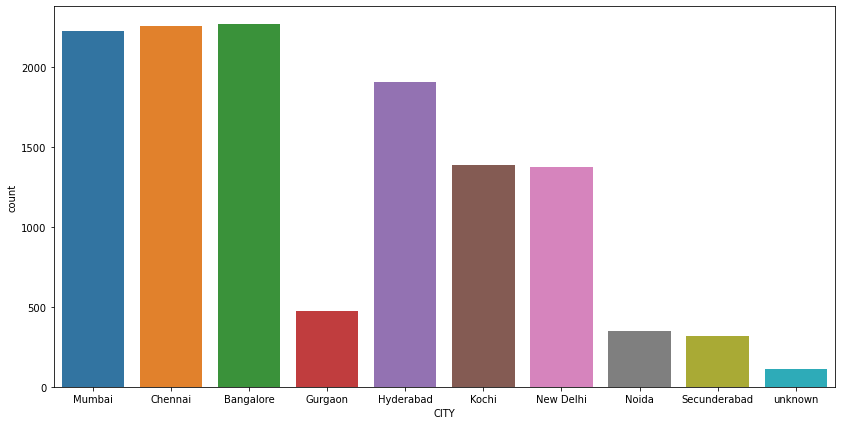

Bangalore       2266
Chennai         2256
Mumbai          2226
Hyderabad       1904
Kochi           1385
New Delhi       1377
Gurgaon          472
Noida            352
Secunderabad     317
unknown          112
Name: CITY, dtype: int64

In [22]:
plt.figure(figsize=(14,7))
sns.countplot(df_train["CITY"])
plt.show()
df_train["CITY"].value_counts()

1. Maximum number of city present in our dataset for food cost prediction is Bangalore,Chennai is at second place and Mumbai is at thired place.
2. minimum number of city present in dataset for food cost prediction is Secundarabad.
3. Kochi and New Delhi cities almost have similar counts.

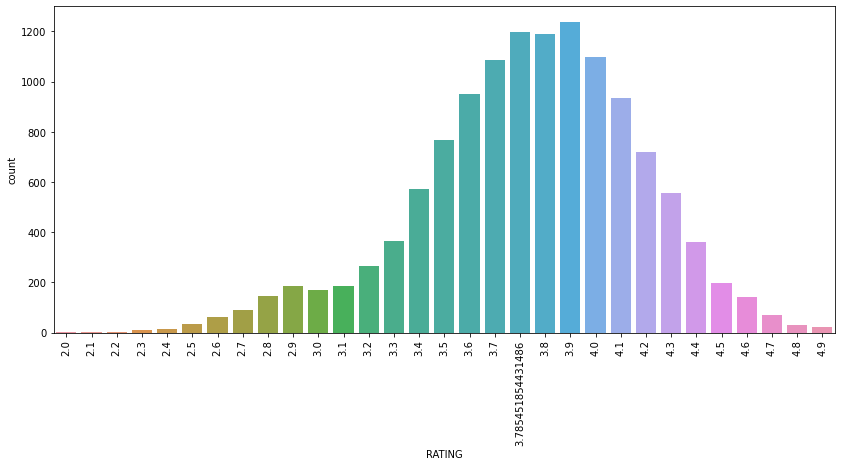

3.900000    1238
3.785452    1198
3.800000    1189
4.000000    1097
3.700000    1085
3.600000     951
4.100000     935
3.500000     767
4.200000     721
3.400000     574
4.300000     555
3.300000     365
4.400000     361
3.200000     266
4.500000     199
2.900000     186
3.100000     184
3.000000     170
2.800000     145
4.600000     141
2.700000      89
4.700000      69
2.600000      61
2.500000      35
4.800000      32
4.900000      22
2.400000      15
2.300000      10
2.100000       3
2.200000       2
2.000000       2
Name: RATING, dtype: int64

In [23]:
plt.figure(figsize=(14,6))
sns.countplot(df_train["RATING"])
plt.xticks(rotation="vertical")
plt.show()

df_train["RATING"].value_counts()

1. Maximum rating provide by people is 3.9.
2. Most of the rating lies between 3.2 to 4.5. 
3. Minimum rating is 2.0

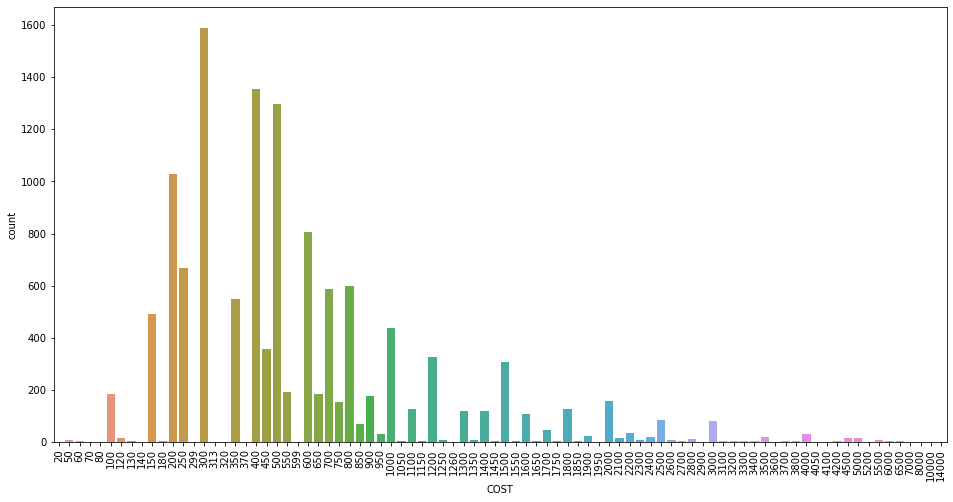

300      1590
400      1353
500      1297
200      1028
600       806
         ... 
4100        1
70          1
14000       1
1950        1
80          1
Name: COST, Length: 86, dtype: int64

In [24]:
plt.figure(figsize=(16,8))
sns.countplot(df_train["COST"])
plt.xticks(rotation="vertical")
plt.show()

df_train["COST"].value_counts()

1. Maximum average cost of food is 14000 Rs. for two person.
2. Most Frequent value of cost is 300 Rs.
3. Most of the average food cost is lies below 1000 Rs. 

## Bivariate analysis

<AxesSubplot:ylabel='TITLE'>

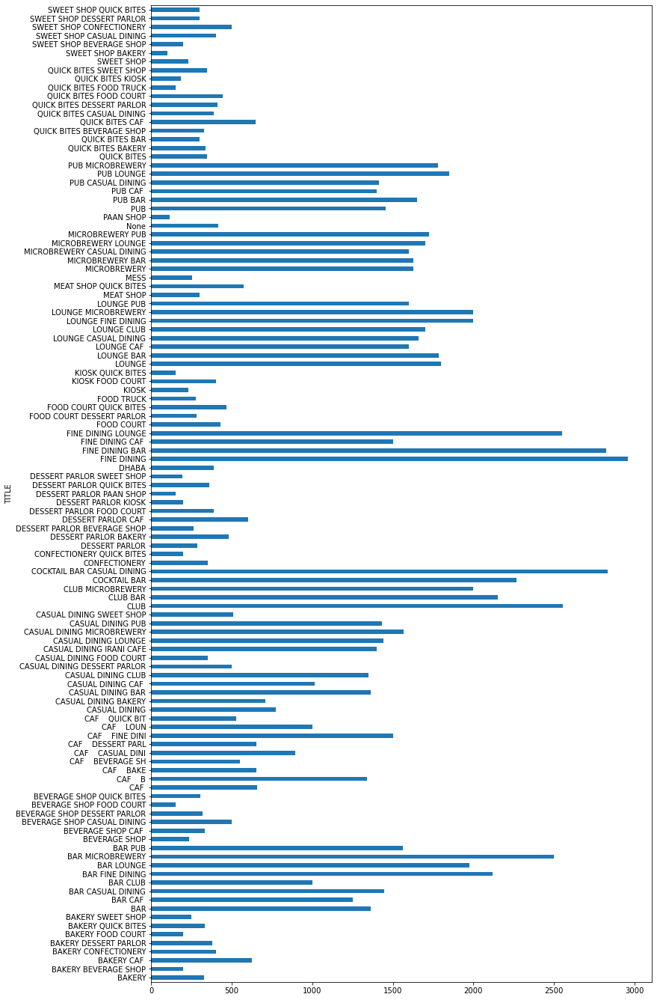

In [25]:
plt.figure(figsize=(12,24))
df_train.groupby("TITLE")["COST"].mean().plot(kind="barh")

1. Maximum average food cost is at Fine dining, which is nearby 3000 Rs.
2. Mostly food cost is high where title contain bar.

<AxesSubplot:xlabel='CITY', ylabel='COST'>

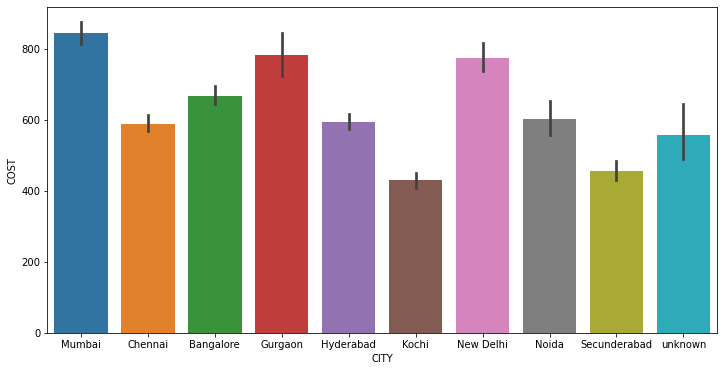

In [26]:
plt.figure(figsize=(12,6))
sns.barplot(x="CITY",y="COST",data=df_train)

1. Average food cost is maximum in Mumbai city,which is above 800 Rs.
2. Average food cost is least in Kochi.which is nearby 400 Rs.
3. Gurgaon and New Delhi have average food cost is almost similar, which is just below 800 Rs.
4. Average food cost at Hyderabad and Noida is almost similar, which is approx. 600 Rs.

<AxesSubplot:xlabel='CITY', ylabel='VOTES'>

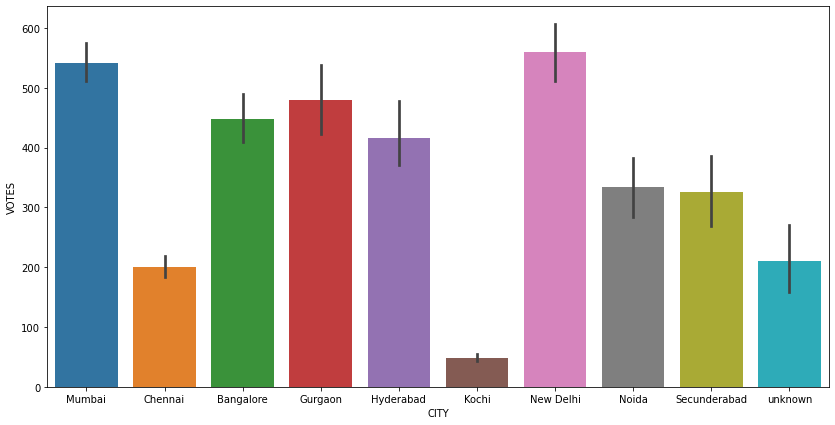

In [27]:
plt.figure(figsize=(14,7))
sns.barplot(x="CITY",y="VOTES",data=df_train)

1. Number of votes is maximum in New Delhi,Mumbai is at second place and Gurgaon is at third place.
2. Number of votes is minimal at Kochi.

<AxesSubplot:xlabel='RATING', ylabel='COST'>

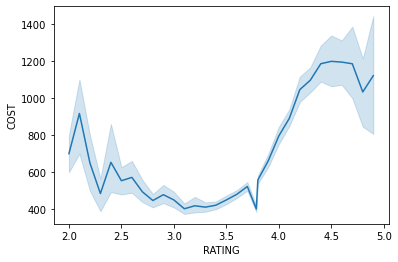

In [28]:
sns.lineplot(x="RATING",y="COST",data=df_train)

1. Average food cost is maximum where rating is high.
2. Average food cost is low where, rating lies between 2.7 to 3.6.
3. Average food cost is high where ratnig is very low.

<AxesSubplot:xlabel='COST', ylabel='VOTES'>

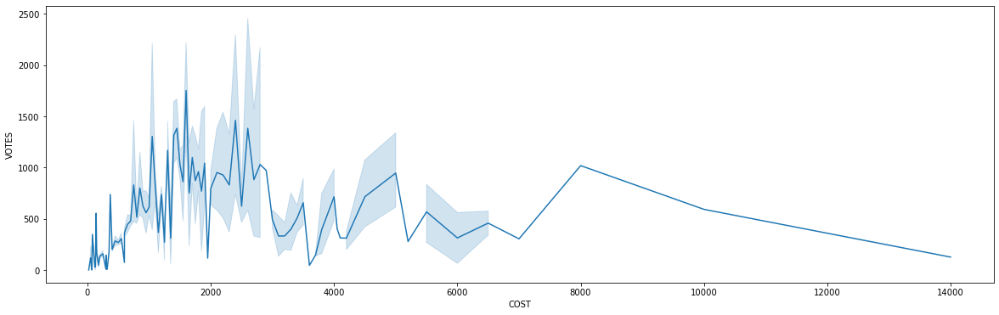

In [29]:
plt.figure(figsize=(20,6))
sns.lineplot(x="COST",y="VOTES",data=df_train)

1. Average food cost is low, where number of votes is high.
2. Number of votes is gradually decresing with incresing average food cost.

## Multivariate analysis

<AxesSubplot:>

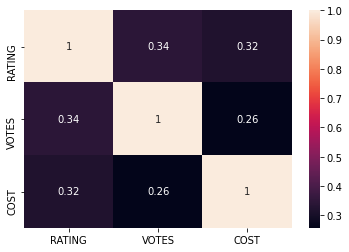

In [30]:
# check correlation of every numerical attributes with heatmap
sns.heatmap(df_train.corr(),annot=True)

There is no such great correlation between attributes.

## Handling Outliers

In [31]:
# split numerical and categorical columns.
num_col = df_train.drop(["TITLE","CUISINES","CITY","LOCALITY"],axis=1)
num_col = num_col.reset_index()
cat_col = df_train.drop(["RATING","VOTES","COST"],axis=1)
cat_col = cat_col.reset_index()

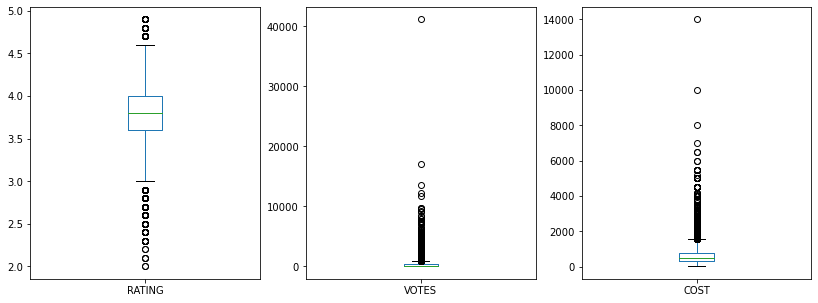

In [32]:
df_train.plot.box(subplots=True,figsize=(14,5))
plt.show()

Outliers present in data and need to remove.

In [33]:
# check and remove outliers using zscore
from scipy.stats import zscore
z = np.abs(zscore(num_col))
threshold=3
print(np.where(z>3))

(array([   84,   158,   185,   195,   207,   292,   302,   303,   307,
         336,   343,   353,   378,   421,   430,   468,   501,   509,
         562,   598,   671,   730,   774,   795,   838,   851,   854,
         871,   912,   965,   966,   972,  1007,  1019,  1033,  1037,
        1131,  1132,  1146,  1150,  1192,  1243,  1287,  1344,  1345,
        1394,  1466,  1469,  1474,  1475,  1521,  1539,  1593,  1616,
        1631,  1656,  1680,  1684,  1758,  1772,  1777,  1815,  1827,
        1849,  1876,  1882,  1914,  1928,  1929,  1971,  2066,  2088,
        2097,  2108,  2184,  2200,  2201,  2203,  2264,  2298,  2301,
        2329,  2335,  2345,  2365,  2455,  2484,  2527,  2600,  2606,
        2618,  2679,  2682,  2685,  2691,  2736,  2774,  2882,  2901,
        2917,  2936,  2965,  2969,  2973,  2998,  3024,  3029,  3032,
        3045,  3166,  3193,  3202,  3207,  3285,  3305,  3329,  3334,
        3392,  3393,  3394,  3404,  3479,  3487,  3488,  3503,  3522,
        3524,  3528

In [34]:
df_new = num_col[(z<3).all(axis=1)]
df_new

,index,RATING,VOTES,COST
0,0,3.6,49.0,1200
1,1,4.2,30.0,1500
2,2,3.8,221.0,800
3,3,4.1,24.0,800
4,4,3.8,165.0,300
...,...,...,...,...
12662,12685,3.8,546.0,500
12663,12686,4.3,1214.0,1800
12664,12687,4.0,608.0,1300
12665,12688,3.5,32.0,400


In [35]:
print(df_train.shape)
print(df_new.shape)

(12667, 7)
(12179, 4)


In [36]:
percentage_loss = ((12667-12179)/12667)*100
percentage_loss

3.8525301965737744

Percentage loss is not greater than 5.so,we use zscore method for removing outliers.

## Prepare data for model training

In [37]:
# remove categorical rows which is already remove from numerical columns.
cat_col = cat_col.drop([84,   158,   185,   195,   207,   292,   302,   303,   307,
         336,   343,   353,   378,   421,   430,   468,   501,   509,
         562,   598,   671,   730,   774,   795,   838,   851,   854,
         871,   912,   965,   966,   972,  1007,  1019,  1033,  1037,
        1131,  1132,  1146,  1150,  1192,  1243,  1287,  1344,  1345,
        1394,  1466,  1469,  1474,  1475,  1521,  1539,  1593,  1616,
        1631,  1656,  1680,  1684,  1758,  1772,  1777,  1815,  1827,
        1849,  1876,  1882,  1914,  1928,  1929,  1971,  2066,  2088,
        2097,  2108,  2184,  2200,  2201,  2203,  2264,  2298,  2301,
        2329,  2335,  2345,  2365,  2455,  2484,  2527,  2600,  2606,
        2618,  2679,  2682,  2685,  2691,  2736,  2774,  2882,  2901,
        2917,  2936,  2965,  2969,  2973,  2998,  3024,  3029,  3032,
        3045,  3166,  3193,  3202,  3207,  3285,  3305,  3329,  3334,
        3392,  3393,  3394,  3404,  3479,  3487,  3488,  3503,  3522,
        3524,  3528,  3550,  3574,  3583,  3599,  3684,  3688,  3700,
        3702,  3711,  3724,  3726,  3769,  3837,  3843,  3851,  3873,
        3887,  3892,  3901,  3905,  3938,  3948,  3949,  3958,  3970,
        3983,  4038,  4120,  4143,  4148,  4188,  4189,  4219,  4263,
        4268,  4274,  4280,  4293,  4310,  4318,  4362,  4386,  4396,
        4404,  4465,  4489,  4507,  4519,  4549,  4552,  4553,  4558,
        4573,  4587,  4612,  4622,  4628,  4641,  4652,  4653,  4685,
        4687,  4702,  4703,  4722,  4754,  4761,  4848,  4897,  4924,
        4940,  4980,  5005,  5071,  5091,  5101,  5126,  5133,  5166,
        5195,  5250,  5257,  5368,  5394,  5485,  5495,  5524,  5581,
        5583,  5587,  5622,  5654,  5674,  5766,  5783,  5827,  5832,
        5834,  5865,  5871,  5888,  5924,  5934,  5937,  5959,  5965,
        5986,  5995,  6014,  6126,  6132,  6137,  6293,  6333,  6380,
        6411,  6435,  6436,  6438,  6462,  6465,  6476,  6486,  6495,
        6496,  6509,  6582,  6598,  6616,  6630,  6634,  6639,  6674,
        6680,  6704,  6712,  6749,  6793,  6854,  6865,  6909,  6936,
        6969,  6984,  7015,  7021,  7021,  7032,  7046,  7060,  7065,
        7176,  7189,  7228,  7229,  7248,  7261,  7302,  7348,  7355,
        7428,  7445,  7480,  7558,  7612,  7616,  7740,  7769,  7774,
        7793,  7798,  7807,  7868,  7886,  7973,  7982,  7994,  8050,
        8063,  8091,  8108,  8128,  8149,  8169,  8204,  8207,  8219,
        8296,  8355,  8385,  8425,  8431,  8442,  8455,  8492,  8493,
        8560,  8561,  8581,  8589,  8613,  8642,  8657,  8663,  8692,
        8780,  8784,  8819,  8821,  8889,  8907,  8923,  8947,  8990,
        8999,  9004,  9004,  9049,  9051,  9056,  9070,  9082,  9106,
        9114,  9123,  9182,  9209,  9246,  9254,  9263,  9270,  9282,
        9312,  9527,  9533,  9551,  9556,  9558,  9561,  9566,  9589,
        9596,  9597,  9639,  9682,  9714,  9750,  9755,  9763,  9789,
        9810,  9855,  9856,  9858,  9864,  9874,  9883,  9921, 10023,
       10045, 10045, 10123, 10148, 10199, 10201, 10237, 10246, 10255,
       10258, 10260, 10300, 10325, 10344, 10345, 10360, 10445, 10447,
       10460, 10518, 10526, 10548, 10607, 10608, 10614, 10615, 10656,
       10706, 10715, 10730, 10739, 10841, 10846, 10873, 10876, 10885,
       10926, 10928, 10999, 11028, 11051, 11103, 11107, 11108, 11124,
       11125, 11136, 11148, 11157, 11175, 11194, 11210, 11240, 11247,
       11273, 11289, 11339, 11351, 11355, 11388, 11419, 11435, 11453,
       11499, 11536, 11546, 11567, 11573, 11635, 11682, 11692, 11763,
       11764, 11776, 11782, 11825, 11839, 11877, 11882, 11904, 11914,
       11921, 11932, 11950, 11999, 12028, 12061, 12098, 12116, 12121,
       12174, 12213, 12248, 12248, 12295, 12315, 12329, 12337, 12390,
       12399, 12403, 12483, 12539, 12605, 12645],axis=0)

In [38]:
# join numerical column and categorical column.
df_train_new = pd.concat([df_new,cat_col],axis=1)
df_train_new.head()

,index,RATING,VOTES,COST,index,TITLE,CUISINES,CITY,LOCALITY
0,0,3.6,49.0,1200,0,CASUAL DINING,Malwani Goan North Indian,Mumbai,Mumbai
1,1,4.2,30.0,1500,1,CASUAL DINING BAR,Asian Modern Indian Japanese,Chennai,Chennai
2,2,3.8,221.0,800,2,CASUAL DINING,North Indian Chinese Biryani Hyderabadi,Chennai,Saligramam
3,3,4.1,24.0,800,3,QUICK BITES,Tibetan Chinese,Mumbai,Mumbai
4,4,3.8,165.0,300,4,DESSERT PARLOR,Desserts,Mumbai,Mumbai


In [39]:
# remove extra index column.
df_train_new.drop(["index"],axis=1,inplace=True)

In [40]:
# Our target varable is cost.so, it is regression type of problem and take cost as y variable.
x = df_train_new.drop(["COST"],axis=1)
y = df_train_new["COST"]

In [41]:
print(x.shape)
print(y.shape)

(12179, 6)
(12179,)


## Handling Skewness

In [42]:
# check skewness
x.skew()

RATING   -0.431460
VOTES     2.572144
dtype: float64

<AxesSubplot:xlabel='VOTES', ylabel='Density'>

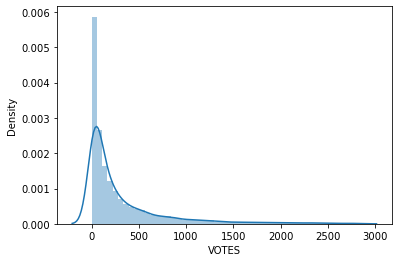

In [43]:
sns.distplot(x["VOTES"])

skewness is present in votes column and need to remove.

In [44]:
# remove skewness using power transform method.
x["VOTES"] = np.log1p(x["VOTES"])

## Encoding Data

In [45]:
# convert categorical data into numerical data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
x["CUISINES"] = le.fit_transform(x["CUISINES"])
x["LOCALITY"] = le.fit_transform(x["LOCALITY"])
x["TITLE"] = le.fit_transform(x["TITLE"])
x = pd.get_dummies(x,drop_first=True)
x.head()

df_test["CUISINES"] = le.fit_transform(df_test["CUISINES"])
df_test["LOCALITY"] = le.fit_transform(df_test["LOCALITY"])
df_test["TITLE"] = le.fit_transform(df_test["TITLE"])
df_test = pd.get_dummies(df_test,drop_first=True)

## Scaling

In [46]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_t = sc.fit_transform(x)

x_test_data = sc.fit_transform(df_test)

In [47]:
# split train and test data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_t,y,test_size=0.20,random_state=42)

## Find Best Model

In [48]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score,mean_squared_error

model = [LinearRegression(),SVR(),KNeighborsRegressor(),DecisionTreeRegressor()]

for i in model:
    i.fit(x_train,y_train)
    train = i.score(x_train,y_train)
    predi = i.predict(x_test)
    print("Accuracy of",i,"is:")
    print("Accuracy of the model is:",train)
    print("r2 score:",r2_score(y_test,predi))
    print("mean squared error:",mean_squared_error(y_test,predi))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predi)))
    print("*******************************************************************")
    print("\n")

Accuracy of LinearRegression() is:
Accuracy of the model is: 0.2729992578919278
r2 score: 0.2509735435623718
mean squared error: 154137.37296673816
root mean squared error: 392.6033277581052
*******************************************************************


Accuracy of SVR() is:
Accuracy of the model is: 0.14137591696336282
r2 score: 0.14178812836414167
mean squared error: 176605.94256170167
root mean squared error: 420.24509820068295
*******************************************************************


Accuracy of KNeighborsRegressor() is:
Accuracy of the model is: 0.593320942809706
r2 score: 0.38496784097275605
mean squared error: 126563.54187192119
root mean squared error: 355.75770107184076
*******************************************************************


Accuracy of DecisionTreeRegressor() is:
Accuracy of the model is: 0.998550305850453
r2 score: 0.4361280378596112
mean squared error: 116035.61154205627
root mean squared error: 340.6400028505993
****************************

## Lasso and Ridge Regression

In [49]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [50]:
ls = Lasso()
parameters = {'alpha':[0.01,0.1,1.0],'max_iter':[50,200,500,1000],'random_state':list(range(0,15)),'selection':['cyclic','random']}
reg = GridSearchCV(ls,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'alpha': 0.1, 'max_iter': 50, 'random_state': 2, 'selection': 'random'}


In [51]:
ls = Lasso(alpha=0.1,max_iter=50,random_state=2,selection='random')
ls.fit(x_train,y_train)
train = ls.score(x_train,y_train)
predls = ls.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predls))
print("mean squared error:",mean_squared_error(y_test,predls))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predls)))

Accuracy of the model is: 0.27299865745544105
r2 score: 0.2510225661856992
mean squared error: 154127.28491402563
root mean squared error: 392.5904799075312


In [52]:
rd = Ridge()
parameters={'alpha':[0.01,0.1,1.0],'max_iter':[50,100,200,300],'random_state':list(range(0,10))}
reg = GridSearchCV(rd,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'alpha': 1.0, 'max_iter': 50, 'random_state': 0}


In [53]:
rd = Ridge(alpha=1.0,max_iter=50,random_state=0)
rd.fit(x_train,y_train)
train = rd.score(x_train,y_train)
predrd = rd.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predrd))
print("mean squared error:",mean_squared_error(y_test,predrd))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predrd)))

Accuracy of the model is: 0.272999256151946
r2 score: 0.25097365872256805
mean squared error: 154137.3492686565
root mean squared error: 392.60329757741016


## Bagging and Boosting Method

In [54]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

model = [RandomForestRegressor(),AdaBoostRegressor(),GradientBoostingRegressor(),ExtraTreesRegressor(),XGBRegressor(),CatBoostRegressor()]

for m in model:
    m.fit(x_train,y_train)
    train=m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy of",m,"is:")
    print("Accuracy of the model is:",train)
    print("r2 score:",r2_score(y_test,predm))
    print("mean squared error:",mean_squared_error(y_test,predm))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predm)))
    print("*******************************************************************")
    print("\n")

Accuracy of RandomForestRegressor() is:
Accuracy of the model is: 0.9535922109056896
r2 score: 0.6927328353379303
mean squared error: 63230.54833763859
root mean squared error: 251.45685184070564
*******************************************************************


Accuracy of AdaBoostRegressor() is:
Accuracy of the model is: 0.3374539675309597
r2 score: 0.330592788608584
mean squared error: 137753.0367880333
root mean squared error: 371.1509622620333
*******************************************************************


Accuracy of GradientBoostingRegressor() is:
Accuracy of the model is: 0.6890074127110333
r2 score: 0.6616130221815639
mean squared error: 69634.49602988873
root mean squared error: 263.88348949846926
*******************************************************************


Accuracy of ExtraTreesRegressor() is:
Accuracy of the model is: 0.9985341848648008
r2 score: 0.6577991236153904
mean squared error: 70419.33386932562
root mean squared error: 265.3664143581957
***********

153:	learn: 249.1861523	total: 843ms	remaining: 4.63s
154:	learn: 249.0738296	total: 849ms	remaining: 4.63s
155:	learn: 248.9395977	total: 857ms	remaining: 4.64s
156:	learn: 248.8253646	total: 862ms	remaining: 4.63s
157:	learn: 248.6106077	total: 867ms	remaining: 4.62s
158:	learn: 248.4844382	total: 872ms	remaining: 4.61s
159:	learn: 248.1766933	total: 876ms	remaining: 4.6s
160:	learn: 247.8083357	total: 881ms	remaining: 4.59s
161:	learn: 247.7019306	total: 889ms	remaining: 4.6s
162:	learn: 247.5352628	total: 897ms	remaining: 4.61s
163:	learn: 247.3729490	total: 902ms	remaining: 4.6s
164:	learn: 247.2728357	total: 907ms	remaining: 4.59s
165:	learn: 246.9905686	total: 912ms	remaining: 4.58s
166:	learn: 246.8759132	total: 917ms	remaining: 4.57s
167:	learn: 246.6857456	total: 923ms	remaining: 4.57s
168:	learn: 246.5395390	total: 933ms	remaining: 4.59s
169:	learn: 246.4788365	total: 938ms	remaining: 4.58s
170:	learn: 246.2332647	total: 942ms	remaining: 4.57s
171:	learn: 246.0960644	total: 

331:	learn: 223.8325150	total: 1.68s	remaining: 3.37s
332:	learn: 223.6728495	total: 1.68s	remaining: 3.37s
333:	learn: 223.5887493	total: 1.69s	remaining: 3.36s
334:	learn: 223.5166282	total: 1.69s	remaining: 3.36s
335:	learn: 223.3917371	total: 1.7s	remaining: 3.35s
336:	learn: 223.2650979	total: 1.7s	remaining: 3.35s
337:	learn: 223.2067508	total: 1.71s	remaining: 3.34s
338:	learn: 223.1443376	total: 1.71s	remaining: 3.34s
339:	learn: 223.0453967	total: 1.72s	remaining: 3.33s
340:	learn: 222.9861698	total: 1.72s	remaining: 3.32s
341:	learn: 222.8693965	total: 1.72s	remaining: 3.32s
342:	learn: 222.7868579	total: 1.73s	remaining: 3.31s
343:	learn: 222.6612012	total: 1.73s	remaining: 3.31s
344:	learn: 222.5389465	total: 1.74s	remaining: 3.3s
345:	learn: 222.4849970	total: 1.74s	remaining: 3.29s
346:	learn: 222.3432522	total: 1.75s	remaining: 3.29s
347:	learn: 222.2451881	total: 1.75s	remaining: 3.28s
348:	learn: 222.1917867	total: 1.75s	remaining: 3.27s
349:	learn: 222.1341896	total: 

513:	learn: 210.7331341	total: 2.51s	remaining: 2.38s
514:	learn: 210.6871602	total: 2.52s	remaining: 2.37s
515:	learn: 210.6259837	total: 2.52s	remaining: 2.37s
516:	learn: 210.5552062	total: 2.53s	remaining: 2.36s
517:	learn: 210.4883304	total: 2.53s	remaining: 2.36s
518:	learn: 210.4303758	total: 2.54s	remaining: 2.35s
519:	learn: 210.3778518	total: 2.54s	remaining: 2.35s
520:	learn: 210.3550558	total: 2.55s	remaining: 2.34s
521:	learn: 210.2879387	total: 2.56s	remaining: 2.34s
522:	learn: 210.2392337	total: 2.56s	remaining: 2.33s
523:	learn: 210.1987636	total: 2.56s	remaining: 2.33s
524:	learn: 210.1325347	total: 2.57s	remaining: 2.32s
525:	learn: 210.0524612	total: 2.57s	remaining: 2.32s
526:	learn: 209.9700173	total: 2.58s	remaining: 2.31s
527:	learn: 209.9350126	total: 2.58s	remaining: 2.31s
528:	learn: 209.8822315	total: 2.58s	remaining: 2.3s
529:	learn: 209.8529386	total: 2.59s	remaining: 2.3s
530:	learn: 209.7615254	total: 2.59s	remaining: 2.29s
531:	learn: 209.7075693	total:

692:	learn: 201.8426713	total: 3.35s	remaining: 1.48s
693:	learn: 201.7712530	total: 3.35s	remaining: 1.48s
694:	learn: 201.6976452	total: 3.36s	remaining: 1.47s
695:	learn: 201.6580828	total: 3.36s	remaining: 1.47s
696:	learn: 201.6171560	total: 3.37s	remaining: 1.46s
697:	learn: 201.5664190	total: 3.37s	remaining: 1.46s
698:	learn: 201.5281573	total: 3.38s	remaining: 1.46s
699:	learn: 201.4796676	total: 3.38s	remaining: 1.45s
700:	learn: 201.4456196	total: 3.39s	remaining: 1.45s
701:	learn: 201.3947099	total: 3.39s	remaining: 1.44s
702:	learn: 201.3570082	total: 3.4s	remaining: 1.44s
703:	learn: 201.2963930	total: 3.4s	remaining: 1.43s
704:	learn: 201.2520315	total: 3.4s	remaining: 1.42s
705:	learn: 201.1950416	total: 3.41s	remaining: 1.42s
706:	learn: 201.1221853	total: 3.41s	remaining: 1.41s
707:	learn: 201.0530679	total: 3.42s	remaining: 1.41s
708:	learn: 201.0150775	total: 3.42s	remaining: 1.4s
709:	learn: 200.9782297	total: 3.42s	remaining: 1.4s
710:	learn: 200.9435891	total: 3.

848:	learn: 194.9380696	total: 4.02s	remaining: 715ms
849:	learn: 194.8395901	total: 4.02s	remaining: 710ms
850:	learn: 194.7388270	total: 4.03s	remaining: 705ms
851:	learn: 194.7073387	total: 4.03s	remaining: 700ms
852:	learn: 194.6396116	total: 4.04s	remaining: 696ms
853:	learn: 194.5985296	total: 4.04s	remaining: 691ms
854:	learn: 194.5634580	total: 4.05s	remaining: 687ms
855:	learn: 194.4930633	total: 4.05s	remaining: 682ms
856:	learn: 194.4548615	total: 4.06s	remaining: 677ms
857:	learn: 194.4123286	total: 4.06s	remaining: 672ms
858:	learn: 194.3505707	total: 4.06s	remaining: 667ms
859:	learn: 194.2935520	total: 4.07s	remaining: 662ms
860:	learn: 194.2455113	total: 4.07s	remaining: 658ms
861:	learn: 194.2265450	total: 4.08s	remaining: 653ms
862:	learn: 194.1831995	total: 4.08s	remaining: 648ms
863:	learn: 194.1732083	total: 4.08s	remaining: 643ms
864:	learn: 194.1442583	total: 4.09s	remaining: 638ms
865:	learn: 194.0775044	total: 4.09s	remaining: 633ms
866:	learn: 194.0316784	tota

Accuracy of <catboost.core.CatBoostRegressor object at 0x0000022152DE30A0> is:
Accuracy of the model is: 0.8187649392951232
r2 score: 0.7225358877972234
mean squared error: 57097.56842353343
root mean squared error: 238.95097493739888
*******************************************************************




## HyperParameter Tuning

In [58]:
rf = RandomForestRegressor()
parameters={'n_estimators':[50,100,140,150],'max_depth':[2,3,4,5,6,7],'ccp_alpha':[0.0,0.001,0.01,0.1,1.0]}
reg = GridSearchCV(rf,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'ccp_alpha': 0.1, 'max_depth': 7, 'n_estimators': 140}


In [59]:
rf = RandomForestRegressor(ccp_alpha=0.1,max_depth=7,n_estimators=140)
rf.fit(x_train,y_train)
train = rf.score(x_train,y_train)
predrf = rf.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predrf))
print("mean squared error:",mean_squared_error(y_test,predrf))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predrf)))

Accuracy of the model is: 0.6368266479499114
r2 score: 0.6004925127955869
mean squared error: 82212.09548605405
root mean squared error: 286.7265168868308


In [60]:
xg = XGBRegressor()
parameters={'n_estimators':[50,100,150],'max_depth':[3,4,5],'learning_rate':[0.001,0.01,0.1]}
reg = GridSearchCV(xg,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}


In [61]:
xg = XGBRegressor(learning_rate=0.1,max_depth=5,n_estimators=150)
xg.fit(x_train,y_train)
train=xg.score(x_train,y_train)
predxg=xg.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predxg))
print("mean squared error:",mean_squared_error(y_test,predxg))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predxg)))

Accuracy of the model is: 0.797801072736691
r2 score: 0.7123390100486433
mean squared error: 59195.91880237617
root mean squared error: 243.30211425792453


In [62]:
cb = CatBoostRegressor()
parameters={'iterations':[500,600,700],'learning_rate':[0.01,0.1,0.2,0.3],'depth':[4,5,6,7]}
reg = GridSearchCV(cb,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

0:	learn: 439.8841757	total: 6.17ms	remaining: 3.08s
1:	learn: 438.3718710	total: 11.6ms	remaining: 2.88s
2:	learn: 436.9772392	total: 17ms	remaining: 2.81s
3:	learn: 435.4800606	total: 20.1ms	remaining: 2.49s
4:	learn: 434.0810549	total: 22.8ms	remaining: 2.26s
5:	learn: 432.6391359	total: 25.7ms	remaining: 2.11s
6:	learn: 431.1071072	total: 28.4ms	remaining: 2s
7:	learn: 429.5961631	total: 31.4ms	remaining: 1.93s
8:	learn: 428.1298279	total: 34.2ms	remaining: 1.86s
9:	learn: 426.8329224	total: 36.8ms	remaining: 1.8s
10:	learn: 425.5122760	total: 39.5ms	remaining: 1.75s
11:	learn: 424.2393852	total: 42.4ms	remaining: 1.73s
12:	learn: 422.9707466	total: 45.2ms	remaining: 1.69s
13:	learn: 421.6717934	total: 48ms	remaining: 1.67s
14:	learn: 420.4138201	total: 50.7ms	remaining: 1.64s
15:	learn: 419.2436871	total: 53.5ms	remaining: 1.62s
16:	learn: 417.8835411	total: 56.2ms	remaining: 1.6s
17:	learn: 416.7138850	total: 58.8ms	remaining: 1.57s
18:	learn: 415.5723982	total: 61.5ms	remaining:

172:	learn: 329.0898792	total: 494ms	remaining: 933ms
173:	learn: 328.7678414	total: 497ms	remaining: 931ms
174:	learn: 328.6088910	total: 499ms	remaining: 927ms
175:	learn: 328.4490797	total: 502ms	remaining: 924ms
176:	learn: 328.1426696	total: 505ms	remaining: 921ms
177:	learn: 327.8120132	total: 508ms	remaining: 919ms
178:	learn: 327.6541257	total: 510ms	remaining: 915ms
179:	learn: 327.4167683	total: 513ms	remaining: 912ms
180:	learn: 327.2335353	total: 516ms	remaining: 909ms
181:	learn: 327.0552766	total: 519ms	remaining: 906ms
182:	learn: 326.7179344	total: 522ms	remaining: 904ms
183:	learn: 326.4028964	total: 525ms	remaining: 901ms
184:	learn: 326.1481142	total: 528ms	remaining: 898ms
185:	learn: 325.9605359	total: 530ms	remaining: 895ms
186:	learn: 325.7721284	total: 533ms	remaining: 892ms
187:	learn: 325.4975401	total: 536ms	remaining: 890ms
188:	learn: 325.3490065	total: 539ms	remaining: 886ms
189:	learn: 325.0448891	total: 541ms	remaining: 883ms
190:	learn: 324.6587382	tota

372:	learn: 293.1524735	total: 1.04s	remaining: 356ms
373:	learn: 293.0476210	total: 1.05s	remaining: 353ms
374:	learn: 292.9669585	total: 1.05s	remaining: 351ms
375:	learn: 292.6708928	total: 1.06s	remaining: 349ms
376:	learn: 292.5155716	total: 1.06s	remaining: 346ms
377:	learn: 292.4776095	total: 1.06s	remaining: 343ms
378:	learn: 292.4351787	total: 1.06s	remaining: 340ms
379:	learn: 292.3560863	total: 1.07s	remaining: 337ms
380:	learn: 292.2375875	total: 1.07s	remaining: 335ms
381:	learn: 292.0612493	total: 1.07s	remaining: 332ms
382:	learn: 292.0317503	total: 1.08s	remaining: 329ms
383:	learn: 291.9789983	total: 1.08s	remaining: 326ms
384:	learn: 291.8678396	total: 1.08s	remaining: 323ms
385:	learn: 291.7745413	total: 1.08s	remaining: 320ms
386:	learn: 291.6824263	total: 1.09s	remaining: 317ms
387:	learn: 291.4789315	total: 1.09s	remaining: 315ms
388:	learn: 291.2447981	total: 1.09s	remaining: 312ms
389:	learn: 291.1113022	total: 1.09s	remaining: 309ms
390:	learn: 291.0108207	tota

63:	learn: 378.2824894	total: 167ms	remaining: 1.14s
64:	learn: 377.5729267	total: 170ms	remaining: 1.14s
65:	learn: 376.8399201	total: 174ms	remaining: 1.14s
66:	learn: 376.0992516	total: 177ms	remaining: 1.14s
67:	learn: 375.2972657	total: 179ms	remaining: 1.14s
68:	learn: 374.6767471	total: 183ms	remaining: 1.14s
69:	learn: 374.1421527	total: 185ms	remaining: 1.14s
70:	learn: 373.5005983	total: 188ms	remaining: 1.14s
71:	learn: 372.9155956	total: 191ms	remaining: 1.14s
72:	learn: 372.2651314	total: 194ms	remaining: 1.13s
73:	learn: 371.7123225	total: 198ms	remaining: 1.14s
74:	learn: 371.1090661	total: 201ms	remaining: 1.14s
75:	learn: 370.5318188	total: 205ms	remaining: 1.15s
76:	learn: 369.9430263	total: 208ms	remaining: 1.14s
77:	learn: 369.2703678	total: 211ms	remaining: 1.14s
78:	learn: 368.6306801	total: 213ms	remaining: 1.14s
79:	learn: 368.1057272	total: 216ms	remaining: 1.13s
80:	learn: 367.4803485	total: 219ms	remaining: 1.13s
81:	learn: 366.8575819	total: 221ms	remaining:

237:	learn: 316.9926117	total: 645ms	remaining: 710ms
238:	learn: 316.8170986	total: 647ms	remaining: 707ms
239:	learn: 316.7249911	total: 650ms	remaining: 704ms
240:	learn: 316.5868319	total: 652ms	remaining: 701ms
241:	learn: 316.2346484	total: 655ms	remaining: 698ms
242:	learn: 315.9766289	total: 658ms	remaining: 696ms
243:	learn: 315.7717343	total: 660ms	remaining: 693ms
244:	learn: 315.6145046	total: 663ms	remaining: 690ms
245:	learn: 315.4260136	total: 666ms	remaining: 687ms
246:	learn: 315.3382645	total: 668ms	remaining: 685ms
247:	learn: 315.2682236	total: 671ms	remaining: 682ms
248:	learn: 315.1610905	total: 675ms	remaining: 680ms
249:	learn: 315.0387388	total: 678ms	remaining: 678ms
250:	learn: 314.8582335	total: 680ms	remaining: 675ms
251:	learn: 314.6760764	total: 683ms	remaining: 672ms
252:	learn: 314.5953408	total: 688ms	remaining: 672ms
253:	learn: 314.4005783	total: 691ms	remaining: 669ms
254:	learn: 314.1567022	total: 694ms	remaining: 667ms
255:	learn: 313.9828663	tota

414:	learn: 292.5405695	total: 1.13s	remaining: 231ms
415:	learn: 292.4978160	total: 1.13s	remaining: 228ms
416:	learn: 292.3459962	total: 1.13s	remaining: 225ms
417:	learn: 292.3089963	total: 1.14s	remaining: 224ms
418:	learn: 292.2869486	total: 1.15s	remaining: 221ms
419:	learn: 292.2680449	total: 1.15s	remaining: 219ms
420:	learn: 292.1397311	total: 1.15s	remaining: 216ms
421:	learn: 292.0831024	total: 1.15s	remaining: 213ms
422:	learn: 292.0408085	total: 1.16s	remaining: 211ms
423:	learn: 291.9652277	total: 1.16s	remaining: 208ms
424:	learn: 291.9203383	total: 1.16s	remaining: 205ms
425:	learn: 291.8497604	total: 1.17s	remaining: 203ms
426:	learn: 291.7766072	total: 1.17s	remaining: 200ms
427:	learn: 291.6941639	total: 1.17s	remaining: 197ms
428:	learn: 291.5600383	total: 1.18s	remaining: 195ms
429:	learn: 291.4750450	total: 1.18s	remaining: 192ms
430:	learn: 291.4435517	total: 1.18s	remaining: 189ms
431:	learn: 291.4045272	total: 1.18s	remaining: 186ms
432:	learn: 291.3565221	tota

120:	learn: 345.8927291	total: 329ms	remaining: 1.03s
121:	learn: 345.5413506	total: 332ms	remaining: 1.03s
122:	learn: 345.1135484	total: 336ms	remaining: 1.03s
123:	learn: 344.6701458	total: 339ms	remaining: 1.03s
124:	learn: 344.3442794	total: 342ms	remaining: 1.02s
125:	learn: 344.0379097	total: 344ms	remaining: 1.02s
126:	learn: 343.7245625	total: 347ms	remaining: 1.02s
127:	learn: 343.3239922	total: 350ms	remaining: 1.02s
128:	learn: 342.9600391	total: 352ms	remaining: 1.01s
129:	learn: 342.7188018	total: 355ms	remaining: 1.01s
130:	learn: 342.1587025	total: 358ms	remaining: 1.01s
131:	learn: 341.7557344	total: 361ms	remaining: 1.01s
132:	learn: 341.5015175	total: 364ms	remaining: 1s
133:	learn: 341.0329178	total: 367ms	remaining: 1s
134:	learn: 340.7132865	total: 369ms	remaining: 999ms
135:	learn: 340.3780322	total: 372ms	remaining: 996ms
136:	learn: 340.0752232	total: 375ms	remaining: 993ms
137:	learn: 339.4478138	total: 377ms	remaining: 990ms
138:	learn: 339.0887834	total: 380

305:	learn: 304.8330383	total: 815ms	remaining: 517ms
306:	learn: 304.6983001	total: 818ms	remaining: 514ms
307:	learn: 304.5420254	total: 821ms	remaining: 512ms
308:	learn: 304.2192378	total: 825ms	remaining: 510ms
309:	learn: 304.0307788	total: 828ms	remaining: 507ms
310:	learn: 303.6561510	total: 832ms	remaining: 506ms
311:	learn: 303.5390773	total: 835ms	remaining: 503ms
312:	learn: 303.4911938	total: 838ms	remaining: 500ms
313:	learn: 303.4369764	total: 840ms	remaining: 498ms
314:	learn: 303.3313597	total: 844ms	remaining: 495ms
315:	learn: 303.2769472	total: 846ms	remaining: 493ms
316:	learn: 303.0699162	total: 849ms	remaining: 490ms
317:	learn: 303.0173249	total: 851ms	remaining: 487ms
318:	learn: 302.9223885	total: 855ms	remaining: 485ms
319:	learn: 302.7891131	total: 857ms	remaining: 482ms
320:	learn: 302.7404643	total: 860ms	remaining: 479ms
321:	learn: 302.6472179	total: 862ms	remaining: 477ms
322:	learn: 302.5837321	total: 865ms	remaining: 474ms
323:	learn: 302.3290799	tota

479:	learn: 288.5909746	total: 1.27s	remaining: 53.1ms
480:	learn: 288.4610277	total: 1.28s	remaining: 50.4ms
481:	learn: 288.3925237	total: 1.28s	remaining: 47.8ms
482:	learn: 288.3205722	total: 1.28s	remaining: 45.1ms
483:	learn: 288.2321339	total: 1.28s	remaining: 42.5ms
484:	learn: 288.1511031	total: 1.29s	remaining: 39.8ms
485:	learn: 287.9580941	total: 1.29s	remaining: 37.2ms
486:	learn: 287.9119671	total: 1.29s	remaining: 34.5ms
487:	learn: 287.8903197	total: 1.3s	remaining: 31.9ms
488:	learn: 287.8299470	total: 1.3s	remaining: 29.2ms
489:	learn: 287.7934660	total: 1.3s	remaining: 26.6ms
490:	learn: 287.7751482	total: 1.3s	remaining: 23.9ms
491:	learn: 287.7387876	total: 1.31s	remaining: 21.3ms
492:	learn: 287.5603980	total: 1.31s	remaining: 18.6ms
493:	learn: 287.5315054	total: 1.31s	remaining: 15.9ms
494:	learn: 287.4582884	total: 1.31s	remaining: 13.3ms
495:	learn: 287.3765062	total: 1.32s	remaining: 10.6ms
496:	learn: 287.3524296	total: 1.32s	remaining: 7.97ms
497:	learn: 28

186:	learn: 326.6489023	total: 484ms	remaining: 810ms
187:	learn: 326.3641818	total: 487ms	remaining: 808ms
188:	learn: 326.1305568	total: 490ms	remaining: 806ms
189:	learn: 325.8236660	total: 493ms	remaining: 805ms
190:	learn: 325.5308312	total: 496ms	remaining: 803ms
191:	learn: 325.3087425	total: 499ms	remaining: 801ms
192:	learn: 325.0475884	total: 502ms	remaining: 799ms
193:	learn: 324.6275567	total: 507ms	remaining: 799ms
194:	learn: 324.2978906	total: 510ms	remaining: 798ms
195:	learn: 324.1373512	total: 513ms	remaining: 796ms
196:	learn: 323.8614928	total: 516ms	remaining: 794ms
197:	learn: 323.5545840	total: 520ms	remaining: 794ms
198:	learn: 323.4113906	total: 523ms	remaining: 791ms
199:	learn: 323.1237882	total: 525ms	remaining: 788ms
200:	learn: 322.9255043	total: 528ms	remaining: 785ms
201:	learn: 322.6730258	total: 531ms	remaining: 783ms
202:	learn: 322.4851867	total: 534ms	remaining: 781ms
203:	learn: 322.3240467	total: 537ms	remaining: 779ms
204:	learn: 322.0979012	tota

346:	learn: 298.0445975	total: 929ms	remaining: 409ms
347:	learn: 297.9732637	total: 931ms	remaining: 407ms
348:	learn: 297.9094776	total: 934ms	remaining: 404ms
349:	learn: 297.8500569	total: 937ms	remaining: 402ms
350:	learn: 297.7991518	total: 940ms	remaining: 399ms
351:	learn: 297.7372382	total: 942ms	remaining: 396ms
352:	learn: 297.6147250	total: 945ms	remaining: 394ms
353:	learn: 297.4692220	total: 949ms	remaining: 391ms
354:	learn: 297.4324093	total: 952ms	remaining: 389ms
355:	learn: 297.1174199	total: 954ms	remaining: 386ms
356:	learn: 296.8483623	total: 957ms	remaining: 383ms
357:	learn: 296.7618559	total: 960ms	remaining: 381ms
358:	learn: 296.6777598	total: 963ms	remaining: 378ms
359:	learn: 296.5529106	total: 966ms	remaining: 376ms
360:	learn: 296.3114111	total: 969ms	remaining: 373ms
361:	learn: 296.1870276	total: 971ms	remaining: 370ms
362:	learn: 296.0659195	total: 974ms	remaining: 368ms
363:	learn: 295.9824651	total: 977ms	remaining: 365ms
364:	learn: 295.7971178	tota

0:	learn: 444.1366561	total: 4.06ms	remaining: 2.03s
1:	learn: 442.7015154	total: 6.95ms	remaining: 1.73s
2:	learn: 441.2505975	total: 9.73ms	remaining: 1.61s
3:	learn: 439.7445326	total: 12.5ms	remaining: 1.55s
4:	learn: 438.1620933	total: 15.3ms	remaining: 1.51s
5:	learn: 436.5997032	total: 18ms	remaining: 1.48s
6:	learn: 435.2965020	total: 20.7ms	remaining: 1.46s
7:	learn: 433.7753971	total: 23.4ms	remaining: 1.44s
8:	learn: 432.3389632	total: 26.1ms	remaining: 1.42s
9:	learn: 431.0135833	total: 28.5ms	remaining: 1.4s
10:	learn: 429.6056176	total: 31.1ms	remaining: 1.38s
11:	learn: 428.3224063	total: 33.7ms	remaining: 1.37s
12:	learn: 427.0013791	total: 36.7ms	remaining: 1.38s
13:	learn: 425.7040491	total: 39.4ms	remaining: 1.37s
14:	learn: 424.3370140	total: 42.1ms	remaining: 1.36s
15:	learn: 423.1849855	total: 44.7ms	remaining: 1.35s
16:	learn: 421.8539515	total: 47.6ms	remaining: 1.35s
17:	learn: 420.6004276	total: 50.3ms	remaining: 1.35s
18:	learn: 419.4149124	total: 52.9ms	rema

165:	learn: 333.9228654	total: 478ms	remaining: 962ms
166:	learn: 333.6374544	total: 482ms	remaining: 960ms
167:	learn: 333.3742737	total: 485ms	remaining: 958ms
168:	learn: 333.1113452	total: 488ms	remaining: 955ms
169:	learn: 332.8909636	total: 491ms	remaining: 953ms
170:	learn: 332.6067119	total: 494ms	remaining: 950ms
171:	learn: 332.3892665	total: 497ms	remaining: 947ms
172:	learn: 332.0435794	total: 500ms	remaining: 945ms
173:	learn: 331.8317740	total: 505ms	remaining: 946ms
174:	learn: 331.6551980	total: 508ms	remaining: 944ms
175:	learn: 331.3799606	total: 511ms	remaining: 941ms
176:	learn: 331.1471561	total: 514ms	remaining: 938ms
177:	learn: 330.8661347	total: 517ms	remaining: 935ms
178:	learn: 330.6572719	total: 520ms	remaining: 933ms
179:	learn: 330.4676353	total: 524ms	remaining: 931ms
180:	learn: 330.3150996	total: 527ms	remaining: 928ms
181:	learn: 330.0869174	total: 529ms	remaining: 925ms
182:	learn: 329.8587233	total: 533ms	remaining: 922ms
183:	learn: 329.5720571	tota

326:	learn: 303.0160422	total: 953ms	remaining: 504ms
327:	learn: 302.6411556	total: 956ms	remaining: 501ms
328:	learn: 302.5059138	total: 959ms	remaining: 498ms
329:	learn: 302.4637403	total: 962ms	remaining: 496ms
330:	learn: 302.2698506	total: 965ms	remaining: 493ms
331:	learn: 302.1367986	total: 968ms	remaining: 490ms
332:	learn: 302.0034739	total: 971ms	remaining: 487ms
333:	learn: 301.9568252	total: 975ms	remaining: 484ms
334:	learn: 301.7364783	total: 978ms	remaining: 482ms
335:	learn: 301.6700557	total: 982ms	remaining: 479ms
336:	learn: 301.6142358	total: 985ms	remaining: 477ms
337:	learn: 301.5039341	total: 988ms	remaining: 473ms
338:	learn: 301.4322369	total: 990ms	remaining: 470ms
339:	learn: 301.3711666	total: 993ms	remaining: 467ms
340:	learn: 301.2407093	total: 997ms	remaining: 465ms
341:	learn: 301.1913721	total: 1000ms	remaining: 462ms
342:	learn: 301.1406245	total: 1s	remaining: 459ms
343:	learn: 300.8202872	total: 1s	remaining: 456ms
344:	learn: 300.7668054	total: 1.

0:	learn: 426.5201512	total: 3.02ms	remaining: 1.51s
1:	learn: 414.8034016	total: 5.83ms	remaining: 1.45s
2:	learn: 403.8890011	total: 8.47ms	remaining: 1.4s
3:	learn: 394.7652564	total: 11.3ms	remaining: 1.4s
4:	learn: 386.3262658	total: 14.1ms	remaining: 1.4s
5:	learn: 377.0795898	total: 16.8ms	remaining: 1.38s
6:	learn: 369.5133744	total: 19.5ms	remaining: 1.38s
7:	learn: 363.7897147	total: 22.2ms	remaining: 1.36s
8:	learn: 357.9539878	total: 25.4ms	remaining: 1.39s
9:	learn: 353.3485360	total: 28.3ms	remaining: 1.38s
10:	learn: 347.6984959	total: 31.1ms	remaining: 1.38s
11:	learn: 343.5545025	total: 33.9ms	remaining: 1.38s
12:	learn: 339.2343742	total: 36.7ms	remaining: 1.38s
13:	learn: 336.8751893	total: 39.5ms	remaining: 1.37s
14:	learn: 333.7704499	total: 42.3ms	remaining: 1.37s
15:	learn: 331.9009257	total: 45.2ms	remaining: 1.37s
16:	learn: 328.3492402	total: 48ms	remaining: 1.36s
17:	learn: 324.9175793	total: 50.7ms	remaining: 1.36s
18:	learn: 322.0389676	total: 53.5ms	remain

162:	learn: 243.7777414	total: 467ms	remaining: 966ms
163:	learn: 243.2562664	total: 470ms	remaining: 963ms
164:	learn: 243.1498937	total: 473ms	remaining: 960ms
165:	learn: 243.0724675	total: 476ms	remaining: 957ms
166:	learn: 242.6235681	total: 479ms	remaining: 954ms
167:	learn: 242.5366186	total: 481ms	remaining: 951ms
168:	learn: 242.4302630	total: 484ms	remaining: 948ms
169:	learn: 242.3671765	total: 489ms	remaining: 949ms
170:	learn: 242.0763500	total: 492ms	remaining: 946ms
171:	learn: 241.9719100	total: 495ms	remaining: 944ms
172:	learn: 241.6803331	total: 497ms	remaining: 940ms
173:	learn: 241.6172880	total: 500ms	remaining: 936ms
174:	learn: 241.3539488	total: 502ms	remaining: 933ms
175:	learn: 241.1250470	total: 505ms	remaining: 929ms
176:	learn: 241.0216381	total: 508ms	remaining: 927ms
177:	learn: 240.8900101	total: 510ms	remaining: 923ms
178:	learn: 240.7558737	total: 512ms	remaining: 919ms
179:	learn: 240.6670009	total: 515ms	remaining: 915ms
180:	learn: 240.4624837	tota

346:	learn: 221.2263055	total: 942ms	remaining: 415ms
347:	learn: 221.1687806	total: 944ms	remaining: 412ms
348:	learn: 221.1048823	total: 947ms	remaining: 410ms
349:	learn: 221.0354693	total: 950ms	remaining: 407ms
350:	learn: 220.9342404	total: 953ms	remaining: 404ms
351:	learn: 220.8815258	total: 955ms	remaining: 402ms
352:	learn: 220.7481001	total: 958ms	remaining: 399ms
353:	learn: 220.6803766	total: 961ms	remaining: 396ms
354:	learn: 220.6302327	total: 964ms	remaining: 394ms
355:	learn: 220.5916438	total: 966ms	remaining: 391ms
356:	learn: 220.4721478	total: 970ms	remaining: 389ms
357:	learn: 220.4117484	total: 973ms	remaining: 386ms
358:	learn: 220.3729257	total: 975ms	remaining: 383ms
359:	learn: 220.3150784	total: 978ms	remaining: 380ms
360:	learn: 220.2598081	total: 980ms	remaining: 377ms
361:	learn: 220.2098208	total: 983ms	remaining: 375ms
362:	learn: 220.1373206	total: 986ms	remaining: 372ms
363:	learn: 220.0781205	total: 988ms	remaining: 369ms
364:	learn: 220.0098433	tota

0:	learn: 429.6986032	total: 6.55ms	remaining: 3.27s
1:	learn: 417.6019370	total: 12.1ms	remaining: 3s
2:	learn: 405.5193276	total: 18.3ms	remaining: 3.03s
3:	learn: 396.1844043	total: 21.9ms	remaining: 2.71s
4:	learn: 386.2235066	total: 24.5ms	remaining: 2.42s
5:	learn: 378.1654836	total: 27.3ms	remaining: 2.25s
6:	learn: 371.6308828	total: 29.9ms	remaining: 2.11s
7:	learn: 365.7436598	total: 32.6ms	remaining: 2s
8:	learn: 360.0281875	total: 35.2ms	remaining: 1.92s
9:	learn: 355.5229894	total: 37.9ms	remaining: 1.86s
10:	learn: 351.4860266	total: 40.8ms	remaining: 1.81s
11:	learn: 347.7940031	total: 43.5ms	remaining: 1.77s
12:	learn: 344.1406021	total: 46.4ms	remaining: 1.74s
13:	learn: 341.9426400	total: 49ms	remaining: 1.7s
14:	learn: 339.1049352	total: 51.7ms	remaining: 1.67s
15:	learn: 337.5268067	total: 54.3ms	remaining: 1.64s
16:	learn: 333.8481419	total: 57ms	remaining: 1.62s
17:	learn: 331.6228576	total: 59.7ms	remaining: 1.6s
18:	learn: 329.2821523	total: 62.3ms	remaining: 1.

179:	learn: 245.9346526	total: 487ms	remaining: 866ms
180:	learn: 245.8494401	total: 493ms	remaining: 869ms
181:	learn: 245.7829291	total: 496ms	remaining: 867ms
182:	learn: 245.6974143	total: 499ms	remaining: 865ms
183:	learn: 245.5268533	total: 502ms	remaining: 863ms
184:	learn: 245.4000938	total: 505ms	remaining: 860ms
185:	learn: 245.1009555	total: 508ms	remaining: 857ms
186:	learn: 244.9556442	total: 511ms	remaining: 855ms
187:	learn: 244.7038046	total: 513ms	remaining: 852ms
188:	learn: 244.5939947	total: 517ms	remaining: 851ms
189:	learn: 244.4717401	total: 520ms	remaining: 848ms
190:	learn: 244.4056835	total: 522ms	remaining: 845ms
191:	learn: 244.2395234	total: 525ms	remaining: 842ms
192:	learn: 244.1662390	total: 527ms	remaining: 839ms
193:	learn: 244.0517306	total: 530ms	remaining: 836ms
194:	learn: 243.9009381	total: 533ms	remaining: 834ms
195:	learn: 243.8197279	total: 535ms	remaining: 830ms
196:	learn: 243.7581139	total: 538ms	remaining: 827ms
197:	learn: 243.6261225	tota

335:	learn: 228.4609117	total: 964ms	remaining: 470ms
336:	learn: 228.3967142	total: 967ms	remaining: 468ms
337:	learn: 228.3634905	total: 972ms	remaining: 466ms
338:	learn: 228.3101715	total: 975ms	remaining: 463ms
339:	learn: 228.1837143	total: 979ms	remaining: 461ms
340:	learn: 228.1254953	total: 982ms	remaining: 458ms
341:	learn: 228.0966183	total: 985ms	remaining: 455ms
342:	learn: 228.0156104	total: 988ms	remaining: 452ms
343:	learn: 227.9117671	total: 991ms	remaining: 449ms
344:	learn: 227.8319997	total: 995ms	remaining: 447ms
345:	learn: 227.7658555	total: 997ms	remaining: 444ms
346:	learn: 227.7130700	total: 1s	remaining: 442ms
347:	learn: 227.6422675	total: 1s	remaining: 439ms
348:	learn: 227.5751496	total: 1.01s	remaining: 436ms
349:	learn: 227.5222830	total: 1.01s	remaining: 433ms
350:	learn: 227.4662024	total: 1.01s	remaining: 430ms
351:	learn: 227.4081783	total: 1.01s	remaining: 427ms
352:	learn: 227.3780437	total: 1.02s	remaining: 424ms
353:	learn: 227.3148078	total: 1.0

0:	learn: 426.0441401	total: 2.81ms	remaining: 1.4s
1:	learn: 412.5473091	total: 5.62ms	remaining: 1.4s
2:	learn: 400.4023349	total: 8.51ms	remaining: 1.41s
3:	learn: 390.9421963	total: 11.2ms	remaining: 1.39s
4:	learn: 382.3384417	total: 13.9ms	remaining: 1.38s
5:	learn: 375.0601659	total: 16.6ms	remaining: 1.37s
6:	learn: 369.1203457	total: 19.2ms	remaining: 1.35s
7:	learn: 362.8216541	total: 21.9ms	remaining: 1.35s
8:	learn: 356.8290881	total: 24.6ms	remaining: 1.34s
9:	learn: 352.8518600	total: 27.3ms	remaining: 1.34s
10:	learn: 348.9201437	total: 29.9ms	remaining: 1.33s
11:	learn: 345.5167448	total: 32.6ms	remaining: 1.32s
12:	learn: 342.1476744	total: 35.3ms	remaining: 1.32s
13:	learn: 339.1810908	total: 37.9ms	remaining: 1.31s
14:	learn: 336.7895807	total: 40.5ms	remaining: 1.31s
15:	learn: 335.1348648	total: 43.1ms	remaining: 1.3s
16:	learn: 331.5050177	total: 45.7ms	remaining: 1.3s
17:	learn: 329.3856044	total: 48.4ms	remaining: 1.3s
18:	learn: 325.5971589	total: 51.1ms	remain

186:	learn: 243.0015027	total: 494ms	remaining: 827ms
187:	learn: 242.8656179	total: 497ms	remaining: 825ms
188:	learn: 242.7418160	total: 500ms	remaining: 823ms
189:	learn: 242.6609402	total: 503ms	remaining: 821ms
190:	learn: 242.5443774	total: 506ms	remaining: 818ms
191:	learn: 242.3912491	total: 508ms	remaining: 816ms
192:	learn: 242.2971460	total: 511ms	remaining: 813ms
193:	learn: 242.1792185	total: 514ms	remaining: 810ms
194:	learn: 242.1073276	total: 516ms	remaining: 808ms
195:	learn: 242.0395742	total: 519ms	remaining: 805ms
196:	learn: 241.9069783	total: 523ms	remaining: 804ms
197:	learn: 241.6199194	total: 526ms	remaining: 802ms
198:	learn: 241.5073900	total: 528ms	remaining: 799ms
199:	learn: 241.4271208	total: 531ms	remaining: 796ms
200:	learn: 241.3842097	total: 533ms	remaining: 793ms
201:	learn: 241.0749446	total: 536ms	remaining: 791ms
202:	learn: 241.0300127	total: 538ms	remaining: 788ms
203:	learn: 240.9442993	total: 541ms	remaining: 785ms
204:	learn: 240.5405726	tota

368:	learn: 223.8320368	total: 972ms	remaining: 345ms
369:	learn: 223.7655896	total: 975ms	remaining: 343ms
370:	learn: 223.6618983	total: 978ms	remaining: 340ms
371:	learn: 223.3837167	total: 982ms	remaining: 338ms
372:	learn: 223.3407318	total: 985ms	remaining: 335ms
373:	learn: 223.2963296	total: 987ms	remaining: 333ms
374:	learn: 223.2446496	total: 990ms	remaining: 330ms
375:	learn: 223.1985199	total: 993ms	remaining: 328ms
376:	learn: 223.1469019	total: 996ms	remaining: 325ms
377:	learn: 223.1031130	total: 999ms	remaining: 323ms
378:	learn: 223.0599006	total: 1s	remaining: 320ms
379:	learn: 223.0000808	total: 1s	remaining: 317ms
380:	learn: 222.9523015	total: 1.01s	remaining: 314ms
381:	learn: 222.8934372	total: 1.01s	remaining: 312ms
382:	learn: 222.8303498	total: 1.01s	remaining: 309ms
383:	learn: 222.7592017	total: 1.01s	remaining: 307ms
384:	learn: 222.7113199	total: 1.02s	remaining: 304ms
385:	learn: 222.6836792	total: 1.02s	remaining: 301ms
386:	learn: 222.5961268	total: 1.0

60:	learn: 282.6996545	total: 166ms	remaining: 1.2s
61:	learn: 282.1696570	total: 169ms	remaining: 1.19s
62:	learn: 281.8933464	total: 172ms	remaining: 1.19s
63:	learn: 281.6760346	total: 175ms	remaining: 1.19s
64:	learn: 280.2785242	total: 178ms	remaining: 1.19s
65:	learn: 279.4664977	total: 181ms	remaining: 1.19s
66:	learn: 279.2122592	total: 184ms	remaining: 1.19s
67:	learn: 278.9529452	total: 187ms	remaining: 1.19s
68:	learn: 278.6094860	total: 190ms	remaining: 1.19s
69:	learn: 278.4428725	total: 193ms	remaining: 1.19s
70:	learn: 278.1873067	total: 196ms	remaining: 1.19s
71:	learn: 277.7535608	total: 199ms	remaining: 1.18s
72:	learn: 277.5387080	total: 203ms	remaining: 1.19s
73:	learn: 277.2844238	total: 205ms	remaining: 1.18s
74:	learn: 276.9879434	total: 209ms	remaining: 1.18s
75:	learn: 276.7443905	total: 211ms	remaining: 1.18s
76:	learn: 276.5412577	total: 214ms	remaining: 1.17s
77:	learn: 275.7042398	total: 216ms	remaining: 1.17s
78:	learn: 275.3231749	total: 219ms	remaining: 

245:	learn: 235.8285836	total: 649ms	remaining: 670ms
246:	learn: 235.7012383	total: 653ms	remaining: 668ms
247:	learn: 235.5976846	total: 655ms	remaining: 666ms
248:	learn: 235.5358844	total: 658ms	remaining: 663ms
249:	learn: 235.4111600	total: 662ms	remaining: 662ms
250:	learn: 234.9136962	total: 665ms	remaining: 660ms
251:	learn: 234.7413500	total: 668ms	remaining: 658ms
252:	learn: 234.5742722	total: 671ms	remaining: 655ms
253:	learn: 234.4492924	total: 674ms	remaining: 653ms
254:	learn: 234.3706667	total: 677ms	remaining: 650ms
255:	learn: 234.2843279	total: 679ms	remaining: 648ms
256:	learn: 234.0951425	total: 683ms	remaining: 646ms
257:	learn: 233.8966930	total: 685ms	remaining: 643ms
258:	learn: 233.8392059	total: 688ms	remaining: 640ms
259:	learn: 233.7883757	total: 690ms	remaining: 637ms
260:	learn: 233.6688219	total: 692ms	remaining: 634ms
261:	learn: 233.5409132	total: 695ms	remaining: 631ms
262:	learn: 233.4291202	total: 698ms	remaining: 629ms
263:	learn: 233.2355533	tota

416:	learn: 221.3851437	total: 1.11s	remaining: 221ms
417:	learn: 221.3250801	total: 1.11s	remaining: 219ms
418:	learn: 221.2203140	total: 1.12s	remaining: 216ms
419:	learn: 221.1925804	total: 1.12s	remaining: 214ms
420:	learn: 221.1823275	total: 1.12s	remaining: 211ms
421:	learn: 221.1346819	total: 1.13s	remaining: 208ms
422:	learn: 221.0868869	total: 1.13s	remaining: 206ms
423:	learn: 221.0053768	total: 1.13s	remaining: 203ms
424:	learn: 220.8303465	total: 1.14s	remaining: 201ms
425:	learn: 220.7250897	total: 1.14s	remaining: 198ms
426:	learn: 220.6519115	total: 1.14s	remaining: 196ms
427:	learn: 220.6274635	total: 1.15s	remaining: 193ms
428:	learn: 220.6177076	total: 1.15s	remaining: 190ms
429:	learn: 220.5494892	total: 1.15s	remaining: 188ms
430:	learn: 220.4077014	total: 1.15s	remaining: 185ms
431:	learn: 220.3573919	total: 1.16s	remaining: 182ms
432:	learn: 220.2992716	total: 1.16s	remaining: 179ms
433:	learn: 220.2591775	total: 1.16s	remaining: 177ms
434:	learn: 220.1661588	tota

118:	learn: 259.9434043	total: 332ms	remaining: 1.06s
119:	learn: 259.2603487	total: 335ms	remaining: 1.06s
120:	learn: 257.9893786	total: 339ms	remaining: 1.06s
121:	learn: 257.6827672	total: 341ms	remaining: 1.06s
122:	learn: 257.4959701	total: 344ms	remaining: 1.05s
123:	learn: 256.7128156	total: 347ms	remaining: 1.05s
124:	learn: 255.8968553	total: 350ms	remaining: 1.05s
125:	learn: 255.5899806	total: 353ms	remaining: 1.05s
126:	learn: 255.4325079	total: 358ms	remaining: 1.05s
127:	learn: 255.0561767	total: 360ms	remaining: 1.05s
128:	learn: 254.9280850	total: 364ms	remaining: 1.05s
129:	learn: 254.7105310	total: 367ms	remaining: 1.04s
130:	learn: 254.5332230	total: 369ms	remaining: 1.04s
131:	learn: 254.2771948	total: 372ms	remaining: 1.04s
132:	learn: 254.1214299	total: 374ms	remaining: 1.03s
133:	learn: 253.4407657	total: 377ms	remaining: 1.03s
134:	learn: 253.3523281	total: 379ms	remaining: 1.02s
135:	learn: 252.9394195	total: 382ms	remaining: 1.02s
136:	learn: 252.7841569	tota

299:	learn: 226.4896383	total: 811ms	remaining: 540ms
300:	learn: 226.2698525	total: 813ms	remaining: 538ms
301:	learn: 226.1105209	total: 817ms	remaining: 535ms
302:	learn: 225.9488722	total: 823ms	remaining: 535ms
303:	learn: 225.8764499	total: 826ms	remaining: 533ms
304:	learn: 225.8493297	total: 829ms	remaining: 530ms
305:	learn: 225.7884308	total: 831ms	remaining: 527ms
306:	learn: 225.7033183	total: 834ms	remaining: 524ms
307:	learn: 225.5976068	total: 837ms	remaining: 522ms
308:	learn: 225.5449137	total: 841ms	remaining: 520ms
309:	learn: 225.4897400	total: 843ms	remaining: 517ms
310:	learn: 225.4029993	total: 845ms	remaining: 514ms
311:	learn: 225.3682992	total: 848ms	remaining: 511ms
312:	learn: 225.2649051	total: 851ms	remaining: 508ms
313:	learn: 225.2049184	total: 853ms	remaining: 505ms
314:	learn: 225.1809776	total: 856ms	remaining: 503ms
315:	learn: 225.1292176	total: 858ms	remaining: 500ms
316:	learn: 225.0837547	total: 861ms	remaining: 497ms
317:	learn: 225.0494213	tota

483:	learn: 213.8269523	total: 1.29s	remaining: 42.7ms
484:	learn: 213.7678159	total: 1.29s	remaining: 40ms
485:	learn: 213.7243061	total: 1.3s	remaining: 37.4ms
486:	learn: 213.7001826	total: 1.3s	remaining: 34.7ms
487:	learn: 213.6556773	total: 1.3s	remaining: 32ms
488:	learn: 213.5659544	total: 1.3s	remaining: 29.4ms
489:	learn: 213.4415242	total: 1.31s	remaining: 26.7ms
490:	learn: 213.3860686	total: 1.31s	remaining: 24.1ms
491:	learn: 213.3528427	total: 1.32s	remaining: 21.4ms
492:	learn: 213.3395039	total: 1.32s	remaining: 18.7ms
493:	learn: 213.2898069	total: 1.32s	remaining: 16.1ms
494:	learn: 213.2496265	total: 1.33s	remaining: 13.4ms
495:	learn: 213.1756556	total: 1.33s	remaining: 10.7ms
496:	learn: 213.1347912	total: 1.33s	remaining: 8.04ms
497:	learn: 213.0998509	total: 1.33s	remaining: 5.36ms
498:	learn: 213.0757626	total: 1.34s	remaining: 2.68ms
499:	learn: 213.0519220	total: 1.34s	remaining: 0us
0:	learn: 412.7161890	total: 2.62ms	remaining: 1.31s
1:	learn: 393.9092620	t

180:	learn: 219.3794370	total: 486ms	remaining: 857ms
181:	learn: 219.2771674	total: 489ms	remaining: 854ms
182:	learn: 219.1377213	total: 492ms	remaining: 852ms
183:	learn: 219.0375931	total: 495ms	remaining: 851ms
184:	learn: 218.9204762	total: 499ms	remaining: 849ms
185:	learn: 218.6346266	total: 501ms	remaining: 846ms
186:	learn: 218.4338234	total: 504ms	remaining: 844ms
187:	learn: 218.3056370	total: 507ms	remaining: 841ms
188:	learn: 218.2214435	total: 509ms	remaining: 838ms
189:	learn: 218.1324255	total: 512ms	remaining: 836ms
190:	learn: 217.9500468	total: 515ms	remaining: 833ms
191:	learn: 217.8178699	total: 518ms	remaining: 830ms
192:	learn: 217.4606180	total: 521ms	remaining: 829ms
193:	learn: 217.3502650	total: 524ms	remaining: 826ms
194:	learn: 217.2333138	total: 526ms	remaining: 823ms
195:	learn: 217.1335319	total: 529ms	remaining: 820ms
196:	learn: 216.9815699	total: 531ms	remaining: 817ms
197:	learn: 216.8892588	total: 534ms	remaining: 814ms
198:	learn: 216.8083326	tota

363:	learn: 200.5320180	total: 955ms	remaining: 357ms
364:	learn: 200.4284707	total: 958ms	remaining: 354ms
365:	learn: 200.3112394	total: 963ms	remaining: 353ms
366:	learn: 200.1918447	total: 969ms	remaining: 351ms
367:	learn: 200.1427455	total: 975ms	remaining: 350ms
368:	learn: 200.1094635	total: 981ms	remaining: 348ms
369:	learn: 199.9237844	total: 987ms	remaining: 347ms
370:	learn: 199.8715739	total: 992ms	remaining: 345ms
371:	learn: 199.7120213	total: 995ms	remaining: 342ms
372:	learn: 199.6747186	total: 998ms	remaining: 340ms
373:	learn: 199.6145128	total: 1s	remaining: 337ms
374:	learn: 199.5729472	total: 1s	remaining: 334ms
375:	learn: 199.5304980	total: 1.01s	remaining: 332ms
376:	learn: 199.4823989	total: 1.01s	remaining: 329ms
377:	learn: 199.4263370	total: 1.01s	remaining: 326ms
378:	learn: 199.3888181	total: 1.01s	remaining: 324ms
379:	learn: 199.3027634	total: 1.02s	remaining: 321ms
380:	learn: 199.2259528	total: 1.02s	remaining: 318ms
381:	learn: 199.1930914	total: 1.0

64:	learn: 254.7377017	total: 171ms	remaining: 1.14s
65:	learn: 254.1465029	total: 174ms	remaining: 1.14s
66:	learn: 253.9387650	total: 179ms	remaining: 1.16s
67:	learn: 253.5880150	total: 182ms	remaining: 1.16s
68:	learn: 253.3121654	total: 185ms	remaining: 1.15s
69:	learn: 252.9416372	total: 188ms	remaining: 1.15s
70:	learn: 252.5723245	total: 190ms	remaining: 1.15s
71:	learn: 252.3937006	total: 193ms	remaining: 1.15s
72:	learn: 252.2044572	total: 196ms	remaining: 1.14s
73:	learn: 251.9820716	total: 198ms	remaining: 1.14s
74:	learn: 251.7385492	total: 202ms	remaining: 1.14s
75:	learn: 251.5367258	total: 204ms	remaining: 1.14s
76:	learn: 251.2067902	total: 207ms	remaining: 1.14s
77:	learn: 250.8353658	total: 209ms	remaining: 1.13s
78:	learn: 250.5725521	total: 212ms	remaining: 1.13s
79:	learn: 250.0216309	total: 214ms	remaining: 1.13s
80:	learn: 249.8379861	total: 217ms	remaining: 1.12s
81:	learn: 249.4256412	total: 219ms	remaining: 1.12s
82:	learn: 248.4330361	total: 222ms	remaining:

246:	learn: 216.8802195	total: 652ms	remaining: 667ms
247:	learn: 216.7815139	total: 655ms	remaining: 665ms
248:	learn: 216.7001233	total: 657ms	remaining: 663ms
249:	learn: 216.6770524	total: 660ms	remaining: 660ms
250:	learn: 216.5631040	total: 663ms	remaining: 658ms
251:	learn: 216.4536836	total: 667ms	remaining: 656ms
252:	learn: 216.3468529	total: 671ms	remaining: 655ms
253:	learn: 216.2767585	total: 674ms	remaining: 653ms
254:	learn: 216.1980398	total: 677ms	remaining: 651ms
255:	learn: 216.1206600	total: 680ms	remaining: 648ms
256:	learn: 216.0277746	total: 683ms	remaining: 646ms
257:	learn: 215.8421185	total: 686ms	remaining: 644ms
258:	learn: 215.7422081	total: 690ms	remaining: 642ms
259:	learn: 215.6849780	total: 692ms	remaining: 639ms
260:	learn: 215.5619215	total: 695ms	remaining: 636ms
261:	learn: 215.5416344	total: 697ms	remaining: 633ms
262:	learn: 215.4537341	total: 700ms	remaining: 631ms
263:	learn: 215.3840649	total: 702ms	remaining: 628ms
264:	learn: 215.2530942	tota

428:	learn: 201.1076462	total: 1.13s	remaining: 187ms
429:	learn: 201.0684630	total: 1.13s	remaining: 184ms
430:	learn: 201.0110150	total: 1.14s	remaining: 182ms
431:	learn: 200.9768752	total: 1.14s	remaining: 179ms
432:	learn: 200.9236817	total: 1.14s	remaining: 177ms
433:	learn: 200.8865801	total: 1.14s	remaining: 174ms
434:	learn: 200.8178713	total: 1.15s	remaining: 171ms
435:	learn: 200.7386235	total: 1.15s	remaining: 169ms
436:	learn: 200.6751910	total: 1.15s	remaining: 166ms
437:	learn: 200.6313618	total: 1.16s	remaining: 164ms
438:	learn: 200.5775438	total: 1.16s	remaining: 161ms
439:	learn: 200.5092759	total: 1.16s	remaining: 159ms
440:	learn: 200.4622924	total: 1.17s	remaining: 156ms
441:	learn: 200.4207419	total: 1.17s	remaining: 153ms
442:	learn: 200.3550610	total: 1.17s	remaining: 151ms
443:	learn: 200.2605528	total: 1.17s	remaining: 148ms
444:	learn: 200.1800649	total: 1.18s	remaining: 145ms
445:	learn: 200.1400483	total: 1.18s	remaining: 143ms
446:	learn: 200.0627571	tota

125:	learn: 233.8433260	total: 334ms	remaining: 990ms
126:	learn: 233.5902773	total: 336ms	remaining: 988ms
127:	learn: 233.3619545	total: 340ms	remaining: 987ms
128:	learn: 233.2897487	total: 342ms	remaining: 985ms
129:	learn: 233.1512516	total: 345ms	remaining: 983ms
130:	learn: 232.9487580	total: 348ms	remaining: 980ms
131:	learn: 232.5261356	total: 351ms	remaining: 977ms
132:	learn: 232.3357304	total: 353ms	remaining: 975ms
133:	learn: 232.1756550	total: 356ms	remaining: 973ms
134:	learn: 231.9834908	total: 359ms	remaining: 970ms
135:	learn: 231.7423979	total: 362ms	remaining: 968ms
136:	learn: 231.5669414	total: 364ms	remaining: 966ms
137:	learn: 231.3923165	total: 368ms	remaining: 965ms
138:	learn: 230.9433281	total: 370ms	remaining: 962ms
139:	learn: 230.7860321	total: 373ms	remaining: 960ms
140:	learn: 230.4229336	total: 376ms	remaining: 958ms
141:	learn: 230.2875156	total: 379ms	remaining: 955ms
142:	learn: 230.0980595	total: 381ms	remaining: 951ms
143:	learn: 229.9418380	tota

309:	learn: 208.4400339	total: 814ms	remaining: 499ms
310:	learn: 208.3083246	total: 817ms	remaining: 497ms
311:	learn: 208.2020201	total: 820ms	remaining: 494ms
312:	learn: 208.1176374	total: 823ms	remaining: 492ms
313:	learn: 207.9822490	total: 826ms	remaining: 489ms
314:	learn: 207.9045861	total: 829ms	remaining: 487ms
315:	learn: 207.6718709	total: 832ms	remaining: 484ms
316:	learn: 207.5755171	total: 836ms	remaining: 482ms
317:	learn: 207.4882742	total: 839ms	remaining: 480ms
318:	learn: 207.4191693	total: 842ms	remaining: 478ms
319:	learn: 207.3256849	total: 845ms	remaining: 475ms
320:	learn: 207.3135014	total: 849ms	remaining: 473ms
321:	learn: 207.2370198	total: 851ms	remaining: 471ms
322:	learn: 207.1784092	total: 854ms	remaining: 468ms
323:	learn: 207.1044733	total: 857ms	remaining: 465ms
324:	learn: 206.9667621	total: 859ms	remaining: 463ms
325:	learn: 206.8735243	total: 862ms	remaining: 460ms
326:	learn: 206.7949225	total: 864ms	remaining: 457ms
327:	learn: 206.7119836	tota

472:	learn: 194.8810805	total: 1.27s	remaining: 72.4ms
473:	learn: 194.8121098	total: 1.27s	remaining: 69.8ms
474:	learn: 194.7560092	total: 1.27s	remaining: 67.1ms
475:	learn: 194.7151619	total: 1.28s	remaining: 64.5ms
476:	learn: 194.6806664	total: 1.28s	remaining: 61.9ms
477:	learn: 194.6253840	total: 1.28s	remaining: 59.2ms
478:	learn: 194.5662844	total: 1.29s	remaining: 56.5ms
479:	learn: 194.5126646	total: 1.29s	remaining: 53.8ms
480:	learn: 194.4517492	total: 1.29s	remaining: 51.1ms
481:	learn: 194.3380483	total: 1.3s	remaining: 48.5ms
482:	learn: 194.2460974	total: 1.3s	remaining: 45.9ms
483:	learn: 194.1796834	total: 1.3s	remaining: 43.2ms
484:	learn: 194.1261972	total: 1.31s	remaining: 40.5ms
485:	learn: 194.0870918	total: 1.31s	remaining: 37.8ms
486:	learn: 194.0178100	total: 1.31s	remaining: 35.1ms
487:	learn: 193.9558504	total: 1.32s	remaining: 32.4ms
488:	learn: 193.9141009	total: 1.32s	remaining: 29.7ms
489:	learn: 193.7520083	total: 1.32s	remaining: 27ms
490:	learn: 193

164:	learn: 227.1329708	total: 472ms	remaining: 959ms
165:	learn: 226.9685936	total: 475ms	remaining: 956ms
166:	learn: 226.9221250	total: 478ms	remaining: 953ms
167:	learn: 226.6862030	total: 481ms	remaining: 951ms
168:	learn: 226.4547886	total: 485ms	remaining: 949ms
169:	learn: 226.3218389	total: 492ms	remaining: 954ms
170:	learn: 226.1759968	total: 495ms	remaining: 952ms
171:	learn: 225.8412816	total: 499ms	remaining: 951ms
172:	learn: 225.6362947	total: 502ms	remaining: 948ms
173:	learn: 225.5549654	total: 505ms	remaining: 945ms
174:	learn: 225.3091340	total: 507ms	remaining: 942ms
175:	learn: 225.0013312	total: 510ms	remaining: 940ms
176:	learn: 224.8297454	total: 515ms	remaining: 940ms
177:	learn: 224.6439693	total: 518ms	remaining: 937ms
178:	learn: 224.5780785	total: 524ms	remaining: 940ms
179:	learn: 224.1999628	total: 527ms	remaining: 936ms
180:	learn: 224.0882015	total: 530ms	remaining: 934ms
181:	learn: 224.0090624	total: 533ms	remaining: 931ms
182:	learn: 223.9235564	tota

362:	learn: 205.1294260	total: 1.06s	remaining: 400ms
363:	learn: 205.0590559	total: 1.06s	remaining: 397ms
364:	learn: 204.9956151	total: 1.06s	remaining: 394ms
365:	learn: 204.9526915	total: 1.07s	remaining: 391ms
366:	learn: 204.9111772	total: 1.07s	remaining: 388ms
367:	learn: 204.8266296	total: 1.07s	remaining: 385ms
368:	learn: 204.7733694	total: 1.08s	remaining: 382ms
369:	learn: 204.7456072	total: 1.08s	remaining: 379ms
370:	learn: 204.6629830	total: 1.08s	remaining: 376ms
371:	learn: 204.5646214	total: 1.08s	remaining: 374ms
372:	learn: 204.5106880	total: 1.09s	remaining: 371ms
373:	learn: 204.3790110	total: 1.09s	remaining: 368ms
374:	learn: 204.3406774	total: 1.09s	remaining: 365ms
375:	learn: 204.2787811	total: 1.1s	remaining: 362ms
376:	learn: 204.1635521	total: 1.1s	remaining: 359ms
377:	learn: 204.0628159	total: 1.1s	remaining: 356ms
378:	learn: 204.0314922	total: 1.11s	remaining: 353ms
379:	learn: 203.9045861	total: 1.11s	remaining: 350ms
380:	learn: 203.8252962	total: 

62:	learn: 254.5927146	total: 170ms	remaining: 1.18s
63:	learn: 254.1542804	total: 173ms	remaining: 1.18s
64:	learn: 252.9796882	total: 180ms	remaining: 1.2s
65:	learn: 251.6425877	total: 183ms	remaining: 1.2s
66:	learn: 250.8261392	total: 185ms	remaining: 1.2s
67:	learn: 250.5023243	total: 188ms	remaining: 1.2s
68:	learn: 249.7143746	total: 191ms	remaining: 1.19s
69:	learn: 249.4499366	total: 194ms	remaining: 1.19s
70:	learn: 249.1170097	total: 197ms	remaining: 1.19s
71:	learn: 248.7193522	total: 199ms	remaining: 1.18s
72:	learn: 248.0711583	total: 202ms	remaining: 1.18s
73:	learn: 247.7336717	total: 206ms	remaining: 1.18s
74:	learn: 247.4114521	total: 208ms	remaining: 1.18s
75:	learn: 246.8034214	total: 211ms	remaining: 1.18s
76:	learn: 246.5012340	total: 213ms	remaining: 1.17s
77:	learn: 246.2651763	total: 216ms	remaining: 1.17s
78:	learn: 245.5423023	total: 218ms	remaining: 1.16s
79:	learn: 244.9556930	total: 221ms	remaining: 1.16s
80:	learn: 244.5259020	total: 224ms	remaining: 1.1

245:	learn: 212.9518584	total: 650ms	remaining: 672ms
246:	learn: 212.8844848	total: 653ms	remaining: 669ms
247:	learn: 212.6056411	total: 656ms	remaining: 667ms
248:	learn: 212.3946296	total: 660ms	remaining: 665ms
249:	learn: 212.3201468	total: 662ms	remaining: 662ms
250:	learn: 212.2439752	total: 666ms	remaining: 660ms
251:	learn: 212.1485966	total: 668ms	remaining: 658ms
252:	learn: 212.1116736	total: 671ms	remaining: 655ms
253:	learn: 212.0717851	total: 674ms	remaining: 652ms
254:	learn: 212.0316463	total: 676ms	remaining: 650ms
255:	learn: 211.9853312	total: 679ms	remaining: 647ms
256:	learn: 211.9514461	total: 682ms	remaining: 645ms
257:	learn: 211.8596940	total: 684ms	remaining: 642ms
258:	learn: 211.7940814	total: 687ms	remaining: 639ms
259:	learn: 211.6950037	total: 690ms	remaining: 637ms
260:	learn: 211.6027309	total: 692ms	remaining: 634ms
261:	learn: 211.4753584	total: 695ms	remaining: 631ms
262:	learn: 211.3546702	total: 697ms	remaining: 628ms
263:	learn: 211.3233704	tota

423:	learn: 197.5935645	total: 1.13s	remaining: 203ms
424:	learn: 197.5449448	total: 1.14s	remaining: 202ms
425:	learn: 197.5330551	total: 1.15s	remaining: 200ms
426:	learn: 197.4728435	total: 1.15s	remaining: 197ms
427:	learn: 197.4409448	total: 1.16s	remaining: 194ms
428:	learn: 197.3954451	total: 1.16s	remaining: 192ms
429:	learn: 197.3385698	total: 1.16s	remaining: 189ms
430:	learn: 197.2675361	total: 1.16s	remaining: 186ms
431:	learn: 197.2441269	total: 1.17s	remaining: 184ms
432:	learn: 197.1648217	total: 1.17s	remaining: 181ms
433:	learn: 197.0773548	total: 1.17s	remaining: 178ms
434:	learn: 197.0267114	total: 1.18s	remaining: 176ms
435:	learn: 196.9761639	total: 1.18s	remaining: 173ms
436:	learn: 196.8594588	total: 1.18s	remaining: 170ms
437:	learn: 196.8102939	total: 1.18s	remaining: 167ms
438:	learn: 196.7614663	total: 1.19s	remaining: 165ms
439:	learn: 196.6830527	total: 1.19s	remaining: 162ms
440:	learn: 196.5361523	total: 1.19s	remaining: 159ms
441:	learn: 196.4660775	tota

122:	learn: 218.1510962	total: 333ms	remaining: 1.02s
123:	learn: 217.9432161	total: 336ms	remaining: 1.02s
124:	learn: 217.5953348	total: 339ms	remaining: 1.02s
125:	learn: 217.4273949	total: 342ms	remaining: 1.01s
126:	learn: 217.2688525	total: 345ms	remaining: 1.01s
127:	learn: 217.1607220	total: 348ms	remaining: 1.01s
128:	learn: 217.0973436	total: 350ms	remaining: 1.01s
129:	learn: 216.6926003	total: 353ms	remaining: 1s
130:	learn: 216.4726334	total: 356ms	remaining: 1s
131:	learn: 216.2698442	total: 358ms	remaining: 999ms
132:	learn: 216.0840317	total: 361ms	remaining: 997ms
133:	learn: 215.8371960	total: 364ms	remaining: 995ms
134:	learn: 215.5648074	total: 367ms	remaining: 993ms
135:	learn: 215.4792675	total: 370ms	remaining: 990ms
136:	learn: 215.2553819	total: 373ms	remaining: 987ms
137:	learn: 215.0356133	total: 375ms	remaining: 984ms
138:	learn: 214.8611926	total: 377ms	remaining: 980ms
139:	learn: 214.6913544	total: 380ms	remaining: 977ms
140:	learn: 214.4992955	total: 383

306:	learn: 193.0174536	total: 811ms	remaining: 510ms
307:	learn: 192.9943878	total: 814ms	remaining: 508ms
308:	learn: 192.8378733	total: 817ms	remaining: 505ms
309:	learn: 192.6818360	total: 820ms	remaining: 503ms
310:	learn: 192.6090252	total: 823ms	remaining: 500ms
311:	learn: 192.4933022	total: 826ms	remaining: 498ms
312:	learn: 192.4544744	total: 829ms	remaining: 495ms
313:	learn: 192.3663194	total: 831ms	remaining: 492ms
314:	learn: 192.3128151	total: 834ms	remaining: 490ms
315:	learn: 192.1546963	total: 837ms	remaining: 487ms
316:	learn: 191.9734592	total: 840ms	remaining: 485ms
317:	learn: 191.8557622	total: 843ms	remaining: 483ms
318:	learn: 191.7365311	total: 846ms	remaining: 480ms
319:	learn: 191.6995123	total: 849ms	remaining: 477ms
320:	learn: 191.5669033	total: 851ms	remaining: 475ms
321:	learn: 191.4996526	total: 854ms	remaining: 472ms
322:	learn: 191.4449084	total: 856ms	remaining: 469ms
323:	learn: 191.2648351	total: 859ms	remaining: 466ms
324:	learn: 191.1803723	tota

470:	learn: 179.5848050	total: 1.26s	remaining: 77.6ms
471:	learn: 179.4798362	total: 1.26s	remaining: 75ms
472:	learn: 179.2994814	total: 1.27s	remaining: 72.3ms
473:	learn: 179.2379549	total: 1.27s	remaining: 69.7ms
474:	learn: 179.1029689	total: 1.27s	remaining: 67ms
475:	learn: 179.0182470	total: 1.27s	remaining: 64.3ms
476:	learn: 178.9520060	total: 1.28s	remaining: 61.7ms
477:	learn: 178.8480038	total: 1.28s	remaining: 59ms
478:	learn: 178.7924775	total: 1.28s	remaining: 56.3ms
479:	learn: 178.7271909	total: 1.29s	remaining: 53.6ms
480:	learn: 178.6722656	total: 1.29s	remaining: 51ms
481:	learn: 178.6232028	total: 1.29s	remaining: 48.3ms
482:	learn: 178.5871148	total: 1.29s	remaining: 45.6ms
483:	learn: 178.5411581	total: 1.3s	remaining: 42.9ms
484:	learn: 178.4670920	total: 1.3s	remaining: 40.2ms
485:	learn: 178.3881291	total: 1.3s	remaining: 37.5ms
486:	learn: 178.2916278	total: 1.3s	remaining: 34.9ms
487:	learn: 178.2403634	total: 1.31s	remaining: 32.2ms
488:	learn: 178.183469

169:	learn: 216.7030554	total: 483ms	remaining: 937ms
170:	learn: 216.5688658	total: 485ms	remaining: 933ms
171:	learn: 216.3784609	total: 488ms	remaining: 930ms
172:	learn: 216.2376249	total: 491ms	remaining: 927ms
173:	learn: 215.9074954	total: 493ms	remaining: 924ms
174:	learn: 215.8375050	total: 496ms	remaining: 921ms
175:	learn: 215.7481161	total: 499ms	remaining: 918ms
176:	learn: 215.5465453	total: 502ms	remaining: 915ms
177:	learn: 215.3092857	total: 504ms	remaining: 912ms
178:	learn: 215.2629728	total: 507ms	remaining: 909ms
179:	learn: 215.1749629	total: 510ms	remaining: 906ms
180:	learn: 214.8517338	total: 512ms	remaining: 903ms
181:	learn: 214.5900806	total: 515ms	remaining: 900ms
182:	learn: 214.3057412	total: 518ms	remaining: 897ms
183:	learn: 214.1534401	total: 523ms	remaining: 898ms
184:	learn: 213.9098289	total: 526ms	remaining: 895ms
185:	learn: 213.7727451	total: 529ms	remaining: 892ms
186:	learn: 213.5719903	total: 531ms	remaining: 889ms
187:	learn: 213.5125023	tota

373:	learn: 192.6512370	total: 1.05s	remaining: 354ms
374:	learn: 192.4810218	total: 1.05s	remaining: 351ms
375:	learn: 192.4080002	total: 1.05s	remaining: 348ms
376:	learn: 192.2831931	total: 1.06s	remaining: 346ms
377:	learn: 192.2086916	total: 1.06s	remaining: 343ms
378:	learn: 192.1014664	total: 1.06s	remaining: 340ms
379:	learn: 191.9977243	total: 1.07s	remaining: 337ms
380:	learn: 191.9202832	total: 1.07s	remaining: 334ms
381:	learn: 191.8041796	total: 1.07s	remaining: 331ms
382:	learn: 191.6864638	total: 1.07s	remaining: 329ms
383:	learn: 191.6321205	total: 1.08s	remaining: 326ms
384:	learn: 191.6087822	total: 1.08s	remaining: 323ms
385:	learn: 191.5247131	total: 1.08s	remaining: 320ms
386:	learn: 191.4613007	total: 1.09s	remaining: 317ms
387:	learn: 191.3039833	total: 1.09s	remaining: 315ms
388:	learn: 191.2411915	total: 1.09s	remaining: 312ms
389:	learn: 191.1961930	total: 1.09s	remaining: 309ms
390:	learn: 191.1721533	total: 1.1s	remaining: 306ms
391:	learn: 191.0808965	total

63:	learn: 240.7096271	total: 172ms	remaining: 1.17s
64:	learn: 240.5065434	total: 175ms	remaining: 1.17s
65:	learn: 240.3474012	total: 178ms	remaining: 1.17s
66:	learn: 239.8518054	total: 180ms	remaining: 1.17s
67:	learn: 239.5281537	total: 183ms	remaining: 1.16s
68:	learn: 239.1587016	total: 186ms	remaining: 1.16s
69:	learn: 238.4800578	total: 189ms	remaining: 1.16s
70:	learn: 238.3002235	total: 192ms	remaining: 1.16s
71:	learn: 237.9411268	total: 195ms	remaining: 1.16s
72:	learn: 237.5335783	total: 197ms	remaining: 1.15s
73:	learn: 237.3832930	total: 200ms	remaining: 1.15s
74:	learn: 237.0855613	total: 203ms	remaining: 1.15s
75:	learn: 236.8482151	total: 206ms	remaining: 1.15s
76:	learn: 236.1788217	total: 209ms	remaining: 1.15s
77:	learn: 235.9410938	total: 211ms	remaining: 1.14s
78:	learn: 234.7152978	total: 214ms	remaining: 1.14s
79:	learn: 233.8754735	total: 217ms	remaining: 1.14s
80:	learn: 233.5886182	total: 219ms	remaining: 1.13s
81:	learn: 233.2606044	total: 222ms	remaining:

248:	learn: 202.5485749	total: 653ms	remaining: 659ms
249:	learn: 202.4610343	total: 657ms	remaining: 657ms
250:	learn: 202.2592552	total: 660ms	remaining: 654ms
251:	learn: 202.0889584	total: 663ms	remaining: 652ms
252:	learn: 201.9780970	total: 669ms	remaining: 654ms
253:	learn: 201.7099345	total: 672ms	remaining: 651ms
254:	learn: 201.4733167	total: 675ms	remaining: 649ms
255:	learn: 201.4209602	total: 678ms	remaining: 646ms
256:	learn: 201.2800522	total: 681ms	remaining: 643ms
257:	learn: 201.1910537	total: 683ms	remaining: 641ms
258:	learn: 201.1049930	total: 686ms	remaining: 638ms
259:	learn: 200.9857065	total: 689ms	remaining: 636ms
260:	learn: 200.8902770	total: 692ms	remaining: 634ms
261:	learn: 200.6689234	total: 695ms	remaining: 631ms
262:	learn: 200.5619824	total: 699ms	remaining: 630ms
263:	learn: 200.4863249	total: 701ms	remaining: 627ms
264:	learn: 200.4404731	total: 704ms	remaining: 624ms
265:	learn: 200.3859036	total: 707ms	remaining: 622ms
266:	learn: 200.2489191	tota

424:	learn: 186.3055220	total: 1.13s	remaining: 199ms
425:	learn: 186.2159917	total: 1.13s	remaining: 197ms
426:	learn: 186.1683818	total: 1.13s	remaining: 194ms
427:	learn: 186.1437650	total: 1.14s	remaining: 192ms
428:	learn: 186.0797085	total: 1.14s	remaining: 189ms
429:	learn: 186.0064019	total: 1.14s	remaining: 186ms
430:	learn: 185.9752811	total: 1.15s	remaining: 184ms
431:	learn: 185.9361046	total: 1.15s	remaining: 181ms
432:	learn: 185.9191219	total: 1.15s	remaining: 178ms
433:	learn: 185.8902153	total: 1.16s	remaining: 176ms
434:	learn: 185.8492886	total: 1.16s	remaining: 174ms
435:	learn: 185.8364263	total: 1.16s	remaining: 171ms
436:	learn: 185.8138996	total: 1.17s	remaining: 168ms
437:	learn: 185.7492658	total: 1.17s	remaining: 166ms
438:	learn: 185.6852990	total: 1.17s	remaining: 163ms
439:	learn: 185.5888446	total: 1.17s	remaining: 160ms
440:	learn: 185.5254144	total: 1.18s	remaining: 157ms
441:	learn: 185.5020433	total: 1.18s	remaining: 155ms
442:	learn: 185.4297507	tota

122:	learn: 224.2350255	total: 328ms	remaining: 1.01s
123:	learn: 224.0753781	total: 331ms	remaining: 1s
124:	learn: 223.9126351	total: 335ms	remaining: 1s
125:	learn: 223.6723025	total: 337ms	remaining: 1s
126:	learn: 223.3881844	total: 340ms	remaining: 999ms
127:	learn: 223.1667985	total: 343ms	remaining: 996ms
128:	learn: 222.9717138	total: 346ms	remaining: 994ms
129:	learn: 222.8002559	total: 349ms	remaining: 992ms
130:	learn: 222.7176282	total: 351ms	remaining: 990ms
131:	learn: 222.6603395	total: 355ms	remaining: 990ms
132:	learn: 222.4998225	total: 358ms	remaining: 989ms
133:	learn: 222.4009211	total: 361ms	remaining: 986ms
134:	learn: 222.1484886	total: 365ms	remaining: 986ms
135:	learn: 221.9196383	total: 367ms	remaining: 983ms
136:	learn: 221.6794104	total: 370ms	remaining: 979ms
137:	learn: 221.5006637	total: 373ms	remaining: 977ms
138:	learn: 221.3649006	total: 375ms	remaining: 974ms
139:	learn: 221.0120049	total: 378ms	remaining: 971ms
140:	learn: 220.8757940	total: 380ms	

308:	learn: 197.1894021	total: 809ms	remaining: 500ms
309:	learn: 196.9550757	total: 812ms	remaining: 498ms
310:	learn: 196.9067504	total: 816ms	remaining: 496ms
311:	learn: 196.8539799	total: 819ms	remaining: 493ms
312:	learn: 196.7807218	total: 821ms	remaining: 491ms
313:	learn: 196.7420810	total: 824ms	remaining: 488ms
314:	learn: 196.6932747	total: 827ms	remaining: 486ms
315:	learn: 196.6294795	total: 830ms	remaining: 483ms
316:	learn: 196.5542770	total: 833ms	remaining: 481ms
317:	learn: 196.4933373	total: 835ms	remaining: 478ms
318:	learn: 196.3831553	total: 838ms	remaining: 475ms
319:	learn: 196.2934881	total: 841ms	remaining: 473ms
320:	learn: 196.2220894	total: 844ms	remaining: 471ms
321:	learn: 196.0697792	total: 846ms	remaining: 468ms
322:	learn: 196.0127546	total: 849ms	remaining: 465ms
323:	learn: 195.9194181	total: 851ms	remaining: 462ms
324:	learn: 195.8223150	total: 854ms	remaining: 460ms
325:	learn: 195.7073720	total: 856ms	remaining: 457ms
326:	learn: 195.6176372	tota

469:	learn: 183.4948133	total: 1.25s	remaining: 80.2ms
470:	learn: 183.4258961	total: 1.26s	remaining: 77.5ms
471:	learn: 183.3474316	total: 1.26s	remaining: 74.9ms
472:	learn: 183.2642426	total: 1.26s	remaining: 72.2ms
473:	learn: 183.2087801	total: 1.27s	remaining: 69.5ms
474:	learn: 183.0387582	total: 1.27s	remaining: 66.9ms
475:	learn: 182.9252267	total: 1.27s	remaining: 64.2ms
476:	learn: 182.8149009	total: 1.28s	remaining: 61.5ms
477:	learn: 182.7449148	total: 1.28s	remaining: 58.9ms
478:	learn: 182.6873078	total: 1.28s	remaining: 56.2ms
479:	learn: 182.5517613	total: 1.28s	remaining: 53.6ms
480:	learn: 182.4896354	total: 1.29s	remaining: 50.9ms
481:	learn: 182.4016613	total: 1.29s	remaining: 48.3ms
482:	learn: 182.2708168	total: 1.29s	remaining: 45.6ms
483:	learn: 182.1620753	total: 1.3s	remaining: 42.9ms
484:	learn: 182.0793156	total: 1.3s	remaining: 40.2ms
485:	learn: 182.0039320	total: 1.3s	remaining: 37.5ms
486:	learn: 181.9669361	total: 1.3s	remaining: 34.8ms
487:	learn: 18

128:	learn: 219.0117679	total: 347ms	remaining: 998ms
129:	learn: 218.7787622	total: 350ms	remaining: 996ms
130:	learn: 218.6838492	total: 353ms	remaining: 995ms
131:	learn: 218.5138255	total: 356ms	remaining: 992ms
132:	learn: 218.3711063	total: 359ms	remaining: 990ms
133:	learn: 218.2537923	total: 362ms	remaining: 988ms
134:	learn: 218.0879123	total: 365ms	remaining: 987ms
135:	learn: 217.8762405	total: 368ms	remaining: 985ms
136:	learn: 217.7744444	total: 371ms	remaining: 982ms
137:	learn: 217.4861820	total: 373ms	remaining: 979ms
138:	learn: 217.2871077	total: 377ms	remaining: 979ms
139:	learn: 216.9804886	total: 379ms	remaining: 976ms
140:	learn: 216.6830283	total: 382ms	remaining: 972ms
141:	learn: 216.4876761	total: 384ms	remaining: 969ms
142:	learn: 216.1879891	total: 387ms	remaining: 966ms
143:	learn: 215.9463967	total: 389ms	remaining: 962ms
144:	learn: 215.8489366	total: 392ms	remaining: 960ms
145:	learn: 215.7088055	total: 395ms	remaining: 957ms
146:	learn: 215.5560778	tota

310:	learn: 194.2714453	total: 825ms	remaining: 501ms
311:	learn: 194.1693515	total: 828ms	remaining: 499ms
312:	learn: 194.1376200	total: 831ms	remaining: 496ms
313:	learn: 194.0340053	total: 834ms	remaining: 494ms
314:	learn: 193.9509935	total: 836ms	remaining: 491ms
315:	learn: 193.8642891	total: 839ms	remaining: 489ms
316:	learn: 193.8140504	total: 843ms	remaining: 487ms
317:	learn: 193.6817390	total: 846ms	remaining: 484ms
318:	learn: 193.6104669	total: 849ms	remaining: 481ms
319:	learn: 193.5503397	total: 854ms	remaining: 480ms
320:	learn: 193.4556061	total: 857ms	remaining: 478ms
321:	learn: 193.3545808	total: 860ms	remaining: 476ms
322:	learn: 193.2652725	total: 863ms	remaining: 473ms
323:	learn: 193.1873234	total: 866ms	remaining: 470ms
324:	learn: 193.0601645	total: 869ms	remaining: 468ms
325:	learn: 192.9992177	total: 871ms	remaining: 465ms
326:	learn: 192.9766838	total: 874ms	remaining: 462ms
327:	learn: 192.9245133	total: 877ms	remaining: 460ms
328:	learn: 192.8020922	tota

497:	learn: 179.5950712	total: 1.3s	remaining: 5.23ms
498:	learn: 179.5436736	total: 1.3s	remaining: 2.62ms
499:	learn: 179.4594253	total: 1.31s	remaining: 0us
0:	learn: 439.8841757	total: 3.79ms	remaining: 2.27s
1:	learn: 438.3718710	total: 6.54ms	remaining: 1.95s
2:	learn: 436.9772392	total: 9.52ms	remaining: 1.89s
3:	learn: 435.4800606	total: 12.4ms	remaining: 1.84s
4:	learn: 434.0810549	total: 15.3ms	remaining: 1.82s
5:	learn: 432.6391359	total: 18.3ms	remaining: 1.81s
6:	learn: 431.1071072	total: 21.2ms	remaining: 1.8s
7:	learn: 429.5961631	total: 23.9ms	remaining: 1.77s
8:	learn: 428.1298279	total: 26.6ms	remaining: 1.75s
9:	learn: 426.8329224	total: 29.3ms	remaining: 1.73s
10:	learn: 425.5122760	total: 31.9ms	remaining: 1.71s
11:	learn: 424.2393852	total: 34.6ms	remaining: 1.69s
12:	learn: 422.9707466	total: 37.2ms	remaining: 1.68s
13:	learn: 421.6717934	total: 39.9ms	remaining: 1.67s
14:	learn: 420.4138201	total: 42.6ms	remaining: 1.66s
15:	learn: 419.2436871	total: 45.3ms	rema

181:	learn: 327.0552766	total: 487ms	remaining: 1.12s
182:	learn: 326.7179344	total: 490ms	remaining: 1.11s
183:	learn: 326.4028964	total: 493ms	remaining: 1.11s
184:	learn: 326.1481142	total: 495ms	remaining: 1.11s
185:	learn: 325.9605359	total: 498ms	remaining: 1.11s
186:	learn: 325.7721284	total: 501ms	remaining: 1.11s
187:	learn: 325.4975401	total: 504ms	remaining: 1.1s
188:	learn: 325.3490065	total: 507ms	remaining: 1.1s
189:	learn: 325.0448891	total: 509ms	remaining: 1.1s
190:	learn: 324.6587382	total: 512ms	remaining: 1.1s
191:	learn: 324.4384094	total: 515ms	remaining: 1.09s
192:	learn: 324.1442411	total: 518ms	remaining: 1.09s
193:	learn: 323.9484396	total: 521ms	remaining: 1.09s
194:	learn: 323.5954820	total: 523ms	remaining: 1.09s
195:	learn: 323.4390386	total: 526ms	remaining: 1.08s
196:	learn: 323.0006404	total: 529ms	remaining: 1.08s
197:	learn: 322.6851623	total: 531ms	remaining: 1.08s
198:	learn: 322.5331575	total: 534ms	remaining: 1.07s
199:	learn: 322.2376078	total: 5

366:	learn: 293.7415027	total: 966ms	remaining: 613ms
367:	learn: 293.6043293	total: 969ms	remaining: 611ms
368:	learn: 293.5482543	total: 972ms	remaining: 609ms
369:	learn: 293.3821734	total: 975ms	remaining: 606ms
370:	learn: 293.3356362	total: 979ms	remaining: 604ms
371:	learn: 293.2970078	total: 981ms	remaining: 602ms
372:	learn: 293.1524735	total: 984ms	remaining: 599ms
373:	learn: 293.0476210	total: 989ms	remaining: 597ms
374:	learn: 292.9669585	total: 991ms	remaining: 595ms
375:	learn: 292.6708928	total: 994ms	remaining: 592ms
376:	learn: 292.5155716	total: 997ms	remaining: 590ms
377:	learn: 292.4776095	total: 1000ms	remaining: 587ms
378:	learn: 292.4351787	total: 1s	remaining: 585ms
379:	learn: 292.3560863	total: 1.01s	remaining: 583ms
380:	learn: 292.2375875	total: 1.01s	remaining: 580ms
381:	learn: 292.0612493	total: 1.01s	remaining: 577ms
382:	learn: 292.0317503	total: 1.01s	remaining: 574ms
383:	learn: 291.9789983	total: 1.02s	remaining: 572ms
384:	learn: 291.8678396	total:

537:	learn: 280.5709978	total: 1.42s	remaining: 163ms
538:	learn: 280.4791648	total: 1.42s	remaining: 161ms
539:	learn: 280.4080223	total: 1.42s	remaining: 158ms
540:	learn: 280.3539970	total: 1.43s	remaining: 156ms
541:	learn: 280.2707687	total: 1.43s	remaining: 153ms
542:	learn: 280.0898651	total: 1.43s	remaining: 150ms
543:	learn: 280.0627669	total: 1.43s	remaining: 148ms
544:	learn: 280.0337680	total: 1.44s	remaining: 145ms
545:	learn: 279.9487211	total: 1.44s	remaining: 142ms
546:	learn: 279.7650190	total: 1.44s	remaining: 140ms
547:	learn: 279.7473392	total: 1.45s	remaining: 137ms
548:	learn: 279.6863324	total: 1.45s	remaining: 135ms
549:	learn: 279.6576738	total: 1.45s	remaining: 132ms
550:	learn: 279.6131789	total: 1.45s	remaining: 129ms
551:	learn: 279.5920739	total: 1.46s	remaining: 127ms
552:	learn: 279.4412391	total: 1.46s	remaining: 124ms
553:	learn: 279.4070987	total: 1.46s	remaining: 121ms
554:	learn: 279.3889687	total: 1.47s	remaining: 119ms
555:	learn: 279.3588128	tota

109:	learn: 352.2797256	total: 317ms	remaining: 1.41s
110:	learn: 351.8380880	total: 320ms	remaining: 1.41s
111:	learn: 351.2328699	total: 323ms	remaining: 1.41s
112:	learn: 350.8607207	total: 326ms	remaining: 1.4s
113:	learn: 350.4038653	total: 329ms	remaining: 1.4s
114:	learn: 350.0150129	total: 332ms	remaining: 1.4s
115:	learn: 349.5739267	total: 335ms	remaining: 1.4s
116:	learn: 349.2572133	total: 338ms	remaining: 1.39s
117:	learn: 348.8823880	total: 341ms	remaining: 1.39s
118:	learn: 348.5064280	total: 345ms	remaining: 1.4s
119:	learn: 348.0512963	total: 348ms	remaining: 1.39s
120:	learn: 347.6289062	total: 351ms	remaining: 1.39s
121:	learn: 347.2826032	total: 354ms	remaining: 1.39s
122:	learn: 346.8480329	total: 357ms	remaining: 1.38s
123:	learn: 346.5312078	total: 360ms	remaining: 1.38s
124:	learn: 346.0858098	total: 363ms	remaining: 1.38s
125:	learn: 345.7467265	total: 365ms	remaining: 1.37s
126:	learn: 345.3204211	total: 368ms	remaining: 1.37s
127:	learn: 345.0028355	total: 37

264:	learn: 312.3271532	total: 770ms	remaining: 973ms
265:	learn: 312.1662037	total: 773ms	remaining: 970ms
266:	learn: 311.9232692	total: 776ms	remaining: 967ms
267:	learn: 311.7593008	total: 779ms	remaining: 965ms
268:	learn: 311.6676268	total: 782ms	remaining: 962ms
269:	learn: 311.5104404	total: 786ms	remaining: 961ms
270:	learn: 311.4042602	total: 789ms	remaining: 958ms
271:	learn: 311.2496229	total: 792ms	remaining: 955ms
272:	learn: 311.0505422	total: 795ms	remaining: 953ms
273:	learn: 310.8750313	total: 798ms	remaining: 950ms
274:	learn: 310.7396981	total: 802ms	remaining: 947ms
275:	learn: 310.5384357	total: 805ms	remaining: 945ms
276:	learn: 310.3738285	total: 808ms	remaining: 942ms
277:	learn: 310.2089850	total: 811ms	remaining: 939ms
278:	learn: 310.1088417	total: 814ms	remaining: 936ms
279:	learn: 310.0302508	total: 817ms	remaining: 934ms
280:	learn: 309.7887318	total: 820ms	remaining: 931ms
281:	learn: 309.6452618	total: 823ms	remaining: 928ms
282:	learn: 309.5868192	tota

425:	learn: 291.8497604	total: 1.24s	remaining: 508ms
426:	learn: 291.7766072	total: 1.25s	remaining: 505ms
427:	learn: 291.6941639	total: 1.25s	remaining: 502ms
428:	learn: 291.5600383	total: 1.25s	remaining: 500ms
429:	learn: 291.4750450	total: 1.26s	remaining: 497ms
430:	learn: 291.4435517	total: 1.26s	remaining: 494ms
431:	learn: 291.4045272	total: 1.26s	remaining: 491ms
432:	learn: 291.3565221	total: 1.26s	remaining: 488ms
433:	learn: 291.3177724	total: 1.27s	remaining: 485ms
434:	learn: 291.2746949	total: 1.27s	remaining: 482ms
435:	learn: 291.0882764	total: 1.27s	remaining: 479ms
436:	learn: 291.0540028	total: 1.28s	remaining: 476ms
437:	learn: 290.9892848	total: 1.28s	remaining: 474ms
438:	learn: 290.8233654	total: 1.28s	remaining: 471ms
439:	learn: 290.7922013	total: 1.29s	remaining: 468ms
440:	learn: 290.7632915	total: 1.29s	remaining: 465ms
441:	learn: 290.7364051	total: 1.29s	remaining: 462ms
442:	learn: 290.6176017	total: 1.29s	remaining: 459ms
443:	learn: 290.5817498	tota

588:	learn: 281.3040088	total: 1.72s	remaining: 32ms
589:	learn: 281.2641245	total: 1.72s	remaining: 29.1ms
590:	learn: 281.0875896	total: 1.72s	remaining: 26.2ms
591:	learn: 281.0347491	total: 1.73s	remaining: 23.3ms
592:	learn: 280.9554714	total: 1.73s	remaining: 20.4ms
593:	learn: 280.9361290	total: 1.73s	remaining: 17.5ms
594:	learn: 280.9246651	total: 1.74s	remaining: 14.6ms
595:	learn: 280.8760633	total: 1.74s	remaining: 11.7ms
596:	learn: 280.8572282	total: 1.75s	remaining: 8.77ms
597:	learn: 280.8358684	total: 1.75s	remaining: 5.85ms
598:	learn: 280.7769920	total: 1.75s	remaining: 2.92ms
599:	learn: 280.7612369	total: 1.75s	remaining: 0us
0:	learn: 440.8997295	total: 6.25ms	remaining: 3.74s
1:	learn: 439.2989454	total: 11.5ms	remaining: 3.43s
2:	learn: 437.6965383	total: 16.9ms	remaining: 3.35s
3:	learn: 436.1646172	total: 19.5ms	remaining: 2.91s
4:	learn: 434.7249389	total: 22.3ms	remaining: 2.65s
5:	learn: 433.3183470	total: 24.9ms	remaining: 2.47s
6:	learn: 431.9015707	total

188:	learn: 325.5326923	total: 495ms	remaining: 1.08s
189:	learn: 325.2584158	total: 498ms	remaining: 1.07s
190:	learn: 325.0926163	total: 501ms	remaining: 1.07s
191:	learn: 324.8705512	total: 504ms	remaining: 1.07s
192:	learn: 324.6114425	total: 506ms	remaining: 1.07s
193:	learn: 324.4310759	total: 509ms	remaining: 1.06s
194:	learn: 324.0867237	total: 512ms	remaining: 1.06s
195:	learn: 323.9694904	total: 515ms	remaining: 1.06s
196:	learn: 323.7315026	total: 517ms	remaining: 1.06s
197:	learn: 323.4416343	total: 520ms	remaining: 1.05s
198:	learn: 323.3055188	total: 523ms	remaining: 1.05s
199:	learn: 323.0293576	total: 526ms	remaining: 1.05s
200:	learn: 322.8321935	total: 528ms	remaining: 1.05s
201:	learn: 322.5994471	total: 531ms	remaining: 1.05s
202:	learn: 322.4553804	total: 534ms	remaining: 1.04s
203:	learn: 322.2895134	total: 537ms	remaining: 1.04s
204:	learn: 322.1572874	total: 541ms	remaining: 1.04s
205:	learn: 321.9396037	total: 543ms	remaining: 1.04s
206:	learn: 321.8179520	tota

347:	learn: 299.1233825	total: 932ms	remaining: 675ms
348:	learn: 299.0324834	total: 935ms	remaining: 672ms
349:	learn: 298.9625663	total: 937ms	remaining: 670ms
350:	learn: 298.8624610	total: 940ms	remaining: 667ms
351:	learn: 298.8130804	total: 943ms	remaining: 664ms
352:	learn: 298.6721857	total: 946ms	remaining: 662ms
353:	learn: 298.5253804	total: 948ms	remaining: 659ms
354:	learn: 298.4672809	total: 951ms	remaining: 656ms
355:	learn: 298.4017672	total: 954ms	remaining: 654ms
356:	learn: 298.2814373	total: 957ms	remaining: 651ms
357:	learn: 298.1639407	total: 961ms	remaining: 649ms
358:	learn: 298.0731350	total: 964ms	remaining: 647ms
359:	learn: 298.0319236	total: 967ms	remaining: 644ms
360:	learn: 297.9767041	total: 970ms	remaining: 642ms
361:	learn: 297.8737525	total: 972ms	remaining: 639ms
362:	learn: 297.7638948	total: 975ms	remaining: 636ms
363:	learn: 297.6839042	total: 977ms	remaining: 634ms
364:	learn: 297.6318515	total: 980ms	remaining: 631ms
365:	learn: 297.3863382	tota

533:	learn: 285.1996212	total: 1.42s	remaining: 176ms
534:	learn: 285.1179533	total: 1.43s	remaining: 173ms
535:	learn: 285.0885364	total: 1.43s	remaining: 171ms
536:	learn: 285.0427342	total: 1.43s	remaining: 168ms
537:	learn: 285.0182768	total: 1.43s	remaining: 165ms
538:	learn: 284.9444258	total: 1.44s	remaining: 163ms
539:	learn: 284.8758982	total: 1.44s	remaining: 160ms
540:	learn: 284.8468662	total: 1.44s	remaining: 157ms
541:	learn: 284.8109613	total: 1.45s	remaining: 155ms
542:	learn: 284.7668801	total: 1.45s	remaining: 152ms
543:	learn: 284.7399446	total: 1.45s	remaining: 149ms
544:	learn: 284.7117836	total: 1.45s	remaining: 147ms
545:	learn: 284.6907124	total: 1.46s	remaining: 144ms
546:	learn: 284.6013375	total: 1.46s	remaining: 142ms
547:	learn: 284.5710960	total: 1.46s	remaining: 139ms
548:	learn: 284.5049750	total: 1.47s	remaining: 136ms
549:	learn: 284.4326635	total: 1.47s	remaining: 133ms
550:	learn: 284.4179409	total: 1.47s	remaining: 131ms
551:	learn: 284.4038390	tota

123:	learn: 344.8936134	total: 336ms	remaining: 1.29s
124:	learn: 344.5626507	total: 339ms	remaining: 1.29s
125:	learn: 344.2731995	total: 342ms	remaining: 1.29s
126:	learn: 343.8973794	total: 345ms	remaining: 1.28s
127:	learn: 343.5205085	total: 348ms	remaining: 1.28s
128:	learn: 343.1972583	total: 351ms	remaining: 1.28s
129:	learn: 342.8154254	total: 354ms	remaining: 1.28s
130:	learn: 342.3918598	total: 359ms	remaining: 1.29s
131:	learn: 341.9893680	total: 362ms	remaining: 1.28s
132:	learn: 341.6808728	total: 365ms	remaining: 1.28s
133:	learn: 341.3291186	total: 367ms	remaining: 1.28s
134:	learn: 341.0405252	total: 370ms	remaining: 1.27s
135:	learn: 340.6993576	total: 373ms	remaining: 1.27s
136:	learn: 340.3206822	total: 376ms	remaining: 1.27s
137:	learn: 339.8061654	total: 379ms	remaining: 1.27s
138:	learn: 339.4183412	total: 382ms	remaining: 1.27s
139:	learn: 339.1348806	total: 384ms	remaining: 1.26s
140:	learn: 338.7316162	total: 387ms	remaining: 1.26s
141:	learn: 338.5191945	tota

304:	learn: 303.5352337	total: 819ms	remaining: 792ms
305:	learn: 303.3786907	total: 821ms	remaining: 789ms
306:	learn: 303.3142504	total: 824ms	remaining: 787ms
307:	learn: 303.1707181	total: 827ms	remaining: 784ms
308:	learn: 303.0237301	total: 830ms	remaining: 782ms
309:	learn: 302.7725863	total: 833ms	remaining: 779ms
310:	learn: 302.5803848	total: 836ms	remaining: 777ms
311:	learn: 302.3778508	total: 839ms	remaining: 774ms
312:	learn: 302.3287346	total: 841ms	remaining: 771ms
313:	learn: 302.2635332	total: 844ms	remaining: 769ms
314:	learn: 302.1209931	total: 847ms	remaining: 766ms
315:	learn: 301.9736834	total: 849ms	remaining: 763ms
316:	learn: 301.8423117	total: 853ms	remaining: 761ms
317:	learn: 301.7814207	total: 855ms	remaining: 759ms
318:	learn: 301.6513600	total: 858ms	remaining: 756ms
319:	learn: 301.5388560	total: 860ms	remaining: 753ms
320:	learn: 301.4819683	total: 863ms	remaining: 750ms
321:	learn: 301.4170440	total: 866ms	remaining: 747ms
322:	learn: 301.3631019	tota

488:	learn: 285.7867877	total: 1.3s	remaining: 294ms
489:	learn: 285.7456420	total: 1.3s	remaining: 292ms
490:	learn: 285.7087162	total: 1.3s	remaining: 289ms
491:	learn: 285.6507590	total: 1.3s	remaining: 287ms
492:	learn: 285.5869461	total: 1.31s	remaining: 284ms
493:	learn: 285.5505659	total: 1.31s	remaining: 281ms
494:	learn: 285.4755383	total: 1.31s	remaining: 279ms
495:	learn: 285.3902270	total: 1.32s	remaining: 277ms
496:	learn: 285.3726036	total: 1.32s	remaining: 274ms
497:	learn: 285.2903124	total: 1.32s	remaining: 271ms
498:	learn: 285.2211370	total: 1.33s	remaining: 269ms
499:	learn: 285.1843984	total: 1.33s	remaining: 266ms
500:	learn: 285.1239515	total: 1.33s	remaining: 264ms
501:	learn: 285.0321298	total: 1.34s	remaining: 261ms
502:	learn: 285.0103444	total: 1.34s	remaining: 258ms
503:	learn: 284.9717168	total: 1.34s	remaining: 256ms
504:	learn: 284.9442626	total: 1.34s	remaining: 253ms
505:	learn: 284.8762138	total: 1.35s	remaining: 250ms
506:	learn: 284.7518032	total: 1

62:	learn: 378.2864758	total: 170ms	remaining: 1.45s
63:	learn: 377.6176760	total: 173ms	remaining: 1.45s
64:	learn: 376.9537812	total: 176ms	remaining: 1.45s
65:	learn: 376.2338682	total: 180ms	remaining: 1.46s
66:	learn: 375.5686403	total: 183ms	remaining: 1.46s
67:	learn: 374.9032163	total: 186ms	remaining: 1.46s
68:	learn: 374.2754210	total: 189ms	remaining: 1.45s
69:	learn: 373.6664497	total: 192ms	remaining: 1.45s
70:	learn: 373.0384065	total: 195ms	remaining: 1.45s
71:	learn: 372.4458678	total: 197ms	remaining: 1.45s
72:	learn: 371.7590987	total: 200ms	remaining: 1.44s
73:	learn: 371.2971888	total: 203ms	remaining: 1.44s
74:	learn: 370.7503930	total: 207ms	remaining: 1.45s
75:	learn: 370.1770353	total: 211ms	remaining: 1.45s
76:	learn: 369.6157586	total: 213ms	remaining: 1.45s
77:	learn: 369.0789680	total: 216ms	remaining: 1.45s
78:	learn: 368.5727263	total: 219ms	remaining: 1.45s
79:	learn: 367.8876920	total: 222ms	remaining: 1.44s
80:	learn: 367.3944351	total: 225ms	remaining:

245:	learn: 316.6194488	total: 652ms	remaining: 938ms
246:	learn: 316.1060646	total: 655ms	remaining: 936ms
247:	learn: 316.0366533	total: 658ms	remaining: 933ms
248:	learn: 315.8314454	total: 660ms	remaining: 931ms
249:	learn: 315.6823123	total: 663ms	remaining: 928ms
250:	learn: 315.5807489	total: 666ms	remaining: 927ms
251:	learn: 315.2177551	total: 669ms	remaining: 924ms
252:	learn: 314.9998032	total: 672ms	remaining: 922ms
253:	learn: 314.7968061	total: 675ms	remaining: 919ms
254:	learn: 314.4291293	total: 677ms	remaining: 917ms
255:	learn: 314.1582664	total: 680ms	remaining: 914ms
256:	learn: 313.9964900	total: 683ms	remaining: 912ms
257:	learn: 313.7794519	total: 686ms	remaining: 909ms
258:	learn: 313.6096495	total: 690ms	remaining: 908ms
259:	learn: 313.5215589	total: 692ms	remaining: 905ms
260:	learn: 313.4537243	total: 695ms	remaining: 903ms
261:	learn: 313.2916643	total: 698ms	remaining: 900ms
262:	learn: 313.0799295	total: 700ms	remaining: 897ms
263:	learn: 312.9074247	tota

400:	learn: 293.7397631	total: 1.07s	remaining: 534ms
401:	learn: 293.6786295	total: 1.08s	remaining: 531ms
402:	learn: 293.5731565	total: 1.08s	remaining: 529ms
403:	learn: 293.5226813	total: 1.08s	remaining: 526ms
404:	learn: 293.4812091	total: 1.09s	remaining: 523ms
405:	learn: 293.3384187	total: 1.09s	remaining: 521ms
406:	learn: 293.2967723	total: 1.09s	remaining: 518ms
407:	learn: 293.0907953	total: 1.09s	remaining: 516ms
408:	learn: 293.0406231	total: 1.1s	remaining: 513ms
409:	learn: 292.9502234	total: 1.1s	remaining: 510ms
410:	learn: 292.8661103	total: 1.11s	remaining: 509ms
411:	learn: 292.8233676	total: 1.11s	remaining: 506ms
412:	learn: 292.7731347	total: 1.11s	remaining: 504ms
413:	learn: 292.7327436	total: 1.11s	remaining: 501ms
414:	learn: 292.4720430	total: 1.12s	remaining: 499ms
415:	learn: 292.3683615	total: 1.12s	remaining: 496ms
416:	learn: 292.2846346	total: 1.12s	remaining: 493ms
417:	learn: 292.1818875	total: 1.13s	remaining: 491ms
418:	learn: 292.1529047	total:

582:	learn: 281.1705037	total: 1.56s	remaining: 45.6ms
583:	learn: 281.1441197	total: 1.57s	remaining: 42.9ms
584:	learn: 281.1097492	total: 1.57s	remaining: 40.3ms
585:	learn: 281.0572160	total: 1.57s	remaining: 37.6ms
586:	learn: 281.0256915	total: 1.58s	remaining: 34.9ms
587:	learn: 281.0068355	total: 1.58s	remaining: 32.3ms
588:	learn: 280.9681846	total: 1.59s	remaining: 29.6ms
589:	learn: 280.9446785	total: 1.59s	remaining: 26.9ms
590:	learn: 280.7868579	total: 1.59s	remaining: 24.2ms
591:	learn: 280.6818472	total: 1.59s	remaining: 21.6ms
592:	learn: 280.6128032	total: 1.6s	remaining: 18.9ms
593:	learn: 280.5187105	total: 1.6s	remaining: 16.2ms
594:	learn: 280.4657969	total: 1.6s	remaining: 13.5ms
595:	learn: 280.3780428	total: 1.61s	remaining: 10.8ms
596:	learn: 280.3584664	total: 1.61s	remaining: 8.09ms
597:	learn: 280.3349286	total: 1.61s	remaining: 5.39ms
598:	learn: 280.2885402	total: 1.61s	remaining: 2.7ms
599:	learn: 280.2150204	total: 1.62s	remaining: 0us
0:	learn: 426.520

184:	learn: 239.4678765	total: 503ms	remaining: 1.13s
185:	learn: 239.1459570	total: 506ms	remaining: 1.13s
186:	learn: 239.0281650	total: 509ms	remaining: 1.12s
187:	learn: 238.8564569	total: 512ms	remaining: 1.12s
188:	learn: 238.5893860	total: 515ms	remaining: 1.12s
189:	learn: 238.4052704	total: 519ms	remaining: 1.12s
190:	learn: 238.0025655	total: 522ms	remaining: 1.12s
191:	learn: 237.9263375	total: 525ms	remaining: 1.11s
192:	learn: 237.6020631	total: 528ms	remaining: 1.11s
193:	learn: 237.4365352	total: 531ms	remaining: 1.11s
194:	learn: 237.1844272	total: 534ms	remaining: 1.11s
195:	learn: 237.1005983	total: 537ms	remaining: 1.11s
196:	learn: 236.9851958	total: 540ms	remaining: 1.1s
197:	learn: 236.8388862	total: 543ms	remaining: 1.1s
198:	learn: 236.4992307	total: 546ms	remaining: 1.1s
199:	learn: 236.3264345	total: 548ms	remaining: 1.1s
200:	learn: 236.0839337	total: 552ms	remaining: 1.09s
201:	learn: 235.9764735	total: 554ms	remaining: 1.09s
202:	learn: 235.9156723	total: 5

371:	learn: 219.5102708	total: 981ms	remaining: 601ms
372:	learn: 219.4763239	total: 984ms	remaining: 599ms
373:	learn: 219.4565712	total: 987ms	remaining: 597ms
374:	learn: 219.3383744	total: 990ms	remaining: 594ms
375:	learn: 219.2718853	total: 993ms	remaining: 591ms
376:	learn: 219.1980150	total: 995ms	remaining: 589ms
377:	learn: 219.1586456	total: 998ms	remaining: 586ms
378:	learn: 219.0767109	total: 1s	remaining: 584ms
379:	learn: 219.0044676	total: 1.01s	remaining: 583ms
380:	learn: 218.9347132	total: 1.01s	remaining: 581ms
381:	learn: 218.7607305	total: 1.02s	remaining: 580ms
382:	learn: 218.7149445	total: 1.02s	remaining: 578ms
383:	learn: 218.6271773	total: 1.02s	remaining: 576ms
384:	learn: 218.5462504	total: 1.03s	remaining: 573ms
385:	learn: 218.4968585	total: 1.03s	remaining: 571ms
386:	learn: 218.4585243	total: 1.03s	remaining: 568ms
387:	learn: 218.4093555	total: 1.03s	remaining: 566ms
388:	learn: 218.3609476	total: 1.04s	remaining: 563ms
389:	learn: 218.3303376	total: 

538:	learn: 209.5400748	total: 1.43s	remaining: 161ms
539:	learn: 209.5002662	total: 1.43s	remaining: 159ms
540:	learn: 209.4781523	total: 1.43s	remaining: 156ms
541:	learn: 209.4350576	total: 1.44s	remaining: 154ms
542:	learn: 209.3591083	total: 1.44s	remaining: 151ms
543:	learn: 209.3137043	total: 1.44s	remaining: 148ms
544:	learn: 209.2839003	total: 1.44s	remaining: 146ms
545:	learn: 209.2290169	total: 1.45s	remaining: 143ms
546:	learn: 209.1761355	total: 1.45s	remaining: 140ms
547:	learn: 209.1668188	total: 1.45s	remaining: 138ms
548:	learn: 209.1047208	total: 1.45s	remaining: 135ms
549:	learn: 209.0513509	total: 1.46s	remaining: 133ms
550:	learn: 209.0018956	total: 1.46s	remaining: 130ms
551:	learn: 208.9416318	total: 1.46s	remaining: 127ms
552:	learn: 208.8993224	total: 1.47s	remaining: 125ms
553:	learn: 208.8749047	total: 1.47s	remaining: 122ms
554:	learn: 208.8083461	total: 1.47s	remaining: 119ms
555:	learn: 208.7552823	total: 1.47s	remaining: 117ms
556:	learn: 208.6893752	tota

125:	learn: 259.2151174	total: 325ms	remaining: 1.22s
126:	learn: 258.6382729	total: 328ms	remaining: 1.22s
127:	learn: 258.5081187	total: 331ms	remaining: 1.22s
128:	learn: 258.0811607	total: 334ms	remaining: 1.22s
129:	learn: 257.8226411	total: 337ms	remaining: 1.22s
130:	learn: 257.6947931	total: 340ms	remaining: 1.22s
131:	learn: 257.3228772	total: 342ms	remaining: 1.21s
132:	learn: 257.2300588	total: 345ms	remaining: 1.21s
133:	learn: 257.0609256	total: 349ms	remaining: 1.21s
134:	learn: 256.8409119	total: 352ms	remaining: 1.21s
135:	learn: 256.2761914	total: 354ms	remaining: 1.21s
136:	learn: 255.6836028	total: 357ms	remaining: 1.21s
137:	learn: 255.2976752	total: 360ms	remaining: 1.21s
138:	learn: 254.9993266	total: 363ms	remaining: 1.2s
139:	learn: 254.8825424	total: 366ms	remaining: 1.2s
140:	learn: 254.3935332	total: 369ms	remaining: 1.2s
141:	learn: 254.2686058	total: 371ms	remaining: 1.2s
142:	learn: 254.0010251	total: 374ms	remaining: 1.2s
143:	learn: 253.3552188	total: 37

306:	learn: 230.7743616	total: 803ms	remaining: 766ms
307:	learn: 230.6529848	total: 806ms	remaining: 764ms
308:	learn: 230.5754980	total: 810ms	remaining: 763ms
309:	learn: 230.5201292	total: 813ms	remaining: 761ms
310:	learn: 230.4824037	total: 816ms	remaining: 758ms
311:	learn: 230.4368743	total: 819ms	remaining: 756ms
312:	learn: 230.2742809	total: 821ms	remaining: 753ms
313:	learn: 230.2309897	total: 824ms	remaining: 751ms
314:	learn: 230.1667903	total: 827ms	remaining: 748ms
315:	learn: 230.1124711	total: 829ms	remaining: 745ms
316:	learn: 229.9766864	total: 832ms	remaining: 743ms
317:	learn: 229.9105164	total: 835ms	remaining: 740ms
318:	learn: 229.8478267	total: 838ms	remaining: 738ms
319:	learn: 229.7862013	total: 841ms	remaining: 736ms
320:	learn: 229.7037152	total: 844ms	remaining: 733ms
321:	learn: 229.5716797	total: 846ms	remaining: 731ms
322:	learn: 229.5137101	total: 849ms	remaining: 728ms
323:	learn: 229.4200902	total: 851ms	remaining: 725ms
324:	learn: 229.2770629	tota

492:	learn: 218.0550807	total: 1.28s	remaining: 278ms
493:	learn: 217.9760699	total: 1.28s	remaining: 276ms
494:	learn: 217.9120441	total: 1.29s	remaining: 273ms
495:	learn: 217.8434515	total: 1.29s	remaining: 271ms
496:	learn: 217.7812182	total: 1.29s	remaining: 268ms
497:	learn: 217.7390617	total: 1.3s	remaining: 266ms
498:	learn: 217.7181145	total: 1.3s	remaining: 263ms
499:	learn: 217.6873218	total: 1.3s	remaining: 261ms
500:	learn: 217.6525083	total: 1.3s	remaining: 258ms
501:	learn: 217.5924548	total: 1.31s	remaining: 255ms
502:	learn: 217.5518969	total: 1.31s	remaining: 253ms
503:	learn: 217.5100751	total: 1.31s	remaining: 250ms
504:	learn: 217.4532858	total: 1.32s	remaining: 248ms
505:	learn: 217.4284796	total: 1.32s	remaining: 245ms
506:	learn: 217.4019240	total: 1.32s	remaining: 243ms
507:	learn: 217.3362070	total: 1.32s	remaining: 240ms
508:	learn: 217.3165740	total: 1.33s	remaining: 237ms
509:	learn: 217.2737697	total: 1.33s	remaining: 235ms
510:	learn: 217.2515344	total: 1

62:	learn: 281.2822052	total: 168ms	remaining: 1.43s
63:	learn: 281.0298009	total: 171ms	remaining: 1.43s
64:	learn: 280.7351693	total: 174ms	remaining: 1.43s
65:	learn: 280.5858343	total: 177ms	remaining: 1.43s
66:	learn: 280.3455129	total: 182ms	remaining: 1.44s
67:	learn: 278.1710611	total: 184ms	remaining: 1.44s
68:	learn: 277.8694010	total: 187ms	remaining: 1.44s
69:	learn: 277.7463139	total: 190ms	remaining: 1.44s
70:	learn: 277.4355801	total: 193ms	remaining: 1.44s
71:	learn: 277.0520942	total: 196ms	remaining: 1.43s
72:	learn: 276.8927615	total: 198ms	remaining: 1.43s
73:	learn: 276.7866521	total: 202ms	remaining: 1.43s
74:	learn: 275.8399397	total: 205ms	remaining: 1.43s
75:	learn: 275.6302261	total: 207ms	remaining: 1.43s
76:	learn: 275.4730152	total: 210ms	remaining: 1.43s
77:	learn: 275.2267425	total: 213ms	remaining: 1.42s
78:	learn: 274.8406602	total: 215ms	remaining: 1.42s
79:	learn: 274.7097670	total: 218ms	remaining: 1.42s
80:	learn: 274.4035516	total: 221ms	remaining:

247:	learn: 235.1247733	total: 658ms	remaining: 934ms
248:	learn: 234.8741744	total: 661ms	remaining: 932ms
249:	learn: 234.7923876	total: 664ms	remaining: 930ms
250:	learn: 234.7460476	total: 667ms	remaining: 927ms
251:	learn: 234.6015436	total: 670ms	remaining: 925ms
252:	learn: 234.5724724	total: 672ms	remaining: 922ms
253:	learn: 234.4549332	total: 675ms	remaining: 920ms
254:	learn: 234.3674092	total: 678ms	remaining: 917ms
255:	learn: 234.2790283	total: 681ms	remaining: 916ms
256:	learn: 234.1950432	total: 684ms	remaining: 913ms
257:	learn: 234.1042382	total: 687ms	remaining: 911ms
258:	learn: 234.0064952	total: 690ms	remaining: 909ms
259:	learn: 233.7817870	total: 693ms	remaining: 906ms
260:	learn: 233.6683672	total: 696ms	remaining: 904ms
261:	learn: 233.5399198	total: 699ms	remaining: 902ms
262:	learn: 233.4450901	total: 702ms	remaining: 900ms
263:	learn: 233.3621945	total: 705ms	remaining: 897ms
264:	learn: 233.2263746	total: 708ms	remaining: 895ms
265:	learn: 233.1672579	tota

430:	learn: 219.6467479	total: 1.13s	remaining: 444ms
431:	learn: 219.5843243	total: 1.14s	remaining: 442ms
432:	learn: 219.5264524	total: 1.14s	remaining: 440ms
433:	learn: 219.4562090	total: 1.14s	remaining: 437ms
434:	learn: 219.3923805	total: 1.15s	remaining: 435ms
435:	learn: 219.3345732	total: 1.15s	remaining: 432ms
436:	learn: 219.2458082	total: 1.15s	remaining: 430ms
437:	learn: 219.1506420	total: 1.15s	remaining: 427ms
438:	learn: 219.0742511	total: 1.16s	remaining: 424ms
439:	learn: 219.0387714	total: 1.16s	remaining: 422ms
440:	learn: 218.9983126	total: 1.16s	remaining: 419ms
441:	learn: 218.9693240	total: 1.17s	remaining: 417ms
442:	learn: 218.9013072	total: 1.17s	remaining: 414ms
443:	learn: 218.8361766	total: 1.17s	remaining: 411ms
444:	learn: 218.7857230	total: 1.17s	remaining: 409ms
445:	learn: 218.7063491	total: 1.18s	remaining: 407ms
446:	learn: 218.6540611	total: 1.18s	remaining: 404ms
447:	learn: 218.6204664	total: 1.18s	remaining: 401ms
448:	learn: 218.5895770	tota

0:	learn: 429.2934906	total: 2.62ms	remaining: 1.57s
1:	learn: 415.4370552	total: 5.42ms	remaining: 1.62s
2:	learn: 404.3761631	total: 8.09ms	remaining: 1.61s
3:	learn: 394.2396215	total: 10.7ms	remaining: 1.6s
4:	learn: 385.1743012	total: 13.7ms	remaining: 1.63s
5:	learn: 376.1871490	total: 16.4ms	remaining: 1.62s
6:	learn: 369.0920485	total: 19ms	remaining: 1.61s
7:	learn: 363.3361255	total: 21.6ms	remaining: 1.6s
8:	learn: 357.2736497	total: 24.3ms	remaining: 1.59s
9:	learn: 353.3477858	total: 27ms	remaining: 1.59s
10:	learn: 349.5795103	total: 29.7ms	remaining: 1.59s
11:	learn: 344.8409244	total: 32.4ms	remaining: 1.59s
12:	learn: 340.8686185	total: 35.2ms	remaining: 1.59s
13:	learn: 337.2484612	total: 37.9ms	remaining: 1.58s
14:	learn: 334.1637388	total: 40.6ms	remaining: 1.58s
15:	learn: 332.4923988	total: 43.2ms	remaining: 1.58s
16:	learn: 329.7792483	total: 45.9ms	remaining: 1.57s
17:	learn: 328.1973504	total: 48.5ms	remaining: 1.57s
18:	learn: 326.1979436	total: 51.1ms	remaini

181:	learn: 243.7649074	total: 488ms	remaining: 1.12s
182:	learn: 243.5994327	total: 491ms	remaining: 1.12s
183:	learn: 243.4806626	total: 494ms	remaining: 1.12s
184:	learn: 243.3979734	total: 497ms	remaining: 1.11s
185:	learn: 243.2675931	total: 500ms	remaining: 1.11s
186:	learn: 243.2098633	total: 503ms	remaining: 1.11s
187:	learn: 243.1334284	total: 506ms	remaining: 1.11s
188:	learn: 242.9990541	total: 509ms	remaining: 1.11s
189:	learn: 242.5897077	total: 512ms	remaining: 1.1s
190:	learn: 242.4586398	total: 516ms	remaining: 1.1s
191:	learn: 242.2251434	total: 519ms	remaining: 1.1s
192:	learn: 242.0363784	total: 522ms	remaining: 1.1s
193:	learn: 241.9829375	total: 525ms	remaining: 1.1s
194:	learn: 241.7376782	total: 528ms	remaining: 1.1s
195:	learn: 241.6083533	total: 531ms	remaining: 1.09s
196:	learn: 240.8785505	total: 534ms	remaining: 1.09s
197:	learn: 240.7785141	total: 537ms	remaining: 1.09s
198:	learn: 240.6732764	total: 541ms	remaining: 1.09s
199:	learn: 240.4980311	total: 544

344:	learn: 226.3871774	total: 959ms	remaining: 709ms
345:	learn: 226.2632493	total: 962ms	remaining: 706ms
346:	learn: 226.2175207	total: 966ms	remaining: 704ms
347:	learn: 226.0972134	total: 969ms	remaining: 702ms
348:	learn: 226.0641627	total: 971ms	remaining: 699ms
349:	learn: 225.9714262	total: 975ms	remaining: 696ms
350:	learn: 225.9113371	total: 978ms	remaining: 693ms
351:	learn: 225.7843900	total: 980ms	remaining: 691ms
352:	learn: 225.6841407	total: 984ms	remaining: 688ms
353:	learn: 225.6104703	total: 987ms	remaining: 686ms
354:	learn: 225.5464049	total: 990ms	remaining: 683ms
355:	learn: 225.4614445	total: 992ms	remaining: 680ms
356:	learn: 225.4010387	total: 996ms	remaining: 678ms
357:	learn: 225.3445829	total: 999ms	remaining: 675ms
358:	learn: 225.2650227	total: 1s	remaining: 673ms
359:	learn: 225.2202201	total: 1s	remaining: 670ms
360:	learn: 225.2051614	total: 1.01s	remaining: 667ms
361:	learn: 225.0720918	total: 1.01s	remaining: 664ms
362:	learn: 225.0032912	total: 1.0

538:	learn: 213.9358198	total: 1.54s	remaining: 175ms
539:	learn: 213.8977409	total: 1.55s	remaining: 172ms
540:	learn: 213.8565630	total: 1.55s	remaining: 169ms
541:	learn: 213.7986817	total: 1.55s	remaining: 166ms
542:	learn: 213.7078078	total: 1.55s	remaining: 163ms
543:	learn: 213.6547666	total: 1.56s	remaining: 160ms
544:	learn: 213.6042338	total: 1.56s	remaining: 158ms
545:	learn: 213.5437662	total: 1.56s	remaining: 155ms
546:	learn: 213.5068602	total: 1.57s	remaining: 152ms
547:	learn: 213.4526210	total: 1.57s	remaining: 149ms
548:	learn: 213.4275300	total: 1.57s	remaining: 146ms
549:	learn: 213.3948513	total: 1.58s	remaining: 143ms
550:	learn: 213.3295970	total: 1.58s	remaining: 140ms
551:	learn: 213.2553397	total: 1.58s	remaining: 138ms
552:	learn: 213.2217496	total: 1.58s	remaining: 135ms
553:	learn: 213.0894377	total: 1.59s	remaining: 132ms
554:	learn: 213.0631574	total: 1.59s	remaining: 129ms
555:	learn: 213.0168739	total: 1.59s	remaining: 126ms
556:	learn: 212.9843294	tota

103:	learn: 266.7383520	total: 320ms	remaining: 1.52s
104:	learn: 266.5842470	total: 324ms	remaining: 1.52s
105:	learn: 265.0659208	total: 326ms	remaining: 1.52s
106:	learn: 264.8257961	total: 329ms	remaining: 1.52s
107:	learn: 264.6333130	total: 332ms	remaining: 1.51s
108:	learn: 264.1778385	total: 335ms	remaining: 1.51s
109:	learn: 263.9773493	total: 337ms	remaining: 1.5s
110:	learn: 262.7263436	total: 340ms	remaining: 1.5s
111:	learn: 262.3806003	total: 343ms	remaining: 1.5s
112:	learn: 262.0959292	total: 347ms	remaining: 1.49s
113:	learn: 261.3691439	total: 350ms	remaining: 1.49s
114:	learn: 260.7278612	total: 357ms	remaining: 1.5s
115:	learn: 260.4443064	total: 360ms	remaining: 1.5s
116:	learn: 260.1364579	total: 363ms	remaining: 1.5s
117:	learn: 260.0303581	total: 365ms	remaining: 1.49s
118:	learn: 259.9434043	total: 368ms	remaining: 1.49s
119:	learn: 259.2603487	total: 370ms	remaining: 1.48s
120:	learn: 257.9893786	total: 373ms	remaining: 1.48s
121:	learn: 257.6827672	total: 375

258:	learn: 231.1331083	total: 760ms	remaining: 1s
259:	learn: 231.0419651	total: 763ms	remaining: 997ms
260:	learn: 230.9165278	total: 766ms	remaining: 995ms
261:	learn: 230.8444047	total: 769ms	remaining: 993ms
262:	learn: 230.7515699	total: 772ms	remaining: 989ms
263:	learn: 230.5822960	total: 775ms	remaining: 986ms
264:	learn: 230.4636764	total: 781ms	remaining: 988ms
265:	learn: 230.3999016	total: 784ms	remaining: 984ms
266:	learn: 230.3377773	total: 787ms	remaining: 981ms
267:	learn: 230.2707831	total: 789ms	remaining: 978ms
268:	learn: 230.2109402	total: 793ms	remaining: 975ms
269:	learn: 230.1282806	total: 795ms	remaining: 972ms
270:	learn: 230.0627506	total: 798ms	remaining: 969ms
271:	learn: 229.9881782	total: 800ms	remaining: 965ms
272:	learn: 229.8020697	total: 803ms	remaining: 962ms
273:	learn: 229.7228556	total: 805ms	remaining: 958ms
274:	learn: 229.4427611	total: 808ms	remaining: 955ms
275:	learn: 229.3583886	total: 811ms	remaining: 952ms
276:	learn: 229.3138152	total: 

443:	learn: 215.7249405	total: 1.24s	remaining: 437ms
444:	learn: 215.6853980	total: 1.25s	remaining: 434ms
445:	learn: 215.6357778	total: 1.25s	remaining: 432ms
446:	learn: 215.5996767	total: 1.25s	remaining: 429ms
447:	learn: 215.5580782	total: 1.25s	remaining: 426ms
448:	learn: 215.5330211	total: 1.26s	remaining: 423ms
449:	learn: 215.4719968	total: 1.26s	remaining: 420ms
450:	learn: 215.4055301	total: 1.26s	remaining: 417ms
451:	learn: 215.3775748	total: 1.27s	remaining: 415ms
452:	learn: 215.3589515	total: 1.27s	remaining: 412ms
453:	learn: 215.3108705	total: 1.27s	remaining: 409ms
454:	learn: 215.2261672	total: 1.27s	remaining: 406ms
455:	learn: 215.1658816	total: 1.28s	remaining: 403ms
456:	learn: 215.1128240	total: 1.28s	remaining: 400ms
457:	learn: 215.0764552	total: 1.28s	remaining: 398ms
458:	learn: 215.0473703	total: 1.28s	remaining: 395ms
459:	learn: 214.9854655	total: 1.29s	remaining: 392ms
460:	learn: 214.9697376	total: 1.29s	remaining: 389ms
461:	learn: 214.9348230	tota

0:	learn: 412.7161890	total: 2.58ms	remaining: 1.55s
1:	learn: 393.9092620	total: 5.42ms	remaining: 1.62s
2:	learn: 377.9229469	total: 7.94ms	remaining: 1.58s
3:	learn: 364.7639758	total: 10.6ms	remaining: 1.58s
4:	learn: 355.8350992	total: 13.3ms	remaining: 1.58s
5:	learn: 344.1453073	total: 16ms	remaining: 1.58s
6:	learn: 339.9680210	total: 18.7ms	remaining: 1.58s
7:	learn: 326.9270555	total: 21.5ms	remaining: 1.59s
8:	learn: 321.1043929	total: 24.2ms	remaining: 1.59s
9:	learn: 318.1648064	total: 26.8ms	remaining: 1.58s
10:	learn: 312.9756423	total: 29.5ms	remaining: 1.58s
11:	learn: 309.5665033	total: 32.1ms	remaining: 1.57s
12:	learn: 304.5776826	total: 35ms	remaining: 1.58s
13:	learn: 301.6106472	total: 37.9ms	remaining: 1.59s
14:	learn: 299.6915302	total: 40.8ms	remaining: 1.59s
15:	learn: 297.7807751	total: 43.7ms	remaining: 1.59s
16:	learn: 296.4408986	total: 46.5ms	remaining: 1.59s
17:	learn: 295.4738975	total: 49.3ms	remaining: 1.59s
18:	learn: 293.1252354	total: 51.8ms	remai

187:	learn: 218.3056370	total: 487ms	remaining: 1.07s
188:	learn: 218.2214435	total: 493ms	remaining: 1.07s
189:	learn: 218.1324255	total: 496ms	remaining: 1.07s
190:	learn: 217.9500468	total: 499ms	remaining: 1.07s
191:	learn: 217.8178699	total: 502ms	remaining: 1.07s
192:	learn: 217.4606180	total: 505ms	remaining: 1.06s
193:	learn: 217.3502650	total: 507ms	remaining: 1.06s
194:	learn: 217.2333138	total: 510ms	remaining: 1.06s
195:	learn: 217.1335319	total: 513ms	remaining: 1.06s
196:	learn: 216.9815699	total: 516ms	remaining: 1.05s
197:	learn: 216.8892588	total: 518ms	remaining: 1.05s
198:	learn: 216.8083326	total: 521ms	remaining: 1.05s
199:	learn: 216.6423126	total: 524ms	remaining: 1.05s
200:	learn: 216.4521007	total: 528ms	remaining: 1.05s
201:	learn: 216.4085476	total: 531ms	remaining: 1.05s
202:	learn: 216.2969597	total: 534ms	remaining: 1.04s
203:	learn: 216.1358062	total: 536ms	remaining: 1.04s
204:	learn: 215.9849292	total: 539ms	remaining: 1.04s
205:	learn: 215.8891224	tota

344:	learn: 201.8611126	total: 920ms	remaining: 680ms
345:	learn: 201.7981200	total: 923ms	remaining: 678ms
346:	learn: 201.7316078	total: 926ms	remaining: 675ms
347:	learn: 201.7125583	total: 929ms	remaining: 673ms
348:	learn: 201.6458520	total: 932ms	remaining: 670ms
349:	learn: 201.5769942	total: 935ms	remaining: 668ms
350:	learn: 201.5090934	total: 937ms	remaining: 665ms
351:	learn: 201.4467524	total: 940ms	remaining: 662ms
352:	learn: 201.3878453	total: 946ms	remaining: 662ms
353:	learn: 201.3063180	total: 948ms	remaining: 659ms
354:	learn: 201.2327007	total: 951ms	remaining: 656ms
355:	learn: 200.9347479	total: 955ms	remaining: 654ms
356:	learn: 200.8917105	total: 957ms	remaining: 652ms
357:	learn: 200.8464404	total: 960ms	remaining: 649ms
358:	learn: 200.7880036	total: 963ms	remaining: 646ms
359:	learn: 200.7454206	total: 966ms	remaining: 644ms
360:	learn: 200.7242659	total: 968ms	remaining: 641ms
361:	learn: 200.6655041	total: 971ms	remaining: 638ms
362:	learn: 200.6268738	tota

530:	learn: 188.8554394	total: 1.41s	remaining: 184ms
531:	learn: 188.8124355	total: 1.42s	remaining: 181ms
532:	learn: 188.7407048	total: 1.42s	remaining: 178ms
533:	learn: 188.7029357	total: 1.42s	remaining: 176ms
534:	learn: 188.6641805	total: 1.42s	remaining: 173ms
535:	learn: 188.6223378	total: 1.43s	remaining: 170ms
536:	learn: 188.5959231	total: 1.43s	remaining: 168ms
537:	learn: 188.5629086	total: 1.43s	remaining: 165ms
538:	learn: 188.4989719	total: 1.44s	remaining: 162ms
539:	learn: 188.4284204	total: 1.44s	remaining: 160ms
540:	learn: 188.3796879	total: 1.44s	remaining: 157ms
541:	learn: 188.3515519	total: 1.44s	remaining: 154ms
542:	learn: 188.2724705	total: 1.45s	remaining: 152ms
543:	learn: 188.2351255	total: 1.45s	remaining: 149ms
544:	learn: 188.2110453	total: 1.45s	remaining: 146ms
545:	learn: 188.1452986	total: 1.45s	remaining: 144ms
546:	learn: 188.0684263	total: 1.46s	remaining: 141ms
547:	learn: 188.0161764	total: 1.46s	remaining: 139ms
548:	learn: 187.9828088	tota

120:	learn: 235.7729098	total: 341ms	remaining: 1.35s
121:	learn: 235.4869530	total: 344ms	remaining: 1.35s
122:	learn: 235.2626453	total: 347ms	remaining: 1.35s
123:	learn: 234.9495454	total: 350ms	remaining: 1.34s
124:	learn: 234.8832542	total: 353ms	remaining: 1.34s
125:	learn: 234.7517434	total: 357ms	remaining: 1.34s
126:	learn: 234.5963599	total: 360ms	remaining: 1.34s
127:	learn: 234.4139678	total: 362ms	remaining: 1.34s
128:	learn: 234.0819561	total: 365ms	remaining: 1.33s
129:	learn: 233.9208137	total: 368ms	remaining: 1.33s
130:	learn: 233.4726953	total: 371ms	remaining: 1.33s
131:	learn: 233.3460331	total: 374ms	remaining: 1.32s
132:	learn: 233.0771692	total: 376ms	remaining: 1.32s
133:	learn: 232.9157821	total: 379ms	remaining: 1.32s
134:	learn: 232.8179157	total: 382ms	remaining: 1.31s
135:	learn: 232.7586001	total: 385ms	remaining: 1.31s
136:	learn: 232.6266030	total: 388ms	remaining: 1.31s
137:	learn: 232.2533604	total: 391ms	remaining: 1.31s
138:	learn: 232.0038004	tota

302:	learn: 212.0207356	total: 821ms	remaining: 805ms
303:	learn: 211.9904277	total: 824ms	remaining: 803ms
304:	learn: 211.8669547	total: 828ms	remaining: 800ms
305:	learn: 211.7807270	total: 831ms	remaining: 798ms
306:	learn: 211.7382933	total: 834ms	remaining: 796ms
307:	learn: 211.6345252	total: 838ms	remaining: 794ms
308:	learn: 211.5083288	total: 841ms	remaining: 792ms
309:	learn: 211.4516246	total: 843ms	remaining: 789ms
310:	learn: 211.3576690	total: 846ms	remaining: 786ms
311:	learn: 211.2050646	total: 849ms	remaining: 784ms
312:	learn: 211.1330830	total: 852ms	remaining: 781ms
313:	learn: 211.0920641	total: 855ms	remaining: 779ms
314:	learn: 211.0610934	total: 858ms	remaining: 776ms
315:	learn: 210.9687745	total: 861ms	remaining: 773ms
316:	learn: 210.8320497	total: 863ms	remaining: 771ms
317:	learn: 210.6482733	total: 866ms	remaining: 768ms
318:	learn: 210.5949796	total: 869ms	remaining: 766ms
319:	learn: 210.4461148	total: 872ms	remaining: 763ms
320:	learn: 210.4037827	tota

486:	learn: 197.3216341	total: 1.3s	remaining: 302ms
487:	learn: 197.2369430	total: 1.3s	remaining: 299ms
488:	learn: 197.2190934	total: 1.31s	remaining: 297ms
489:	learn: 197.1731065	total: 1.31s	remaining: 294ms
490:	learn: 197.1611157	total: 1.31s	remaining: 291ms
491:	learn: 197.1022725	total: 1.31s	remaining: 289ms
492:	learn: 197.0237350	total: 1.32s	remaining: 286ms
493:	learn: 196.9216226	total: 1.32s	remaining: 283ms
494:	learn: 196.6848031	total: 1.32s	remaining: 281ms
495:	learn: 196.6405366	total: 1.32s	remaining: 278ms
496:	learn: 196.6120707	total: 1.33s	remaining: 275ms
497:	learn: 196.5374159	total: 1.33s	remaining: 273ms
498:	learn: 196.4929835	total: 1.33s	remaining: 270ms
499:	learn: 196.4717926	total: 1.34s	remaining: 267ms
500:	learn: 196.4170884	total: 1.34s	remaining: 265ms
501:	learn: 196.3612697	total: 1.34s	remaining: 262ms
502:	learn: 196.2925012	total: 1.34s	remaining: 259ms
503:	learn: 196.2292460	total: 1.35s	remaining: 257ms
504:	learn: 196.1211618	total:

62:	learn: 259.6952214	total: 171ms	remaining: 1.45s
63:	learn: 259.4799455	total: 174ms	remaining: 1.45s
64:	learn: 257.1263051	total: 177ms	remaining: 1.46s
65:	learn: 256.8744398	total: 180ms	remaining: 1.45s
66:	learn: 256.6825029	total: 182ms	remaining: 1.45s
67:	learn: 256.1720251	total: 185ms	remaining: 1.45s
68:	learn: 255.8706526	total: 188ms	remaining: 1.44s
69:	learn: 255.5218670	total: 190ms	remaining: 1.44s
70:	learn: 254.7415525	total: 193ms	remaining: 1.44s
71:	learn: 254.3805454	total: 196ms	remaining: 1.44s
72:	learn: 254.0228046	total: 199ms	remaining: 1.43s
73:	learn: 253.3827121	total: 201ms	remaining: 1.43s
74:	learn: 253.1583406	total: 204ms	remaining: 1.43s
75:	learn: 252.6148485	total: 211ms	remaining: 1.45s
76:	learn: 251.9261657	total: 213ms	remaining: 1.45s
77:	learn: 251.6265868	total: 216ms	remaining: 1.45s
78:	learn: 251.4667831	total: 219ms	remaining: 1.44s
79:	learn: 251.1278220	total: 222ms	remaining: 1.44s
80:	learn: 250.7696840	total: 225ms	remaining:

245:	learn: 214.8168092	total: 655ms	remaining: 942ms
246:	learn: 214.7834514	total: 658ms	remaining: 940ms
247:	learn: 214.5906583	total: 660ms	remaining: 937ms
248:	learn: 214.4181394	total: 663ms	remaining: 935ms
249:	learn: 214.3821631	total: 666ms	remaining: 932ms
250:	learn: 214.2536076	total: 669ms	remaining: 930ms
251:	learn: 214.1550084	total: 672ms	remaining: 927ms
252:	learn: 214.0593432	total: 674ms	remaining: 925ms
253:	learn: 213.8669268	total: 677ms	remaining: 922ms
254:	learn: 213.7679750	total: 680ms	remaining: 920ms
255:	learn: 213.6819051	total: 683ms	remaining: 917ms
256:	learn: 213.5960656	total: 686ms	remaining: 915ms
257:	learn: 213.5315109	total: 688ms	remaining: 912ms
258:	learn: 213.4993541	total: 691ms	remaining: 910ms
259:	learn: 213.4608020	total: 694ms	remaining: 908ms
260:	learn: 213.3971339	total: 697ms	remaining: 906ms
261:	learn: 213.3044457	total: 700ms	remaining: 903ms
262:	learn: 213.1453220	total: 702ms	remaining: 900ms
263:	learn: 213.0340844	tota

428:	learn: 198.1199520	total: 1.13s	remaining: 451ms
429:	learn: 198.0639914	total: 1.13s	remaining: 448ms
430:	learn: 197.9145633	total: 1.14s	remaining: 446ms
431:	learn: 197.8787387	total: 1.14s	remaining: 443ms
432:	learn: 197.8418410	total: 1.14s	remaining: 441ms
433:	learn: 197.7719575	total: 1.15s	remaining: 438ms
434:	learn: 197.7013115	total: 1.15s	remaining: 435ms
435:	learn: 197.6401883	total: 1.15s	remaining: 433ms
436:	learn: 197.5605710	total: 1.15s	remaining: 430ms
437:	learn: 197.5116810	total: 1.16s	remaining: 428ms
438:	learn: 197.4745736	total: 1.16s	remaining: 425ms
439:	learn: 197.3951061	total: 1.16s	remaining: 423ms
440:	learn: 197.3188523	total: 1.16s	remaining: 420ms
441:	learn: 197.1842328	total: 1.17s	remaining: 417ms
442:	learn: 197.1089703	total: 1.17s	remaining: 415ms
443:	learn: 197.0271177	total: 1.17s	remaining: 412ms
444:	learn: 196.9530659	total: 1.18s	remaining: 410ms
445:	learn: 196.8623115	total: 1.18s	remaining: 407ms
446:	learn: 196.8033898	tota

0:	learn: 415.6907099	total: 2.62ms	remaining: 1.57s
1:	learn: 392.6499724	total: 5.5ms	remaining: 1.64s
2:	learn: 376.2828877	total: 8.28ms	remaining: 1.65s
3:	learn: 362.3437058	total: 11ms	remaining: 1.64s
4:	learn: 352.9701235	total: 13.8ms	remaining: 1.64s
5:	learn: 343.5072496	total: 16.5ms	remaining: 1.63s
6:	learn: 335.4572509	total: 19.2ms	remaining: 1.63s
7:	learn: 331.3370334	total: 21.8ms	remaining: 1.61s
8:	learn: 324.8704075	total: 24.4ms	remaining: 1.6s
9:	learn: 322.0032064	total: 27.1ms	remaining: 1.6s
10:	learn: 317.5738125	total: 30.1ms	remaining: 1.61s
11:	learn: 314.9751237	total: 32.5ms	remaining: 1.59s
12:	learn: 306.5666885	total: 35.3ms	remaining: 1.59s
13:	learn: 305.1139227	total: 38ms	remaining: 1.59s
14:	learn: 302.2087487	total: 40.8ms	remaining: 1.59s
15:	learn: 299.3036594	total: 43.6ms	remaining: 1.59s
16:	learn: 295.1504021	total: 46.3ms	remaining: 1.59s
17:	learn: 293.7246628	total: 49ms	remaining: 1.58s
18:	learn: 292.1411130	total: 51.6ms	remaining:

183:	learn: 223.7922111	total: 488ms	remaining: 1.1s
184:	learn: 223.5282583	total: 491ms	remaining: 1.1s
185:	learn: 223.2421786	total: 495ms	remaining: 1.1s
186:	learn: 223.1383102	total: 498ms	remaining: 1.1s
187:	learn: 223.0014393	total: 501ms	remaining: 1.1s
188:	learn: 222.8015689	total: 504ms	remaining: 1.1s
189:	learn: 222.6994347	total: 507ms	remaining: 1.09s
190:	learn: 222.5557685	total: 510ms	remaining: 1.09s
191:	learn: 222.4918471	total: 513ms	remaining: 1.09s
192:	learn: 222.3837680	total: 516ms	remaining: 1.09s
193:	learn: 222.2402541	total: 519ms	remaining: 1.09s
194:	learn: 222.1439867	total: 522ms	remaining: 1.08s
195:	learn: 222.0572827	total: 525ms	remaining: 1.08s
196:	learn: 221.7013519	total: 528ms	remaining: 1.08s
197:	learn: 221.6499716	total: 530ms	remaining: 1.08s
198:	learn: 221.5056655	total: 535ms	remaining: 1.08s
199:	learn: 221.4300958	total: 538ms	remaining: 1.07s
200:	learn: 221.3028934	total: 540ms	remaining: 1.07s
201:	learn: 221.2522172	total: 543

367:	learn: 204.8266296	total: 965ms	remaining: 608ms
368:	learn: 204.7733694	total: 968ms	remaining: 606ms
369:	learn: 204.7456072	total: 971ms	remaining: 604ms
370:	learn: 204.6629830	total: 974ms	remaining: 601ms
371:	learn: 204.5646214	total: 977ms	remaining: 599ms
372:	learn: 204.5106880	total: 980ms	remaining: 596ms
373:	learn: 204.3790110	total: 982ms	remaining: 594ms
374:	learn: 204.3406774	total: 985ms	remaining: 591ms
375:	learn: 204.2787811	total: 988ms	remaining: 588ms
376:	learn: 204.1635521	total: 990ms	remaining: 586ms
377:	learn: 204.0628159	total: 993ms	remaining: 583ms
378:	learn: 204.0314922	total: 996ms	remaining: 581ms
379:	learn: 203.9045861	total: 999ms	remaining: 578ms
380:	learn: 203.8252962	total: 1s	remaining: 576ms
381:	learn: 203.7325610	total: 1s	remaining: 573ms
382:	learn: 203.6917194	total: 1.01s	remaining: 571ms
383:	learn: 203.5620471	total: 1.01s	remaining: 568ms
384:	learn: 203.4548362	total: 1.01s	remaining: 566ms
385:	learn: 203.4030246	total: 1.0

551:	learn: 191.7738548	total: 1.44s	remaining: 125ms
552:	learn: 191.6880045	total: 1.44s	remaining: 123ms
553:	learn: 191.5407831	total: 1.45s	remaining: 120ms
554:	learn: 191.4686392	total: 1.45s	remaining: 118ms
555:	learn: 191.4272194	total: 1.45s	remaining: 115ms
556:	learn: 191.4035729	total: 1.45s	remaining: 112ms
557:	learn: 191.3192093	total: 1.46s	remaining: 110ms
558:	learn: 191.2401774	total: 1.46s	remaining: 107ms
559:	learn: 191.1881363	total: 1.46s	remaining: 105ms
560:	learn: 191.1421199	total: 1.47s	remaining: 102ms
561:	learn: 191.1063719	total: 1.47s	remaining: 99.4ms
562:	learn: 191.0482020	total: 1.47s	remaining: 96.8ms
563:	learn: 190.9918808	total: 1.48s	remaining: 94.2ms
564:	learn: 190.9121969	total: 1.48s	remaining: 91.6ms
565:	learn: 190.8231614	total: 1.48s	remaining: 89.1ms
566:	learn: 190.7875726	total: 1.49s	remaining: 86.4ms
567:	learn: 190.7404206	total: 1.49s	remaining: 83.8ms
568:	learn: 190.6771229	total: 1.49s	remaining: 81.2ms
569:	learn: 190.6161

123:	learn: 232.0509844	total: 332ms	remaining: 1.28s
124:	learn: 231.8471721	total: 336ms	remaining: 1.27s
125:	learn: 231.5665870	total: 339ms	remaining: 1.27s
126:	learn: 231.4644777	total: 341ms	remaining: 1.27s
127:	learn: 231.2828158	total: 344ms	remaining: 1.27s
128:	learn: 231.0575695	total: 347ms	remaining: 1.27s
129:	learn: 230.9220944	total: 350ms	remaining: 1.26s
130:	learn: 230.6404923	total: 352ms	remaining: 1.26s
131:	learn: 230.0223934	total: 358ms	remaining: 1.27s
132:	learn: 229.6972941	total: 361ms	remaining: 1.27s
133:	learn: 229.4892870	total: 364ms	remaining: 1.26s
134:	learn: 229.3468428	total: 367ms	remaining: 1.26s
135:	learn: 229.2096374	total: 370ms	remaining: 1.26s
136:	learn: 228.8674253	total: 373ms	remaining: 1.26s
137:	learn: 228.7331388	total: 377ms	remaining: 1.26s
138:	learn: 228.5165742	total: 379ms	remaining: 1.26s
139:	learn: 228.3791584	total: 382ms	remaining: 1.25s
140:	learn: 228.3287165	total: 384ms	remaining: 1.25s
141:	learn: 228.2402038	tota

298:	learn: 208.0265689	total: 818ms	remaining: 823ms
299:	learn: 207.9094222	total: 821ms	remaining: 821ms
300:	learn: 207.8322347	total: 824ms	remaining: 818ms
301:	learn: 207.7636033	total: 827ms	remaining: 816ms
302:	learn: 207.7207121	total: 829ms	remaining: 813ms
303:	learn: 207.6457239	total: 832ms	remaining: 811ms
304:	learn: 207.5357419	total: 835ms	remaining: 808ms
305:	learn: 207.4650028	total: 838ms	remaining: 805ms
306:	learn: 207.4145463	total: 841ms	remaining: 802ms
307:	learn: 207.2599795	total: 843ms	remaining: 799ms
308:	learn: 207.2231515	total: 846ms	remaining: 797ms
309:	learn: 207.1757867	total: 848ms	remaining: 794ms
310:	learn: 207.0866906	total: 851ms	remaining: 791ms
311:	learn: 206.9947422	total: 854ms	remaining: 788ms
312:	learn: 206.9390741	total: 860ms	remaining: 789ms
313:	learn: 206.8728245	total: 862ms	remaining: 786ms
314:	learn: 206.6910615	total: 865ms	remaining: 783ms
315:	learn: 206.6654757	total: 867ms	remaining: 780ms
316:	learn: 206.5223470	tota

470:	learn: 194.7095807	total: 1.29s	remaining: 354ms
471:	learn: 194.6906216	total: 1.29s	remaining: 351ms
472:	learn: 194.6345795	total: 1.3s	remaining: 348ms
473:	learn: 194.6121339	total: 1.3s	remaining: 346ms
474:	learn: 194.5657697	total: 1.3s	remaining: 344ms
475:	learn: 194.4699752	total: 1.31s	remaining: 341ms
476:	learn: 194.4288710	total: 1.31s	remaining: 338ms
477:	learn: 194.3794195	total: 1.31s	remaining: 336ms
478:	learn: 194.2962038	total: 1.32s	remaining: 333ms
479:	learn: 194.1492659	total: 1.32s	remaining: 330ms
480:	learn: 194.0707447	total: 1.32s	remaining: 327ms
481:	learn: 194.0566334	total: 1.32s	remaining: 325ms
482:	learn: 193.9799779	total: 1.33s	remaining: 322ms
483:	learn: 193.9189374	total: 1.33s	remaining: 319ms
484:	learn: 193.8601036	total: 1.33s	remaining: 316ms
485:	learn: 193.8018474	total: 1.34s	remaining: 314ms
486:	learn: 193.6982025	total: 1.34s	remaining: 311ms
487:	learn: 193.6288276	total: 1.34s	remaining: 308ms
488:	learn: 193.5879938	total: 

62:	learn: 236.0314065	total: 168ms	remaining: 1.44s
63:	learn: 235.7010303	total: 171ms	remaining: 1.44s
64:	learn: 235.1916354	total: 174ms	remaining: 1.43s
65:	learn: 234.8580163	total: 177ms	remaining: 1.43s
66:	learn: 234.6007855	total: 179ms	remaining: 1.43s
67:	learn: 234.2934812	total: 182ms	remaining: 1.42s
68:	learn: 233.6495073	total: 185ms	remaining: 1.42s
69:	learn: 233.4585654	total: 188ms	remaining: 1.42s
70:	learn: 233.1757646	total: 190ms	remaining: 1.42s
71:	learn: 232.7926013	total: 193ms	remaining: 1.42s
72:	learn: 232.4704621	total: 196ms	remaining: 1.41s
73:	learn: 232.2810006	total: 199ms	remaining: 1.41s
74:	learn: 232.0182691	total: 201ms	remaining: 1.41s
75:	learn: 231.7947967	total: 204ms	remaining: 1.41s
76:	learn: 231.5113194	total: 208ms	remaining: 1.41s
77:	learn: 231.3055870	total: 211ms	remaining: 1.41s
78:	learn: 230.8568849	total: 214ms	remaining: 1.41s
79:	learn: 230.3426765	total: 217ms	remaining: 1.41s
80:	learn: 230.1177679	total: 219ms	remaining:

248:	learn: 199.5532845	total: 669ms	remaining: 943ms
249:	learn: 199.5219617	total: 672ms	remaining: 940ms
250:	learn: 199.4445319	total: 674ms	remaining: 938ms
251:	learn: 199.3605544	total: 677ms	remaining: 935ms
252:	learn: 199.1910972	total: 680ms	remaining: 932ms
253:	learn: 199.0394947	total: 683ms	remaining: 930ms
254:	learn: 198.9919339	total: 686ms	remaining: 928ms
255:	learn: 198.8709595	total: 689ms	remaining: 926ms
256:	learn: 198.7998775	total: 692ms	remaining: 923ms
257:	learn: 198.7041891	total: 694ms	remaining: 920ms
258:	learn: 198.5700277	total: 697ms	remaining: 917ms
259:	learn: 198.4186496	total: 699ms	remaining: 915ms
260:	learn: 198.3107267	total: 702ms	remaining: 912ms
261:	learn: 198.0576978	total: 705ms	remaining: 909ms
262:	learn: 197.8997490	total: 707ms	remaining: 907ms
263:	learn: 197.8310900	total: 711ms	remaining: 905ms
264:	learn: 197.6720170	total: 714ms	remaining: 902ms
265:	learn: 197.5365223	total: 716ms	remaining: 899ms
266:	learn: 197.3476219	tota

400:	learn: 184.5924029	total: 1.1s	remaining: 544ms
401:	learn: 184.5349504	total: 1.1s	remaining: 542ms
402:	learn: 184.4473680	total: 1.1s	remaining: 540ms
403:	learn: 184.3182348	total: 1.11s	remaining: 537ms
404:	learn: 184.2996992	total: 1.11s	remaining: 535ms
405:	learn: 184.1408557	total: 1.11s	remaining: 532ms
406:	learn: 184.0044913	total: 1.12s	remaining: 531ms
407:	learn: 183.8969977	total: 1.12s	remaining: 529ms
408:	learn: 183.8336094	total: 1.13s	remaining: 526ms
409:	learn: 183.7890690	total: 1.13s	remaining: 523ms
410:	learn: 183.6877057	total: 1.13s	remaining: 521ms
411:	learn: 183.5856016	total: 1.13s	remaining: 518ms
412:	learn: 183.5286686	total: 1.14s	remaining: 515ms
413:	learn: 183.4713734	total: 1.14s	remaining: 513ms
414:	learn: 183.4191847	total: 1.14s	remaining: 510ms
415:	learn: 183.3288476	total: 1.15s	remaining: 507ms
416:	learn: 183.2583677	total: 1.15s	remaining: 504ms
417:	learn: 183.1513224	total: 1.15s	remaining: 502ms
418:	learn: 183.0718765	total: 

558:	learn: 173.0652480	total: 1.57s	remaining: 115ms
559:	learn: 173.0133144	total: 1.57s	remaining: 112ms
560:	learn: 172.9170514	total: 1.58s	remaining: 110ms
561:	learn: 172.8712171	total: 1.58s	remaining: 107ms
562:	learn: 172.8098492	total: 1.58s	remaining: 104ms
563:	learn: 172.7242867	total: 1.59s	remaining: 102ms
564:	learn: 172.6798771	total: 1.59s	remaining: 98.7ms
565:	learn: 172.6315941	total: 1.6s	remaining: 95.9ms
566:	learn: 172.5631711	total: 1.6s	remaining: 93.1ms
567:	learn: 172.5331757	total: 1.6s	remaining: 90.3ms
568:	learn: 172.4101320	total: 1.6s	remaining: 87.5ms
569:	learn: 172.3647608	total: 1.61s	remaining: 84.7ms
570:	learn: 172.2934580	total: 1.61s	remaining: 81.9ms
571:	learn: 172.2742036	total: 1.61s	remaining: 79.1ms
572:	learn: 172.2177383	total: 1.62s	remaining: 76.2ms
573:	learn: 172.1850578	total: 1.62s	remaining: 73.4ms
574:	learn: 172.1625555	total: 1.62s	remaining: 70.6ms
575:	learn: 172.1145921	total: 1.63s	remaining: 67.8ms
576:	learn: 172.0684

163:	learn: 218.0556938	total: 472ms	remaining: 1.25s
164:	learn: 217.9345403	total: 475ms	remaining: 1.25s
165:	learn: 217.8020001	total: 478ms	remaining: 1.25s
166:	learn: 217.7368589	total: 481ms	remaining: 1.25s
167:	learn: 217.6397745	total: 483ms	remaining: 1.24s
168:	learn: 216.8758823	total: 487ms	remaining: 1.24s
169:	learn: 216.7030554	total: 490ms	remaining: 1.24s
170:	learn: 216.5688658	total: 495ms	remaining: 1.24s
171:	learn: 216.3784609	total: 498ms	remaining: 1.24s
172:	learn: 216.2376249	total: 501ms	remaining: 1.24s
173:	learn: 215.9074954	total: 504ms	remaining: 1.23s
174:	learn: 215.8375050	total: 507ms	remaining: 1.23s
175:	learn: 215.7481161	total: 509ms	remaining: 1.23s
176:	learn: 215.5465453	total: 512ms	remaining: 1.22s
177:	learn: 215.3092857	total: 515ms	remaining: 1.22s
178:	learn: 215.2629728	total: 518ms	remaining: 1.22s
179:	learn: 215.1749629	total: 521ms	remaining: 1.21s
180:	learn: 214.8517338	total: 525ms	remaining: 1.21s
181:	learn: 214.5900806	tota

326:	learn: 197.1610336	total: 941ms	remaining: 786ms
327:	learn: 197.0590953	total: 944ms	remaining: 783ms
328:	learn: 197.0068223	total: 947ms	remaining: 780ms
329:	learn: 196.9143246	total: 949ms	remaining: 777ms
330:	learn: 196.8109074	total: 952ms	remaining: 774ms
331:	learn: 196.7284554	total: 956ms	remaining: 772ms
332:	learn: 196.6116214	total: 959ms	remaining: 769ms
333:	learn: 196.5035846	total: 962ms	remaining: 766ms
334:	learn: 196.4110894	total: 965ms	remaining: 763ms
335:	learn: 196.2550245	total: 968ms	remaining: 760ms
336:	learn: 196.1127385	total: 970ms	remaining: 757ms
337:	learn: 196.0663044	total: 973ms	remaining: 754ms
338:	learn: 195.9895159	total: 976ms	remaining: 751ms
339:	learn: 195.9136915	total: 979ms	remaining: 749ms
340:	learn: 195.8431247	total: 982ms	remaining: 746ms
341:	learn: 195.7498624	total: 984ms	remaining: 742ms
342:	learn: 195.6587948	total: 987ms	remaining: 739ms
343:	learn: 195.6033437	total: 989ms	remaining: 736ms
344:	learn: 195.4934841	tota

484:	learn: 183.4538521	total: 1.38s	remaining: 328ms
485:	learn: 183.4170850	total: 1.38s	remaining: 325ms
486:	learn: 183.3754471	total: 1.39s	remaining: 322ms
487:	learn: 183.2329503	total: 1.39s	remaining: 319ms
488:	learn: 183.1912658	total: 1.39s	remaining: 316ms
489:	learn: 183.1550245	total: 1.4s	remaining: 313ms
490:	learn: 183.0480384	total: 1.4s	remaining: 310ms
491:	learn: 183.0063682	total: 1.41s	remaining: 308ms
492:	learn: 182.9283700	total: 1.41s	remaining: 306ms
493:	learn: 182.8882579	total: 1.41s	remaining: 303ms
494:	learn: 182.8204256	total: 1.41s	remaining: 300ms
495:	learn: 182.7629189	total: 1.42s	remaining: 297ms
496:	learn: 182.6419346	total: 1.42s	remaining: 294ms
497:	learn: 182.5373801	total: 1.42s	remaining: 291ms
498:	learn: 182.4476263	total: 1.42s	remaining: 288ms
499:	learn: 182.3052075	total: 1.43s	remaining: 285ms
500:	learn: 182.1361600	total: 1.43s	remaining: 283ms
501:	learn: 182.0992628	total: 1.43s	remaining: 280ms
502:	learn: 182.0188686	total:

58:	learn: 244.0305182	total: 160ms	remaining: 1.46s
59:	learn: 243.6465967	total: 162ms	remaining: 1.46s
60:	learn: 242.1552843	total: 165ms	remaining: 1.46s
61:	learn: 241.6098147	total: 168ms	remaining: 1.46s
62:	learn: 241.1374381	total: 171ms	remaining: 1.45s
63:	learn: 240.7096271	total: 173ms	remaining: 1.45s
64:	learn: 240.5065434	total: 179ms	remaining: 1.48s
65:	learn: 240.3474012	total: 182ms	remaining: 1.47s
66:	learn: 239.8518054	total: 185ms	remaining: 1.47s
67:	learn: 239.5281537	total: 188ms	remaining: 1.47s
68:	learn: 239.1587016	total: 190ms	remaining: 1.46s
69:	learn: 238.4800578	total: 193ms	remaining: 1.46s
70:	learn: 238.3002235	total: 196ms	remaining: 1.46s
71:	learn: 237.9411268	total: 199ms	remaining: 1.46s
72:	learn: 237.5335783	total: 202ms	remaining: 1.46s
73:	learn: 237.3832930	total: 205ms	remaining: 1.45s
74:	learn: 237.0855613	total: 207ms	remaining: 1.45s
75:	learn: 236.8482151	total: 210ms	remaining: 1.44s
76:	learn: 236.1788217	total: 212ms	remaining:

229:	learn: 204.7673718	total: 619ms	remaining: 996ms
230:	learn: 204.7318241	total: 622ms	remaining: 994ms
231:	learn: 204.6940441	total: 625ms	remaining: 991ms
232:	learn: 204.4833042	total: 628ms	remaining: 989ms
233:	learn: 204.3398274	total: 630ms	remaining: 986ms
234:	learn: 204.1883498	total: 633ms	remaining: 983ms
235:	learn: 203.9656535	total: 639ms	remaining: 986ms
236:	learn: 203.8572531	total: 642ms	remaining: 984ms
237:	learn: 203.7483332	total: 645ms	remaining: 981ms
238:	learn: 203.6983540	total: 648ms	remaining: 978ms
239:	learn: 203.6285905	total: 650ms	remaining: 975ms
240:	learn: 203.5154599	total: 653ms	remaining: 973ms
241:	learn: 203.3717195	total: 656ms	remaining: 970ms
242:	learn: 203.2949727	total: 658ms	remaining: 967ms
243:	learn: 203.2027203	total: 662ms	remaining: 965ms
244:	learn: 203.0556559	total: 664ms	remaining: 962ms
245:	learn: 202.9670218	total: 667ms	remaining: 959ms
246:	learn: 202.9113367	total: 669ms	remaining: 956ms
247:	learn: 202.7998058	tota

412:	learn: 187.3833387	total: 1.1s	remaining: 497ms
413:	learn: 187.1908697	total: 1.1s	remaining: 494ms
414:	learn: 187.1338653	total: 1.1s	remaining: 492ms
415:	learn: 187.0584257	total: 1.11s	remaining: 489ms
416:	learn: 186.9689053	total: 1.11s	remaining: 487ms
417:	learn: 186.9332234	total: 1.11s	remaining: 484ms
418:	learn: 186.8612776	total: 1.11s	remaining: 482ms
419:	learn: 186.7807817	total: 1.12s	remaining: 479ms
420:	learn: 186.7007931	total: 1.12s	remaining: 477ms
421:	learn: 186.5774993	total: 1.12s	remaining: 474ms
422:	learn: 186.4849460	total: 1.13s	remaining: 471ms
423:	learn: 186.3803518	total: 1.13s	remaining: 469ms
424:	learn: 186.3055220	total: 1.13s	remaining: 466ms
425:	learn: 186.2159917	total: 1.14s	remaining: 464ms
426:	learn: 186.1683818	total: 1.14s	remaining: 461ms
427:	learn: 186.1437650	total: 1.14s	remaining: 458ms
428:	learn: 186.0797085	total: 1.14s	remaining: 456ms
429:	learn: 186.0064019	total: 1.15s	remaining: 454ms
430:	learn: 185.9752811	total: 

589:	learn: 175.6554456	total: 1.56s	remaining: 26.4ms
590:	learn: 175.6290673	total: 1.56s	remaining: 23.8ms
591:	learn: 175.5609217	total: 1.57s	remaining: 21.2ms
592:	learn: 175.5290704	total: 1.58s	remaining: 18.6ms
593:	learn: 175.4739856	total: 1.58s	remaining: 16ms
594:	learn: 175.3773354	total: 1.59s	remaining: 13.3ms
595:	learn: 175.3019380	total: 1.59s	remaining: 10.7ms
596:	learn: 175.2617118	total: 1.59s	remaining: 8ms
597:	learn: 175.1802634	total: 1.59s	remaining: 5.33ms
598:	learn: 175.1417186	total: 1.6s	remaining: 2.67ms
599:	learn: 175.0779069	total: 1.6s	remaining: 0us
0:	learn: 403.2885211	total: 3.08ms	remaining: 1.85s
1:	learn: 371.8567799	total: 5.99ms	remaining: 1.79s
2:	learn: 351.4693990	total: 8.73ms	remaining: 1.74s
3:	learn: 339.5629378	total: 11.5ms	remaining: 1.71s
4:	learn: 331.4322176	total: 14.3ms	remaining: 1.7s
5:	learn: 326.8662576	total: 17.1ms	remaining: 1.69s
6:	learn: 323.6118479	total: 19.6ms	remaining: 1.66s
7:	learn: 316.9310042	total: 22.3ms

185:	learn: 212.7254084	total: 498ms	remaining: 1.11s
186:	learn: 212.5683254	total: 501ms	remaining: 1.11s
187:	learn: 212.2995541	total: 504ms	remaining: 1.1s
188:	learn: 212.1758683	total: 507ms	remaining: 1.1s
189:	learn: 211.7011174	total: 510ms	remaining: 1.1s
190:	learn: 211.6032648	total: 513ms	remaining: 1.1s
191:	learn: 211.3794766	total: 515ms	remaining: 1.09s
192:	learn: 211.2791935	total: 518ms	remaining: 1.09s
193:	learn: 211.0569165	total: 521ms	remaining: 1.09s
194:	learn: 210.6341191	total: 524ms	remaining: 1.09s
195:	learn: 210.5345064	total: 528ms	remaining: 1.09s
196:	learn: 210.3978824	total: 531ms	remaining: 1.08s
197:	learn: 210.2377404	total: 535ms	remaining: 1.09s
198:	learn: 210.2021717	total: 539ms	remaining: 1.08s
199:	learn: 210.0461629	total: 542ms	remaining: 1.08s
200:	learn: 209.7476212	total: 544ms	remaining: 1.08s
201:	learn: 209.6071018	total: 547ms	remaining: 1.08s
202:	learn: 209.4924651	total: 550ms	remaining: 1.07s
203:	learn: 209.2870979	total: 5

343:	learn: 193.7609362	total: 941ms	remaining: 701ms
344:	learn: 193.5561615	total: 949ms	remaining: 701ms
345:	learn: 193.4912939	total: 956ms	remaining: 702ms
346:	learn: 193.4207437	total: 962ms	remaining: 701ms
347:	learn: 193.3056733	total: 966ms	remaining: 699ms
348:	learn: 193.2712551	total: 968ms	remaining: 696ms
349:	learn: 193.1986595	total: 971ms	remaining: 694ms
350:	learn: 193.0812060	total: 975ms	remaining: 691ms
351:	learn: 193.0312605	total: 977ms	remaining: 689ms
352:	learn: 192.9567010	total: 981ms	remaining: 686ms
353:	learn: 192.8450612	total: 983ms	remaining: 683ms
354:	learn: 192.7407780	total: 987ms	remaining: 681ms
355:	learn: 192.5662821	total: 990ms	remaining: 678ms
356:	learn: 192.5149798	total: 993ms	remaining: 676ms
357:	learn: 192.4674919	total: 999ms	remaining: 675ms
358:	learn: 192.3366450	total: 1s	remaining: 673ms
359:	learn: 192.2531602	total: 1s	remaining: 670ms
360:	learn: 192.1845678	total: 1.01s	remaining: 667ms
361:	learn: 192.1074442	total: 1.0

519:	learn: 179.4014554	total: 1.42s	remaining: 218ms
520:	learn: 179.3234277	total: 1.42s	remaining: 215ms
521:	learn: 179.2776187	total: 1.42s	remaining: 212ms
522:	learn: 179.2169917	total: 1.42s	remaining: 210ms
523:	learn: 179.1495685	total: 1.43s	remaining: 207ms
524:	learn: 179.0798854	total: 1.43s	remaining: 204ms
525:	learn: 178.9835189	total: 1.43s	remaining: 202ms
526:	learn: 178.9112592	total: 1.44s	remaining: 199ms
527:	learn: 178.8469989	total: 1.44s	remaining: 196ms
528:	learn: 178.7673185	total: 1.44s	remaining: 194ms
529:	learn: 178.7263302	total: 1.45s	remaining: 191ms
530:	learn: 178.6365008	total: 1.45s	remaining: 188ms
531:	learn: 178.4889777	total: 1.45s	remaining: 186ms
532:	learn: 178.4157449	total: 1.45s	remaining: 183ms
533:	learn: 178.3764348	total: 1.46s	remaining: 180ms
534:	learn: 178.3407504	total: 1.46s	remaining: 177ms
535:	learn: 178.2819482	total: 1.46s	remaining: 175ms
536:	learn: 178.1864707	total: 1.47s	remaining: 172ms
537:	learn: 178.1676786	tota

118:	learn: 221.6605676	total: 329ms	remaining: 1.33s
119:	learn: 221.4382114	total: 332ms	remaining: 1.33s
120:	learn: 221.3617215	total: 335ms	remaining: 1.32s
121:	learn: 220.9138165	total: 338ms	remaining: 1.32s
122:	learn: 220.8645005	total: 340ms	remaining: 1.32s
123:	learn: 220.1019842	total: 343ms	remaining: 1.32s
124:	learn: 219.7748713	total: 346ms	remaining: 1.31s
125:	learn: 219.5873744	total: 349ms	remaining: 1.31s
126:	learn: 219.4261867	total: 351ms	remaining: 1.31s
127:	learn: 219.2861724	total: 354ms	remaining: 1.31s
128:	learn: 219.0117679	total: 357ms	remaining: 1.3s
129:	learn: 218.7787622	total: 360ms	remaining: 1.3s
130:	learn: 218.6838492	total: 363ms	remaining: 1.3s
131:	learn: 218.5138255	total: 365ms	remaining: 1.29s
132:	learn: 218.3711063	total: 368ms	remaining: 1.29s
133:	learn: 218.2537923	total: 371ms	remaining: 1.29s
134:	learn: 218.0879123	total: 374ms	remaining: 1.29s
135:	learn: 217.8762405	total: 377ms	remaining: 1.29s
136:	learn: 217.7744444	total: 

302:	learn: 195.0291515	total: 806ms	remaining: 790ms
303:	learn: 194.9405561	total: 809ms	remaining: 787ms
304:	learn: 194.8233973	total: 812ms	remaining: 785ms
305:	learn: 194.7926213	total: 815ms	remaining: 783ms
306:	learn: 194.6420655	total: 817ms	remaining: 780ms
307:	learn: 194.5502150	total: 820ms	remaining: 777ms
308:	learn: 194.4723003	total: 823ms	remaining: 775ms
309:	learn: 194.3438752	total: 825ms	remaining: 772ms
310:	learn: 194.2714453	total: 828ms	remaining: 769ms
311:	learn: 194.1693515	total: 831ms	remaining: 767ms
312:	learn: 194.1376200	total: 833ms	remaining: 764ms
313:	learn: 194.0340053	total: 836ms	remaining: 762ms
314:	learn: 193.9509935	total: 839ms	remaining: 759ms
315:	learn: 193.8642891	total: 842ms	remaining: 756ms
316:	learn: 193.8140504	total: 844ms	remaining: 754ms
317:	learn: 193.6817390	total: 847ms	remaining: 751ms
318:	learn: 193.6104669	total: 850ms	remaining: 749ms
319:	learn: 193.5503397	total: 853ms	remaining: 746ms
320:	learn: 193.4556061	tota

489:	learn: 180.1329831	total: 1.28s	remaining: 288ms
490:	learn: 180.0924369	total: 1.29s	remaining: 286ms
491:	learn: 180.0226836	total: 1.29s	remaining: 283ms
492:	learn: 179.9718942	total: 1.29s	remaining: 281ms
493:	learn: 179.8988306	total: 1.3s	remaining: 278ms
494:	learn: 179.7844311	total: 1.3s	remaining: 276ms
495:	learn: 179.7164917	total: 1.3s	remaining: 273ms
496:	learn: 179.6899071	total: 1.3s	remaining: 270ms
497:	learn: 179.5950712	total: 1.31s	remaining: 268ms
498:	learn: 179.5436736	total: 1.31s	remaining: 265ms
499:	learn: 179.4594253	total: 1.31s	remaining: 263ms
500:	learn: 179.3366029	total: 1.32s	remaining: 260ms
501:	learn: 179.3152684	total: 1.32s	remaining: 258ms
502:	learn: 179.2369521	total: 1.32s	remaining: 255ms
503:	learn: 179.1807243	total: 1.32s	remaining: 252ms
504:	learn: 179.1517567	total: 1.33s	remaining: 250ms
505:	learn: 179.0889484	total: 1.33s	remaining: 247ms
506:	learn: 179.0149698	total: 1.33s	remaining: 245ms
507:	learn: 178.9054772	total: 1

63:	learn: 375.3488860	total: 172ms	remaining: 1.71s
64:	learn: 374.6275462	total: 174ms	remaining: 1.7s
65:	learn: 373.9728177	total: 177ms	remaining: 1.7s
66:	learn: 373.3311301	total: 184ms	remaining: 1.74s
67:	learn: 372.5375119	total: 187ms	remaining: 1.74s
68:	learn: 371.8951271	total: 190ms	remaining: 1.73s
69:	learn: 371.3105254	total: 192ms	remaining: 1.73s
70:	learn: 370.6772821	total: 195ms	remaining: 1.73s
71:	learn: 370.1254929	total: 198ms	remaining: 1.72s
72:	learn: 369.6097969	total: 200ms	remaining: 1.72s
73:	learn: 368.9333777	total: 203ms	remaining: 1.72s
74:	learn: 368.4104666	total: 206ms	remaining: 1.72s
75:	learn: 367.8387734	total: 209ms	remaining: 1.71s
76:	learn: 367.2274043	total: 214ms	remaining: 1.73s
77:	learn: 366.7259582	total: 217ms	remaining: 1.73s
78:	learn: 366.0543210	total: 220ms	remaining: 1.73s
79:	learn: 365.3621084	total: 222ms	remaining: 1.72s
80:	learn: 364.8250151	total: 225ms	remaining: 1.72s
81:	learn: 364.3256272	total: 228ms	remaining: 1

246:	learn: 312.7835336	total: 665ms	remaining: 1.22s
247:	learn: 312.7227441	total: 668ms	remaining: 1.22s
248:	learn: 312.5369256	total: 670ms	remaining: 1.21s
249:	learn: 312.3542720	total: 673ms	remaining: 1.21s
250:	learn: 312.2795025	total: 676ms	remaining: 1.21s
251:	learn: 311.9905102	total: 679ms	remaining: 1.21s
252:	learn: 311.5402224	total: 681ms	remaining: 1.2s
253:	learn: 311.4160487	total: 684ms	remaining: 1.2s
254:	learn: 310.9560610	total: 688ms	remaining: 1.2s
255:	learn: 310.6207091	total: 691ms	remaining: 1.2s
256:	learn: 310.4057551	total: 694ms	remaining: 1.2s
257:	learn: 310.2102204	total: 697ms	remaining: 1.19s
258:	learn: 310.0311171	total: 700ms	remaining: 1.19s
259:	learn: 309.9461090	total: 702ms	remaining: 1.19s
260:	learn: 309.8713029	total: 705ms	remaining: 1.19s
261:	learn: 309.7034029	total: 709ms	remaining: 1.19s
262:	learn: 309.5261489	total: 712ms	remaining: 1.18s
263:	learn: 309.3654238	total: 714ms	remaining: 1.18s
264:	learn: 308.9823401	total: 71

428:	learn: 287.6254493	total: 1.14s	remaining: 722ms
429:	learn: 287.5493193	total: 1.15s	remaining: 720ms
430:	learn: 287.5143713	total: 1.15s	remaining: 719ms
431:	learn: 287.4732236	total: 1.16s	remaining: 717ms
432:	learn: 287.4377052	total: 1.16s	remaining: 714ms
433:	learn: 287.4061449	total: 1.16s	remaining: 711ms
434:	learn: 287.3669241	total: 1.16s	remaining: 709ms
435:	learn: 287.1255666	total: 1.17s	remaining: 706ms
436:	learn: 287.0978256	total: 1.17s	remaining: 703ms
437:	learn: 287.0557856	total: 1.17s	remaining: 701ms
438:	learn: 286.9703018	total: 1.17s	remaining: 698ms
439:	learn: 286.9371710	total: 1.18s	remaining: 695ms
440:	learn: 286.9033189	total: 1.18s	remaining: 693ms
441:	learn: 286.8444898	total: 1.18s	remaining: 690ms
442:	learn: 286.8020980	total: 1.19s	remaining: 688ms
443:	learn: 286.7116975	total: 1.19s	remaining: 686ms
444:	learn: 286.6725567	total: 1.19s	remaining: 683ms
445:	learn: 286.6424372	total: 1.19s	remaining: 680ms
446:	learn: 286.6111785	tota

611:	learn: 276.7887909	total: 1.62s	remaining: 233ms
612:	learn: 276.7336918	total: 1.63s	remaining: 231ms
613:	learn: 276.7108900	total: 1.63s	remaining: 228ms
614:	learn: 276.6898808	total: 1.63s	remaining: 226ms
615:	learn: 276.6742266	total: 1.63s	remaining: 223ms
616:	learn: 276.6444965	total: 1.64s	remaining: 220ms
617:	learn: 276.6163077	total: 1.64s	remaining: 218ms
618:	learn: 276.5601252	total: 1.64s	remaining: 215ms
619:	learn: 276.5124810	total: 1.65s	remaining: 213ms
620:	learn: 276.4506180	total: 1.65s	remaining: 210ms
621:	learn: 276.4146977	total: 1.65s	remaining: 207ms
622:	learn: 276.3834507	total: 1.66s	remaining: 205ms
623:	learn: 276.3076239	total: 1.66s	remaining: 202ms
624:	learn: 276.2921268	total: 1.66s	remaining: 199ms
625:	learn: 276.2579268	total: 1.66s	remaining: 197ms
626:	learn: 276.2282461	total: 1.67s	remaining: 194ms
627:	learn: 276.1816680	total: 1.67s	remaining: 191ms
628:	learn: 276.1514683	total: 1.67s	remaining: 189ms
629:	learn: 276.0398549	tota

65:	learn: 376.8399201	total: 175ms	remaining: 1.68s
66:	learn: 376.0992516	total: 179ms	remaining: 1.7s
67:	learn: 375.2972657	total: 182ms	remaining: 1.7s
68:	learn: 374.6767471	total: 185ms	remaining: 1.69s
69:	learn: 374.1421527	total: 188ms	remaining: 1.69s
70:	learn: 373.5005983	total: 190ms	remaining: 1.69s
71:	learn: 372.9155956	total: 193ms	remaining: 1.68s
72:	learn: 372.2651314	total: 196ms	remaining: 1.68s
73:	learn: 371.7123225	total: 199ms	remaining: 1.68s
74:	learn: 371.1090661	total: 202ms	remaining: 1.68s
75:	learn: 370.5318188	total: 204ms	remaining: 1.68s
76:	learn: 369.9430263	total: 207ms	remaining: 1.68s
77:	learn: 369.2703678	total: 210ms	remaining: 1.67s
78:	learn: 368.6306801	total: 213ms	remaining: 1.67s
79:	learn: 368.1057272	total: 217ms	remaining: 1.68s
80:	learn: 367.4803485	total: 219ms	remaining: 1.68s
81:	learn: 366.8575819	total: 222ms	remaining: 1.67s
82:	learn: 366.2180220	total: 224ms	remaining: 1.67s
83:	learn: 365.6094534	total: 227ms	remaining: 1

249:	learn: 315.0387388	total: 658ms	remaining: 1.18s
250:	learn: 314.8582335	total: 661ms	remaining: 1.18s
251:	learn: 314.6760764	total: 664ms	remaining: 1.18s
252:	learn: 314.5953408	total: 667ms	remaining: 1.18s
253:	learn: 314.4005783	total: 670ms	remaining: 1.18s
254:	learn: 314.1567022	total: 674ms	remaining: 1.18s
255:	learn: 313.9828663	total: 677ms	remaining: 1.17s
256:	learn: 313.8302397	total: 680ms	remaining: 1.17s
257:	learn: 313.5788726	total: 683ms	remaining: 1.17s
258:	learn: 313.4309873	total: 686ms	remaining: 1.17s
259:	learn: 313.0930869	total: 690ms	remaining: 1.17s
260:	learn: 312.9667171	total: 692ms	remaining: 1.16s
261:	learn: 312.8028335	total: 695ms	remaining: 1.16s
262:	learn: 312.7326948	total: 698ms	remaining: 1.16s
263:	learn: 312.5762348	total: 701ms	remaining: 1.16s
264:	learn: 312.3271532	total: 704ms	remaining: 1.15s
265:	learn: 312.1662037	total: 706ms	remaining: 1.15s
266:	learn: 311.9232692	total: 709ms	remaining: 1.15s
267:	learn: 311.7593008	tota

404:	learn: 293.5468004	total: 1.09s	remaining: 796ms
405:	learn: 293.4605050	total: 1.09s	remaining: 794ms
406:	learn: 293.3887556	total: 1.1s	remaining: 791ms
407:	learn: 293.2928670	total: 1.1s	remaining: 789ms
408:	learn: 293.1279979	total: 1.11s	remaining: 787ms
409:	learn: 293.0568277	total: 1.11s	remaining: 785ms
410:	learn: 292.9753938	total: 1.11s	remaining: 782ms
411:	learn: 292.8943239	total: 1.11s	remaining: 779ms
412:	learn: 292.8497066	total: 1.12s	remaining: 777ms
413:	learn: 292.8000685	total: 1.12s	remaining: 774ms
414:	learn: 292.5405695	total: 1.12s	remaining: 772ms
415:	learn: 292.4978160	total: 1.13s	remaining: 769ms
416:	learn: 292.3459962	total: 1.13s	remaining: 767ms
417:	learn: 292.3089963	total: 1.13s	remaining: 764ms
418:	learn: 292.2869486	total: 1.14s	remaining: 763ms
419:	learn: 292.2680449	total: 1.14s	remaining: 760ms
420:	learn: 292.1397311	total: 1.14s	remaining: 758ms
421:	learn: 292.0831024	total: 1.15s	remaining: 755ms
422:	learn: 292.0408085	total:

587:	learn: 281.3430259	total: 1.57s	remaining: 299ms
588:	learn: 281.3040088	total: 1.57s	remaining: 297ms
589:	learn: 281.2641245	total: 1.58s	remaining: 294ms
590:	learn: 281.0875896	total: 1.58s	remaining: 292ms
591:	learn: 281.0347491	total: 1.58s	remaining: 289ms
592:	learn: 280.9554714	total: 1.59s	remaining: 286ms
593:	learn: 280.9361290	total: 1.59s	remaining: 284ms
594:	learn: 280.9246651	total: 1.59s	remaining: 281ms
595:	learn: 280.8760633	total: 1.6s	remaining: 279ms
596:	learn: 280.8572282	total: 1.6s	remaining: 276ms
597:	learn: 280.8358684	total: 1.6s	remaining: 273ms
598:	learn: 280.7769920	total: 1.6s	remaining: 271ms
599:	learn: 280.7612369	total: 1.61s	remaining: 268ms
600:	learn: 280.7324543	total: 1.61s	remaining: 265ms
601:	learn: 280.6922908	total: 1.61s	remaining: 263ms
602:	learn: 280.6732281	total: 1.62s	remaining: 260ms
603:	learn: 280.6556525	total: 1.62s	remaining: 257ms
604:	learn: 280.6354043	total: 1.62s	remaining: 255ms
605:	learn: 280.5763555	total: 1

61:	learn: 376.9052660	total: 165ms	remaining: 1.7s
62:	learn: 376.1892745	total: 168ms	remaining: 1.7s
63:	learn: 375.5365227	total: 171ms	remaining: 1.7s
64:	learn: 374.9546889	total: 174ms	remaining: 1.7s
65:	learn: 374.2975034	total: 178ms	remaining: 1.71s
66:	learn: 373.5342664	total: 181ms	remaining: 1.71s
67:	learn: 372.7302314	total: 184ms	remaining: 1.71s
68:	learn: 372.0869216	total: 187ms	remaining: 1.71s
69:	learn: 371.4185972	total: 190ms	remaining: 1.71s
70:	learn: 370.8315025	total: 193ms	remaining: 1.71s
71:	learn: 370.2575737	total: 196ms	remaining: 1.71s
72:	learn: 369.6878357	total: 199ms	remaining: 1.71s
73:	learn: 369.1935917	total: 201ms	remaining: 1.7s
74:	learn: 368.4861573	total: 205ms	remaining: 1.71s
75:	learn: 367.8940399	total: 207ms	remaining: 1.7s
76:	learn: 367.3193693	total: 210ms	remaining: 1.7s
77:	learn: 366.8086243	total: 213ms	remaining: 1.7s
78:	learn: 366.2488853	total: 217ms	remaining: 1.71s
79:	learn: 365.7283902	total: 220ms	remaining: 1.7s
80

242:	learn: 314.8929461	total: 645ms	remaining: 1.21s
243:	learn: 314.5952050	total: 648ms	remaining: 1.21s
244:	learn: 314.4891345	total: 651ms	remaining: 1.21s
245:	learn: 314.3686151	total: 654ms	remaining: 1.21s
246:	learn: 314.2284638	total: 657ms	remaining: 1.2s
247:	learn: 314.1668620	total: 660ms	remaining: 1.2s
248:	learn: 314.0036706	total: 663ms	remaining: 1.2s
249:	learn: 313.8894726	total: 666ms	remaining: 1.2s
250:	learn: 313.7989813	total: 668ms	remaining: 1.2s
251:	learn: 313.6255505	total: 671ms	remaining: 1.19s
252:	learn: 313.4559954	total: 674ms	remaining: 1.19s
253:	learn: 313.2405336	total: 677ms	remaining: 1.19s
254:	learn: 312.8971546	total: 679ms	remaining: 1.19s
255:	learn: 312.4762315	total: 682ms	remaining: 1.18s
256:	learn: 312.2687112	total: 685ms	remaining: 1.18s
257:	learn: 312.0554741	total: 687ms	remaining: 1.18s
258:	learn: 311.9007224	total: 690ms	remaining: 1.18s
259:	learn: 311.8232343	total: 693ms	remaining: 1.17s
260:	learn: 311.6548249	total: 69

432:	learn: 291.3567325	total: 1.22s	remaining: 753ms
433:	learn: 291.3274313	total: 1.22s	remaining: 750ms
434:	learn: 291.2940432	total: 1.23s	remaining: 747ms
435:	learn: 291.0681592	total: 1.23s	remaining: 745ms
436:	learn: 291.0317321	total: 1.23s	remaining: 742ms
437:	learn: 290.9830371	total: 1.24s	remaining: 742ms
438:	learn: 290.9130227	total: 1.24s	remaining: 739ms
439:	learn: 290.8802170	total: 1.25s	remaining: 736ms
440:	learn: 290.8478320	total: 1.25s	remaining: 734ms
441:	learn: 290.8100123	total: 1.25s	remaining: 731ms
442:	learn: 290.7687500	total: 1.25s	remaining: 728ms
443:	learn: 290.7297769	total: 1.26s	remaining: 725ms
444:	learn: 290.6737062	total: 1.26s	remaining: 722ms
445:	learn: 290.6366348	total: 1.26s	remaining: 719ms
446:	learn: 290.5904161	total: 1.26s	remaining: 717ms
447:	learn: 290.5182979	total: 1.27s	remaining: 714ms
448:	learn: 290.4751283	total: 1.27s	remaining: 711ms
449:	learn: 290.3956978	total: 1.27s	remaining: 708ms
450:	learn: 290.3672429	tota

591:	learn: 282.2905464	total: 1.7s	remaining: 309ms
592:	learn: 282.2598031	total: 1.7s	remaining: 306ms
593:	learn: 282.1752132	total: 1.7s	remaining: 304ms
594:	learn: 282.1625411	total: 1.7s	remaining: 301ms
595:	learn: 282.1087297	total: 1.71s	remaining: 298ms
596:	learn: 282.0611115	total: 1.71s	remaining: 295ms
597:	learn: 282.0448580	total: 1.72s	remaining: 293ms
598:	learn: 281.9691983	total: 1.72s	remaining: 290ms
599:	learn: 281.9558704	total: 1.72s	remaining: 287ms
600:	learn: 281.9290502	total: 1.73s	remaining: 284ms
601:	learn: 281.8916968	total: 1.73s	remaining: 281ms
602:	learn: 281.8296631	total: 1.73s	remaining: 278ms
603:	learn: 281.7801126	total: 1.73s	remaining: 276ms
604:	learn: 281.7610419	total: 1.74s	remaining: 273ms
605:	learn: 281.7125301	total: 1.74s	remaining: 270ms
606:	learn: 281.6724191	total: 1.74s	remaining: 267ms
607:	learn: 281.6343957	total: 1.75s	remaining: 264ms
608:	learn: 281.6132796	total: 1.75s	remaining: 262ms
609:	learn: 281.5622842	total: 1

53:	learn: 383.2007860	total: 156ms	remaining: 1.87s
54:	learn: 382.5045531	total: 160ms	remaining: 1.87s
55:	learn: 381.7557928	total: 163ms	remaining: 1.87s
56:	learn: 381.1191314	total: 166ms	remaining: 1.87s
57:	learn: 380.4554753	total: 171ms	remaining: 1.89s
58:	learn: 379.7777292	total: 173ms	remaining: 1.88s
59:	learn: 379.1029395	total: 176ms	remaining: 1.88s
60:	learn: 378.4336394	total: 179ms	remaining: 1.88s
61:	learn: 377.8157301	total: 182ms	remaining: 1.87s
62:	learn: 377.1229366	total: 185ms	remaining: 1.87s
63:	learn: 376.3598882	total: 188ms	remaining: 1.87s
64:	learn: 375.7656673	total: 191ms	remaining: 1.86s
65:	learn: 374.9986893	total: 194ms	remaining: 1.86s
66:	learn: 374.3589561	total: 197ms	remaining: 1.86s
67:	learn: 373.5629579	total: 200ms	remaining: 1.86s
68:	learn: 372.9460378	total: 203ms	remaining: 1.85s
69:	learn: 372.3384964	total: 206ms	remaining: 1.85s
70:	learn: 371.7080502	total: 209ms	remaining: 1.85s
71:	learn: 371.1435570	total: 212ms	remaining:

226:	learn: 317.2166359	total: 633ms	remaining: 1.32s
227:	learn: 316.9185584	total: 636ms	remaining: 1.32s
228:	learn: 316.5581877	total: 639ms	remaining: 1.31s
229:	learn: 316.4200282	total: 642ms	remaining: 1.31s
230:	learn: 316.3158468	total: 645ms	remaining: 1.31s
231:	learn: 316.1252142	total: 648ms	remaining: 1.31s
232:	learn: 315.8560403	total: 651ms	remaining: 1.3s
233:	learn: 315.6151776	total: 654ms	remaining: 1.3s
234:	learn: 315.4552502	total: 657ms	remaining: 1.3s
235:	learn: 315.2190916	total: 660ms	remaining: 1.3s
236:	learn: 315.1346359	total: 662ms	remaining: 1.29s
237:	learn: 314.9590065	total: 665ms	remaining: 1.29s
238:	learn: 314.7994701	total: 668ms	remaining: 1.29s
239:	learn: 314.7044989	total: 671ms	remaining: 1.28s
240:	learn: 314.5584871	total: 674ms	remaining: 1.28s
241:	learn: 314.4481461	total: 676ms	remaining: 1.28s
242:	learn: 314.2913488	total: 679ms	remaining: 1.28s
243:	learn: 313.8311433	total: 683ms	remaining: 1.28s
244:	learn: 313.6997326	total: 6

396:	learn: 292.4590700	total: 1.09s	remaining: 830ms
397:	learn: 292.3496032	total: 1.09s	remaining: 830ms
398:	learn: 292.2109343	total: 1.1s	remaining: 829ms
399:	learn: 292.1382006	total: 1.1s	remaining: 826ms
400:	learn: 292.0510722	total: 1.1s	remaining: 824ms
401:	learn: 292.0035035	total: 1.11s	remaining: 821ms
402:	learn: 291.9470051	total: 1.11s	remaining: 818ms
403:	learn: 291.8969342	total: 1.11s	remaining: 815ms
404:	learn: 291.8519663	total: 1.11s	remaining: 813ms
405:	learn: 291.7743560	total: 1.12s	remaining: 810ms
406:	learn: 291.7214370	total: 1.12s	remaining: 808ms
407:	learn: 291.6017279	total: 1.12s	remaining: 805ms
408:	learn: 291.4923595	total: 1.13s	remaining: 802ms
409:	learn: 291.4389739	total: 1.13s	remaining: 800ms
410:	learn: 291.3138097	total: 1.13s	remaining: 797ms
411:	learn: 291.2668689	total: 1.14s	remaining: 794ms
412:	learn: 291.1421575	total: 1.14s	remaining: 792ms
413:	learn: 291.0929285	total: 1.14s	remaining: 789ms
414:	learn: 290.9173064	total: 

574:	learn: 280.0736660	total: 1.57s	remaining: 342ms
575:	learn: 280.0068040	total: 1.58s	remaining: 339ms
576:	learn: 279.9158427	total: 1.58s	remaining: 337ms
577:	learn: 279.8380245	total: 1.58s	remaining: 334ms
578:	learn: 279.7859461	total: 1.58s	remaining: 331ms
579:	learn: 279.7591973	total: 1.59s	remaining: 328ms
580:	learn: 279.7277944	total: 1.59s	remaining: 326ms
581:	learn: 279.6778450	total: 1.59s	remaining: 323ms
582:	learn: 279.6311635	total: 1.6s	remaining: 320ms
583:	learn: 279.5637004	total: 1.6s	remaining: 318ms
584:	learn: 279.5367730	total: 1.6s	remaining: 315ms
585:	learn: 279.5037775	total: 1.6s	remaining: 312ms
586:	learn: 279.4804651	total: 1.61s	remaining: 310ms
587:	learn: 279.4044946	total: 1.61s	remaining: 307ms
588:	learn: 279.3520713	total: 1.61s	remaining: 304ms
589:	learn: 279.3213416	total: 1.62s	remaining: 301ms
590:	learn: 279.1453117	total: 1.62s	remaining: 299ms
591:	learn: 279.1205129	total: 1.62s	remaining: 296ms
592:	learn: 279.0239524	total: 1

61:	learn: 378.9954938	total: 172ms	remaining: 1.77s
62:	learn: 378.2864758	total: 175ms	remaining: 1.77s
63:	learn: 377.6176760	total: 182ms	remaining: 1.81s
64:	learn: 376.9537812	total: 185ms	remaining: 1.81s
65:	learn: 376.2338682	total: 188ms	remaining: 1.8s
66:	learn: 375.5686403	total: 191ms	remaining: 1.8s
67:	learn: 374.9032163	total: 193ms	remaining: 1.8s
68:	learn: 374.2754210	total: 197ms	remaining: 1.8s
69:	learn: 373.6664497	total: 199ms	remaining: 1.79s
70:	learn: 373.0384065	total: 202ms	remaining: 1.79s
71:	learn: 372.4458678	total: 205ms	remaining: 1.79s
72:	learn: 371.7590987	total: 208ms	remaining: 1.79s
73:	learn: 371.2971888	total: 211ms	remaining: 1.78s
74:	learn: 370.7503930	total: 213ms	remaining: 1.78s
75:	learn: 370.1770353	total: 216ms	remaining: 1.77s
76:	learn: 369.6157586	total: 219ms	remaining: 1.77s
77:	learn: 369.0789680	total: 223ms	remaining: 1.77s
78:	learn: 368.5727263	total: 226ms	remaining: 1.77s
79:	learn: 367.8876920	total: 229ms	remaining: 1.7

240:	learn: 317.5152678	total: 652ms	remaining: 1.24s
241:	learn: 317.1263787	total: 655ms	remaining: 1.24s
242:	learn: 316.9543351	total: 658ms	remaining: 1.24s
243:	learn: 316.8494440	total: 661ms	remaining: 1.24s
244:	learn: 316.7420970	total: 664ms	remaining: 1.23s
245:	learn: 316.6194488	total: 667ms	remaining: 1.23s
246:	learn: 316.1060646	total: 670ms	remaining: 1.23s
247:	learn: 316.0366533	total: 673ms	remaining: 1.23s
248:	learn: 315.8314454	total: 676ms	remaining: 1.22s
249:	learn: 315.6823123	total: 679ms	remaining: 1.22s
250:	learn: 315.5807489	total: 681ms	remaining: 1.22s
251:	learn: 315.2177551	total: 684ms	remaining: 1.22s
252:	learn: 314.9998032	total: 687ms	remaining: 1.21s
253:	learn: 314.7968061	total: 690ms	remaining: 1.21s
254:	learn: 314.4291293	total: 692ms	remaining: 1.21s
255:	learn: 314.1582664	total: 695ms	remaining: 1.21s
256:	learn: 313.9964900	total: 698ms	remaining: 1.2s
257:	learn: 313.7794519	total: 701ms	remaining: 1.2s
258:	learn: 313.6096495	total:

421:	learn: 291.7303237	total: 1.13s	remaining: 744ms
422:	learn: 291.6971625	total: 1.13s	remaining: 741ms
423:	learn: 291.4214379	total: 1.14s	remaining: 739ms
424:	learn: 291.3899112	total: 1.14s	remaining: 736ms
425:	learn: 291.2963006	total: 1.14s	remaining: 734ms
426:	learn: 291.0732562	total: 1.14s	remaining: 732ms
427:	learn: 290.9956600	total: 1.15s	remaining: 729ms
428:	learn: 290.8864507	total: 1.15s	remaining: 727ms
429:	learn: 290.8391102	total: 1.15s	remaining: 724ms
430:	learn: 290.8049648	total: 1.16s	remaining: 722ms
431:	learn: 290.7601210	total: 1.16s	remaining: 719ms
432:	learn: 290.7092186	total: 1.16s	remaining: 717ms
433:	learn: 290.6761567	total: 1.16s	remaining: 714ms
434:	learn: 290.6369758	total: 1.17s	remaining: 711ms
435:	learn: 290.3726166	total: 1.17s	remaining: 709ms
436:	learn: 290.3399919	total: 1.17s	remaining: 706ms
437:	learn: 290.3093993	total: 1.18s	remaining: 703ms
438:	learn: 290.2702642	total: 1.18s	remaining: 701ms
439:	learn: 290.2389201	tota

602:	learn: 280.0875718	total: 1.61s	remaining: 258ms
603:	learn: 280.0170603	total: 1.61s	remaining: 256ms
604:	learn: 279.9966109	total: 1.61s	remaining: 253ms
605:	learn: 279.9487799	total: 1.62s	remaining: 251ms
606:	learn: 279.9229004	total: 1.62s	remaining: 248ms
607:	learn: 279.8780781	total: 1.62s	remaining: 245ms
608:	learn: 279.8333024	total: 1.62s	remaining: 243ms
609:	learn: 279.8148141	total: 1.63s	remaining: 240ms
610:	learn: 279.6585068	total: 1.63s	remaining: 238ms
611:	learn: 279.6393305	total: 1.63s	remaining: 235ms
612:	learn: 279.5642700	total: 1.64s	remaining: 232ms
613:	learn: 279.5478521	total: 1.64s	remaining: 230ms
614:	learn: 279.5257469	total: 1.64s	remaining: 227ms
615:	learn: 279.5085003	total: 1.64s	remaining: 224ms
616:	learn: 279.3756511	total: 1.65s	remaining: 222ms
617:	learn: 279.3582129	total: 1.65s	remaining: 219ms
618:	learn: 279.3206243	total: 1.65s	remaining: 216ms
619:	learn: 279.1827915	total: 1.66s	remaining: 214ms
620:	learn: 279.1591495	tota

55:	learn: 283.6623315	total: 166ms	remaining: 1.91s
56:	learn: 283.5355766	total: 169ms	remaining: 1.91s
57:	learn: 283.3666681	total: 171ms	remaining: 1.9s
58:	learn: 283.0520858	total: 174ms	remaining: 1.89s
59:	learn: 282.3161333	total: 177ms	remaining: 1.89s
60:	learn: 282.0977009	total: 180ms	remaining: 1.88s
61:	learn: 281.8992453	total: 182ms	remaining: 1.88s
62:	learn: 281.6000164	total: 185ms	remaining: 1.87s
63:	learn: 281.3630374	total: 188ms	remaining: 1.86s
64:	learn: 281.2000844	total: 191ms	remaining: 1.86s
65:	learn: 280.9830611	total: 193ms	remaining: 1.85s
66:	learn: 280.8185529	total: 196ms	remaining: 1.85s
67:	learn: 280.6789099	total: 199ms	remaining: 1.85s
68:	learn: 280.4036626	total: 201ms	remaining: 1.84s
69:	learn: 280.2640869	total: 204ms	remaining: 1.84s
70:	learn: 278.4493747	total: 208ms	remaining: 1.84s
71:	learn: 277.6420376	total: 211ms	remaining: 1.84s
72:	learn: 277.4902061	total: 213ms	remaining: 1.83s
73:	learn: 276.9623133	total: 216ms	remaining: 

242:	learn: 230.5703691	total: 647ms	remaining: 1.22s
243:	learn: 230.3377026	total: 650ms	remaining: 1.21s
244:	learn: 230.1425971	total: 653ms	remaining: 1.21s
245:	learn: 230.0507142	total: 658ms	remaining: 1.21s
246:	learn: 229.9848238	total: 661ms	remaining: 1.21s
247:	learn: 229.9137256	total: 664ms	remaining: 1.21s
248:	learn: 229.7602311	total: 666ms	remaining: 1.21s
249:	learn: 229.6616139	total: 670ms	remaining: 1.21s
250:	learn: 229.5675992	total: 672ms	remaining: 1.2s
251:	learn: 229.5239494	total: 675ms	remaining: 1.2s
252:	learn: 229.4643230	total: 678ms	remaining: 1.2s
253:	learn: 229.4072972	total: 680ms	remaining: 1.19s
254:	learn: 229.2406596	total: 683ms	remaining: 1.19s
255:	learn: 229.1124220	total: 686ms	remaining: 1.19s
256:	learn: 229.0412327	total: 689ms	remaining: 1.19s
257:	learn: 228.9463338	total: 692ms	remaining: 1.18s
258:	learn: 228.8580297	total: 694ms	remaining: 1.18s
259:	learn: 228.7899515	total: 697ms	remaining: 1.18s
260:	learn: 228.7407179	total: 

424:	learn: 216.2527704	total: 1.12s	remaining: 725ms
425:	learn: 216.2122170	total: 1.12s	remaining: 722ms
426:	learn: 216.1720017	total: 1.13s	remaining: 720ms
427:	learn: 216.1140640	total: 1.13s	remaining: 717ms
428:	learn: 216.0547351	total: 1.13s	remaining: 715ms
429:	learn: 215.9666611	total: 1.13s	remaining: 712ms
430:	learn: 215.8251509	total: 1.14s	remaining: 709ms
431:	learn: 215.7251646	total: 1.14s	remaining: 707ms
432:	learn: 215.6889233	total: 1.14s	remaining: 706ms
433:	learn: 215.6528393	total: 1.15s	remaining: 703ms
434:	learn: 215.5769503	total: 1.15s	remaining: 701ms
435:	learn: 215.5234157	total: 1.15s	remaining: 698ms
436:	learn: 215.5093768	total: 1.16s	remaining: 696ms
437:	learn: 215.4547193	total: 1.16s	remaining: 693ms
438:	learn: 215.4074142	total: 1.16s	remaining: 690ms
439:	learn: 215.3543924	total: 1.16s	remaining: 688ms
440:	learn: 215.3008626	total: 1.17s	remaining: 685ms
441:	learn: 215.2678321	total: 1.17s	remaining: 683ms
442:	learn: 215.2029739	tota

587:	learn: 207.1156196	total: 1.56s	remaining: 297ms
588:	learn: 207.0867286	total: 1.56s	remaining: 294ms
589:	learn: 207.0625994	total: 1.56s	remaining: 292ms
590:	learn: 207.0104966	total: 1.57s	remaining: 289ms
591:	learn: 206.9691847	total: 1.57s	remaining: 287ms
592:	learn: 206.9412113	total: 1.57s	remaining: 284ms
593:	learn: 206.8973784	total: 1.58s	remaining: 281ms
594:	learn: 206.8398541	total: 1.58s	remaining: 279ms
595:	learn: 206.7991296	total: 1.58s	remaining: 276ms
596:	learn: 206.7611461	total: 1.59s	remaining: 274ms
597:	learn: 206.7153380	total: 1.59s	remaining: 271ms
598:	learn: 206.6793809	total: 1.59s	remaining: 268ms
599:	learn: 206.6301923	total: 1.59s	remaining: 266ms
600:	learn: 206.5313303	total: 1.6s	remaining: 263ms
601:	learn: 206.4836610	total: 1.6s	remaining: 260ms
602:	learn: 206.4321144	total: 1.6s	remaining: 258ms
603:	learn: 206.3946880	total: 1.6s	remaining: 255ms
604:	learn: 206.3456858	total: 1.61s	remaining: 253ms
605:	learn: 206.3039801	total: 1

62:	learn: 278.6701448	total: 167ms	remaining: 1.69s
63:	learn: 278.3557373	total: 170ms	remaining: 1.69s
64:	learn: 277.5340694	total: 173ms	remaining: 1.69s
65:	learn: 277.3550174	total: 176ms	remaining: 1.69s
66:	learn: 277.0662704	total: 179ms	remaining: 1.69s
67:	learn: 276.8765953	total: 181ms	remaining: 1.69s
68:	learn: 276.5976852	total: 184ms	remaining: 1.68s
69:	learn: 276.3996652	total: 187ms	remaining: 1.68s
70:	learn: 276.1282901	total: 190ms	remaining: 1.68s
71:	learn: 275.8888282	total: 192ms	remaining: 1.68s
72:	learn: 275.4789689	total: 195ms	remaining: 1.68s
73:	learn: 275.3263234	total: 198ms	remaining: 1.68s
74:	learn: 275.0020577	total: 201ms	remaining: 1.67s
75:	learn: 274.7346224	total: 203ms	remaining: 1.67s
76:	learn: 274.4904019	total: 207ms	remaining: 1.67s
77:	learn: 274.3430130	total: 211ms	remaining: 1.68s
78:	learn: 273.4773988	total: 214ms	remaining: 1.69s
79:	learn: 273.2432425	total: 217ms	remaining: 1.68s
80:	learn: 272.8654370	total: 219ms	remaining:

245:	learn: 236.6872109	total: 658ms	remaining: 1.21s
246:	learn: 236.5629713	total: 661ms	remaining: 1.21s
247:	learn: 236.4813404	total: 664ms	remaining: 1.21s
248:	learn: 236.3430662	total: 666ms	remaining: 1.21s
249:	learn: 236.2376991	total: 669ms	remaining: 1.2s
250:	learn: 236.1345350	total: 673ms	remaining: 1.2s
251:	learn: 235.9908148	total: 676ms	remaining: 1.2s
252:	learn: 235.7048314	total: 678ms	remaining: 1.2s
253:	learn: 235.6248143	total: 682ms	remaining: 1.2s
254:	learn: 235.5571219	total: 685ms	remaining: 1.19s
255:	learn: 235.4942845	total: 688ms	remaining: 1.19s
256:	learn: 235.4019004	total: 690ms	remaining: 1.19s
257:	learn: 235.3065551	total: 693ms	remaining: 1.19s
258:	learn: 235.2119365	total: 696ms	remaining: 1.18s
259:	learn: 235.1106237	total: 699ms	remaining: 1.18s
260:	learn: 234.9385034	total: 702ms	remaining: 1.18s
261:	learn: 234.8743432	total: 705ms	remaining: 1.18s
262:	learn: 234.8003211	total: 708ms	remaining: 1.18s
263:	learn: 234.7529466	total: 71

426:	learn: 221.9928431	total: 1.13s	remaining: 725ms
427:	learn: 221.9234284	total: 1.14s	remaining: 723ms
428:	learn: 221.8232390	total: 1.14s	remaining: 720ms
429:	learn: 221.7762978	total: 1.14s	remaining: 718ms
430:	learn: 221.7352012	total: 1.15s	remaining: 715ms
431:	learn: 221.6450424	total: 1.15s	remaining: 712ms
432:	learn: 221.5855016	total: 1.15s	remaining: 710ms
433:	learn: 221.5410506	total: 1.15s	remaining: 707ms
434:	learn: 221.4810540	total: 1.16s	remaining: 705ms
435:	learn: 221.3566059	total: 1.16s	remaining: 702ms
436:	learn: 221.2803212	total: 1.16s	remaining: 699ms
437:	learn: 221.2156149	total: 1.16s	remaining: 697ms
438:	learn: 221.1976254	total: 1.17s	remaining: 694ms
439:	learn: 221.1376442	total: 1.17s	remaining: 692ms
440:	learn: 221.0998541	total: 1.17s	remaining: 689ms
441:	learn: 221.0385766	total: 1.18s	remaining: 686ms
442:	learn: 220.9373843	total: 1.18s	remaining: 684ms
443:	learn: 220.9076642	total: 1.18s	remaining: 682ms
444:	learn: 220.8667004	tota

612:	learn: 211.4680330	total: 1.61s	remaining: 229ms
613:	learn: 211.4131960	total: 1.61s	remaining: 226ms
614:	learn: 211.3505221	total: 1.62s	remaining: 224ms
615:	learn: 211.3286055	total: 1.62s	remaining: 221ms
616:	learn: 211.2853853	total: 1.62s	remaining: 218ms
617:	learn: 211.1892673	total: 1.63s	remaining: 216ms
618:	learn: 211.1522963	total: 1.63s	remaining: 213ms
619:	learn: 211.0986887	total: 1.63s	remaining: 210ms
620:	learn: 211.0557309	total: 1.63s	remaining: 208ms
621:	learn: 211.0284975	total: 1.64s	remaining: 205ms
622:	learn: 210.9958934	total: 1.64s	remaining: 202ms
623:	learn: 210.8485197	total: 1.64s	remaining: 200ms
624:	learn: 210.8085554	total: 1.64s	remaining: 197ms
625:	learn: 210.7774196	total: 1.65s	remaining: 195ms
626:	learn: 210.7171790	total: 1.65s	remaining: 192ms
627:	learn: 210.6826832	total: 1.65s	remaining: 189ms
628:	learn: 210.6639263	total: 1.65s	remaining: 187ms
629:	learn: 210.6117317	total: 1.66s	remaining: 184ms
630:	learn: 210.5528606	tota

122:	learn: 257.0515041	total: 330ms	remaining: 1.55s
123:	learn: 256.9197333	total: 334ms	remaining: 1.55s
124:	learn: 256.5303504	total: 337ms	remaining: 1.55s
125:	learn: 256.3335818	total: 340ms	remaining: 1.55s
126:	learn: 255.9504106	total: 344ms	remaining: 1.55s
127:	learn: 255.3071281	total: 347ms	remaining: 1.55s
128:	learn: 255.1514652	total: 355ms	remaining: 1.57s
129:	learn: 254.9654356	total: 358ms	remaining: 1.57s
130:	learn: 254.6050249	total: 361ms	remaining: 1.57s
131:	learn: 254.4903595	total: 364ms	remaining: 1.56s
132:	learn: 253.5368870	total: 366ms	remaining: 1.56s
133:	learn: 253.3200646	total: 369ms	remaining: 1.56s
134:	learn: 253.2172918	total: 372ms	remaining: 1.56s
135:	learn: 252.7703367	total: 375ms	remaining: 1.55s
136:	learn: 252.2565907	total: 377ms	remaining: 1.55s
137:	learn: 252.1021471	total: 380ms	remaining: 1.55s
138:	learn: 252.0361322	total: 384ms	remaining: 1.55s
139:	learn: 251.5749169	total: 386ms	remaining: 1.54s
140:	learn: 251.4837174	tota

277:	learn: 231.5922166	total: 764ms	remaining: 1.16s
278:	learn: 231.5194471	total: 767ms	remaining: 1.16s
279:	learn: 231.4114253	total: 770ms	remaining: 1.15s
280:	learn: 231.3512116	total: 774ms	remaining: 1.15s
281:	learn: 231.3286944	total: 776ms	remaining: 1.15s
282:	learn: 231.2091014	total: 779ms	remaining: 1.15s
283:	learn: 231.1104696	total: 782ms	remaining: 1.15s
284:	learn: 231.0283978	total: 786ms	remaining: 1.14s
285:	learn: 230.9541851	total: 789ms	remaining: 1.14s
286:	learn: 230.9346609	total: 791ms	remaining: 1.14s
287:	learn: 230.8533062	total: 795ms	remaining: 1.14s
288:	learn: 230.7835871	total: 798ms	remaining: 1.13s
289:	learn: 230.6788305	total: 801ms	remaining: 1.13s
290:	learn: 230.6132079	total: 804ms	remaining: 1.13s
291:	learn: 230.3319739	total: 807ms	remaining: 1.13s
292:	learn: 230.2352707	total: 810ms	remaining: 1.12s
293:	learn: 230.1742337	total: 813ms	remaining: 1.12s
294:	learn: 230.0798402	total: 816ms	remaining: 1.12s
295:	learn: 230.0120647	tota

461:	learn: 217.4544281	total: 1.25s	remaining: 643ms
462:	learn: 217.4078827	total: 1.25s	remaining: 640ms
463:	learn: 217.3990806	total: 1.25s	remaining: 638ms
464:	learn: 217.3681258	total: 1.26s	remaining: 635ms
465:	learn: 217.3018402	total: 1.26s	remaining: 632ms
466:	learn: 217.2428840	total: 1.26s	remaining: 629ms
467:	learn: 217.1807119	total: 1.26s	remaining: 627ms
468:	learn: 217.0971165	total: 1.27s	remaining: 624ms
469:	learn: 216.9895607	total: 1.27s	remaining: 621ms
470:	learn: 216.8845603	total: 1.27s	remaining: 619ms
471:	learn: 216.8578990	total: 1.27s	remaining: 616ms
472:	learn: 216.7304328	total: 1.28s	remaining: 613ms
473:	learn: 216.6792930	total: 1.28s	remaining: 611ms
474:	learn: 216.6327919	total: 1.28s	remaining: 608ms
475:	learn: 216.5780546	total: 1.29s	remaining: 605ms
476:	learn: 216.5234573	total: 1.29s	remaining: 603ms
477:	learn: 216.4363517	total: 1.29s	remaining: 600ms
478:	learn: 216.3776166	total: 1.29s	remaining: 597ms
479:	learn: 216.2989350	tota

647:	learn: 207.2318335	total: 1.73s	remaining: 139ms
648:	learn: 207.1959200	total: 1.73s	remaining: 136ms
649:	learn: 207.1543291	total: 1.73s	remaining: 133ms
650:	learn: 207.0962703	total: 1.74s	remaining: 131ms
651:	learn: 207.0563502	total: 1.74s	remaining: 128ms
652:	learn: 207.0096881	total: 1.74s	remaining: 125ms
653:	learn: 206.9871937	total: 1.74s	remaining: 123ms
654:	learn: 206.9565362	total: 1.75s	remaining: 120ms
655:	learn: 206.8698758	total: 1.75s	remaining: 117ms
656:	learn: 206.8144274	total: 1.75s	remaining: 115ms
657:	learn: 206.7902436	total: 1.75s	remaining: 112ms
658:	learn: 206.7480344	total: 1.76s	remaining: 109ms
659:	learn: 206.7138675	total: 1.76s	remaining: 107ms
660:	learn: 206.6835103	total: 1.76s	remaining: 104ms
661:	learn: 206.5757351	total: 1.76s	remaining: 101ms
662:	learn: 206.5405690	total: 1.77s	remaining: 98.7ms
663:	learn: 206.4994081	total: 1.77s	remaining: 96ms
664:	learn: 206.4166633	total: 1.77s	remaining: 93.3ms
665:	learn: 206.3533001	tot

118:	learn: 259.7869922	total: 333ms	remaining: 1.62s
119:	learn: 259.6128388	total: 336ms	remaining: 1.62s
120:	learn: 258.9448820	total: 339ms	remaining: 1.62s
121:	learn: 258.6758171	total: 342ms	remaining: 1.62s
122:	learn: 258.5495314	total: 345ms	remaining: 1.62s
123:	learn: 258.3280940	total: 347ms	remaining: 1.61s
124:	learn: 257.9784314	total: 350ms	remaining: 1.61s
125:	learn: 257.6978717	total: 353ms	remaining: 1.61s
126:	learn: 257.2923938	total: 358ms	remaining: 1.62s
127:	learn: 257.0503898	total: 361ms	remaining: 1.61s
128:	learn: 256.8809887	total: 364ms	remaining: 1.61s
129:	learn: 256.3688580	total: 367ms	remaining: 1.61s
130:	learn: 256.1780774	total: 369ms	remaining: 1.6s
131:	learn: 256.0361998	total: 372ms	remaining: 1.6s
132:	learn: 255.9007808	total: 375ms	remaining: 1.6s
133:	learn: 255.7839016	total: 378ms	remaining: 1.59s
134:	learn: 255.0437163	total: 381ms	remaining: 1.59s
135:	learn: 254.9631001	total: 383ms	remaining: 1.59s
136:	learn: 254.7743464	total: 

300:	learn: 230.3822232	total: 811ms	remaining: 1.07s
301:	learn: 230.2468454	total: 814ms	remaining: 1.07s
302:	learn: 230.2159715	total: 818ms	remaining: 1.07s
303:	learn: 230.1443937	total: 821ms	remaining: 1.07s
304:	learn: 230.0605304	total: 824ms	remaining: 1.07s
305:	learn: 229.8825399	total: 827ms	remaining: 1.06s
306:	learn: 229.8015662	total: 829ms	remaining: 1.06s
307:	learn: 229.7391452	total: 832ms	remaining: 1.06s
308:	learn: 229.7158308	total: 835ms	remaining: 1.06s
309:	learn: 229.5564758	total: 837ms	remaining: 1.05s
310:	learn: 229.4413100	total: 840ms	remaining: 1.05s
311:	learn: 229.2931779	total: 843ms	remaining: 1.05s
312:	learn: 229.1574408	total: 846ms	remaining: 1.04s
313:	learn: 229.0452849	total: 849ms	remaining: 1.04s
314:	learn: 228.9658295	total: 851ms	remaining: 1.04s
315:	learn: 228.9063435	total: 854ms	remaining: 1.04s
316:	learn: 228.7613398	total: 859ms	remaining: 1.04s
317:	learn: 228.6691725	total: 864ms	remaining: 1.04s
318:	learn: 228.5742589	tota

459:	learn: 218.4309792	total: 1.25s	remaining: 651ms
460:	learn: 218.3856343	total: 1.25s	remaining: 649ms
461:	learn: 218.3166763	total: 1.25s	remaining: 646ms
462:	learn: 218.1531727	total: 1.26s	remaining: 644ms
463:	learn: 218.1208526	total: 1.26s	remaining: 641ms
464:	learn: 218.0485340	total: 1.26s	remaining: 639ms
465:	learn: 218.0067087	total: 1.27s	remaining: 636ms
466:	learn: 217.8003394	total: 1.27s	remaining: 633ms
467:	learn: 217.7204897	total: 1.27s	remaining: 631ms
468:	learn: 217.6713970	total: 1.27s	remaining: 628ms
469:	learn: 217.5905780	total: 1.28s	remaining: 626ms
470:	learn: 217.5377334	total: 1.28s	remaining: 623ms
471:	learn: 217.4631623	total: 1.28s	remaining: 621ms
472:	learn: 217.4115732	total: 1.29s	remaining: 618ms
473:	learn: 217.3572661	total: 1.29s	remaining: 615ms
474:	learn: 217.3242092	total: 1.3s	remaining: 614ms
475:	learn: 217.3070599	total: 1.3s	remaining: 611ms
476:	learn: 217.2133913	total: 1.3s	remaining: 609ms
477:	learn: 217.1579082	total: 

620:	learn: 209.3016081	total: 1.72s	remaining: 219ms
621:	learn: 209.2632767	total: 1.72s	remaining: 216ms
622:	learn: 209.2101717	total: 1.73s	remaining: 214ms
623:	learn: 209.1881721	total: 1.73s	remaining: 211ms
624:	learn: 209.1693862	total: 1.73s	remaining: 208ms
625:	learn: 209.1386147	total: 1.74s	remaining: 205ms
626:	learn: 209.0312613	total: 1.74s	remaining: 203ms
627:	learn: 209.0091854	total: 1.75s	remaining: 200ms
628:	learn: 208.9827984	total: 1.75s	remaining: 197ms
629:	learn: 208.9613060	total: 1.75s	remaining: 195ms
630:	learn: 208.9137267	total: 1.75s	remaining: 192ms
631:	learn: 208.8861749	total: 1.76s	remaining: 189ms
632:	learn: 208.7006355	total: 1.76s	remaining: 186ms
633:	learn: 208.6421431	total: 1.76s	remaining: 183ms
634:	learn: 208.5597269	total: 1.76s	remaining: 181ms
635:	learn: 208.5251542	total: 1.77s	remaining: 178ms
636:	learn: 208.4904517	total: 1.77s	remaining: 175ms
637:	learn: 208.4192481	total: 1.78s	remaining: 173ms
638:	learn: 208.3669294	tota

104:	learn: 266.5842470	total: 314ms	remaining: 1.78s
105:	learn: 265.0659208	total: 317ms	remaining: 1.77s
106:	learn: 264.8257961	total: 320ms	remaining: 1.77s
107:	learn: 264.6333130	total: 323ms	remaining: 1.77s
108:	learn: 264.1778385	total: 326ms	remaining: 1.77s
109:	learn: 263.9773493	total: 329ms	remaining: 1.76s
110:	learn: 262.7263436	total: 332ms	remaining: 1.76s
111:	learn: 262.3806003	total: 334ms	remaining: 1.75s
112:	learn: 262.0959292	total: 337ms	remaining: 1.75s
113:	learn: 261.3691439	total: 340ms	remaining: 1.75s
114:	learn: 260.7278612	total: 343ms	remaining: 1.75s
115:	learn: 260.4443064	total: 346ms	remaining: 1.74s
116:	learn: 260.1364579	total: 349ms	remaining: 1.74s
117:	learn: 260.0303581	total: 354ms	remaining: 1.74s
118:	learn: 259.9434043	total: 357ms	remaining: 1.74s
119:	learn: 259.2603487	total: 359ms	remaining: 1.74s
120:	learn: 257.9893786	total: 362ms	remaining: 1.73s
121:	learn: 257.6827672	total: 365ms	remaining: 1.73s
122:	learn: 257.4959701	tota

265:	learn: 230.3999016	total: 786ms	remaining: 1.28s
266:	learn: 230.3377773	total: 789ms	remaining: 1.28s
267:	learn: 230.2707831	total: 792ms	remaining: 1.28s
268:	learn: 230.2109402	total: 795ms	remaining: 1.27s
269:	learn: 230.1282806	total: 798ms	remaining: 1.27s
270:	learn: 230.0627506	total: 801ms	remaining: 1.27s
271:	learn: 229.9881782	total: 804ms	remaining: 1.26s
272:	learn: 229.8020697	total: 807ms	remaining: 1.26s
273:	learn: 229.7228556	total: 810ms	remaining: 1.26s
274:	learn: 229.4427611	total: 813ms	remaining: 1.26s
275:	learn: 229.3583886	total: 817ms	remaining: 1.25s
276:	learn: 229.3138152	total: 819ms	remaining: 1.25s
277:	learn: 229.1273116	total: 822ms	remaining: 1.25s
278:	learn: 229.0736482	total: 825ms	remaining: 1.25s
279:	learn: 228.9599928	total: 828ms	remaining: 1.24s
280:	learn: 228.9009376	total: 831ms	remaining: 1.24s
281:	learn: 228.7375944	total: 834ms	remaining: 1.24s
282:	learn: 228.6310866	total: 839ms	remaining: 1.24s
283:	learn: 228.6101180	tota

424:	learn: 217.0339145	total: 1.22s	remaining: 787ms
425:	learn: 216.8724238	total: 1.22s	remaining: 784ms
426:	learn: 216.8314102	total: 1.22s	remaining: 781ms
427:	learn: 216.7413825	total: 1.22s	remaining: 778ms
428:	learn: 216.7215632	total: 1.23s	remaining: 775ms
429:	learn: 216.6580226	total: 1.23s	remaining: 772ms
430:	learn: 216.6148765	total: 1.23s	remaining: 770ms
431:	learn: 216.5367213	total: 1.24s	remaining: 767ms
432:	learn: 216.4862855	total: 1.24s	remaining: 764ms
433:	learn: 216.4491634	total: 1.24s	remaining: 761ms
434:	learn: 216.4052180	total: 1.24s	remaining: 758ms
435:	learn: 216.3753031	total: 1.25s	remaining: 755ms
436:	learn: 216.2947416	total: 1.25s	remaining: 752ms
437:	learn: 216.2472959	total: 1.25s	remaining: 749ms
438:	learn: 216.2039772	total: 1.25s	remaining: 746ms
439:	learn: 216.1311732	total: 1.26s	remaining: 743ms
440:	learn: 216.0192147	total: 1.26s	remaining: 741ms
441:	learn: 215.8883647	total: 1.26s	remaining: 738ms
442:	learn: 215.8117662	tota

606:	learn: 207.5078813	total: 1.69s	remaining: 259ms
607:	learn: 207.4664936	total: 1.7s	remaining: 257ms
608:	learn: 207.4522403	total: 1.7s	remaining: 254ms
609:	learn: 207.4082226	total: 1.7s	remaining: 251ms
610:	learn: 207.3723303	total: 1.7s	remaining: 248ms
611:	learn: 207.3269257	total: 1.71s	remaining: 245ms
612:	learn: 207.3072755	total: 1.71s	remaining: 243ms
613:	learn: 207.2791313	total: 1.71s	remaining: 240ms
614:	learn: 207.2426166	total: 1.72s	remaining: 237ms
615:	learn: 207.2025474	total: 1.72s	remaining: 235ms
616:	learn: 207.1817589	total: 1.72s	remaining: 232ms
617:	learn: 207.1665740	total: 1.73s	remaining: 229ms
618:	learn: 207.1181126	total: 1.73s	remaining: 226ms
619:	learn: 207.0614320	total: 1.73s	remaining: 223ms
620:	learn: 207.0221629	total: 1.73s	remaining: 221ms
621:	learn: 206.9712489	total: 1.74s	remaining: 218ms
622:	learn: 206.9344969	total: 1.74s	remaining: 215ms
623:	learn: 206.8986036	total: 1.74s	remaining: 213ms
624:	learn: 206.8502683	total: 1

64:	learn: 250.4284427	total: 169ms	remaining: 1.65s
65:	learn: 250.2066975	total: 172ms	remaining: 1.65s
66:	learn: 250.0475731	total: 176ms	remaining: 1.66s
67:	learn: 249.4957892	total: 179ms	remaining: 1.67s
68:	learn: 248.8932792	total: 182ms	remaining: 1.67s
69:	learn: 248.6645372	total: 185ms	remaining: 1.66s
70:	learn: 248.4787085	total: 188ms	remaining: 1.66s
71:	learn: 247.7094936	total: 190ms	remaining: 1.66s
72:	learn: 246.3067085	total: 194ms	remaining: 1.66s
73:	learn: 246.0651103	total: 197ms	remaining: 1.66s
74:	learn: 245.7287187	total: 199ms	remaining: 1.66s
75:	learn: 245.4255739	total: 202ms	remaining: 1.66s
76:	learn: 244.1676687	total: 205ms	remaining: 1.66s
77:	learn: 243.8607390	total: 208ms	remaining: 1.66s
78:	learn: 243.0273250	total: 211ms	remaining: 1.66s
79:	learn: 242.4306665	total: 214ms	remaining: 1.65s
80:	learn: 241.8187215	total: 216ms	remaining: 1.65s
81:	learn: 241.3651767	total: 219ms	remaining: 1.65s
82:	learn: 240.6602147	total: 223ms	remaining:

247:	learn: 211.3072940	total: 646ms	remaining: 1.18s
248:	learn: 211.2354657	total: 650ms	remaining: 1.18s
249:	learn: 211.1796744	total: 653ms	remaining: 1.17s
250:	learn: 211.1379972	total: 655ms	remaining: 1.17s
251:	learn: 211.0212987	total: 658ms	remaining: 1.17s
252:	learn: 210.9775250	total: 660ms	remaining: 1.17s
253:	learn: 210.8753687	total: 663ms	remaining: 1.16s
254:	learn: 210.8282054	total: 669ms	remaining: 1.17s
255:	learn: 210.7155509	total: 672ms	remaining: 1.17s
256:	learn: 210.5976075	total: 675ms	remaining: 1.16s
257:	learn: 210.5684011	total: 678ms	remaining: 1.16s
258:	learn: 210.4743346	total: 681ms	remaining: 1.16s
259:	learn: 210.4194124	total: 683ms	remaining: 1.16s
260:	learn: 210.3262473	total: 686ms	remaining: 1.15s
261:	learn: 210.2283655	total: 689ms	remaining: 1.15s
262:	learn: 210.1471560	total: 692ms	remaining: 1.15s
263:	learn: 209.9996442	total: 695ms	remaining: 1.15s
264:	learn: 209.8317717	total: 702ms	remaining: 1.15s
265:	learn: 209.7609246	tota

425:	learn: 195.6425499	total: 1.12s	remaining: 720ms
426:	learn: 195.5568996	total: 1.12s	remaining: 718ms
427:	learn: 195.5205411	total: 1.13s	remaining: 716ms
428:	learn: 195.4611089	total: 1.13s	remaining: 713ms
429:	learn: 195.3872252	total: 1.13s	remaining: 711ms
430:	learn: 195.3329470	total: 1.13s	remaining: 708ms
431:	learn: 195.2427569	total: 1.14s	remaining: 705ms
432:	learn: 195.1790584	total: 1.14s	remaining: 703ms
433:	learn: 195.1155377	total: 1.14s	remaining: 701ms
434:	learn: 195.0327595	total: 1.15s	remaining: 698ms
435:	learn: 195.0003739	total: 1.15s	remaining: 695ms
436:	learn: 194.9191208	total: 1.15s	remaining: 693ms
437:	learn: 194.8418688	total: 1.15s	remaining: 690ms
438:	learn: 194.7798381	total: 1.16s	remaining: 688ms
439:	learn: 194.7391652	total: 1.16s	remaining: 685ms
440:	learn: 194.6711605	total: 1.16s	remaining: 683ms
441:	learn: 194.5733590	total: 1.17s	remaining: 680ms
442:	learn: 194.5482776	total: 1.17s	remaining: 678ms
443:	learn: 194.4828575	tota

606:	learn: 184.7687833	total: 1.6s	remaining: 245ms
607:	learn: 184.7244337	total: 1.6s	remaining: 242ms
608:	learn: 184.7011487	total: 1.6s	remaining: 239ms
609:	learn: 184.6702652	total: 1.6s	remaining: 237ms
610:	learn: 184.6344032	total: 1.61s	remaining: 234ms
611:	learn: 184.5843077	total: 1.61s	remaining: 232ms
612:	learn: 184.5324173	total: 1.61s	remaining: 229ms
613:	learn: 184.4819045	total: 1.61s	remaining: 226ms
614:	learn: 184.4068724	total: 1.62s	remaining: 224ms
615:	learn: 184.3579456	total: 1.62s	remaining: 221ms
616:	learn: 184.3223946	total: 1.62s	remaining: 219ms
617:	learn: 184.2932904	total: 1.63s	remaining: 216ms
618:	learn: 184.2589020	total: 1.63s	remaining: 213ms
619:	learn: 184.1980176	total: 1.63s	remaining: 211ms
620:	learn: 184.1095186	total: 1.64s	remaining: 208ms
621:	learn: 184.0946730	total: 1.64s	remaining: 205ms
622:	learn: 184.0448584	total: 1.64s	remaining: 203ms
623:	learn: 183.9866302	total: 1.64s	remaining: 200ms
624:	learn: 183.9442820	total: 1

60:	learn: 256.3102316	total: 168ms	remaining: 1.76s
61:	learn: 256.0506659	total: 171ms	remaining: 1.76s
62:	learn: 255.5368046	total: 174ms	remaining: 1.76s
63:	learn: 255.0433012	total: 177ms	remaining: 1.75s
64:	learn: 254.7377017	total: 179ms	remaining: 1.75s
65:	learn: 254.1465029	total: 182ms	remaining: 1.75s
66:	learn: 253.9387650	total: 185ms	remaining: 1.75s
67:	learn: 253.5880150	total: 187ms	remaining: 1.74s
68:	learn: 253.3121654	total: 190ms	remaining: 1.74s
69:	learn: 252.9416372	total: 193ms	remaining: 1.74s
70:	learn: 252.5723245	total: 196ms	remaining: 1.74s
71:	learn: 252.3937006	total: 199ms	remaining: 1.74s
72:	learn: 252.2044572	total: 202ms	remaining: 1.73s
73:	learn: 251.9820716	total: 205ms	remaining: 1.73s
74:	learn: 251.7385492	total: 207ms	remaining: 1.73s
75:	learn: 251.5367258	total: 211ms	remaining: 1.73s
76:	learn: 251.2067902	total: 215ms	remaining: 1.74s
77:	learn: 250.8353658	total: 218ms	remaining: 1.73s
78:	learn: 250.5725521	total: 221ms	remaining:

242:	learn: 217.4998307	total: 657ms	remaining: 1.24s
243:	learn: 217.3939006	total: 660ms	remaining: 1.23s
244:	learn: 217.1511160	total: 663ms	remaining: 1.23s
245:	learn: 216.9795310	total: 666ms	remaining: 1.23s
246:	learn: 216.8802195	total: 669ms	remaining: 1.23s
247:	learn: 216.7815139	total: 671ms	remaining: 1.22s
248:	learn: 216.7001233	total: 674ms	remaining: 1.22s
249:	learn: 216.6770524	total: 677ms	remaining: 1.22s
250:	learn: 216.5631040	total: 680ms	remaining: 1.22s
251:	learn: 216.4536836	total: 682ms	remaining: 1.21s
252:	learn: 216.3468529	total: 685ms	remaining: 1.21s
253:	learn: 216.2767585	total: 688ms	remaining: 1.21s
254:	learn: 216.1980398	total: 691ms	remaining: 1.21s
255:	learn: 216.1206600	total: 693ms	remaining: 1.2s
256:	learn: 216.0277746	total: 696ms	remaining: 1.2s
257:	learn: 215.8421185	total: 699ms	remaining: 1.2s
258:	learn: 215.7422081	total: 702ms	remaining: 1.19s
259:	learn: 215.6849780	total: 704ms	remaining: 1.19s
260:	learn: 215.5619215	total: 

424:	learn: 201.3909052	total: 1.13s	remaining: 734ms
425:	learn: 201.3476235	total: 1.14s	remaining: 731ms
426:	learn: 201.2879699	total: 1.14s	remaining: 729ms
427:	learn: 201.2605295	total: 1.14s	remaining: 726ms
428:	learn: 201.1076462	total: 1.15s	remaining: 724ms
429:	learn: 201.0684630	total: 1.15s	remaining: 721ms
430:	learn: 201.0110150	total: 1.15s	remaining: 718ms
431:	learn: 200.9768752	total: 1.15s	remaining: 716ms
432:	learn: 200.9236817	total: 1.16s	remaining: 713ms
433:	learn: 200.8865801	total: 1.16s	remaining: 712ms
434:	learn: 200.8178713	total: 1.16s	remaining: 709ms
435:	learn: 200.7386235	total: 1.17s	remaining: 707ms
436:	learn: 200.6751910	total: 1.17s	remaining: 704ms
437:	learn: 200.6313618	total: 1.18s	remaining: 703ms
438:	learn: 200.5775438	total: 1.18s	remaining: 702ms
439:	learn: 200.5092759	total: 1.19s	remaining: 701ms
440:	learn: 200.4622924	total: 1.19s	remaining: 699ms
441:	learn: 200.4207419	total: 1.2s	remaining: 698ms
442:	learn: 200.3550610	total

580:	learn: 191.3367583	total: 1.56s	remaining: 321ms
581:	learn: 191.2925041	total: 1.57s	remaining: 318ms
582:	learn: 191.2244327	total: 1.57s	remaining: 315ms
583:	learn: 191.2037331	total: 1.57s	remaining: 313ms
584:	learn: 191.1495657	total: 1.58s	remaining: 310ms
585:	learn: 191.1186333	total: 1.58s	remaining: 308ms
586:	learn: 191.0961563	total: 1.58s	remaining: 305ms
587:	learn: 191.0431193	total: 1.59s	remaining: 302ms
588:	learn: 191.0110623	total: 1.59s	remaining: 300ms
589:	learn: 190.9474090	total: 1.59s	remaining: 297ms
590:	learn: 190.8950011	total: 1.59s	remaining: 294ms
591:	learn: 190.8285691	total: 1.6s	remaining: 292ms
592:	learn: 190.8010563	total: 1.6s	remaining: 289ms
593:	learn: 190.7569784	total: 1.6s	remaining: 286ms
594:	learn: 190.7058973	total: 1.61s	remaining: 284ms
595:	learn: 190.6319219	total: 1.61s	remaining: 281ms
596:	learn: 190.5602405	total: 1.61s	remaining: 278ms
597:	learn: 190.5339966	total: 1.61s	remaining: 276ms
598:	learn: 190.4902187	total: 

64:	learn: 257.1263051	total: 173ms	remaining: 1.69s
65:	learn: 256.8744398	total: 176ms	remaining: 1.69s
66:	learn: 256.6825029	total: 179ms	remaining: 1.69s
67:	learn: 256.1720251	total: 182ms	remaining: 1.69s
68:	learn: 255.8706526	total: 185ms	remaining: 1.69s
69:	learn: 255.5218670	total: 187ms	remaining: 1.69s
70:	learn: 254.7415525	total: 191ms	remaining: 1.69s
71:	learn: 254.3805454	total: 193ms	remaining: 1.69s
72:	learn: 254.0228046	total: 196ms	remaining: 1.68s
73:	learn: 253.3827121	total: 199ms	remaining: 1.68s
74:	learn: 253.1583406	total: 202ms	remaining: 1.68s
75:	learn: 252.6148485	total: 205ms	remaining: 1.68s
76:	learn: 251.9261657	total: 207ms	remaining: 1.68s
77:	learn: 251.6265868	total: 210ms	remaining: 1.68s
78:	learn: 251.4667831	total: 213ms	remaining: 1.67s
79:	learn: 251.1278220	total: 216ms	remaining: 1.67s
80:	learn: 250.7696840	total: 218ms	remaining: 1.67s
81:	learn: 250.0652533	total: 221ms	remaining: 1.67s
82:	learn: 249.6577883	total: 224ms	remaining:

247:	learn: 214.5906583	total: 650ms	remaining: 1.19s
248:	learn: 214.4181394	total: 653ms	remaining: 1.18s
249:	learn: 214.3821631	total: 656ms	remaining: 1.18s
250:	learn: 214.2536076	total: 659ms	remaining: 1.18s
251:	learn: 214.1550084	total: 661ms	remaining: 1.18s
252:	learn: 214.0593432	total: 664ms	remaining: 1.17s
253:	learn: 213.8669268	total: 668ms	remaining: 1.17s
254:	learn: 213.7679750	total: 671ms	remaining: 1.17s
255:	learn: 213.6819051	total: 673ms	remaining: 1.17s
256:	learn: 213.5960656	total: 676ms	remaining: 1.17s
257:	learn: 213.5315109	total: 679ms	remaining: 1.16s
258:	learn: 213.4993541	total: 682ms	remaining: 1.16s
259:	learn: 213.4608020	total: 684ms	remaining: 1.16s
260:	learn: 213.3971339	total: 687ms	remaining: 1.16s
261:	learn: 213.3044457	total: 690ms	remaining: 1.15s
262:	learn: 213.1453220	total: 693ms	remaining: 1.15s
263:	learn: 213.0340844	total: 699ms	remaining: 1.15s
264:	learn: 213.0114139	total: 702ms	remaining: 1.15s
265:	learn: 212.8429442	tota

429:	learn: 198.0639914	total: 1.13s	remaining: 709ms
430:	learn: 197.9145633	total: 1.13s	remaining: 707ms
431:	learn: 197.8787387	total: 1.14s	remaining: 705ms
432:	learn: 197.8418410	total: 1.14s	remaining: 702ms
433:	learn: 197.7719575	total: 1.14s	remaining: 700ms
434:	learn: 197.7013115	total: 1.15s	remaining: 698ms
435:	learn: 197.6401883	total: 1.15s	remaining: 695ms
436:	learn: 197.5605710	total: 1.15s	remaining: 693ms
437:	learn: 197.5116810	total: 1.15s	remaining: 690ms
438:	learn: 197.4745736	total: 1.16s	remaining: 688ms
439:	learn: 197.3951061	total: 1.16s	remaining: 686ms
440:	learn: 197.3188523	total: 1.16s	remaining: 683ms
441:	learn: 197.1842328	total: 1.17s	remaining: 681ms
442:	learn: 197.1089703	total: 1.17s	remaining: 678ms
443:	learn: 197.0271177	total: 1.17s	remaining: 675ms
444:	learn: 196.9530659	total: 1.17s	remaining: 673ms
445:	learn: 196.8623115	total: 1.18s	remaining: 670ms
446:	learn: 196.8033898	total: 1.18s	remaining: 668ms
447:	learn: 196.7641238	tota

608:	learn: 186.5953642	total: 1.6s	remaining: 240ms
609:	learn: 186.5576157	total: 1.61s	remaining: 237ms
610:	learn: 186.4967421	total: 1.61s	remaining: 234ms
611:	learn: 186.4720208	total: 1.61s	remaining: 232ms
612:	learn: 186.4097367	total: 1.61s	remaining: 229ms
613:	learn: 186.2739833	total: 1.62s	remaining: 227ms
614:	learn: 186.2378113	total: 1.62s	remaining: 224ms
615:	learn: 186.2043612	total: 1.62s	remaining: 221ms
616:	learn: 186.1507518	total: 1.63s	remaining: 219ms
617:	learn: 186.0952690	total: 1.63s	remaining: 217ms
618:	learn: 186.0347986	total: 1.64s	remaining: 214ms
619:	learn: 185.9798154	total: 1.64s	remaining: 212ms
620:	learn: 185.9429618	total: 1.64s	remaining: 209ms
621:	learn: 185.9074259	total: 1.64s	remaining: 206ms
622:	learn: 185.8903806	total: 1.65s	remaining: 204ms
623:	learn: 185.8389657	total: 1.65s	remaining: 201ms
624:	learn: 185.8075933	total: 1.65s	remaining: 198ms
625:	learn: 185.7927578	total: 1.66s	remaining: 196ms
626:	learn: 185.7381479	total

118:	learn: 234.9197894	total: 324ms	remaining: 1.58s
119:	learn: 234.5289721	total: 328ms	remaining: 1.58s
120:	learn: 234.4140760	total: 330ms	remaining: 1.58s
121:	learn: 234.1510371	total: 333ms	remaining: 1.58s
122:	learn: 233.8080008	total: 336ms	remaining: 1.57s
123:	learn: 233.6594550	total: 339ms	remaining: 1.57s
124:	learn: 233.4127093	total: 341ms	remaining: 1.57s
125:	learn: 233.2530414	total: 344ms	remaining: 1.57s
126:	learn: 232.8859000	total: 347ms	remaining: 1.57s
127:	learn: 232.7597756	total: 350ms	remaining: 1.56s
128:	learn: 232.5558892	total: 353ms	remaining: 1.56s
129:	learn: 232.3080149	total: 355ms	remaining: 1.56s
130:	learn: 232.2063188	total: 358ms	remaining: 1.55s
131:	learn: 232.0306114	total: 361ms	remaining: 1.55s
132:	learn: 231.9192850	total: 364ms	remaining: 1.55s
133:	learn: 231.8155692	total: 366ms	remaining: 1.55s
134:	learn: 231.5291818	total: 369ms	remaining: 1.54s
135:	learn: 231.3139748	total: 372ms	remaining: 1.54s
136:	learn: 231.0122898	tota

330:	learn: 207.7729775	total: 892ms	remaining: 995ms
331:	learn: 207.6549870	total: 895ms	remaining: 992ms
332:	learn: 207.5418699	total: 898ms	remaining: 990ms
333:	learn: 207.3795745	total: 901ms	remaining: 987ms
334:	learn: 207.2952016	total: 903ms	remaining: 984ms
335:	learn: 207.2394027	total: 910ms	remaining: 985ms
336:	learn: 207.1869078	total: 913ms	remaining: 983ms
337:	learn: 207.1405031	total: 915ms	remaining: 980ms
338:	learn: 207.0154406	total: 918ms	remaining: 978ms
339:	learn: 206.9403202	total: 921ms	remaining: 975ms
340:	learn: 206.8762509	total: 924ms	remaining: 972ms
341:	learn: 206.7865602	total: 926ms	remaining: 970ms
342:	learn: 206.7301771	total: 929ms	remaining: 967ms
343:	learn: 206.6704215	total: 932ms	remaining: 964ms
344:	learn: 206.5736304	total: 935ms	remaining: 962ms
345:	learn: 206.4553691	total: 940ms	remaining: 961ms
346:	learn: 206.4241645	total: 942ms	remaining: 958ms
347:	learn: 206.3557491	total: 945ms	remaining: 956ms
348:	learn: 206.2630681	tota

512:	learn: 194.0499151	total: 1.37s	remaining: 500ms
513:	learn: 194.0329468	total: 1.38s	remaining: 499ms
514:	learn: 193.9413486	total: 1.38s	remaining: 496ms
515:	learn: 193.9314680	total: 1.38s	remaining: 493ms
516:	learn: 193.8943884	total: 1.39s	remaining: 490ms
517:	learn: 193.8501467	total: 1.39s	remaining: 488ms
518:	learn: 193.8179606	total: 1.39s	remaining: 485ms
519:	learn: 193.7300766	total: 1.39s	remaining: 483ms
520:	learn: 193.7048020	total: 1.4s	remaining: 480ms
521:	learn: 193.6694411	total: 1.4s	remaining: 477ms
522:	learn: 193.6167524	total: 1.4s	remaining: 475ms
523:	learn: 193.5438416	total: 1.41s	remaining: 472ms
524:	learn: 193.3697830	total: 1.41s	remaining: 469ms
525:	learn: 193.3358742	total: 1.41s	remaining: 467ms
526:	learn: 193.2885969	total: 1.41s	remaining: 464ms
527:	learn: 193.2610938	total: 1.42s	remaining: 461ms
528:	learn: 193.2208504	total: 1.42s	remaining: 459ms
529:	learn: 193.0963551	total: 1.42s	remaining: 456ms
530:	learn: 193.0469346	total: 

679:	learn: 184.0578093	total: 1.81s	remaining: 53.3ms
680:	learn: 184.0247140	total: 1.81s	remaining: 50.6ms
681:	learn: 183.9463531	total: 1.82s	remaining: 47.9ms
682:	learn: 183.9313113	total: 1.82s	remaining: 45.3ms
683:	learn: 183.8981898	total: 1.82s	remaining: 42.6ms
684:	learn: 183.8252767	total: 1.82s	remaining: 40ms
685:	learn: 183.7857762	total: 1.83s	remaining: 37.3ms
686:	learn: 183.7425669	total: 1.83s	remaining: 34.6ms
687:	learn: 183.7042636	total: 1.83s	remaining: 32ms
688:	learn: 183.6296312	total: 1.84s	remaining: 29.3ms
689:	learn: 183.5997239	total: 1.84s	remaining: 26.6ms
690:	learn: 183.5853056	total: 1.84s	remaining: 24ms
691:	learn: 183.5601150	total: 1.84s	remaining: 21.3ms
692:	learn: 183.5161645	total: 1.85s	remaining: 18.7ms
693:	learn: 183.4578926	total: 1.85s	remaining: 16ms
694:	learn: 183.3932719	total: 1.85s	remaining: 13.3ms
695:	learn: 183.3401586	total: 1.86s	remaining: 10.7ms
696:	learn: 183.2891049	total: 1.86s	remaining: 8ms
697:	learn: 183.26944

185:	learn: 220.2856233	total: 492ms	remaining: 1.36s
186:	learn: 220.1898741	total: 495ms	remaining: 1.36s
187:	learn: 220.1298081	total: 498ms	remaining: 1.35s
188:	learn: 219.8409895	total: 501ms	remaining: 1.35s
189:	learn: 219.6458989	total: 504ms	remaining: 1.35s
190:	learn: 219.5383380	total: 508ms	remaining: 1.35s
191:	learn: 219.4397698	total: 511ms	remaining: 1.35s
192:	learn: 219.3390832	total: 515ms	remaining: 1.35s
193:	learn: 219.1460454	total: 518ms	remaining: 1.35s
194:	learn: 218.9770885	total: 520ms	remaining: 1.35s
195:	learn: 218.7351501	total: 523ms	remaining: 1.34s
196:	learn: 218.4562783	total: 526ms	remaining: 1.34s
197:	learn: 218.2629022	total: 529ms	remaining: 1.34s
198:	learn: 218.0984732	total: 532ms	remaining: 1.34s
199:	learn: 218.0072174	total: 534ms	remaining: 1.33s
200:	learn: 217.9086546	total: 537ms	remaining: 1.33s
201:	learn: 217.8630846	total: 540ms	remaining: 1.33s
202:	learn: 217.7380901	total: 543ms	remaining: 1.33s
203:	learn: 217.5994938	tota

343:	learn: 203.8397979	total: 927ms	remaining: 960ms
344:	learn: 203.7603369	total: 930ms	remaining: 957ms
345:	learn: 203.6793066	total: 933ms	remaining: 955ms
346:	learn: 203.6392710	total: 936ms	remaining: 952ms
347:	learn: 203.6081611	total: 939ms	remaining: 950ms
348:	learn: 203.5657993	total: 941ms	remaining: 947ms
349:	learn: 203.5074985	total: 944ms	remaining: 944ms
350:	learn: 203.3992102	total: 947ms	remaining: 942ms
351:	learn: 203.2115481	total: 950ms	remaining: 939ms
352:	learn: 203.1681197	total: 953ms	remaining: 936ms
353:	learn: 203.0761226	total: 955ms	remaining: 934ms
354:	learn: 203.0145923	total: 958ms	remaining: 931ms
355:	learn: 202.9750656	total: 961ms	remaining: 928ms
356:	learn: 202.8489685	total: 964ms	remaining: 926ms
357:	learn: 202.6317167	total: 966ms	remaining: 923ms
358:	learn: 202.4633644	total: 969ms	remaining: 920ms
359:	learn: 202.3363554	total: 972ms	remaining: 918ms
360:	learn: 202.2826324	total: 975ms	remaining: 915ms
361:	learn: 202.2295762	tota

526:	learn: 191.6913948	total: 1.4s	remaining: 460ms
527:	learn: 191.6225875	total: 1.4s	remaining: 458ms
528:	learn: 191.5683496	total: 1.41s	remaining: 455ms
529:	learn: 191.5164427	total: 1.41s	remaining: 453ms
530:	learn: 191.4494901	total: 1.41s	remaining: 450ms
531:	learn: 191.3730868	total: 1.42s	remaining: 447ms
532:	learn: 191.3396594	total: 1.42s	remaining: 445ms
533:	learn: 191.2605079	total: 1.42s	remaining: 442ms
534:	learn: 191.2486677	total: 1.42s	remaining: 439ms
535:	learn: 191.1336312	total: 1.43s	remaining: 437ms
536:	learn: 191.0462585	total: 1.43s	remaining: 434ms
537:	learn: 190.9734055	total: 1.43s	remaining: 432ms
538:	learn: 190.9087522	total: 1.44s	remaining: 429ms
539:	learn: 190.8743189	total: 1.44s	remaining: 426ms
540:	learn: 190.8544915	total: 1.44s	remaining: 424ms
541:	learn: 190.8074472	total: 1.44s	remaining: 421ms
542:	learn: 190.7266330	total: 1.45s	remaining: 418ms
543:	learn: 190.6826871	total: 1.45s	remaining: 416ms
544:	learn: 190.6596965	total:

0:	learn: 400.1220216	total: 2.9ms	remaining: 2.02s
1:	learn: 369.0215224	total: 5.75ms	remaining: 2s
2:	learn: 348.7825740	total: 8.35ms	remaining: 1.94s
3:	learn: 335.6443879	total: 11.5ms	remaining: 2.01s
4:	learn: 327.0315253	total: 14.6ms	remaining: 2.02s
5:	learn: 321.9261511	total: 17.6ms	remaining: 2.04s
6:	learn: 318.3978688	total: 20.4ms	remaining: 2.02s
7:	learn: 312.6507291	total: 23.2ms	remaining: 2.01s
8:	learn: 310.1067631	total: 27.1ms	remaining: 2.08s
9:	learn: 308.2019175	total: 29.9ms	remaining: 2.06s
10:	learn: 293.8357371	total: 32.6ms	remaining: 2.04s
11:	learn: 290.0999689	total: 35.3ms	remaining: 2.02s
12:	learn: 287.5526122	total: 38.2ms	remaining: 2.02s
13:	learn: 286.3958976	total: 41.1ms	remaining: 2.01s
14:	learn: 282.3876626	total: 44.2ms	remaining: 2.02s
15:	learn: 279.2305256	total: 47.2ms	remaining: 2.02s
16:	learn: 277.3789782	total: 50.1ms	remaining: 2.01s
17:	learn: 276.9459872	total: 52.8ms	remaining: 2s
18:	learn: 275.6785403	total: 55.6ms	remainin

163:	learn: 210.4977393	total: 479ms	remaining: 1.56s
164:	learn: 210.3790539	total: 482ms	remaining: 1.56s
165:	learn: 210.0691776	total: 489ms	remaining: 1.57s
166:	learn: 209.9608363	total: 492ms	remaining: 1.57s
167:	learn: 209.6253479	total: 495ms	remaining: 1.57s
168:	learn: 209.5744881	total: 498ms	remaining: 1.56s
169:	learn: 209.2880608	total: 501ms	remaining: 1.56s
170:	learn: 209.2169173	total: 504ms	remaining: 1.56s
171:	learn: 209.0839392	total: 507ms	remaining: 1.56s
172:	learn: 208.9834486	total: 510ms	remaining: 1.55s
173:	learn: 208.7779348	total: 513ms	remaining: 1.55s
174:	learn: 208.6423627	total: 516ms	remaining: 1.55s
175:	learn: 208.5326381	total: 518ms	remaining: 1.54s
176:	learn: 208.4139848	total: 521ms	remaining: 1.54s
177:	learn: 208.1523095	total: 524ms	remaining: 1.54s
178:	learn: 208.0152973	total: 527ms	remaining: 1.53s
179:	learn: 207.8712579	total: 530ms	remaining: 1.53s
180:	learn: 207.5788728	total: 533ms	remaining: 1.53s
181:	learn: 207.4853612	tota

361:	learn: 187.7980381	total: 1.06s	remaining: 991ms
362:	learn: 187.6828077	total: 1.06s	remaining: 988ms
363:	learn: 187.6117522	total: 1.07s	remaining: 985ms
364:	learn: 187.4952667	total: 1.07s	remaining: 982ms
365:	learn: 187.4284903	total: 1.07s	remaining: 980ms
366:	learn: 187.3906363	total: 1.08s	remaining: 977ms
367:	learn: 187.2730018	total: 1.08s	remaining: 974ms
368:	learn: 187.1700570	total: 1.08s	remaining: 971ms
369:	learn: 187.0630771	total: 1.08s	remaining: 968ms
370:	learn: 186.9952896	total: 1.09s	remaining: 965ms
371:	learn: 186.9302386	total: 1.09s	remaining: 965ms
372:	learn: 186.8550362	total: 1.1s	remaining: 962ms
373:	learn: 186.7774938	total: 1.1s	remaining: 959ms
374:	learn: 186.7016449	total: 1.1s	remaining: 956ms
375:	learn: 186.5693397	total: 1.1s	remaining: 953ms
376:	learn: 186.4853285	total: 1.11s	remaining: 950ms
377:	learn: 186.4398276	total: 1.11s	remaining: 947ms
378:	learn: 186.3479875	total: 1.11s	remaining: 944ms
379:	learn: 186.2015146	total: 1

525:	learn: 175.3304905	total: 1.53s	remaining: 507ms
526:	learn: 175.2884726	total: 1.53s	remaining: 504ms
527:	learn: 175.2314010	total: 1.54s	remaining: 501ms
528:	learn: 175.1621679	total: 1.54s	remaining: 498ms
529:	learn: 175.0914825	total: 1.54s	remaining: 495ms
530:	learn: 174.9878773	total: 1.55s	remaining: 492ms
531:	learn: 174.9029947	total: 1.55s	remaining: 489ms
532:	learn: 174.8660330	total: 1.55s	remaining: 486ms
533:	learn: 174.8006813	total: 1.55s	remaining: 483ms
534:	learn: 174.7592326	total: 1.56s	remaining: 480ms
535:	learn: 174.6911558	total: 1.56s	remaining: 477ms
536:	learn: 174.6357223	total: 1.56s	remaining: 475ms
537:	learn: 174.5166837	total: 1.57s	remaining: 472ms
538:	learn: 174.4373886	total: 1.57s	remaining: 469ms
539:	learn: 174.3830102	total: 1.57s	remaining: 466ms
540:	learn: 174.3043624	total: 1.57s	remaining: 463ms
541:	learn: 174.2722593	total: 1.58s	remaining: 460ms
542:	learn: 174.2121923	total: 1.58s	remaining: 457ms
543:	learn: 174.1117065	tota

0:	learn: 401.2594514	total: 5.21ms	remaining: 3.64s
1:	learn: 374.4212579	total: 10.8ms	remaining: 3.76s
2:	learn: 352.8521172	total: 15.2ms	remaining: 3.53s
3:	learn: 339.4860000	total: 17.8ms	remaining: 3.1s
4:	learn: 329.8200973	total: 20.7ms	remaining: 2.87s
5:	learn: 325.1743377	total: 23.5ms	remaining: 2.72s
6:	learn: 315.4480608	total: 26.4ms	remaining: 2.61s
7:	learn: 308.7887155	total: 29.2ms	remaining: 2.53s
8:	learn: 305.2956339	total: 32.1ms	remaining: 2.46s
9:	learn: 303.4669519	total: 34.7ms	remaining: 2.39s
10:	learn: 299.3005316	total: 37.6ms	remaining: 2.35s
11:	learn: 296.1670126	total: 40.4ms	remaining: 2.32s
12:	learn: 294.2760715	total: 43.2ms	remaining: 2.28s
13:	learn: 292.9354243	total: 45.9ms	remaining: 2.25s
14:	learn: 287.2753395	total: 48.7ms	remaining: 2.22s
15:	learn: 281.8951637	total: 51.4ms	remaining: 2.2s
16:	learn: 279.4379745	total: 54.1ms	remaining: 2.17s
17:	learn: 278.6539881	total: 56.7ms	remaining: 2.15s
18:	learn: 277.4636785	total: 59.5ms	rem

181:	learn: 214.5900806	total: 487ms	remaining: 1.39s
182:	learn: 214.3057412	total: 489ms	remaining: 1.38s
183:	learn: 214.1534401	total: 492ms	remaining: 1.38s
184:	learn: 213.9098289	total: 496ms	remaining: 1.38s
185:	learn: 213.7727451	total: 499ms	remaining: 1.38s
186:	learn: 213.5719903	total: 501ms	remaining: 1.38s
187:	learn: 213.5125023	total: 504ms	remaining: 1.37s
188:	learn: 213.4151183	total: 507ms	remaining: 1.37s
189:	learn: 213.3324449	total: 509ms	remaining: 1.37s
190:	learn: 213.2501213	total: 512ms	remaining: 1.36s
191:	learn: 213.1017188	total: 515ms	remaining: 1.36s
192:	learn: 213.0112216	total: 518ms	remaining: 1.36s
193:	learn: 212.9466325	total: 521ms	remaining: 1.36s
194:	learn: 212.8491285	total: 523ms	remaining: 1.35s
195:	learn: 212.6945067	total: 526ms	remaining: 1.35s
196:	learn: 212.4988307	total: 528ms	remaining: 1.35s
197:	learn: 212.3806481	total: 531ms	remaining: 1.35s
198:	learn: 212.2605731	total: 534ms	remaining: 1.34s
199:	learn: 212.0798127	tota

343:	learn: 195.6033437	total: 933ms	remaining: 965ms
344:	learn: 195.4934841	total: 936ms	remaining: 963ms
345:	learn: 195.4018419	total: 938ms	remaining: 960ms
346:	learn: 195.2778306	total: 941ms	remaining: 957ms
347:	learn: 195.1177965	total: 944ms	remaining: 954ms
348:	learn: 195.0465543	total: 949ms	remaining: 955ms
349:	learn: 194.9286050	total: 952ms	remaining: 952ms
350:	learn: 194.8846400	total: 955ms	remaining: 949ms
351:	learn: 194.7777234	total: 958ms	remaining: 947ms
352:	learn: 194.6041747	total: 960ms	remaining: 944ms
353:	learn: 194.5309059	total: 963ms	remaining: 941ms
354:	learn: 194.4048956	total: 966ms	remaining: 938ms
355:	learn: 194.2931521	total: 968ms	remaining: 936ms
356:	learn: 194.1661405	total: 971ms	remaining: 933ms
357:	learn: 193.9456689	total: 974ms	remaining: 930ms
358:	learn: 193.8683037	total: 977ms	remaining: 928ms
359:	learn: 193.7741284	total: 980ms	remaining: 925ms
360:	learn: 193.7320755	total: 983ms	remaining: 923ms
361:	learn: 193.6973242	tota

527:	learn: 180.3511145	total: 1.41s	remaining: 460ms
528:	learn: 180.3033827	total: 1.42s	remaining: 458ms
529:	learn: 180.2661795	total: 1.42s	remaining: 455ms
530:	learn: 180.2153287	total: 1.42s	remaining: 452ms
531:	learn: 180.1388024	total: 1.42s	remaining: 450ms
532:	learn: 180.1026773	total: 1.43s	remaining: 447ms
533:	learn: 180.0265908	total: 1.43s	remaining: 445ms
534:	learn: 179.9450123	total: 1.43s	remaining: 442ms
535:	learn: 179.8910403	total: 1.44s	remaining: 440ms
536:	learn: 179.7992872	total: 1.44s	remaining: 437ms
537:	learn: 179.7221784	total: 1.44s	remaining: 434ms
538:	learn: 179.6837802	total: 1.44s	remaining: 432ms
539:	learn: 179.6423391	total: 1.45s	remaining: 429ms
540:	learn: 179.5930326	total: 1.45s	remaining: 426ms
541:	learn: 179.5312930	total: 1.45s	remaining: 424ms
542:	learn: 179.5174000	total: 1.46s	remaining: 421ms
543:	learn: 179.4370613	total: 1.46s	remaining: 418ms
544:	learn: 179.2545163	total: 1.46s	remaining: 416ms
545:	learn: 179.1584864	tota

0:	learn: 396.5517576	total: 2.65ms	remaining: 1.85s
1:	learn: 370.2321253	total: 5.46ms	remaining: 1.9s
2:	learn: 352.0812877	total: 8.18ms	remaining: 1.9s
3:	learn: 340.1757763	total: 10.9ms	remaining: 1.9s
4:	learn: 333.1355507	total: 13.6ms	remaining: 1.89s
5:	learn: 326.6870725	total: 16.3ms	remaining: 1.88s
6:	learn: 312.4329760	total: 19.1ms	remaining: 1.89s
7:	learn: 309.3105244	total: 21.7ms	remaining: 1.88s
8:	learn: 305.2434674	total: 24.5ms	remaining: 1.88s
9:	learn: 303.5180520	total: 27.2ms	remaining: 1.87s
10:	learn: 299.4340612	total: 29.8ms	remaining: 1.87s
11:	learn: 291.5401760	total: 32.5ms	remaining: 1.86s
12:	learn: 289.0697785	total: 35.1ms	remaining: 1.85s
13:	learn: 284.0342994	total: 37.8ms	remaining: 1.85s
14:	learn: 282.0848833	total: 40.4ms	remaining: 1.84s
15:	learn: 281.2935950	total: 43ms	remaining: 1.84s
16:	learn: 280.6420482	total: 45.6ms	remaining: 1.83s
17:	learn: 279.9047343	total: 48.2ms	remaining: 1.83s
18:	learn: 279.3180514	total: 51ms	remainin

183:	learn: 211.0730710	total: 490ms	remaining: 1.37s
184:	learn: 210.9096630	total: 493ms	remaining: 1.37s
185:	learn: 210.8433044	total: 496ms	remaining: 1.37s
186:	learn: 210.7030095	total: 500ms	remaining: 1.37s
187:	learn: 210.5536315	total: 502ms	remaining: 1.37s
188:	learn: 210.3075045	total: 505ms	remaining: 1.36s
189:	learn: 210.2867863	total: 509ms	remaining: 1.36s
190:	learn: 210.1581159	total: 511ms	remaining: 1.36s
191:	learn: 209.9979105	total: 514ms	remaining: 1.36s
192:	learn: 209.8357274	total: 517ms	remaining: 1.36s
193:	learn: 209.7820714	total: 520ms	remaining: 1.35s
194:	learn: 209.4793229	total: 523ms	remaining: 1.35s
195:	learn: 209.3650559	total: 525ms	remaining: 1.35s
196:	learn: 209.2635443	total: 529ms	remaining: 1.35s
197:	learn: 209.1331405	total: 532ms	remaining: 1.35s
198:	learn: 209.0093048	total: 534ms	remaining: 1.34s
199:	learn: 208.9143476	total: 537ms	remaining: 1.34s
200:	learn: 208.7523798	total: 540ms	remaining: 1.34s
201:	learn: 208.6923162	tota

362:	learn: 191.1937941	total: 968ms	remaining: 899ms
363:	learn: 191.1402355	total: 971ms	remaining: 896ms
364:	learn: 191.0887731	total: 973ms	remaining: 893ms
365:	learn: 191.0389756	total: 976ms	remaining: 891ms
366:	learn: 190.9446239	total: 979ms	remaining: 888ms
367:	learn: 190.9015688	total: 982ms	remaining: 886ms
368:	learn: 190.8258135	total: 985ms	remaining: 884ms
369:	learn: 190.7370491	total: 989ms	remaining: 882ms
370:	learn: 190.6557377	total: 993ms	remaining: 880ms
371:	learn: 190.5767051	total: 996ms	remaining: 878ms
372:	learn: 190.4512960	total: 999ms	remaining: 876ms
373:	learn: 190.3978277	total: 1s	remaining: 873ms
374:	learn: 190.2486069	total: 1s	remaining: 871ms
375:	learn: 190.1407676	total: 1.01s	remaining: 868ms
376:	learn: 190.0786167	total: 1.01s	remaining: 866ms
377:	learn: 189.9777373	total: 1.01s	remaining: 865ms
378:	learn: 189.9208433	total: 1.02s	remaining: 864ms
379:	learn: 189.8285185	total: 1.02s	remaining: 864ms
380:	learn: 189.7245653	total: 1.0

524:	learn: 179.5014199	total: 1.41s	remaining: 470ms
525:	learn: 179.4552467	total: 1.41s	remaining: 468ms
526:	learn: 179.4239586	total: 1.42s	remaining: 465ms
527:	learn: 179.3663708	total: 1.42s	remaining: 462ms
528:	learn: 179.3375033	total: 1.42s	remaining: 461ms
529:	learn: 179.2738818	total: 1.43s	remaining: 459ms
530:	learn: 179.1334943	total: 1.44s	remaining: 457ms
531:	learn: 179.1077696	total: 1.44s	remaining: 454ms
532:	learn: 179.0803098	total: 1.44s	remaining: 451ms
533:	learn: 179.0155313	total: 1.44s	remaining: 449ms
534:	learn: 178.9709742	total: 1.45s	remaining: 446ms
535:	learn: 178.7332899	total: 1.45s	remaining: 443ms
536:	learn: 178.7178982	total: 1.45s	remaining: 440ms
537:	learn: 178.6761379	total: 1.45s	remaining: 438ms
538:	learn: 178.6122680	total: 1.46s	remaining: 435ms
539:	learn: 178.5960040	total: 1.46s	remaining: 432ms
540:	learn: 178.4961481	total: 1.46s	remaining: 430ms
541:	learn: 178.3635085	total: 1.46s	remaining: 427ms
542:	learn: 178.3148423	tota

0:	learn: 403.2885211	total: 2.61ms	remaining: 1.83s
1:	learn: 371.8567799	total: 5.62ms	remaining: 1.96s
2:	learn: 351.4693990	total: 8.39ms	remaining: 1.95s
3:	learn: 339.5629378	total: 11.2ms	remaining: 1.94s
4:	learn: 331.4322176	total: 13.8ms	remaining: 1.92s
5:	learn: 326.8662576	total: 16.5ms	remaining: 1.91s
6:	learn: 323.6118479	total: 19.2ms	remaining: 1.9s
7:	learn: 316.9310042	total: 21.9ms	remaining: 1.89s
8:	learn: 313.5329433	total: 24.6ms	remaining: 1.89s
9:	learn: 311.6404548	total: 27.3ms	remaining: 1.88s
10:	learn: 309.2400996	total: 30ms	remaining: 1.88s
11:	learn: 307.2341763	total: 32.7ms	remaining: 1.87s
12:	learn: 306.0705411	total: 35.3ms	remaining: 1.86s
13:	learn: 303.5087382	total: 38ms	remaining: 1.86s
14:	learn: 294.4442405	total: 40.5ms	remaining: 1.85s
15:	learn: 287.2836434	total: 43.3ms	remaining: 1.85s
16:	learn: 286.1016923	total: 46ms	remaining: 1.85s
17:	learn: 285.5122611	total: 48.6ms	remaining: 1.84s
18:	learn: 284.8479179	total: 51.2ms	remainin

183:	learn: 212.9409584	total: 496ms	remaining: 1.39s
184:	learn: 212.8870541	total: 499ms	remaining: 1.39s
185:	learn: 212.7254084	total: 502ms	remaining: 1.39s
186:	learn: 212.5683254	total: 505ms	remaining: 1.39s
187:	learn: 212.2995541	total: 508ms	remaining: 1.38s
188:	learn: 212.1758683	total: 511ms	remaining: 1.38s
189:	learn: 211.7011174	total: 514ms	remaining: 1.38s
190:	learn: 211.6032648	total: 517ms	remaining: 1.38s
191:	learn: 211.3794766	total: 520ms	remaining: 1.38s
192:	learn: 211.2791935	total: 522ms	remaining: 1.37s
193:	learn: 211.0569165	total: 525ms	remaining: 1.37s
194:	learn: 210.6341191	total: 528ms	remaining: 1.37s
195:	learn: 210.5345064	total: 531ms	remaining: 1.36s
196:	learn: 210.3978824	total: 534ms	remaining: 1.36s
197:	learn: 210.2377404	total: 536ms	remaining: 1.36s
198:	learn: 210.2021717	total: 539ms	remaining: 1.36s
199:	learn: 210.0461629	total: 541ms	remaining: 1.35s
200:	learn: 209.7476212	total: 544ms	remaining: 1.35s
201:	learn: 209.6071018	tota

361:	learn: 192.1074442	total: 971ms	remaining: 907ms
362:	learn: 192.0173230	total: 974ms	remaining: 905ms
363:	learn: 191.9784867	total: 977ms	remaining: 902ms
364:	learn: 191.8779933	total: 980ms	remaining: 900ms
365:	learn: 191.7883676	total: 983ms	remaining: 897ms
366:	learn: 191.7571933	total: 986ms	remaining: 895ms
367:	learn: 191.6864001	total: 989ms	remaining: 892ms
368:	learn: 191.6458011	total: 992ms	remaining: 890ms
369:	learn: 191.5370990	total: 999ms	remaining: 891ms
370:	learn: 191.5050689	total: 1s	remaining: 888ms
371:	learn: 191.3955457	total: 1s	remaining: 885ms
372:	learn: 191.3466844	total: 1.01s	remaining: 883ms
373:	learn: 191.2353928	total: 1.01s	remaining: 880ms
374:	learn: 191.1907510	total: 1.01s	remaining: 878ms
375:	learn: 191.1165968	total: 1.01s	remaining: 875ms
376:	learn: 191.0196536	total: 1.02s	remaining: 872ms
377:	learn: 190.9018897	total: 1.02s	remaining: 870ms
378:	learn: 190.8564453	total: 1.02s	remaining: 867ms
379:	learn: 190.8179472	total: 1.0

551:	learn: 177.4098196	total: 1.5s	remaining: 403ms
552:	learn: 177.2808510	total: 1.51s	remaining: 401ms
553:	learn: 177.2606154	total: 1.51s	remaining: 398ms
554:	learn: 177.2056272	total: 1.51s	remaining: 396ms
555:	learn: 177.1297944	total: 1.52s	remaining: 393ms
556:	learn: 177.0668459	total: 1.52s	remaining: 390ms
557:	learn: 176.8761325	total: 1.52s	remaining: 388ms
558:	learn: 176.7779000	total: 1.53s	remaining: 385ms
559:	learn: 176.7485611	total: 1.53s	remaining: 382ms
560:	learn: 176.7206616	total: 1.53s	remaining: 380ms
561:	learn: 176.6256237	total: 1.53s	remaining: 377ms
562:	learn: 176.5555520	total: 1.54s	remaining: 374ms
563:	learn: 176.3888508	total: 1.54s	remaining: 371ms
564:	learn: 176.3180513	total: 1.54s	remaining: 369ms
565:	learn: 176.2551427	total: 1.54s	remaining: 366ms
566:	learn: 176.2080225	total: 1.55s	remaining: 363ms
567:	learn: 176.1360306	total: 1.55s	remaining: 361ms
568:	learn: 176.1141174	total: 1.55s	remaining: 358ms
569:	learn: 176.0780542	total

54:	learn: 241.3332955	total: 165ms	remaining: 1.94s
55:	learn: 240.4624112	total: 169ms	remaining: 1.94s
56:	learn: 240.0346060	total: 172ms	remaining: 1.94s
57:	learn: 239.6848883	total: 177ms	remaining: 1.96s
58:	learn: 239.4455319	total: 180ms	remaining: 1.96s
59:	learn: 239.0264552	total: 183ms	remaining: 1.95s
60:	learn: 238.7311889	total: 186ms	remaining: 1.95s
61:	learn: 238.4756037	total: 189ms	remaining: 1.95s
62:	learn: 238.1544359	total: 192ms	remaining: 1.94s
63:	learn: 237.7608258	total: 195ms	remaining: 1.93s
64:	learn: 237.4682239	total: 197ms	remaining: 1.93s
65:	learn: 237.0239346	total: 200ms	remaining: 1.92s
66:	learn: 236.6909468	total: 203ms	remaining: 1.92s
67:	learn: 236.5295162	total: 206ms	remaining: 1.91s
68:	learn: 236.3650213	total: 209ms	remaining: 1.91s
69:	learn: 236.1531670	total: 212ms	remaining: 1.9s
70:	learn: 235.9636837	total: 215ms	remaining: 1.9s
71:	learn: 235.6684089	total: 218ms	remaining: 1.9s
72:	learn: 235.4229318	total: 221ms	remaining: 1.

237:	learn: 202.4388613	total: 646ms	remaining: 1.25s
238:	learn: 202.1902876	total: 650ms	remaining: 1.25s
239:	learn: 202.0153835	total: 653ms	remaining: 1.25s
240:	learn: 201.8945030	total: 656ms	remaining: 1.25s
241:	learn: 201.7749965	total: 658ms	remaining: 1.25s
242:	learn: 201.7000854	total: 661ms	remaining: 1.24s
243:	learn: 201.6194857	total: 664ms	remaining: 1.24s
244:	learn: 201.5163169	total: 666ms	remaining: 1.24s
245:	learn: 201.4376180	total: 669ms	remaining: 1.24s
246:	learn: 201.3628741	total: 672ms	remaining: 1.23s
247:	learn: 201.2481628	total: 675ms	remaining: 1.23s
248:	learn: 201.0743814	total: 678ms	remaining: 1.23s
249:	learn: 200.9540551	total: 680ms	remaining: 1.22s
250:	learn: 200.7554877	total: 683ms	remaining: 1.22s
251:	learn: 200.6003816	total: 686ms	remaining: 1.22s
252:	learn: 200.5109626	total: 689ms	remaining: 1.22s
253:	learn: 200.2617693	total: 692ms	remaining: 1.21s
254:	learn: 200.1301821	total: 694ms	remaining: 1.21s
255:	learn: 199.9017296	tota

419:	learn: 185.3582135	total: 1.12s	remaining: 748ms
420:	learn: 185.3362651	total: 1.12s	remaining: 745ms
421:	learn: 185.2682791	total: 1.13s	remaining: 743ms
422:	learn: 185.1417529	total: 1.13s	remaining: 740ms
423:	learn: 185.0750887	total: 1.13s	remaining: 738ms
424:	learn: 185.0462675	total: 1.14s	remaining: 735ms
425:	learn: 184.9339802	total: 1.14s	remaining: 733ms
426:	learn: 184.8498045	total: 1.14s	remaining: 730ms
427:	learn: 184.7323452	total: 1.15s	remaining: 728ms
428:	learn: 184.6804353	total: 1.15s	remaining: 725ms
429:	learn: 184.5500628	total: 1.15s	remaining: 723ms
430:	learn: 184.4322602	total: 1.15s	remaining: 721ms
431:	learn: 184.3611213	total: 1.16s	remaining: 718ms
432:	learn: 184.3038251	total: 1.16s	remaining: 716ms
433:	learn: 184.2425633	total: 1.16s	remaining: 714ms
434:	learn: 184.1579501	total: 1.17s	remaining: 711ms
435:	learn: 184.0871403	total: 1.17s	remaining: 708ms
436:	learn: 184.0057475	total: 1.17s	remaining: 706ms
437:	learn: 183.9161870	tota

603:	learn: 172.7009633	total: 1.6s	remaining: 254ms
604:	learn: 172.6424243	total: 1.6s	remaining: 252ms
605:	learn: 172.5793111	total: 1.6s	remaining: 249ms
606:	learn: 172.5371348	total: 1.61s	remaining: 246ms
607:	learn: 172.4597949	total: 1.61s	remaining: 244ms
608:	learn: 172.4320454	total: 1.61s	remaining: 241ms
609:	learn: 172.3367834	total: 1.61s	remaining: 238ms
610:	learn: 172.2564753	total: 1.62s	remaining: 236ms
611:	learn: 172.2268950	total: 1.62s	remaining: 233ms
612:	learn: 172.2014496	total: 1.62s	remaining: 230ms
613:	learn: 172.1060481	total: 1.63s	remaining: 228ms
614:	learn: 172.0337124	total: 1.63s	remaining: 225ms
615:	learn: 171.9786114	total: 1.63s	remaining: 222ms
616:	learn: 171.9613927	total: 1.63s	remaining: 220ms
617:	learn: 171.9158145	total: 1.64s	remaining: 217ms
618:	learn: 171.8732111	total: 1.64s	remaining: 215ms
619:	learn: 171.8343552	total: 1.65s	remaining: 212ms
620:	learn: 171.7631138	total: 1.65s	remaining: 210ms
621:	learn: 171.7134660	total: 

101:	learn: 344.9483968	total: 330ms	remaining: 1.29s
102:	learn: 344.4974197	total: 333ms	remaining: 1.28s
103:	learn: 343.8398114	total: 337ms	remaining: 1.28s
104:	learn: 343.4408760	total: 341ms	remaining: 1.28s
105:	learn: 342.9777820	total: 344ms	remaining: 1.28s
106:	learn: 342.5259834	total: 347ms	remaining: 1.28s
107:	learn: 341.8702404	total: 351ms	remaining: 1.27s
108:	learn: 341.4194502	total: 355ms	remaining: 1.27s
109:	learn: 340.8032488	total: 358ms	remaining: 1.27s
110:	learn: 340.3040606	total: 361ms	remaining: 1.26s
111:	learn: 339.8785647	total: 364ms	remaining: 1.26s
112:	learn: 339.3513456	total: 367ms	remaining: 1.26s
113:	learn: 338.9934512	total: 371ms	remaining: 1.25s
114:	learn: 338.4976809	total: 374ms	remaining: 1.25s
115:	learn: 338.0929308	total: 378ms	remaining: 1.25s
116:	learn: 337.6833227	total: 381ms	remaining: 1.25s
117:	learn: 337.3072440	total: 385ms	remaining: 1.24s
118:	learn: 336.9799534	total: 389ms	remaining: 1.25s
119:	learn: 336.5341160	tota

302:	learn: 289.7940950	total: 975ms	remaining: 634ms
303:	learn: 289.7043049	total: 979ms	remaining: 631ms
304:	learn: 289.6015879	total: 982ms	remaining: 628ms
305:	learn: 289.3108349	total: 985ms	remaining: 625ms
306:	learn: 289.2463205	total: 988ms	remaining: 621ms
307:	learn: 289.1123202	total: 992ms	remaining: 618ms
308:	learn: 289.0139369	total: 995ms	remaining: 615ms
309:	learn: 288.9578564	total: 999ms	remaining: 612ms
310:	learn: 288.8135445	total: 1s	remaining: 609ms
311:	learn: 288.5394095	total: 1s	remaining: 606ms
312:	learn: 288.4047606	total: 1.01s	remaining: 604ms
313:	learn: 288.2605585	total: 1.01s	remaining: 601ms
314:	learn: 288.1336076	total: 1.02s	remaining: 597ms
315:	learn: 288.0261416	total: 1.02s	remaining: 594ms
316:	learn: 287.8989440	total: 1.02s	remaining: 591ms
317:	learn: 287.7669532	total: 1.03s	remaining: 588ms
318:	learn: 287.6515663	total: 1.03s	remaining: 584ms
319:	learn: 287.5122810	total: 1.03s	remaining: 581ms
320:	learn: 287.4390882	total: 1.0

0:	learn: 443.8652057	total: 3.33ms	remaining: 1.66s
1:	learn: 442.2471507	total: 6.69ms	remaining: 1.67s
2:	learn: 440.4641599	total: 9.99ms	remaining: 1.65s
3:	learn: 438.7445007	total: 13.3ms	remaining: 1.65s
4:	learn: 437.3175785	total: 16.4ms	remaining: 1.63s
5:	learn: 435.7969996	total: 19.7ms	remaining: 1.62s
6:	learn: 434.3240160	total: 23ms	remaining: 1.62s
7:	learn: 432.7338625	total: 26.2ms	remaining: 1.61s
8:	learn: 431.1109312	total: 29.2ms	remaining: 1.59s
9:	learn: 429.4714610	total: 32.2ms	remaining: 1.58s
10:	learn: 428.1355909	total: 35.2ms	remaining: 1.57s
11:	learn: 426.6554923	total: 38.4ms	remaining: 1.56s
12:	learn: 425.1139617	total: 41.4ms	remaining: 1.55s
13:	learn: 423.7077509	total: 44.6ms	remaining: 1.55s
14:	learn: 422.2686570	total: 47.7ms	remaining: 1.54s
15:	learn: 420.9321916	total: 50.9ms	remaining: 1.54s
16:	learn: 419.4866618	total: 54ms	remaining: 1.53s
17:	learn: 418.1842467	total: 57.1ms	remaining: 1.53s
18:	learn: 417.0158410	total: 60.3ms	remai

157:	learn: 323.5097799	total: 503ms	remaining: 1.09s
158:	learn: 323.2950497	total: 510ms	remaining: 1.09s
159:	learn: 322.9507701	total: 514ms	remaining: 1.09s
160:	learn: 322.6746983	total: 517ms	remaining: 1.09s
161:	learn: 322.4292150	total: 520ms	remaining: 1.08s
162:	learn: 322.1310629	total: 524ms	remaining: 1.08s
163:	learn: 321.8301596	total: 527ms	remaining: 1.08s
164:	learn: 321.5858498	total: 530ms	remaining: 1.08s
165:	learn: 321.3176683	total: 534ms	remaining: 1.07s
166:	learn: 320.9993991	total: 537ms	remaining: 1.07s
167:	learn: 320.7692636	total: 540ms	remaining: 1.07s
168:	learn: 320.2497710	total: 544ms	remaining: 1.06s
169:	learn: 319.9023952	total: 547ms	remaining: 1.06s
170:	learn: 319.6750183	total: 550ms	remaining: 1.06s
171:	learn: 319.4445477	total: 553ms	remaining: 1.05s
172:	learn: 319.0221432	total: 557ms	remaining: 1.05s
173:	learn: 318.7389298	total: 560ms	remaining: 1.05s
174:	learn: 318.4525312	total: 563ms	remaining: 1.04s
175:	learn: 318.2350286	tota

342:	learn: 288.2291507	total: 1.15s	remaining: 525ms
343:	learn: 288.1734058	total: 1.15s	remaining: 521ms
344:	learn: 288.0733175	total: 1.15s	remaining: 518ms
345:	learn: 287.9882419	total: 1.16s	remaining: 515ms
346:	learn: 287.8551849	total: 1.16s	remaining: 512ms
347:	learn: 287.7798963	total: 1.16s	remaining: 508ms
348:	learn: 287.6811420	total: 1.17s	remaining: 505ms
349:	learn: 287.6267149	total: 1.17s	remaining: 502ms
350:	learn: 287.5106164	total: 1.17s	remaining: 499ms
351:	learn: 287.3249965	total: 1.18s	remaining: 495ms
352:	learn: 287.2323364	total: 1.18s	remaining: 492ms
353:	learn: 287.1850674	total: 1.18s	remaining: 489ms
354:	learn: 286.9645666	total: 1.19s	remaining: 485ms
355:	learn: 286.8957073	total: 1.19s	remaining: 482ms
356:	learn: 286.7628088	total: 1.2s	remaining: 480ms
357:	learn: 286.5245403	total: 1.2s	remaining: 477ms
358:	learn: 286.4778524	total: 1.2s	remaining: 473ms
359:	learn: 286.3371568	total: 1.21s	remaining: 470ms
360:	learn: 286.2979280	total: 

0:	learn: 440.7198905	total: 7.87ms	remaining: 3.92s
1:	learn: 439.0766541	total: 11.5ms	remaining: 2.85s
2:	learn: 437.3981018	total: 15.2ms	remaining: 2.52s
3:	learn: 435.6265245	total: 18.6ms	remaining: 2.3s
4:	learn: 434.0720027	total: 22.3ms	remaining: 2.21s
5:	learn: 432.4644628	total: 25.9ms	remaining: 2.13s
6:	learn: 430.9334535	total: 29.1ms	remaining: 2.05s
7:	learn: 429.3158878	total: 32.6ms	remaining: 2.01s
8:	learn: 427.7417720	total: 36ms	remaining: 1.96s
9:	learn: 426.1801557	total: 39.4ms	remaining: 1.93s
10:	learn: 424.8645423	total: 42.4ms	remaining: 1.89s
11:	learn: 423.3791508	total: 45.7ms	remaining: 1.86s
12:	learn: 421.8791966	total: 49.2ms	remaining: 1.84s
13:	learn: 420.5434665	total: 52.8ms	remaining: 1.83s
14:	learn: 419.0670058	total: 56.1ms	remaining: 1.81s
15:	learn: 417.5759690	total: 59.1ms	remaining: 1.79s
16:	learn: 416.1264468	total: 63.3ms	remaining: 1.8s
17:	learn: 414.8567872	total: 66.5ms	remaining: 1.78s
18:	learn: 413.6522774	total: 69.8ms	remai

189:	learn: 314.2100405	total: 649ms	remaining: 1.06s
190:	learn: 314.0051060	total: 652ms	remaining: 1.05s
191:	learn: 313.7902080	total: 656ms	remaining: 1.05s
192:	learn: 313.6148479	total: 659ms	remaining: 1.05s
193:	learn: 313.3996874	total: 663ms	remaining: 1.04s
194:	learn: 313.0111899	total: 667ms	remaining: 1.04s
195:	learn: 312.8066195	total: 670ms	remaining: 1.04s
196:	learn: 312.5139618	total: 674ms	remaining: 1.04s
197:	learn: 312.0864347	total: 678ms	remaining: 1.03s
198:	learn: 311.8085049	total: 681ms	remaining: 1.03s
199:	learn: 311.6338732	total: 689ms	remaining: 1.03s
200:	learn: 311.4322801	total: 693ms	remaining: 1.03s
201:	learn: 310.9927119	total: 696ms	remaining: 1.03s
202:	learn: 310.8025161	total: 700ms	remaining: 1.02s
203:	learn: 310.6216196	total: 703ms	remaining: 1.02s
204:	learn: 310.4543758	total: 707ms	remaining: 1.02s
205:	learn: 310.2676848	total: 710ms	remaining: 1.01s
206:	learn: 310.0352313	total: 713ms	remaining: 1.01s
207:	learn: 309.7822622	tota

370:	learn: 285.9117739	total: 1.29s	remaining: 448ms
371:	learn: 285.8673529	total: 1.29s	remaining: 444ms
372:	learn: 285.8134127	total: 1.29s	remaining: 441ms
373:	learn: 285.7439670	total: 1.3s	remaining: 437ms
374:	learn: 285.6408288	total: 1.3s	remaining: 434ms
375:	learn: 285.5070083	total: 1.31s	remaining: 431ms
376:	learn: 285.4549309	total: 1.31s	remaining: 427ms
377:	learn: 285.3597721	total: 1.31s	remaining: 424ms
378:	learn: 285.1670241	total: 1.32s	remaining: 420ms
379:	learn: 285.0873101	total: 1.32s	remaining: 417ms
380:	learn: 284.9995031	total: 1.32s	remaining: 413ms
381:	learn: 284.9314458	total: 1.33s	remaining: 410ms
382:	learn: 284.8580428	total: 1.33s	remaining: 406ms
383:	learn: 284.8093428	total: 1.33s	remaining: 403ms
384:	learn: 284.6714614	total: 1.34s	remaining: 399ms
385:	learn: 284.6269213	total: 1.34s	remaining: 396ms
386:	learn: 284.5825501	total: 1.34s	remaining: 392ms
387:	learn: 284.4446375	total: 1.35s	remaining: 389ms
388:	learn: 284.4130752	total:

52:	learn: 378.8106099	total: 171ms	remaining: 1.44s
53:	learn: 377.9315286	total: 174ms	remaining: 1.44s
54:	learn: 376.9060015	total: 178ms	remaining: 1.44s
55:	learn: 376.0022640	total: 181ms	remaining: 1.43s
56:	learn: 375.2070571	total: 184ms	remaining: 1.43s
57:	learn: 374.3456971	total: 187ms	remaining: 1.43s
58:	learn: 373.5327727	total: 191ms	remaining: 1.43s
59:	learn: 372.8777687	total: 194ms	remaining: 1.43s
60:	learn: 372.1366363	total: 198ms	remaining: 1.42s
61:	learn: 371.2827037	total: 201ms	remaining: 1.42s
62:	learn: 370.4494336	total: 204ms	remaining: 1.42s
63:	learn: 369.7930560	total: 208ms	remaining: 1.42s
64:	learn: 368.8827805	total: 211ms	remaining: 1.41s
65:	learn: 368.2566892	total: 214ms	remaining: 1.41s
66:	learn: 367.4632896	total: 218ms	remaining: 1.41s
67:	learn: 366.6713579	total: 221ms	remaining: 1.4s
68:	learn: 366.0363785	total: 224ms	remaining: 1.4s
69:	learn: 365.3019220	total: 228ms	remaining: 1.4s
70:	learn: 364.4622478	total: 231ms	remaining: 1.

252:	learn: 300.9997157	total: 820ms	remaining: 800ms
253:	learn: 300.8350287	total: 823ms	remaining: 797ms
254:	learn: 300.6441283	total: 826ms	remaining: 794ms
255:	learn: 300.4558877	total: 830ms	remaining: 791ms
256:	learn: 300.1041631	total: 833ms	remaining: 788ms
257:	learn: 299.7870137	total: 837ms	remaining: 785ms
258:	learn: 299.6408194	total: 840ms	remaining: 781ms
259:	learn: 299.3031909	total: 844ms	remaining: 779ms
260:	learn: 298.9792878	total: 848ms	remaining: 776ms
261:	learn: 298.8519716	total: 851ms	remaining: 773ms
262:	learn: 298.7925323	total: 855ms	remaining: 770ms
263:	learn: 298.4150801	total: 858ms	remaining: 767ms
264:	learn: 298.0794660	total: 861ms	remaining: 764ms
265:	learn: 297.8948913	total: 865ms	remaining: 761ms
266:	learn: 297.7962427	total: 868ms	remaining: 757ms
267:	learn: 297.6863309	total: 871ms	remaining: 754ms
268:	learn: 297.5625803	total: 874ms	remaining: 751ms
269:	learn: 297.4010159	total: 878ms	remaining: 748ms
270:	learn: 297.2485266	tota

404:	learn: 281.8708253	total: 1.3s	remaining: 306ms
405:	learn: 281.7611729	total: 1.31s	remaining: 303ms
406:	learn: 281.7138199	total: 1.31s	remaining: 300ms
407:	learn: 281.6129348	total: 1.31s	remaining: 297ms
408:	learn: 281.5511846	total: 1.32s	remaining: 294ms
409:	learn: 281.5117305	total: 1.32s	remaining: 290ms
410:	learn: 281.3799908	total: 1.33s	remaining: 287ms
411:	learn: 281.3570229	total: 1.33s	remaining: 285ms
412:	learn: 281.2762154	total: 1.33s	remaining: 281ms
413:	learn: 281.2215197	total: 1.34s	remaining: 278ms
414:	learn: 281.1486295	total: 1.34s	remaining: 275ms
415:	learn: 280.9562025	total: 1.34s	remaining: 272ms
416:	learn: 280.8731963	total: 1.35s	remaining: 268ms
417:	learn: 280.7399427	total: 1.35s	remaining: 265ms
418:	learn: 280.6866989	total: 1.35s	remaining: 262ms
419:	learn: 280.6310767	total: 1.36s	remaining: 259ms
420:	learn: 280.5432934	total: 1.36s	remaining: 256ms
421:	learn: 280.4945793	total: 1.37s	remaining: 253ms
422:	learn: 280.4652363	total

99:	learn: 348.1353160	total: 339ms	remaining: 1.36s
100:	learn: 347.6570386	total: 343ms	remaining: 1.35s
101:	learn: 347.0892159	total: 346ms	remaining: 1.35s
102:	learn: 346.5346487	total: 350ms	remaining: 1.35s
103:	learn: 345.8880423	total: 353ms	remaining: 1.34s
104:	learn: 345.4241745	total: 356ms	remaining: 1.34s
105:	learn: 344.9046868	total: 360ms	remaining: 1.34s
106:	learn: 344.3014366	total: 363ms	remaining: 1.33s
107:	learn: 343.8113079	total: 366ms	remaining: 1.33s
108:	learn: 343.3697008	total: 370ms	remaining: 1.32s
109:	learn: 342.9318251	total: 373ms	remaining: 1.32s
110:	learn: 342.2954811	total: 376ms	remaining: 1.32s
111:	learn: 341.8352565	total: 380ms	remaining: 1.31s
112:	learn: 341.2357916	total: 383ms	remaining: 1.31s
113:	learn: 340.6340401	total: 387ms	remaining: 1.31s
114:	learn: 340.1160264	total: 390ms	remaining: 1.31s
115:	learn: 339.7053599	total: 393ms	remaining: 1.3s
116:	learn: 339.1444246	total: 397ms	remaining: 1.3s
117:	learn: 338.7213213	total: 

253:	learn: 300.6173419	total: 826ms	remaining: 800ms
254:	learn: 300.4556696	total: 829ms	remaining: 797ms
255:	learn: 300.2546480	total: 833ms	remaining: 794ms
256:	learn: 299.9270828	total: 836ms	remaining: 791ms
257:	learn: 299.7528808	total: 840ms	remaining: 787ms
258:	learn: 299.6077211	total: 843ms	remaining: 785ms
259:	learn: 299.4407493	total: 849ms	remaining: 784ms
260:	learn: 299.2464429	total: 853ms	remaining: 781ms
261:	learn: 299.1207780	total: 856ms	remaining: 777ms
262:	learn: 299.0636150	total: 859ms	remaining: 774ms
263:	learn: 298.7282350	total: 862ms	remaining: 771ms
264:	learn: 298.5718402	total: 866ms	remaining: 768ms
265:	learn: 298.4058532	total: 869ms	remaining: 764ms
266:	learn: 298.1716127	total: 872ms	remaining: 761ms
267:	learn: 298.0964323	total: 875ms	remaining: 758ms
268:	learn: 297.9604962	total: 882ms	remaining: 758ms
269:	learn: 297.8245623	total: 886ms	remaining: 754ms
270:	learn: 297.6412864	total: 889ms	remaining: 751ms
271:	learn: 297.5418021	tota

443:	learn: 279.1717995	total: 1.44s	remaining: 182ms
444:	learn: 279.1142185	total: 1.45s	remaining: 179ms
445:	learn: 279.0408198	total: 1.45s	remaining: 176ms
446:	learn: 278.9602514	total: 1.45s	remaining: 173ms
447:	learn: 278.9237209	total: 1.46s	remaining: 170ms
448:	learn: 278.8304803	total: 1.46s	remaining: 166ms
449:	learn: 278.6836432	total: 1.47s	remaining: 163ms
450:	learn: 278.4977745	total: 1.47s	remaining: 160ms
451:	learn: 278.3883923	total: 1.47s	remaining: 157ms
452:	learn: 278.2661897	total: 1.48s	remaining: 153ms
453:	learn: 278.1653514	total: 1.48s	remaining: 150ms
454:	learn: 278.1224604	total: 1.48s	remaining: 147ms
455:	learn: 278.0564357	total: 1.49s	remaining: 144ms
456:	learn: 278.0028143	total: 1.49s	remaining: 140ms
457:	learn: 277.9571812	total: 1.5s	remaining: 137ms
458:	learn: 277.9003655	total: 1.5s	remaining: 134ms
459:	learn: 277.8472373	total: 1.5s	remaining: 131ms
460:	learn: 277.8120583	total: 1.5s	remaining: 127ms
461:	learn: 277.7627503	total: 1

104:	learn: 250.2035058	total: 333ms	remaining: 1.25s
105:	learn: 250.1226761	total: 336ms	remaining: 1.25s
106:	learn: 249.8654498	total: 339ms	remaining: 1.25s
107:	learn: 249.6755596	total: 342ms	remaining: 1.24s
108:	learn: 249.3327020	total: 346ms	remaining: 1.24s
109:	learn: 249.1419687	total: 349ms	remaining: 1.24s
110:	learn: 248.8560737	total: 352ms	remaining: 1.23s
111:	learn: 248.6155887	total: 356ms	remaining: 1.23s
112:	learn: 247.6482113	total: 361ms	remaining: 1.24s
113:	learn: 246.8714562	total: 364ms	remaining: 1.23s
114:	learn: 246.5636135	total: 368ms	remaining: 1.23s
115:	learn: 245.9871071	total: 371ms	remaining: 1.23s
116:	learn: 245.5653655	total: 374ms	remaining: 1.23s
117:	learn: 245.1999157	total: 377ms	remaining: 1.22s
118:	learn: 244.8649397	total: 381ms	remaining: 1.22s
119:	learn: 244.7114484	total: 384ms	remaining: 1.21s
120:	learn: 244.5145293	total: 387ms	remaining: 1.21s
121:	learn: 244.3378923	total: 393ms	remaining: 1.22s
122:	learn: 244.1226423	tota

257:	learn: 219.2321106	total: 820ms	remaining: 769ms
258:	learn: 219.1778342	total: 824ms	remaining: 766ms
259:	learn: 219.1007933	total: 827ms	remaining: 764ms
260:	learn: 219.0256740	total: 831ms	remaining: 761ms
261:	learn: 218.9358281	total: 834ms	remaining: 757ms
262:	learn: 218.8311971	total: 837ms	remaining: 754ms
263:	learn: 218.8026465	total: 840ms	remaining: 751ms
264:	learn: 218.7351010	total: 844ms	remaining: 748ms
265:	learn: 218.6569555	total: 847ms	remaining: 745ms
266:	learn: 218.6012911	total: 850ms	remaining: 742ms
267:	learn: 218.5105913	total: 853ms	remaining: 739ms
268:	learn: 218.4737370	total: 856ms	remaining: 735ms
269:	learn: 218.2902652	total: 859ms	remaining: 732ms
270:	learn: 218.1528428	total: 862ms	remaining: 729ms
271:	learn: 218.0643931	total: 866ms	remaining: 726ms
272:	learn: 217.8804065	total: 869ms	remaining: 723ms
273:	learn: 217.7920520	total: 872ms	remaining: 719ms
274:	learn: 217.6833780	total: 876ms	remaining: 717ms
275:	learn: 217.6437589	tota

414:	learn: 206.5454869	total: 1.31s	remaining: 268ms
415:	learn: 206.4472798	total: 1.31s	remaining: 265ms
416:	learn: 206.3284493	total: 1.31s	remaining: 262ms
417:	learn: 206.1956892	total: 1.32s	remaining: 259ms
418:	learn: 206.0817529	total: 1.32s	remaining: 256ms
419:	learn: 206.0144188	total: 1.32s	remaining: 253ms
420:	learn: 205.9281072	total: 1.33s	remaining: 249ms
421:	learn: 205.8224777	total: 1.34s	remaining: 247ms
422:	learn: 205.7475070	total: 1.34s	remaining: 244ms
423:	learn: 205.7203968	total: 1.34s	remaining: 241ms
424:	learn: 205.6800190	total: 1.35s	remaining: 238ms
425:	learn: 205.5578409	total: 1.35s	remaining: 234ms
426:	learn: 205.4812864	total: 1.35s	remaining: 231ms
427:	learn: 205.4249669	total: 1.35s	remaining: 228ms
428:	learn: 205.4031263	total: 1.36s	remaining: 225ms
429:	learn: 205.3331632	total: 1.36s	remaining: 222ms
430:	learn: 205.2808265	total: 1.37s	remaining: 219ms
431:	learn: 205.1928502	total: 1.37s	remaining: 216ms
432:	learn: 205.1423847	tota

106:	learn: 254.7917908	total: 342ms	remaining: 1.25s
107:	learn: 254.6381888	total: 346ms	remaining: 1.25s
108:	learn: 254.3013250	total: 349ms	remaining: 1.25s
109:	learn: 254.0526331	total: 355ms	remaining: 1.26s
110:	learn: 253.2389845	total: 358ms	remaining: 1.25s
111:	learn: 253.0431582	total: 362ms	remaining: 1.25s
112:	learn: 252.8558455	total: 366ms	remaining: 1.25s
113:	learn: 252.5717333	total: 369ms	remaining: 1.25s
114:	learn: 252.2971923	total: 372ms	remaining: 1.25s
115:	learn: 252.0943919	total: 376ms	remaining: 1.24s
116:	learn: 251.3974151	total: 379ms	remaining: 1.24s
117:	learn: 250.7462755	total: 383ms	remaining: 1.24s
118:	learn: 250.2625740	total: 386ms	remaining: 1.24s
119:	learn: 249.6352017	total: 390ms	remaining: 1.23s
120:	learn: 249.4993749	total: 393ms	remaining: 1.23s
121:	learn: 249.4009823	total: 396ms	remaining: 1.23s
122:	learn: 249.1687010	total: 399ms	remaining: 1.22s
123:	learn: 248.4806655	total: 403ms	remaining: 1.22s
124:	learn: 248.1360526	tota

258:	learn: 224.9246901	total: 827ms	remaining: 770ms
259:	learn: 224.8164485	total: 831ms	remaining: 767ms
260:	learn: 224.7659089	total: 834ms	remaining: 764ms
261:	learn: 224.6183034	total: 837ms	remaining: 760ms
262:	learn: 224.5202492	total: 841ms	remaining: 757ms
263:	learn: 224.4300621	total: 844ms	remaining: 754ms
264:	learn: 224.3470727	total: 848ms	remaining: 752ms
265:	learn: 224.1853581	total: 857ms	remaining: 754ms
266:	learn: 224.0576320	total: 861ms	remaining: 751ms
267:	learn: 223.9944577	total: 864ms	remaining: 748ms
268:	learn: 223.8281205	total: 868ms	remaining: 745ms
269:	learn: 223.5614887	total: 871ms	remaining: 742ms
270:	learn: 223.4751027	total: 875ms	remaining: 739ms
271:	learn: 223.4139820	total: 878ms	remaining: 736ms
272:	learn: 223.3248804	total: 881ms	remaining: 733ms
273:	learn: 223.0832833	total: 884ms	remaining: 729ms
274:	learn: 222.9850329	total: 888ms	remaining: 726ms
275:	learn: 222.8457044	total: 892ms	remaining: 724ms
276:	learn: 222.6974201	tota

411:	learn: 210.6520158	total: 1.32s	remaining: 281ms
412:	learn: 210.5956115	total: 1.32s	remaining: 278ms
413:	learn: 210.5205759	total: 1.33s	remaining: 276ms
414:	learn: 210.4373690	total: 1.33s	remaining: 273ms
415:	learn: 210.2955589	total: 1.33s	remaining: 270ms
416:	learn: 210.2546619	total: 1.34s	remaining: 266ms
417:	learn: 210.2069486	total: 1.34s	remaining: 263ms
418:	learn: 210.0988137	total: 1.34s	remaining: 260ms
419:	learn: 210.0104168	total: 1.35s	remaining: 257ms
420:	learn: 209.9505100	total: 1.35s	remaining: 254ms
421:	learn: 209.9092776	total: 1.35s	remaining: 250ms
422:	learn: 209.8467227	total: 1.36s	remaining: 247ms
423:	learn: 209.8171021	total: 1.36s	remaining: 244ms
424:	learn: 209.7863574	total: 1.36s	remaining: 241ms
425:	learn: 209.7014484	total: 1.37s	remaining: 238ms
426:	learn: 209.6735939	total: 1.37s	remaining: 234ms
427:	learn: 209.6366697	total: 1.37s	remaining: 231ms
428:	learn: 209.6193644	total: 1.38s	remaining: 228ms
429:	learn: 209.5365443	tota

101:	learn: 256.3817559	total: 335ms	remaining: 1.31s
102:	learn: 256.1584088	total: 339ms	remaining: 1.31s
103:	learn: 255.8943821	total: 343ms	remaining: 1.3s
104:	learn: 255.7068138	total: 347ms	remaining: 1.3s
105:	learn: 255.2328153	total: 350ms	remaining: 1.3s
106:	learn: 255.0084391	total: 353ms	remaining: 1.3s
107:	learn: 254.7740804	total: 357ms	remaining: 1.29s
108:	learn: 254.4560681	total: 360ms	remaining: 1.29s
109:	learn: 254.2742758	total: 363ms	remaining: 1.29s
110:	learn: 253.4503025	total: 367ms	remaining: 1.29s
111:	learn: 253.1494579	total: 370ms	remaining: 1.28s
112:	learn: 252.9743174	total: 373ms	remaining: 1.28s
113:	learn: 252.6978552	total: 377ms	remaining: 1.27s
114:	learn: 252.5108355	total: 380ms	remaining: 1.27s
115:	learn: 251.7915463	total: 383ms	remaining: 1.27s
116:	learn: 251.6382887	total: 386ms	remaining: 1.26s
117:	learn: 250.7058304	total: 390ms	remaining: 1.26s
118:	learn: 250.3252851	total: 395ms	remaining: 1.26s
119:	learn: 250.1651289	total: 3

302:	learn: 218.3454967	total: 979ms	remaining: 637ms
303:	learn: 218.2786053	total: 983ms	remaining: 633ms
304:	learn: 218.1882550	total: 986ms	remaining: 630ms
305:	learn: 218.1049595	total: 990ms	remaining: 628ms
306:	learn: 218.0665129	total: 994ms	remaining: 625ms
307:	learn: 218.0133043	total: 997ms	remaining: 622ms
308:	learn: 217.9579562	total: 1s	remaining: 619ms
309:	learn: 217.9095467	total: 1s	remaining: 615ms
310:	learn: 217.8458863	total: 1.01s	remaining: 613ms
311:	learn: 217.7733309	total: 1.01s	remaining: 609ms
312:	learn: 217.6904540	total: 1.01s	remaining: 606ms
313:	learn: 217.5378548	total: 1.02s	remaining: 603ms
314:	learn: 217.4153107	total: 1.02s	remaining: 600ms
315:	learn: 217.3048538	total: 1.02s	remaining: 597ms
316:	learn: 217.2167585	total: 1.03s	remaining: 594ms
317:	learn: 217.1542867	total: 1.03s	remaining: 591ms
318:	learn: 217.0651922	total: 1.03s	remaining: 587ms
319:	learn: 216.9531160	total: 1.04s	remaining: 584ms
320:	learn: 216.8733849	total: 1.0

479:	learn: 203.5084084	total: 1.58s	remaining: 65.8ms
480:	learn: 203.3587340	total: 1.58s	remaining: 62.6ms
481:	learn: 203.2523400	total: 1.59s	remaining: 59.3ms
482:	learn: 203.2047385	total: 1.59s	remaining: 56ms
483:	learn: 203.1463135	total: 1.59s	remaining: 52.7ms
484:	learn: 203.0817355	total: 1.6s	remaining: 49.4ms
485:	learn: 203.0320225	total: 1.6s	remaining: 46.1ms
486:	learn: 202.9776355	total: 1.6s	remaining: 42.8ms
487:	learn: 202.8517202	total: 1.61s	remaining: 39.5ms
488:	learn: 202.8069188	total: 1.61s	remaining: 36.2ms
489:	learn: 202.7581360	total: 1.61s	remaining: 32.9ms
490:	learn: 202.6956279	total: 1.62s	remaining: 29.6ms
491:	learn: 202.6154800	total: 1.62s	remaining: 26.3ms
492:	learn: 202.5680165	total: 1.62s	remaining: 23.1ms
493:	learn: 202.4918105	total: 1.63s	remaining: 19.8ms
494:	learn: 202.4376956	total: 1.63s	remaining: 16.5ms
495:	learn: 202.3823990	total: 1.63s	remaining: 13.2ms
496:	learn: 202.3338221	total: 1.64s	remaining: 9.88ms
497:	learn: 202

163:	learn: 236.7263618	total: 535ms	remaining: 1.1s
164:	learn: 236.4123979	total: 539ms	remaining: 1.09s
165:	learn: 236.1717862	total: 543ms	remaining: 1.09s
166:	learn: 236.0066154	total: 546ms	remaining: 1.09s
167:	learn: 235.8243092	total: 550ms	remaining: 1.09s
168:	learn: 235.6187112	total: 553ms	remaining: 1.08s
169:	learn: 235.2859394	total: 557ms	remaining: 1.08s
170:	learn: 235.0365490	total: 560ms	remaining: 1.08s
171:	learn: 234.8078652	total: 564ms	remaining: 1.07s
172:	learn: 234.6247018	total: 567ms	remaining: 1.07s
173:	learn: 234.5034987	total: 570ms	remaining: 1.07s
174:	learn: 234.2565853	total: 574ms	remaining: 1.06s
175:	learn: 233.9893112	total: 577ms	remaining: 1.06s
176:	learn: 233.7694313	total: 580ms	remaining: 1.06s
177:	learn: 233.6515331	total: 584ms	remaining: 1.05s
178:	learn: 233.5930506	total: 587ms	remaining: 1.05s
179:	learn: 233.4314787	total: 590ms	remaining: 1.05s
180:	learn: 233.3233510	total: 594ms	remaining: 1.05s
181:	learn: 233.1668827	total

356:	learn: 213.2016706	total: 1.18s	remaining: 473ms
357:	learn: 213.0040127	total: 1.19s	remaining: 470ms
358:	learn: 212.9264340	total: 1.19s	remaining: 467ms
359:	learn: 212.8292496	total: 1.19s	remaining: 464ms
360:	learn: 212.6986349	total: 1.2s	remaining: 461ms
361:	learn: 212.6402762	total: 1.2s	remaining: 459ms
362:	learn: 212.5682035	total: 1.21s	remaining: 456ms
363:	learn: 212.4749076	total: 1.21s	remaining: 453ms
364:	learn: 212.3845701	total: 1.21s	remaining: 449ms
365:	learn: 212.2830118	total: 1.22s	remaining: 446ms
366:	learn: 212.2131700	total: 1.22s	remaining: 443ms
367:	learn: 212.1079904	total: 1.22s	remaining: 439ms
368:	learn: 212.0058306	total: 1.23s	remaining: 436ms
369:	learn: 211.9154230	total: 1.23s	remaining: 433ms
370:	learn: 211.8222921	total: 1.23s	remaining: 429ms
371:	learn: 211.7352936	total: 1.24s	remaining: 426ms
372:	learn: 211.6253697	total: 1.24s	remaining: 423ms
373:	learn: 211.5530887	total: 1.25s	remaining: 419ms
374:	learn: 211.4607256	total:

46:	learn: 277.9366150	total: 161ms	remaining: 1.55s
47:	learn: 277.6675135	total: 165ms	remaining: 1.55s
48:	learn: 277.3872459	total: 168ms	remaining: 1.55s
49:	learn: 277.1134874	total: 172ms	remaining: 1.55s
50:	learn: 276.7590249	total: 180ms	remaining: 1.58s
51:	learn: 276.4803086	total: 184ms	remaining: 1.58s
52:	learn: 276.0918516	total: 187ms	remaining: 1.58s
53:	learn: 275.0338962	total: 190ms	remaining: 1.57s
54:	learn: 274.7596074	total: 194ms	remaining: 1.57s
55:	learn: 274.4718497	total: 197ms	remaining: 1.56s
56:	learn: 274.2308940	total: 200ms	remaining: 1.56s
57:	learn: 273.9357208	total: 204ms	remaining: 1.55s
58:	learn: 273.7525982	total: 207ms	remaining: 1.54s
59:	learn: 273.5589865	total: 210ms	remaining: 1.54s
60:	learn: 272.7701949	total: 213ms	remaining: 1.53s
61:	learn: 272.5185092	total: 217ms	remaining: 1.53s
62:	learn: 272.1000565	total: 220ms	remaining: 1.52s
63:	learn: 271.8969543	total: 223ms	remaining: 1.52s
64:	learn: 270.6458699	total: 226ms	remaining:

214:	learn: 225.9236511	total: 750ms	remaining: 995ms
215:	learn: 225.8095930	total: 754ms	remaining: 992ms
216:	learn: 225.7164848	total: 758ms	remaining: 988ms
217:	learn: 225.5368743	total: 761ms	remaining: 985ms
218:	learn: 225.2548441	total: 765ms	remaining: 982ms
219:	learn: 225.1685469	total: 769ms	remaining: 979ms
220:	learn: 225.0804192	total: 772ms	remaining: 975ms
221:	learn: 224.9625091	total: 776ms	remaining: 972ms
222:	learn: 224.8417367	total: 779ms	remaining: 968ms
223:	learn: 224.7008217	total: 783ms	remaining: 964ms
224:	learn: 224.5906999	total: 786ms	remaining: 961ms
225:	learn: 224.4973556	total: 790ms	remaining: 957ms
226:	learn: 224.3114982	total: 793ms	remaining: 954ms
227:	learn: 224.1922122	total: 797ms	remaining: 950ms
228:	learn: 223.9761429	total: 800ms	remaining: 947ms
229:	learn: 223.8663795	total: 803ms	remaining: 943ms
230:	learn: 223.7448514	total: 806ms	remaining: 939ms
231:	learn: 223.6496203	total: 810ms	remaining: 935ms
232:	learn: 223.5371197	tota

404:	learn: 207.9980451	total: 1.4s	remaining: 328ms
405:	learn: 207.9361736	total: 1.4s	remaining: 324ms
406:	learn: 207.8487698	total: 1.4s	remaining: 321ms
407:	learn: 207.7971104	total: 1.41s	remaining: 317ms
408:	learn: 207.7646603	total: 1.41s	remaining: 314ms
409:	learn: 207.5817507	total: 1.41s	remaining: 310ms
410:	learn: 207.5255792	total: 1.42s	remaining: 307ms
411:	learn: 207.4541162	total: 1.42s	remaining: 304ms
412:	learn: 207.3730444	total: 1.43s	remaining: 300ms
413:	learn: 207.2960251	total: 1.43s	remaining: 297ms
414:	learn: 207.2673764	total: 1.43s	remaining: 293ms
415:	learn: 207.1932979	total: 1.43s	remaining: 290ms
416:	learn: 207.0179278	total: 1.44s	remaining: 286ms
417:	learn: 206.9686469	total: 1.44s	remaining: 283ms
418:	learn: 206.8433230	total: 1.44s	remaining: 279ms
419:	learn: 206.7539976	total: 1.45s	remaining: 276ms
420:	learn: 206.6073715	total: 1.45s	remaining: 273ms
421:	learn: 206.5545980	total: 1.46s	remaining: 269ms
422:	learn: 206.4642063	total: 

106:	learn: 223.4529895	total: 337ms	remaining: 1.24s
107:	learn: 223.2563175	total: 340ms	remaining: 1.24s
108:	learn: 222.9266392	total: 344ms	remaining: 1.23s
109:	learn: 222.6388736	total: 347ms	remaining: 1.23s
110:	learn: 222.3153985	total: 350ms	remaining: 1.23s
111:	learn: 222.1171013	total: 353ms	remaining: 1.22s
112:	learn: 221.9882613	total: 361ms	remaining: 1.23s
113:	learn: 221.8235610	total: 364ms	remaining: 1.23s
114:	learn: 221.4093708	total: 367ms	remaining: 1.23s
115:	learn: 221.2397890	total: 370ms	remaining: 1.23s
116:	learn: 221.0086927	total: 374ms	remaining: 1.22s
117:	learn: 220.7939406	total: 377ms	remaining: 1.22s
118:	learn: 220.5980517	total: 380ms	remaining: 1.22s
119:	learn: 220.2787756	total: 384ms	remaining: 1.22s
120:	learn: 220.1516025	total: 387ms	remaining: 1.21s
121:	learn: 219.7742865	total: 394ms	remaining: 1.22s
122:	learn: 219.6131821	total: 397ms	remaining: 1.22s
123:	learn: 219.4132296	total: 401ms	remaining: 1.21s
124:	learn: 219.2398560	tota

307:	learn: 192.9651859	total: 986ms	remaining: 615ms
308:	learn: 192.8774935	total: 989ms	remaining: 612ms
309:	learn: 192.7483015	total: 993ms	remaining: 608ms
310:	learn: 192.6737238	total: 996ms	remaining: 605ms
311:	learn: 192.5257901	total: 999ms	remaining: 602ms
312:	learn: 192.4070031	total: 1s	remaining: 599ms
313:	learn: 192.2683426	total: 1.01s	remaining: 596ms
314:	learn: 192.0660373	total: 1.01s	remaining: 593ms
315:	learn: 191.9957915	total: 1.01s	remaining: 590ms
316:	learn: 191.8893786	total: 1.02s	remaining: 588ms
317:	learn: 191.7036100	total: 1.02s	remaining: 585ms
318:	learn: 191.5610317	total: 1.02s	remaining: 582ms
319:	learn: 191.4748059	total: 1.03s	remaining: 579ms
320:	learn: 191.4498778	total: 1.03s	remaining: 576ms
321:	learn: 191.4149016	total: 1.03s	remaining: 572ms
322:	learn: 191.3537766	total: 1.04s	remaining: 569ms
323:	learn: 191.2090031	total: 1.04s	remaining: 566ms
324:	learn: 191.1194037	total: 1.04s	remaining: 562ms
325:	learn: 191.0588547	total: 

0:	learn: 411.1403883	total: 3.34ms	remaining: 1.67s
1:	learn: 386.8879962	total: 6.61ms	remaining: 1.65s
2:	learn: 368.9457945	total: 9.81ms	remaining: 1.63s
3:	learn: 358.2092466	total: 13ms	remaining: 1.61s
4:	learn: 344.3635890	total: 16.3ms	remaining: 1.61s
5:	learn: 335.7717867	total: 19.4ms	remaining: 1.6s
6:	learn: 328.9772692	total: 22.6ms	remaining: 1.59s
7:	learn: 324.9891327	total: 25.7ms	remaining: 1.58s
8:	learn: 314.6800031	total: 29ms	remaining: 1.58s
9:	learn: 310.5035252	total: 32ms	remaining: 1.57s
10:	learn: 307.1447842	total: 35.2ms	remaining: 1.56s
11:	learn: 302.3114867	total: 38.4ms	remaining: 1.56s
12:	learn: 299.0384356	total: 41.5ms	remaining: 1.55s
13:	learn: 297.8593725	total: 44.6ms	remaining: 1.55s
14:	learn: 295.3757079	total: 47.8ms	remaining: 1.55s
15:	learn: 290.1376446	total: 51.1ms	remaining: 1.54s
16:	learn: 287.2132276	total: 54.3ms	remaining: 1.54s
17:	learn: 285.2479328	total: 57.3ms	remaining: 1.53s
18:	learn: 284.5361792	total: 60.5ms	remainin

155:	learn: 221.2167122	total: 498ms	remaining: 1.1s
156:	learn: 221.1223538	total: 501ms	remaining: 1.09s
157:	learn: 220.9357169	total: 505ms	remaining: 1.09s
158:	learn: 220.8338045	total: 512ms	remaining: 1.1s
159:	learn: 220.7302557	total: 515ms	remaining: 1.09s
160:	learn: 220.5589385	total: 518ms	remaining: 1.09s
161:	learn: 219.9781968	total: 522ms	remaining: 1.09s
162:	learn: 219.8201108	total: 525ms	remaining: 1.08s
163:	learn: 219.6293142	total: 528ms	remaining: 1.08s
164:	learn: 219.4541361	total: 531ms	remaining: 1.08s
165:	learn: 219.3670037	total: 535ms	remaining: 1.07s
166:	learn: 219.2064076	total: 538ms	remaining: 1.07s
167:	learn: 219.0308223	total: 544ms	remaining: 1.07s
168:	learn: 218.8850915	total: 547ms	remaining: 1.07s
169:	learn: 218.7064806	total: 550ms	remaining: 1.07s
170:	learn: 218.4658569	total: 553ms	remaining: 1.06s
171:	learn: 218.3751418	total: 558ms	remaining: 1.06s
172:	learn: 217.9947102	total: 561ms	remaining: 1.06s
173:	learn: 217.8098015	total:

309:	learn: 198.1301890	total: 985ms	remaining: 604ms
310:	learn: 198.0140082	total: 990ms	remaining: 602ms
311:	learn: 197.9375107	total: 994ms	remaining: 599ms
312:	learn: 197.8679639	total: 997ms	remaining: 596ms
313:	learn: 197.7588415	total: 1s	remaining: 593ms
314:	learn: 197.6966262	total: 1s	remaining: 590ms
315:	learn: 197.6145743	total: 1.01s	remaining: 587ms
316:	learn: 197.4429605	total: 1.01s	remaining: 584ms
317:	learn: 197.2132990	total: 1.01s	remaining: 581ms
318:	learn: 197.1553286	total: 1.02s	remaining: 578ms
319:	learn: 197.0286068	total: 1.02s	remaining: 574ms
320:	learn: 196.8767522	total: 1.02s	remaining: 571ms
321:	learn: 196.7449777	total: 1.03s	remaining: 568ms
322:	learn: 196.6035429	total: 1.03s	remaining: 565ms
323:	learn: 196.4807710	total: 1.03s	remaining: 562ms
324:	learn: 196.3488322	total: 1.04s	remaining: 560ms
325:	learn: 196.2271325	total: 1.04s	remaining: 557ms
326:	learn: 196.1528603	total: 1.05s	remaining: 554ms
327:	learn: 196.0095519	total: 1.0

464:	learn: 182.7567637	total: 1.47s	remaining: 111ms
465:	learn: 182.6627316	total: 1.48s	remaining: 108ms
466:	learn: 182.5815232	total: 1.48s	remaining: 105ms
467:	learn: 182.3898808	total: 1.48s	remaining: 101ms
468:	learn: 182.3061286	total: 1.49s	remaining: 98.3ms
469:	learn: 182.1899921	total: 1.49s	remaining: 95.2ms
470:	learn: 182.0713988	total: 1.49s	remaining: 92ms
471:	learn: 182.0175572	total: 1.5s	remaining: 88.8ms
472:	learn: 181.9045096	total: 1.5s	remaining: 85.7ms
473:	learn: 181.8044630	total: 1.5s	remaining: 82.5ms
474:	learn: 181.6873642	total: 1.51s	remaining: 79.5ms
475:	learn: 181.6129343	total: 1.52s	remaining: 76.5ms
476:	learn: 181.4856560	total: 1.52s	remaining: 73.4ms
477:	learn: 181.3683501	total: 1.53s	remaining: 70.3ms
478:	learn: 181.2994214	total: 1.53s	remaining: 67.2ms
479:	learn: 181.2166084	total: 1.54s	remaining: 64.1ms
480:	learn: 181.1410484	total: 1.54s	remaining: 60.9ms
481:	learn: 181.1021229	total: 1.54s	remaining: 57.7ms
482:	learn: 180.988

152:	learn: 216.9918696	total: 501ms	remaining: 1.14s
153:	learn: 216.6876874	total: 505ms	remaining: 1.13s
154:	learn: 216.5033195	total: 509ms	remaining: 1.13s
155:	learn: 216.3517247	total: 513ms	remaining: 1.13s
156:	learn: 216.1638731	total: 517ms	remaining: 1.13s
157:	learn: 216.0018150	total: 520ms	remaining: 1.13s
158:	learn: 215.8224091	total: 523ms	remaining: 1.12s
159:	learn: 215.6382952	total: 527ms	remaining: 1.12s
160:	learn: 215.4495319	total: 530ms	remaining: 1.11s
161:	learn: 215.2773709	total: 533ms	remaining: 1.11s
162:	learn: 215.1260826	total: 537ms	remaining: 1.11s
163:	learn: 214.8336930	total: 540ms	remaining: 1.11s
164:	learn: 214.6833131	total: 546ms	remaining: 1.11s
165:	learn: 214.4826425	total: 549ms	remaining: 1.1s
166:	learn: 214.2615566	total: 553ms	remaining: 1.1s
167:	learn: 214.0552914	total: 557ms	remaining: 1.1s
168:	learn: 213.9370627	total: 561ms	remaining: 1.1s
169:	learn: 213.6983170	total: 564ms	remaining: 1.09s
170:	learn: 213.5943486	total: 5

336:	learn: 191.6110669	total: 1.11s	remaining: 535ms
337:	learn: 191.5638426	total: 1.11s	remaining: 532ms
338:	learn: 191.5081687	total: 1.11s	remaining: 528ms
339:	learn: 191.3808837	total: 1.11s	remaining: 525ms
340:	learn: 191.1915982	total: 1.12s	remaining: 522ms
341:	learn: 191.0996675	total: 1.12s	remaining: 519ms
342:	learn: 191.0666342	total: 1.13s	remaining: 516ms
343:	learn: 190.9718111	total: 1.13s	remaining: 513ms
344:	learn: 190.8573377	total: 1.13s	remaining: 510ms
345:	learn: 190.7636884	total: 1.14s	remaining: 506ms
346:	learn: 190.5462883	total: 1.14s	remaining: 503ms
347:	learn: 190.4242195	total: 1.14s	remaining: 500ms
348:	learn: 190.3191667	total: 1.15s	remaining: 496ms
349:	learn: 190.1924205	total: 1.15s	remaining: 493ms
350:	learn: 190.0959485	total: 1.16s	remaining: 491ms
351:	learn: 190.0182741	total: 1.16s	remaining: 488ms
352:	learn: 189.8754019	total: 1.16s	remaining: 485ms
353:	learn: 189.7957485	total: 1.17s	remaining: 481ms
354:	learn: 189.6489103	tota

490:	learn: 178.0886193	total: 1.59s	remaining: 29.2ms
491:	learn: 177.9928417	total: 1.6s	remaining: 26ms
492:	learn: 177.9495198	total: 1.6s	remaining: 22.8ms
493:	learn: 177.8887146	total: 1.61s	remaining: 19.5ms
494:	learn: 177.7988062	total: 1.61s	remaining: 16.3ms
495:	learn: 177.7643221	total: 1.61s	remaining: 13ms
496:	learn: 177.7246312	total: 1.62s	remaining: 9.77ms
497:	learn: 177.6697410	total: 1.62s	remaining: 6.51ms
498:	learn: 177.5863996	total: 1.63s	remaining: 3.26ms
499:	learn: 177.4924532	total: 1.63s	remaining: 0us
0:	learn: 414.5332570	total: 3.36ms	remaining: 1.68s
1:	learn: 387.3050667	total: 6.77ms	remaining: 1.69s
2:	learn: 371.8341831	total: 10.1ms	remaining: 1.67s
3:	learn: 360.1436580	total: 13.3ms	remaining: 1.65s
4:	learn: 349.5756915	total: 16.5ms	remaining: 1.64s
5:	learn: 340.1016422	total: 19.7ms	remaining: 1.62s
6:	learn: 329.0325891	total: 23ms	remaining: 1.62s
7:	learn: 325.3650470	total: 26.1ms	remaining: 1.61s
8:	learn: 318.9362683	total: 29.2ms	r

160:	learn: 216.1644443	total: 502ms	remaining: 1.06s
161:	learn: 215.7160996	total: 506ms	remaining: 1.05s
162:	learn: 215.5364371	total: 509ms	remaining: 1.05s
163:	learn: 215.3768847	total: 513ms	remaining: 1.05s
164:	learn: 215.1979062	total: 516ms	remaining: 1.05s
165:	learn: 215.0722434	total: 520ms	remaining: 1.04s
166:	learn: 214.9132464	total: 523ms	remaining: 1.04s
167:	learn: 214.7167386	total: 527ms	remaining: 1.04s
168:	learn: 214.5456657	total: 530ms	remaining: 1.04s
169:	learn: 214.3994761	total: 534ms	remaining: 1.03s
170:	learn: 214.2932417	total: 537ms	remaining: 1.03s
171:	learn: 214.1592358	total: 540ms	remaining: 1.03s
172:	learn: 214.0344677	total: 543ms	remaining: 1.03s
173:	learn: 213.9396965	total: 546ms	remaining: 1.02s
174:	learn: 213.7304857	total: 550ms	remaining: 1.02s
175:	learn: 213.5170738	total: 553ms	remaining: 1.02s
176:	learn: 213.2397234	total: 556ms	remaining: 1.01s
177:	learn: 213.0100524	total: 560ms	remaining: 1.01s
178:	learn: 212.9212191	tota

364:	learn: 189.4060270	total: 1.15s	remaining: 425ms
365:	learn: 189.3437147	total: 1.15s	remaining: 422ms
366:	learn: 189.2739746	total: 1.16s	remaining: 419ms
367:	learn: 189.2273105	total: 1.16s	remaining: 416ms
368:	learn: 189.1464036	total: 1.16s	remaining: 413ms
369:	learn: 189.0600455	total: 1.17s	remaining: 410ms
370:	learn: 188.9589461	total: 1.17s	remaining: 407ms
371:	learn: 188.8578015	total: 1.17s	remaining: 404ms
372:	learn: 188.7279504	total: 1.18s	remaining: 401ms
373:	learn: 188.6557625	total: 1.18s	remaining: 398ms
374:	learn: 188.5789994	total: 1.18s	remaining: 394ms
375:	learn: 188.5121866	total: 1.19s	remaining: 391ms
376:	learn: 188.4684200	total: 1.19s	remaining: 388ms
377:	learn: 188.2817178	total: 1.19s	remaining: 385ms
378:	learn: 188.0865988	total: 1.2s	remaining: 382ms
379:	learn: 187.9423923	total: 1.2s	remaining: 379ms
380:	learn: 187.8834222	total: 1.2s	remaining: 376ms
381:	learn: 187.7304122	total: 1.21s	remaining: 373ms
382:	learn: 187.6264707	total: 

53:	learn: 253.7742459	total: 169ms	remaining: 1.4s
54:	learn: 253.3349015	total: 172ms	remaining: 1.39s
55:	learn: 252.6260944	total: 179ms	remaining: 1.42s
56:	learn: 251.9082908	total: 182ms	remaining: 1.42s
57:	learn: 251.4277706	total: 186ms	remaining: 1.42s
58:	learn: 250.2956646	total: 190ms	remaining: 1.42s
59:	learn: 249.8623976	total: 193ms	remaining: 1.42s
60:	learn: 248.9656554	total: 196ms	remaining: 1.41s
61:	learn: 247.9428158	total: 200ms	remaining: 1.41s
62:	learn: 247.4531641	total: 203ms	remaining: 1.41s
63:	learn: 246.8676219	total: 207ms	remaining: 1.41s
64:	learn: 246.3391901	total: 210ms	remaining: 1.41s
65:	learn: 245.9252133	total: 214ms	remaining: 1.4s
66:	learn: 245.6221556	total: 217ms	remaining: 1.4s
67:	learn: 244.6911401	total: 220ms	remaining: 1.4s
68:	learn: 244.3164932	total: 224ms	remaining: 1.4s
69:	learn: 242.5687514	total: 227ms	remaining: 1.39s
70:	learn: 241.7282181	total: 230ms	remaining: 1.39s
71:	learn: 241.0402010	total: 233ms	remaining: 1.39

254:	learn: 199.6075768	total: 818ms	remaining: 786ms
255:	learn: 199.4471630	total: 822ms	remaining: 783ms
256:	learn: 199.3859197	total: 826ms	remaining: 781ms
257:	learn: 199.3113127	total: 829ms	remaining: 778ms
258:	learn: 199.2086849	total: 833ms	remaining: 775ms
259:	learn: 199.0754767	total: 836ms	remaining: 772ms
260:	learn: 198.9781500	total: 839ms	remaining: 769ms
261:	learn: 198.9384450	total: 843ms	remaining: 765ms
262:	learn: 198.8205656	total: 846ms	remaining: 762ms
263:	learn: 198.6709638	total: 850ms	remaining: 759ms
264:	learn: 198.6178006	total: 853ms	remaining: 756ms
265:	learn: 198.4578156	total: 856ms	remaining: 753ms
266:	learn: 198.3588119	total: 860ms	remaining: 751ms
267:	learn: 198.2586429	total: 865ms	remaining: 749ms
268:	learn: 198.1554026	total: 869ms	remaining: 746ms
269:	learn: 198.0562863	total: 872ms	remaining: 743ms
270:	learn: 197.9692234	total: 875ms	remaining: 740ms
271:	learn: 197.8169860	total: 879ms	remaining: 737ms
272:	learn: 197.7550992	tota

406:	learn: 183.5249509	total: 1.3s	remaining: 298ms
407:	learn: 183.4322286	total: 1.31s	remaining: 295ms
408:	learn: 183.3498029	total: 1.31s	remaining: 292ms
409:	learn: 183.2497105	total: 1.31s	remaining: 289ms
410:	learn: 183.1412505	total: 1.32s	remaining: 285ms
411:	learn: 183.0827931	total: 1.32s	remaining: 282ms
412:	learn: 183.0068851	total: 1.32s	remaining: 279ms
413:	learn: 182.9060681	total: 1.33s	remaining: 276ms
414:	learn: 182.7760445	total: 1.33s	remaining: 273ms
415:	learn: 182.7318895	total: 1.33s	remaining: 270ms
416:	learn: 182.6384936	total: 1.34s	remaining: 266ms
417:	learn: 182.4270493	total: 1.34s	remaining: 263ms
418:	learn: 182.3967597	total: 1.34s	remaining: 260ms
419:	learn: 182.3153799	total: 1.35s	remaining: 257ms
420:	learn: 182.2141503	total: 1.35s	remaining: 254ms
421:	learn: 182.1726616	total: 1.35s	remaining: 250ms
422:	learn: 182.0541890	total: 1.36s	remaining: 247ms
423:	learn: 181.9296267	total: 1.36s	remaining: 244ms
424:	learn: 181.8480552	total

103:	learn: 212.9200562	total: 346ms	remaining: 1.32s
104:	learn: 212.7987333	total: 349ms	remaining: 1.31s
105:	learn: 212.5391512	total: 352ms	remaining: 1.31s
106:	learn: 212.2803138	total: 356ms	remaining: 1.31s
107:	learn: 212.0272990	total: 363ms	remaining: 1.32s
108:	learn: 211.5754393	total: 367ms	remaining: 1.31s
109:	learn: 211.3530798	total: 370ms	remaining: 1.31s
110:	learn: 211.2815631	total: 373ms	remaining: 1.31s
111:	learn: 211.0282363	total: 376ms	remaining: 1.3s
112:	learn: 210.8266313	total: 380ms	remaining: 1.3s
113:	learn: 210.3654495	total: 383ms	remaining: 1.29s
114:	learn: 210.0532071	total: 387ms	remaining: 1.29s
115:	learn: 209.8321021	total: 390ms	remaining: 1.29s
116:	learn: 209.4919976	total: 394ms	remaining: 1.29s
117:	learn: 209.2892625	total: 398ms	remaining: 1.29s
118:	learn: 209.1426522	total: 401ms	remaining: 1.28s
119:	learn: 208.9238719	total: 404ms	remaining: 1.28s
120:	learn: 208.7775496	total: 407ms	remaining: 1.27s
121:	learn: 208.5547138	total:

303:	learn: 178.2811469	total: 992ms	remaining: 640ms
304:	learn: 178.1590200	total: 996ms	remaining: 637ms
305:	learn: 178.0967615	total: 999ms	remaining: 634ms
306:	learn: 178.0084488	total: 1s	remaining: 630ms
307:	learn: 177.9218053	total: 1.01s	remaining: 627ms
308:	learn: 177.8440939	total: 1.01s	remaining: 624ms
309:	learn: 177.7480382	total: 1.01s	remaining: 621ms
310:	learn: 177.6576817	total: 1.01s	remaining: 617ms
311:	learn: 177.5816230	total: 1.02s	remaining: 614ms
312:	learn: 177.4962528	total: 1.02s	remaining: 611ms
313:	learn: 177.3181743	total: 1.02s	remaining: 608ms
314:	learn: 177.2097161	total: 1.03s	remaining: 604ms
315:	learn: 177.0963180	total: 1.03s	remaining: 601ms
316:	learn: 176.9889759	total: 1.03s	remaining: 598ms
317:	learn: 176.8306058	total: 1.04s	remaining: 595ms
318:	learn: 176.7022274	total: 1.04s	remaining: 591ms
319:	learn: 176.6396750	total: 1.04s	remaining: 588ms
320:	learn: 176.5529192	total: 1.05s	remaining: 585ms
321:	learn: 176.3899037	total: 

491:	learn: 159.4243960	total: 1.61s	remaining: 26.2ms
492:	learn: 159.3879351	total: 1.62s	remaining: 23ms
493:	learn: 159.2849622	total: 1.62s	remaining: 19.7ms
494:	learn: 159.2057466	total: 1.63s	remaining: 16.4ms
495:	learn: 159.1075439	total: 1.63s	remaining: 13.1ms
496:	learn: 159.0364209	total: 1.63s	remaining: 9.85ms
497:	learn: 158.8890192	total: 1.64s	remaining: 6.57ms
498:	learn: 158.8124147	total: 1.64s	remaining: 3.28ms
499:	learn: 158.7622253	total: 1.64s	remaining: 0us
0:	learn: 395.8121512	total: 3.72ms	remaining: 1.85s
1:	learn: 363.8086501	total: 7.32ms	remaining: 1.82s
2:	learn: 342.9139347	total: 10.8ms	remaining: 1.79s
3:	learn: 329.1066858	total: 15.1ms	remaining: 1.88s
4:	learn: 321.2288982	total: 18.6ms	remaining: 1.84s
5:	learn: 315.1838031	total: 21.7ms	remaining: 1.79s
6:	learn: 301.7043287	total: 25.7ms	remaining: 1.81s
7:	learn: 298.8917468	total: 29.2ms	remaining: 1.79s
8:	learn: 293.7588167	total: 32.7ms	remaining: 1.78s
9:	learn: 291.7393707	total: 36.4

169:	learn: 203.8283583	total: 606ms	remaining: 1.18s
170:	learn: 203.5907562	total: 609ms	remaining: 1.17s
171:	learn: 203.4233614	total: 615ms	remaining: 1.17s
172:	learn: 203.3557119	total: 628ms	remaining: 1.19s
173:	learn: 203.1748652	total: 632ms	remaining: 1.18s
174:	learn: 203.0149352	total: 635ms	remaining: 1.18s
175:	learn: 202.8400739	total: 639ms	remaining: 1.18s
176:	learn: 202.6488987	total: 642ms	remaining: 1.17s
177:	learn: 202.3972086	total: 646ms	remaining: 1.17s
178:	learn: 202.0942447	total: 649ms	remaining: 1.16s
179:	learn: 201.7692673	total: 653ms	remaining: 1.16s
180:	learn: 201.5690884	total: 661ms	remaining: 1.16s
181:	learn: 201.3944379	total: 669ms	remaining: 1.17s
182:	learn: 201.2421472	total: 672ms	remaining: 1.16s
183:	learn: 201.0763180	total: 676ms	remaining: 1.16s
184:	learn: 200.9315759	total: 680ms	remaining: 1.16s
185:	learn: 200.7020544	total: 683ms	remaining: 1.15s
186:	learn: 200.4785136	total: 687ms	remaining: 1.15s
187:	learn: 200.3137135	tota

348:	learn: 177.4113794	total: 1.25s	remaining: 541ms
349:	learn: 177.2446585	total: 1.25s	remaining: 538ms
350:	learn: 177.1193487	total: 1.26s	remaining: 535ms
351:	learn: 177.0253698	total: 1.27s	remaining: 533ms
352:	learn: 176.9521710	total: 1.27s	remaining: 529ms
353:	learn: 176.8290920	total: 1.27s	remaining: 526ms
354:	learn: 176.8112019	total: 1.28s	remaining: 522ms
355:	learn: 176.7212564	total: 1.28s	remaining: 518ms
356:	learn: 176.6612851	total: 1.28s	remaining: 515ms
357:	learn: 176.5383620	total: 1.29s	remaining: 511ms
358:	learn: 176.4354339	total: 1.29s	remaining: 507ms
359:	learn: 176.3704753	total: 1.29s	remaining: 504ms
360:	learn: 176.3080411	total: 1.3s	remaining: 500ms
361:	learn: 176.2134256	total: 1.3s	remaining: 496ms
362:	learn: 175.9784626	total: 1.3s	remaining: 493ms
363:	learn: 175.8548795	total: 1.31s	remaining: 489ms
364:	learn: 175.7767944	total: 1.31s	remaining: 485ms
365:	learn: 175.7382697	total: 1.31s	remaining: 482ms
366:	learn: 175.6716504	total: 

0:	learn: 391.3611686	total: 4.42ms	remaining: 2.2s
1:	learn: 362.4251564	total: 7.72ms	remaining: 1.92s
2:	learn: 340.2025051	total: 11ms	remaining: 1.82s
3:	learn: 327.8024694	total: 14.2ms	remaining: 1.77s
4:	learn: 314.3819777	total: 17.5ms	remaining: 1.73s
5:	learn: 306.2509875	total: 20.7ms	remaining: 1.7s
6:	learn: 299.4206030	total: 23.9ms	remaining: 1.68s
7:	learn: 296.4837314	total: 27.1ms	remaining: 1.66s
8:	learn: 287.4631132	total: 30.3ms	remaining: 1.65s
9:	learn: 284.1243218	total: 33.5ms	remaining: 1.64s
10:	learn: 282.7084630	total: 36.4ms	remaining: 1.62s
11:	learn: 279.2161626	total: 39.7ms	remaining: 1.61s
12:	learn: 277.9973637	total: 43ms	remaining: 1.61s
13:	learn: 276.5260868	total: 46.2ms	remaining: 1.6s
14:	learn: 275.9059971	total: 49.7ms	remaining: 1.61s
15:	learn: 275.2464293	total: 52.9ms	remaining: 1.6s
16:	learn: 273.8564649	total: 55.9ms	remaining: 1.59s
17:	learn: 272.7008713	total: 59.1ms	remaining: 1.58s
18:	learn: 271.7409213	total: 62.4ms	remaining

203:	learn: 196.1262055	total: 658ms	remaining: 955ms
204:	learn: 195.8737811	total: 662ms	remaining: 952ms
205:	learn: 195.6651296	total: 665ms	remaining: 950ms
206:	learn: 195.4896094	total: 669ms	remaining: 947ms
207:	learn: 195.3865586	total: 672ms	remaining: 944ms
208:	learn: 195.2822283	total: 676ms	remaining: 941ms
209:	learn: 195.1668104	total: 679ms	remaining: 937ms
210:	learn: 195.0802167	total: 682ms	remaining: 934ms
211:	learn: 194.7573352	total: 686ms	remaining: 931ms
212:	learn: 194.5145556	total: 689ms	remaining: 928ms
213:	learn: 194.4403646	total: 692ms	remaining: 925ms
214:	learn: 194.3165253	total: 695ms	remaining: 922ms
215:	learn: 194.1534352	total: 699ms	remaining: 919ms
216:	learn: 194.0162995	total: 702ms	remaining: 916ms
217:	learn: 193.9442337	total: 705ms	remaining: 912ms
218:	learn: 193.8497012	total: 709ms	remaining: 910ms
219:	learn: 193.6765509	total: 713ms	remaining: 907ms
220:	learn: 193.3104627	total: 716ms	remaining: 904ms
221:	learn: 193.1912383	tota

355:	learn: 175.6436330	total: 1.14s	remaining: 462ms
356:	learn: 175.5290884	total: 1.14s	remaining: 458ms
357:	learn: 175.4836142	total: 1.15s	remaining: 455ms
358:	learn: 175.3391753	total: 1.15s	remaining: 452ms
359:	learn: 175.2504232	total: 1.15s	remaining: 449ms
360:	learn: 175.1640507	total: 1.16s	remaining: 446ms
361:	learn: 175.0034430	total: 1.16s	remaining: 443ms
362:	learn: 174.8860387	total: 1.17s	remaining: 440ms
363:	learn: 174.7406816	total: 1.17s	remaining: 437ms
364:	learn: 174.6889571	total: 1.17s	remaining: 434ms
365:	learn: 174.6055299	total: 1.18s	remaining: 430ms
366:	learn: 174.5322218	total: 1.18s	remaining: 427ms
367:	learn: 174.4188596	total: 1.18s	remaining: 424ms
368:	learn: 174.3062313	total: 1.19s	remaining: 421ms
369:	learn: 174.1963213	total: 1.19s	remaining: 418ms
370:	learn: 174.0259933	total: 1.19s	remaining: 414ms
371:	learn: 173.9406090	total: 1.2s	remaining: 411ms
372:	learn: 173.7636133	total: 1.2s	remaining: 408ms
373:	learn: 173.7281579	total:

52:	learn: 238.8505789	total: 167ms	remaining: 1.41s
53:	learn: 238.4935962	total: 171ms	remaining: 1.41s
54:	learn: 238.1749163	total: 174ms	remaining: 1.41s
55:	learn: 237.3579686	total: 177ms	remaining: 1.41s
56:	learn: 236.9482631	total: 181ms	remaining: 1.4s
57:	learn: 236.2561385	total: 184ms	remaining: 1.4s
58:	learn: 235.7542515	total: 187ms	remaining: 1.4s
59:	learn: 235.3890166	total: 191ms	remaining: 1.4s
60:	learn: 234.2000417	total: 194ms	remaining: 1.4s
61:	learn: 233.8706083	total: 197ms	remaining: 1.39s
62:	learn: 233.4305736	total: 201ms	remaining: 1.39s
63:	learn: 232.7268206	total: 205ms	remaining: 1.4s
64:	learn: 232.3451822	total: 208ms	remaining: 1.39s
65:	learn: 231.6401009	total: 212ms	remaining: 1.39s
66:	learn: 230.8666284	total: 215ms	remaining: 1.39s
67:	learn: 230.7478104	total: 218ms	remaining: 1.39s
68:	learn: 230.3904875	total: 222ms	remaining: 1.38s
69:	learn: 229.8938938	total: 225ms	remaining: 1.38s
70:	learn: 229.5196105	total: 228ms	remaining: 1.38s

205:	learn: 195.6806417	total: 651ms	remaining: 930ms
206:	learn: 195.4269703	total: 655ms	remaining: 927ms
207:	learn: 195.2331604	total: 658ms	remaining: 924ms
208:	learn: 194.8468545	total: 661ms	remaining: 921ms
209:	learn: 194.6437610	total: 665ms	remaining: 918ms
210:	learn: 194.4182422	total: 668ms	remaining: 915ms
211:	learn: 194.3029571	total: 671ms	remaining: 912ms
212:	learn: 194.2307305	total: 675ms	remaining: 909ms
213:	learn: 193.8369663	total: 678ms	remaining: 906ms
214:	learn: 193.7225780	total: 681ms	remaining: 903ms
215:	learn: 193.6702986	total: 684ms	remaining: 900ms
216:	learn: 193.5308278	total: 687ms	remaining: 897ms
217:	learn: 193.4162344	total: 691ms	remaining: 893ms
218:	learn: 193.3191410	total: 694ms	remaining: 890ms
219:	learn: 193.1426634	total: 697ms	remaining: 888ms
220:	learn: 193.0579206	total: 701ms	remaining: 885ms
221:	learn: 193.0079770	total: 704ms	remaining: 881ms
222:	learn: 192.8746772	total: 707ms	remaining: 878ms
223:	learn: 192.7291954	tota

359:	learn: 174.8982492	total: 1.14s	remaining: 443ms
360:	learn: 174.7510088	total: 1.14s	remaining: 440ms
361:	learn: 174.6908525	total: 1.15s	remaining: 437ms
362:	learn: 174.5939082	total: 1.15s	remaining: 434ms
363:	learn: 174.4867307	total: 1.15s	remaining: 431ms
364:	learn: 174.4038957	total: 1.16s	remaining: 428ms
365:	learn: 174.3180524	total: 1.16s	remaining: 425ms
366:	learn: 174.2665017	total: 1.16s	remaining: 422ms
367:	learn: 174.1615698	total: 1.17s	remaining: 419ms
368:	learn: 174.0800687	total: 1.17s	remaining: 416ms
369:	learn: 173.9618893	total: 1.17s	remaining: 413ms
370:	learn: 173.8296836	total: 1.18s	remaining: 409ms
371:	learn: 173.7218120	total: 1.18s	remaining: 406ms
372:	learn: 173.5915357	total: 1.18s	remaining: 403ms
373:	learn: 173.5236620	total: 1.19s	remaining: 400ms
374:	learn: 173.4439254	total: 1.19s	remaining: 397ms
375:	learn: 173.3183994	total: 1.2s	remaining: 395ms
376:	learn: 173.1897506	total: 1.2s	remaining: 391ms
377:	learn: 173.0976691	total:

49:	learn: 239.2825142	total: 172ms	remaining: 1.54s
50:	learn: 238.7517879	total: 175ms	remaining: 1.54s
51:	learn: 236.9585239	total: 179ms	remaining: 1.54s
52:	learn: 235.7660114	total: 183ms	remaining: 1.55s
53:	learn: 235.2242568	total: 187ms	remaining: 1.54s
54:	learn: 234.7373565	total: 190ms	remaining: 1.54s
55:	learn: 234.3354656	total: 193ms	remaining: 1.53s
56:	learn: 233.7081568	total: 197ms	remaining: 1.53s
57:	learn: 233.2141383	total: 201ms	remaining: 1.53s
58:	learn: 232.6696533	total: 206ms	remaining: 1.54s
59:	learn: 232.1886463	total: 209ms	remaining: 1.53s
60:	learn: 231.7063322	total: 214ms	remaining: 1.54s
61:	learn: 231.3674945	total: 217ms	remaining: 1.53s
62:	learn: 230.9034108	total: 220ms	remaining: 1.53s
63:	learn: 230.6670444	total: 224ms	remaining: 1.52s
64:	learn: 230.2652325	total: 227ms	remaining: 1.52s
65:	learn: 229.7175122	total: 230ms	remaining: 1.51s
66:	learn: 229.0172131	total: 234ms	remaining: 1.51s
67:	learn: 228.5691058	total: 237ms	remaining:

202:	learn: 195.0250998	total: 659ms	remaining: 963ms
203:	learn: 194.9059371	total: 662ms	remaining: 960ms
204:	learn: 194.7101105	total: 665ms	remaining: 958ms
205:	learn: 194.3925817	total: 669ms	remaining: 954ms
206:	learn: 194.2240761	total: 672ms	remaining: 951ms
207:	learn: 194.0598138	total: 675ms	remaining: 948ms
208:	learn: 193.9188801	total: 679ms	remaining: 945ms
209:	learn: 193.7811311	total: 682ms	remaining: 942ms
210:	learn: 193.6361130	total: 686ms	remaining: 939ms
211:	learn: 193.3508337	total: 689ms	remaining: 936ms
212:	learn: 193.2666477	total: 692ms	remaining: 932ms
213:	learn: 193.0145599	total: 695ms	remaining: 929ms
214:	learn: 192.8571436	total: 699ms	remaining: 926ms
215:	learn: 192.7184402	total: 702ms	remaining: 923ms
216:	learn: 192.4565666	total: 705ms	remaining: 920ms
217:	learn: 192.2149485	total: 710ms	remaining: 918ms
218:	learn: 192.0368932	total: 713ms	remaining: 915ms
219:	learn: 191.8608567	total: 716ms	remaining: 911ms
220:	learn: 191.6726811	tota

401:	learn: 169.7069253	total: 1.3s	remaining: 316ms
402:	learn: 169.5755954	total: 1.3s	remaining: 313ms
403:	learn: 169.4961780	total: 1.3s	remaining: 310ms
404:	learn: 169.4206965	total: 1.31s	remaining: 307ms
405:	learn: 169.2837254	total: 1.31s	remaining: 304ms
406:	learn: 169.1192172	total: 1.31s	remaining: 300ms
407:	learn: 169.0640166	total: 1.32s	remaining: 297ms
408:	learn: 169.0215509	total: 1.32s	remaining: 294ms
409:	learn: 168.8453311	total: 1.32s	remaining: 291ms
410:	learn: 168.7515186	total: 1.33s	remaining: 288ms
411:	learn: 168.6722962	total: 1.33s	remaining: 284ms
412:	learn: 168.6068729	total: 1.33s	remaining: 281ms
413:	learn: 168.4666183	total: 1.34s	remaining: 278ms
414:	learn: 168.4172547	total: 1.34s	remaining: 275ms
415:	learn: 168.3305902	total: 1.35s	remaining: 272ms
416:	learn: 168.2224340	total: 1.35s	remaining: 269ms
417:	learn: 168.1597302	total: 1.35s	remaining: 265ms
418:	learn: 168.1249996	total: 1.35s	remaining: 262ms
419:	learn: 168.0583440	total: 

54:	learn: 376.2322573	total: 175ms	remaining: 1.73s
55:	learn: 375.3689366	total: 178ms	remaining: 1.73s
56:	learn: 374.5899886	total: 182ms	remaining: 1.73s
57:	learn: 373.7770057	total: 186ms	remaining: 1.73s
58:	learn: 372.9147672	total: 189ms	remaining: 1.73s
59:	learn: 372.2139181	total: 192ms	remaining: 1.73s
60:	learn: 371.4556699	total: 196ms	remaining: 1.73s
61:	learn: 370.6514191	total: 199ms	remaining: 1.73s
62:	learn: 369.8022956	total: 202ms	remaining: 1.73s
63:	learn: 369.0179340	total: 206ms	remaining: 1.73s
64:	learn: 368.0803123	total: 214ms	remaining: 1.76s
65:	learn: 367.3584217	total: 217ms	remaining: 1.75s
66:	learn: 366.6034543	total: 220ms	remaining: 1.75s
67:	learn: 365.8421196	total: 224ms	remaining: 1.75s
68:	learn: 365.1650642	total: 227ms	remaining: 1.75s
69:	learn: 364.2964038	total: 230ms	remaining: 1.74s
70:	learn: 363.6589046	total: 233ms	remaining: 1.74s
71:	learn: 362.9737453	total: 237ms	remaining: 1.74s
72:	learn: 362.2284916	total: 240ms	remaining:

255:	learn: 298.3930858	total: 829ms	remaining: 1.11s
256:	learn: 298.2369070	total: 832ms	remaining: 1.11s
257:	learn: 297.9120080	total: 835ms	remaining: 1.11s
258:	learn: 297.7464178	total: 839ms	remaining: 1.1s
259:	learn: 297.5501644	total: 842ms	remaining: 1.1s
260:	learn: 297.1793130	total: 846ms	remaining: 1.1s
261:	learn: 297.0112434	total: 850ms	remaining: 1.09s
262:	learn: 296.8733813	total: 853ms	remaining: 1.09s
263:	learn: 296.4756962	total: 857ms	remaining: 1.09s
264:	learn: 296.3260622	total: 860ms	remaining: 1.09s
265:	learn: 295.9611505	total: 864ms	remaining: 1.08s
266:	learn: 295.8169210	total: 867ms	remaining: 1.08s
267:	learn: 295.6498036	total: 870ms	remaining: 1.08s
268:	learn: 295.5207261	total: 874ms	remaining: 1.07s
269:	learn: 295.3662869	total: 877ms	remaining: 1.07s
270:	learn: 295.0652811	total: 880ms	remaining: 1.07s
271:	learn: 294.8905667	total: 883ms	remaining: 1.06s
272:	learn: 294.7639430	total: 886ms	remaining: 1.06s
273:	learn: 294.5946588	total: 

439:	learn: 276.1221317	total: 1.43s	remaining: 521ms
440:	learn: 275.9259762	total: 1.44s	remaining: 518ms
441:	learn: 275.8284238	total: 1.44s	remaining: 515ms
442:	learn: 275.7801013	total: 1.45s	remaining: 513ms
443:	learn: 275.7034662	total: 1.45s	remaining: 509ms
444:	learn: 275.5210369	total: 1.45s	remaining: 506ms
445:	learn: 275.4812795	total: 1.46s	remaining: 503ms
446:	learn: 275.3848083	total: 1.46s	remaining: 500ms
447:	learn: 275.3478839	total: 1.46s	remaining: 497ms
448:	learn: 275.2655799	total: 1.47s	remaining: 495ms
449:	learn: 275.0446808	total: 1.48s	remaining: 492ms
450:	learn: 275.0170439	total: 1.48s	remaining: 489ms
451:	learn: 274.9406701	total: 1.48s	remaining: 486ms
452:	learn: 274.8973484	total: 1.49s	remaining: 482ms
453:	learn: 274.7960794	total: 1.49s	remaining: 479ms
454:	learn: 274.7578043	total: 1.49s	remaining: 476ms
455:	learn: 274.6972887	total: 1.5s	remaining: 473ms
456:	learn: 274.6557207	total: 1.5s	remaining: 469ms
457:	learn: 274.5868347	total:

591:	learn: 267.3296636	total: 1.92s	remaining: 25.9ms
592:	learn: 267.1936554	total: 1.92s	remaining: 22.7ms
593:	learn: 267.1641413	total: 1.92s	remaining: 19.4ms
594:	learn: 267.1058750	total: 1.93s	remaining: 16.2ms
595:	learn: 267.0802403	total: 1.93s	remaining: 13ms
596:	learn: 267.0269890	total: 1.93s	remaining: 9.72ms
597:	learn: 266.9777512	total: 1.94s	remaining: 6.48ms
598:	learn: 266.9612320	total: 1.94s	remaining: 3.24ms
599:	learn: 266.9306682	total: 1.95s	remaining: 0us
0:	learn: 443.8652057	total: 4.02ms	remaining: 2.41s
1:	learn: 442.2471507	total: 7.4ms	remaining: 2.21s
2:	learn: 440.4641599	total: 10.5ms	remaining: 2.09s
3:	learn: 438.7445007	total: 14.2ms	remaining: 2.12s
4:	learn: 437.3175785	total: 17.4ms	remaining: 2.07s
5:	learn: 435.7969996	total: 20.6ms	remaining: 2.04s
6:	learn: 434.3240160	total: 23.9ms	remaining: 2.02s
7:	learn: 432.7338625	total: 27.1ms	remaining: 2.01s
8:	learn: 431.1109312	total: 30.4ms	remaining: 2s
9:	learn: 429.4714610	total: 33.7ms	r

151:	learn: 325.1832669	total: 496ms	remaining: 1.46s
152:	learn: 324.9103626	total: 499ms	remaining: 1.46s
153:	learn: 324.6506590	total: 503ms	remaining: 1.46s
154:	learn: 324.3642727	total: 506ms	remaining: 1.45s
155:	learn: 324.0366057	total: 509ms	remaining: 1.45s
156:	learn: 323.7399595	total: 512ms	remaining: 1.45s
157:	learn: 323.5097799	total: 516ms	remaining: 1.44s
158:	learn: 323.2950497	total: 519ms	remaining: 1.44s
159:	learn: 322.9507701	total: 523ms	remaining: 1.44s
160:	learn: 322.6746983	total: 526ms	remaining: 1.44s
161:	learn: 322.4292150	total: 531ms	remaining: 1.43s
162:	learn: 322.1310629	total: 534ms	remaining: 1.43s
163:	learn: 321.8301596	total: 537ms	remaining: 1.43s
164:	learn: 321.5858498	total: 541ms	remaining: 1.43s
165:	learn: 321.3176683	total: 544ms	remaining: 1.42s
166:	learn: 320.9993991	total: 547ms	remaining: 1.42s
167:	learn: 320.7692636	total: 551ms	remaining: 1.42s
168:	learn: 320.2497710	total: 554ms	remaining: 1.41s
169:	learn: 319.9023952	tota

347:	learn: 287.7798963	total: 1.14s	remaining: 826ms
348:	learn: 287.6811420	total: 1.14s	remaining: 823ms
349:	learn: 287.6267149	total: 1.15s	remaining: 820ms
350:	learn: 287.5106164	total: 1.15s	remaining: 817ms
351:	learn: 287.3249965	total: 1.16s	remaining: 814ms
352:	learn: 287.2323364	total: 1.16s	remaining: 811ms
353:	learn: 287.1850674	total: 1.16s	remaining: 808ms
354:	learn: 286.9645666	total: 1.17s	remaining: 804ms
355:	learn: 286.8957073	total: 1.17s	remaining: 801ms
356:	learn: 286.7628088	total: 1.17s	remaining: 798ms
357:	learn: 286.5245403	total: 1.18s	remaining: 795ms
358:	learn: 286.4778524	total: 1.18s	remaining: 792ms
359:	learn: 286.3371568	total: 1.19s	remaining: 791ms
360:	learn: 286.2979280	total: 1.19s	remaining: 788ms
361:	learn: 286.1861302	total: 1.19s	remaining: 784ms
362:	learn: 286.1212608	total: 1.2s	remaining: 781ms
363:	learn: 286.0303191	total: 1.2s	remaining: 778ms
364:	learn: 285.9805124	total: 1.2s	remaining: 775ms
365:	learn: 285.8998819	total: 

524:	learn: 274.7322500	total: 1.74s	remaining: 248ms
525:	learn: 274.7031259	total: 1.74s	remaining: 245ms
526:	learn: 274.6766929	total: 1.74s	remaining: 242ms
527:	learn: 274.6303636	total: 1.75s	remaining: 238ms
528:	learn: 274.5896688	total: 1.75s	remaining: 235ms
529:	learn: 274.5357275	total: 1.75s	remaining: 232ms
530:	learn: 274.4714402	total: 1.76s	remaining: 229ms
531:	learn: 274.4224149	total: 1.76s	remaining: 225ms
532:	learn: 274.3598879	total: 1.76s	remaining: 222ms
533:	learn: 274.3381381	total: 1.77s	remaining: 219ms
534:	learn: 274.3095960	total: 1.77s	remaining: 215ms
535:	learn: 274.2608910	total: 1.77s	remaining: 212ms
536:	learn: 274.2027004	total: 1.78s	remaining: 209ms
537:	learn: 274.1374828	total: 1.78s	remaining: 205ms
538:	learn: 274.0777188	total: 1.78s	remaining: 202ms
539:	learn: 274.0424172	total: 1.79s	remaining: 199ms
540:	learn: 274.0115162	total: 1.79s	remaining: 196ms
541:	learn: 273.9908904	total: 1.8s	remaining: 192ms
542:	learn: 273.9712862	total

105:	learn: 343.1597222	total: 337ms	remaining: 1.57s
106:	learn: 342.7117940	total: 340ms	remaining: 1.56s
107:	learn: 342.1037062	total: 343ms	remaining: 1.56s
108:	learn: 341.6282105	total: 346ms	remaining: 1.56s
109:	learn: 341.1192810	total: 351ms	remaining: 1.56s
110:	learn: 340.6517644	total: 354ms	remaining: 1.56s
111:	learn: 340.2502096	total: 358ms	remaining: 1.56s
112:	learn: 339.7845517	total: 361ms	remaining: 1.56s
113:	learn: 339.4357423	total: 365ms	remaining: 1.55s
114:	learn: 338.9666739	total: 368ms	remaining: 1.55s
115:	learn: 338.5043526	total: 371ms	remaining: 1.55s
116:	learn: 338.1263438	total: 374ms	remaining: 1.54s
117:	learn: 337.5411350	total: 378ms	remaining: 1.54s
118:	learn: 337.2224981	total: 381ms	remaining: 1.54s
119:	learn: 336.8269533	total: 384ms	remaining: 1.54s
120:	learn: 336.3430237	total: 388ms	remaining: 1.53s
121:	learn: 335.9316722	total: 391ms	remaining: 1.53s
122:	learn: 335.3524079	total: 394ms	remaining: 1.53s
123:	learn: 334.9442857	tota

305:	learn: 292.8689999	total: 985ms	remaining: 947ms
306:	learn: 292.7376486	total: 989ms	remaining: 944ms
307:	learn: 292.6563657	total: 993ms	remaining: 941ms
308:	learn: 292.5651135	total: 997ms	remaining: 939ms
309:	learn: 292.4212538	total: 1000ms	remaining: 935ms
310:	learn: 292.2448406	total: 1s	remaining: 932ms
311:	learn: 292.1656999	total: 1.01s	remaining: 929ms
312:	learn: 292.0330349	total: 1.01s	remaining: 926ms
313:	learn: 291.9070459	total: 1.01s	remaining: 923ms
314:	learn: 291.8513058	total: 1.02s	remaining: 920ms
315:	learn: 291.5880897	total: 1.02s	remaining: 917ms
316:	learn: 291.3209566	total: 1.02s	remaining: 915ms
317:	learn: 291.2018398	total: 1.03s	remaining: 912ms
318:	learn: 291.1124117	total: 1.03s	remaining: 909ms
319:	learn: 290.9522725	total: 1.03s	remaining: 906ms
320:	learn: 290.8098907	total: 1.04s	remaining: 902ms
321:	learn: 290.7034663	total: 1.04s	remaining: 899ms
322:	learn: 290.5869147	total: 1.04s	remaining: 896ms
323:	learn: 290.5342629	total:

478:	learn: 277.9442131	total: 1.59s	remaining: 402ms
479:	learn: 277.8917277	total: 1.59s	remaining: 399ms
480:	learn: 277.8460976	total: 1.6s	remaining: 395ms
481:	learn: 277.8152748	total: 1.6s	remaining: 392ms
482:	learn: 277.7812524	total: 1.6s	remaining: 389ms
483:	learn: 277.6593691	total: 1.61s	remaining: 386ms
484:	learn: 277.5950698	total: 1.61s	remaining: 382ms
485:	learn: 277.5703145	total: 1.62s	remaining: 379ms
486:	learn: 277.5293106	total: 1.62s	remaining: 376ms
487:	learn: 277.4763176	total: 1.62s	remaining: 372ms
488:	learn: 277.3449636	total: 1.63s	remaining: 369ms
489:	learn: 277.2990712	total: 1.63s	remaining: 366ms
490:	learn: 277.2347641	total: 1.63s	remaining: 362ms
491:	learn: 277.1965663	total: 1.64s	remaining: 360ms
492:	learn: 277.1677052	total: 1.64s	remaining: 357ms
493:	learn: 277.1347076	total: 1.65s	remaining: 353ms
494:	learn: 277.1056326	total: 1.65s	remaining: 350ms
495:	learn: 277.0450616	total: 1.65s	remaining: 347ms
496:	learn: 276.9380830	total: 

43:	learn: 387.0469111	total: 166ms	remaining: 2.09s
44:	learn: 386.0732698	total: 170ms	remaining: 2.09s
45:	learn: 385.1052189	total: 173ms	remaining: 2.09s
46:	learn: 384.1930555	total: 177ms	remaining: 2.08s
47:	learn: 383.3360509	total: 180ms	remaining: 2.08s
48:	learn: 382.4368430	total: 188ms	remaining: 2.11s
49:	learn: 381.6107370	total: 192ms	remaining: 2.11s
50:	learn: 380.6561321	total: 195ms	remaining: 2.1s
51:	learn: 379.7006806	total: 198ms	remaining: 2.09s
52:	learn: 378.8106099	total: 202ms	remaining: 2.08s
53:	learn: 377.9315286	total: 205ms	remaining: 2.07s
54:	learn: 376.9060015	total: 208ms	remaining: 2.06s
55:	learn: 376.0022640	total: 212ms	remaining: 2.06s
56:	learn: 375.2070571	total: 215ms	remaining: 2.05s
57:	learn: 374.3456971	total: 218ms	remaining: 2.04s
58:	learn: 373.5327727	total: 221ms	remaining: 2.03s
59:	learn: 372.8777687	total: 225ms	remaining: 2.02s
60:	learn: 372.1366363	total: 228ms	remaining: 2.01s
61:	learn: 371.2827037	total: 231ms	remaining: 

225:	learn: 306.4730849	total: 806ms	remaining: 1.33s
226:	learn: 306.3682011	total: 811ms	remaining: 1.33s
227:	learn: 306.0340962	total: 815ms	remaining: 1.33s
228:	learn: 305.8901962	total: 818ms	remaining: 1.32s
229:	learn: 305.7868617	total: 822ms	remaining: 1.32s
230:	learn: 305.5592760	total: 825ms	remaining: 1.32s
231:	learn: 305.3068453	total: 829ms	remaining: 1.31s
232:	learn: 305.0639701	total: 832ms	remaining: 1.31s
233:	learn: 304.6700243	total: 836ms	remaining: 1.31s
234:	learn: 304.4542956	total: 839ms	remaining: 1.3s
235:	learn: 304.2461587	total: 843ms	remaining: 1.3s
236:	learn: 304.0807729	total: 846ms	remaining: 1.3s
237:	learn: 303.6781581	total: 850ms	remaining: 1.29s
238:	learn: 303.4903396	total: 854ms	remaining: 1.29s
239:	learn: 303.2877030	total: 857ms	remaining: 1.28s
240:	learn: 303.1341156	total: 860ms	remaining: 1.28s
241:	learn: 302.9458300	total: 864ms	remaining: 1.28s
242:	learn: 302.8038917	total: 867ms	remaining: 1.27s
243:	learn: 302.6185683	total: 

407:	learn: 281.6129348	total: 1.45s	remaining: 682ms
408:	learn: 281.5511846	total: 1.45s	remaining: 679ms
409:	learn: 281.5117305	total: 1.46s	remaining: 675ms
410:	learn: 281.3799908	total: 1.46s	remaining: 672ms
411:	learn: 281.3570229	total: 1.47s	remaining: 669ms
412:	learn: 281.2762154	total: 1.47s	remaining: 667ms
413:	learn: 281.2215197	total: 1.48s	remaining: 664ms
414:	learn: 281.1486295	total: 1.49s	remaining: 663ms
415:	learn: 280.9562025	total: 1.49s	remaining: 660ms
416:	learn: 280.8731963	total: 1.49s	remaining: 656ms
417:	learn: 280.7399427	total: 1.5s	remaining: 652ms
418:	learn: 280.6866989	total: 1.5s	remaining: 648ms
419:	learn: 280.6310767	total: 1.5s	remaining: 644ms
420:	learn: 280.5432934	total: 1.51s	remaining: 641ms
421:	learn: 280.4945793	total: 1.51s	remaining: 637ms
422:	learn: 280.4652363	total: 1.51s	remaining: 633ms
423:	learn: 280.3076574	total: 1.51s	remaining: 629ms
424:	learn: 280.2533796	total: 1.52s	remaining: 625ms
425:	learn: 280.2025432	total: 

593:	learn: 270.5711324	total: 2.05s	remaining: 20.7ms
594:	learn: 270.5172987	total: 2.06s	remaining: 17.3ms
595:	learn: 270.4933955	total: 2.06s	remaining: 13.8ms
596:	learn: 270.4369747	total: 2.06s	remaining: 10.4ms
597:	learn: 270.3905404	total: 2.07s	remaining: 6.91ms
598:	learn: 270.3442808	total: 2.07s	remaining: 3.45ms
599:	learn: 270.2937395	total: 2.07s	remaining: 0us
0:	learn: 443.9545289	total: 4.35ms	remaining: 2.6s
1:	learn: 442.4288474	total: 7.66ms	remaining: 2.29s
2:	learn: 440.7242195	total: 11.4ms	remaining: 2.27s
3:	learn: 439.0270033	total: 14.6ms	remaining: 2.18s
4:	learn: 437.5814629	total: 17.7ms	remaining: 2.11s
5:	learn: 435.9109170	total: 20.9ms	remaining: 2.07s
6:	learn: 434.4618639	total: 24.1ms	remaining: 2.04s
7:	learn: 433.0604635	total: 27.4ms	remaining: 2.03s
8:	learn: 431.3739947	total: 30.6ms	remaining: 2.01s
9:	learn: 429.9434793	total: 33.6ms	remaining: 1.98s
10:	learn: 428.5542463	total: 36.8ms	remaining: 1.97s
11:	learn: 427.1929991	total: 39.9m

155:	learn: 324.2571204	total: 498ms	remaining: 1.42s
156:	learn: 323.8001435	total: 504ms	remaining: 1.42s
157:	learn: 323.4844910	total: 507ms	remaining: 1.42s
158:	learn: 323.2458370	total: 510ms	remaining: 1.42s
159:	learn: 322.9851688	total: 514ms	remaining: 1.41s
160:	learn: 322.7282923	total: 517ms	remaining: 1.41s
161:	learn: 322.1676400	total: 520ms	remaining: 1.41s
162:	learn: 321.8903297	total: 524ms	remaining: 1.4s
163:	learn: 321.6245463	total: 527ms	remaining: 1.4s
164:	learn: 321.4027021	total: 530ms	remaining: 1.4s
165:	learn: 320.8403724	total: 535ms	remaining: 1.4s
166:	learn: 320.4211355	total: 538ms	remaining: 1.4s
167:	learn: 319.9012310	total: 542ms	remaining: 1.39s
168:	learn: 319.6229581	total: 545ms	remaining: 1.39s
169:	learn: 319.4284328	total: 548ms	remaining: 1.39s
170:	learn: 319.2139277	total: 551ms	remaining: 1.38s
171:	learn: 318.8258699	total: 555ms	remaining: 1.38s
172:	learn: 318.5224021	total: 558ms	remaining: 1.38s
173:	learn: 318.2656332	total: 56

356:	learn: 286.8205667	total: 1.15s	remaining: 781ms
357:	learn: 286.7570608	total: 1.15s	remaining: 778ms
358:	learn: 286.6983139	total: 1.15s	remaining: 775ms
359:	learn: 286.4652269	total: 1.16s	remaining: 772ms
360:	learn: 286.4175909	total: 1.16s	remaining: 769ms
361:	learn: 286.3177424	total: 1.16s	remaining: 766ms
362:	learn: 286.2427421	total: 1.17s	remaining: 763ms
363:	learn: 286.1013091	total: 1.17s	remaining: 760ms
364:	learn: 286.0325789	total: 1.18s	remaining: 757ms
365:	learn: 285.9445916	total: 1.18s	remaining: 754ms
366:	learn: 285.8094026	total: 1.18s	remaining: 752ms
367:	learn: 285.7436977	total: 1.19s	remaining: 749ms
368:	learn: 285.6929362	total: 1.19s	remaining: 745ms
369:	learn: 285.6026282	total: 1.19s	remaining: 742ms
370:	learn: 285.5010873	total: 1.2s	remaining: 739ms
371:	learn: 285.4306844	total: 1.2s	remaining: 736ms
372:	learn: 285.3853815	total: 1.2s	remaining: 733ms
373:	learn: 285.3401002	total: 1.21s	remaining: 729ms
374:	learn: 285.2404128	total: 

538:	learn: 273.4104752	total: 1.75s	remaining: 198ms
539:	learn: 273.3832634	total: 1.76s	remaining: 195ms
540:	learn: 273.3605402	total: 1.76s	remaining: 192ms
541:	learn: 273.3426783	total: 1.76s	remaining: 189ms
542:	learn: 273.2904567	total: 1.77s	remaining: 186ms
543:	learn: 273.1567105	total: 1.77s	remaining: 182ms
544:	learn: 273.1199341	total: 1.77s	remaining: 179ms
545:	learn: 273.0849831	total: 1.78s	remaining: 176ms
546:	learn: 273.0617925	total: 1.78s	remaining: 173ms
547:	learn: 272.9951162	total: 1.79s	remaining: 169ms
548:	learn: 272.9197539	total: 1.79s	remaining: 166ms
549:	learn: 272.8534865	total: 1.79s	remaining: 163ms
550:	learn: 272.7089923	total: 1.8s	remaining: 160ms
551:	learn: 272.5726121	total: 1.8s	remaining: 156ms
552:	learn: 272.5578443	total: 1.8s	remaining: 153ms
553:	learn: 272.5150418	total: 1.8s	remaining: 150ms
554:	learn: 272.4829772	total: 1.81s	remaining: 147ms
555:	learn: 272.4508216	total: 1.81s	remaining: 143ms
556:	learn: 272.4295589	total: 1

106:	learn: 249.8654498	total: 344ms	remaining: 1.58s
107:	learn: 249.6755596	total: 347ms	remaining: 1.58s
108:	learn: 249.3327020	total: 351ms	remaining: 1.58s
109:	learn: 249.1419687	total: 354ms	remaining: 1.58s
110:	learn: 248.8560737	total: 357ms	remaining: 1.57s
111:	learn: 248.6155887	total: 360ms	remaining: 1.57s
112:	learn: 247.6482113	total: 364ms	remaining: 1.57s
113:	learn: 246.8714562	total: 367ms	remaining: 1.56s
114:	learn: 246.5636135	total: 370ms	remaining: 1.56s
115:	learn: 245.9871071	total: 374ms	remaining: 1.56s
116:	learn: 245.5653655	total: 377ms	remaining: 1.56s
117:	learn: 245.1999157	total: 380ms	remaining: 1.55s
118:	learn: 244.8649397	total: 384ms	remaining: 1.55s
119:	learn: 244.7114484	total: 388ms	remaining: 1.55s
120:	learn: 244.5145293	total: 394ms	remaining: 1.56s
121:	learn: 244.3378923	total: 397ms	remaining: 1.56s
122:	learn: 244.1226423	total: 400ms	remaining: 1.55s
123:	learn: 243.3899130	total: 404ms	remaining: 1.55s
124:	learn: 243.2535459	tota

307:	learn: 214.9268669	total: 993ms	remaining: 941ms
308:	learn: 214.8980925	total: 997ms	remaining: 939ms
309:	learn: 214.8719417	total: 1000ms	remaining: 935ms
310:	learn: 214.7136863	total: 1s	remaining: 933ms
311:	learn: 214.6453231	total: 1.01s	remaining: 930ms
312:	learn: 214.6084579	total: 1.01s	remaining: 927ms
313:	learn: 214.5065793	total: 1.02s	remaining: 929ms
314:	learn: 214.4257016	total: 1.02s	remaining: 926ms
315:	learn: 214.3407624	total: 1.03s	remaining: 923ms
316:	learn: 214.2559898	total: 1.03s	remaining: 920ms
317:	learn: 214.2122372	total: 1.03s	remaining: 916ms
318:	learn: 214.0922107	total: 1.04s	remaining: 913ms
319:	learn: 214.0637521	total: 1.04s	remaining: 910ms
320:	learn: 213.9636813	total: 1.04s	remaining: 907ms
321:	learn: 213.9097483	total: 1.05s	remaining: 903ms
322:	learn: 213.8308241	total: 1.05s	remaining: 900ms
323:	learn: 213.7860556	total: 1.05s	remaining: 897ms
324:	learn: 213.7310550	total: 1.06s	remaining: 894ms
325:	learn: 213.6596172	total:

459:	learn: 203.3263556	total: 1.48s	remaining: 450ms
460:	learn: 203.2740340	total: 1.48s	remaining: 447ms
461:	learn: 203.2109330	total: 1.48s	remaining: 443ms
462:	learn: 203.1953622	total: 1.49s	remaining: 440ms
463:	learn: 203.1472990	total: 1.49s	remaining: 437ms
464:	learn: 203.0731523	total: 1.49s	remaining: 434ms
465:	learn: 202.9951392	total: 1.5s	remaining: 431ms
466:	learn: 202.9352324	total: 1.5s	remaining: 428ms
467:	learn: 202.8829116	total: 1.5s	remaining: 424ms
468:	learn: 202.8083855	total: 1.51s	remaining: 421ms
469:	learn: 202.7533210	total: 1.51s	remaining: 418ms
470:	learn: 202.6503012	total: 1.51s	remaining: 415ms
471:	learn: 202.5859794	total: 1.52s	remaining: 412ms
472:	learn: 202.5295589	total: 1.52s	remaining: 408ms
473:	learn: 202.4595089	total: 1.52s	remaining: 405ms
474:	learn: 202.4071709	total: 1.53s	remaining: 402ms
475:	learn: 202.3338314	total: 1.53s	remaining: 399ms
476:	learn: 202.2788128	total: 1.53s	remaining: 396ms
477:	learn: 202.2172353	total: 

52:	learn: 274.8524604	total: 181ms	remaining: 1.87s
53:	learn: 274.2767990	total: 184ms	remaining: 1.86s
54:	learn: 273.8654006	total: 188ms	remaining: 1.86s
55:	learn: 273.4140173	total: 191ms	remaining: 1.85s
56:	learn: 272.4318747	total: 194ms	remaining: 1.85s
57:	learn: 272.0940901	total: 198ms	remaining: 1.85s
58:	learn: 271.6864494	total: 201ms	remaining: 1.84s
59:	learn: 271.4667097	total: 204ms	remaining: 1.84s
60:	learn: 271.1094434	total: 211ms	remaining: 1.86s
61:	learn: 270.7057125	total: 214ms	remaining: 1.86s
62:	learn: 270.4342041	total: 218ms	remaining: 1.85s
63:	learn: 270.2577123	total: 221ms	remaining: 1.85s
64:	learn: 269.8411698	total: 224ms	remaining: 1.84s
65:	learn: 269.4434194	total: 227ms	remaining: 1.84s
66:	learn: 269.2366159	total: 231ms	remaining: 1.83s
67:	learn: 268.3470107	total: 234ms	remaining: 1.83s
68:	learn: 268.1587393	total: 237ms	remaining: 1.83s
69:	learn: 267.9468732	total: 241ms	remaining: 1.82s
70:	learn: 267.5025815	total: 244ms	remaining:

205:	learn: 231.3910375	total: 668ms	remaining: 1.28s
206:	learn: 231.2954778	total: 671ms	remaining: 1.27s
207:	learn: 231.0885603	total: 675ms	remaining: 1.27s
208:	learn: 230.9028015	total: 678ms	remaining: 1.27s
209:	learn: 230.8026535	total: 682ms	remaining: 1.26s
210:	learn: 230.6741240	total: 685ms	remaining: 1.26s
211:	learn: 230.5153692	total: 688ms	remaining: 1.26s
212:	learn: 230.3802652	total: 691ms	remaining: 1.26s
213:	learn: 230.2303768	total: 695ms	remaining: 1.25s
214:	learn: 230.1483142	total: 698ms	remaining: 1.25s
215:	learn: 229.9185791	total: 701ms	remaining: 1.25s
216:	learn: 229.8312311	total: 705ms	remaining: 1.24s
217:	learn: 229.7286038	total: 708ms	remaining: 1.24s
218:	learn: 229.6328140	total: 711ms	remaining: 1.24s
219:	learn: 229.4808907	total: 714ms	remaining: 1.23s
220:	learn: 229.4162011	total: 717ms	remaining: 1.23s
221:	learn: 229.2184128	total: 720ms	remaining: 1.23s
222:	learn: 229.0607655	total: 723ms	remaining: 1.22s
223:	learn: 228.9452524	tota

399:	learn: 211.4919681	total: 1.28s	remaining: 642ms
400:	learn: 211.4246407	total: 1.29s	remaining: 638ms
401:	learn: 211.3640341	total: 1.29s	remaining: 635ms
402:	learn: 211.2921080	total: 1.29s	remaining: 633ms
403:	learn: 211.1919515	total: 1.3s	remaining: 629ms
404:	learn: 211.1005966	total: 1.3s	remaining: 626ms
405:	learn: 211.0206560	total: 1.3s	remaining: 623ms
406:	learn: 210.9494135	total: 1.31s	remaining: 620ms
407:	learn: 210.8842166	total: 1.31s	remaining: 617ms
408:	learn: 210.8394687	total: 1.31s	remaining: 614ms
409:	learn: 210.8150798	total: 1.32s	remaining: 611ms
410:	learn: 210.7324745	total: 1.32s	remaining: 608ms
411:	learn: 210.6520158	total: 1.33s	remaining: 606ms
412:	learn: 210.5956115	total: 1.33s	remaining: 602ms
413:	learn: 210.5205759	total: 1.33s	remaining: 599ms
414:	learn: 210.4373690	total: 1.34s	remaining: 596ms
415:	learn: 210.2955589	total: 1.34s	remaining: 593ms
416:	learn: 210.2546619	total: 1.34s	remaining: 590ms
417:	learn: 210.2069486	total: 

552:	learn: 201.3467555	total: 1.77s	remaining: 150ms
553:	learn: 201.3159455	total: 1.77s	remaining: 147ms
554:	learn: 201.2128051	total: 1.77s	remaining: 144ms
555:	learn: 201.1902676	total: 1.78s	remaining: 141ms
556:	learn: 201.1697177	total: 1.78s	remaining: 138ms
557:	learn: 201.1125178	total: 1.78s	remaining: 134ms
558:	learn: 201.0535052	total: 1.79s	remaining: 131ms
559:	learn: 200.9857158	total: 1.79s	remaining: 128ms
560:	learn: 200.9704027	total: 1.79s	remaining: 125ms
561:	learn: 200.9463112	total: 1.8s	remaining: 122ms
562:	learn: 200.8704908	total: 1.8s	remaining: 118ms
563:	learn: 200.8227337	total: 1.8s	remaining: 115ms
564:	learn: 200.7808420	total: 1.81s	remaining: 112ms
565:	learn: 200.7353459	total: 1.81s	remaining: 109ms
566:	learn: 200.6695560	total: 1.81s	remaining: 106ms
567:	learn: 200.6293489	total: 1.82s	remaining: 102ms
568:	learn: 200.5859570	total: 1.82s	remaining: 99.2ms
569:	learn: 200.5462584	total: 1.82s	remaining: 96ms
570:	learn: 200.4659255	total: 

154:	learn: 240.3950177	total: 502ms	remaining: 1.44s
155:	learn: 239.9613110	total: 510ms	remaining: 1.45s
156:	learn: 239.7619859	total: 513ms	remaining: 1.45s
157:	learn: 239.6407529	total: 517ms	remaining: 1.45s
158:	learn: 239.5133401	total: 520ms	remaining: 1.44s
159:	learn: 239.4096085	total: 524ms	remaining: 1.44s
160:	learn: 239.2400098	total: 527ms	remaining: 1.44s
161:	learn: 239.1311542	total: 530ms	remaining: 1.43s
162:	learn: 238.8681326	total: 534ms	remaining: 1.43s
163:	learn: 238.6041936	total: 537ms	remaining: 1.43s
164:	learn: 238.4871189	total: 540ms	remaining: 1.42s
165:	learn: 238.3779979	total: 544ms	remaining: 1.42s
166:	learn: 238.2143108	total: 547ms	remaining: 1.42s
167:	learn: 238.0909123	total: 550ms	remaining: 1.41s
168:	learn: 237.8974816	total: 553ms	remaining: 1.41s
169:	learn: 237.7877740	total: 556ms	remaining: 1.41s
170:	learn: 237.3724639	total: 560ms	remaining: 1.4s
171:	learn: 237.0906965	total: 563ms	remaining: 1.4s
172:	learn: 236.8629871	total:

353:	learn: 213.9168167	total: 1.15s	remaining: 796ms
354:	learn: 213.8565871	total: 1.15s	remaining: 793ms
355:	learn: 213.7837030	total: 1.15s	remaining: 790ms
356:	learn: 213.7041590	total: 1.16s	remaining: 787ms
357:	learn: 213.4704306	total: 1.16s	remaining: 784ms
358:	learn: 213.4096110	total: 1.16s	remaining: 781ms
359:	learn: 213.3886346	total: 1.17s	remaining: 777ms
360:	learn: 213.2587951	total: 1.17s	remaining: 774ms
361:	learn: 213.1920720	total: 1.17s	remaining: 771ms
362:	learn: 213.1181689	total: 1.18s	remaining: 768ms
363:	learn: 213.0412398	total: 1.18s	remaining: 765ms
364:	learn: 212.9647073	total: 1.19s	remaining: 764ms
365:	learn: 212.9447072	total: 1.19s	remaining: 760ms
366:	learn: 212.7816834	total: 1.19s	remaining: 757ms
367:	learn: 212.6548775	total: 1.2s	remaining: 754ms
368:	learn: 212.6126363	total: 1.2s	remaining: 751ms
369:	learn: 212.4798416	total: 1.2s	remaining: 748ms
370:	learn: 212.4192143	total: 1.21s	remaining: 744ms
371:	learn: 212.3065691	total: 

505:	learn: 201.6665199	total: 1.63s	remaining: 303ms
506:	learn: 201.6333347	total: 1.63s	remaining: 300ms
507:	learn: 201.5534841	total: 1.64s	remaining: 297ms
508:	learn: 201.4913581	total: 1.64s	remaining: 293ms
509:	learn: 201.3824963	total: 1.64s	remaining: 290ms
510:	learn: 201.3532370	total: 1.65s	remaining: 287ms
511:	learn: 201.2846664	total: 1.65s	remaining: 284ms
512:	learn: 201.1860999	total: 1.66s	remaining: 281ms
513:	learn: 201.1386388	total: 1.66s	remaining: 278ms
514:	learn: 201.0025827	total: 1.66s	remaining: 275ms
515:	learn: 200.9569969	total: 1.67s	remaining: 271ms
516:	learn: 200.8659048	total: 1.67s	remaining: 268ms
517:	learn: 200.8241082	total: 1.67s	remaining: 265ms
518:	learn: 200.7340838	total: 1.68s	remaining: 262ms
519:	learn: 200.6724859	total: 1.68s	remaining: 258ms
520:	learn: 200.5897880	total: 1.68s	remaining: 255ms
521:	learn: 200.5054958	total: 1.69s	remaining: 252ms
522:	learn: 200.4513361	total: 1.69s	remaining: 249ms
523:	learn: 200.3703575	tota

101:	learn: 253.5051809	total: 332ms	remaining: 1.62s
102:	learn: 252.8108542	total: 336ms	remaining: 1.62s
103:	learn: 252.5992509	total: 339ms	remaining: 1.62s
104:	learn: 252.2539907	total: 343ms	remaining: 1.61s
105:	learn: 252.0869495	total: 346ms	remaining: 1.61s
106:	learn: 251.8382567	total: 349ms	remaining: 1.61s
107:	learn: 251.3618092	total: 352ms	remaining: 1.6s
108:	learn: 250.9748447	total: 356ms	remaining: 1.6s
109:	learn: 250.5881133	total: 359ms	remaining: 1.6s
110:	learn: 250.0662046	total: 362ms	remaining: 1.59s
111:	learn: 249.6922222	total: 365ms	remaining: 1.59s
112:	learn: 249.5170471	total: 368ms	remaining: 1.59s
113:	learn: 249.1952023	total: 371ms	remaining: 1.58s
114:	learn: 249.0541422	total: 374ms	remaining: 1.58s
115:	learn: 248.8478694	total: 378ms	remaining: 1.58s
116:	learn: 248.3076762	total: 383ms	remaining: 1.58s
117:	learn: 248.0289204	total: 386ms	remaining: 1.57s
118:	learn: 247.6585830	total: 390ms	remaining: 1.57s
119:	learn: 247.4320296	total: 

254:	learn: 223.4075843	total: 817ms	remaining: 1.1s
255:	learn: 223.2720560	total: 821ms	remaining: 1.1s
256:	learn: 223.2200773	total: 825ms	remaining: 1.1s
257:	learn: 223.1563148	total: 828ms	remaining: 1.1s
258:	learn: 223.0820741	total: 832ms	remaining: 1.09s
259:	learn: 223.0184885	total: 835ms	remaining: 1.09s
260:	learn: 222.9171631	total: 839ms	remaining: 1.09s
261:	learn: 222.7775722	total: 842ms	remaining: 1.09s
262:	learn: 222.6291681	total: 846ms	remaining: 1.08s
263:	learn: 222.5184077	total: 849ms	remaining: 1.08s
264:	learn: 222.4336335	total: 852ms	remaining: 1.08s
265:	learn: 222.3414890	total: 856ms	remaining: 1.07s
266:	learn: 222.2422425	total: 859ms	remaining: 1.07s
267:	learn: 222.1596513	total: 864ms	remaining: 1.07s
268:	learn: 221.9942386	total: 868ms	remaining: 1.07s
269:	learn: 221.7966327	total: 871ms	remaining: 1.06s
270:	learn: 221.6772704	total: 874ms	remaining: 1.06s
271:	learn: 221.5850884	total: 878ms	remaining: 1.06s
272:	learn: 221.5226361	total: 8

434:	learn: 207.2419260	total: 1.42s	remaining: 539ms
435:	learn: 207.1800716	total: 1.42s	remaining: 536ms
436:	learn: 207.1111393	total: 1.43s	remaining: 533ms
437:	learn: 207.0918580	total: 1.43s	remaining: 530ms
438:	learn: 207.0344459	total: 1.44s	remaining: 526ms
439:	learn: 206.8593412	total: 1.44s	remaining: 523ms
440:	learn: 206.8417016	total: 1.44s	remaining: 520ms
441:	learn: 206.7683897	total: 1.45s	remaining: 517ms
442:	learn: 206.6952647	total: 1.45s	remaining: 513ms
443:	learn: 206.6587497	total: 1.45s	remaining: 510ms
444:	learn: 206.5687486	total: 1.45s	remaining: 507ms
445:	learn: 206.4938162	total: 1.46s	remaining: 504ms
446:	learn: 206.4561757	total: 1.46s	remaining: 500ms
447:	learn: 206.3824667	total: 1.46s	remaining: 497ms
448:	learn: 206.2679520	total: 1.47s	remaining: 494ms
449:	learn: 206.1929413	total: 1.47s	remaining: 490ms
450:	learn: 206.1592244	total: 1.47s	remaining: 487ms
451:	learn: 206.0385917	total: 1.48s	remaining: 484ms
452:	learn: 205.9411643	tota

586:	learn: 197.5757936	total: 1.91s	remaining: 42.2ms
587:	learn: 197.5368991	total: 1.91s	remaining: 39ms
588:	learn: 197.4792900	total: 1.92s	remaining: 35.8ms
589:	learn: 197.4193610	total: 1.92s	remaining: 32.5ms
590:	learn: 197.3801944	total: 1.92s	remaining: 29.3ms
591:	learn: 197.3559004	total: 1.93s	remaining: 26ms
592:	learn: 197.2804827	total: 1.93s	remaining: 22.8ms
593:	learn: 197.2287622	total: 1.93s	remaining: 19.5ms
594:	learn: 197.1182940	total: 1.94s	remaining: 16.3ms
595:	learn: 197.0813392	total: 1.94s	remaining: 13ms
596:	learn: 197.0468304	total: 1.94s	remaining: 9.76ms
597:	learn: 196.9979029	total: 1.94s	remaining: 6.5ms
598:	learn: 196.9400556	total: 1.95s	remaining: 3.25ms
599:	learn: 196.8873051	total: 1.95s	remaining: 0us
0:	learn: 427.5541945	total: 4.56ms	remaining: 2.73s
1:	learn: 414.3548675	total: 7.89ms	remaining: 2.36s
2:	learn: 401.6428456	total: 11.4ms	remaining: 2.26s
3:	learn: 391.5627689	total: 14.6ms	remaining: 2.18s
4:	learn: 382.6206321	total:

181:	learn: 231.7696386	total: 646ms	remaining: 1.48s
182:	learn: 231.6219225	total: 650ms	remaining: 1.48s
183:	learn: 231.2070931	total: 654ms	remaining: 1.48s
184:	learn: 230.9059945	total: 660ms	remaining: 1.48s
185:	learn: 230.5604816	total: 663ms	remaining: 1.48s
186:	learn: 230.3947138	total: 667ms	remaining: 1.47s
187:	learn: 230.0987848	total: 671ms	remaining: 1.47s
188:	learn: 229.9984904	total: 674ms	remaining: 1.47s
189:	learn: 229.8356302	total: 677ms	remaining: 1.46s
190:	learn: 229.7463497	total: 681ms	remaining: 1.46s
191:	learn: 229.4835015	total: 684ms	remaining: 1.45s
192:	learn: 229.3497382	total: 687ms	remaining: 1.45s
193:	learn: 229.2018077	total: 691ms	remaining: 1.45s
194:	learn: 229.0777749	total: 694ms	remaining: 1.44s
195:	learn: 228.9821666	total: 697ms	remaining: 1.44s
196:	learn: 228.7548636	total: 701ms	remaining: 1.43s
197:	learn: 228.6758648	total: 704ms	remaining: 1.43s
198:	learn: 228.5287789	total: 707ms	remaining: 1.43s
199:	learn: 228.4284898	tota

352:	learn: 212.1927817	total: 1.27s	remaining: 889ms
353:	learn: 212.1697746	total: 1.27s	remaining: 886ms
354:	learn: 212.1268863	total: 1.28s	remaining: 882ms
355:	learn: 212.0755586	total: 1.28s	remaining: 879ms
356:	learn: 211.9830708	total: 1.28s	remaining: 875ms
357:	learn: 211.9115700	total: 1.29s	remaining: 871ms
358:	learn: 211.8459353	total: 1.29s	remaining: 868ms
359:	learn: 211.7860456	total: 1.3s	remaining: 864ms
360:	learn: 211.6899387	total: 1.3s	remaining: 860ms
361:	learn: 211.6201079	total: 1.3s	remaining: 857ms
362:	learn: 211.5764901	total: 1.31s	remaining: 853ms
363:	learn: 211.5208923	total: 1.31s	remaining: 849ms
364:	learn: 211.5054406	total: 1.31s	remaining: 845ms
365:	learn: 211.4701094	total: 1.31s	remaining: 841ms
366:	learn: 211.4253156	total: 1.32s	remaining: 838ms
367:	learn: 211.3654760	total: 1.32s	remaining: 834ms
368:	learn: 211.3464513	total: 1.32s	remaining: 830ms
369:	learn: 211.0828753	total: 1.33s	remaining: 826ms
370:	learn: 210.9867514	total: 

533:	learn: 198.6688502	total: 1.91s	remaining: 236ms
534:	learn: 198.5882836	total: 1.91s	remaining: 232ms
535:	learn: 198.5089994	total: 1.92s	remaining: 229ms
536:	learn: 198.4613456	total: 1.92s	remaining: 225ms
537:	learn: 198.3894839	total: 1.92s	remaining: 222ms
538:	learn: 198.3205710	total: 1.93s	remaining: 218ms
539:	learn: 198.2548252	total: 1.93s	remaining: 215ms
540:	learn: 198.1965272	total: 1.93s	remaining: 211ms
541:	learn: 198.1465021	total: 1.94s	remaining: 207ms
542:	learn: 198.0624182	total: 1.94s	remaining: 204ms
543:	learn: 198.0473799	total: 1.94s	remaining: 200ms
544:	learn: 198.0263449	total: 1.95s	remaining: 197ms
545:	learn: 197.9479118	total: 1.95s	remaining: 193ms
546:	learn: 197.8894754	total: 1.95s	remaining: 189ms
547:	learn: 197.8367199	total: 1.96s	remaining: 186ms
548:	learn: 197.7752008	total: 1.96s	remaining: 182ms
549:	learn: 197.7218878	total: 1.97s	remaining: 179ms
550:	learn: 197.6586504	total: 1.97s	remaining: 175ms
551:	learn: 197.6231206	tota

107:	learn: 223.2563175	total: 342ms	remaining: 1.56s
108:	learn: 222.9266392	total: 345ms	remaining: 1.55s
109:	learn: 222.6388736	total: 348ms	remaining: 1.55s
110:	learn: 222.3153985	total: 351ms	remaining: 1.55s
111:	learn: 222.1171013	total: 356ms	remaining: 1.55s
112:	learn: 221.9882613	total: 360ms	remaining: 1.55s
113:	learn: 221.8235610	total: 363ms	remaining: 1.55s
114:	learn: 221.4093708	total: 366ms	remaining: 1.54s
115:	learn: 221.2397890	total: 369ms	remaining: 1.54s
116:	learn: 221.0086927	total: 373ms	remaining: 1.54s
117:	learn: 220.7939406	total: 376ms	remaining: 1.53s
118:	learn: 220.5980517	total: 380ms	remaining: 1.53s
119:	learn: 220.2787756	total: 383ms	remaining: 1.53s
120:	learn: 220.1516025	total: 386ms	remaining: 1.53s
121:	learn: 219.7742865	total: 390ms	remaining: 1.53s
122:	learn: 219.6131821	total: 393ms	remaining: 1.52s
123:	learn: 219.4132296	total: 396ms	remaining: 1.52s
124:	learn: 219.2398560	total: 399ms	remaining: 1.52s
125:	learn: 219.0853970	tota

309:	learn: 192.7483015	total: 991ms	remaining: 927ms
310:	learn: 192.6737238	total: 994ms	remaining: 924ms
311:	learn: 192.5257901	total: 997ms	remaining: 920ms
312:	learn: 192.4070031	total: 1s	remaining: 917ms
313:	learn: 192.2683426	total: 1s	remaining: 914ms
314:	learn: 192.0660373	total: 1.01s	remaining: 911ms
315:	learn: 191.9957915	total: 1.01s	remaining: 908ms
316:	learn: 191.8893786	total: 1.01s	remaining: 905ms
317:	learn: 191.7036100	total: 1.02s	remaining: 902ms
318:	learn: 191.5610317	total: 1.02s	remaining: 903ms
319:	learn: 191.4748059	total: 1.03s	remaining: 900ms
320:	learn: 191.4498778	total: 1.03s	remaining: 896ms
321:	learn: 191.4149016	total: 1.03s	remaining: 893ms
322:	learn: 191.3537766	total: 1.04s	remaining: 890ms
323:	learn: 191.2090031	total: 1.04s	remaining: 889ms
324:	learn: 191.1194037	total: 1.05s	remaining: 888ms
325:	learn: 191.0588547	total: 1.05s	remaining: 887ms
326:	learn: 190.9748734	total: 1.06s	remaining: 886ms
327:	learn: 190.9101275	total: 1.0

492:	learn: 176.1705264	total: 1.59s	remaining: 346ms
493:	learn: 176.1092882	total: 1.6s	remaining: 342ms
494:	learn: 176.0323167	total: 1.6s	remaining: 339ms
495:	learn: 175.9721658	total: 1.6s	remaining: 336ms
496:	learn: 175.9292477	total: 1.61s	remaining: 333ms
497:	learn: 175.7749746	total: 1.61s	remaining: 330ms
498:	learn: 175.6978741	total: 1.61s	remaining: 327ms
499:	learn: 175.6182205	total: 1.62s	remaining: 324ms
500:	learn: 175.5055415	total: 1.62s	remaining: 320ms
501:	learn: 175.4593711	total: 1.63s	remaining: 317ms
502:	learn: 175.3315078	total: 1.63s	remaining: 314ms
503:	learn: 175.2461911	total: 1.63s	remaining: 311ms
504:	learn: 175.1292929	total: 1.64s	remaining: 308ms
505:	learn: 175.0587747	total: 1.64s	remaining: 305ms
506:	learn: 175.0197373	total: 1.64s	remaining: 301ms
507:	learn: 174.9652742	total: 1.65s	remaining: 298ms
508:	learn: 174.8392491	total: 1.65s	remaining: 295ms
509:	learn: 174.7804566	total: 1.65s	remaining: 292ms
510:	learn: 174.7181982	total: 

53:	learn: 253.6317023	total: 172ms	remaining: 1.74s
54:	learn: 253.2277818	total: 175ms	remaining: 1.73s
55:	learn: 252.2190277	total: 179ms	remaining: 1.74s
56:	learn: 251.8113822	total: 183ms	remaining: 1.74s
57:	learn: 251.0064418	total: 186ms	remaining: 1.74s
58:	learn: 250.2710922	total: 189ms	remaining: 1.74s
59:	learn: 249.9664730	total: 193ms	remaining: 1.74s
60:	learn: 249.6389691	total: 196ms	remaining: 1.73s
61:	learn: 247.7982988	total: 200ms	remaining: 1.73s
62:	learn: 247.4956937	total: 203ms	remaining: 1.73s
63:	learn: 246.9861932	total: 207ms	remaining: 1.73s
64:	learn: 246.5127600	total: 213ms	remaining: 1.75s
65:	learn: 246.1333059	total: 217ms	remaining: 1.75s
66:	learn: 245.2610664	total: 220ms	remaining: 1.75s
67:	learn: 244.9640694	total: 224ms	remaining: 1.75s
68:	learn: 244.2468050	total: 227ms	remaining: 1.75s
69:	learn: 243.2113844	total: 231ms	remaining: 1.75s
70:	learn: 242.8458613	total: 234ms	remaining: 1.74s
71:	learn: 242.5992610	total: 237ms	remaining:

252:	learn: 204.8430352	total: 823ms	remaining: 1.13s
253:	learn: 204.6012226	total: 827ms	remaining: 1.13s
254:	learn: 204.4952911	total: 831ms	remaining: 1.12s
255:	learn: 204.4070555	total: 834ms	remaining: 1.12s
256:	learn: 204.2881458	total: 838ms	remaining: 1.12s
257:	learn: 204.0154761	total: 841ms	remaining: 1.11s
258:	learn: 203.7786265	total: 844ms	remaining: 1.11s
259:	learn: 203.6672368	total: 848ms	remaining: 1.11s
260:	learn: 203.5969960	total: 851ms	remaining: 1.1s
261:	learn: 203.5420112	total: 854ms	remaining: 1.1s
262:	learn: 203.4462308	total: 857ms	remaining: 1.1s
263:	learn: 203.2922559	total: 861ms	remaining: 1.09s
264:	learn: 203.1799174	total: 864ms	remaining: 1.09s
265:	learn: 202.9788744	total: 867ms	remaining: 1.09s
266:	learn: 202.8268366	total: 871ms	remaining: 1.08s
267:	learn: 202.7386250	total: 874ms	remaining: 1.08s
268:	learn: 202.5183860	total: 877ms	remaining: 1.08s
269:	learn: 202.3161539	total: 881ms	remaining: 1.08s
270:	learn: 202.1976956	total: 

440:	learn: 184.6862327	total: 1.43s	remaining: 516ms
441:	learn: 184.6313616	total: 1.44s	remaining: 513ms
442:	learn: 184.5685907	total: 1.44s	remaining: 510ms
443:	learn: 184.4091085	total: 1.44s	remaining: 507ms
444:	learn: 184.3263609	total: 1.45s	remaining: 504ms
445:	learn: 184.2934070	total: 1.45s	remaining: 501ms
446:	learn: 184.2383664	total: 1.45s	remaining: 497ms
447:	learn: 184.2135201	total: 1.46s	remaining: 494ms
448:	learn: 184.1240298	total: 1.46s	remaining: 491ms
449:	learn: 183.9817576	total: 1.46s	remaining: 488ms
450:	learn: 183.8870658	total: 1.47s	remaining: 485ms
451:	learn: 183.7972223	total: 1.47s	remaining: 481ms
452:	learn: 183.7436050	total: 1.47s	remaining: 478ms
453:	learn: 183.6406502	total: 1.48s	remaining: 475ms
454:	learn: 183.5703730	total: 1.48s	remaining: 472ms
455:	learn: 183.5286706	total: 1.48s	remaining: 468ms
456:	learn: 183.4783852	total: 1.49s	remaining: 465ms
457:	learn: 183.3892546	total: 1.49s	remaining: 462ms
458:	learn: 183.3470396	tota

0:	learn: 407.1265552	total: 6.78ms	remaining: 4.06s
1:	learn: 384.2446264	total: 9.82ms	remaining: 2.94s
2:	learn: 363.8467897	total: 13.1ms	remaining: 2.6s
3:	learn: 348.4531475	total: 16.4ms	remaining: 2.44s
4:	learn: 336.6788026	total: 19.6ms	remaining: 2.33s
5:	learn: 327.7062133	total: 23.3ms	remaining: 2.31s
6:	learn: 321.0371304	total: 26.5ms	remaining: 2.24s
7:	learn: 317.3434710	total: 29.7ms	remaining: 2.19s
8:	learn: 308.8292389	total: 32.9ms	remaining: 2.16s
9:	learn: 306.3650199	total: 36.5ms	remaining: 2.15s
10:	learn: 302.2657330	total: 39.5ms	remaining: 2.12s
11:	learn: 298.3806992	total: 42.7ms	remaining: 2.09s
12:	learn: 295.0798441	total: 45.9ms	remaining: 2.07s
13:	learn: 293.7250284	total: 49.1ms	remaining: 2.06s
14:	learn: 291.1875970	total: 52.5ms	remaining: 2.05s
15:	learn: 290.3277601	total: 55.7ms	remaining: 2.03s
16:	learn: 288.4558071	total: 58.8ms	remaining: 2.02s
17:	learn: 286.8060867	total: 61.9ms	remaining: 2s
18:	learn: 286.2711581	total: 65.1ms	remai

157:	learn: 216.0018150	total: 509ms	remaining: 1.42s
158:	learn: 215.8224091	total: 513ms	remaining: 1.42s
159:	learn: 215.6382952	total: 517ms	remaining: 1.42s
160:	learn: 215.4495319	total: 521ms	remaining: 1.42s
161:	learn: 215.2773709	total: 524ms	remaining: 1.42s
162:	learn: 215.1260826	total: 528ms	remaining: 1.42s
163:	learn: 214.8336930	total: 531ms	remaining: 1.41s
164:	learn: 214.6833131	total: 534ms	remaining: 1.41s
165:	learn: 214.4826425	total: 538ms	remaining: 1.41s
166:	learn: 214.2615566	total: 541ms	remaining: 1.4s
167:	learn: 214.0552914	total: 544ms	remaining: 1.4s
168:	learn: 213.9370627	total: 547ms	remaining: 1.4s
169:	learn: 213.6983170	total: 551ms	remaining: 1.39s
170:	learn: 213.5943486	total: 554ms	remaining: 1.39s
171:	learn: 213.4881978	total: 557ms	remaining: 1.39s
172:	learn: 213.4003120	total: 560ms	remaining: 1.38s
173:	learn: 213.2087270	total: 564ms	remaining: 1.38s
174:	learn: 213.1723160	total: 567ms	remaining: 1.38s
175:	learn: 212.8814614	total: 

344:	learn: 190.8573377	total: 1.16s	remaining: 854ms
345:	learn: 190.7636884	total: 1.16s	remaining: 851ms
346:	learn: 190.5462883	total: 1.17s	remaining: 851ms
347:	learn: 190.4242195	total: 1.17s	remaining: 848ms
348:	learn: 190.3191667	total: 1.17s	remaining: 844ms
349:	learn: 190.1924205	total: 1.18s	remaining: 841ms
350:	learn: 190.0959485	total: 1.18s	remaining: 838ms
351:	learn: 190.0182741	total: 1.18s	remaining: 834ms
352:	learn: 189.8754019	total: 1.19s	remaining: 831ms
353:	learn: 189.7957485	total: 1.19s	remaining: 828ms
354:	learn: 189.6489103	total: 1.19s	remaining: 824ms
355:	learn: 189.4850253	total: 1.2s	remaining: 821ms
356:	learn: 189.4015788	total: 1.2s	remaining: 817ms
357:	learn: 189.3012986	total: 1.2s	remaining: 814ms
358:	learn: 189.1930623	total: 1.21s	remaining: 810ms
359:	learn: 189.0454905	total: 1.21s	remaining: 807ms
360:	learn: 188.9732446	total: 1.21s	remaining: 803ms
361:	learn: 188.8838199	total: 1.22s	remaining: 800ms
362:	learn: 188.8296171	total: 

527:	learn: 175.4918144	total: 1.76s	remaining: 240ms
528:	learn: 175.3801365	total: 1.76s	remaining: 237ms
529:	learn: 175.3262362	total: 1.77s	remaining: 234ms
530:	learn: 175.2736683	total: 1.77s	remaining: 230ms
531:	learn: 175.1620137	total: 1.77s	remaining: 227ms
532:	learn: 175.0525521	total: 1.78s	remaining: 224ms
533:	learn: 174.9746734	total: 1.78s	remaining: 220ms
534:	learn: 174.8985240	total: 1.78s	remaining: 217ms
535:	learn: 174.8732132	total: 1.79s	remaining: 214ms
536:	learn: 174.7952629	total: 1.79s	remaining: 210ms
537:	learn: 174.7483434	total: 1.79s	remaining: 207ms
538:	learn: 174.6582423	total: 1.8s	remaining: 203ms
539:	learn: 174.5219577	total: 1.8s	remaining: 200ms
540:	learn: 174.4235821	total: 1.8s	remaining: 197ms
541:	learn: 174.3800053	total: 1.81s	remaining: 193ms
542:	learn: 174.2969892	total: 1.81s	remaining: 190ms
543:	learn: 174.2259784	total: 1.81s	remaining: 187ms
544:	learn: 174.1151363	total: 1.82s	remaining: 183ms
545:	learn: 174.0983744	total: 

103:	learn: 230.2152291	total: 337ms	remaining: 1.6s
104:	learn: 229.9712028	total: 340ms	remaining: 1.6s
105:	learn: 229.7156699	total: 343ms	remaining: 1.6s
106:	learn: 229.4153765	total: 347ms	remaining: 1.6s
107:	learn: 229.2678181	total: 350ms	remaining: 1.59s
108:	learn: 228.9774557	total: 353ms	remaining: 1.59s
109:	learn: 228.6545829	total: 356ms	remaining: 1.59s
110:	learn: 228.4922874	total: 360ms	remaining: 1.58s
111:	learn: 228.1458613	total: 363ms	remaining: 1.58s
112:	learn: 227.7944831	total: 366ms	remaining: 1.58s
113:	learn: 227.4945404	total: 369ms	remaining: 1.57s
114:	learn: 227.1642133	total: 372ms	remaining: 1.57s
115:	learn: 226.8732269	total: 376ms	remaining: 1.57s
116:	learn: 226.4547939	total: 380ms	remaining: 1.57s
117:	learn: 226.2217974	total: 383ms	remaining: 1.56s
118:	learn: 225.9547296	total: 386ms	remaining: 1.56s
119:	learn: 225.5326373	total: 390ms	remaining: 1.56s
120:	learn: 225.3242696	total: 394ms	remaining: 1.56s
121:	learn: 224.9296610	total: 3

305:	learn: 195.9103808	total: 984ms	remaining: 946ms
306:	learn: 195.7983137	total: 988ms	remaining: 943ms
307:	learn: 195.6735844	total: 992ms	remaining: 940ms
308:	learn: 195.5333848	total: 996ms	remaining: 938ms
309:	learn: 195.3931918	total: 999ms	remaining: 934ms
310:	learn: 195.2394549	total: 1s	remaining: 932ms
311:	learn: 195.0971784	total: 1s	remaining: 929ms
312:	learn: 194.9750793	total: 1.01s	remaining: 926ms
313:	learn: 194.9021142	total: 1.01s	remaining: 922ms
314:	learn: 194.8081892	total: 1.01s	remaining: 919ms
315:	learn: 194.7617563	total: 1.02s	remaining: 916ms
316:	learn: 194.7170627	total: 1.02s	remaining: 912ms
317:	learn: 194.5850194	total: 1.02s	remaining: 909ms
318:	learn: 194.3628524	total: 1.03s	remaining: 906ms
319:	learn: 194.2467111	total: 1.03s	remaining: 903ms
320:	learn: 194.1658180	total: 1.03s	remaining: 899ms
321:	learn: 194.0689816	total: 1.04s	remaining: 896ms
322:	learn: 193.9928671	total: 1.04s	remaining: 893ms
323:	learn: 193.8723470	total: 1.0

458:	learn: 180.7960709	total: 1.47s	remaining: 451ms
459:	learn: 180.7636655	total: 1.47s	remaining: 448ms
460:	learn: 180.7135519	total: 1.48s	remaining: 446ms
461:	learn: 180.6111461	total: 1.48s	remaining: 443ms
462:	learn: 180.5451449	total: 1.49s	remaining: 440ms
463:	learn: 180.4543708	total: 1.49s	remaining: 437ms
464:	learn: 180.3734698	total: 1.49s	remaining: 433ms
465:	learn: 180.3241939	total: 1.5s	remaining: 430ms
466:	learn: 180.2290042	total: 1.5s	remaining: 427ms
467:	learn: 180.1292614	total: 1.5s	remaining: 424ms
468:	learn: 180.0502099	total: 1.5s	remaining: 421ms
469:	learn: 179.9583231	total: 1.51s	remaining: 418ms
470:	learn: 179.9120786	total: 1.51s	remaining: 414ms
471:	learn: 179.8527373	total: 1.51s	remaining: 411ms
472:	learn: 179.7781017	total: 1.52s	remaining: 408ms
473:	learn: 179.7022663	total: 1.52s	remaining: 405ms
474:	learn: 179.6062931	total: 1.52s	remaining: 402ms
475:	learn: 179.5547160	total: 1.53s	remaining: 398ms
476:	learn: 179.5140433	total: 1

54:	learn: 253.3349015	total: 175ms	remaining: 1.73s
55:	learn: 252.6260944	total: 178ms	remaining: 1.73s
56:	learn: 251.9082908	total: 182ms	remaining: 1.74s
57:	learn: 251.4277706	total: 186ms	remaining: 1.74s
58:	learn: 250.2956646	total: 189ms	remaining: 1.73s
59:	learn: 249.8623976	total: 192ms	remaining: 1.73s
60:	learn: 248.9656554	total: 196ms	remaining: 1.73s
61:	learn: 247.9428158	total: 199ms	remaining: 1.73s
62:	learn: 247.4531641	total: 203ms	remaining: 1.73s
63:	learn: 246.8676219	total: 206ms	remaining: 1.73s
64:	learn: 246.3391901	total: 212ms	remaining: 1.74s
65:	learn: 245.9252133	total: 215ms	remaining: 1.74s
66:	learn: 245.6221556	total: 219ms	remaining: 1.74s
67:	learn: 244.6911401	total: 222ms	remaining: 1.74s
68:	learn: 244.3164932	total: 225ms	remaining: 1.74s
69:	learn: 242.5687514	total: 229ms	remaining: 1.73s
70:	learn: 241.7282181	total: 232ms	remaining: 1.73s
71:	learn: 241.0402010	total: 236ms	remaining: 1.73s
72:	learn: 240.6468960	total: 239ms	remaining:

231:	learn: 202.3490798	total: 762ms	remaining: 1.21s
232:	learn: 202.2887356	total: 765ms	remaining: 1.21s
233:	learn: 202.1205178	total: 769ms	remaining: 1.2s
234:	learn: 202.0196242	total: 774ms	remaining: 1.2s
235:	learn: 201.9669566	total: 777ms	remaining: 1.2s
236:	learn: 201.8325331	total: 780ms	remaining: 1.2s
237:	learn: 201.6517023	total: 784ms	remaining: 1.19s
238:	learn: 201.4524104	total: 787ms	remaining: 1.19s
239:	learn: 201.3418757	total: 790ms	remaining: 1.19s
240:	learn: 201.2752875	total: 793ms	remaining: 1.18s
241:	learn: 201.2014131	total: 796ms	remaining: 1.18s
242:	learn: 201.0399699	total: 800ms	remaining: 1.17s
243:	learn: 200.9144997	total: 806ms	remaining: 1.18s
244:	learn: 200.8086208	total: 809ms	remaining: 1.17s
245:	learn: 200.6703490	total: 812ms	remaining: 1.17s
246:	learn: 200.5792266	total: 816ms	remaining: 1.17s
247:	learn: 200.4642149	total: 819ms	remaining: 1.16s
248:	learn: 200.4220693	total: 822ms	remaining: 1.16s
249:	learn: 200.1514512	total: 8

431:	learn: 181.3140567	total: 1.41s	remaining: 548ms
432:	learn: 181.2693350	total: 1.41s	remaining: 545ms
433:	learn: 181.2065726	total: 1.42s	remaining: 542ms
434:	learn: 181.0909203	total: 1.42s	remaining: 539ms
435:	learn: 180.9932624	total: 1.42s	remaining: 535ms
436:	learn: 180.9429903	total: 1.43s	remaining: 532ms
437:	learn: 180.8699739	total: 1.43s	remaining: 530ms
438:	learn: 180.7586319	total: 1.44s	remaining: 527ms
439:	learn: 180.6942352	total: 1.44s	remaining: 524ms
440:	learn: 180.6556703	total: 1.44s	remaining: 520ms
441:	learn: 180.6176444	total: 1.45s	remaining: 517ms
442:	learn: 180.5399265	total: 1.45s	remaining: 514ms
443:	learn: 180.4888196	total: 1.45s	remaining: 511ms
444:	learn: 180.4294026	total: 1.46s	remaining: 507ms
445:	learn: 180.3760547	total: 1.46s	remaining: 504ms
446:	learn: 180.3372948	total: 1.46s	remaining: 501ms
447:	learn: 180.2629730	total: 1.47s	remaining: 497ms
448:	learn: 180.1952553	total: 1.47s	remaining: 494ms
449:	learn: 180.1238651	tota

0:	learn: 398.5420644	total: 3.3ms	remaining: 1.97s
1:	learn: 371.0226474	total: 9.34ms	remaining: 2.79s
2:	learn: 341.0060647	total: 15.5ms	remaining: 3.09s
3:	learn: 325.9192294	total: 21.8ms	remaining: 3.25s
4:	learn: 317.4015795	total: 28.1ms	remaining: 3.35s
5:	learn: 310.8552779	total: 31.8ms	remaining: 3.15s
6:	learn: 304.4390963	total: 35ms	remaining: 2.96s
7:	learn: 299.2445945	total: 38.3ms	remaining: 2.84s
8:	learn: 295.1864952	total: 41.5ms	remaining: 2.73s
9:	learn: 293.4133635	total: 44.7ms	remaining: 2.64s
10:	learn: 291.3430442	total: 47.8ms	remaining: 2.56s
11:	learn: 289.4065993	total: 50.8ms	remaining: 2.49s
12:	learn: 287.9763443	total: 54ms	remaining: 2.44s
13:	learn: 286.9696824	total: 57.1ms	remaining: 2.39s
14:	learn: 284.9245990	total: 60.2ms	remaining: 2.35s
15:	learn: 284.3256885	total: 63.4ms	remaining: 2.31s
16:	learn: 276.7998630	total: 66.6ms	remaining: 2.28s
17:	learn: 275.8296052	total: 69.8ms	remaining: 2.26s
18:	learn: 274.3937467	total: 72.7ms	remain

170:	learn: 197.8435176	total: 623ms	remaining: 1.56s
171:	learn: 197.7688589	total: 627ms	remaining: 1.56s
172:	learn: 197.5952261	total: 631ms	remaining: 1.56s
173:	learn: 197.4505195	total: 634ms	remaining: 1.55s
174:	learn: 197.1980863	total: 638ms	remaining: 1.55s
175:	learn: 196.9986742	total: 642ms	remaining: 1.54s
176:	learn: 196.8248337	total: 645ms	remaining: 1.54s
177:	learn: 196.7063263	total: 649ms	remaining: 1.54s
178:	learn: 196.5232304	total: 653ms	remaining: 1.53s
179:	learn: 196.3368819	total: 656ms	remaining: 1.53s
180:	learn: 196.1194568	total: 660ms	remaining: 1.53s
181:	learn: 196.0310453	total: 663ms	remaining: 1.52s
182:	learn: 195.9105488	total: 666ms	remaining: 1.52s
183:	learn: 195.7071298	total: 671ms	remaining: 1.52s
184:	learn: 195.5144816	total: 674ms	remaining: 1.51s
185:	learn: 195.2833610	total: 678ms	remaining: 1.51s
186:	learn: 195.0963590	total: 681ms	remaining: 1.5s
187:	learn: 194.8401751	total: 685ms	remaining: 1.5s
188:	learn: 194.6445739	total:

349:	learn: 173.3940972	total: 1.26s	remaining: 904ms
350:	learn: 173.2522913	total: 1.27s	remaining: 900ms
351:	learn: 173.0964235	total: 1.27s	remaining: 897ms
352:	learn: 172.9906948	total: 1.28s	remaining: 893ms
353:	learn: 172.9448814	total: 1.28s	remaining: 890ms
354:	learn: 172.8617522	total: 1.28s	remaining: 886ms
355:	learn: 172.7947150	total: 1.29s	remaining: 886ms
356:	learn: 172.7063073	total: 1.29s	remaining: 882ms
357:	learn: 172.5378723	total: 1.3s	remaining: 878ms
358:	learn: 172.4264647	total: 1.3s	remaining: 874ms
359:	learn: 172.3622211	total: 1.3s	remaining: 870ms
360:	learn: 172.2260655	total: 1.31s	remaining: 867ms
361:	learn: 172.1710254	total: 1.31s	remaining: 863ms
362:	learn: 172.0931395	total: 1.31s	remaining: 859ms
363:	learn: 172.0003023	total: 1.32s	remaining: 855ms
364:	learn: 171.8985412	total: 1.32s	remaining: 853ms
365:	learn: 171.8017273	total: 1.33s	remaining: 849ms
366:	learn: 171.7033090	total: 1.33s	remaining: 845ms
367:	learn: 171.6067641	total: 

529:	learn: 156.2976201	total: 1.89s	remaining: 250ms
530:	learn: 156.2199984	total: 1.9s	remaining: 247ms
531:	learn: 156.1355564	total: 1.9s	remaining: 243ms
532:	learn: 156.0958187	total: 1.91s	remaining: 239ms
533:	learn: 156.0227317	total: 1.91s	remaining: 236ms
534:	learn: 155.9639737	total: 1.91s	remaining: 232ms
535:	learn: 155.8190934	total: 1.92s	remaining: 229ms
536:	learn: 155.8025890	total: 1.92s	remaining: 225ms
537:	learn: 155.7123519	total: 1.92s	remaining: 222ms
538:	learn: 155.6247080	total: 1.93s	remaining: 218ms
539:	learn: 155.5193008	total: 1.93s	remaining: 214ms
540:	learn: 155.4002595	total: 1.93s	remaining: 211ms
541:	learn: 155.3610816	total: 1.94s	remaining: 207ms
542:	learn: 155.2919806	total: 1.94s	remaining: 204ms
543:	learn: 155.1992467	total: 1.94s	remaining: 200ms
544:	learn: 155.1128143	total: 1.95s	remaining: 197ms
545:	learn: 155.0131315	total: 1.95s	remaining: 193ms
546:	learn: 154.9282201	total: 1.96s	remaining: 190ms
547:	learn: 154.8440796	total:

102:	learn: 218.5954550	total: 328ms	remaining: 1.58s
103:	learn: 218.2807232	total: 331ms	remaining: 1.58s
104:	learn: 218.0863466	total: 335ms	remaining: 1.58s
105:	learn: 217.7772586	total: 338ms	remaining: 1.57s
106:	learn: 217.6645228	total: 341ms	remaining: 1.57s
107:	learn: 217.3021235	total: 344ms	remaining: 1.57s
108:	learn: 216.9731488	total: 348ms	remaining: 1.57s
109:	learn: 216.6822296	total: 351ms	remaining: 1.56s
110:	learn: 216.4896067	total: 356ms	remaining: 1.57s
111:	learn: 216.3080726	total: 359ms	remaining: 1.56s
112:	learn: 216.2089600	total: 362ms	remaining: 1.56s
113:	learn: 216.0493926	total: 365ms	remaining: 1.56s
114:	learn: 215.7731610	total: 369ms	remaining: 1.55s
115:	learn: 215.5013251	total: 372ms	remaining: 1.55s
116:	learn: 215.2504101	total: 375ms	remaining: 1.55s
117:	learn: 215.1408577	total: 378ms	remaining: 1.54s
118:	learn: 214.8235986	total: 382ms	remaining: 1.54s
119:	learn: 214.5519854	total: 385ms	remaining: 1.54s
120:	learn: 214.3231407	tota

283:	learn: 185.3537947	total: 928ms	remaining: 1.03s
284:	learn: 185.2980142	total: 932ms	remaining: 1.03s
285:	learn: 185.1727090	total: 936ms	remaining: 1.03s
286:	learn: 185.0242922	total: 939ms	remaining: 1.02s
287:	learn: 184.9517019	total: 942ms	remaining: 1.02s
288:	learn: 184.8084020	total: 946ms	remaining: 1.02s
289:	learn: 184.7340536	total: 949ms	remaining: 1.01s
290:	learn: 184.5995206	total: 953ms	remaining: 1.01s
291:	learn: 184.4497660	total: 956ms	remaining: 1.01s
292:	learn: 184.3356862	total: 960ms	remaining: 1s
293:	learn: 184.1690814	total: 963ms	remaining: 1s
294:	learn: 184.0018356	total: 967ms	remaining: 999ms
295:	learn: 183.8804895	total: 973ms	remaining: 999ms
296:	learn: 183.7382794	total: 976ms	remaining: 996ms
297:	learn: 183.6541567	total: 979ms	remaining: 992ms
298:	learn: 183.4023349	total: 983ms	remaining: 989ms
299:	learn: 183.2974144	total: 986ms	remaining: 986ms
300:	learn: 183.1633580	total: 989ms	remaining: 982ms
301:	learn: 183.0370279	total: 992

478:	learn: 163.9496986	total: 1.58s	remaining: 399ms
479:	learn: 163.7580264	total: 1.58s	remaining: 396ms
480:	learn: 163.6896140	total: 1.58s	remaining: 392ms
481:	learn: 163.5361414	total: 1.59s	remaining: 389ms
482:	learn: 163.4931314	total: 1.59s	remaining: 386ms
483:	learn: 163.4057963	total: 1.59s	remaining: 382ms
484:	learn: 163.3214367	total: 1.6s	remaining: 379ms
485:	learn: 163.2473337	total: 1.6s	remaining: 376ms
486:	learn: 163.2018120	total: 1.6s	remaining: 373ms
487:	learn: 163.1527339	total: 1.61s	remaining: 369ms
488:	learn: 163.0935227	total: 1.61s	remaining: 366ms
489:	learn: 163.0352502	total: 1.61s	remaining: 363ms
490:	learn: 162.9424335	total: 1.62s	remaining: 359ms
491:	learn: 162.8527723	total: 1.62s	remaining: 356ms
492:	learn: 162.7945385	total: 1.62s	remaining: 353ms
493:	learn: 162.6949855	total: 1.63s	remaining: 349ms
494:	learn: 162.6138949	total: 1.63s	remaining: 346ms
495:	learn: 162.5402376	total: 1.63s	remaining: 343ms
496:	learn: 162.4135997	total: 

51:	learn: 239.3638219	total: 168ms	remaining: 1.77s
52:	learn: 238.7590030	total: 171ms	remaining: 1.77s
53:	learn: 238.2170342	total: 175ms	remaining: 1.77s
54:	learn: 237.5978958	total: 180ms	remaining: 1.78s
55:	learn: 237.1978045	total: 183ms	remaining: 1.78s
56:	learn: 236.7209569	total: 187ms	remaining: 1.78s
57:	learn: 236.4134282	total: 190ms	remaining: 1.78s
58:	learn: 235.8632665	total: 194ms	remaining: 1.78s
59:	learn: 235.4925299	total: 197ms	remaining: 1.78s
60:	learn: 234.7644502	total: 201ms	remaining: 1.77s
61:	learn: 234.2930842	total: 204ms	remaining: 1.77s
62:	learn: 233.2969280	total: 207ms	remaining: 1.77s
63:	learn: 232.8531526	total: 211ms	remaining: 1.76s
64:	learn: 232.5697488	total: 214ms	remaining: 1.76s
65:	learn: 231.5055787	total: 217ms	remaining: 1.76s
66:	learn: 231.1080275	total: 221ms	remaining: 1.76s
67:	learn: 230.6561040	total: 224ms	remaining: 1.75s
68:	learn: 230.5002532	total: 227ms	remaining: 1.75s
69:	learn: 230.2830904	total: 231ms	remaining:

209:	learn: 195.1668104	total: 679ms	remaining: 1.26s
210:	learn: 195.0802167	total: 686ms	remaining: 1.26s
211:	learn: 194.7573352	total: 693ms	remaining: 1.27s
212:	learn: 194.5145556	total: 699ms	remaining: 1.27s
213:	learn: 194.4403646	total: 704ms	remaining: 1.27s
214:	learn: 194.3165253	total: 707ms	remaining: 1.27s
215:	learn: 194.1534352	total: 711ms	remaining: 1.26s
216:	learn: 194.0162995	total: 714ms	remaining: 1.26s
217:	learn: 193.9442337	total: 718ms	remaining: 1.26s
218:	learn: 193.8497012	total: 721ms	remaining: 1.25s
219:	learn: 193.6765509	total: 725ms	remaining: 1.25s
220:	learn: 193.3104627	total: 728ms	remaining: 1.25s
221:	learn: 193.1912383	total: 732ms	remaining: 1.25s
222:	learn: 193.0805767	total: 737ms	remaining: 1.25s
223:	learn: 192.9719298	total: 741ms	remaining: 1.24s
224:	learn: 192.7625687	total: 744ms	remaining: 1.24s
225:	learn: 192.4488625	total: 747ms	remaining: 1.24s
226:	learn: 192.3470299	total: 750ms	remaining: 1.23s
227:	learn: 192.2419855	tota

408:	learn: 170.7072708	total: 1.33s	remaining: 622ms
409:	learn: 170.6404326	total: 1.33s	remaining: 619ms
410:	learn: 170.5664666	total: 1.34s	remaining: 615ms
411:	learn: 170.4497542	total: 1.34s	remaining: 612ms
412:	learn: 170.3470486	total: 1.34s	remaining: 609ms
413:	learn: 170.2771127	total: 1.35s	remaining: 606ms
414:	learn: 170.1790410	total: 1.35s	remaining: 603ms
415:	learn: 170.0683071	total: 1.35s	remaining: 600ms
416:	learn: 169.9701622	total: 1.36s	remaining: 596ms
417:	learn: 169.8903436	total: 1.36s	remaining: 593ms
418:	learn: 169.7044857	total: 1.36s	remaining: 590ms
419:	learn: 169.6288646	total: 1.37s	remaining: 587ms
420:	learn: 169.4229964	total: 1.37s	remaining: 583ms
421:	learn: 169.3455865	total: 1.37s	remaining: 580ms
422:	learn: 169.1465409	total: 1.38s	remaining: 577ms
423:	learn: 168.9829190	total: 1.38s	remaining: 573ms
424:	learn: 168.9481832	total: 1.38s	remaining: 570ms
425:	learn: 168.8540286	total: 1.39s	remaining: 567ms
426:	learn: 168.7660273	tota

583:	learn: 155.0136249	total: 1.9s	remaining: 52.1ms
584:	learn: 154.9261326	total: 1.91s	remaining: 48.8ms
585:	learn: 154.8567447	total: 1.91s	remaining: 45.6ms
586:	learn: 154.8021561	total: 1.91s	remaining: 42.3ms
587:	learn: 154.7510430	total: 1.91s	remaining: 39.1ms
588:	learn: 154.7077665	total: 1.92s	remaining: 35.8ms
589:	learn: 154.6448268	total: 1.92s	remaining: 32.6ms
590:	learn: 154.5761493	total: 1.92s	remaining: 29.3ms
591:	learn: 154.5005315	total: 1.93s	remaining: 26ms
592:	learn: 154.4180671	total: 1.93s	remaining: 22.8ms
593:	learn: 154.3728960	total: 1.93s	remaining: 19.5ms
594:	learn: 154.3161849	total: 1.94s	remaining: 16.3ms
595:	learn: 154.2633338	total: 1.94s	remaining: 13ms
596:	learn: 154.1700286	total: 1.94s	remaining: 9.76ms
597:	learn: 154.1046531	total: 1.95s	remaining: 6.51ms
598:	learn: 154.0511672	total: 1.95s	remaining: 3.25ms
599:	learn: 153.9157696	total: 1.95s	remaining: 0us
0:	learn: 401.5826833	total: 3.75ms	remaining: 2.25s
1:	learn: 371.696920

156:	learn: 205.0339426	total: 495ms	remaining: 1.4s
157:	learn: 204.8145774	total: 502ms	remaining: 1.4s
158:	learn: 204.4269220	total: 507ms	remaining: 1.41s
159:	learn: 204.2443655	total: 511ms	remaining: 1.4s
160:	learn: 204.1007618	total: 514ms	remaining: 1.4s
161:	learn: 203.7692189	total: 517ms	remaining: 1.4s
162:	learn: 203.4832598	total: 521ms	remaining: 1.4s
163:	learn: 203.3112324	total: 524ms	remaining: 1.39s
164:	learn: 203.1440569	total: 527ms	remaining: 1.39s
165:	learn: 202.9781985	total: 531ms	remaining: 1.39s
166:	learn: 202.7688198	total: 534ms	remaining: 1.39s
167:	learn: 202.6559319	total: 537ms	remaining: 1.38s
168:	learn: 202.3870743	total: 541ms	remaining: 1.38s
169:	learn: 202.2323197	total: 544ms	remaining: 1.38s
170:	learn: 202.0188361	total: 548ms	remaining: 1.37s
171:	learn: 201.6819109	total: 551ms	remaining: 1.37s
172:	learn: 201.5534247	total: 554ms	remaining: 1.37s
173:	learn: 201.3980396	total: 557ms	remaining: 1.36s
174:	learn: 201.1812483	total: 561

356:	learn: 175.1588823	total: 1.14s	remaining: 773ms
357:	learn: 175.0534401	total: 1.14s	remaining: 770ms
358:	learn: 174.9853404	total: 1.14s	remaining: 767ms
359:	learn: 174.8982492	total: 1.15s	remaining: 763ms
360:	learn: 174.7510088	total: 1.15s	remaining: 761ms
361:	learn: 174.6908525	total: 1.15s	remaining: 758ms
362:	learn: 174.5939082	total: 1.16s	remaining: 755ms
363:	learn: 174.4867307	total: 1.16s	remaining: 752ms
364:	learn: 174.4038957	total: 1.16s	remaining: 749ms
365:	learn: 174.3180524	total: 1.17s	remaining: 745ms
366:	learn: 174.2665017	total: 1.17s	remaining: 743ms
367:	learn: 174.1615698	total: 1.17s	remaining: 740ms
368:	learn: 174.0800687	total: 1.18s	remaining: 736ms
369:	learn: 173.9618893	total: 1.18s	remaining: 735ms
370:	learn: 173.8296836	total: 1.19s	remaining: 733ms
371:	learn: 173.7218120	total: 1.19s	remaining: 730ms
372:	learn: 173.5915357	total: 1.19s	remaining: 727ms
373:	learn: 173.5236620	total: 1.2s	remaining: 723ms
374:	learn: 173.4439254	total

556:	learn: 157.2867818	total: 1.78s	remaining: 137ms
557:	learn: 157.2628243	total: 1.78s	remaining: 134ms
558:	learn: 157.2238304	total: 1.79s	remaining: 131ms
559:	learn: 157.1849802	total: 1.79s	remaining: 128ms
560:	learn: 157.1096541	total: 1.79s	remaining: 125ms
561:	learn: 157.0506107	total: 1.8s	remaining: 121ms
562:	learn: 156.8910704	total: 1.8s	remaining: 118ms
563:	learn: 156.8101741	total: 1.8s	remaining: 115ms
564:	learn: 156.7600665	total: 1.81s	remaining: 112ms
565:	learn: 156.6895520	total: 1.81s	remaining: 109ms
566:	learn: 156.6559183	total: 1.82s	remaining: 106ms
567:	learn: 156.5815295	total: 1.82s	remaining: 103ms
568:	learn: 156.3959180	total: 1.82s	remaining: 99.3ms
569:	learn: 156.3443776	total: 1.83s	remaining: 96.1ms
570:	learn: 156.2716090	total: 1.83s	remaining: 93ms
571:	learn: 156.1669366	total: 1.83s	remaining: 89.8ms
572:	learn: 156.1336176	total: 1.84s	remaining: 86.6ms
573:	learn: 156.0437776	total: 1.84s	remaining: 83.4ms
574:	learn: 156.0055194	tot

155:	learn: 203.2830485	total: 499ms	remaining: 1.42s
156:	learn: 202.8581369	total: 503ms	remaining: 1.42s
157:	learn: 202.5840780	total: 506ms	remaining: 1.42s
158:	learn: 202.3306461	total: 510ms	remaining: 1.42s
159:	learn: 202.1511363	total: 514ms	remaining: 1.41s
160:	learn: 202.0350037	total: 517ms	remaining: 1.41s
161:	learn: 201.8733926	total: 520ms	remaining: 1.41s
162:	learn: 201.7370328	total: 523ms	remaining: 1.4s
163:	learn: 201.6398491	total: 527ms	remaining: 1.4s
164:	learn: 201.4647622	total: 530ms	remaining: 1.4s
165:	learn: 201.2434327	total: 533ms	remaining: 1.39s
166:	learn: 201.0019985	total: 536ms	remaining: 1.39s
167:	learn: 200.7568886	total: 540ms	remaining: 1.39s
168:	learn: 200.6515296	total: 543ms	remaining: 1.39s
169:	learn: 200.5305763	total: 546ms	remaining: 1.38s
170:	learn: 200.4607676	total: 550ms	remaining: 1.38s
171:	learn: 200.2564042	total: 553ms	remaining: 1.38s
172:	learn: 200.0076621	total: 556ms	remaining: 1.37s
173:	learn: 199.8927122	total: 

346:	learn: 175.4629696	total: 1.11s	remaining: 811ms
347:	learn: 175.3548546	total: 1.12s	remaining: 808ms
348:	learn: 175.2529097	total: 1.12s	remaining: 805ms
349:	learn: 175.2149325	total: 1.12s	remaining: 802ms
350:	learn: 175.0422271	total: 1.13s	remaining: 801ms
351:	learn: 174.9554801	total: 1.13s	remaining: 798ms
352:	learn: 174.7476219	total: 1.14s	remaining: 795ms
353:	learn: 174.7041190	total: 1.14s	remaining: 792ms
354:	learn: 174.6317220	total: 1.14s	remaining: 788ms
355:	learn: 174.5443207	total: 1.15s	remaining: 786ms
356:	learn: 174.3531121	total: 1.15s	remaining: 783ms
357:	learn: 174.2016053	total: 1.15s	remaining: 779ms
358:	learn: 174.0504256	total: 1.16s	remaining: 776ms
359:	learn: 173.9769766	total: 1.16s	remaining: 773ms
360:	learn: 173.8710939	total: 1.16s	remaining: 770ms
361:	learn: 173.8229607	total: 1.17s	remaining: 767ms
362:	learn: 173.7420586	total: 1.17s	remaining: 764ms
363:	learn: 173.6600069	total: 1.17s	remaining: 761ms
364:	learn: 173.4571018	tota

548:	learn: 156.6108523	total: 1.76s	remaining: 163ms
549:	learn: 156.5569877	total: 1.76s	remaining: 160ms
550:	learn: 156.4944757	total: 1.76s	remaining: 157ms
551:	learn: 156.4215880	total: 1.77s	remaining: 154ms
552:	learn: 156.2490004	total: 1.77s	remaining: 151ms
553:	learn: 156.1904052	total: 1.78s	remaining: 148ms
554:	learn: 156.0937045	total: 1.78s	remaining: 144ms
555:	learn: 156.0470767	total: 1.78s	remaining: 141ms
556:	learn: 155.9800099	total: 1.79s	remaining: 138ms
557:	learn: 155.9094798	total: 1.79s	remaining: 135ms
558:	learn: 155.8900705	total: 1.79s	remaining: 132ms
559:	learn: 155.7770252	total: 1.8s	remaining: 128ms
560:	learn: 155.6647232	total: 1.8s	remaining: 125ms
561:	learn: 155.5679593	total: 1.8s	remaining: 122ms
562:	learn: 155.5350128	total: 1.81s	remaining: 119ms
563:	learn: 155.4559217	total: 1.81s	remaining: 116ms
564:	learn: 155.3801934	total: 1.81s	remaining: 112ms
565:	learn: 155.3169656	total: 1.82s	remaining: 109ms
566:	learn: 155.2414873	total: 

147:	learn: 324.5969808	total: 490ms	remaining: 1.82s
148:	learn: 324.3815324	total: 493ms	remaining: 1.82s
149:	learn: 324.1511551	total: 496ms	remaining: 1.82s
150:	learn: 323.7028051	total: 500ms	remaining: 1.82s
151:	learn: 323.3265378	total: 503ms	remaining: 1.81s
152:	learn: 323.0180769	total: 506ms	remaining: 1.81s
153:	learn: 322.8157207	total: 509ms	remaining: 1.81s
154:	learn: 322.5089757	total: 513ms	remaining: 1.8s
155:	learn: 322.0621156	total: 517ms	remaining: 1.8s
156:	learn: 321.7501069	total: 520ms	remaining: 1.8s
157:	learn: 321.5044547	total: 523ms	remaining: 1.79s
158:	learn: 321.2794025	total: 529ms	remaining: 1.8s
159:	learn: 321.1020588	total: 532ms	remaining: 1.79s
160:	learn: 320.8407686	total: 535ms	remaining: 1.79s
161:	learn: 320.5375252	total: 538ms	remaining: 1.79s
162:	learn: 320.2453576	total: 541ms	remaining: 1.78s
163:	learn: 319.9041891	total: 545ms	remaining: 1.78s
164:	learn: 319.6267575	total: 548ms	remaining: 1.77s
165:	learn: 319.2449572	total: 5

336:	learn: 285.2668612	total: 1.1s	remaining: 1.19s
337:	learn: 285.1211051	total: 1.1s	remaining: 1.18s
338:	learn: 285.0172883	total: 1.11s	remaining: 1.18s
339:	learn: 284.9362860	total: 1.11s	remaining: 1.18s
340:	learn: 284.8643920	total: 1.11s	remaining: 1.17s
341:	learn: 284.6951690	total: 1.12s	remaining: 1.17s
342:	learn: 284.5198513	total: 1.12s	remaining: 1.17s
343:	learn: 284.4302695	total: 1.13s	remaining: 1.17s
344:	learn: 284.3178442	total: 1.13s	remaining: 1.16s
345:	learn: 284.2667193	total: 1.13s	remaining: 1.16s
346:	learn: 284.1460433	total: 1.14s	remaining: 1.15s
347:	learn: 284.0402119	total: 1.14s	remaining: 1.15s
348:	learn: 283.8497800	total: 1.14s	remaining: 1.15s
349:	learn: 283.8012238	total: 1.15s	remaining: 1.15s
350:	learn: 283.6935612	total: 1.15s	remaining: 1.14s
351:	learn: 283.5845927	total: 1.15s	remaining: 1.14s
352:	learn: 283.5503890	total: 1.15s	remaining: 1.14s
353:	learn: 283.4434832	total: 1.16s	remaining: 1.13s
354:	learn: 283.3415226	total:

538:	learn: 269.8412846	total: 1.75s	remaining: 523ms
539:	learn: 269.7765954	total: 1.75s	remaining: 520ms
540:	learn: 269.7412031	total: 1.76s	remaining: 516ms
541:	learn: 269.6829015	total: 1.76s	remaining: 513ms
542:	learn: 269.6188305	total: 1.76s	remaining: 510ms
543:	learn: 269.5773640	total: 1.77s	remaining: 507ms
544:	learn: 269.5467791	total: 1.77s	remaining: 504ms
545:	learn: 269.5150191	total: 1.78s	remaining: 501ms
546:	learn: 269.4361106	total: 1.78s	remaining: 498ms
547:	learn: 269.3508518	total: 1.78s	remaining: 494ms
548:	learn: 269.3172224	total: 1.79s	remaining: 491ms
549:	learn: 269.2913146	total: 1.79s	remaining: 488ms
550:	learn: 269.2743301	total: 1.79s	remaining: 485ms
551:	learn: 269.2427637	total: 1.79s	remaining: 481ms
552:	learn: 269.1874746	total: 1.8s	remaining: 478ms
553:	learn: 269.1409189	total: 1.8s	remaining: 476ms
554:	learn: 269.1054599	total: 1.81s	remaining: 473ms
555:	learn: 269.0629587	total: 1.81s	remaining: 469ms
556:	learn: 268.9980342	total:

697:	learn: 262.8750151	total: 2.31s	remaining: 6.63ms
698:	learn: 262.8513452	total: 2.32s	remaining: 3.31ms
699:	learn: 262.8390434	total: 2.32s	remaining: 0us
0:	learn: 443.8652057	total: 4.05ms	remaining: 2.83s
1:	learn: 442.2471507	total: 7.45ms	remaining: 2.6s
2:	learn: 440.4641599	total: 11.1ms	remaining: 2.59s
3:	learn: 438.7445007	total: 14.6ms	remaining: 2.54s
4:	learn: 437.3175785	total: 17.8ms	remaining: 2.47s
5:	learn: 435.7969996	total: 21.1ms	remaining: 2.44s
6:	learn: 434.3240160	total: 24.4ms	remaining: 2.41s
7:	learn: 432.7338625	total: 27.7ms	remaining: 2.39s
8:	learn: 431.1109312	total: 31.1ms	remaining: 2.38s
9:	learn: 429.4714610	total: 34.4ms	remaining: 2.38s
10:	learn: 428.1355909	total: 37.7ms	remaining: 2.36s
11:	learn: 426.6554923	total: 41.1ms	remaining: 2.35s
12:	learn: 425.1139617	total: 45.2ms	remaining: 2.39s
13:	learn: 423.7077509	total: 49.1ms	remaining: 2.4s
14:	learn: 422.2686570	total: 52.8ms	remaining: 2.41s
15:	learn: 420.9321916	total: 56ms	remai

155:	learn: 324.0366057	total: 569ms	remaining: 1.98s
156:	learn: 323.7399595	total: 573ms	remaining: 1.98s
157:	learn: 323.5097799	total: 576ms	remaining: 1.98s
158:	learn: 323.2950497	total: 580ms	remaining: 1.97s
159:	learn: 322.9507701	total: 584ms	remaining: 1.97s
160:	learn: 322.6746983	total: 587ms	remaining: 1.97s
161:	learn: 322.4292150	total: 591ms	remaining: 1.96s
162:	learn: 322.1310629	total: 594ms	remaining: 1.96s
163:	learn: 321.8301596	total: 598ms	remaining: 1.95s
164:	learn: 321.5858498	total: 601ms	remaining: 1.95s
165:	learn: 321.3176683	total: 604ms	remaining: 1.94s
166:	learn: 320.9993991	total: 608ms	remaining: 1.94s
167:	learn: 320.7692636	total: 611ms	remaining: 1.93s
168:	learn: 320.2497710	total: 614ms	remaining: 1.93s
169:	learn: 319.9023952	total: 618ms	remaining: 1.93s
170:	learn: 319.6750183	total: 621ms	remaining: 1.92s
171:	learn: 319.4445477	total: 624ms	remaining: 1.92s
172:	learn: 319.0221432	total: 628ms	remaining: 1.91s
173:	learn: 318.7389298	tota

334:	learn: 289.2719483	total: 1.21s	remaining: 1.31s
335:	learn: 289.0452926	total: 1.21s	remaining: 1.31s
336:	learn: 288.9348761	total: 1.21s	remaining: 1.31s
337:	learn: 288.7880110	total: 1.22s	remaining: 1.3s
338:	learn: 288.6974158	total: 1.22s	remaining: 1.3s
339:	learn: 288.6279882	total: 1.23s	remaining: 1.3s
340:	learn: 288.5720594	total: 1.23s	remaining: 1.3s
341:	learn: 288.3448641	total: 1.24s	remaining: 1.29s
342:	learn: 288.2291507	total: 1.24s	remaining: 1.29s
343:	learn: 288.1734058	total: 1.24s	remaining: 1.28s
344:	learn: 288.0733175	total: 1.25s	remaining: 1.28s
345:	learn: 287.9882419	total: 1.25s	remaining: 1.28s
346:	learn: 287.8551849	total: 1.25s	remaining: 1.27s
347:	learn: 287.7798963	total: 1.25s	remaining: 1.27s
348:	learn: 287.6811420	total: 1.26s	remaining: 1.26s
349:	learn: 287.6267149	total: 1.26s	remaining: 1.26s
350:	learn: 287.5106164	total: 1.26s	remaining: 1.26s
351:	learn: 287.3249965	total: 1.27s	remaining: 1.25s
352:	learn: 287.2323364	total: 1

505:	learn: 275.7328502	total: 1.82s	remaining: 698ms
506:	learn: 275.6814317	total: 1.82s	remaining: 695ms
507:	learn: 275.6415377	total: 1.83s	remaining: 691ms
508:	learn: 275.6036912	total: 1.83s	remaining: 687ms
509:	learn: 275.5530904	total: 1.83s	remaining: 684ms
510:	learn: 275.5073719	total: 1.84s	remaining: 680ms
511:	learn: 275.4771974	total: 1.84s	remaining: 676ms
512:	learn: 275.4489339	total: 1.85s	remaining: 673ms
513:	learn: 275.4070503	total: 1.85s	remaining: 669ms
514:	learn: 275.3350564	total: 1.85s	remaining: 666ms
515:	learn: 275.3084023	total: 1.86s	remaining: 662ms
516:	learn: 275.2106124	total: 1.86s	remaining: 658ms
517:	learn: 275.1885747	total: 1.86s	remaining: 655ms
518:	learn: 275.1198460	total: 1.87s	remaining: 651ms
519:	learn: 274.9618504	total: 1.87s	remaining: 647ms
520:	learn: 274.9334112	total: 1.87s	remaining: 644ms
521:	learn: 274.8408352	total: 1.88s	remaining: 641ms
522:	learn: 274.8079570	total: 1.88s	remaining: 637ms
523:	learn: 274.7554007	tota

0:	learn: 440.7198905	total: 6.55ms	remaining: 4.58s
1:	learn: 439.0766541	total: 13.3ms	remaining: 4.64s
2:	learn: 437.3981018	total: 19ms	remaining: 4.42s
3:	learn: 435.6265245	total: 22.3ms	remaining: 3.88s
4:	learn: 434.0720027	total: 25.5ms	remaining: 3.55s
5:	learn: 432.4644628	total: 28.8ms	remaining: 3.33s
6:	learn: 430.9334535	total: 32.3ms	remaining: 3.2s
7:	learn: 429.3158878	total: 35.5ms	remaining: 3.07s
8:	learn: 427.7417720	total: 38.7ms	remaining: 2.97s
9:	learn: 426.1801557	total: 41.9ms	remaining: 2.89s
10:	learn: 424.8645423	total: 46.2ms	remaining: 2.89s
11:	learn: 423.3791508	total: 49.5ms	remaining: 2.84s
12:	learn: 421.8791966	total: 52.6ms	remaining: 2.78s
13:	learn: 420.5434665	total: 55.7ms	remaining: 2.73s
14:	learn: 419.0670058	total: 58.8ms	remaining: 2.69s
15:	learn: 417.5759690	total: 61.9ms	remaining: 2.65s
16:	learn: 416.1264468	total: 65.1ms	remaining: 2.61s
17:	learn: 414.8567872	total: 68.2ms	remaining: 2.58s
18:	learn: 413.6522774	total: 71.3ms	rema

202:	learn: 310.8025161	total: 659ms	remaining: 1.61s
203:	learn: 310.6216196	total: 662ms	remaining: 1.61s
204:	learn: 310.4543758	total: 666ms	remaining: 1.61s
205:	learn: 310.2676848	total: 669ms	remaining: 1.6s
206:	learn: 310.0352313	total: 674ms	remaining: 1.6s
207:	learn: 309.7822622	total: 677ms	remaining: 1.6s
208:	learn: 309.5695485	total: 681ms	remaining: 1.6s
209:	learn: 309.3001553	total: 684ms	remaining: 1.59s
210:	learn: 309.1384320	total: 687ms	remaining: 1.59s
211:	learn: 308.8201194	total: 691ms	remaining: 1.59s
212:	learn: 308.6010236	total: 694ms	remaining: 1.59s
213:	learn: 308.4240865	total: 697ms	remaining: 1.58s
214:	learn: 308.2638323	total: 701ms	remaining: 1.58s
215:	learn: 308.0604329	total: 705ms	remaining: 1.58s
216:	learn: 307.8744482	total: 709ms	remaining: 1.58s
217:	learn: 307.6552768	total: 712ms	remaining: 1.57s
218:	learn: 307.5394582	total: 716ms	remaining: 1.57s
219:	learn: 307.3764947	total: 719ms	remaining: 1.57s
220:	learn: 307.2866607	total: 7

392:	learn: 284.1285166	total: 1.28s	remaining: 999ms
393:	learn: 284.0810262	total: 1.28s	remaining: 996ms
394:	learn: 284.0297164	total: 1.29s	remaining: 993ms
395:	learn: 283.9854912	total: 1.29s	remaining: 990ms
396:	learn: 283.8817961	total: 1.29s	remaining: 987ms
397:	learn: 283.7259049	total: 1.3s	remaining: 983ms
398:	learn: 283.6353799	total: 1.3s	remaining: 980ms
399:	learn: 283.5476445	total: 1.3s	remaining: 977ms
400:	learn: 283.4699389	total: 1.3s	remaining: 974ms
401:	learn: 283.4360699	total: 1.31s	remaining: 971ms
402:	learn: 283.3697624	total: 1.31s	remaining: 967ms
403:	learn: 283.3320840	total: 1.31s	remaining: 964ms
404:	learn: 283.2470412	total: 1.32s	remaining: 961ms
405:	learn: 283.2077887	total: 1.32s	remaining: 958ms
406:	learn: 283.1640729	total: 1.33s	remaining: 955ms
407:	learn: 283.1142711	total: 1.33s	remaining: 951ms
408:	learn: 283.0364695	total: 1.33s	remaining: 948ms
409:	learn: 283.0005676	total: 1.34s	remaining: 945ms
410:	learn: 282.9285857	total: 1

589:	learn: 272.0280816	total: 1.92s	remaining: 358ms
590:	learn: 271.9986821	total: 1.92s	remaining: 355ms
591:	learn: 271.9695067	total: 1.93s	remaining: 352ms
592:	learn: 271.9241583	total: 1.93s	remaining: 349ms
593:	learn: 271.8633426	total: 1.94s	remaining: 346ms
594:	learn: 271.8393412	total: 1.94s	remaining: 342ms
595:	learn: 271.8170294	total: 1.94s	remaining: 339ms
596:	learn: 271.7836266	total: 1.95s	remaining: 336ms
597:	learn: 271.7598942	total: 1.95s	remaining: 333ms
598:	learn: 271.7409675	total: 1.95s	remaining: 329ms
599:	learn: 271.6871355	total: 1.96s	remaining: 326ms
600:	learn: 271.6414248	total: 1.96s	remaining: 323ms
601:	learn: 271.6242655	total: 1.96s	remaining: 320ms
602:	learn: 271.5961075	total: 1.97s	remaining: 317ms
603:	learn: 271.5667950	total: 1.97s	remaining: 314ms
604:	learn: 271.5078595	total: 1.98s	remaining: 310ms
605:	learn: 271.4857526	total: 1.98s	remaining: 307ms
606:	learn: 271.4568217	total: 1.98s	remaining: 304ms
607:	learn: 271.3507430	tota

50:	learn: 380.6561321	total: 174ms	remaining: 2.21s
51:	learn: 379.7006806	total: 181ms	remaining: 2.26s
52:	learn: 378.8106099	total: 186ms	remaining: 2.27s
53:	learn: 377.9315286	total: 189ms	remaining: 2.26s
54:	learn: 376.9060015	total: 193ms	remaining: 2.26s
55:	learn: 376.0022640	total: 196ms	remaining: 2.25s
56:	learn: 375.2070571	total: 199ms	remaining: 2.25s
57:	learn: 374.3456971	total: 203ms	remaining: 2.24s
58:	learn: 373.5327727	total: 206ms	remaining: 2.24s
59:	learn: 372.8777687	total: 210ms	remaining: 2.23s
60:	learn: 372.1366363	total: 213ms	remaining: 2.23s
61:	learn: 371.2827037	total: 216ms	remaining: 2.22s
62:	learn: 370.4494336	total: 219ms	remaining: 2.22s
63:	learn: 369.7930560	total: 223ms	remaining: 2.21s
64:	learn: 368.8827805	total: 226ms	remaining: 2.21s
65:	learn: 368.2566892	total: 230ms	remaining: 2.21s
66:	learn: 367.4632896	total: 233ms	remaining: 2.21s
67:	learn: 366.6713579	total: 237ms	remaining: 2.2s
68:	learn: 366.0363785	total: 240ms	remaining: 

243:	learn: 302.6185683	total: 817ms	remaining: 1.52s
244:	learn: 302.4389915	total: 820ms	remaining: 1.52s
245:	learn: 302.3464210	total: 823ms	remaining: 1.52s
246:	learn: 302.1685899	total: 827ms	remaining: 1.52s
247:	learn: 301.9544422	total: 831ms	remaining: 1.51s
248:	learn: 301.8419036	total: 835ms	remaining: 1.51s
249:	learn: 301.6076043	total: 838ms	remaining: 1.51s
250:	learn: 301.4568958	total: 841ms	remaining: 1.5s
251:	learn: 301.3020117	total: 845ms	remaining: 1.5s
252:	learn: 300.9997157	total: 848ms	remaining: 1.5s
253:	learn: 300.8350287	total: 852ms	remaining: 1.5s
254:	learn: 300.6441283	total: 855ms	remaining: 1.49s
255:	learn: 300.4558877	total: 858ms	remaining: 1.49s
256:	learn: 300.1041631	total: 862ms	remaining: 1.49s
257:	learn: 299.7870137	total: 865ms	remaining: 1.48s
258:	learn: 299.6408194	total: 868ms	remaining: 1.48s
259:	learn: 299.3031909	total: 872ms	remaining: 1.48s
260:	learn: 298.9792878	total: 875ms	remaining: 1.47s
261:	learn: 298.8519716	total: 8

439:	learn: 279.2310218	total: 1.46s	remaining: 862ms
440:	learn: 279.1045823	total: 1.46s	remaining: 859ms
441:	learn: 278.9832450	total: 1.47s	remaining: 856ms
442:	learn: 278.9247046	total: 1.47s	remaining: 853ms
443:	learn: 278.8476794	total: 1.47s	remaining: 850ms
444:	learn: 278.6581348	total: 1.48s	remaining: 847ms
445:	learn: 278.6188860	total: 1.48s	remaining: 844ms
446:	learn: 278.5836527	total: 1.49s	remaining: 841ms
447:	learn: 278.4623608	total: 1.49s	remaining: 838ms
448:	learn: 278.4286466	total: 1.49s	remaining: 834ms
449:	learn: 278.2035928	total: 1.5s	remaining: 831ms
450:	learn: 278.1592856	total: 1.5s	remaining: 828ms
451:	learn: 277.9808852	total: 1.5s	remaining: 824ms
452:	learn: 277.8877561	total: 1.51s	remaining: 821ms
453:	learn: 277.7349875	total: 1.51s	remaining: 818ms
454:	learn: 277.7031247	total: 1.51s	remaining: 814ms
455:	learn: 277.6543723	total: 1.51s	remaining: 811ms
456:	learn: 277.5913561	total: 1.52s	remaining: 808ms
457:	learn: 277.5635848	total: 

636:	learn: 268.7912903	total: 2.1s	remaining: 208ms
637:	learn: 268.7530515	total: 2.11s	remaining: 205ms
638:	learn: 268.7359298	total: 2.11s	remaining: 201ms
639:	learn: 268.6846323	total: 2.11s	remaining: 198ms
640:	learn: 268.6502010	total: 2.12s	remaining: 195ms
641:	learn: 268.5793612	total: 2.12s	remaining: 192ms
642:	learn: 268.5445662	total: 2.13s	remaining: 189ms
643:	learn: 268.5263447	total: 2.13s	remaining: 185ms
644:	learn: 268.4750406	total: 2.13s	remaining: 182ms
645:	learn: 268.4442053	total: 2.14s	remaining: 179ms
646:	learn: 268.4349137	total: 2.14s	remaining: 175ms
647:	learn: 268.3525397	total: 2.14s	remaining: 172ms
648:	learn: 268.3390783	total: 2.15s	remaining: 169ms
649:	learn: 268.3046995	total: 2.15s	remaining: 165ms
650:	learn: 268.2629813	total: 2.15s	remaining: 162ms
651:	learn: 268.2360890	total: 2.16s	remaining: 159ms
652:	learn: 268.1190870	total: 2.16s	remaining: 156ms
653:	learn: 268.0999733	total: 2.16s	remaining: 152ms
654:	learn: 268.0785564	total

105:	learn: 344.9046868	total: 341ms	remaining: 1.91s
106:	learn: 344.3014366	total: 344ms	remaining: 1.91s
107:	learn: 343.8113079	total: 347ms	remaining: 1.9s
108:	learn: 343.3697008	total: 351ms	remaining: 1.9s
109:	learn: 342.9318251	total: 358ms	remaining: 1.92s
110:	learn: 342.2954811	total: 362ms	remaining: 1.92s
111:	learn: 341.8352565	total: 366ms	remaining: 1.92s
112:	learn: 341.2357916	total: 369ms	remaining: 1.92s
113:	learn: 340.6340401	total: 372ms	remaining: 1.91s
114:	learn: 340.1160264	total: 375ms	remaining: 1.91s
115:	learn: 339.7053599	total: 379ms	remaining: 1.91s
116:	learn: 339.1444246	total: 382ms	remaining: 1.9s
117:	learn: 338.7213213	total: 385ms	remaining: 1.9s
118:	learn: 338.3329094	total: 388ms	remaining: 1.9s
119:	learn: 337.8735778	total: 392ms	remaining: 1.89s
120:	learn: 337.4822460	total: 395ms	remaining: 1.89s
121:	learn: 336.9824370	total: 398ms	remaining: 1.89s
122:	learn: 336.6129970	total: 401ms	remaining: 1.88s
123:	learn: 336.3014461	total: 40

295:	learn: 294.0134418	total: 965ms	remaining: 1.32s
296:	learn: 293.9402544	total: 969ms	remaining: 1.31s
297:	learn: 293.8575807	total: 972ms	remaining: 1.31s
298:	learn: 293.5424984	total: 975ms	remaining: 1.31s
299:	learn: 293.4401704	total: 979ms	remaining: 1.3s
300:	learn: 293.3705176	total: 982ms	remaining: 1.3s
301:	learn: 293.2869890	total: 986ms	remaining: 1.3s
302:	learn: 293.2156394	total: 989ms	remaining: 1.29s
303:	learn: 293.0918480	total: 992ms	remaining: 1.29s
304:	learn: 293.0186455	total: 996ms	remaining: 1.29s
305:	learn: 292.8496237	total: 999ms	remaining: 1.29s
306:	learn: 292.7080170	total: 1s	remaining: 1.28s
307:	learn: 292.5685518	total: 1.01s	remaining: 1.28s
308:	learn: 292.4495406	total: 1.01s	remaining: 1.28s
309:	learn: 292.3465975	total: 1.02s	remaining: 1.28s
310:	learn: 292.0504903	total: 1.02s	remaining: 1.27s
311:	learn: 291.9619592	total: 1.02s	remaining: 1.27s
312:	learn: 291.7956057	total: 1.03s	remaining: 1.27s
313:	learn: 291.6277701	total: 1.0

490:	learn: 276.1594787	total: 1.61s	remaining: 686ms
491:	learn: 276.1242270	total: 1.61s	remaining: 682ms
492:	learn: 276.0276067	total: 1.62s	remaining: 679ms
493:	learn: 275.9941689	total: 1.62s	remaining: 676ms
494:	learn: 275.9561599	total: 1.62s	remaining: 673ms
495:	learn: 275.9110881	total: 1.63s	remaining: 670ms
496:	learn: 275.8566859	total: 1.63s	remaining: 666ms
497:	learn: 275.6911294	total: 1.64s	remaining: 663ms
498:	learn: 275.5238886	total: 1.64s	remaining: 660ms
499:	learn: 275.4781705	total: 1.64s	remaining: 657ms
500:	learn: 275.4416858	total: 1.65s	remaining: 654ms
501:	learn: 275.4003957	total: 1.65s	remaining: 650ms
502:	learn: 275.3691851	total: 1.65s	remaining: 647ms
503:	learn: 275.3369309	total: 1.66s	remaining: 644ms
504:	learn: 275.3114133	total: 1.66s	remaining: 640ms
505:	learn: 275.2894987	total: 1.66s	remaining: 637ms
506:	learn: 275.2642992	total: 1.67s	remaining: 634ms
507:	learn: 275.2455864	total: 1.67s	remaining: 631ms
508:	learn: 275.2205088	tota

683:	learn: 266.2427577	total: 2.31s	remaining: 54ms
684:	learn: 266.2174872	total: 2.31s	remaining: 50.7ms
685:	learn: 266.1944756	total: 2.32s	remaining: 47.3ms
686:	learn: 266.1214353	total: 2.32s	remaining: 43.9ms
687:	learn: 266.0997673	total: 2.32s	remaining: 40.5ms
688:	learn: 266.0677567	total: 2.33s	remaining: 37.2ms
689:	learn: 266.0403456	total: 2.33s	remaining: 33.8ms
690:	learn: 266.0137206	total: 2.34s	remaining: 30.5ms
691:	learn: 265.9967873	total: 2.34s	remaining: 27.1ms
692:	learn: 265.9722801	total: 2.35s	remaining: 23.7ms
693:	learn: 265.9503400	total: 2.35s	remaining: 20.3ms
694:	learn: 265.9302754	total: 2.35s	remaining: 16.9ms
695:	learn: 265.8730334	total: 2.35s	remaining: 13.5ms
696:	learn: 265.8076272	total: 2.36s	remaining: 10.2ms
697:	learn: 265.7664813	total: 2.36s	remaining: 6.77ms
698:	learn: 265.7513079	total: 2.37s	remaining: 3.38ms
699:	learn: 265.7244906	total: 2.37s	remaining: 0us
0:	learn: 425.9774916	total: 6.78ms	remaining: 4.74s
1:	learn: 410.580

144:	learn: 238.0688333	total: 497ms	remaining: 1.9s
145:	learn: 237.5165550	total: 500ms	remaining: 1.9s
146:	learn: 237.2054906	total: 508ms	remaining: 1.91s
147:	learn: 236.9453578	total: 512ms	remaining: 1.91s
148:	learn: 236.7452542	total: 515ms	remaining: 1.91s
149:	learn: 236.5900801	total: 519ms	remaining: 1.9s
150:	learn: 236.4131742	total: 523ms	remaining: 1.9s
151:	learn: 236.2569315	total: 526ms	remaining: 1.9s
152:	learn: 236.1564799	total: 529ms	remaining: 1.89s
153:	learn: 235.6690782	total: 533ms	remaining: 1.89s
154:	learn: 235.3454644	total: 538ms	remaining: 1.89s
155:	learn: 235.1736936	total: 541ms	remaining: 1.89s
156:	learn: 234.9164993	total: 544ms	remaining: 1.88s
157:	learn: 234.7227108	total: 548ms	remaining: 1.88s
158:	learn: 234.5317162	total: 551ms	remaining: 1.87s
159:	learn: 233.9893847	total: 554ms	remaining: 1.87s
160:	learn: 233.7834191	total: 558ms	remaining: 1.87s
161:	learn: 233.6553372	total: 561ms	remaining: 1.86s
162:	learn: 233.3611027	total: 56

327:	learn: 213.4373057	total: 1.13s	remaining: 1.28s
328:	learn: 213.3372315	total: 1.13s	remaining: 1.28s
329:	learn: 213.2415987	total: 1.14s	remaining: 1.28s
330:	learn: 213.1083310	total: 1.14s	remaining: 1.27s
331:	learn: 212.9749906	total: 1.15s	remaining: 1.27s
332:	learn: 212.9309177	total: 1.15s	remaining: 1.27s
333:	learn: 212.8539706	total: 1.15s	remaining: 1.26s
334:	learn: 212.7926824	total: 1.16s	remaining: 1.26s
335:	learn: 212.7423599	total: 1.16s	remaining: 1.26s
336:	learn: 212.6606863	total: 1.16s	remaining: 1.25s
337:	learn: 212.6277805	total: 1.17s	remaining: 1.25s
338:	learn: 212.5591829	total: 1.17s	remaining: 1.25s
339:	learn: 212.5241252	total: 1.17s	remaining: 1.24s
340:	learn: 212.4978227	total: 1.18s	remaining: 1.24s
341:	learn: 212.4376611	total: 1.18s	remaining: 1.24s
342:	learn: 212.3957919	total: 1.19s	remaining: 1.23s
343:	learn: 212.2843500	total: 1.19s	remaining: 1.23s
344:	learn: 212.2058997	total: 1.19s	remaining: 1.23s
345:	learn: 212.1485392	tota

499:	learn: 200.7565537	total: 1.73s	remaining: 691ms
500:	learn: 200.6875181	total: 1.73s	remaining: 688ms
501:	learn: 200.5700520	total: 1.74s	remaining: 684ms
502:	learn: 200.4802744	total: 1.74s	remaining: 681ms
503:	learn: 200.3664435	total: 1.74s	remaining: 678ms
504:	learn: 200.2924108	total: 1.75s	remaining: 674ms
505:	learn: 200.1715312	total: 1.75s	remaining: 672ms
506:	learn: 200.0937571	total: 1.76s	remaining: 669ms
507:	learn: 200.0184222	total: 1.76s	remaining: 665ms
508:	learn: 199.9588321	total: 1.76s	remaining: 662ms
509:	learn: 199.8722605	total: 1.77s	remaining: 658ms
510:	learn: 199.7831309	total: 1.77s	remaining: 655ms
511:	learn: 199.7430812	total: 1.77s	remaining: 651ms
512:	learn: 199.7073409	total: 1.78s	remaining: 648ms
513:	learn: 199.6686690	total: 1.78s	remaining: 644ms
514:	learn: 199.6457326	total: 1.78s	remaining: 641ms
515:	learn: 199.5713269	total: 1.79s	remaining: 637ms
516:	learn: 199.5006760	total: 1.79s	remaining: 634ms
517:	learn: 199.4661523	tota

688:	learn: 189.9626652	total: 2.36s	remaining: 37.7ms
689:	learn: 189.9294883	total: 2.37s	remaining: 34.3ms
690:	learn: 189.8786542	total: 2.37s	remaining: 30.9ms
691:	learn: 189.8429083	total: 2.38s	remaining: 27.5ms
692:	learn: 189.8107583	total: 2.38s	remaining: 24ms
693:	learn: 189.7391718	total: 2.38s	remaining: 20.6ms
694:	learn: 189.6511852	total: 2.38s	remaining: 17.2ms
695:	learn: 189.5960675	total: 2.39s	remaining: 13.7ms
696:	learn: 189.5622091	total: 2.39s	remaining: 10.3ms
697:	learn: 189.5162075	total: 2.4s	remaining: 6.87ms
698:	learn: 189.4750875	total: 2.4s	remaining: 3.44ms
699:	learn: 189.4253871	total: 2.4s	remaining: 0us
0:	learn: 427.8214203	total: 7.3ms	remaining: 5.1s
1:	learn: 413.8839534	total: 10.7ms	remaining: 3.72s
2:	learn: 400.2862975	total: 14.1ms	remaining: 3.27s
3:	learn: 388.8986911	total: 17.3ms	remaining: 3.01s
4:	learn: 380.1217825	total: 20.8ms	remaining: 2.89s
5:	learn: 370.6503710	total: 24.2ms	remaining: 2.8s
6:	learn: 363.4632388	total: 27.6

179:	learn: 235.4367625	total: 659ms	remaining: 1.9s
180:	learn: 235.2200507	total: 663ms	remaining: 1.9s
181:	learn: 235.1277980	total: 666ms	remaining: 1.9s
182:	learn: 235.0196042	total: 670ms	remaining: 1.89s
183:	learn: 234.9305119	total: 674ms	remaining: 1.89s
184:	learn: 234.8139292	total: 677ms	remaining: 1.89s
185:	learn: 234.6648452	total: 681ms	remaining: 1.88s
186:	learn: 234.3821810	total: 686ms	remaining: 1.88s
187:	learn: 234.0998291	total: 690ms	remaining: 1.88s
188:	learn: 233.9353580	total: 693ms	remaining: 1.87s
189:	learn: 233.8377518	total: 696ms	remaining: 1.87s
190:	learn: 233.6663706	total: 700ms	remaining: 1.86s
191:	learn: 233.5644445	total: 703ms	remaining: 1.86s
192:	learn: 233.4857599	total: 707ms	remaining: 1.86s
193:	learn: 233.3491438	total: 710ms	remaining: 1.85s
194:	learn: 233.2497838	total: 713ms	remaining: 1.85s
195:	learn: 232.9828854	total: 722ms	remaining: 1.85s
196:	learn: 232.6012009	total: 725ms	remaining: 1.85s
197:	learn: 232.4991967	total: 

344:	learn: 215.9932347	total: 1.25s	remaining: 1.29s
345:	learn: 215.8791843	total: 1.25s	remaining: 1.28s
346:	learn: 215.8420209	total: 1.26s	remaining: 1.28s
347:	learn: 215.7920181	total: 1.26s	remaining: 1.27s
348:	learn: 215.6003274	total: 1.26s	remaining: 1.27s
349:	learn: 215.4348818	total: 1.27s	remaining: 1.27s
350:	learn: 215.3321295	total: 1.27s	remaining: 1.26s
351:	learn: 215.2942845	total: 1.27s	remaining: 1.26s
352:	learn: 215.2605522	total: 1.28s	remaining: 1.26s
353:	learn: 215.2079848	total: 1.28s	remaining: 1.25s
354:	learn: 215.1047633	total: 1.28s	remaining: 1.25s
355:	learn: 215.0741460	total: 1.29s	remaining: 1.25s
356:	learn: 214.9809915	total: 1.29s	remaining: 1.24s
357:	learn: 214.8823081	total: 1.3s	remaining: 1.24s
358:	learn: 214.7926691	total: 1.3s	remaining: 1.24s
359:	learn: 214.6952154	total: 1.3s	remaining: 1.23s
360:	learn: 214.6412143	total: 1.31s	remaining: 1.23s
361:	learn: 214.5543201	total: 1.31s	remaining: 1.22s
362:	learn: 214.4448580	total: 

524:	learn: 203.1460664	total: 1.89s	remaining: 629ms
525:	learn: 203.0938032	total: 1.89s	remaining: 625ms
526:	learn: 203.0253075	total: 1.89s	remaining: 622ms
527:	learn: 202.9192195	total: 1.9s	remaining: 618ms
528:	learn: 202.8511097	total: 1.9s	remaining: 614ms
529:	learn: 202.7946187	total: 1.9s	remaining: 611ms
530:	learn: 202.7645933	total: 1.91s	remaining: 607ms
531:	learn: 202.7059131	total: 1.91s	remaining: 603ms
532:	learn: 202.6420453	total: 1.91s	remaining: 600ms
533:	learn: 202.5301630	total: 1.92s	remaining: 596ms
534:	learn: 202.4360652	total: 1.92s	remaining: 592ms
535:	learn: 202.3801043	total: 1.92s	remaining: 589ms
536:	learn: 202.2957204	total: 1.93s	remaining: 585ms
537:	learn: 202.2036405	total: 1.93s	remaining: 581ms
538:	learn: 202.1389559	total: 1.93s	remaining: 578ms
539:	learn: 202.0358129	total: 1.94s	remaining: 574ms
540:	learn: 201.9718507	total: 1.94s	remaining: 571ms
541:	learn: 201.9167454	total: 1.94s	remaining: 567ms
542:	learn: 201.8986378	total: 

0:	learn: 424.2606367	total: 3.35ms	remaining: 2.34s
1:	learn: 410.8245718	total: 6.76ms	remaining: 2.36s
2:	learn: 397.8296781	total: 10ms	remaining: 2.33s
3:	learn: 387.7675756	total: 13ms	remaining: 2.26s
4:	learn: 378.9389902	total: 16.1ms	remaining: 2.24s
5:	learn: 370.8028060	total: 19.3ms	remaining: 2.23s
6:	learn: 363.3284469	total: 22.4ms	remaining: 2.22s
7:	learn: 355.6968511	total: 25.6ms	remaining: 2.22s
8:	learn: 350.3276724	total: 28.8ms	remaining: 2.21s
9:	learn: 345.9794647	total: 32ms	remaining: 2.21s
10:	learn: 341.7890748	total: 35.3ms	remaining: 2.21s
11:	learn: 335.3350735	total: 38.5ms	remaining: 2.21s
12:	learn: 331.2919721	total: 41.6ms	remaining: 2.2s
13:	learn: 327.8536656	total: 44.8ms	remaining: 2.19s
14:	learn: 322.0115205	total: 48ms	remaining: 2.19s
15:	learn: 318.3818461	total: 51.3ms	remaining: 2.19s
16:	learn: 315.8495532	total: 54.5ms	remaining: 2.19s
17:	learn: 313.5655728	total: 58ms	remaining: 2.2s
18:	learn: 311.2923124	total: 61.2ms	remaining: 2.

203:	learn: 230.7879899	total: 652ms	remaining: 1.58s
204:	learn: 230.6370508	total: 655ms	remaining: 1.58s
205:	learn: 230.3168573	total: 658ms	remaining: 1.58s
206:	learn: 230.1208032	total: 662ms	remaining: 1.57s
207:	learn: 229.9735541	total: 665ms	remaining: 1.57s
208:	learn: 229.7949960	total: 673ms	remaining: 1.58s
209:	learn: 229.7061952	total: 677ms	remaining: 1.58s
210:	learn: 229.6123744	total: 680ms	remaining: 1.58s
211:	learn: 229.4562443	total: 684ms	remaining: 1.57s
212:	learn: 229.2677390	total: 687ms	remaining: 1.57s
213:	learn: 229.1484598	total: 690ms	remaining: 1.57s
214:	learn: 229.0630701	total: 694ms	remaining: 1.56s
215:	learn: 228.8290349	total: 697ms	remaining: 1.56s
216:	learn: 228.7363811	total: 700ms	remaining: 1.56s
217:	learn: 228.6633063	total: 703ms	remaining: 1.55s
218:	learn: 228.4600719	total: 707ms	remaining: 1.55s
219:	learn: 228.3007728	total: 710ms	remaining: 1.55s
220:	learn: 228.1787999	total: 713ms	remaining: 1.55s
221:	learn: 228.0598768	tota

399:	learn: 209.5862127	total: 1.3s	remaining: 976ms
400:	learn: 209.4566384	total: 1.3s	remaining: 973ms
401:	learn: 209.3856847	total: 1.31s	remaining: 970ms
402:	learn: 209.3119977	total: 1.31s	remaining: 967ms
403:	learn: 209.2455485	total: 1.31s	remaining: 964ms
404:	learn: 209.1397838	total: 1.32s	remaining: 960ms
405:	learn: 209.0871985	total: 1.32s	remaining: 957ms
406:	learn: 209.0161040	total: 1.32s	remaining: 954ms
407:	learn: 208.9590047	total: 1.33s	remaining: 951ms
408:	learn: 208.9407840	total: 1.33s	remaining: 947ms
409:	learn: 208.8483595	total: 1.33s	remaining: 944ms
410:	learn: 208.7200346	total: 1.34s	remaining: 941ms
411:	learn: 208.6658519	total: 1.34s	remaining: 937ms
412:	learn: 208.6093962	total: 1.34s	remaining: 934ms
413:	learn: 208.5273867	total: 1.35s	remaining: 931ms
414:	learn: 208.4585264	total: 1.35s	remaining: 928ms
415:	learn: 208.3276356	total: 1.35s	remaining: 924ms
416:	learn: 208.1922187	total: 1.36s	remaining: 921ms
417:	learn: 208.0998423	total:

593:	learn: 196.0964453	total: 1.93s	remaining: 345ms
594:	learn: 196.0714395	total: 1.94s	remaining: 342ms
595:	learn: 196.0346242	total: 1.94s	remaining: 339ms
596:	learn: 195.9446888	total: 1.95s	remaining: 336ms
597:	learn: 195.8843604	total: 1.95s	remaining: 333ms
598:	learn: 195.8267054	total: 1.96s	remaining: 330ms
599:	learn: 195.7482159	total: 1.96s	remaining: 327ms
600:	learn: 195.6879336	total: 1.96s	remaining: 323ms
601:	learn: 195.6321806	total: 1.97s	remaining: 320ms
602:	learn: 195.5925933	total: 1.97s	remaining: 317ms
603:	learn: 195.5749853	total: 1.97s	remaining: 314ms
604:	learn: 195.5238902	total: 1.98s	remaining: 310ms
605:	learn: 195.4322726	total: 1.98s	remaining: 307ms
606:	learn: 195.3405635	total: 1.98s	remaining: 304ms
607:	learn: 195.2808767	total: 1.99s	remaining: 300ms
608:	learn: 195.2285708	total: 1.99s	remaining: 297ms
609:	learn: 195.1572297	total: 1.99s	remaining: 294ms
610:	learn: 195.1329961	total: 2s	remaining: 291ms
611:	learn: 195.1023735	total: 

53:	learn: 273.6717112	total: 180ms	remaining: 2.15s
54:	learn: 273.3825277	total: 183ms	remaining: 2.15s
55:	learn: 272.7935411	total: 187ms	remaining: 2.15s
56:	learn: 272.5740503	total: 190ms	remaining: 2.15s
57:	learn: 272.2833096	total: 194ms	remaining: 2.15s
58:	learn: 272.0047103	total: 197ms	remaining: 2.14s
59:	learn: 271.7917864	total: 201ms	remaining: 2.14s
60:	learn: 270.7800238	total: 206ms	remaining: 2.16s
61:	learn: 270.2465693	total: 209ms	remaining: 2.15s
62:	learn: 269.0277370	total: 213ms	remaining: 2.15s
63:	learn: 268.8179717	total: 216ms	remaining: 2.15s
64:	learn: 268.4804477	total: 220ms	remaining: 2.14s
65:	learn: 268.0253094	total: 223ms	remaining: 2.14s
66:	learn: 267.8321258	total: 226ms	remaining: 2.13s
67:	learn: 267.2108030	total: 229ms	remaining: 2.13s
68:	learn: 266.8947857	total: 232ms	remaining: 2.12s
69:	learn: 266.4135672	total: 236ms	remaining: 2.12s
70:	learn: 265.2251254	total: 239ms	remaining: 2.11s
71:	learn: 264.9863918	total: 242ms	remaining:

248:	learn: 224.2476193	total: 819ms	remaining: 1.48s
249:	learn: 224.1257060	total: 822ms	remaining: 1.48s
250:	learn: 224.0117922	total: 830ms	remaining: 1.48s
251:	learn: 223.8544036	total: 833ms	remaining: 1.48s
252:	learn: 223.5984885	total: 837ms	remaining: 1.48s
253:	learn: 223.5281244	total: 840ms	remaining: 1.48s
254:	learn: 223.4075843	total: 844ms	remaining: 1.47s
255:	learn: 223.2720560	total: 847ms	remaining: 1.47s
256:	learn: 223.2200773	total: 850ms	remaining: 1.47s
257:	learn: 223.1563148	total: 854ms	remaining: 1.46s
258:	learn: 223.0820741	total: 857ms	remaining: 1.46s
259:	learn: 223.0184885	total: 860ms	remaining: 1.46s
260:	learn: 222.9171631	total: 864ms	remaining: 1.45s
261:	learn: 222.7775722	total: 867ms	remaining: 1.45s
262:	learn: 222.6291681	total: 870ms	remaining: 1.45s
263:	learn: 222.5184077	total: 874ms	remaining: 1.44s
264:	learn: 222.4336335	total: 877ms	remaining: 1.44s
265:	learn: 222.3414890	total: 880ms	remaining: 1.44s
266:	learn: 222.2422425	tota

417:	learn: 208.3926311	total: 1.39s	remaining: 936ms
418:	learn: 208.3470620	total: 1.39s	remaining: 935ms
419:	learn: 208.2841570	total: 1.4s	remaining: 935ms
420:	learn: 208.2232980	total: 1.41s	remaining: 933ms
421:	learn: 208.1462967	total: 1.41s	remaining: 932ms
422:	learn: 208.0691783	total: 1.42s	remaining: 930ms
423:	learn: 207.9816774	total: 1.42s	remaining: 927ms
424:	learn: 207.9442038	total: 1.43s	remaining: 924ms
425:	learn: 207.8664898	total: 1.43s	remaining: 921ms
426:	learn: 207.7818098	total: 1.43s	remaining: 917ms
427:	learn: 207.7023619	total: 1.44s	remaining: 914ms
428:	learn: 207.6130225	total: 1.44s	remaining: 911ms
429:	learn: 207.5829550	total: 1.45s	remaining: 907ms
430:	learn: 207.5624161	total: 1.45s	remaining: 904ms
431:	learn: 207.5043148	total: 1.45s	remaining: 901ms
432:	learn: 207.4449237	total: 1.45s	remaining: 897ms
433:	learn: 207.3046646	total: 1.46s	remaining: 894ms
434:	learn: 207.2419260	total: 1.46s	remaining: 890ms
435:	learn: 207.1800716	total

607:	learn: 196.3878414	total: 2.03s	remaining: 307ms
608:	learn: 196.3368279	total: 2.03s	remaining: 304ms
609:	learn: 196.2818794	total: 2.04s	remaining: 300ms
610:	learn: 196.2031988	total: 2.04s	remaining: 297ms
611:	learn: 196.1724816	total: 2.04s	remaining: 294ms
612:	learn: 196.1512456	total: 2.05s	remaining: 291ms
613:	learn: 196.1131661	total: 2.05s	remaining: 287ms
614:	learn: 196.0602365	total: 2.06s	remaining: 284ms
615:	learn: 196.0240172	total: 2.06s	remaining: 281ms
616:	learn: 195.9347923	total: 2.06s	remaining: 277ms
617:	learn: 195.8483970	total: 2.06s	remaining: 274ms
618:	learn: 195.7681506	total: 2.07s	remaining: 271ms
619:	learn: 195.7281467	total: 2.07s	remaining: 267ms
620:	learn: 195.6466037	total: 2.08s	remaining: 264ms
621:	learn: 195.6247467	total: 2.08s	remaining: 261ms
622:	learn: 195.5492615	total: 2.08s	remaining: 257ms
623:	learn: 195.4432844	total: 2.08s	remaining: 254ms
624:	learn: 195.3672647	total: 2.09s	remaining: 251ms
625:	learn: 195.2966877	tota

98:	learn: 255.6188237	total: 330ms	remaining: 2s
99:	learn: 254.9009676	total: 333ms	remaining: 2s
100:	learn: 254.0729347	total: 337ms	remaining: 2s
101:	learn: 253.2268599	total: 340ms	remaining: 1.99s
102:	learn: 252.8659161	total: 343ms	remaining: 1.99s
103:	learn: 252.7097228	total: 347ms	remaining: 1.99s
104:	learn: 252.5713569	total: 350ms	remaining: 1.98s
105:	learn: 252.3522811	total: 355ms	remaining: 1.99s
106:	learn: 251.6477750	total: 359ms	remaining: 1.99s
107:	learn: 251.1097040	total: 363ms	remaining: 1.99s
108:	learn: 250.8270154	total: 366ms	remaining: 1.98s
109:	learn: 250.2010345	total: 369ms	remaining: 1.98s
110:	learn: 249.9449925	total: 373ms	remaining: 1.98s
111:	learn: 249.7159637	total: 376ms	remaining: 1.97s
112:	learn: 249.3421107	total: 380ms	remaining: 1.97s
113:	learn: 249.1228678	total: 383ms	remaining: 1.97s
114:	learn: 248.8646948	total: 386ms	remaining: 1.96s
115:	learn: 248.1337006	total: 390ms	remaining: 1.96s
116:	learn: 247.9616591	total: 393ms	re

296:	learn: 217.1999407	total: 976ms	remaining: 1.32s
297:	learn: 217.1470718	total: 981ms	remaining: 1.32s
298:	learn: 217.0995051	total: 985ms	remaining: 1.32s
299:	learn: 216.9588677	total: 990ms	remaining: 1.32s
300:	learn: 216.9039809	total: 994ms	remaining: 1.32s
301:	learn: 216.7981222	total: 1s	remaining: 1.32s
302:	learn: 216.6943804	total: 1.01s	remaining: 1.32s
303:	learn: 216.5732025	total: 1.02s	remaining: 1.32s
304:	learn: 216.4946385	total: 1.02s	remaining: 1.32s
305:	learn: 216.4227832	total: 1.02s	remaining: 1.32s
306:	learn: 216.3164336	total: 1.03s	remaining: 1.31s
307:	learn: 216.1049196	total: 1.03s	remaining: 1.31s
308:	learn: 215.9773645	total: 1.03s	remaining: 1.31s
309:	learn: 215.8960306	total: 1.04s	remaining: 1.3s
310:	learn: 215.7554988	total: 1.04s	remaining: 1.3s
311:	learn: 215.6540778	total: 1.04s	remaining: 1.3s
312:	learn: 215.5547251	total: 1.04s	remaining: 1.29s
313:	learn: 215.4708686	total: 1.05s	remaining: 1.29s
314:	learn: 215.3872432	total: 1.0

474:	learn: 202.7942703	total: 1.58s	remaining: 748ms
475:	learn: 202.7484269	total: 1.58s	remaining: 745ms
476:	learn: 202.6793459	total: 1.59s	remaining: 742ms
477:	learn: 202.5037910	total: 1.59s	remaining: 739ms
478:	learn: 202.4123359	total: 1.59s	remaining: 736ms
479:	learn: 202.2721388	total: 1.6s	remaining: 732ms
480:	learn: 202.1708841	total: 1.6s	remaining: 729ms
481:	learn: 202.1168720	total: 1.6s	remaining: 726ms
482:	learn: 202.0342307	total: 1.61s	remaining: 722ms
483:	learn: 201.9990979	total: 1.61s	remaining: 719ms
484:	learn: 201.9214363	total: 1.61s	remaining: 716ms
485:	learn: 201.8341565	total: 1.62s	remaining: 714ms
486:	learn: 201.7752179	total: 1.62s	remaining: 711ms
487:	learn: 201.7061404	total: 1.63s	remaining: 707ms
488:	learn: 201.6291423	total: 1.63s	remaining: 704ms
489:	learn: 201.5933840	total: 1.63s	remaining: 701ms
490:	learn: 201.5317301	total: 1.64s	remaining: 697ms
491:	learn: 201.4236926	total: 1.64s	remaining: 694ms
492:	learn: 201.3712605	total: 

653:	learn: 191.8864583	total: 2.18s	remaining: 154ms
654:	learn: 191.8377382	total: 2.19s	remaining: 150ms
655:	learn: 191.7960246	total: 2.19s	remaining: 147ms
656:	learn: 191.7409794	total: 2.19s	remaining: 144ms
657:	learn: 191.7219060	total: 2.2s	remaining: 140ms
658:	learn: 191.6533043	total: 2.2s	remaining: 137ms
659:	learn: 191.5845412	total: 2.21s	remaining: 134ms
660:	learn: 191.5289260	total: 2.21s	remaining: 130ms
661:	learn: 191.4907310	total: 2.21s	remaining: 127ms
662:	learn: 191.4289311	total: 2.22s	remaining: 124ms
663:	learn: 191.3546742	total: 2.22s	remaining: 120ms
664:	learn: 191.3121580	total: 2.22s	remaining: 117ms
665:	learn: 191.2702393	total: 2.23s	remaining: 114ms
666:	learn: 191.2419996	total: 2.23s	remaining: 111ms
667:	learn: 191.1836506	total: 2.24s	remaining: 107ms
668:	learn: 191.1532641	total: 2.24s	remaining: 104ms
669:	learn: 191.1021813	total: 2.24s	remaining: 100ms
670:	learn: 191.0685745	total: 2.25s	remaining: 97.1ms
671:	learn: 191.0264973	total

155:	learn: 213.3738385	total: 501ms	remaining: 1.75s
156:	learn: 213.2531123	total: 504ms	remaining: 1.74s
157:	learn: 213.0621012	total: 507ms	remaining: 1.74s
158:	learn: 212.8309437	total: 511ms	remaining: 1.74s
159:	learn: 212.6245963	total: 514ms	remaining: 1.74s
160:	learn: 212.5198907	total: 518ms	remaining: 1.73s
161:	learn: 212.3930520	total: 521ms	remaining: 1.73s
162:	learn: 212.2071725	total: 524ms	remaining: 1.73s
163:	learn: 211.9832932	total: 527ms	remaining: 1.72s
164:	learn: 211.7669171	total: 531ms	remaining: 1.72s
165:	learn: 211.6242223	total: 534ms	remaining: 1.72s
166:	learn: 211.4072447	total: 537ms	remaining: 1.71s
167:	learn: 211.2877989	total: 541ms	remaining: 1.71s
168:	learn: 211.1291634	total: 544ms	remaining: 1.71s
169:	learn: 210.9538294	total: 547ms	remaining: 1.71s
170:	learn: 210.8151229	total: 550ms	remaining: 1.7s
171:	learn: 210.6409748	total: 554ms	remaining: 1.7s
172:	learn: 210.4728832	total: 557ms	remaining: 1.7s
173:	learn: 210.3335933	total: 

354:	learn: 188.2951058	total: 1.14s	remaining: 1.11s
355:	learn: 188.1204940	total: 1.15s	remaining: 1.11s
356:	learn: 188.0200469	total: 1.15s	remaining: 1.1s
357:	learn: 187.9220237	total: 1.15s	remaining: 1.1s
358:	learn: 187.7949758	total: 1.16s	remaining: 1.1s
359:	learn: 187.7096800	total: 1.16s	remaining: 1.09s
360:	learn: 187.5457291	total: 1.16s	remaining: 1.09s
361:	learn: 187.4777621	total: 1.17s	remaining: 1.09s
362:	learn: 187.3985777	total: 1.17s	remaining: 1.09s
363:	learn: 187.2836843	total: 1.17s	remaining: 1.08s
364:	learn: 187.1796456	total: 1.18s	remaining: 1.08s
365:	learn: 187.1588211	total: 1.18s	remaining: 1.08s
366:	learn: 187.0745614	total: 1.19s	remaining: 1.08s
367:	learn: 187.0001101	total: 1.19s	remaining: 1.07s
368:	learn: 186.9403933	total: 1.19s	remaining: 1.07s
369:	learn: 186.8476093	total: 1.2s	remaining: 1.07s
370:	learn: 186.7950013	total: 1.2s	remaining: 1.06s
371:	learn: 186.7762561	total: 1.2s	remaining: 1.06s
372:	learn: 186.6856887	total: 1.2

555:	learn: 171.3526489	total: 1.79s	remaining: 464ms
556:	learn: 171.2558468	total: 1.79s	remaining: 460ms
557:	learn: 171.2171367	total: 1.8s	remaining: 457ms
558:	learn: 171.1999662	total: 1.8s	remaining: 454ms
559:	learn: 171.1444513	total: 1.8s	remaining: 451ms
560:	learn: 171.0555485	total: 1.81s	remaining: 447ms
561:	learn: 170.9783882	total: 1.81s	remaining: 444ms
562:	learn: 170.9263420	total: 1.81s	remaining: 441ms
563:	learn: 170.8673165	total: 1.82s	remaining: 438ms
564:	learn: 170.7830026	total: 1.82s	remaining: 435ms
565:	learn: 170.7232290	total: 1.82s	remaining: 432ms
566:	learn: 170.6731495	total: 1.83s	remaining: 428ms
567:	learn: 170.5990717	total: 1.83s	remaining: 426ms
568:	learn: 170.5165392	total: 1.83s	remaining: 422ms
569:	learn: 170.4156610	total: 1.84s	remaining: 419ms
570:	learn: 170.3274872	total: 1.84s	remaining: 416ms
571:	learn: 170.3040916	total: 1.84s	remaining: 413ms
572:	learn: 170.2411491	total: 1.85s	remaining: 410ms
573:	learn: 170.1153953	total: 

54:	learn: 253.2277818	total: 179ms	remaining: 2.1s
55:	learn: 252.2190277	total: 184ms	remaining: 2.12s
56:	learn: 251.8113822	total: 188ms	remaining: 2.12s
57:	learn: 251.0064418	total: 191ms	remaining: 2.12s
58:	learn: 250.2710922	total: 195ms	remaining: 2.12s
59:	learn: 249.9664730	total: 198ms	remaining: 2.12s
60:	learn: 249.6389691	total: 202ms	remaining: 2.11s
61:	learn: 247.7982988	total: 205ms	remaining: 2.11s
62:	learn: 247.4956937	total: 208ms	remaining: 2.1s
63:	learn: 246.9861932	total: 211ms	remaining: 2.1s
64:	learn: 246.5127600	total: 215ms	remaining: 2.1s
65:	learn: 246.1333059	total: 218ms	remaining: 2.09s
66:	learn: 245.2610664	total: 221ms	remaining: 2.09s
67:	learn: 244.9640694	total: 224ms	remaining: 2.08s
68:	learn: 244.2468050	total: 228ms	remaining: 2.08s
69:	learn: 243.2113844	total: 231ms	remaining: 2.08s
70:	learn: 242.8458613	total: 235ms	remaining: 2.08s
71:	learn: 242.5992610	total: 238ms	remaining: 2.08s
72:	learn: 241.9531887	total: 241ms	remaining: 2.0

229:	learn: 208.1435757	total: 778ms	remaining: 1.59s
230:	learn: 208.0483673	total: 781ms	remaining: 1.58s
231:	learn: 207.9260723	total: 784ms	remaining: 1.58s
232:	learn: 207.8230142	total: 788ms	remaining: 1.58s
233:	learn: 207.5579399	total: 791ms	remaining: 1.57s
234:	learn: 207.3424467	total: 795ms	remaining: 1.57s
235:	learn: 207.1257110	total: 799ms	remaining: 1.57s
236:	learn: 207.0449799	total: 802ms	remaining: 1.57s
237:	learn: 206.9504127	total: 806ms	remaining: 1.56s
238:	learn: 206.8309414	total: 809ms	remaining: 1.56s
239:	learn: 206.5649371	total: 812ms	remaining: 1.56s
240:	learn: 206.4449718	total: 816ms	remaining: 1.55s
241:	learn: 206.3053601	total: 819ms	remaining: 1.55s
242:	learn: 206.2294466	total: 827ms	remaining: 1.55s
243:	learn: 206.0371953	total: 831ms	remaining: 1.55s
244:	learn: 205.8771414	total: 835ms	remaining: 1.55s
245:	learn: 205.7521649	total: 838ms	remaining: 1.55s
246:	learn: 205.6731581	total: 841ms	remaining: 1.54s
247:	learn: 205.6192013	tota

409:	learn: 187.9211569	total: 1.42s	remaining: 1s
410:	learn: 187.8192342	total: 1.42s	remaining: 1s
411:	learn: 187.6983187	total: 1.43s	remaining: 998ms
412:	learn: 187.5643643	total: 1.43s	remaining: 996ms
413:	learn: 187.5201641	total: 1.44s	remaining: 993ms
414:	learn: 187.4186681	total: 1.44s	remaining: 990ms
415:	learn: 187.3123739	total: 1.45s	remaining: 987ms
416:	learn: 187.2314372	total: 1.45s	remaining: 983ms
417:	learn: 187.0807476	total: 1.45s	remaining: 979ms
418:	learn: 186.9961914	total: 1.45s	remaining: 976ms
419:	learn: 186.7790356	total: 1.46s	remaining: 972ms
420:	learn: 186.7113139	total: 1.46s	remaining: 969ms
421:	learn: 186.6100749	total: 1.47s	remaining: 965ms
422:	learn: 186.4464402	total: 1.47s	remaining: 962ms
423:	learn: 186.3421539	total: 1.47s	remaining: 958ms
424:	learn: 186.1747090	total: 1.48s	remaining: 955ms
425:	learn: 186.0612613	total: 1.48s	remaining: 951ms
426:	learn: 186.0071316	total: 1.48s	remaining: 948ms
427:	learn: 185.9376016	total: 1.4

589:	learn: 173.5435725	total: 2.04s	remaining: 381ms
590:	learn: 173.4996944	total: 2.05s	remaining: 378ms
591:	learn: 173.4521913	total: 2.05s	remaining: 374ms
592:	learn: 173.4191097	total: 2.06s	remaining: 371ms
593:	learn: 173.3057932	total: 2.06s	remaining: 368ms
594:	learn: 173.2601265	total: 2.06s	remaining: 364ms
595:	learn: 173.2062436	total: 2.07s	remaining: 361ms
596:	learn: 173.1146232	total: 2.07s	remaining: 357ms
597:	learn: 173.0060937	total: 2.07s	remaining: 354ms
598:	learn: 172.9477721	total: 2.08s	remaining: 350ms
599:	learn: 172.9302312	total: 2.08s	remaining: 347ms
600:	learn: 172.8690642	total: 2.08s	remaining: 343ms
601:	learn: 172.8299269	total: 2.09s	remaining: 341ms
602:	learn: 172.7562915	total: 2.1s	remaining: 337ms
603:	learn: 172.7140159	total: 2.1s	remaining: 334ms
604:	learn: 172.5730141	total: 2.1s	remaining: 330ms
605:	learn: 172.5018792	total: 2.11s	remaining: 327ms
606:	learn: 172.4485833	total: 2.11s	remaining: 323ms
607:	learn: 172.4161575	total: 

52:	learn: 255.1813322	total: 168ms	remaining: 2.05s
53:	learn: 254.6901346	total: 172ms	remaining: 2.06s
54:	learn: 253.6262955	total: 175ms	remaining: 2.06s
55:	learn: 253.2333544	total: 182ms	remaining: 2.09s
56:	learn: 253.0809245	total: 185ms	remaining: 2.09s
57:	learn: 252.4303693	total: 189ms	remaining: 2.09s
58:	learn: 251.2906505	total: 192ms	remaining: 2.09s
59:	learn: 250.7726477	total: 196ms	remaining: 2.09s
60:	learn: 250.4446139	total: 199ms	remaining: 2.09s
61:	learn: 250.1985781	total: 203ms	remaining: 2.09s
62:	learn: 249.7576821	total: 206ms	remaining: 2.09s
63:	learn: 249.2417684	total: 210ms	remaining: 2.08s
64:	learn: 247.3049892	total: 213ms	remaining: 2.08s
65:	learn: 246.1892938	total: 217ms	remaining: 2.08s
66:	learn: 245.7248492	total: 220ms	remaining: 2.08s
67:	learn: 245.2984031	total: 224ms	remaining: 2.08s
68:	learn: 244.8688002	total: 227ms	remaining: 2.08s
69:	learn: 244.2467501	total: 231ms	remaining: 2.08s
70:	learn: 244.0389572	total: 234ms	remaining:

248:	learn: 201.8807849	total: 815ms	remaining: 1.48s
249:	learn: 201.7834481	total: 819ms	remaining: 1.47s
250:	learn: 201.6861516	total: 822ms	remaining: 1.47s
251:	learn: 201.5971607	total: 825ms	remaining: 1.47s
252:	learn: 201.4342407	total: 829ms	remaining: 1.46s
253:	learn: 201.3012924	total: 833ms	remaining: 1.46s
254:	learn: 201.2379744	total: 836ms	remaining: 1.46s
255:	learn: 201.1523275	total: 839ms	remaining: 1.46s
256:	learn: 201.0813994	total: 842ms	remaining: 1.45s
257:	learn: 200.9426511	total: 846ms	remaining: 1.45s
258:	learn: 200.7881687	total: 849ms	remaining: 1.45s
259:	learn: 200.6929103	total: 852ms	remaining: 1.44s
260:	learn: 200.5528451	total: 856ms	remaining: 1.44s
261:	learn: 200.4532352	total: 859ms	remaining: 1.44s
262:	learn: 200.4018541	total: 864ms	remaining: 1.44s
263:	learn: 200.2511676	total: 867ms	remaining: 1.43s
264:	learn: 200.0499982	total: 871ms	remaining: 1.43s
265:	learn: 199.9326345	total: 874ms	remaining: 1.43s
266:	learn: 199.8103399	tota

424:	learn: 183.6486151	total: 1.42s	remaining: 922ms
425:	learn: 183.5826097	total: 1.43s	remaining: 919ms
426:	learn: 183.4445301	total: 1.43s	remaining: 916ms
427:	learn: 183.3404949	total: 1.44s	remaining: 912ms
428:	learn: 183.2660239	total: 1.44s	remaining: 909ms
429:	learn: 183.2012705	total: 1.44s	remaining: 906ms
430:	learn: 183.1634183	total: 1.45s	remaining: 903ms
431:	learn: 183.0094852	total: 1.45s	remaining: 899ms
432:	learn: 182.9284952	total: 1.45s	remaining: 896ms
433:	learn: 182.8609648	total: 1.46s	remaining: 893ms
434:	learn: 182.8017454	total: 1.46s	remaining: 890ms
435:	learn: 182.7215845	total: 1.46s	remaining: 886ms
436:	learn: 182.6033198	total: 1.47s	remaining: 883ms
437:	learn: 182.5010560	total: 1.47s	remaining: 879ms
438:	learn: 182.3912760	total: 1.47s	remaining: 876ms
439:	learn: 182.2814686	total: 1.48s	remaining: 873ms
440:	learn: 182.1502530	total: 1.48s	remaining: 870ms
441:	learn: 182.0899382	total: 1.48s	remaining: 867ms
442:	learn: 181.9605701	tota

623:	learn: 168.8742200	total: 2.06s	remaining: 251ms
624:	learn: 168.8113921	total: 2.06s	remaining: 247ms
625:	learn: 168.7534591	total: 2.06s	remaining: 244ms
626:	learn: 168.7020240	total: 2.07s	remaining: 241ms
627:	learn: 168.6416199	total: 2.07s	remaining: 238ms
628:	learn: 168.5293322	total: 2.08s	remaining: 235ms
629:	learn: 168.4418242	total: 2.08s	remaining: 231ms
630:	learn: 168.3649851	total: 2.08s	remaining: 228ms
631:	learn: 168.2847381	total: 2.09s	remaining: 225ms
632:	learn: 168.2126166	total: 2.09s	remaining: 222ms
633:	learn: 168.1681447	total: 2.1s	remaining: 218ms
634:	learn: 168.0984301	total: 2.1s	remaining: 215ms
635:	learn: 167.9509493	total: 2.1s	remaining: 212ms
636:	learn: 167.9029611	total: 2.11s	remaining: 208ms
637:	learn: 167.8615462	total: 2.11s	remaining: 205ms
638:	learn: 167.8314591	total: 2.11s	remaining: 202ms
639:	learn: 167.7664545	total: 2.12s	remaining: 198ms
640:	learn: 167.7355908	total: 2.12s	remaining: 195ms
641:	learn: 167.6560206	total: 

97:	learn: 232.1828130	total: 327ms	remaining: 2.01s
98:	learn: 231.8449339	total: 333ms	remaining: 2.02s
99:	learn: 231.3859534	total: 337ms	remaining: 2.02s
100:	learn: 231.1655485	total: 340ms	remaining: 2.02s
101:	learn: 230.9263685	total: 344ms	remaining: 2.02s
102:	learn: 230.4835178	total: 348ms	remaining: 2.02s
103:	learn: 230.2152291	total: 351ms	remaining: 2.01s
104:	learn: 229.9712028	total: 355ms	remaining: 2.01s
105:	learn: 229.7156699	total: 358ms	remaining: 2s
106:	learn: 229.4153765	total: 361ms	remaining: 2s
107:	learn: 229.2678181	total: 364ms	remaining: 2s
108:	learn: 228.9774557	total: 368ms	remaining: 1.99s
109:	learn: 228.6545829	total: 371ms	remaining: 1.99s
110:	learn: 228.4922874	total: 374ms	remaining: 1.99s
111:	learn: 228.1458613	total: 378ms	remaining: 1.98s
112:	learn: 227.7944831	total: 381ms	remaining: 1.98s
113:	learn: 227.4945404	total: 384ms	remaining: 1.98s
114:	learn: 227.1642133	total: 388ms	remaining: 1.97s
115:	learn: 226.8732269	total: 391ms	rem

296:	learn: 196.9111980	total: 974ms	remaining: 1.32s
297:	learn: 196.7916789	total: 977ms	remaining: 1.32s
298:	learn: 196.6606881	total: 984ms	remaining: 1.32s
299:	learn: 196.4810551	total: 988ms	remaining: 1.32s
300:	learn: 196.3862450	total: 991ms	remaining: 1.31s
301:	learn: 196.3287625	total: 994ms	remaining: 1.31s
302:	learn: 196.2754567	total: 998ms	remaining: 1.31s
303:	learn: 196.1245768	total: 1s	remaining: 1.3s
304:	learn: 196.0716509	total: 1s	remaining: 1.3s
305:	learn: 195.9103808	total: 1.01s	remaining: 1.3s
306:	learn: 195.7983137	total: 1.01s	remaining: 1.29s
307:	learn: 195.6735844	total: 1.01s	remaining: 1.29s
308:	learn: 195.5333848	total: 1.02s	remaining: 1.29s
309:	learn: 195.3931918	total: 1.02s	remaining: 1.28s
310:	learn: 195.2394549	total: 1.02s	remaining: 1.28s
311:	learn: 195.0971784	total: 1.03s	remaining: 1.28s
312:	learn: 194.9750793	total: 1.03s	remaining: 1.27s
313:	learn: 194.9021142	total: 1.03s	remaining: 1.27s
314:	learn: 194.8081892	total: 1.04s	

482:	learn: 179.0163327	total: 1.57s	remaining: 707ms
483:	learn: 178.9590694	total: 1.58s	remaining: 704ms
484:	learn: 178.8698749	total: 1.58s	remaining: 701ms
485:	learn: 178.8478635	total: 1.58s	remaining: 698ms
486:	learn: 178.8070246	total: 1.59s	remaining: 695ms
487:	learn: 178.7163859	total: 1.59s	remaining: 692ms
488:	learn: 178.6480426	total: 1.59s	remaining: 688ms
489:	learn: 178.5882140	total: 1.6s	remaining: 685ms
490:	learn: 178.4926885	total: 1.6s	remaining: 682ms
491:	learn: 178.4224181	total: 1.6s	remaining: 679ms
492:	learn: 178.3471915	total: 1.61s	remaining: 675ms
493:	learn: 178.2751360	total: 1.61s	remaining: 674ms
494:	learn: 178.2148624	total: 1.62s	remaining: 671ms
495:	learn: 178.1656203	total: 1.62s	remaining: 667ms
496:	learn: 178.1183049	total: 1.63s	remaining: 664ms
497:	learn: 178.0650169	total: 1.63s	remaining: 661ms
498:	learn: 178.0036650	total: 1.63s	remaining: 657ms
499:	learn: 177.8578443	total: 1.64s	remaining: 654ms
500:	learn: 177.7778922	total: 

684:	learn: 165.0145352	total: 2.22s	remaining: 48.6ms
685:	learn: 164.9341916	total: 2.22s	remaining: 45.4ms
686:	learn: 164.9017907	total: 2.23s	remaining: 42.2ms
687:	learn: 164.8478799	total: 2.23s	remaining: 38.9ms
688:	learn: 164.7262461	total: 2.23s	remaining: 35.7ms
689:	learn: 164.6676569	total: 2.24s	remaining: 32.4ms
690:	learn: 164.6259101	total: 2.24s	remaining: 29.2ms
691:	learn: 164.5951356	total: 2.25s	remaining: 26ms
692:	learn: 164.5728171	total: 2.25s	remaining: 22.7ms
693:	learn: 164.5085592	total: 2.25s	remaining: 19.5ms
694:	learn: 164.4607852	total: 2.25s	remaining: 16.2ms
695:	learn: 164.3258635	total: 2.26s	remaining: 13ms
696:	learn: 164.3098181	total: 2.27s	remaining: 9.75ms
697:	learn: 164.2261496	total: 2.27s	remaining: 6.51ms
698:	learn: 164.1505361	total: 2.28s	remaining: 3.26ms
699:	learn: 164.0996160	total: 2.28s	remaining: 0us
0:	learn: 410.4896328	total: 6.5ms	remaining: 4.55s
1:	learn: 386.4041536	total: 13.2ms	remaining: 4.61s
2:	learn: 365.4187339	

151:	learn: 216.3767564	total: 503ms	remaining: 1.81s
152:	learn: 216.2086192	total: 506ms	remaining: 1.81s
153:	learn: 215.9787371	total: 509ms	remaining: 1.81s
154:	learn: 215.5579967	total: 513ms	remaining: 1.8s
155:	learn: 215.3771546	total: 516ms	remaining: 1.8s
156:	learn: 215.1965698	total: 519ms	remaining: 1.8s
157:	learn: 215.0518350	total: 523ms	remaining: 1.79s
158:	learn: 214.8951926	total: 527ms	remaining: 1.79s
159:	learn: 214.7589898	total: 530ms	remaining: 1.79s
160:	learn: 214.6742676	total: 533ms	remaining: 1.78s
161:	learn: 214.5127098	total: 537ms	remaining: 1.78s
162:	learn: 214.3058770	total: 540ms	remaining: 1.78s
163:	learn: 214.1932597	total: 543ms	remaining: 1.77s
164:	learn: 214.0500337	total: 547ms	remaining: 1.77s
165:	learn: 213.8642208	total: 550ms	remaining: 1.77s
166:	learn: 213.7360931	total: 553ms	remaining: 1.76s
167:	learn: 213.4863585	total: 556ms	remaining: 1.76s
168:	learn: 213.3028834	total: 559ms	remaining: 1.76s
169:	learn: 213.2111837	total: 

326:	learn: 191.7227205	total: 1.09s	remaining: 1.25s
327:	learn: 191.6091547	total: 1.1s	remaining: 1.25s
328:	learn: 191.5323660	total: 1.1s	remaining: 1.24s
329:	learn: 191.3970791	total: 1.1s	remaining: 1.24s
330:	learn: 191.3026442	total: 1.11s	remaining: 1.24s
331:	learn: 191.2252696	total: 1.11s	remaining: 1.23s
332:	learn: 191.1435676	total: 1.11s	remaining: 1.23s
333:	learn: 191.0567692	total: 1.12s	remaining: 1.23s
334:	learn: 190.9119916	total: 1.12s	remaining: 1.22s
335:	learn: 190.7834258	total: 1.13s	remaining: 1.22s
336:	learn: 190.7021974	total: 1.13s	remaining: 1.22s
337:	learn: 190.5089660	total: 1.13s	remaining: 1.21s
338:	learn: 190.4274859	total: 1.14s	remaining: 1.21s
339:	learn: 190.3114921	total: 1.14s	remaining: 1.21s
340:	learn: 190.2159573	total: 1.14s	remaining: 1.2s
341:	learn: 190.1623941	total: 1.15s	remaining: 1.2s
342:	learn: 190.0779745	total: 1.15s	remaining: 1.2s
343:	learn: 190.0039293	total: 1.15s	remaining: 1.19s
344:	learn: 189.9258619	total: 1.1

524:	learn: 174.0778154	total: 1.75s	remaining: 582ms
525:	learn: 174.0033182	total: 1.75s	remaining: 579ms
526:	learn: 173.9524692	total: 1.75s	remaining: 576ms
527:	learn: 173.8665940	total: 1.76s	remaining: 572ms
528:	learn: 173.7679366	total: 1.76s	remaining: 569ms
529:	learn: 173.7129400	total: 1.76s	remaining: 566ms
530:	learn: 173.6933884	total: 1.77s	remaining: 562ms
531:	learn: 173.5583443	total: 1.77s	remaining: 559ms
532:	learn: 173.4968579	total: 1.77s	remaining: 556ms
533:	learn: 173.4398973	total: 1.78s	remaining: 553ms
534:	learn: 173.4019194	total: 1.78s	remaining: 549ms
535:	learn: 173.2902578	total: 1.78s	remaining: 546ms
536:	learn: 173.2194482	total: 1.79s	remaining: 543ms
537:	learn: 173.1769545	total: 1.79s	remaining: 539ms
538:	learn: 173.0880185	total: 1.79s	remaining: 536ms
539:	learn: 173.0502595	total: 1.8s	remaining: 533ms
540:	learn: 172.9930252	total: 1.8s	remaining: 529ms
541:	learn: 172.9306535	total: 1.81s	remaining: 527ms
542:	learn: 172.8221690	total:

0:	learn: 398.5420644	total: 3.38ms	remaining: 2.36s
1:	learn: 371.0226474	total: 6.75ms	remaining: 2.35s
2:	learn: 341.0060647	total: 10.1ms	remaining: 2.35s
3:	learn: 325.9192294	total: 13.4ms	remaining: 2.33s
4:	learn: 317.4015795	total: 16.7ms	remaining: 2.32s
5:	learn: 310.8552779	total: 19.9ms	remaining: 2.3s
6:	learn: 304.4390963	total: 23.2ms	remaining: 2.29s
7:	learn: 299.2445945	total: 26.6ms	remaining: 2.3s
8:	learn: 295.1864952	total: 29.9ms	remaining: 2.29s
9:	learn: 293.4133635	total: 33.3ms	remaining: 2.3s
10:	learn: 291.3430442	total: 36.9ms	remaining: 2.31s
11:	learn: 289.4065993	total: 40.2ms	remaining: 2.3s
12:	learn: 287.9763443	total: 43.5ms	remaining: 2.3s
13:	learn: 286.9696824	total: 46.8ms	remaining: 2.29s
14:	learn: 284.9245990	total: 49.9ms	remaining: 2.28s
15:	learn: 284.3256885	total: 52.9ms	remaining: 2.26s
16:	learn: 276.7998630	total: 56ms	remaining: 2.25s
17:	learn: 275.8296052	total: 59.2ms	remaining: 2.24s
18:	learn: 274.3937467	total: 62.3ms	remainin

154:	learn: 201.3196659	total: 492ms	remaining: 1.73s
155:	learn: 201.0902329	total: 496ms	remaining: 1.73s
156:	learn: 200.8379106	total: 499ms	remaining: 1.73s
157:	learn: 200.6346645	total: 502ms	remaining: 1.72s
158:	learn: 200.3881410	total: 506ms	remaining: 1.72s
159:	learn: 200.1860615	total: 509ms	remaining: 1.72s
160:	learn: 200.0045614	total: 512ms	remaining: 1.72s
161:	learn: 199.6998885	total: 516ms	remaining: 1.71s
162:	learn: 199.5139588	total: 519ms	remaining: 1.71s
163:	learn: 199.3340405	total: 523ms	remaining: 1.71s
164:	learn: 199.2102695	total: 526ms	remaining: 1.71s
165:	learn: 198.9587140	total: 529ms	remaining: 1.7s
166:	learn: 198.7602595	total: 533ms	remaining: 1.7s
167:	learn: 198.5177112	total: 536ms	remaining: 1.7s
168:	learn: 198.2615662	total: 540ms	remaining: 1.7s
169:	learn: 198.0169751	total: 543ms	remaining: 1.69s
170:	learn: 197.8435176	total: 546ms	remaining: 1.69s
171:	learn: 197.7688589	total: 550ms	remaining: 1.69s
172:	learn: 197.5952261	total: 5

351:	learn: 173.0964235	total: 1.14s	remaining: 1.12s
352:	learn: 172.9906948	total: 1.14s	remaining: 1.12s
353:	learn: 172.9448814	total: 1.14s	remaining: 1.12s
354:	learn: 172.8617522	total: 1.15s	remaining: 1.11s
355:	learn: 172.7947150	total: 1.15s	remaining: 1.11s
356:	learn: 172.7063073	total: 1.15s	remaining: 1.11s
357:	learn: 172.5378723	total: 1.16s	remaining: 1.1s
358:	learn: 172.4264647	total: 1.16s	remaining: 1.1s
359:	learn: 172.3622211	total: 1.16s	remaining: 1.1s
360:	learn: 172.2260655	total: 1.17s	remaining: 1.09s
361:	learn: 172.1710254	total: 1.17s	remaining: 1.09s
362:	learn: 172.0931395	total: 1.18s	remaining: 1.09s
363:	learn: 172.0003023	total: 1.18s	remaining: 1.09s
364:	learn: 171.8985412	total: 1.18s	remaining: 1.08s
365:	learn: 171.8017273	total: 1.19s	remaining: 1.08s
366:	learn: 171.7033090	total: 1.19s	remaining: 1.08s
367:	learn: 171.6067641	total: 1.19s	remaining: 1.07s
368:	learn: 171.5079004	total: 1.2s	remaining: 1.07s
369:	learn: 171.2748430	total: 1

551:	learn: 154.5287358	total: 1.78s	remaining: 478ms
552:	learn: 154.4231462	total: 1.79s	remaining: 475ms
553:	learn: 154.3819986	total: 1.79s	remaining: 472ms
554:	learn: 154.3267121	total: 1.79s	remaining: 468ms
555:	learn: 154.2777415	total: 1.8s	remaining: 465ms
556:	learn: 154.1491987	total: 1.8s	remaining: 462ms
557:	learn: 154.0882024	total: 1.8s	remaining: 459ms
558:	learn: 153.9708952	total: 1.8s	remaining: 456ms
559:	learn: 153.9319782	total: 1.81s	remaining: 452ms
560:	learn: 153.7801858	total: 1.81s	remaining: 449ms
561:	learn: 153.6958541	total: 1.81s	remaining: 446ms
562:	learn: 153.6334375	total: 1.82s	remaining: 443ms
563:	learn: 153.5107625	total: 1.82s	remaining: 439ms
564:	learn: 153.4189419	total: 1.82s	remaining: 436ms
565:	learn: 153.3716742	total: 1.83s	remaining: 433ms
566:	learn: 153.3232842	total: 1.83s	remaining: 430ms
567:	learn: 153.2672543	total: 1.83s	remaining: 427ms
568:	learn: 153.2016595	total: 1.84s	remaining: 423ms
569:	learn: 153.0437496	total: 1

52:	learn: 237.5224135	total: 166ms	remaining: 2.03s
53:	learn: 237.0062821	total: 169ms	remaining: 2.03s
54:	learn: 236.8057006	total: 173ms	remaining: 2.02s
55:	learn: 236.1239226	total: 177ms	remaining: 2.04s
56:	learn: 235.4188469	total: 181ms	remaining: 2.04s
57:	learn: 234.8531899	total: 184ms	remaining: 2.04s
58:	learn: 234.5158890	total: 188ms	remaining: 2.04s
59:	learn: 233.9807980	total: 191ms	remaining: 2.04s
60:	learn: 233.5416616	total: 195ms	remaining: 2.04s
61:	learn: 233.4191706	total: 198ms	remaining: 2.04s
62:	learn: 233.1717388	total: 201ms	remaining: 2.03s
63:	learn: 232.8600375	total: 204ms	remaining: 2.03s
64:	learn: 232.5720906	total: 209ms	remaining: 2.04s
65:	learn: 232.1654281	total: 212ms	remaining: 2.04s
66:	learn: 231.8193031	total: 216ms	remaining: 2.04s
67:	learn: 231.5453420	total: 219ms	remaining: 2.04s
68:	learn: 231.2177206	total: 222ms	remaining: 2.03s
69:	learn: 230.8832567	total: 226ms	remaining: 2.03s
70:	learn: 230.0270871	total: 229ms	remaining:

234:	learn: 191.8911835	total: 774ms	remaining: 1.53s
235:	learn: 191.6187553	total: 777ms	remaining: 1.53s
236:	learn: 191.4149888	total: 781ms	remaining: 1.53s
237:	learn: 191.2610520	total: 785ms	remaining: 1.52s
238:	learn: 191.0682611	total: 788ms	remaining: 1.52s
239:	learn: 190.9152235	total: 792ms	remaining: 1.52s
240:	learn: 190.8444017	total: 795ms	remaining: 1.51s
241:	learn: 190.7291230	total: 798ms	remaining: 1.51s
242:	learn: 190.6367308	total: 802ms	remaining: 1.51s
243:	learn: 190.4862066	total: 805ms	remaining: 1.5s
244:	learn: 190.4527885	total: 808ms	remaining: 1.5s
245:	learn: 190.4275826	total: 811ms	remaining: 1.5s
246:	learn: 190.2252357	total: 815ms	remaining: 1.49s
247:	learn: 190.1246373	total: 818ms	remaining: 1.49s
248:	learn: 189.9198781	total: 821ms	remaining: 1.49s
249:	learn: 189.8430061	total: 824ms	remaining: 1.48s
250:	learn: 189.7244177	total: 828ms	remaining: 1.48s
251:	learn: 189.5277627	total: 831ms	remaining: 1.48s
252:	learn: 189.4567055	total: 

422:	learn: 169.4827139	total: 1.42s	remaining: 929ms
423:	learn: 169.3634718	total: 1.42s	remaining: 926ms
424:	learn: 169.2794468	total: 1.43s	remaining: 923ms
425:	learn: 169.1053970	total: 1.43s	remaining: 920ms
426:	learn: 169.0122057	total: 1.43s	remaining: 916ms
427:	learn: 168.9493529	total: 1.44s	remaining: 913ms
428:	learn: 168.8379347	total: 1.44s	remaining: 910ms
429:	learn: 168.7225535	total: 1.44s	remaining: 907ms
430:	learn: 168.6388767	total: 1.45s	remaining: 903ms
431:	learn: 168.4766007	total: 1.45s	remaining: 900ms
432:	learn: 168.3872965	total: 1.45s	remaining: 896ms
433:	learn: 168.2362995	total: 1.46s	remaining: 893ms
434:	learn: 168.1891717	total: 1.46s	remaining: 890ms
435:	learn: 168.0566408	total: 1.46s	remaining: 887ms
436:	learn: 167.9732321	total: 1.47s	remaining: 883ms
437:	learn: 167.9321630	total: 1.47s	remaining: 880ms
438:	learn: 167.8148607	total: 1.47s	remaining: 876ms
439:	learn: 167.7195412	total: 1.48s	remaining: 873ms
440:	learn: 167.6186889	tota

604:	learn: 154.1107393	total: 2.23s	remaining: 351ms
605:	learn: 154.0464659	total: 2.24s	remaining: 347ms
606:	learn: 153.9402327	total: 2.24s	remaining: 344ms
607:	learn: 153.8741837	total: 2.25s	remaining: 340ms
608:	learn: 153.8056472	total: 2.25s	remaining: 336ms
609:	learn: 153.7528775	total: 2.25s	remaining: 333ms
610:	learn: 153.6952816	total: 2.26s	remaining: 329ms
611:	learn: 153.6514226	total: 2.26s	remaining: 325ms
612:	learn: 153.5907628	total: 2.27s	remaining: 322ms
613:	learn: 153.5114961	total: 2.27s	remaining: 318ms
614:	learn: 153.4473811	total: 2.27s	remaining: 314ms
615:	learn: 153.3758951	total: 2.28s	remaining: 310ms
616:	learn: 153.3409409	total: 2.28s	remaining: 307ms
617:	learn: 153.2707446	total: 2.28s	remaining: 303ms
618:	learn: 153.1967189	total: 2.29s	remaining: 299ms
619:	learn: 153.1522955	total: 2.29s	remaining: 296ms
620:	learn: 153.1185664	total: 2.29s	remaining: 292ms
621:	learn: 153.0467215	total: 2.3s	remaining: 288ms
622:	learn: 153.0305013	total

85:	learn: 223.4896137	total: 323ms	remaining: 2.31s
86:	learn: 223.1243291	total: 326ms	remaining: 2.3s
87:	learn: 222.7719803	total: 330ms	remaining: 2.29s
88:	learn: 222.3472538	total: 333ms	remaining: 2.28s
89:	learn: 222.0307530	total: 336ms	remaining: 2.28s
90:	learn: 221.8140262	total: 339ms	remaining: 2.27s
91:	learn: 221.5380473	total: 342ms	remaining: 2.26s
92:	learn: 221.2625664	total: 346ms	remaining: 2.26s
93:	learn: 221.1753986	total: 349ms	remaining: 2.25s
94:	learn: 220.8180601	total: 352ms	remaining: 2.24s
95:	learn: 220.3639355	total: 356ms	remaining: 2.24s
96:	learn: 219.8977830	total: 359ms	remaining: 2.23s
97:	learn: 219.7150435	total: 362ms	remaining: 2.23s
98:	learn: 219.5464238	total: 366ms	remaining: 2.22s
99:	learn: 219.4693455	total: 369ms	remaining: 2.21s
100:	learn: 219.1512394	total: 372ms	remaining: 2.21s
101:	learn: 219.0363268	total: 375ms	remaining: 2.2s
102:	learn: 218.9805949	total: 378ms	remaining: 2.19s
103:	learn: 218.7221405	total: 381ms	remainin

275:	learn: 184.8100940	total: 969ms	remaining: 1.49s
276:	learn: 184.6625570	total: 972ms	remaining: 1.48s
277:	learn: 184.5744159	total: 975ms	remaining: 1.48s
278:	learn: 184.4176890	total: 978ms	remaining: 1.48s
279:	learn: 184.2388714	total: 982ms	remaining: 1.47s
280:	learn: 184.1713298	total: 985ms	remaining: 1.47s
281:	learn: 184.0344435	total: 988ms	remaining: 1.46s
282:	learn: 183.9175010	total: 992ms	remaining: 1.46s
283:	learn: 183.7883552	total: 995ms	remaining: 1.46s
284:	learn: 183.6996940	total: 998ms	remaining: 1.45s
285:	learn: 183.5148148	total: 1s	remaining: 1.45s
286:	learn: 183.3997036	total: 1s	remaining: 1.45s
287:	learn: 183.3115895	total: 1.01s	remaining: 1.44s
288:	learn: 183.1354911	total: 1.01s	remaining: 1.44s
289:	learn: 183.0140494	total: 1.02s	remaining: 1.44s
290:	learn: 182.9405643	total: 1.02s	remaining: 1.44s
291:	learn: 182.8834036	total: 1.02s	remaining: 1.43s
292:	learn: 182.8147163	total: 1.03s	remaining: 1.43s
293:	learn: 182.7215422	total: 1.0

461:	learn: 164.8739704	total: 1.61s	remaining: 830ms
462:	learn: 164.7960911	total: 1.62s	remaining: 827ms
463:	learn: 164.7172679	total: 1.62s	remaining: 824ms
464:	learn: 164.5408108	total: 1.62s	remaining: 820ms
465:	learn: 164.3617216	total: 1.63s	remaining: 816ms
466:	learn: 164.2682116	total: 1.63s	remaining: 813ms
467:	learn: 164.2201450	total: 1.63s	remaining: 809ms
468:	learn: 164.0871925	total: 1.64s	remaining: 806ms
469:	learn: 164.0253506	total: 1.64s	remaining: 803ms
470:	learn: 163.9338188	total: 1.64s	remaining: 799ms
471:	learn: 163.6995090	total: 1.65s	remaining: 795ms
472:	learn: 163.5811171	total: 1.65s	remaining: 792ms
473:	learn: 163.4585455	total: 1.65s	remaining: 788ms
474:	learn: 163.3430462	total: 1.66s	remaining: 785ms
475:	learn: 163.2878725	total: 1.66s	remaining: 781ms
476:	learn: 163.2239955	total: 1.66s	remaining: 777ms
477:	learn: 163.0765938	total: 1.67s	remaining: 774ms
478:	learn: 162.9999442	total: 1.67s	remaining: 770ms
479:	learn: 162.8901530	tota

659:	learn: 149.2651566	total: 2.26s	remaining: 137ms
660:	learn: 149.2079137	total: 2.26s	remaining: 134ms
661:	learn: 149.1890690	total: 2.27s	remaining: 130ms
662:	learn: 149.0813262	total: 2.27s	remaining: 127ms
663:	learn: 148.9938144	total: 2.28s	remaining: 123ms
664:	learn: 148.8450551	total: 2.28s	remaining: 120ms
665:	learn: 148.7764550	total: 2.28s	remaining: 117ms
666:	learn: 148.6961649	total: 2.29s	remaining: 113ms
667:	learn: 148.6277143	total: 2.29s	remaining: 110ms
668:	learn: 148.5908616	total: 2.29s	remaining: 106ms
669:	learn: 148.5235095	total: 2.29s	remaining: 103ms
670:	learn: 148.4797771	total: 2.3s	remaining: 99.4ms
671:	learn: 148.4154001	total: 2.3s	remaining: 95.9ms
672:	learn: 148.3779040	total: 2.31s	remaining: 92.5ms
673:	learn: 148.3336788	total: 2.31s	remaining: 89.1ms
674:	learn: 148.2649759	total: 2.31s	remaining: 85.6ms
675:	learn: 148.1195737	total: 2.31s	remaining: 82.2ms
676:	learn: 148.0349882	total: 2.32s	remaining: 78.8ms
677:	learn: 147.9757426

149:	learn: 206.5737278	total: 495ms	remaining: 1.82s
150:	learn: 206.3920498	total: 499ms	remaining: 1.81s
151:	learn: 206.2579815	total: 502ms	remaining: 1.81s
152:	learn: 206.0667538	total: 505ms	remaining: 1.81s
153:	learn: 205.9412644	total: 509ms	remaining: 1.8s
154:	learn: 205.6901304	total: 512ms	remaining: 1.8s
155:	learn: 205.5028752	total: 515ms	remaining: 1.8s
156:	learn: 205.0339426	total: 519ms	remaining: 1.79s
157:	learn: 204.8145774	total: 522ms	remaining: 1.79s
158:	learn: 204.4269220	total: 525ms	remaining: 1.79s
159:	learn: 204.2443655	total: 528ms	remaining: 1.78s
160:	learn: 204.1007618	total: 532ms	remaining: 1.78s
161:	learn: 203.7692189	total: 535ms	remaining: 1.78s
162:	learn: 203.4832598	total: 538ms	remaining: 1.77s
163:	learn: 203.3112324	total: 541ms	remaining: 1.77s
164:	learn: 203.1440569	total: 545ms	remaining: 1.76s
165:	learn: 202.9781985	total: 548ms	remaining: 1.76s
166:	learn: 202.7688198	total: 551ms	remaining: 1.76s
167:	learn: 202.6559319	total: 

336:	learn: 177.1099980	total: 1.1s	remaining: 1.19s
337:	learn: 177.0210014	total: 1.11s	remaining: 1.19s
338:	learn: 176.8862644	total: 1.11s	remaining: 1.18s
339:	learn: 176.7356169	total: 1.11s	remaining: 1.18s
340:	learn: 176.6397594	total: 1.12s	remaining: 1.18s
341:	learn: 176.5626570	total: 1.12s	remaining: 1.17s
342:	learn: 176.4020681	total: 1.13s	remaining: 1.17s
343:	learn: 176.3608649	total: 1.13s	remaining: 1.17s
344:	learn: 176.2795698	total: 1.13s	remaining: 1.16s
345:	learn: 176.1952796	total: 1.14s	remaining: 1.16s
346:	learn: 176.0783795	total: 1.14s	remaining: 1.16s
347:	learn: 175.8289245	total: 1.14s	remaining: 1.16s
348:	learn: 175.7520710	total: 1.15s	remaining: 1.15s
349:	learn: 175.6138839	total: 1.15s	remaining: 1.15s
350:	learn: 175.5602862	total: 1.15s	remaining: 1.15s
351:	learn: 175.5129340	total: 1.16s	remaining: 1.14s
352:	learn: 175.4148719	total: 1.16s	remaining: 1.14s
353:	learn: 175.3704904	total: 1.16s	remaining: 1.14s
354:	learn: 175.2830955	total

531:	learn: 159.2040220	total: 1.75s	remaining: 552ms
532:	learn: 159.1403122	total: 1.75s	remaining: 549ms
533:	learn: 159.0944554	total: 1.75s	remaining: 545ms
534:	learn: 159.0086891	total: 1.76s	remaining: 542ms
535:	learn: 158.9806280	total: 1.76s	remaining: 539ms
536:	learn: 158.9475396	total: 1.76s	remaining: 536ms
537:	learn: 158.8357871	total: 1.77s	remaining: 533ms
538:	learn: 158.7342020	total: 1.77s	remaining: 529ms
539:	learn: 158.5314229	total: 1.78s	remaining: 526ms
540:	learn: 158.4202321	total: 1.78s	remaining: 523ms
541:	learn: 158.3837675	total: 1.78s	remaining: 520ms
542:	learn: 158.3369376	total: 1.79s	remaining: 517ms
543:	learn: 158.2372704	total: 1.79s	remaining: 513ms
544:	learn: 158.1573771	total: 1.79s	remaining: 510ms
545:	learn: 158.1123218	total: 1.8s	remaining: 507ms
546:	learn: 158.0276820	total: 1.8s	remaining: 504ms
547:	learn: 157.9488714	total: 1.81s	remaining: 501ms
548:	learn: 157.8948942	total: 1.81s	remaining: 498ms
549:	learn: 157.8225605	total:

0:	learn: 394.7966052	total: 3.72ms	remaining: 2.6s
1:	learn: 364.1615795	total: 10.2ms	remaining: 3.56s
2:	learn: 344.8311776	total: 16.6ms	remaining: 3.86s
3:	learn: 332.4157668	total: 23.3ms	remaining: 4.06s
4:	learn: 324.4501940	total: 29.6ms	remaining: 4.11s
5:	learn: 316.5382471	total: 33ms	remaining: 3.81s
6:	learn: 310.7392895	total: 36.3ms	remaining: 3.59s
7:	learn: 307.8919433	total: 39.6ms	remaining: 3.42s
8:	learn: 297.8496450	total: 42.9ms	remaining: 3.29s
9:	learn: 294.4075261	total: 46.1ms	remaining: 3.18s
10:	learn: 291.4827014	total: 49.3ms	remaining: 3.09s
11:	learn: 290.4860439	total: 52.5ms	remaining: 3.01s
12:	learn: 287.7255676	total: 55.6ms	remaining: 2.94s
13:	learn: 286.7266444	total: 58.8ms	remaining: 2.88s
14:	learn: 286.0972575	total: 61.9ms	remaining: 2.83s
15:	learn: 282.8646631	total: 65.2ms	remaining: 2.79s
16:	learn: 276.2161227	total: 68.7ms	remaining: 2.76s
17:	learn: 274.9545823	total: 71.9ms	remaining: 2.73s
18:	learn: 274.2831492	total: 74.9ms	rema

184:	learn: 197.8923644	total: 624ms	remaining: 1.74s
185:	learn: 197.6681531	total: 627ms	remaining: 1.73s
186:	learn: 197.4984060	total: 631ms	remaining: 1.73s
187:	learn: 197.3502074	total: 634ms	remaining: 1.73s
188:	learn: 197.1714514	total: 637ms	remaining: 1.72s
189:	learn: 196.9757540	total: 641ms	remaining: 1.72s
190:	learn: 196.7570897	total: 644ms	remaining: 1.72s
191:	learn: 196.6470160	total: 648ms	remaining: 1.71s
192:	learn: 196.5611747	total: 652ms	remaining: 1.71s
193:	learn: 196.4678780	total: 656ms	remaining: 1.71s
194:	learn: 196.2747192	total: 659ms	remaining: 1.71s
195:	learn: 196.0670186	total: 663ms	remaining: 1.7s
196:	learn: 195.9099675	total: 666ms	remaining: 1.7s
197:	learn: 195.7794914	total: 669ms	remaining: 1.7s
198:	learn: 195.6176579	total: 673ms	remaining: 1.69s
199:	learn: 195.4834249	total: 677ms	remaining: 1.69s
200:	learn: 195.3136346	total: 682ms	remaining: 1.69s
201:	learn: 195.1295981	total: 686ms	remaining: 1.69s
202:	learn: 195.0250998	total: 

380:	learn: 171.5034813	total: 1.27s	remaining: 1.06s
381:	learn: 171.3719290	total: 1.27s	remaining: 1.06s
382:	learn: 171.2793719	total: 1.28s	remaining: 1.06s
383:	learn: 171.1516083	total: 1.28s	remaining: 1.05s
384:	learn: 171.0603762	total: 1.28s	remaining: 1.05s
385:	learn: 170.9502297	total: 1.29s	remaining: 1.05s
386:	learn: 170.9171840	total: 1.29s	remaining: 1.04s
387:	learn: 170.8775024	total: 1.29s	remaining: 1.04s
388:	learn: 170.8218154	total: 1.3s	remaining: 1.04s
389:	learn: 170.6058353	total: 1.3s	remaining: 1.03s
390:	learn: 170.5113096	total: 1.3s	remaining: 1.03s
391:	learn: 170.4409199	total: 1.31s	remaining: 1.03s
392:	learn: 170.3247793	total: 1.31s	remaining: 1.02s
393:	learn: 170.2846266	total: 1.32s	remaining: 1.02s
394:	learn: 170.1977722	total: 1.32s	remaining: 1.02s
395:	learn: 170.0998673	total: 1.32s	remaining: 1.01s
396:	learn: 170.0581131	total: 1.33s	remaining: 1.01s
397:	learn: 169.9770298	total: 1.33s	remaining: 1.01s
398:	learn: 169.9253304	total: 

567:	learn: 155.1518709	total: 1.87s	remaining: 435ms
568:	learn: 155.0759150	total: 1.88s	remaining: 432ms
569:	learn: 154.9825968	total: 1.88s	remaining: 429ms
570:	learn: 154.8974280	total: 1.89s	remaining: 426ms
571:	learn: 154.8220396	total: 1.89s	remaining: 423ms
572:	learn: 154.7767374	total: 1.89s	remaining: 420ms
573:	learn: 154.7098368	total: 1.9s	remaining: 417ms
574:	learn: 154.6204862	total: 1.9s	remaining: 413ms
575:	learn: 154.5066653	total: 1.9s	remaining: 410ms
576:	learn: 154.4387418	total: 1.91s	remaining: 407ms
577:	learn: 154.3207775	total: 1.91s	remaining: 403ms
578:	learn: 154.2180336	total: 1.91s	remaining: 400ms
579:	learn: 154.0826974	total: 1.92s	remaining: 397ms
580:	learn: 154.0185259	total: 1.92s	remaining: 394ms
581:	learn: 153.9536396	total: 1.92s	remaining: 390ms
582:	learn: 153.8239681	total: 1.93s	remaining: 387ms
583:	learn: 153.7596964	total: 1.93s	remaining: 384ms
584:	learn: 153.6840573	total: 1.93s	remaining: 380ms
585:	learn: 153.6098115	total: 

45:	learn: 380.5258217	total: 178ms	remaining: 1.76s
46:	learn: 379.5958934	total: 183ms	remaining: 1.76s
47:	learn: 378.5867741	total: 187ms	remaining: 1.76s
48:	learn: 377.5384847	total: 192ms	remaining: 1.76s
49:	learn: 376.6357249	total: 197ms	remaining: 1.77s
50:	learn: 375.6656838	total: 202ms	remaining: 1.78s
51:	learn: 374.6434855	total: 206ms	remaining: 1.78s
52:	learn: 373.6102357	total: 211ms	remaining: 1.78s
53:	learn: 372.7304843	total: 216ms	remaining: 1.78s
54:	learn: 371.8441523	total: 220ms	remaining: 1.78s
55:	learn: 370.9082739	total: 224ms	remaining: 1.77s
56:	learn: 370.1284791	total: 229ms	remaining: 1.78s
57:	learn: 369.2932653	total: 233ms	remaining: 1.78s
58:	learn: 368.3470307	total: 237ms	remaining: 1.77s
59:	learn: 367.3264048	total: 242ms	remaining: 1.78s
60:	learn: 366.4989476	total: 246ms	remaining: 1.77s
61:	learn: 365.7205349	total: 250ms	remaining: 1.77s
62:	learn: 364.7728817	total: 254ms	remaining: 1.76s
63:	learn: 363.9987501	total: 258ms	remaining:

208:	learn: 299.5733946	total: 873ms	remaining: 1.22s
209:	learn: 299.4461838	total: 878ms	remaining: 1.21s
210:	learn: 299.2797159	total: 885ms	remaining: 1.21s
211:	learn: 299.0966422	total: 889ms	remaining: 1.21s
212:	learn: 298.8699541	total: 893ms	remaining: 1.2s
213:	learn: 298.5228358	total: 897ms	remaining: 1.2s
214:	learn: 298.3400499	total: 901ms	remaining: 1.19s
215:	learn: 297.9605207	total: 905ms	remaining: 1.19s
216:	learn: 297.7270024	total: 909ms	remaining: 1.19s
217:	learn: 297.5112580	total: 914ms	remaining: 1.18s
218:	learn: 297.0400955	total: 919ms	remaining: 1.18s
219:	learn: 296.7554925	total: 923ms	remaining: 1.17s
220:	learn: 296.5587612	total: 927ms	remaining: 1.17s
221:	learn: 296.1722422	total: 931ms	remaining: 1.17s
222:	learn: 295.7745544	total: 935ms	remaining: 1.16s
223:	learn: 295.5331001	total: 939ms	remaining: 1.16s
224:	learn: 295.3739124	total: 942ms	remaining: 1.15s
225:	learn: 295.1364833	total: 946ms	remaining: 1.15s
226:	learn: 294.9979606	total:

370:	learn: 274.3667095	total: 1.53s	remaining: 534ms
371:	learn: 274.3055719	total: 1.54s	remaining: 530ms
372:	learn: 274.2168709	total: 1.54s	remaining: 525ms
373:	learn: 274.1639902	total: 1.55s	remaining: 521ms
374:	learn: 273.9992132	total: 1.55s	remaining: 517ms
375:	learn: 273.9026208	total: 1.56s	remaining: 514ms
376:	learn: 273.8285838	total: 1.56s	remaining: 510ms
377:	learn: 273.6885166	total: 1.56s	remaining: 505ms
378:	learn: 273.6191999	total: 1.57s	remaining: 501ms
379:	learn: 273.5537875	total: 1.57s	remaining: 497ms
380:	learn: 273.4508431	total: 1.58s	remaining: 493ms
381:	learn: 273.3603505	total: 1.58s	remaining: 489ms
382:	learn: 273.2420118	total: 1.58s	remaining: 484ms
383:	learn: 273.1628516	total: 1.59s	remaining: 480ms
384:	learn: 273.0978285	total: 1.59s	remaining: 476ms
385:	learn: 273.0061370	total: 1.6s	remaining: 472ms
386:	learn: 272.9591079	total: 1.6s	remaining: 468ms
387:	learn: 272.9199504	total: 1.6s	remaining: 463ms
388:	learn: 272.8329686	total: 

40:	learn: 388.3841820	total: 168ms	remaining: 1.88s
41:	learn: 387.5505871	total: 173ms	remaining: 1.88s
42:	learn: 386.4600532	total: 177ms	remaining: 1.88s
43:	learn: 385.3281533	total: 181ms	remaining: 1.88s
44:	learn: 384.3641346	total: 187ms	remaining: 1.89s
45:	learn: 383.3203178	total: 191ms	remaining: 1.89s
46:	learn: 382.3887435	total: 195ms	remaining: 1.88s
47:	learn: 381.4299624	total: 199ms	remaining: 1.88s
48:	learn: 380.4835671	total: 204ms	remaining: 1.87s
49:	learn: 379.3954484	total: 208ms	remaining: 1.88s
50:	learn: 378.4868776	total: 212ms	remaining: 1.87s
51:	learn: 377.5861934	total: 217ms	remaining: 1.86s
52:	learn: 376.5895226	total: 221ms	remaining: 1.86s
53:	learn: 375.6864436	total: 225ms	remaining: 1.85s
54:	learn: 374.8131323	total: 229ms	remaining: 1.85s
55:	learn: 374.0641792	total: 233ms	remaining: 1.85s
56:	learn: 373.2596239	total: 237ms	remaining: 1.84s
57:	learn: 372.5174192	total: 241ms	remaining: 1.84s
58:	learn: 371.5394906	total: 245ms	remaining:

203:	learn: 303.2886241	total: 830ms	remaining: 1.2s
204:	learn: 303.1487511	total: 837ms	remaining: 1.2s
205:	learn: 302.8798142	total: 841ms	remaining: 1.2s
206:	learn: 302.6271661	total: 845ms	remaining: 1.2s
207:	learn: 302.4134837	total: 849ms	remaining: 1.19s
208:	learn: 302.1697581	total: 854ms	remaining: 1.19s
209:	learn: 301.9850634	total: 858ms	remaining: 1.19s
210:	learn: 301.7265925	total: 862ms	remaining: 1.18s
211:	learn: 301.4446256	total: 867ms	remaining: 1.18s
212:	learn: 301.1405921	total: 871ms	remaining: 1.17s
213:	learn: 300.8393357	total: 875ms	remaining: 1.17s
214:	learn: 300.6647760	total: 879ms	remaining: 1.17s
215:	learn: 300.5316937	total: 883ms	remaining: 1.16s
216:	learn: 300.3374075	total: 887ms	remaining: 1.16s
217:	learn: 300.0669669	total: 892ms	remaining: 1.15s
218:	learn: 299.9068971	total: 896ms	remaining: 1.15s
219:	learn: 299.7405387	total: 900ms	remaining: 1.15s
220:	learn: 299.3987281	total: 904ms	remaining: 1.14s
221:	learn: 299.1760179	total: 9

366:	learn: 278.5701869	total: 1.49s	remaining: 542ms
367:	learn: 278.4754174	total: 1.5s	remaining: 538ms
368:	learn: 278.4071416	total: 1.5s	remaining: 534ms
369:	learn: 278.3260484	total: 1.51s	remaining: 530ms
370:	learn: 278.1910569	total: 1.51s	remaining: 526ms
371:	learn: 278.0574049	total: 1.51s	remaining: 522ms
372:	learn: 277.9675551	total: 1.52s	remaining: 518ms
373:	learn: 277.9144905	total: 1.52s	remaining: 514ms
374:	learn: 277.7394235	total: 1.53s	remaining: 510ms
375:	learn: 277.6714573	total: 1.53s	remaining: 505ms
376:	learn: 277.5919018	total: 1.54s	remaining: 502ms
377:	learn: 277.5191977	total: 1.54s	remaining: 498ms
378:	learn: 277.4713597	total: 1.55s	remaining: 494ms
379:	learn: 277.3886639	total: 1.55s	remaining: 490ms
380:	learn: 277.3275124	total: 1.55s	remaining: 486ms
381:	learn: 277.2422982	total: 1.56s	remaining: 482ms
382:	learn: 277.1657364	total: 1.56s	remaining: 478ms
383:	learn: 277.1277494	total: 1.57s	remaining: 474ms
384:	learn: 277.0314762	total:

40:	learn: 386.4433848	total: 179ms	remaining: 2s
41:	learn: 385.2359055	total: 184ms	remaining: 2s
42:	learn: 384.1122438	total: 189ms	remaining: 2.01s
43:	learn: 383.0211136	total: 195ms	remaining: 2.02s
44:	learn: 382.0600243	total: 200ms	remaining: 2.02s
45:	learn: 381.0193844	total: 205ms	remaining: 2.02s
46:	learn: 379.8626097	total: 211ms	remaining: 2.04s
47:	learn: 378.9611718	total: 216ms	remaining: 2.04s
48:	learn: 378.0802500	total: 221ms	remaining: 2.03s
49:	learn: 377.1772717	total: 225ms	remaining: 2.02s
50:	learn: 376.2411431	total: 229ms	remaining: 2.02s
51:	learn: 375.4111654	total: 234ms	remaining: 2.01s
52:	learn: 374.4346121	total: 238ms	remaining: 2.01s
53:	learn: 373.4847653	total: 244ms	remaining: 2.02s
54:	learn: 372.7197481	total: 248ms	remaining: 2.01s
55:	learn: 371.8745050	total: 252ms	remaining: 2s
56:	learn: 371.1130755	total: 256ms	remaining: 1.99s
57:	learn: 370.3606307	total: 260ms	remaining: 1.98s
58:	learn: 369.4496498	total: 265ms	remaining: 1.98s
59

198:	learn: 302.2897240	total: 874ms	remaining: 1.32s
199:	learn: 302.1309130	total: 880ms	remaining: 1.32s
200:	learn: 301.9173323	total: 884ms	remaining: 1.31s
201:	learn: 301.7226407	total: 889ms	remaining: 1.31s
202:	learn: 301.3706838	total: 893ms	remaining: 1.31s
203:	learn: 301.1501220	total: 899ms	remaining: 1.3s
204:	learn: 300.9829569	total: 904ms	remaining: 1.3s
205:	learn: 300.8113502	total: 908ms	remaining: 1.29s
206:	learn: 300.6956822	total: 912ms	remaining: 1.29s
207:	learn: 300.5164586	total: 916ms	remaining: 1.28s
208:	learn: 300.3286111	total: 920ms	remaining: 1.28s
209:	learn: 300.0887963	total: 924ms	remaining: 1.27s
210:	learn: 299.9093059	total: 928ms	remaining: 1.27s
211:	learn: 299.7561277	total: 932ms	remaining: 1.26s
212:	learn: 299.5078636	total: 936ms	remaining: 1.26s
213:	learn: 299.3763439	total: 945ms	remaining: 1.26s
214:	learn: 299.0495234	total: 949ms	remaining: 1.26s
215:	learn: 298.7610672	total: 953ms	remaining: 1.25s
216:	learn: 298.5698132	total:

371:	learn: 277.3212491	total: 1.64s	remaining: 564ms
372:	learn: 277.2360943	total: 1.64s	remaining: 559ms
373:	learn: 277.1764633	total: 1.65s	remaining: 555ms
374:	learn: 277.0995580	total: 1.65s	remaining: 550ms
375:	learn: 277.0199778	total: 1.65s	remaining: 546ms
376:	learn: 276.9802818	total: 1.66s	remaining: 541ms
377:	learn: 276.8998637	total: 1.67s	remaining: 537ms
378:	learn: 276.8117118	total: 1.67s	remaining: 533ms
379:	learn: 276.7436980	total: 1.67s	remaining: 528ms
380:	learn: 276.7041299	total: 1.68s	remaining: 524ms
381:	learn: 276.6168048	total: 1.68s	remaining: 519ms
382:	learn: 276.5479947	total: 1.69s	remaining: 515ms
383:	learn: 276.4960212	total: 1.69s	remaining: 510ms
384:	learn: 276.4374600	total: 1.69s	remaining: 506ms
385:	learn: 276.3784054	total: 1.7s	remaining: 501ms
386:	learn: 276.3299375	total: 1.7s	remaining: 497ms
387:	learn: 276.2299741	total: 1.71s	remaining: 492ms
388:	learn: 276.1879965	total: 1.71s	remaining: 488ms
389:	learn: 276.1201581	total:

45:	learn: 382.1490157	total: 184ms	remaining: 1.82s
46:	learn: 381.0971396	total: 189ms	remaining: 1.82s
47:	learn: 380.2576586	total: 193ms	remaining: 1.82s
48:	learn: 379.3230122	total: 197ms	remaining: 1.81s
49:	learn: 378.2295583	total: 201ms	remaining: 1.81s
50:	learn: 377.3578925	total: 206ms	remaining: 1.81s
51:	learn: 376.3961774	total: 210ms	remaining: 1.8s
52:	learn: 375.4175846	total: 214ms	remaining: 1.81s
53:	learn: 374.6034793	total: 218ms	remaining: 1.8s
54:	learn: 373.7428007	total: 222ms	remaining: 1.8s
55:	learn: 372.8134022	total: 227ms	remaining: 1.8s
56:	learn: 371.7794321	total: 232ms	remaining: 1.8s
57:	learn: 370.7998315	total: 236ms	remaining: 1.79s
58:	learn: 369.7086546	total: 240ms	remaining: 1.79s
59:	learn: 368.8604100	total: 244ms	remaining: 1.79s
60:	learn: 367.9147490	total: 248ms	remaining: 1.79s
61:	learn: 367.0450272	total: 252ms	remaining: 1.78s
62:	learn: 366.2728106	total: 256ms	remaining: 1.78s
63:	learn: 365.5041400	total: 260ms	remaining: 1.77

205:	learn: 300.6530761	total: 843ms	remaining: 1.2s
206:	learn: 300.5191261	total: 847ms	remaining: 1.2s
207:	learn: 300.2949603	total: 855ms	remaining: 1.2s
208:	learn: 300.0793443	total: 859ms	remaining: 1.2s
209:	learn: 299.8920265	total: 863ms	remaining: 1.19s
210:	learn: 299.6074708	total: 867ms	remaining: 1.19s
211:	learn: 299.4336181	total: 871ms	remaining: 1.18s
212:	learn: 299.2518257	total: 875ms	remaining: 1.18s
213:	learn: 299.1051997	total: 880ms	remaining: 1.18s
214:	learn: 298.7649631	total: 884ms	remaining: 1.17s
215:	learn: 298.4172778	total: 888ms	remaining: 1.17s
216:	learn: 298.2606436	total: 892ms	remaining: 1.16s
217:	learn: 298.0792984	total: 896ms	remaining: 1.16s
218:	learn: 297.8427601	total: 900ms	remaining: 1.15s
219:	learn: 297.6575415	total: 904ms	remaining: 1.15s
220:	learn: 297.3106516	total: 908ms	remaining: 1.15s
221:	learn: 297.1235599	total: 912ms	remaining: 1.14s
222:	learn: 296.9541725	total: 916ms	remaining: 1.14s
223:	learn: 296.7439447	total: 9

396:	learn: 274.8068974	total: 1.62s	remaining: 421ms
397:	learn: 274.7649673	total: 1.63s	remaining: 417ms
398:	learn: 274.7211032	total: 1.63s	remaining: 412ms
399:	learn: 274.6214859	total: 1.63s	remaining: 408ms
400:	learn: 274.4609128	total: 1.64s	remaining: 405ms
401:	learn: 274.4221440	total: 1.65s	remaining: 401ms
402:	learn: 274.3321722	total: 1.65s	remaining: 397ms
403:	learn: 274.2428897	total: 1.65s	remaining: 393ms
404:	learn: 274.1690776	total: 1.66s	remaining: 389ms
405:	learn: 274.1353763	total: 1.66s	remaining: 385ms
406:	learn: 274.1012496	total: 1.67s	remaining: 381ms
407:	learn: 274.0280639	total: 1.67s	remaining: 376ms
408:	learn: 273.9683237	total: 1.67s	remaining: 372ms
409:	learn: 273.8481151	total: 1.68s	remaining: 368ms
410:	learn: 273.7343009	total: 1.68s	remaining: 364ms
411:	learn: 273.6696541	total: 1.69s	remaining: 360ms
412:	learn: 273.5747350	total: 1.69s	remaining: 356ms
413:	learn: 273.4277367	total: 1.69s	remaining: 352ms
414:	learn: 273.3428561	tota

83:	learn: 352.1297772	total: 338ms	remaining: 1.68s
84:	learn: 351.4167125	total: 343ms	remaining: 1.68s
85:	learn: 350.5426659	total: 348ms	remaining: 1.68s
86:	learn: 349.9238226	total: 352ms	remaining: 1.67s
87:	learn: 349.2796692	total: 357ms	remaining: 1.67s
88:	learn: 348.5453491	total: 361ms	remaining: 1.67s
89:	learn: 347.6783636	total: 366ms	remaining: 1.67s
90:	learn: 347.0813370	total: 370ms	remaining: 1.66s
91:	learn: 346.3687147	total: 374ms	remaining: 1.66s
92:	learn: 345.8337577	total: 378ms	remaining: 1.65s
93:	learn: 345.3360530	total: 382ms	remaining: 1.65s
94:	learn: 344.6899627	total: 387ms	remaining: 1.65s
95:	learn: 344.1736962	total: 391ms	remaining: 1.64s
96:	learn: 343.5445025	total: 395ms	remaining: 1.64s
97:	learn: 343.0056434	total: 399ms	remaining: 1.64s
98:	learn: 342.3963836	total: 403ms	remaining: 1.63s
99:	learn: 341.6009938	total: 407ms	remaining: 1.63s
100:	learn: 341.0892875	total: 411ms	remaining: 1.62s
101:	learn: 340.5135787	total: 415ms	remainin

244:	learn: 293.2898670	total: 998ms	remaining: 1.04s
245:	learn: 293.0194976	total: 1s	remaining: 1.03s
246:	learn: 292.8614994	total: 1.01s	remaining: 1.03s
247:	learn: 292.5374400	total: 1.01s	remaining: 1.03s
248:	learn: 292.3753163	total: 1.01s	remaining: 1.02s
249:	learn: 292.1685335	total: 1.02s	remaining: 1.02s
250:	learn: 291.9286021	total: 1.02s	remaining: 1.01s
251:	learn: 291.7669714	total: 1.03s	remaining: 1.01s
252:	learn: 291.5605165	total: 1.03s	remaining: 1.01s
253:	learn: 291.3169966	total: 1.04s	remaining: 1s
254:	learn: 291.1020528	total: 1.04s	remaining: 1000ms
255:	learn: 290.9219706	total: 1.04s	remaining: 996ms
256:	learn: 290.6403915	total: 1.05s	remaining: 992ms
257:	learn: 290.4608982	total: 1.05s	remaining: 988ms
258:	learn: 290.2767986	total: 1.06s	remaining: 984ms
259:	learn: 290.1736932	total: 1.06s	remaining: 979ms
260:	learn: 289.9608355	total: 1.06s	remaining: 975ms
261:	learn: 289.8729041	total: 1.07s	remaining: 971ms
262:	learn: 289.6386991	total: 1.

428:	learn: 271.5323236	total: 1.78s	remaining: 294ms
429:	learn: 271.4636758	total: 1.78s	remaining: 290ms
430:	learn: 271.4111527	total: 1.79s	remaining: 286ms
431:	learn: 271.3413335	total: 1.79s	remaining: 282ms
432:	learn: 271.3046553	total: 1.8s	remaining: 278ms
433:	learn: 271.2419362	total: 1.8s	remaining: 274ms
434:	learn: 271.1957648	total: 1.8s	remaining: 270ms
435:	learn: 271.1127000	total: 1.81s	remaining: 266ms
436:	learn: 271.0247701	total: 1.81s	remaining: 262ms
437:	learn: 270.9717322	total: 1.82s	remaining: 257ms
438:	learn: 270.8130533	total: 1.82s	remaining: 253ms
439:	learn: 270.6625423	total: 1.83s	remaining: 249ms
440:	learn: 270.5754424	total: 1.83s	remaining: 245ms
441:	learn: 270.4991712	total: 1.83s	remaining: 241ms
442:	learn: 270.4645615	total: 1.84s	remaining: 237ms
443:	learn: 270.4194826	total: 1.84s	remaining: 232ms
444:	learn: 270.3778512	total: 1.85s	remaining: 228ms
445:	learn: 270.3399272	total: 1.85s	remaining: 224ms
446:	learn: 270.2927391	total: 

85:	learn: 249.6565554	total: 340ms	remaining: 1.63s
86:	learn: 249.4537464	total: 343ms	remaining: 1.63s
87:	learn: 248.8845596	total: 347ms	remaining: 1.63s
88:	learn: 248.5658998	total: 352ms	remaining: 1.62s
89:	learn: 248.2440005	total: 356ms	remaining: 1.62s
90:	learn: 247.8881321	total: 360ms	remaining: 1.62s
91:	learn: 247.5816521	total: 367ms	remaining: 1.63s
92:	learn: 247.1969536	total: 371ms	remaining: 1.62s
93:	learn: 246.8938982	total: 374ms	remaining: 1.62s
94:	learn: 246.5992325	total: 378ms	remaining: 1.61s
95:	learn: 246.2646769	total: 382ms	remaining: 1.61s
96:	learn: 246.0147128	total: 386ms	remaining: 1.6s
97:	learn: 244.8577870	total: 390ms	remaining: 1.6s
98:	learn: 243.9813696	total: 395ms	remaining: 1.6s
99:	learn: 243.8324027	total: 399ms	remaining: 1.59s
100:	learn: 243.4536337	total: 403ms	remaining: 1.59s
101:	learn: 243.1564196	total: 407ms	remaining: 1.59s
102:	learn: 242.6641993	total: 411ms	remaining: 1.58s
103:	learn: 242.3818663	total: 415ms	remaining

249:	learn: 212.0034121	total: 1s	remaining: 1s
250:	learn: 211.8476048	total: 1s	remaining: 998ms
251:	learn: 211.7753247	total: 1.01s	remaining: 994ms
252:	learn: 211.6576972	total: 1.01s	remaining: 990ms
253:	learn: 211.4050601	total: 1.02s	remaining: 986ms
254:	learn: 211.2372030	total: 1.02s	remaining: 983ms
255:	learn: 211.0945867	total: 1.03s	remaining: 980ms
256:	learn: 210.9392240	total: 1.03s	remaining: 976ms
257:	learn: 210.8315281	total: 1.04s	remaining: 972ms
258:	learn: 210.6650451	total: 1.04s	remaining: 968ms
259:	learn: 210.5133771	total: 1.04s	remaining: 964ms
260:	learn: 210.3904379	total: 1.05s	remaining: 960ms
261:	learn: 210.1695180	total: 1.05s	remaining: 956ms
262:	learn: 210.0270558	total: 1.06s	remaining: 953ms
263:	learn: 209.8598263	total: 1.06s	remaining: 949ms
264:	learn: 209.7886641	total: 1.06s	remaining: 944ms
265:	learn: 209.6965930	total: 1.07s	remaining: 940ms
266:	learn: 209.6112881	total: 1.07s	remaining: 936ms
267:	learn: 209.4244170	total: 1.08s	

436:	learn: 193.2954102	total: 1.79s	remaining: 258ms
437:	learn: 193.1481265	total: 1.79s	remaining: 254ms
438:	learn: 193.0705578	total: 1.8s	remaining: 250ms
439:	learn: 192.9975986	total: 1.8s	remaining: 246ms
440:	learn: 192.9431435	total: 1.81s	remaining: 242ms
441:	learn: 192.8875668	total: 1.81s	remaining: 238ms
442:	learn: 192.7993585	total: 1.82s	remaining: 234ms
443:	learn: 192.6870064	total: 1.82s	remaining: 230ms
444:	learn: 192.5535330	total: 1.82s	remaining: 226ms
445:	learn: 192.4157363	total: 1.83s	remaining: 221ms
446:	learn: 192.3395024	total: 1.83s	remaining: 217ms
447:	learn: 192.2736139	total: 1.84s	remaining: 213ms
448:	learn: 192.1805645	total: 1.84s	remaining: 209ms
449:	learn: 192.1481723	total: 1.85s	remaining: 205ms
450:	learn: 192.1144062	total: 1.85s	remaining: 201ms
451:	learn: 192.0570058	total: 1.85s	remaining: 197ms
452:	learn: 191.9986914	total: 1.86s	remaining: 193ms
453:	learn: 191.9626707	total: 1.86s	remaining: 189ms
454:	learn: 191.9238836	total:

123:	learn: 242.0096561	total: 505ms	remaining: 1.53s
124:	learn: 241.7807420	total: 510ms	remaining: 1.53s
125:	learn: 241.5593621	total: 514ms	remaining: 1.52s
126:	learn: 241.1281985	total: 518ms	remaining: 1.52s
127:	learn: 240.8925023	total: 522ms	remaining: 1.52s
128:	learn: 240.7419972	total: 526ms	remaining: 1.51s
129:	learn: 240.5927738	total: 531ms	remaining: 1.51s
130:	learn: 239.9389882	total: 535ms	remaining: 1.5s
131:	learn: 239.7564325	total: 539ms	remaining: 1.5s
132:	learn: 239.1661447	total: 543ms	remaining: 1.5s
133:	learn: 238.8886295	total: 547ms	remaining: 1.49s
134:	learn: 238.6997376	total: 551ms	remaining: 1.49s
135:	learn: 238.2200857	total: 555ms	remaining: 1.48s
136:	learn: 238.0575772	total: 558ms	remaining: 1.48s
137:	learn: 237.8952485	total: 562ms	remaining: 1.48s
138:	learn: 237.6698691	total: 572ms	remaining: 1.49s
139:	learn: 237.5377406	total: 576ms	remaining: 1.48s
140:	learn: 237.3486196	total: 580ms	remaining: 1.48s
141:	learn: 236.9832806	total: 

283:	learn: 213.7844255	total: 1.17s	remaining: 888ms
284:	learn: 213.6897160	total: 1.17s	remaining: 884ms
285:	learn: 213.5550382	total: 1.18s	remaining: 880ms
286:	learn: 213.5068425	total: 1.18s	remaining: 876ms
287:	learn: 213.3753348	total: 1.19s	remaining: 872ms
288:	learn: 213.2997106	total: 1.19s	remaining: 868ms
289:	learn: 213.1000218	total: 1.19s	remaining: 864ms
290:	learn: 213.0194769	total: 1.2s	remaining: 860ms
291:	learn: 212.8851391	total: 1.2s	remaining: 856ms
292:	learn: 212.7149471	total: 1.21s	remaining: 851ms
293:	learn: 212.6372033	total: 1.21s	remaining: 847ms
294:	learn: 212.5647887	total: 1.21s	remaining: 844ms
295:	learn: 212.4612831	total: 1.22s	remaining: 839ms
296:	learn: 212.3066580	total: 1.22s	remaining: 835ms
297:	learn: 212.1725058	total: 1.23s	remaining: 831ms
298:	learn: 212.0459439	total: 1.23s	remaining: 827ms
299:	learn: 211.9374449	total: 1.23s	remaining: 823ms
300:	learn: 211.8311266	total: 1.24s	remaining: 818ms
301:	learn: 211.7307404	total:

436:	learn: 198.0773431	total: 1.78s	remaining: 257ms
437:	learn: 198.0087488	total: 1.79s	remaining: 253ms
438:	learn: 197.9815771	total: 1.79s	remaining: 249ms
439:	learn: 197.9286573	total: 1.8s	remaining: 245ms
440:	learn: 197.8387787	total: 1.8s	remaining: 241ms
441:	learn: 197.6934405	total: 1.8s	remaining: 237ms
442:	learn: 197.5809417	total: 1.81s	remaining: 233ms
443:	learn: 197.4509663	total: 1.81s	remaining: 229ms
444:	learn: 197.3702209	total: 1.82s	remaining: 225ms
445:	learn: 197.2944804	total: 1.82s	remaining: 220ms
446:	learn: 197.2101302	total: 1.82s	remaining: 216ms
447:	learn: 197.1435235	total: 1.83s	remaining: 212ms
448:	learn: 197.0657211	total: 1.83s	remaining: 208ms
449:	learn: 196.9796629	total: 1.84s	remaining: 204ms
450:	learn: 196.9053027	total: 1.84s	remaining: 200ms
451:	learn: 196.8728079	total: 1.84s	remaining: 196ms
452:	learn: 196.7275139	total: 1.85s	remaining: 192ms
453:	learn: 196.6822852	total: 1.85s	remaining: 188ms
454:	learn: 196.6221758	total: 

124:	learn: 239.5217302	total: 502ms	remaining: 1.51s
125:	learn: 239.1457820	total: 507ms	remaining: 1.5s
126:	learn: 238.7719890	total: 511ms	remaining: 1.5s
127:	learn: 238.0195184	total: 516ms	remaining: 1.5s
128:	learn: 237.7921448	total: 521ms	remaining: 1.5s
129:	learn: 237.5684924	total: 525ms	remaining: 1.49s
130:	learn: 237.3998061	total: 529ms	remaining: 1.49s
131:	learn: 237.2616192	total: 533ms	remaining: 1.49s
132:	learn: 236.9476193	total: 537ms	remaining: 1.48s
133:	learn: 236.7924348	total: 542ms	remaining: 1.48s
134:	learn: 236.6102360	total: 546ms	remaining: 1.48s
135:	learn: 236.2610621	total: 550ms	remaining: 1.47s
136:	learn: 235.9635125	total: 555ms	remaining: 1.47s
137:	learn: 235.5877037	total: 559ms	remaining: 1.47s
138:	learn: 235.0625039	total: 564ms	remaining: 1.46s
139:	learn: 234.9566053	total: 568ms	remaining: 1.46s
140:	learn: 234.8303018	total: 573ms	remaining: 1.46s
141:	learn: 234.5893723	total: 577ms	remaining: 1.46s
142:	learn: 234.4172290	total: 5

288:	learn: 211.8192653	total: 1.16s	remaining: 847ms
289:	learn: 211.6725000	total: 1.17s	remaining: 845ms
290:	learn: 211.4940274	total: 1.17s	remaining: 841ms
291:	learn: 211.3700820	total: 1.17s	remaining: 837ms
292:	learn: 211.2254783	total: 1.18s	remaining: 833ms
293:	learn: 211.1233996	total: 1.18s	remaining: 829ms
294:	learn: 211.0032582	total: 1.19s	remaining: 826ms
295:	learn: 210.9228788	total: 1.19s	remaining: 822ms
296:	learn: 210.8468431	total: 1.2s	remaining: 820ms
297:	learn: 210.7437868	total: 1.2s	remaining: 815ms
298:	learn: 210.6238805	total: 1.21s	remaining: 812ms
299:	learn: 210.5014543	total: 1.21s	remaining: 808ms
300:	learn: 210.4663278	total: 1.22s	remaining: 803ms
301:	learn: 210.3828609	total: 1.22s	remaining: 799ms
302:	learn: 210.2105204	total: 1.22s	remaining: 795ms
303:	learn: 210.1495391	total: 1.23s	remaining: 791ms
304:	learn: 210.0277169	total: 1.23s	remaining: 787ms
305:	learn: 209.8802081	total: 1.24s	remaining: 783ms
306:	learn: 209.8190255	total:

463:	learn: 194.2241354	total: 1.93s	remaining: 150ms
464:	learn: 194.1324642	total: 1.93s	remaining: 145ms
465:	learn: 194.0027499	total: 1.94s	remaining: 141ms
466:	learn: 193.9574040	total: 1.94s	remaining: 137ms
467:	learn: 193.9133053	total: 1.95s	remaining: 133ms
468:	learn: 193.8614488	total: 1.95s	remaining: 129ms
469:	learn: 193.8416636	total: 1.96s	remaining: 125ms
470:	learn: 193.7920874	total: 1.96s	remaining: 121ms
471:	learn: 193.6639811	total: 1.97s	remaining: 117ms
472:	learn: 193.5346313	total: 1.97s	remaining: 112ms
473:	learn: 193.4095436	total: 1.97s	remaining: 108ms
474:	learn: 193.3195871	total: 1.98s	remaining: 104ms
475:	learn: 193.2511165	total: 1.98s	remaining: 99.9ms
476:	learn: 193.1754068	total: 1.99s	remaining: 95.8ms
477:	learn: 193.1053651	total: 1.99s	remaining: 91.6ms
478:	learn: 193.0101562	total: 2s	remaining: 87.5ms
479:	learn: 192.9278541	total: 2s	remaining: 83.3ms
480:	learn: 192.7747436	total: 2s	remaining: 79.1ms
481:	learn: 192.7640018	total: 

138:	learn: 233.9007275	total: 658ms	remaining: 1.71s
139:	learn: 233.6984080	total: 663ms	remaining: 1.7s
140:	learn: 233.4337622	total: 670ms	remaining: 1.71s
141:	learn: 233.2857956	total: 681ms	remaining: 1.72s
142:	learn: 233.1495679	total: 686ms	remaining: 1.71s
143:	learn: 232.8515368	total: 691ms	remaining: 1.71s
144:	learn: 232.7118815	total: 695ms	remaining: 1.7s
145:	learn: 232.3251917	total: 699ms	remaining: 1.69s
146:	learn: 232.1938388	total: 703ms	remaining: 1.69s
147:	learn: 231.9541552	total: 711ms	remaining: 1.69s
148:	learn: 231.5806446	total: 716ms	remaining: 1.69s
149:	learn: 231.3583316	total: 720ms	remaining: 1.68s
150:	learn: 231.0731192	total: 725ms	remaining: 1.68s
151:	learn: 230.7905587	total: 730ms	remaining: 1.67s
152:	learn: 230.4326963	total: 734ms	remaining: 1.66s
153:	learn: 230.1716173	total: 739ms	remaining: 1.66s
154:	learn: 230.0304603	total: 743ms	remaining: 1.65s
155:	learn: 229.9586686	total: 747ms	remaining: 1.65s
156:	learn: 229.6486566	total:

312:	learn: 206.3753487	total: 1.47s	remaining: 880ms
313:	learn: 206.2839786	total: 1.48s	remaining: 875ms
314:	learn: 206.1774257	total: 1.48s	remaining: 870ms
315:	learn: 206.0046049	total: 1.49s	remaining: 866ms
316:	learn: 205.9326001	total: 1.49s	remaining: 861ms
317:	learn: 205.8592244	total: 1.5s	remaining: 856ms
318:	learn: 205.7873899	total: 1.5s	remaining: 851ms
319:	learn: 205.7213628	total: 1.5s	remaining: 846ms
320:	learn: 205.6557110	total: 1.51s	remaining: 841ms
321:	learn: 205.5402771	total: 1.51s	remaining: 836ms
322:	learn: 205.4739294	total: 1.52s	remaining: 831ms
323:	learn: 205.3929526	total: 1.52s	remaining: 826ms
324:	learn: 205.3725917	total: 1.52s	remaining: 821ms
325:	learn: 205.2739188	total: 1.53s	remaining: 817ms
326:	learn: 205.1881553	total: 1.53s	remaining: 812ms
327:	learn: 205.1270995	total: 1.54s	remaining: 807ms
328:	learn: 205.0469963	total: 1.54s	remaining: 802ms
329:	learn: 204.9130306	total: 1.55s	remaining: 798ms
330:	learn: 204.8339584	total: 

493:	learn: 190.3716034	total: 2.28s	remaining: 27.7ms
494:	learn: 190.2991639	total: 2.29s	remaining: 23.1ms
495:	learn: 190.2143192	total: 2.29s	remaining: 18.5ms
496:	learn: 190.1453942	total: 2.29s	remaining: 13.8ms
497:	learn: 190.0669144	total: 2.3s	remaining: 9.23ms
498:	learn: 190.0024535	total: 2.3s	remaining: 4.61ms
499:	learn: 189.9144161	total: 2.31s	remaining: 0us
0:	learn: 427.3534702	total: 19.2ms	remaining: 9.59s
1:	learn: 410.8965156	total: 27.5ms	remaining: 6.84s
2:	learn: 397.2089085	total: 32.8ms	remaining: 5.44s
3:	learn: 385.5370734	total: 36.8ms	remaining: 4.56s
4:	learn: 375.4961347	total: 40.7ms	remaining: 4.03s
5:	learn: 366.1319798	total: 44.8ms	remaining: 3.69s
6:	learn: 358.2305897	total: 48.7ms	remaining: 3.43s
7:	learn: 351.1904227	total: 52.6ms	remaining: 3.24s
8:	learn: 346.3443155	total: 56.5ms	remaining: 3.08s
9:	learn: 339.2021197	total: 60.4ms	remaining: 2.96s
10:	learn: 334.2398210	total: 64.3ms	remaining: 2.86s
11:	learn: 329.9885564	total: 68.2ms

167:	learn: 225.9170380	total: 695ms	remaining: 1.37s
168:	learn: 225.6925778	total: 700ms	remaining: 1.37s
169:	learn: 225.4674050	total: 704ms	remaining: 1.37s
170:	learn: 225.2894867	total: 708ms	remaining: 1.36s
171:	learn: 225.0846773	total: 713ms	remaining: 1.36s
172:	learn: 224.9055790	total: 718ms	remaining: 1.36s
173:	learn: 224.6823199	total: 722ms	remaining: 1.35s
174:	learn: 224.4914953	total: 726ms	remaining: 1.35s
175:	learn: 224.3383357	total: 730ms	remaining: 1.34s
176:	learn: 224.0766983	total: 734ms	remaining: 1.34s
177:	learn: 223.8894975	total: 738ms	remaining: 1.33s
178:	learn: 223.7196314	total: 743ms	remaining: 1.33s
179:	learn: 223.4999754	total: 747ms	remaining: 1.33s
180:	learn: 223.3688718	total: 751ms	remaining: 1.32s
181:	learn: 223.2196000	total: 755ms	remaining: 1.32s
182:	learn: 223.0668095	total: 759ms	remaining: 1.31s
183:	learn: 222.9294766	total: 763ms	remaining: 1.31s
184:	learn: 222.7845876	total: 767ms	remaining: 1.31s
185:	learn: 222.7235796	tota

328:	learn: 204.4381945	total: 1.35s	remaining: 703ms
329:	learn: 204.3971992	total: 1.36s	remaining: 700ms
330:	learn: 204.3040622	total: 1.36s	remaining: 696ms
331:	learn: 204.2422177	total: 1.37s	remaining: 691ms
332:	learn: 204.1673375	total: 1.37s	remaining: 687ms
333:	learn: 204.0925694	total: 1.38s	remaining: 684ms
334:	learn: 204.0390989	total: 1.38s	remaining: 680ms
335:	learn: 203.9281608	total: 1.38s	remaining: 675ms
336:	learn: 203.8188341	total: 1.39s	remaining: 671ms
337:	learn: 203.7477563	total: 1.39s	remaining: 667ms
338:	learn: 203.6732943	total: 1.4s	remaining: 663ms
339:	learn: 203.5959734	total: 1.4s	remaining: 659ms
340:	learn: 203.5203520	total: 1.4s	remaining: 655ms
341:	learn: 203.5009461	total: 1.41s	remaining: 650ms
342:	learn: 203.2876384	total: 1.41s	remaining: 646ms
343:	learn: 203.1004187	total: 1.42s	remaining: 642ms
344:	learn: 202.9116220	total: 1.42s	remaining: 638ms
345:	learn: 202.8384157	total: 1.42s	remaining: 634ms
346:	learn: 202.6843405	total: 

0:	learn: 411.2075970	total: 7.97ms	remaining: 3.98s
1:	learn: 383.8036954	total: 16.1ms	remaining: 4s
2:	learn: 366.6448925	total: 24ms	remaining: 3.98s
3:	learn: 352.9839737	total: 28ms	remaining: 3.47s
4:	learn: 341.7675140	total: 31.9ms	remaining: 3.16s
5:	learn: 327.0118592	total: 36ms	remaining: 2.96s
6:	learn: 319.7177963	total: 39.9ms	remaining: 2.81s
7:	learn: 310.6951159	total: 43.9ms	remaining: 2.7s
8:	learn: 306.0390537	total: 47.8ms	remaining: 2.61s
9:	learn: 301.4740389	total: 51.7ms	remaining: 2.53s
10:	learn: 296.0884318	total: 55.6ms	remaining: 2.47s
11:	learn: 292.4712507	total: 59.4ms	remaining: 2.42s
12:	learn: 289.0926175	total: 63.2ms	remaining: 2.37s
13:	learn: 285.2261104	total: 67.3ms	remaining: 2.33s
14:	learn: 280.6775262	total: 71.3ms	remaining: 2.3s
15:	learn: 278.2454191	total: 75ms	remaining: 2.27s
16:	learn: 276.6343804	total: 78.9ms	remaining: 2.24s
17:	learn: 275.1747049	total: 82.7ms	remaining: 2.21s
18:	learn: 274.3789747	total: 86.6ms	remaining: 2.1

158:	learn: 202.9999250	total: 670ms	remaining: 1.44s
159:	learn: 202.9449667	total: 674ms	remaining: 1.43s
160:	learn: 202.8430000	total: 678ms	remaining: 1.43s
161:	learn: 202.7963318	total: 687ms	remaining: 1.43s
162:	learn: 202.6681016	total: 690ms	remaining: 1.43s
163:	learn: 202.4635772	total: 695ms	remaining: 1.42s
164:	learn: 202.3697111	total: 699ms	remaining: 1.42s
165:	learn: 202.0705119	total: 703ms	remaining: 1.41s
166:	learn: 201.8805156	total: 706ms	remaining: 1.41s
167:	learn: 201.7810299	total: 710ms	remaining: 1.4s
168:	learn: 201.6213953	total: 714ms	remaining: 1.4s
169:	learn: 201.3958880	total: 718ms	remaining: 1.39s
170:	learn: 201.2294874	total: 723ms	remaining: 1.39s
171:	learn: 201.1053736	total: 727ms	remaining: 1.39s
172:	learn: 200.9708666	total: 731ms	remaining: 1.38s
173:	learn: 200.7682654	total: 735ms	remaining: 1.38s
174:	learn: 200.5621961	total: 739ms	remaining: 1.37s
175:	learn: 200.3485708	total: 743ms	remaining: 1.37s
176:	learn: 200.1922163	total:

321:	learn: 177.4673840	total: 1.33s	remaining: 738ms
322:	learn: 177.4441849	total: 1.34s	remaining: 734ms
323:	learn: 177.2911337	total: 1.34s	remaining: 730ms
324:	learn: 177.1523366	total: 1.35s	remaining: 726ms
325:	learn: 177.0000649	total: 1.35s	remaining: 722ms
326:	learn: 176.8750069	total: 1.36s	remaining: 718ms
327:	learn: 176.6427300	total: 1.36s	remaining: 714ms
328:	learn: 176.5404488	total: 1.36s	remaining: 709ms
329:	learn: 176.4013190	total: 1.37s	remaining: 705ms
330:	learn: 176.2845903	total: 1.37s	remaining: 701ms
331:	learn: 176.1007818	total: 1.38s	remaining: 697ms
332:	learn: 175.9764862	total: 1.38s	remaining: 692ms
333:	learn: 175.8801127	total: 1.38s	remaining: 688ms
334:	learn: 175.7596653	total: 1.39s	remaining: 684ms
335:	learn: 175.6266770	total: 1.39s	remaining: 679ms
336:	learn: 175.5435855	total: 1.4s	remaining: 675ms
337:	learn: 175.4593946	total: 1.4s	remaining: 671ms
338:	learn: 175.2923763	total: 1.4s	remaining: 667ms
339:	learn: 175.2015158	total: 

0:	learn: 410.9166541	total: 4.12ms	remaining: 2.05s
1:	learn: 385.0789021	total: 7.84ms	remaining: 1.95s
2:	learn: 366.1399115	total: 11.8ms	remaining: 1.95s
3:	learn: 353.8688722	total: 15.7ms	remaining: 1.94s
4:	learn: 339.5791509	total: 19.6ms	remaining: 1.94s
5:	learn: 327.0007707	total: 23.6ms	remaining: 1.94s
6:	learn: 320.3808709	total: 27.5ms	remaining: 1.94s
7:	learn: 312.9945299	total: 31.3ms	remaining: 1.92s
8:	learn: 308.7039479	total: 35.4ms	remaining: 1.93s
9:	learn: 302.8899279	total: 39.4ms	remaining: 1.93s
10:	learn: 297.9198932	total: 43.3ms	remaining: 1.92s
11:	learn: 293.4298646	total: 47.3ms	remaining: 1.92s
12:	learn: 290.8152084	total: 51.3ms	remaining: 1.92s
13:	learn: 287.7180862	total: 55.1ms	remaining: 1.91s
14:	learn: 283.5267825	total: 59.1ms	remaining: 1.91s
15:	learn: 281.2226946	total: 63ms	remaining: 1.9s
16:	learn: 279.2900404	total: 66.8ms	remaining: 1.9s
17:	learn: 278.0731053	total: 70.7ms	remaining: 1.89s
18:	learn: 276.9331482	total: 74.5ms	remai

193:	learn: 202.1687626	total: 810ms	remaining: 1.28s
194:	learn: 201.9274326	total: 815ms	remaining: 1.27s
195:	learn: 201.6963157	total: 820ms	remaining: 1.27s
196:	learn: 201.4825340	total: 824ms	remaining: 1.27s
197:	learn: 201.3609609	total: 828ms	remaining: 1.26s
198:	learn: 201.2203556	total: 834ms	remaining: 1.26s
199:	learn: 200.9106122	total: 838ms	remaining: 1.26s
200:	learn: 200.7092472	total: 843ms	remaining: 1.25s
201:	learn: 200.5310196	total: 848ms	remaining: 1.25s
202:	learn: 200.3746472	total: 852ms	remaining: 1.25s
203:	learn: 200.1267362	total: 856ms	remaining: 1.24s
204:	learn: 199.9017454	total: 861ms	remaining: 1.24s
205:	learn: 199.8001077	total: 865ms	remaining: 1.23s
206:	learn: 199.4566248	total: 870ms	remaining: 1.23s
207:	learn: 199.2626013	total: 873ms	remaining: 1.23s
208:	learn: 199.0636229	total: 883ms	remaining: 1.23s
209:	learn: 198.9470181	total: 887ms	remaining: 1.22s
210:	learn: 198.7053754	total: 891ms	remaining: 1.22s
211:	learn: 198.5529492	tota

354:	learn: 177.8618000	total: 1.47s	remaining: 602ms
355:	learn: 177.6259505	total: 1.48s	remaining: 598ms
356:	learn: 177.5400972	total: 1.48s	remaining: 593ms
357:	learn: 177.4370004	total: 1.49s	remaining: 591ms
358:	learn: 177.2481089	total: 1.49s	remaining: 587ms
359:	learn: 177.1087816	total: 1.5s	remaining: 583ms
360:	learn: 177.0248663	total: 1.5s	remaining: 578ms
361:	learn: 176.9236584	total: 1.51s	remaining: 574ms
362:	learn: 176.8183138	total: 1.51s	remaining: 570ms
363:	learn: 176.6927843	total: 1.51s	remaining: 566ms
364:	learn: 176.5707689	total: 1.52s	remaining: 562ms
365:	learn: 176.4125743	total: 1.52s	remaining: 557ms
366:	learn: 176.3273116	total: 1.53s	remaining: 553ms
367:	learn: 176.2635411	total: 1.53s	remaining: 549ms
368:	learn: 176.1440005	total: 1.53s	remaining: 545ms
369:	learn: 176.0258059	total: 1.54s	remaining: 540ms
370:	learn: 175.9464278	total: 1.54s	remaining: 536ms
371:	learn: 175.9034086	total: 1.54s	remaining: 532ms
372:	learn: 175.8005745	total:

39:	learn: 253.8671518	total: 165ms	remaining: 1.89s
40:	learn: 252.7354541	total: 169ms	remaining: 1.89s
41:	learn: 252.0407875	total: 173ms	remaining: 1.88s
42:	learn: 251.5188469	total: 179ms	remaining: 1.9s
43:	learn: 251.0645987	total: 183ms	remaining: 1.9s
44:	learn: 249.4849996	total: 187ms	remaining: 1.89s
45:	learn: 248.8337648	total: 192ms	remaining: 1.89s
46:	learn: 247.8627869	total: 196ms	remaining: 1.89s
47:	learn: 247.3941347	total: 200ms	remaining: 1.88s
48:	learn: 247.0710954	total: 204ms	remaining: 1.88s
49:	learn: 246.6420094	total: 208ms	remaining: 1.87s
50:	learn: 246.0971447	total: 212ms	remaining: 1.87s
51:	learn: 245.2700483	total: 216ms	remaining: 1.86s
52:	learn: 243.9438354	total: 220ms	remaining: 1.86s
53:	learn: 243.6051600	total: 224ms	remaining: 1.85s
54:	learn: 243.1698566	total: 228ms	remaining: 1.85s
55:	learn: 242.7563553	total: 232ms	remaining: 1.84s
56:	learn: 242.4702117	total: 236ms	remaining: 1.84s
57:	learn: 242.1280417	total: 241ms	remaining: 1

199:	learn: 197.4622236	total: 825ms	remaining: 1.24s
200:	learn: 197.2360619	total: 829ms	remaining: 1.23s
201:	learn: 197.1035237	total: 833ms	remaining: 1.23s
202:	learn: 197.0009772	total: 838ms	remaining: 1.23s
203:	learn: 196.7981654	total: 842ms	remaining: 1.22s
204:	learn: 196.6476817	total: 846ms	remaining: 1.22s
205:	learn: 196.5391384	total: 850ms	remaining: 1.21s
206:	learn: 196.2308836	total: 854ms	remaining: 1.21s
207:	learn: 196.0359054	total: 859ms	remaining: 1.21s
208:	learn: 195.9660571	total: 863ms	remaining: 1.2s
209:	learn: 195.8736676	total: 868ms	remaining: 1.2s
210:	learn: 195.7318174	total: 872ms	remaining: 1.19s
211:	learn: 195.5661938	total: 876ms	remaining: 1.19s
212:	learn: 195.3805114	total: 880ms	remaining: 1.19s
213:	learn: 195.2925730	total: 884ms	remaining: 1.18s
214:	learn: 195.1084467	total: 888ms	remaining: 1.18s
215:	learn: 194.9540506	total: 892ms	remaining: 1.17s
216:	learn: 194.8430186	total: 896ms	remaining: 1.17s
217:	learn: 194.7577405	total:

361:	learn: 173.9223527	total: 1.49s	remaining: 567ms
362:	learn: 173.7678050	total: 1.49s	remaining: 563ms
363:	learn: 173.5486649	total: 1.5s	remaining: 559ms
364:	learn: 173.4320454	total: 1.5s	remaining: 555ms
365:	learn: 173.3127572	total: 1.5s	remaining: 551ms
366:	learn: 173.2006284	total: 1.51s	remaining: 547ms
367:	learn: 173.1109080	total: 1.51s	remaining: 543ms
368:	learn: 173.0190686	total: 1.52s	remaining: 539ms
369:	learn: 172.7696114	total: 1.52s	remaining: 535ms
370:	learn: 172.6550720	total: 1.52s	remaining: 531ms
371:	learn: 172.5738215	total: 1.53s	remaining: 526ms
372:	learn: 172.5316904	total: 1.53s	remaining: 522ms
373:	learn: 172.4024104	total: 1.54s	remaining: 518ms
374:	learn: 172.3402357	total: 1.54s	remaining: 514ms
375:	learn: 172.1383393	total: 1.54s	remaining: 510ms
376:	learn: 172.0634814	total: 1.55s	remaining: 506ms
377:	learn: 171.9926916	total: 1.55s	remaining: 502ms
378:	learn: 171.8798199	total: 1.56s	remaining: 497ms
379:	learn: 171.8174602	total: 

44:	learn: 253.3349077	total: 178ms	remaining: 1.8s
45:	learn: 252.6944249	total: 184ms	remaining: 1.81s
46:	learn: 251.2557901	total: 188ms	remaining: 1.81s
47:	learn: 250.5864862	total: 192ms	remaining: 1.81s
48:	learn: 250.1088622	total: 196ms	remaining: 1.81s
49:	learn: 249.6454904	total: 200ms	remaining: 1.8s
50:	learn: 249.2716411	total: 205ms	remaining: 1.8s
51:	learn: 248.5562071	total: 208ms	remaining: 1.79s
52:	learn: 248.0195330	total: 212ms	remaining: 1.79s
53:	learn: 247.6711662	total: 216ms	remaining: 1.79s
54:	learn: 247.0667664	total: 220ms	remaining: 1.78s
55:	learn: 246.3775661	total: 224ms	remaining: 1.78s
56:	learn: 245.7321438	total: 230ms	remaining: 1.78s
57:	learn: 244.9130735	total: 234ms	remaining: 1.78s
58:	learn: 243.6030219	total: 238ms	remaining: 1.78s
59:	learn: 242.5495455	total: 242ms	remaining: 1.77s
60:	learn: 241.8649083	total: 246ms	remaining: 1.77s
61:	learn: 241.0215680	total: 250ms	remaining: 1.77s
62:	learn: 240.2308709	total: 254ms	remaining: 1.

207:	learn: 196.5473055	total: 838ms	remaining: 1.18s
208:	learn: 196.3145365	total: 842ms	remaining: 1.17s
209:	learn: 196.1949754	total: 846ms	remaining: 1.17s
210:	learn: 196.0718507	total: 850ms	remaining: 1.16s
211:	learn: 195.8800663	total: 854ms	remaining: 1.16s
212:	learn: 195.7308981	total: 859ms	remaining: 1.16s
213:	learn: 195.6076615	total: 864ms	remaining: 1.16s
214:	learn: 195.5726914	total: 868ms	remaining: 1.15s
215:	learn: 195.4972699	total: 872ms	remaining: 1.15s
216:	learn: 195.2981730	total: 876ms	remaining: 1.14s
217:	learn: 195.1993790	total: 880ms	remaining: 1.14s
218:	learn: 195.0294462	total: 884ms	remaining: 1.13s
219:	learn: 194.9280007	total: 889ms	remaining: 1.13s
220:	learn: 194.8216632	total: 893ms	remaining: 1.13s
221:	learn: 194.6637195	total: 897ms	remaining: 1.12s
222:	learn: 194.5840223	total: 901ms	remaining: 1.12s
223:	learn: 194.3747558	total: 905ms	remaining: 1.11s
224:	learn: 194.1737338	total: 909ms	remaining: 1.11s
225:	learn: 194.0286815	tota

369:	learn: 174.7153555	total: 1.5s	remaining: 527ms
370:	learn: 174.6409746	total: 1.5s	remaining: 523ms
371:	learn: 174.4655589	total: 1.51s	remaining: 519ms
372:	learn: 174.3492328	total: 1.51s	remaining: 515ms
373:	learn: 174.2440027	total: 1.51s	remaining: 511ms
374:	learn: 174.0926815	total: 1.52s	remaining: 507ms
375:	learn: 173.9800523	total: 1.52s	remaining: 503ms
376:	learn: 173.8458824	total: 1.53s	remaining: 498ms
377:	learn: 173.7259894	total: 1.53s	remaining: 495ms
378:	learn: 173.6225163	total: 1.54s	remaining: 491ms
379:	learn: 173.5474647	total: 1.54s	remaining: 486ms
380:	learn: 173.4848900	total: 1.54s	remaining: 482ms
381:	learn: 173.4335957	total: 1.55s	remaining: 478ms
382:	learn: 173.3238599	total: 1.55s	remaining: 474ms
383:	learn: 173.2483970	total: 1.56s	remaining: 470ms
384:	learn: 173.0726420	total: 1.56s	remaining: 467ms
385:	learn: 172.9457977	total: 1.57s	remaining: 463ms
386:	learn: 172.8325030	total: 1.57s	remaining: 459ms
387:	learn: 172.7741685	total:

39:	learn: 254.0312112	total: 170ms	remaining: 1.95s
40:	learn: 252.9995006	total: 174ms	remaining: 1.95s
41:	learn: 252.2053596	total: 180ms	remaining: 1.96s
42:	learn: 251.4659603	total: 189ms	remaining: 2s
43:	learn: 250.8996708	total: 193ms	remaining: 2s
44:	learn: 249.8114905	total: 198ms	remaining: 2s
45:	learn: 248.4909415	total: 202ms	remaining: 1.99s
46:	learn: 248.0587274	total: 206ms	remaining: 1.99s
47:	learn: 247.1038791	total: 210ms	remaining: 1.98s
48:	learn: 246.4737731	total: 214ms	remaining: 1.97s
49:	learn: 245.8633818	total: 218ms	remaining: 1.97s
50:	learn: 244.3032079	total: 222ms	remaining: 1.96s
51:	learn: 243.8850374	total: 226ms	remaining: 1.95s
52:	learn: 243.0080378	total: 230ms	remaining: 1.94s
53:	learn: 242.1848836	total: 235ms	remaining: 1.94s
54:	learn: 241.5064284	total: 239ms	remaining: 1.94s
55:	learn: 241.0542928	total: 243ms	remaining: 1.93s
56:	learn: 240.6939809	total: 247ms	remaining: 1.92s
57:	learn: 240.3743518	total: 251ms	remaining: 1.91s
58

214:	learn: 195.2384680	total: 942ms	remaining: 1.25s
215:	learn: 195.0828763	total: 947ms	remaining: 1.24s
216:	learn: 195.0203667	total: 951ms	remaining: 1.24s
217:	learn: 194.9291718	total: 955ms	remaining: 1.24s
218:	learn: 194.8562412	total: 960ms	remaining: 1.23s
219:	learn: 194.7755409	total: 964ms	remaining: 1.23s
220:	learn: 194.6682129	total: 968ms	remaining: 1.22s
221:	learn: 194.6020443	total: 974ms	remaining: 1.22s
222:	learn: 194.2739152	total: 978ms	remaining: 1.22s
223:	learn: 194.0819696	total: 982ms	remaining: 1.21s
224:	learn: 193.9377852	total: 986ms	remaining: 1.21s
225:	learn: 193.7199145	total: 990ms	remaining: 1.2s
226:	learn: 193.5531111	total: 994ms	remaining: 1.2s
227:	learn: 193.2959234	total: 998ms	remaining: 1.19s
228:	learn: 193.1131362	total: 1s	remaining: 1.19s
229:	learn: 192.9820070	total: 1.01s	remaining: 1.18s
230:	learn: 192.8736355	total: 1.01s	remaining: 1.18s
231:	learn: 192.8397470	total: 1.01s	remaining: 1.17s
232:	learn: 192.5732092	total: 1.

399:	learn: 169.2099010	total: 1.76s	remaining: 440ms
400:	learn: 169.1045812	total: 1.76s	remaining: 435ms
401:	learn: 169.0164493	total: 1.77s	remaining: 431ms
402:	learn: 168.9625558	total: 1.77s	remaining: 427ms
403:	learn: 168.8935533	total: 1.78s	remaining: 422ms
404:	learn: 168.7767682	total: 1.78s	remaining: 418ms
405:	learn: 168.7286571	total: 1.78s	remaining: 413ms
406:	learn: 168.5818165	total: 1.79s	remaining: 409ms
407:	learn: 168.5557835	total: 1.79s	remaining: 404ms
408:	learn: 168.4288600	total: 1.8s	remaining: 400ms
409:	learn: 168.3113764	total: 1.8s	remaining: 395ms
410:	learn: 168.2193447	total: 1.8s	remaining: 391ms
411:	learn: 168.0808921	total: 1.81s	remaining: 386ms
412:	learn: 168.0307595	total: 1.81s	remaining: 382ms
413:	learn: 167.9620967	total: 1.82s	remaining: 377ms
414:	learn: 167.8875264	total: 1.82s	remaining: 373ms
415:	learn: 167.7469795	total: 1.82s	remaining: 369ms
416:	learn: 167.6910932	total: 1.83s	remaining: 364ms
417:	learn: 167.5590868	total: 

83:	learn: 211.4496004	total: 345ms	remaining: 1.71s
84:	learn: 210.9192060	total: 349ms	remaining: 1.7s
85:	learn: 210.5808030	total: 353ms	remaining: 1.7s
86:	learn: 210.2988109	total: 357ms	remaining: 1.7s
87:	learn: 209.6282096	total: 362ms	remaining: 1.69s
88:	learn: 209.4129531	total: 366ms	remaining: 1.69s
89:	learn: 209.1496718	total: 370ms	remaining: 1.69s
90:	learn: 209.0209168	total: 374ms	remaining: 1.68s
91:	learn: 208.6778498	total: 378ms	remaining: 1.68s
92:	learn: 208.2050957	total: 382ms	remaining: 1.67s
93:	learn: 207.9641576	total: 386ms	remaining: 1.67s
94:	learn: 207.6999534	total: 390ms	remaining: 1.66s
95:	learn: 207.2128615	total: 394ms	remaining: 1.66s
96:	learn: 206.4908220	total: 398ms	remaining: 1.65s
97:	learn: 206.2123462	total: 402ms	remaining: 1.65s
98:	learn: 205.9513104	total: 406ms	remaining: 1.64s
99:	learn: 205.4106872	total: 410ms	remaining: 1.64s
100:	learn: 205.0647742	total: 414ms	remaining: 1.64s
101:	learn: 204.3886483	total: 420ms	remaining: 

272:	learn: 166.8285555	total: 1.14s	remaining: 944ms
273:	learn: 166.7094550	total: 1.14s	remaining: 940ms
274:	learn: 166.4420416	total: 1.14s	remaining: 936ms
275:	learn: 166.2194071	total: 1.15s	remaining: 932ms
276:	learn: 165.9104467	total: 1.15s	remaining: 928ms
277:	learn: 165.6246929	total: 1.16s	remaining: 924ms
278:	learn: 165.5591677	total: 1.16s	remaining: 919ms
279:	learn: 165.3334187	total: 1.16s	remaining: 915ms
280:	learn: 165.1385296	total: 1.17s	remaining: 911ms
281:	learn: 165.0053766	total: 1.17s	remaining: 907ms
282:	learn: 164.8538514	total: 1.18s	remaining: 902ms
283:	learn: 164.6812195	total: 1.18s	remaining: 898ms
284:	learn: 164.5419648	total: 1.18s	remaining: 894ms
285:	learn: 164.3643735	total: 1.19s	remaining: 890ms
286:	learn: 164.1012194	total: 1.19s	remaining: 885ms
287:	learn: 163.8985625	total: 1.2s	remaining: 881ms
288:	learn: 163.7674843	total: 1.2s	remaining: 877ms
289:	learn: 163.6513330	total: 1.2s	remaining: 872ms
290:	learn: 163.4524700	total: 

433:	learn: 144.5415565	total: 1.79s	remaining: 273ms
434:	learn: 144.3882630	total: 1.8s	remaining: 269ms
435:	learn: 144.2445187	total: 1.8s	remaining: 265ms
436:	learn: 144.1681027	total: 1.81s	remaining: 261ms
437:	learn: 144.0406295	total: 1.81s	remaining: 257ms
438:	learn: 143.9350928	total: 1.82s	remaining: 253ms
439:	learn: 143.8391940	total: 1.82s	remaining: 249ms
440:	learn: 143.7125931	total: 1.83s	remaining: 244ms
441:	learn: 143.6091850	total: 1.83s	remaining: 240ms
442:	learn: 143.5219679	total: 1.83s	remaining: 236ms
443:	learn: 143.4524322	total: 1.84s	remaining: 232ms
444:	learn: 143.3926256	total: 1.84s	remaining: 228ms
445:	learn: 143.2807557	total: 1.85s	remaining: 224ms
446:	learn: 143.2019789	total: 1.85s	remaining: 219ms
447:	learn: 143.0939245	total: 1.85s	remaining: 215ms
448:	learn: 142.9096357	total: 1.86s	remaining: 211ms
449:	learn: 142.8246602	total: 1.86s	remaining: 207ms
450:	learn: 142.7074284	total: 1.87s	remaining: 203ms
451:	learn: 142.5653044	total:

123:	learn: 202.7634191	total: 499ms	remaining: 1.51s
124:	learn: 202.4600433	total: 504ms	remaining: 1.51s
125:	learn: 202.2293732	total: 508ms	remaining: 1.51s
126:	learn: 201.6272395	total: 513ms	remaining: 1.51s
127:	learn: 201.1091908	total: 517ms	remaining: 1.5s
128:	learn: 200.8244970	total: 522ms	remaining: 1.5s
129:	learn: 200.6627044	total: 526ms	remaining: 1.5s
130:	learn: 200.2779390	total: 530ms	remaining: 1.49s
131:	learn: 200.1387183	total: 534ms	remaining: 1.49s
132:	learn: 199.8570451	total: 537ms	remaining: 1.48s
133:	learn: 199.2704898	total: 542ms	remaining: 1.48s
134:	learn: 198.6898587	total: 546ms	remaining: 1.48s
135:	learn: 198.2339539	total: 550ms	remaining: 1.47s
136:	learn: 197.9955837	total: 554ms	remaining: 1.47s
137:	learn: 197.8399085	total: 558ms	remaining: 1.46s
138:	learn: 197.5821780	total: 562ms	remaining: 1.46s
139:	learn: 197.2746224	total: 567ms	remaining: 1.46s
140:	learn: 197.0156743	total: 570ms	remaining: 1.45s
141:	learn: 196.7470061	total: 

311:	learn: 163.6237953	total: 1.28s	remaining: 774ms
312:	learn: 163.5531105	total: 1.29s	remaining: 769ms
313:	learn: 163.3597480	total: 1.29s	remaining: 765ms
314:	learn: 163.2807332	total: 1.29s	remaining: 761ms
315:	learn: 163.0246575	total: 1.3s	remaining: 757ms
316:	learn: 162.8580993	total: 1.3s	remaining: 753ms
317:	learn: 162.7125358	total: 1.31s	remaining: 749ms
318:	learn: 162.5460081	total: 1.31s	remaining: 745ms
319:	learn: 162.4921255	total: 1.32s	remaining: 740ms
320:	learn: 162.3687028	total: 1.32s	remaining: 736ms
321:	learn: 162.1767446	total: 1.32s	remaining: 732ms
322:	learn: 162.0899663	total: 1.33s	remaining: 728ms
323:	learn: 161.9244741	total: 1.33s	remaining: 723ms
324:	learn: 161.6431800	total: 1.33s	remaining: 719ms
325:	learn: 161.4794844	total: 1.34s	remaining: 715ms
326:	learn: 161.2406971	total: 1.34s	remaining: 711ms
327:	learn: 160.9766509	total: 1.35s	remaining: 707ms
328:	learn: 160.7519207	total: 1.35s	remaining: 703ms
329:	learn: 160.6575483	total:

466:	learn: 145.2375513	total: 1.91s	remaining: 135ms
467:	learn: 145.1187011	total: 1.92s	remaining: 131ms
468:	learn: 145.0223085	total: 1.93s	remaining: 127ms
469:	learn: 144.8792680	total: 1.93s	remaining: 123ms
470:	learn: 144.7819827	total: 1.94s	remaining: 119ms
471:	learn: 144.7454171	total: 1.94s	remaining: 115ms
472:	learn: 144.6411771	total: 1.94s	remaining: 111ms
473:	learn: 144.5108639	total: 1.95s	remaining: 107ms
474:	learn: 144.3965970	total: 1.95s	remaining: 103ms
475:	learn: 144.2412630	total: 1.96s	remaining: 98.7ms
476:	learn: 144.1237258	total: 1.96s	remaining: 94.6ms
477:	learn: 144.0690538	total: 1.96s	remaining: 90.4ms
478:	learn: 144.0133318	total: 1.97s	remaining: 86.4ms
479:	learn: 143.8614958	total: 1.97s	remaining: 82.3ms
480:	learn: 143.8150728	total: 1.98s	remaining: 78.2ms
481:	learn: 143.7289758	total: 1.98s	remaining: 74ms
482:	learn: 143.6587200	total: 1.99s	remaining: 69.9ms
483:	learn: 143.5546646	total: 1.99s	remaining: 65.8ms
484:	learn: 143.42815

125:	learn: 200.1671791	total: 509ms	remaining: 1.51s
126:	learn: 200.0188838	total: 515ms	remaining: 1.51s
127:	learn: 199.4760997	total: 519ms	remaining: 1.51s
128:	learn: 199.1405592	total: 524ms	remaining: 1.51s
129:	learn: 198.9097141	total: 528ms	remaining: 1.5s
130:	learn: 198.6402307	total: 532ms	remaining: 1.5s
131:	learn: 198.3617453	total: 536ms	remaining: 1.5s
132:	learn: 197.9728954	total: 541ms	remaining: 1.49s
133:	learn: 197.7505271	total: 544ms	remaining: 1.49s
134:	learn: 197.4747949	total: 549ms	remaining: 1.48s
135:	learn: 197.2787265	total: 552ms	remaining: 1.48s
136:	learn: 197.0228942	total: 556ms	remaining: 1.47s
137:	learn: 196.5825940	total: 560ms	remaining: 1.47s
138:	learn: 196.1976333	total: 564ms	remaining: 1.47s
139:	learn: 195.9899242	total: 568ms	remaining: 1.46s
140:	learn: 195.7387573	total: 572ms	remaining: 1.46s
141:	learn: 195.2730219	total: 576ms	remaining: 1.45s
142:	learn: 195.0537767	total: 580ms	remaining: 1.45s
143:	learn: 194.8826123	total: 

286:	learn: 167.3752371	total: 1.16s	remaining: 862ms
287:	learn: 167.2805232	total: 1.17s	remaining: 858ms
288:	learn: 167.1855447	total: 1.17s	remaining: 854ms
289:	learn: 166.9645458	total: 1.17s	remaining: 850ms
290:	learn: 166.8704988	total: 1.18s	remaining: 846ms
291:	learn: 166.7518492	total: 1.18s	remaining: 842ms
292:	learn: 166.6263676	total: 1.19s	remaining: 838ms
293:	learn: 166.3112402	total: 1.19s	remaining: 834ms
294:	learn: 166.1706269	total: 1.19s	remaining: 830ms
295:	learn: 166.1328035	total: 1.2s	remaining: 826ms
296:	learn: 165.9482942	total: 1.2s	remaining: 822ms
297:	learn: 165.7803169	total: 1.21s	remaining: 818ms
298:	learn: 165.7372979	total: 1.21s	remaining: 814ms
299:	learn: 165.5636282	total: 1.21s	remaining: 810ms
300:	learn: 165.3685264	total: 1.22s	remaining: 806ms
301:	learn: 165.2804686	total: 1.22s	remaining: 802ms
302:	learn: 165.0909572	total: 1.23s	remaining: 798ms
303:	learn: 164.9209920	total: 1.23s	remaining: 794ms
304:	learn: 164.7908732	total:

449:	learn: 147.7217635	total: 1.82s	remaining: 202ms
450:	learn: 147.6572023	total: 1.82s	remaining: 198ms
451:	learn: 147.4624727	total: 1.83s	remaining: 194ms
452:	learn: 147.3516208	total: 1.83s	remaining: 190ms
453:	learn: 147.2950929	total: 1.83s	remaining: 186ms
454:	learn: 147.0799818	total: 1.84s	remaining: 182ms
455:	learn: 146.9222232	total: 1.84s	remaining: 178ms
456:	learn: 146.8639391	total: 1.85s	remaining: 174ms
457:	learn: 146.7512095	total: 1.85s	remaining: 170ms
458:	learn: 146.6297964	total: 1.85s	remaining: 166ms
459:	learn: 146.5472940	total: 1.86s	remaining: 162ms
460:	learn: 146.5013803	total: 1.86s	remaining: 158ms
461:	learn: 146.3050336	total: 1.87s	remaining: 154ms
462:	learn: 146.1397008	total: 1.87s	remaining: 150ms
463:	learn: 146.1031365	total: 1.88s	remaining: 145ms
464:	learn: 145.9067993	total: 1.88s	remaining: 141ms
465:	learn: 145.6503349	total: 1.88s	remaining: 137ms
466:	learn: 145.5812161	total: 1.89s	remaining: 133ms
467:	learn: 145.4590420	tota

124:	learn: 201.3170580	total: 507ms	remaining: 1.52s
125:	learn: 200.7842664	total: 511ms	remaining: 1.52s
126:	learn: 200.6110251	total: 516ms	remaining: 1.51s
127:	learn: 200.3845465	total: 520ms	remaining: 1.51s
128:	learn: 200.0083892	total: 524ms	remaining: 1.51s
129:	learn: 199.7791281	total: 528ms	remaining: 1.5s
130:	learn: 199.6110252	total: 533ms	remaining: 1.5s
131:	learn: 199.1418297	total: 536ms	remaining: 1.5s
132:	learn: 198.8978227	total: 540ms	remaining: 1.49s
133:	learn: 198.4294457	total: 545ms	remaining: 1.49s
134:	learn: 198.3215247	total: 549ms	remaining: 1.48s
135:	learn: 198.1270393	total: 553ms	remaining: 1.48s
136:	learn: 197.8740972	total: 557ms	remaining: 1.48s
137:	learn: 197.6017156	total: 561ms	remaining: 1.47s
138:	learn: 197.3233730	total: 565ms	remaining: 1.47s
139:	learn: 196.9933093	total: 569ms	remaining: 1.46s
140:	learn: 196.8450451	total: 572ms	remaining: 1.46s
141:	learn: 196.7838615	total: 576ms	remaining: 1.45s
142:	learn: 196.5773204	total: 

309:	learn: 164.3512641	total: 1.28s	remaining: 787ms
310:	learn: 164.2267076	total: 1.29s	remaining: 783ms
311:	learn: 164.0985590	total: 1.29s	remaining: 779ms
312:	learn: 163.8925724	total: 1.3s	remaining: 775ms
313:	learn: 163.5951284	total: 1.3s	remaining: 774ms
314:	learn: 163.4554546	total: 1.31s	remaining: 769ms
315:	learn: 163.3240405	total: 1.31s	remaining: 765ms
316:	learn: 163.2156684	total: 1.32s	remaining: 761ms
317:	learn: 163.1224034	total: 1.32s	remaining: 756ms
318:	learn: 162.9604077	total: 1.32s	remaining: 752ms
319:	learn: 162.8144649	total: 1.33s	remaining: 748ms
320:	learn: 162.6789854	total: 1.33s	remaining: 743ms
321:	learn: 162.5480721	total: 1.34s	remaining: 739ms
322:	learn: 162.3503121	total: 1.34s	remaining: 735ms
323:	learn: 162.2808850	total: 1.34s	remaining: 731ms
324:	learn: 162.1022987	total: 1.35s	remaining: 727ms
325:	learn: 161.9536401	total: 1.35s	remaining: 722ms
326:	learn: 161.8586236	total: 1.36s	remaining: 718ms
327:	learn: 161.8002362	total:

472:	learn: 144.4540174	total: 1.94s	remaining: 111ms
473:	learn: 144.3620663	total: 1.95s	remaining: 107ms
474:	learn: 144.2833531	total: 1.95s	remaining: 103ms
475:	learn: 144.1535176	total: 1.96s	remaining: 98.6ms
476:	learn: 143.9925294	total: 1.96s	remaining: 94.5ms
477:	learn: 143.9121657	total: 1.96s	remaining: 90.4ms
478:	learn: 143.8167323	total: 1.97s	remaining: 86.3ms
479:	learn: 143.7801924	total: 1.97s	remaining: 82.2ms
480:	learn: 143.7514549	total: 1.98s	remaining: 78.1ms
481:	learn: 143.6862872	total: 1.98s	remaining: 74ms
482:	learn: 143.5565500	total: 1.99s	remaining: 69.9ms
483:	learn: 143.3794184	total: 1.99s	remaining: 65.7ms
484:	learn: 143.2603368	total: 1.99s	remaining: 61.6ms
485:	learn: 143.1552937	total: 2s	remaining: 57.5ms
486:	learn: 143.0668027	total: 2s	remaining: 53.4ms
487:	learn: 142.9209919	total: 2s	remaining: 49.3ms
488:	learn: 142.8032656	total: 2.01s	remaining: 45.2ms
489:	learn: 142.6163643	total: 2.01s	remaining: 41.1ms
490:	learn: 142.5228892	

127:	learn: 197.1573159	total: 508ms	remaining: 1.48s
128:	learn: 196.8655218	total: 515ms	remaining: 1.48s
129:	learn: 196.6219130	total: 520ms	remaining: 1.48s
130:	learn: 196.2698838	total: 524ms	remaining: 1.48s
131:	learn: 195.9710219	total: 529ms	remaining: 1.47s
132:	learn: 195.6759281	total: 533ms	remaining: 1.47s
133:	learn: 195.4178339	total: 537ms	remaining: 1.47s
134:	learn: 195.0834291	total: 541ms	remaining: 1.46s
135:	learn: 194.7887351	total: 545ms	remaining: 1.46s
136:	learn: 194.3820837	total: 549ms	remaining: 1.45s
137:	learn: 193.9302469	total: 553ms	remaining: 1.45s
138:	learn: 193.8874970	total: 557ms	remaining: 1.45s
139:	learn: 193.7539561	total: 561ms	remaining: 1.44s
140:	learn: 193.5329900	total: 565ms	remaining: 1.44s
141:	learn: 193.0539672	total: 569ms	remaining: 1.43s
142:	learn: 192.7898715	total: 573ms	remaining: 1.43s
143:	learn: 192.6017004	total: 577ms	remaining: 1.43s
144:	learn: 192.3666048	total: 581ms	remaining: 1.42s
145:	learn: 192.0809804	tota

286:	learn: 165.9413204	total: 1.16s	remaining: 862ms
287:	learn: 165.7962292	total: 1.17s	remaining: 858ms
288:	learn: 165.6517177	total: 1.17s	remaining: 855ms
289:	learn: 165.4988356	total: 1.18s	remaining: 851ms
290:	learn: 165.4141794	total: 1.18s	remaining: 847ms
291:	learn: 165.1816838	total: 1.19s	remaining: 845ms
292:	learn: 164.9673390	total: 1.19s	remaining: 841ms
293:	learn: 164.8428653	total: 1.19s	remaining: 837ms
294:	learn: 164.7176375	total: 1.2s	remaining: 833ms
295:	learn: 164.5946493	total: 1.2s	remaining: 829ms
296:	learn: 164.3903720	total: 1.21s	remaining: 825ms
297:	learn: 164.2925820	total: 1.21s	remaining: 821ms
298:	learn: 163.9781068	total: 1.21s	remaining: 816ms
299:	learn: 163.8659421	total: 1.22s	remaining: 812ms
300:	learn: 163.7267089	total: 1.22s	remaining: 808ms
301:	learn: 163.5677120	total: 1.23s	remaining: 804ms
302:	learn: 163.5027176	total: 1.23s	remaining: 800ms
303:	learn: 163.3241764	total: 1.23s	remaining: 796ms
304:	learn: 163.1492503	total:

443:	learn: 146.1610960	total: 1.82s	remaining: 230ms
444:	learn: 146.0235014	total: 1.83s	remaining: 226ms
445:	learn: 145.8525965	total: 1.83s	remaining: 222ms
446:	learn: 145.6875080	total: 1.84s	remaining: 218ms
447:	learn: 145.5300935	total: 1.84s	remaining: 214ms
448:	learn: 145.4617741	total: 1.85s	remaining: 210ms
449:	learn: 145.4016111	total: 1.85s	remaining: 206ms
450:	learn: 145.3251716	total: 1.86s	remaining: 202ms
451:	learn: 145.2258889	total: 1.86s	remaining: 198ms
452:	learn: 145.1014191	total: 1.87s	remaining: 194ms
453:	learn: 145.0131652	total: 1.87s	remaining: 190ms
454:	learn: 144.8269707	total: 1.88s	remaining: 186ms
455:	learn: 144.7562044	total: 1.88s	remaining: 181ms
456:	learn: 144.6826983	total: 1.88s	remaining: 177ms
457:	learn: 144.6456688	total: 1.89s	remaining: 173ms
458:	learn: 144.5842793	total: 1.89s	remaining: 169ms
459:	learn: 144.3880449	total: 1.9s	remaining: 165ms
460:	learn: 144.1710112	total: 1.9s	remaining: 161ms
461:	learn: 144.0807370	total:

114:	learn: 332.2397224	total: 494ms	remaining: 2.08s
115:	learn: 331.6852181	total: 499ms	remaining: 2.08s
116:	learn: 331.2727598	total: 504ms	remaining: 2.08s
117:	learn: 330.8515212	total: 509ms	remaining: 2.08s
118:	learn: 330.4309986	total: 513ms	remaining: 2.07s
119:	learn: 330.0198355	total: 518ms	remaining: 2.07s
120:	learn: 329.6584502	total: 522ms	remaining: 2.07s
121:	learn: 329.1047384	total: 526ms	remaining: 2.06s
122:	learn: 328.4353032	total: 531ms	remaining: 2.06s
123:	learn: 327.9155209	total: 535ms	remaining: 2.05s
124:	learn: 327.3331252	total: 539ms	remaining: 2.05s
125:	learn: 326.7213323	total: 543ms	remaining: 2.04s
126:	learn: 326.1010112	total: 547ms	remaining: 2.04s
127:	learn: 325.8171497	total: 551ms	remaining: 2.03s
128:	learn: 325.3839361	total: 555ms	remaining: 2.03s
129:	learn: 324.8453230	total: 561ms	remaining: 2.03s
130:	learn: 324.4226265	total: 571ms	remaining: 2.04s
131:	learn: 323.9720979	total: 575ms	remaining: 2.04s
132:	learn: 323.4510830	tota

286:	learn: 284.0992282	total: 1.25s	remaining: 1.37s
287:	learn: 283.9611263	total: 1.26s	remaining: 1.36s
288:	learn: 283.8589472	total: 1.26s	remaining: 1.36s
289:	learn: 283.5936964	total: 1.27s	remaining: 1.36s
290:	learn: 283.4461912	total: 1.28s	remaining: 1.36s
291:	learn: 283.3267250	total: 1.28s	remaining: 1.36s
292:	learn: 283.0780930	total: 1.29s	remaining: 1.35s
293:	learn: 282.9824199	total: 1.29s	remaining: 1.35s
294:	learn: 282.8516104	total: 1.3s	remaining: 1.34s
295:	learn: 282.7269755	total: 1.3s	remaining: 1.34s
296:	learn: 282.4736125	total: 1.31s	remaining: 1.34s
297:	learn: 282.3496249	total: 1.31s	remaining: 1.33s
298:	learn: 282.2224766	total: 1.32s	remaining: 1.33s
299:	learn: 282.1474982	total: 1.32s	remaining: 1.32s
300:	learn: 282.0291518	total: 1.32s	remaining: 1.32s
301:	learn: 281.7494909	total: 1.33s	remaining: 1.31s
302:	learn: 281.6205365	total: 1.33s	remaining: 1.31s
303:	learn: 281.4632456	total: 1.34s	remaining: 1.3s
304:	learn: 281.3957106	total: 

446:	learn: 268.6639666	total: 1.92s	remaining: 656ms
447:	learn: 268.6274151	total: 1.92s	remaining: 651ms
448:	learn: 268.5878899	total: 1.92s	remaining: 647ms
449:	learn: 268.5313113	total: 1.93s	remaining: 643ms
450:	learn: 268.4618893	total: 1.93s	remaining: 639ms
451:	learn: 268.4234272	total: 1.94s	remaining: 634ms
452:	learn: 268.3529239	total: 1.94s	remaining: 630ms
453:	learn: 268.2803349	total: 1.95s	remaining: 626ms
454:	learn: 268.2448222	total: 1.95s	remaining: 621ms
455:	learn: 268.1995840	total: 1.95s	remaining: 617ms
456:	learn: 268.1416086	total: 1.96s	remaining: 612ms
457:	learn: 268.1089824	total: 1.96s	remaining: 608ms
458:	learn: 268.0048939	total: 1.97s	remaining: 604ms
459:	learn: 267.8758253	total: 1.97s	remaining: 599ms
460:	learn: 267.8361545	total: 1.97s	remaining: 595ms
461:	learn: 267.7287095	total: 1.98s	remaining: 591ms
462:	learn: 267.6572429	total: 1.98s	remaining: 586ms
463:	learn: 267.6328704	total: 1.99s	remaining: 582ms
464:	learn: 267.4720058	tota

0:	learn: 443.8539943	total: 8.11ms	remaining: 4.86s
1:	learn: 441.9948197	total: 16.2ms	remaining: 4.84s
2:	learn: 440.3412561	total: 21.1ms	remaining: 4.21s
3:	learn: 438.6587407	total: 25.2ms	remaining: 3.75s
4:	learn: 437.0295356	total: 29.1ms	remaining: 3.46s
5:	learn: 435.2897195	total: 33.1ms	remaining: 3.27s
6:	learn: 433.5258233	total: 37ms	remaining: 3.13s
7:	learn: 431.8510185	total: 41.1ms	remaining: 3.04s
8:	learn: 430.2537501	total: 45.1ms	remaining: 2.96s
9:	learn: 428.6910803	total: 49ms	remaining: 2.89s
10:	learn: 427.0847852	total: 53ms	remaining: 2.84s
11:	learn: 425.5053433	total: 57.7ms	remaining: 2.83s
12:	learn: 424.0403334	total: 61.8ms	remaining: 2.79s
13:	learn: 422.5620225	total: 65.7ms	remaining: 2.75s
14:	learn: 421.2245653	total: 69.8ms	remaining: 2.72s
15:	learn: 419.7299190	total: 74.8ms	remaining: 2.73s
16:	learn: 418.2138660	total: 78.8ms	remaining: 2.7s
17:	learn: 416.6273074	total: 82.6ms	remaining: 2.67s
18:	learn: 415.4241922	total: 86.9ms	remainin

165:	learn: 313.9257312	total: 676ms	remaining: 1.77s
166:	learn: 313.7008124	total: 682ms	remaining: 1.77s
167:	learn: 313.4938297	total: 686ms	remaining: 1.76s
168:	learn: 313.0364749	total: 691ms	remaining: 1.76s
169:	learn: 312.8313372	total: 696ms	remaining: 1.76s
170:	learn: 312.5220314	total: 701ms	remaining: 1.76s
171:	learn: 312.3092627	total: 705ms	remaining: 1.75s
172:	learn: 312.0975622	total: 709ms	remaining: 1.75s
173:	learn: 311.8394781	total: 718ms	remaining: 1.76s
174:	learn: 311.2764037	total: 722ms	remaining: 1.75s
175:	learn: 311.0738722	total: 726ms	remaining: 1.75s
176:	learn: 310.5710252	total: 730ms	remaining: 1.74s
177:	learn: 310.1163764	total: 734ms	remaining: 1.74s
178:	learn: 309.8978951	total: 738ms	remaining: 1.74s
179:	learn: 309.6518629	total: 742ms	remaining: 1.73s
180:	learn: 309.2422357	total: 748ms	remaining: 1.73s
181:	learn: 308.8052714	total: 752ms	remaining: 1.73s
182:	learn: 308.5437942	total: 756ms	remaining: 1.72s
183:	learn: 308.2984180	tota

323:	learn: 282.8515451	total: 1.33s	remaining: 1.14s
324:	learn: 282.7902718	total: 1.34s	remaining: 1.13s
325:	learn: 282.7215881	total: 1.34s	remaining: 1.13s
326:	learn: 282.6538344	total: 1.35s	remaining: 1.13s
327:	learn: 282.4769877	total: 1.35s	remaining: 1.12s
328:	learn: 282.3280157	total: 1.36s	remaining: 1.12s
329:	learn: 282.2129677	total: 1.36s	remaining: 1.11s
330:	learn: 282.1384122	total: 1.36s	remaining: 1.11s
331:	learn: 282.0886016	total: 1.37s	remaining: 1.1s
332:	learn: 281.9733014	total: 1.37s	remaining: 1.1s
333:	learn: 281.8749579	total: 1.38s	remaining: 1.1s
334:	learn: 281.8303856	total: 1.38s	remaining: 1.09s
335:	learn: 281.7354045	total: 1.39s	remaining: 1.09s
336:	learn: 281.6133227	total: 1.39s	remaining: 1.08s
337:	learn: 281.5189725	total: 1.39s	remaining: 1.08s
338:	learn: 281.3999232	total: 1.4s	remaining: 1.08s
339:	learn: 281.3038849	total: 1.4s	remaining: 1.07s
340:	learn: 281.1949009	total: 1.41s	remaining: 1.07s
341:	learn: 280.9994359	total: 1.

510:	learn: 268.5043330	total: 2.12s	remaining: 369ms
511:	learn: 268.4778022	total: 2.12s	remaining: 365ms
512:	learn: 268.4392375	total: 2.13s	remaining: 361ms
513:	learn: 268.3629400	total: 2.13s	remaining: 357ms
514:	learn: 268.3212346	total: 2.14s	remaining: 353ms
515:	learn: 268.2893986	total: 2.14s	remaining: 349ms
516:	learn: 268.2493623	total: 2.15s	remaining: 345ms
517:	learn: 268.1492057	total: 2.15s	remaining: 340ms
518:	learn: 268.1090000	total: 2.15s	remaining: 336ms
519:	learn: 267.9860229	total: 2.16s	remaining: 332ms
520:	learn: 267.9350553	total: 2.16s	remaining: 328ms
521:	learn: 267.8745919	total: 2.17s	remaining: 324ms
522:	learn: 267.8355691	total: 2.17s	remaining: 319ms
523:	learn: 267.7762220	total: 2.17s	remaining: 315ms
524:	learn: 267.7315454	total: 2.18s	remaining: 311ms
525:	learn: 267.6962621	total: 2.18s	remaining: 307ms
526:	learn: 267.6699198	total: 2.19s	remaining: 303ms
527:	learn: 267.6449931	total: 2.19s	remaining: 299ms
528:	learn: 267.5354804	tota

82:	learn: 351.2389567	total: 341ms	remaining: 2.12s
83:	learn: 350.5427103	total: 345ms	remaining: 2.12s
84:	learn: 349.7681947	total: 350ms	remaining: 2.12s
85:	learn: 349.1473273	total: 355ms	remaining: 2.12s
86:	learn: 348.5555123	total: 359ms	remaining: 2.12s
87:	learn: 347.8032990	total: 363ms	remaining: 2.11s
88:	learn: 347.0675893	total: 368ms	remaining: 2.11s
89:	learn: 346.5373929	total: 377ms	remaining: 2.13s
90:	learn: 345.7258207	total: 381ms	remaining: 2.13s
91:	learn: 345.1450756	total: 385ms	remaining: 2.12s
92:	learn: 344.5407001	total: 389ms	remaining: 2.12s
93:	learn: 343.9585550	total: 392ms	remaining: 2.11s
94:	learn: 343.1555479	total: 397ms	remaining: 2.11s
95:	learn: 342.6245313	total: 401ms	remaining: 2.1s
96:	learn: 342.2110784	total: 405ms	remaining: 2.1s
97:	learn: 341.5704063	total: 409ms	remaining: 2.09s
98:	learn: 341.0553872	total: 413ms	remaining: 2.09s
99:	learn: 340.3179858	total: 417ms	remaining: 2.08s
100:	learn: 339.7852174	total: 421ms	remaining: 

240:	learn: 293.8250325	total: 996ms	remaining: 1.48s
241:	learn: 293.6499823	total: 1s	remaining: 1.49s
242:	learn: 293.3296805	total: 1.01s	remaining: 1.48s
243:	learn: 293.1307258	total: 1.01s	remaining: 1.48s
244:	learn: 292.9712317	total: 1.02s	remaining: 1.47s
245:	learn: 292.7636585	total: 1.02s	remaining: 1.47s
246:	learn: 292.5973452	total: 1.02s	remaining: 1.47s
247:	learn: 292.3696875	total: 1.03s	remaining: 1.46s
248:	learn: 292.2077729	total: 1.03s	remaining: 1.46s
249:	learn: 292.0355059	total: 1.04s	remaining: 1.45s
250:	learn: 291.9402910	total: 1.04s	remaining: 1.45s
251:	learn: 291.7864527	total: 1.05s	remaining: 1.45s
252:	learn: 291.6933093	total: 1.05s	remaining: 1.44s
253:	learn: 291.6120708	total: 1.05s	remaining: 1.44s
254:	learn: 291.4917960	total: 1.06s	remaining: 1.43s
255:	learn: 291.3495870	total: 1.06s	remaining: 1.43s
256:	learn: 291.2775919	total: 1.07s	remaining: 1.42s
257:	learn: 291.1226123	total: 1.07s	remaining: 1.42s
258:	learn: 291.0277892	total: 

428:	learn: 273.1888809	total: 1.78s	remaining: 711ms
429:	learn: 273.1147401	total: 1.79s	remaining: 707ms
430:	learn: 273.0652763	total: 1.79s	remaining: 703ms
431:	learn: 273.0203767	total: 1.8s	remaining: 699ms
432:	learn: 272.9761274	total: 1.8s	remaining: 695ms
433:	learn: 272.9153689	total: 1.81s	remaining: 691ms
434:	learn: 272.7996332	total: 1.81s	remaining: 687ms
435:	learn: 272.6385948	total: 1.81s	remaining: 683ms
436:	learn: 272.6004939	total: 1.82s	remaining: 678ms
437:	learn: 272.5426887	total: 1.82s	remaining: 674ms
438:	learn: 272.4377008	total: 1.83s	remaining: 670ms
439:	learn: 272.3711821	total: 1.83s	remaining: 666ms
440:	learn: 272.2796575	total: 1.83s	remaining: 662ms
441:	learn: 272.2431616	total: 1.84s	remaining: 657ms
442:	learn: 272.1822547	total: 1.84s	remaining: 653ms
443:	learn: 272.1224962	total: 1.85s	remaining: 649ms
444:	learn: 272.0683335	total: 1.85s	remaining: 645ms
445:	learn: 271.9307931	total: 1.85s	remaining: 640ms
446:	learn: 271.8157024	total:

590:	learn: 264.0141073	total: 2.44s	remaining: 37.2ms
591:	learn: 263.9578785	total: 2.45s	remaining: 33.1ms
592:	learn: 263.9001870	total: 2.45s	remaining: 28.9ms
593:	learn: 263.7863200	total: 2.46s	remaining: 24.8ms
594:	learn: 263.7109882	total: 2.46s	remaining: 20.7ms
595:	learn: 263.6618886	total: 2.46s	remaining: 16.5ms
596:	learn: 263.6036528	total: 2.47s	remaining: 12.4ms
597:	learn: 263.5170314	total: 2.47s	remaining: 8.28ms
598:	learn: 263.4909666	total: 2.48s	remaining: 4.14ms
599:	learn: 263.4550289	total: 2.48s	remaining: 0us
0:	learn: 442.3881915	total: 4.32ms	remaining: 2.59s
1:	learn: 440.4803673	total: 8.41ms	remaining: 2.52s
2:	learn: 438.6853481	total: 12.4ms	remaining: 2.47s
3:	learn: 436.9811096	total: 16.3ms	remaining: 2.43s
4:	learn: 435.3206869	total: 20.3ms	remaining: 2.41s
5:	learn: 433.5864493	total: 24.3ms	remaining: 2.4s
6:	learn: 431.9216304	total: 28.2ms	remaining: 2.39s
7:	learn: 430.1815277	total: 31.9ms	remaining: 2.36s
8:	learn: 428.6825291	total: 3

162:	learn: 313.4132766	total: 668ms	remaining: 1.79s
163:	learn: 313.1207768	total: 672ms	remaining: 1.79s
164:	learn: 312.8220293	total: 676ms	remaining: 1.78s
165:	learn: 312.4449648	total: 681ms	remaining: 1.78s
166:	learn: 312.0463074	total: 685ms	remaining: 1.77s
167:	learn: 311.7824501	total: 689ms	remaining: 1.77s
168:	learn: 311.3185391	total: 693ms	remaining: 1.77s
169:	learn: 310.9496329	total: 697ms	remaining: 1.76s
170:	learn: 310.4875979	total: 701ms	remaining: 1.76s
171:	learn: 310.1864158	total: 705ms	remaining: 1.75s
172:	learn: 309.8524975	total: 709ms	remaining: 1.75s
173:	learn: 309.4106812	total: 713ms	remaining: 1.75s
174:	learn: 309.2029178	total: 718ms	remaining: 1.74s
175:	learn: 308.7398902	total: 722ms	remaining: 1.74s
176:	learn: 308.5600339	total: 726ms	remaining: 1.73s
177:	learn: 308.1600665	total: 730ms	remaining: 1.73s
178:	learn: 307.9039695	total: 734ms	remaining: 1.73s
179:	learn: 307.5803179	total: 738ms	remaining: 1.72s
180:	learn: 307.2087080	tota

349:	learn: 278.6732848	total: 1.45s	remaining: 1.03s
350:	learn: 278.5736674	total: 1.45s	remaining: 1.03s
351:	learn: 278.5257730	total: 1.46s	remaining: 1.03s
352:	learn: 278.3812861	total: 1.46s	remaining: 1.02s
353:	learn: 278.2456248	total: 1.47s	remaining: 1.02s
354:	learn: 278.1242422	total: 1.47s	remaining: 1.01s
355:	learn: 278.0224707	total: 1.47s	remaining: 1.01s
356:	learn: 277.9362458	total: 1.48s	remaining: 1.01s
357:	learn: 277.8757460	total: 1.48s	remaining: 1s
358:	learn: 277.7942991	total: 1.49s	remaining: 998ms
359:	learn: 277.7581788	total: 1.49s	remaining: 994ms
360:	learn: 277.6705802	total: 1.49s	remaining: 989ms
361:	learn: 277.6163506	total: 1.5s	remaining: 985ms
362:	learn: 277.5525393	total: 1.5s	remaining: 981ms
363:	learn: 277.5013017	total: 1.51s	remaining: 977ms
364:	learn: 277.4563765	total: 1.51s	remaining: 973ms
365:	learn: 277.3761823	total: 1.51s	remaining: 969ms
366:	learn: 277.2953436	total: 1.52s	remaining: 964ms
367:	learn: 277.1802910	total: 1.

533:	learn: 265.9027857	total: 2.23s	remaining: 275ms
534:	learn: 265.8457846	total: 2.23s	remaining: 271ms
535:	learn: 265.8129119	total: 2.24s	remaining: 267ms
536:	learn: 265.7669372	total: 2.24s	remaining: 263ms
537:	learn: 265.6575528	total: 2.24s	remaining: 259ms
538:	learn: 265.6256626	total: 2.25s	remaining: 254ms
539:	learn: 265.5940867	total: 2.25s	remaining: 250ms
540:	learn: 265.5681606	total: 2.26s	remaining: 246ms
541:	learn: 265.5333802	total: 2.26s	remaining: 242ms
542:	learn: 265.4674046	total: 2.27s	remaining: 238ms
543:	learn: 265.4171625	total: 2.27s	remaining: 234ms
544:	learn: 265.3754372	total: 2.27s	remaining: 230ms
545:	learn: 265.3455667	total: 2.28s	remaining: 225ms
546:	learn: 265.2385499	total: 2.28s	remaining: 221ms
547:	learn: 265.2152894	total: 2.29s	remaining: 217ms
548:	learn: 265.1727630	total: 2.29s	remaining: 213ms
549:	learn: 265.1214454	total: 2.3s	remaining: 209ms
550:	learn: 265.0558158	total: 2.3s	remaining: 205ms
551:	learn: 264.9849980	total:

117:	learn: 332.2574474	total: 494ms	remaining: 2.02s
118:	learn: 331.7674472	total: 502ms	remaining: 2.03s
119:	learn: 331.3632949	total: 511ms	remaining: 2.04s
120:	learn: 330.9469012	total: 517ms	remaining: 2.05s
121:	learn: 330.6186528	total: 521ms	remaining: 2.04s
122:	learn: 330.1702114	total: 527ms	remaining: 2.04s
123:	learn: 329.8187244	total: 531ms	remaining: 2.04s
124:	learn: 329.3132091	total: 536ms	remaining: 2.04s
125:	learn: 328.8414510	total: 540ms	remaining: 2.03s
126:	learn: 328.2880735	total: 544ms	remaining: 2.03s
127:	learn: 327.9261261	total: 550ms	remaining: 2.03s
128:	learn: 327.3902631	total: 553ms	remaining: 2.02s
129:	learn: 326.8974226	total: 560ms	remaining: 2.02s
130:	learn: 326.5143763	total: 564ms	remaining: 2.02s
131:	learn: 326.1421035	total: 568ms	remaining: 2.01s
132:	learn: 325.7338886	total: 572ms	remaining: 2.01s
133:	learn: 325.1868282	total: 577ms	remaining: 2s
134:	learn: 324.6945015	total: 581ms	remaining: 2s
135:	learn: 324.1905529	total: 585

273:	learn: 288.1798980	total: 1.15s	remaining: 1.37s
274:	learn: 288.0584859	total: 1.16s	remaining: 1.37s
275:	learn: 287.8042849	total: 1.16s	remaining: 1.37s
276:	learn: 287.6668292	total: 1.17s	remaining: 1.36s
277:	learn: 287.3847246	total: 1.17s	remaining: 1.36s
278:	learn: 287.2652233	total: 1.18s	remaining: 1.35s
279:	learn: 286.9481246	total: 1.18s	remaining: 1.35s
280:	learn: 286.7525391	total: 1.19s	remaining: 1.34s
281:	learn: 286.6427777	total: 1.19s	remaining: 1.34s
282:	learn: 286.5643624	total: 1.19s	remaining: 1.34s
283:	learn: 286.5036233	total: 1.2s	remaining: 1.33s
284:	learn: 286.1825816	total: 1.2s	remaining: 1.33s
285:	learn: 286.0374188	total: 1.2s	remaining: 1.32s
286:	learn: 285.8511856	total: 1.21s	remaining: 1.32s
287:	learn: 285.7218688	total: 1.21s	remaining: 1.31s
288:	learn: 285.5596027	total: 1.22s	remaining: 1.31s
289:	learn: 285.4344082	total: 1.22s	remaining: 1.3s
290:	learn: 285.1619809	total: 1.22s	remaining: 1.3s
291:	learn: 285.0449524	total: 1.

433:	learn: 271.2419362	total: 1.81s	remaining: 692ms
434:	learn: 271.1957648	total: 1.81s	remaining: 688ms
435:	learn: 271.1127000	total: 1.82s	remaining: 684ms
436:	learn: 271.0247701	total: 1.82s	remaining: 681ms
437:	learn: 270.9717322	total: 1.83s	remaining: 677ms
438:	learn: 270.8130533	total: 1.83s	remaining: 673ms
439:	learn: 270.6625423	total: 1.84s	remaining: 668ms
440:	learn: 270.5754424	total: 1.84s	remaining: 664ms
441:	learn: 270.4991712	total: 1.85s	remaining: 660ms
442:	learn: 270.4645615	total: 1.85s	remaining: 656ms
443:	learn: 270.4194826	total: 1.85s	remaining: 652ms
444:	learn: 270.3778512	total: 1.86s	remaining: 648ms
445:	learn: 270.3399272	total: 1.86s	remaining: 644ms
446:	learn: 270.2927391	total: 1.87s	remaining: 639ms
447:	learn: 270.2236352	total: 1.87s	remaining: 635ms
448:	learn: 270.1087645	total: 1.88s	remaining: 631ms
449:	learn: 270.0236504	total: 1.88s	remaining: 627ms
450:	learn: 269.9484597	total: 1.89s	remaining: 623ms
451:	learn: 269.9103747	tota

0:	learn: 425.7558230	total: 7.03ms	remaining: 4.21s
1:	learn: 409.6263240	total: 12ms	remaining: 3.6s
2:	learn: 396.4996342	total: 17.2ms	remaining: 3.43s
3:	learn: 385.1849242	total: 21.2ms	remaining: 3.16s
4:	learn: 375.8490614	total: 25ms	remaining: 2.98s
5:	learn: 364.6871302	total: 29ms	remaining: 2.88s
6:	learn: 356.9481263	total: 33ms	remaining: 2.8s
7:	learn: 348.4153418	total: 37ms	remaining: 2.74s
8:	learn: 343.2112570	total: 41ms	remaining: 2.69s
9:	learn: 338.9276233	total: 44.9ms	remaining: 2.65s
10:	learn: 334.1062591	total: 48.8ms	remaining: 2.62s
11:	learn: 328.3459938	total: 52.9ms	remaining: 2.59s
12:	learn: 325.0348661	total: 57ms	remaining: 2.58s
13:	learn: 320.5303486	total: 61.1ms	remaining: 2.56s
14:	learn: 315.4328253	total: 65.2ms	remaining: 2.54s
15:	learn: 312.7256893	total: 69.2ms	remaining: 2.53s
16:	learn: 309.8214773	total: 73.2ms	remaining: 2.51s
17:	learn: 306.9652201	total: 77.2ms	remaining: 2.5s
18:	learn: 304.0581125	total: 81.2ms	remaining: 2.48s
1

154:	learn: 226.9594649	total: 674ms	remaining: 1.94s
155:	learn: 226.6226249	total: 680ms	remaining: 1.93s
156:	learn: 226.2609895	total: 685ms	remaining: 1.93s
157:	learn: 225.9237347	total: 692ms	remaining: 1.93s
158:	learn: 225.7162950	total: 697ms	remaining: 1.93s
159:	learn: 225.5917342	total: 706ms	remaining: 1.94s
160:	learn: 225.3686462	total: 710ms	remaining: 1.94s
161:	learn: 225.1804850	total: 715ms	remaining: 1.93s
162:	learn: 225.0325761	total: 721ms	remaining: 1.93s
163:	learn: 224.8515021	total: 725ms	remaining: 1.93s
164:	learn: 224.5886511	total: 729ms	remaining: 1.92s
165:	learn: 224.4606131	total: 733ms	remaining: 1.92s
166:	learn: 224.2436765	total: 737ms	remaining: 1.91s
167:	learn: 224.1461888	total: 741ms	remaining: 1.91s
168:	learn: 223.9631566	total: 745ms	remaining: 1.9s
169:	learn: 223.8046255	total: 749ms	remaining: 1.9s
170:	learn: 223.6008268	total: 754ms	remaining: 1.89s
171:	learn: 223.4301119	total: 758ms	remaining: 1.89s
172:	learn: 223.3354733	total:

336:	learn: 202.1901345	total: 1.47s	remaining: 1.15s
337:	learn: 202.1048650	total: 1.47s	remaining: 1.14s
338:	learn: 201.9657122	total: 1.48s	remaining: 1.14s
339:	learn: 201.8756408	total: 1.48s	remaining: 1.13s
340:	learn: 201.8093591	total: 1.49s	remaining: 1.13s
341:	learn: 201.6831080	total: 1.49s	remaining: 1.12s
342:	learn: 201.5933340	total: 1.49s	remaining: 1.12s
343:	learn: 201.4466540	total: 1.5s	remaining: 1.11s
344:	learn: 201.3265960	total: 1.5s	remaining: 1.11s
345:	learn: 201.2744190	total: 1.51s	remaining: 1.11s
346:	learn: 201.1196255	total: 1.51s	remaining: 1.1s
347:	learn: 201.0314585	total: 1.52s	remaining: 1.1s
348:	learn: 200.9627014	total: 1.52s	remaining: 1.09s
349:	learn: 200.8638121	total: 1.52s	remaining: 1.09s
350:	learn: 200.7328343	total: 1.53s	remaining: 1.08s
351:	learn: 200.6603172	total: 1.53s	remaining: 1.08s
352:	learn: 200.5237150	total: 1.54s	remaining: 1.07s
353:	learn: 200.4018285	total: 1.54s	remaining: 1.07s
354:	learn: 200.3504379	total: 1

497:	learn: 188.8164242	total: 2.13s	remaining: 436ms
498:	learn: 188.7659452	total: 2.13s	remaining: 432ms
499:	learn: 188.7340746	total: 2.14s	remaining: 427ms
500:	learn: 188.7004080	total: 2.14s	remaining: 423ms
501:	learn: 188.6521340	total: 2.15s	remaining: 419ms
502:	learn: 188.5775308	total: 2.15s	remaining: 415ms
503:	learn: 188.4274281	total: 2.15s	remaining: 410ms
504:	learn: 188.3731702	total: 2.16s	remaining: 406ms
505:	learn: 188.2994530	total: 2.16s	remaining: 402ms
506:	learn: 188.2113986	total: 2.17s	remaining: 397ms
507:	learn: 188.1128847	total: 2.17s	remaining: 393ms
508:	learn: 188.0415289	total: 2.17s	remaining: 389ms
509:	learn: 187.9391716	total: 2.18s	remaining: 385ms
510:	learn: 187.8924607	total: 2.18s	remaining: 380ms
511:	learn: 187.7928575	total: 2.19s	remaining: 376ms
512:	learn: 187.6903194	total: 2.19s	remaining: 372ms
513:	learn: 187.6068193	total: 2.2s	remaining: 367ms
514:	learn: 187.4853946	total: 2.2s	remaining: 363ms
515:	learn: 187.3945972	total:

84:	learn: 255.1443129	total: 339ms	remaining: 2.06s
85:	learn: 254.8854334	total: 344ms	remaining: 2.05s
86:	learn: 253.8514993	total: 348ms	remaining: 2.05s
87:	learn: 253.3189405	total: 352ms	remaining: 2.05s
88:	learn: 252.7292412	total: 356ms	remaining: 2.05s
89:	learn: 252.4456277	total: 363ms	remaining: 2.06s
90:	learn: 251.8675631	total: 368ms	remaining: 2.06s
91:	learn: 251.7369510	total: 371ms	remaining: 2.05s
92:	learn: 251.4460376	total: 376ms	remaining: 2.05s
93:	learn: 251.2028026	total: 380ms	remaining: 2.05s
94:	learn: 250.6533732	total: 384ms	remaining: 2.04s
95:	learn: 250.4146855	total: 388ms	remaining: 2.04s
96:	learn: 250.1879523	total: 394ms	remaining: 2.04s
97:	learn: 249.8530349	total: 398ms	remaining: 2.04s
98:	learn: 249.6332307	total: 403ms	remaining: 2.04s
99:	learn: 249.3971809	total: 407ms	remaining: 2.03s
100:	learn: 249.1405393	total: 411ms	remaining: 2.03s
101:	learn: 248.4592562	total: 415ms	remaining: 2.03s
102:	learn: 248.2294727	total: 419ms	remaini

275:	learn: 214.5843908	total: 1.14s	remaining: 1.34s
276:	learn: 214.4857286	total: 1.14s	remaining: 1.33s
277:	learn: 214.3882944	total: 1.15s	remaining: 1.33s
278:	learn: 214.3647173	total: 1.15s	remaining: 1.32s
279:	learn: 214.2286768	total: 1.16s	remaining: 1.32s
280:	learn: 214.0995381	total: 1.16s	remaining: 1.32s
281:	learn: 213.9711543	total: 1.16s	remaining: 1.31s
282:	learn: 213.8511443	total: 1.17s	remaining: 1.31s
283:	learn: 213.7844255	total: 1.17s	remaining: 1.3s
284:	learn: 213.6897160	total: 1.18s	remaining: 1.3s
285:	learn: 213.5550382	total: 1.18s	remaining: 1.3s
286:	learn: 213.5068425	total: 1.18s	remaining: 1.29s
287:	learn: 213.3753348	total: 1.19s	remaining: 1.29s
288:	learn: 213.2997106	total: 1.19s	remaining: 1.28s
289:	learn: 213.1000218	total: 1.2s	remaining: 1.28s
290:	learn: 213.0194769	total: 1.2s	remaining: 1.27s
291:	learn: 212.8851391	total: 1.21s	remaining: 1.27s
292:	learn: 212.7149471	total: 1.21s	remaining: 1.27s
293:	learn: 212.6372033	total: 1.

433:	learn: 198.4306811	total: 1.8s	remaining: 688ms
434:	learn: 198.2684398	total: 1.8s	remaining: 684ms
435:	learn: 198.2184987	total: 1.81s	remaining: 680ms
436:	learn: 198.0773431	total: 1.81s	remaining: 676ms
437:	learn: 198.0087488	total: 1.82s	remaining: 672ms
438:	learn: 197.9815771	total: 1.82s	remaining: 667ms
439:	learn: 197.9286573	total: 1.82s	remaining: 663ms
440:	learn: 197.8387787	total: 1.83s	remaining: 660ms
441:	learn: 197.6934405	total: 1.83s	remaining: 655ms
442:	learn: 197.5809417	total: 1.84s	remaining: 651ms
443:	learn: 197.4509663	total: 1.84s	remaining: 647ms
444:	learn: 197.3702209	total: 1.84s	remaining: 643ms
445:	learn: 197.2944804	total: 1.85s	remaining: 638ms
446:	learn: 197.2101302	total: 1.85s	remaining: 634ms
447:	learn: 197.1435235	total: 1.86s	remaining: 630ms
448:	learn: 197.0657211	total: 1.86s	remaining: 626ms
449:	learn: 196.9796629	total: 1.86s	remaining: 621ms
450:	learn: 196.9053027	total: 1.87s	remaining: 617ms
451:	learn: 196.8728079	total:

596:	learn: 185.9051036	total: 2.45s	remaining: 12.3ms
597:	learn: 185.8444533	total: 2.46s	remaining: 8.21ms
598:	learn: 185.7129743	total: 2.46s	remaining: 4.11ms
599:	learn: 185.6657950	total: 2.46s	remaining: 0us
0:	learn: 424.1047041	total: 4.1ms	remaining: 2.46s
1:	learn: 408.5388751	total: 8.12ms	remaining: 2.43s
2:	learn: 396.1459887	total: 12.1ms	remaining: 2.4s
3:	learn: 384.7987221	total: 15.9ms	remaining: 2.38s
4:	learn: 375.2522557	total: 19.8ms	remaining: 2.35s
5:	learn: 365.1122607	total: 23.8ms	remaining: 2.35s
6:	learn: 357.0300885	total: 27.8ms	remaining: 2.35s
7:	learn: 349.0700473	total: 31.7ms	remaining: 2.35s
8:	learn: 342.1829919	total: 35.6ms	remaining: 2.34s
9:	learn: 337.6929392	total: 39.5ms	remaining: 2.33s
10:	learn: 333.5454280	total: 43.2ms	remaining: 2.31s
11:	learn: 329.2632754	total: 47ms	remaining: 2.3s
12:	learn: 324.9079009	total: 50.7ms	remaining: 2.29s
13:	learn: 321.4477070	total: 54.7ms	remaining: 2.29s
14:	learn: 318.6927429	total: 58.6ms	remai

170:	learn: 228.5616698	total: 713ms	remaining: 1.79s
171:	learn: 228.4068507	total: 717ms	remaining: 1.78s
172:	learn: 228.1140105	total: 721ms	remaining: 1.78s
173:	learn: 227.8460407	total: 730ms	remaining: 1.79s
174:	learn: 227.6594036	total: 734ms	remaining: 1.78s
175:	learn: 227.5450490	total: 740ms	remaining: 1.78s
176:	learn: 227.2516473	total: 745ms	remaining: 1.78s
177:	learn: 227.0440079	total: 749ms	remaining: 1.77s
178:	learn: 226.7195497	total: 753ms	remaining: 1.77s
179:	learn: 226.5445930	total: 757ms	remaining: 1.76s
180:	learn: 226.5026458	total: 760ms	remaining: 1.76s
181:	learn: 226.1372203	total: 764ms	remaining: 1.75s
182:	learn: 226.0142813	total: 768ms	remaining: 1.75s
183:	learn: 225.7914380	total: 773ms	remaining: 1.75s
184:	learn: 225.6136875	total: 776ms	remaining: 1.74s
185:	learn: 225.4812642	total: 780ms	remaining: 1.74s
186:	learn: 225.2338083	total: 785ms	remaining: 1.73s
187:	learn: 224.9895604	total: 793ms	remaining: 1.74s
188:	learn: 224.8330905	tota

331:	learn: 206.9256579	total: 1.37s	remaining: 1.11s
332:	learn: 206.7986125	total: 1.38s	remaining: 1.1s
333:	learn: 206.7029430	total: 1.38s	remaining: 1.1s
334:	learn: 206.6511372	total: 1.38s	remaining: 1.09s
335:	learn: 206.6047465	total: 1.39s	remaining: 1.09s
336:	learn: 206.5184213	total: 1.39s	remaining: 1.09s
337:	learn: 206.4413268	total: 1.4s	remaining: 1.08s
338:	learn: 206.2798411	total: 1.4s	remaining: 1.08s
339:	learn: 206.1944570	total: 1.41s	remaining: 1.08s
340:	learn: 206.0959530	total: 1.41s	remaining: 1.07s
341:	learn: 206.0114319	total: 1.42s	remaining: 1.07s
342:	learn: 205.7778017	total: 1.42s	remaining: 1.06s
343:	learn: 205.6977337	total: 1.42s	remaining: 1.06s
344:	learn: 205.5725712	total: 1.43s	remaining: 1.06s
345:	learn: 205.4941514	total: 1.43s	remaining: 1.05s
346:	learn: 205.4074387	total: 1.44s	remaining: 1.05s
347:	learn: 205.3283318	total: 1.44s	remaining: 1.04s
348:	learn: 205.2553875	total: 1.45s	remaining: 1.04s
349:	learn: 205.0876529	total: 1

491:	learn: 192.0891749	total: 2.03s	remaining: 445ms
492:	learn: 192.0378852	total: 2.03s	remaining: 441ms
493:	learn: 191.9308832	total: 2.04s	remaining: 437ms
494:	learn: 191.8167276	total: 2.04s	remaining: 433ms
495:	learn: 191.7299685	total: 2.05s	remaining: 429ms
496:	learn: 191.6202295	total: 2.05s	remaining: 425ms
497:	learn: 191.5446195	total: 2.05s	remaining: 421ms
498:	learn: 191.4814110	total: 2.06s	remaining: 417ms
499:	learn: 191.3546548	total: 2.06s	remaining: 413ms
500:	learn: 191.2562235	total: 2.07s	remaining: 408ms
501:	learn: 191.1607811	total: 2.07s	remaining: 404ms
502:	learn: 191.0414062	total: 2.07s	remaining: 400ms
503:	learn: 190.9662914	total: 2.08s	remaining: 396ms
504:	learn: 190.9231663	total: 2.08s	remaining: 392ms
505:	learn: 190.8357716	total: 2.09s	remaining: 388ms
506:	learn: 190.7498507	total: 2.09s	remaining: 384ms
507:	learn: 190.6150785	total: 2.1s	remaining: 379ms
508:	learn: 190.5007208	total: 2.1s	remaining: 375ms
509:	learn: 190.4136185	total:

81:	learn: 252.7554192	total: 338ms	remaining: 2.13s
82:	learn: 252.5412357	total: 341ms	remaining: 2.13s
83:	learn: 251.8997232	total: 346ms	remaining: 2.12s
84:	learn: 251.6979892	total: 350ms	remaining: 2.12s
85:	learn: 251.4385357	total: 354ms	remaining: 2.11s
86:	learn: 251.2141296	total: 358ms	remaining: 2.11s
87:	learn: 250.6299397	total: 362ms	remaining: 2.1s
88:	learn: 250.0640638	total: 370ms	remaining: 2.13s
89:	learn: 249.2958266	total: 375ms	remaining: 2.13s
90:	learn: 249.0070735	total: 379ms	remaining: 2.12s
91:	learn: 248.7364804	total: 383ms	remaining: 2.12s
92:	learn: 248.3682712	total: 387ms	remaining: 2.11s
93:	learn: 247.9143546	total: 391ms	remaining: 2.11s
94:	learn: 247.7530289	total: 395ms	remaining: 2.1s
95:	learn: 247.5078330	total: 399ms	remaining: 2.1s
96:	learn: 247.2030767	total: 404ms	remaining: 2.09s
97:	learn: 246.6884797	total: 407ms	remaining: 2.09s
98:	learn: 246.2935154	total: 411ms	remaining: 2.08s
99:	learn: 246.0699766	total: 415ms	remaining: 2.

243:	learn: 215.0144643	total: 999ms	remaining: 1.46s
244:	learn: 214.8598082	total: 1s	remaining: 1.45s
245:	learn: 214.6905026	total: 1.01s	remaining: 1.45s
246:	learn: 214.5638092	total: 1.01s	remaining: 1.45s
247:	learn: 214.4600871	total: 1.02s	remaining: 1.44s
248:	learn: 214.3881733	total: 1.02s	remaining: 1.44s
249:	learn: 214.1935339	total: 1.02s	remaining: 1.44s
250:	learn: 214.1122093	total: 1.03s	remaining: 1.43s
251:	learn: 213.9999142	total: 1.03s	remaining: 1.43s
252:	learn: 213.8254465	total: 1.04s	remaining: 1.42s
253:	learn: 213.7490850	total: 1.04s	remaining: 1.42s
254:	learn: 213.6611091	total: 1.04s	remaining: 1.41s
255:	learn: 213.5464348	total: 1.05s	remaining: 1.41s
256:	learn: 213.4826118	total: 1.05s	remaining: 1.41s
257:	learn: 213.3755786	total: 1.06s	remaining: 1.4s
258:	learn: 213.2406282	total: 1.06s	remaining: 1.4s
259:	learn: 213.0740504	total: 1.07s	remaining: 1.39s
260:	learn: 212.9660416	total: 1.07s	remaining: 1.39s
261:	learn: 212.7782034	total: 1.

401:	learn: 198.1079646	total: 1.65s	remaining: 813ms
402:	learn: 198.0437890	total: 1.65s	remaining: 808ms
403:	learn: 197.9653520	total: 1.66s	remaining: 804ms
404:	learn: 197.8656878	total: 1.66s	remaining: 800ms
405:	learn: 197.7533945	total: 1.67s	remaining: 797ms
406:	learn: 197.6821323	total: 1.67s	remaining: 793ms
407:	learn: 197.5870602	total: 1.68s	remaining: 789ms
408:	learn: 197.4516016	total: 1.68s	remaining: 785ms
409:	learn: 197.3525989	total: 1.68s	remaining: 781ms
410:	learn: 197.2413966	total: 1.69s	remaining: 776ms
411:	learn: 197.1426999	total: 1.69s	remaining: 772ms
412:	learn: 196.9885247	total: 1.7s	remaining: 768ms
413:	learn: 196.9078927	total: 1.7s	remaining: 764ms
414:	learn: 196.8188021	total: 1.7s	remaining: 760ms
415:	learn: 196.7092799	total: 1.71s	remaining: 756ms
416:	learn: 196.6114946	total: 1.71s	remaining: 752ms
417:	learn: 196.5075461	total: 1.72s	remaining: 748ms
418:	learn: 196.4227406	total: 1.72s	remaining: 743ms
419:	learn: 196.3562259	total: 

560:	learn: 185.4479908	total: 2.3s	remaining: 160ms
561:	learn: 185.3978930	total: 2.3s	remaining: 156ms
562:	learn: 185.3220973	total: 2.31s	remaining: 152ms
563:	learn: 185.2577368	total: 2.31s	remaining: 147ms
564:	learn: 185.2047824	total: 2.31s	remaining: 143ms
565:	learn: 185.1610400	total: 2.32s	remaining: 139ms
566:	learn: 185.0968143	total: 2.32s	remaining: 135ms
567:	learn: 185.0630755	total: 2.33s	remaining: 131ms
568:	learn: 184.9371201	total: 2.33s	remaining: 127ms
569:	learn: 184.8136268	total: 2.33s	remaining: 123ms
570:	learn: 184.7437771	total: 2.34s	remaining: 119ms
571:	learn: 184.7226181	total: 2.34s	remaining: 115ms
572:	learn: 184.6526635	total: 2.35s	remaining: 111ms
573:	learn: 184.5790865	total: 2.35s	remaining: 107ms
574:	learn: 184.5020923	total: 2.35s	remaining: 102ms
575:	learn: 184.4153688	total: 2.36s	remaining: 98.3ms
576:	learn: 184.3453340	total: 2.36s	remaining: 94.2ms
577:	learn: 184.3089165	total: 2.37s	remaining: 90.1ms
578:	learn: 184.2095001	tot

124:	learn: 237.3718351	total: 515ms	remaining: 1.96s
125:	learn: 236.7923681	total: 519ms	remaining: 1.95s
126:	learn: 236.3344131	total: 524ms	remaining: 1.95s
127:	learn: 235.8040262	total: 528ms	remaining: 1.95s
128:	learn: 235.3059593	total: 532ms	remaining: 1.94s
129:	learn: 235.1946648	total: 537ms	remaining: 1.94s
130:	learn: 234.8700927	total: 541ms	remaining: 1.94s
131:	learn: 234.6494563	total: 545ms	remaining: 1.93s
132:	learn: 234.3714651	total: 549ms	remaining: 1.93s
133:	learn: 234.1881626	total: 553ms	remaining: 1.92s
134:	learn: 233.6967167	total: 557ms	remaining: 1.92s
135:	learn: 233.4920269	total: 562ms	remaining: 1.92s
136:	learn: 233.1462798	total: 566ms	remaining: 1.91s
137:	learn: 232.9681817	total: 570ms	remaining: 1.91s
138:	learn: 232.8022093	total: 574ms	remaining: 1.9s
139:	learn: 232.6341924	total: 579ms	remaining: 1.9s
140:	learn: 232.3434135	total: 583ms	remaining: 1.9s
141:	learn: 232.1446318	total: 587ms	remaining: 1.89s
142:	learn: 231.6934425	total: 

315:	learn: 205.5404215	total: 1.32s	remaining: 1.19s
316:	learn: 205.4568153	total: 1.33s	remaining: 1.19s
317:	learn: 205.2728736	total: 1.33s	remaining: 1.18s
318:	learn: 205.1900863	total: 1.34s	remaining: 1.18s
319:	learn: 205.1190337	total: 1.34s	remaining: 1.18s
320:	learn: 205.0558041	total: 1.35s	remaining: 1.17s
321:	learn: 204.9844592	total: 1.35s	remaining: 1.17s
322:	learn: 204.8483330	total: 1.36s	remaining: 1.16s
323:	learn: 204.8265202	total: 1.36s	remaining: 1.16s
324:	learn: 204.7223450	total: 1.36s	remaining: 1.16s
325:	learn: 204.6394486	total: 1.37s	remaining: 1.15s
326:	learn: 204.5557879	total: 1.37s	remaining: 1.15s
327:	learn: 204.4996541	total: 1.38s	remaining: 1.14s
328:	learn: 204.4381945	total: 1.38s	remaining: 1.14s
329:	learn: 204.3971992	total: 1.39s	remaining: 1.13s
330:	learn: 204.3040622	total: 1.39s	remaining: 1.13s
331:	learn: 204.2422177	total: 1.39s	remaining: 1.13s
332:	learn: 204.1673375	total: 1.4s	remaining: 1.12s
333:	learn: 204.0925694	total

470:	learn: 191.0322583	total: 1.98s	remaining: 541ms
471:	learn: 190.9202396	total: 1.98s	remaining: 538ms
472:	learn: 190.8685602	total: 1.99s	remaining: 533ms
473:	learn: 190.7315152	total: 1.99s	remaining: 529ms
474:	learn: 190.6319782	total: 2s	remaining: 525ms
475:	learn: 190.5801333	total: 2s	remaining: 521ms
476:	learn: 190.5495986	total: 2s	remaining: 517ms
477:	learn: 190.4506330	total: 2.01s	remaining: 513ms
478:	learn: 190.3958138	total: 2.01s	remaining: 509ms
479:	learn: 190.3376070	total: 2.02s	remaining: 504ms
480:	learn: 190.2654861	total: 2.02s	remaining: 500ms
481:	learn: 190.2207723	total: 2.03s	remaining: 496ms
482:	learn: 190.1337091	total: 2.03s	remaining: 492ms
483:	learn: 190.0218421	total: 2.04s	remaining: 488ms
484:	learn: 189.9698033	total: 2.04s	remaining: 484ms
485:	learn: 189.9018877	total: 2.04s	remaining: 480ms
486:	learn: 189.8438556	total: 2.05s	remaining: 476ms
487:	learn: 189.7887398	total: 2.05s	remaining: 471ms
488:	learn: 189.7364488	total: 2.06s	

40:	learn: 250.5745864	total: 174ms	remaining: 2.37s
41:	learn: 249.9805908	total: 184ms	remaining: 2.44s
42:	learn: 248.9285772	total: 190ms	remaining: 2.46s
43:	learn: 248.2948768	total: 195ms	remaining: 2.46s
44:	learn: 246.7143465	total: 200ms	remaining: 2.46s
45:	learn: 246.0221142	total: 204ms	remaining: 2.45s
46:	learn: 245.6818040	total: 208ms	remaining: 2.44s
47:	learn: 245.1637145	total: 211ms	remaining: 2.43s
48:	learn: 243.5114614	total: 215ms	remaining: 2.42s
49:	learn: 243.0783050	total: 219ms	remaining: 2.41s
50:	learn: 242.0797273	total: 223ms	remaining: 2.4s
51:	learn: 240.9255944	total: 227ms	remaining: 2.4s
52:	learn: 240.2878579	total: 232ms	remaining: 2.39s
53:	learn: 239.9065985	total: 236ms	remaining: 2.38s
54:	learn: 239.2661890	total: 240ms	remaining: 2.38s
55:	learn: 238.7990936	total: 245ms	remaining: 2.38s
56:	learn: 238.4243322	total: 249ms	remaining: 2.38s
57:	learn: 238.0171117	total: 254ms	remaining: 2.37s
58:	learn: 237.3186728	total: 258ms	remaining: 2

222:	learn: 192.1759697	total: 981ms	remaining: 1.66s
223:	learn: 192.0379419	total: 986ms	remaining: 1.65s
224:	learn: 191.8799958	total: 990ms	remaining: 1.65s
225:	learn: 191.8193374	total: 994ms	remaining: 1.65s
226:	learn: 191.7112131	total: 998ms	remaining: 1.64s
227:	learn: 191.4689664	total: 1s	remaining: 1.64s
228:	learn: 191.2044965	total: 1.01s	remaining: 1.63s
229:	learn: 191.0316416	total: 1.01s	remaining: 1.63s
230:	learn: 190.8112293	total: 1.01s	remaining: 1.62s
231:	learn: 190.6599888	total: 1.02s	remaining: 1.61s
232:	learn: 190.3391745	total: 1.02s	remaining: 1.61s
233:	learn: 190.2535989	total: 1.03s	remaining: 1.6s
234:	learn: 190.0721525	total: 1.03s	remaining: 1.6s
235:	learn: 189.9115029	total: 1.03s	remaining: 1.6s
236:	learn: 189.8363123	total: 1.04s	remaining: 1.59s
237:	learn: 189.7291693	total: 1.04s	remaining: 1.59s
238:	learn: 189.6392156	total: 1.05s	remaining: 1.58s
239:	learn: 189.5303131	total: 1.05s	remaining: 1.58s
240:	learn: 189.4688623	total: 1.0

391:	learn: 169.5628020	total: 1.73s	remaining: 918ms
392:	learn: 169.4236859	total: 1.73s	remaining: 913ms
393:	learn: 169.3375848	total: 1.74s	remaining: 909ms
394:	learn: 169.1880360	total: 1.74s	remaining: 904ms
395:	learn: 169.0384939	total: 1.75s	remaining: 899ms
396:	learn: 168.9175262	total: 1.75s	remaining: 895ms
397:	learn: 168.8562421	total: 1.75s	remaining: 890ms
398:	learn: 168.7174946	total: 1.76s	remaining: 885ms
399:	learn: 168.6214908	total: 1.76s	remaining: 881ms
400:	learn: 168.4604819	total: 1.76s	remaining: 876ms
401:	learn: 168.3302023	total: 1.77s	remaining: 872ms
402:	learn: 168.2332493	total: 1.77s	remaining: 867ms
403:	learn: 168.1269807	total: 1.78s	remaining: 863ms
404:	learn: 168.0355676	total: 1.78s	remaining: 858ms
405:	learn: 167.9391959	total: 1.79s	remaining: 854ms
406:	learn: 167.8171735	total: 1.79s	remaining: 849ms
407:	learn: 167.6766835	total: 1.79s	remaining: 844ms
408:	learn: 167.5402505	total: 1.8s	remaining: 840ms
409:	learn: 167.3921648	total

547:	learn: 154.9949979	total: 2.39s	remaining: 226ms
548:	learn: 154.8897990	total: 2.39s	remaining: 222ms
549:	learn: 154.8372199	total: 2.4s	remaining: 218ms
550:	learn: 154.7692355	total: 2.4s	remaining: 213ms
551:	learn: 154.6586153	total: 2.41s	remaining: 209ms
552:	learn: 154.5487505	total: 2.41s	remaining: 205ms
553:	learn: 154.4700776	total: 2.42s	remaining: 201ms
554:	learn: 154.3898859	total: 2.42s	remaining: 196ms
555:	learn: 154.3577305	total: 2.42s	remaining: 192ms
556:	learn: 154.3012504	total: 2.43s	remaining: 187ms
557:	learn: 154.2127200	total: 2.43s	remaining: 183ms
558:	learn: 154.1232115	total: 2.44s	remaining: 179ms
559:	learn: 154.0805688	total: 2.44s	remaining: 174ms
560:	learn: 153.9713229	total: 2.44s	remaining: 170ms
561:	learn: 153.8731661	total: 2.45s	remaining: 166ms
562:	learn: 153.8277354	total: 2.45s	remaining: 161ms
563:	learn: 153.7262491	total: 2.46s	remaining: 157ms
564:	learn: 153.5536919	total: 2.46s	remaining: 152ms
565:	learn: 153.4048299	total:

121:	learn: 217.9897637	total: 512ms	remaining: 2s
122:	learn: 217.7677384	total: 517ms	remaining: 2s
123:	learn: 217.4372238	total: 522ms	remaining: 2s
124:	learn: 217.3206492	total: 526ms	remaining: 2s
125:	learn: 217.0476132	total: 531ms	remaining: 2s
126:	learn: 216.9071054	total: 535ms	remaining: 1.99s
127:	learn: 216.3575571	total: 539ms	remaining: 1.99s
128:	learn: 216.0498089	total: 546ms	remaining: 1.99s
129:	learn: 215.6505045	total: 550ms	remaining: 1.99s
130:	learn: 215.3996549	total: 554ms	remaining: 1.98s
131:	learn: 215.2642584	total: 558ms	remaining: 1.98s
132:	learn: 215.1774015	total: 562ms	remaining: 1.97s
133:	learn: 214.7647823	total: 566ms	remaining: 1.97s
134:	learn: 214.4965454	total: 570ms	remaining: 1.96s
135:	learn: 214.0704755	total: 574ms	remaining: 1.96s
136:	learn: 213.7005507	total: 579ms	remaining: 1.96s
137:	learn: 213.5098512	total: 583ms	remaining: 1.95s
138:	learn: 213.3152965	total: 587ms	remaining: 1.95s
139:	learn: 213.2134802	total: 590ms	remain

312:	learn: 183.1609884	total: 1.29s	remaining: 1.18s
313:	learn: 183.0590615	total: 1.29s	remaining: 1.18s
314:	learn: 182.9312801	total: 1.29s	remaining: 1.17s
315:	learn: 182.8470872	total: 1.3s	remaining: 1.17s
316:	learn: 182.6822107	total: 1.3s	remaining: 1.16s
317:	learn: 182.5145028	total: 1.31s	remaining: 1.16s
318:	learn: 182.3564689	total: 1.31s	remaining: 1.16s
319:	learn: 182.2783818	total: 1.31s	remaining: 1.15s
320:	learn: 182.1592052	total: 1.32s	remaining: 1.15s
321:	learn: 182.0722661	total: 1.32s	remaining: 1.14s
322:	learn: 181.9485059	total: 1.33s	remaining: 1.14s
323:	learn: 181.8852529	total: 1.33s	remaining: 1.13s
324:	learn: 181.8254189	total: 1.34s	remaining: 1.13s
325:	learn: 181.7336719	total: 1.34s	remaining: 1.13s
326:	learn: 181.6406760	total: 1.34s	remaining: 1.12s
327:	learn: 181.4949546	total: 1.35s	remaining: 1.12s
328:	learn: 181.4333202	total: 1.35s	remaining: 1.11s
329:	learn: 181.2710335	total: 1.36s	remaining: 1.11s
330:	learn: 181.1367034	total:

470:	learn: 165.3734029	total: 1.94s	remaining: 532ms
471:	learn: 165.2914877	total: 1.95s	remaining: 528ms
472:	learn: 165.1953342	total: 1.95s	remaining: 524ms
473:	learn: 164.9676591	total: 1.95s	remaining: 519ms
474:	learn: 164.9054097	total: 1.96s	remaining: 516ms
475:	learn: 164.8152588	total: 1.97s	remaining: 512ms
476:	learn: 164.7418788	total: 1.97s	remaining: 508ms
477:	learn: 164.6110223	total: 1.97s	remaining: 504ms
478:	learn: 164.5130915	total: 1.98s	remaining: 500ms
479:	learn: 164.3926378	total: 1.98s	remaining: 496ms
480:	learn: 164.3395463	total: 1.99s	remaining: 492ms
481:	learn: 164.2520519	total: 1.99s	remaining: 487ms
482:	learn: 164.1705378	total: 1.99s	remaining: 483ms
483:	learn: 164.0702791	total: 2s	remaining: 479ms
484:	learn: 163.9827558	total: 2s	remaining: 475ms
485:	learn: 163.8515565	total: 2.01s	remaining: 471ms
486:	learn: 163.7673137	total: 2.01s	remaining: 467ms
487:	learn: 163.6826448	total: 2.02s	remaining: 462ms
488:	learn: 163.6023382	total: 2.0

42:	learn: 251.5188469	total: 169ms	remaining: 2.19s
43:	learn: 251.0645987	total: 174ms	remaining: 2.2s
44:	learn: 249.4849996	total: 179ms	remaining: 2.21s
45:	learn: 248.8337648	total: 183ms	remaining: 2.21s
46:	learn: 247.8627869	total: 188ms	remaining: 2.21s
47:	learn: 247.3941347	total: 192ms	remaining: 2.2s
48:	learn: 247.0710954	total: 196ms	remaining: 2.2s
49:	learn: 246.6420094	total: 200ms	remaining: 2.2s
50:	learn: 246.0971447	total: 204ms	remaining: 2.19s
51:	learn: 245.2700483	total: 208ms	remaining: 2.19s
52:	learn: 243.9438354	total: 212ms	remaining: 2.19s
53:	learn: 243.6051600	total: 215ms	remaining: 2.18s
54:	learn: 243.1698566	total: 219ms	remaining: 2.17s
55:	learn: 242.7563553	total: 223ms	remaining: 2.17s
56:	learn: 242.4702117	total: 228ms	remaining: 2.17s
57:	learn: 242.1280417	total: 232ms	remaining: 2.17s
58:	learn: 241.1410187	total: 236ms	remaining: 2.16s
59:	learn: 240.6580366	total: 245ms	remaining: 2.2s
60:	learn: 240.2793015	total: 249ms	remaining: 2.2s

232:	learn: 191.8470999	total: 974ms	remaining: 1.53s
233:	learn: 191.7079257	total: 978ms	remaining: 1.53s
234:	learn: 191.6038860	total: 982ms	remaining: 1.52s
235:	learn: 191.3993195	total: 986ms	remaining: 1.52s
236:	learn: 191.2861407	total: 990ms	remaining: 1.52s
237:	learn: 191.1716934	total: 994ms	remaining: 1.51s
238:	learn: 190.9059556	total: 998ms	remaining: 1.51s
239:	learn: 190.7539584	total: 1s	remaining: 1.5s
240:	learn: 190.6120079	total: 1s	remaining: 1.5s
241:	learn: 190.5132129	total: 1.01s	remaining: 1.49s
242:	learn: 190.4052256	total: 1.01s	remaining: 1.49s
243:	learn: 190.3103878	total: 1.02s	remaining: 1.49s
244:	learn: 190.1624735	total: 1.02s	remaining: 1.48s
245:	learn: 189.9529769	total: 1.03s	remaining: 1.48s
246:	learn: 189.8637863	total: 1.03s	remaining: 1.47s
247:	learn: 189.8033286	total: 1.03s	remaining: 1.47s
248:	learn: 189.6016861	total: 1.04s	remaining: 1.47s
249:	learn: 189.4664701	total: 1.04s	remaining: 1.46s
250:	learn: 189.3370567	total: 1.05s

392:	learn: 170.1767848	total: 1.63s	remaining: 857ms
393:	learn: 170.0993803	total: 1.63s	remaining: 853ms
394:	learn: 169.9828535	total: 1.64s	remaining: 849ms
395:	learn: 169.8641639	total: 1.64s	remaining: 845ms
396:	learn: 169.8072679	total: 1.64s	remaining: 841ms
397:	learn: 169.6849272	total: 1.65s	remaining: 837ms
398:	learn: 169.6567985	total: 1.65s	remaining: 833ms
399:	learn: 169.5702681	total: 1.66s	remaining: 829ms
400:	learn: 169.4992201	total: 1.66s	remaining: 825ms
401:	learn: 169.4598015	total: 1.67s	remaining: 820ms
402:	learn: 169.3548630	total: 1.67s	remaining: 816ms
403:	learn: 169.2284173	total: 1.67s	remaining: 812ms
404:	learn: 169.1722133	total: 1.68s	remaining: 808ms
405:	learn: 168.9941167	total: 1.68s	remaining: 803ms
406:	learn: 168.8070079	total: 1.69s	remaining: 799ms
407:	learn: 168.6966193	total: 1.69s	remaining: 795ms
408:	learn: 168.5989990	total: 1.69s	remaining: 791ms
409:	learn: 168.5514059	total: 1.7s	remaining: 787ms
410:	learn: 168.4092347	total

549:	learn: 156.3536986	total: 2.28s	remaining: 207ms
550:	learn: 156.2894936	total: 2.28s	remaining: 203ms
551:	learn: 156.2113030	total: 2.28s	remaining: 199ms
552:	learn: 156.1108816	total: 2.29s	remaining: 195ms
553:	learn: 155.9922535	total: 2.29s	remaining: 190ms
554:	learn: 155.9481035	total: 2.3s	remaining: 186ms
555:	learn: 155.8422421	total: 2.3s	remaining: 182ms
556:	learn: 155.7642010	total: 2.31s	remaining: 178ms
557:	learn: 155.6667469	total: 2.31s	remaining: 174ms
558:	learn: 155.5862885	total: 2.32s	remaining: 170ms
559:	learn: 155.5019666	total: 2.32s	remaining: 166ms
560:	learn: 155.4515636	total: 2.33s	remaining: 162ms
561:	learn: 155.3956144	total: 2.33s	remaining: 158ms
562:	learn: 155.2896788	total: 2.33s	remaining: 153ms
563:	learn: 155.2532596	total: 2.34s	remaining: 149ms
564:	learn: 155.1703097	total: 2.34s	remaining: 145ms
565:	learn: 155.1245135	total: 2.35s	remaining: 141ms
566:	learn: 155.0319756	total: 2.35s	remaining: 137ms
567:	learn: 154.9611580	total:

120:	learn: 217.5880368	total: 507ms	remaining: 2s
121:	learn: 217.2973928	total: 510ms	remaining: 2s
122:	learn: 216.9724307	total: 514ms	remaining: 1.99s
123:	learn: 216.6992798	total: 518ms	remaining: 1.99s
124:	learn: 216.2605169	total: 522ms	remaining: 1.99s
125:	learn: 216.0504842	total: 527ms	remaining: 1.98s
126:	learn: 215.8086407	total: 532ms	remaining: 1.98s
127:	learn: 215.5340978	total: 537ms	remaining: 1.98s
128:	learn: 215.3253613	total: 542ms	remaining: 1.98s
129:	learn: 214.9814843	total: 546ms	remaining: 1.97s
130:	learn: 214.6832961	total: 550ms	remaining: 1.97s
131:	learn: 214.3350303	total: 554ms	remaining: 1.97s
132:	learn: 214.0889636	total: 558ms	remaining: 1.96s
133:	learn: 213.7788255	total: 563ms	remaining: 1.96s
134:	learn: 213.3755729	total: 567ms	remaining: 1.95s
135:	learn: 213.2192028	total: 571ms	remaining: 1.95s
136:	learn: 212.8755420	total: 575ms	remaining: 1.94s
137:	learn: 212.5949397	total: 579ms	remaining: 1.94s
138:	learn: 212.3035718	total: 584

276:	learn: 186.6599204	total: 1.16s	remaining: 1.35s
277:	learn: 186.5615765	total: 1.17s	remaining: 1.35s
278:	learn: 186.4433083	total: 1.17s	remaining: 1.35s
279:	learn: 186.2765505	total: 1.17s	remaining: 1.34s
280:	learn: 186.1103285	total: 1.18s	remaining: 1.34s
281:	learn: 185.9858313	total: 1.18s	remaining: 1.33s
282:	learn: 185.9170706	total: 1.19s	remaining: 1.33s
283:	learn: 185.8232203	total: 1.19s	remaining: 1.32s
284:	learn: 185.6987867	total: 1.2s	remaining: 1.32s
285:	learn: 185.5582783	total: 1.2s	remaining: 1.32s
286:	learn: 185.4392104	total: 1.21s	remaining: 1.31s
287:	learn: 185.2555620	total: 1.21s	remaining: 1.31s
288:	learn: 184.9806209	total: 1.21s	remaining: 1.31s
289:	learn: 184.7642833	total: 1.22s	remaining: 1.3s
290:	learn: 184.6122969	total: 1.22s	remaining: 1.3s
291:	learn: 184.4570968	total: 1.23s	remaining: 1.29s
292:	learn: 184.2380209	total: 1.23s	remaining: 1.29s
293:	learn: 184.1432125	total: 1.24s	remaining: 1.29s
294:	learn: 184.0110032	total: 1

432:	learn: 168.0559860	total: 1.81s	remaining: 698ms
433:	learn: 167.9126862	total: 1.81s	remaining: 694ms
434:	learn: 167.7928030	total: 1.82s	remaining: 690ms
435:	learn: 167.6805725	total: 1.82s	remaining: 686ms
436:	learn: 167.6190680	total: 1.83s	remaining: 682ms
437:	learn: 167.4521276	total: 1.83s	remaining: 678ms
438:	learn: 167.4056691	total: 1.84s	remaining: 674ms
439:	learn: 167.3242775	total: 1.84s	remaining: 669ms
440:	learn: 167.2194536	total: 1.84s	remaining: 665ms
441:	learn: 167.1078600	total: 1.85s	remaining: 661ms
442:	learn: 167.0249965	total: 1.85s	remaining: 657ms
443:	learn: 166.9024210	total: 1.86s	remaining: 653ms
444:	learn: 166.7111758	total: 1.86s	remaining: 648ms
445:	learn: 166.6326978	total: 1.86s	remaining: 644ms
446:	learn: 166.5423822	total: 1.87s	remaining: 640ms
447:	learn: 166.4581029	total: 1.87s	remaining: 636ms
448:	learn: 166.3993868	total: 1.88s	remaining: 632ms
449:	learn: 166.2888773	total: 1.88s	remaining: 628ms
450:	learn: 166.1983886	tota

587:	learn: 154.1033072	total: 2.46s	remaining: 50.2ms
588:	learn: 154.0150532	total: 2.46s	remaining: 46ms
589:	learn: 153.9286325	total: 2.47s	remaining: 41.9ms
590:	learn: 153.8582379	total: 2.48s	remaining: 37.7ms
591:	learn: 153.8210456	total: 2.48s	remaining: 33.5ms
592:	learn: 153.7042188	total: 2.48s	remaining: 29.3ms
593:	learn: 153.5886642	total: 2.49s	remaining: 25.1ms
594:	learn: 153.5079662	total: 2.49s	remaining: 20.9ms
595:	learn: 153.4357701	total: 2.5s	remaining: 16.8ms
596:	learn: 153.3282684	total: 2.5s	remaining: 12.6ms
597:	learn: 153.2811694	total: 2.5s	remaining: 8.38ms
598:	learn: 153.2236197	total: 2.51s	remaining: 4.19ms
599:	learn: 153.1804826	total: 2.51s	remaining: 0us
0:	learn: 410.0904655	total: 4.23ms	remaining: 2.54s
1:	learn: 383.6355402	total: 8.42ms	remaining: 2.52s
2:	learn: 367.1960367	total: 12.4ms	remaining: 2.47s
3:	learn: 348.9573494	total: 16.4ms	remaining: 2.45s
4:	learn: 338.1475378	total: 20.3ms	remaining: 2.41s
5:	learn: 328.0808255	total:

162:	learn: 205.0677126	total: 666ms	remaining: 1.78s
163:	learn: 204.8430988	total: 670ms	remaining: 1.78s
164:	learn: 204.5444589	total: 674ms	remaining: 1.78s
165:	learn: 204.2933634	total: 678ms	remaining: 1.77s
166:	learn: 203.9558115	total: 683ms	remaining: 1.77s
167:	learn: 203.8110323	total: 687ms	remaining: 1.77s
168:	learn: 203.5009966	total: 691ms	remaining: 1.76s
169:	learn: 203.2394108	total: 695ms	remaining: 1.76s
170:	learn: 203.1606637	total: 699ms	remaining: 1.75s
171:	learn: 203.0078352	total: 703ms	remaining: 1.75s
172:	learn: 202.7121928	total: 707ms	remaining: 1.75s
173:	learn: 202.5653748	total: 711ms	remaining: 1.74s
174:	learn: 202.4634898	total: 715ms	remaining: 1.74s
175:	learn: 202.2678613	total: 719ms	remaining: 1.73s
176:	learn: 202.0801565	total: 723ms	remaining: 1.73s
177:	learn: 201.9415272	total: 728ms	remaining: 1.73s
178:	learn: 201.7028574	total: 732ms	remaining: 1.72s
179:	learn: 201.5073793	total: 736ms	remaining: 1.72s
180:	learn: 201.1167991	tota

348:	learn: 175.4261577	total: 1.45s	remaining: 1.04s
349:	learn: 175.3416725	total: 1.45s	remaining: 1.04s
350:	learn: 175.2493234	total: 1.46s	remaining: 1.03s
351:	learn: 175.1606175	total: 1.46s	remaining: 1.03s
352:	learn: 175.0768799	total: 1.47s	remaining: 1.02s
353:	learn: 174.9670566	total: 1.47s	remaining: 1.02s
354:	learn: 174.8749181	total: 1.47s	remaining: 1.02s
355:	learn: 174.7691458	total: 1.48s	remaining: 1.01s
356:	learn: 174.5966247	total: 1.48s	remaining: 1.01s
357:	learn: 174.4737545	total: 1.49s	remaining: 1s
358:	learn: 174.3514930	total: 1.49s	remaining: 1s
359:	learn: 174.1833598	total: 1.49s	remaining: 996ms
360:	learn: 174.0318872	total: 1.5s	remaining: 992ms
361:	learn: 173.8750185	total: 1.5s	remaining: 988ms
362:	learn: 173.7979373	total: 1.51s	remaining: 984ms
363:	learn: 173.6476780	total: 1.51s	remaining: 979ms
364:	learn: 173.5099884	total: 1.51s	remaining: 975ms
365:	learn: 173.3958350	total: 1.52s	remaining: 971ms
366:	learn: 173.3098391	total: 1.52s

502:	learn: 159.6788169	total: 2.1s	remaining: 406ms
503:	learn: 159.6032617	total: 2.11s	remaining: 402ms
504:	learn: 159.5399278	total: 2.11s	remaining: 398ms
505:	learn: 159.4431505	total: 2.12s	remaining: 393ms
506:	learn: 159.3298032	total: 2.12s	remaining: 389ms
507:	learn: 159.2313444	total: 2.13s	remaining: 385ms
508:	learn: 159.1242887	total: 2.13s	remaining: 381ms
509:	learn: 159.0219667	total: 2.13s	remaining: 377ms
510:	learn: 158.9440924	total: 2.14s	remaining: 373ms
511:	learn: 158.8151741	total: 2.15s	remaining: 369ms
512:	learn: 158.7074215	total: 2.15s	remaining: 365ms
513:	learn: 158.6388935	total: 2.15s	remaining: 360ms
514:	learn: 158.5188897	total: 2.16s	remaining: 356ms
515:	learn: 158.4347391	total: 2.16s	remaining: 352ms
516:	learn: 158.3096655	total: 2.17s	remaining: 348ms
517:	learn: 158.1857176	total: 2.17s	remaining: 343ms
518:	learn: 158.1071025	total: 2.17s	remaining: 339ms
519:	learn: 158.0267593	total: 2.18s	remaining: 335ms
520:	learn: 157.8845976	total

78:	learn: 213.0414213	total: 341ms	remaining: 2.25s
79:	learn: 212.6370889	total: 345ms	remaining: 2.24s
80:	learn: 212.3835115	total: 350ms	remaining: 2.24s
81:	learn: 212.0197100	total: 354ms	remaining: 2.23s
82:	learn: 211.7679039	total: 358ms	remaining: 2.23s
83:	learn: 211.4496004	total: 367ms	remaining: 2.25s
84:	learn: 210.9192060	total: 371ms	remaining: 2.25s
85:	learn: 210.5808030	total: 375ms	remaining: 2.24s
86:	learn: 210.2988109	total: 379ms	remaining: 2.23s
87:	learn: 209.6282096	total: 383ms	remaining: 2.23s
88:	learn: 209.4129531	total: 387ms	remaining: 2.22s
89:	learn: 209.1496718	total: 391ms	remaining: 2.22s
90:	learn: 209.0209168	total: 396ms	remaining: 2.21s
91:	learn: 208.6778498	total: 400ms	remaining: 2.21s
92:	learn: 208.2050957	total: 404ms	remaining: 2.2s
93:	learn: 207.9641576	total: 407ms	remaining: 2.19s
94:	learn: 207.6999534	total: 411ms	remaining: 2.19s
95:	learn: 207.2128615	total: 415ms	remaining: 2.18s
96:	learn: 206.4908220	total: 420ms	remaining: 

258:	learn: 169.0318490	total: 1.12s	remaining: 1.47s
259:	learn: 168.9287579	total: 1.12s	remaining: 1.47s
260:	learn: 168.7957357	total: 1.13s	remaining: 1.46s
261:	learn: 168.6532429	total: 1.13s	remaining: 1.46s
262:	learn: 168.5417962	total: 1.14s	remaining: 1.46s
263:	learn: 168.3638578	total: 1.14s	remaining: 1.45s
264:	learn: 168.1912631	total: 1.14s	remaining: 1.45s
265:	learn: 168.0356892	total: 1.15s	remaining: 1.44s
266:	learn: 167.8044993	total: 1.15s	remaining: 1.44s
267:	learn: 167.5783108	total: 1.16s	remaining: 1.43s
268:	learn: 167.4214167	total: 1.16s	remaining: 1.43s
269:	learn: 167.2845311	total: 1.17s	remaining: 1.42s
270:	learn: 167.0360754	total: 1.17s	remaining: 1.42s
271:	learn: 166.8933483	total: 1.17s	remaining: 1.41s
272:	learn: 166.8285555	total: 1.18s	remaining: 1.41s
273:	learn: 166.7094550	total: 1.18s	remaining: 1.41s
274:	learn: 166.4420416	total: 1.19s	remaining: 1.4s
275:	learn: 166.2194071	total: 1.19s	remaining: 1.4s
276:	learn: 165.9104467	total:

436:	learn: 144.1681027	total: 1.89s	remaining: 705ms
437:	learn: 144.0406295	total: 1.89s	remaining: 701ms
438:	learn: 143.9350928	total: 1.9s	remaining: 698ms
439:	learn: 143.8391940	total: 1.91s	remaining: 694ms
440:	learn: 143.7125931	total: 1.91s	remaining: 689ms
441:	learn: 143.6091850	total: 1.92s	remaining: 685ms
442:	learn: 143.5219679	total: 1.92s	remaining: 680ms
443:	learn: 143.4524322	total: 1.92s	remaining: 676ms
444:	learn: 143.3926256	total: 1.93s	remaining: 672ms
445:	learn: 143.2807557	total: 1.93s	remaining: 668ms
446:	learn: 143.2019789	total: 1.94s	remaining: 663ms
447:	learn: 143.0939245	total: 1.94s	remaining: 659ms
448:	learn: 142.9096357	total: 1.95s	remaining: 654ms
449:	learn: 142.8246602	total: 1.95s	remaining: 650ms
450:	learn: 142.7074284	total: 1.95s	remaining: 645ms
451:	learn: 142.5653044	total: 1.96s	remaining: 641ms
452:	learn: 142.4415178	total: 1.96s	remaining: 636ms
453:	learn: 142.2611115	total: 1.97s	remaining: 632ms
454:	learn: 142.1791693	total

594:	learn: 128.6284382	total: 2.55s	remaining: 21.4ms
595:	learn: 128.5309328	total: 2.55s	remaining: 17.1ms
596:	learn: 128.4534537	total: 2.56s	remaining: 12.9ms
597:	learn: 128.3526735	total: 2.56s	remaining: 8.57ms
598:	learn: 128.2376765	total: 2.57s	remaining: 4.29ms
599:	learn: 128.1336272	total: 2.58s	remaining: 0us
0:	learn: 395.4785955	total: 4.22ms	remaining: 2.53s
1:	learn: 362.6225805	total: 8.14ms	remaining: 2.44s
2:	learn: 342.0722023	total: 12ms	remaining: 2.39s
3:	learn: 330.1456891	total: 15.9ms	remaining: 2.37s
4:	learn: 310.1347782	total: 19.9ms	remaining: 2.37s
5:	learn: 300.0643799	total: 23.9ms	remaining: 2.37s
6:	learn: 293.4296040	total: 27.8ms	remaining: 2.35s
7:	learn: 286.5235183	total: 31.7ms	remaining: 2.35s
8:	learn: 282.9544128	total: 35.7ms	remaining: 2.34s
9:	learn: 279.7144415	total: 39.6ms	remaining: 2.33s
10:	learn: 278.1307803	total: 43.5ms	remaining: 2.33s
11:	learn: 273.8922857	total: 47.5ms	remaining: 2.33s
12:	learn: 272.2682397	total: 51.3ms	

163:	learn: 191.8565440	total: 669ms	remaining: 1.78s
164:	learn: 191.7364591	total: 673ms	remaining: 1.77s
165:	learn: 191.6176829	total: 677ms	remaining: 1.77s
166:	learn: 191.2698938	total: 681ms	remaining: 1.77s
167:	learn: 191.1353320	total: 685ms	remaining: 1.76s
168:	learn: 190.8256995	total: 689ms	remaining: 1.76s
169:	learn: 190.6560933	total: 694ms	remaining: 1.75s
170:	learn: 190.4824256	total: 698ms	remaining: 1.75s
171:	learn: 189.9978009	total: 702ms	remaining: 1.75s
172:	learn: 189.7978359	total: 706ms	remaining: 1.74s
173:	learn: 189.5812593	total: 710ms	remaining: 1.74s
174:	learn: 189.4475547	total: 714ms	remaining: 1.73s
175:	learn: 189.1853414	total: 718ms	remaining: 1.73s
176:	learn: 189.0448788	total: 722ms	remaining: 1.73s
177:	learn: 188.9335503	total: 726ms	remaining: 1.72s
178:	learn: 188.7203045	total: 731ms	remaining: 1.72s
179:	learn: 188.5635609	total: 735ms	remaining: 1.71s
180:	learn: 188.3551254	total: 739ms	remaining: 1.71s
181:	learn: 188.2288630	tota

323:	learn: 161.9244741	total: 1.32s	remaining: 1.13s
324:	learn: 161.6431800	total: 1.33s	remaining: 1.12s
325:	learn: 161.4794844	total: 1.33s	remaining: 1.12s
326:	learn: 161.2406971	total: 1.34s	remaining: 1.12s
327:	learn: 160.9766509	total: 1.34s	remaining: 1.11s
328:	learn: 160.7519207	total: 1.35s	remaining: 1.11s
329:	learn: 160.6575483	total: 1.35s	remaining: 1.1s
330:	learn: 160.4479960	total: 1.35s	remaining: 1.1s
331:	learn: 160.2212319	total: 1.36s	remaining: 1.1s
332:	learn: 160.0574459	total: 1.36s	remaining: 1.09s
333:	learn: 159.9780714	total: 1.37s	remaining: 1.09s
334:	learn: 159.8963598	total: 1.37s	remaining: 1.08s
335:	learn: 159.8209163	total: 1.37s	remaining: 1.08s
336:	learn: 159.7043797	total: 1.38s	remaining: 1.07s
337:	learn: 159.5273445	total: 1.38s	remaining: 1.07s
338:	learn: 159.4449645	total: 1.39s	remaining: 1.07s
339:	learn: 159.3516099	total: 1.39s	remaining: 1.06s
340:	learn: 159.2783484	total: 1.39s	remaining: 1.06s
341:	learn: 159.1583604	total: 

515:	learn: 140.1873892	total: 2.11s	remaining: 343ms
516:	learn: 140.1263281	total: 2.11s	remaining: 339ms
517:	learn: 140.0296050	total: 2.11s	remaining: 335ms
518:	learn: 139.9612325	total: 2.12s	remaining: 331ms
519:	learn: 139.8725887	total: 2.13s	remaining: 327ms
520:	learn: 139.7695413	total: 2.13s	remaining: 323ms
521:	learn: 139.6773050	total: 2.13s	remaining: 319ms
522:	learn: 139.5563037	total: 2.14s	remaining: 315ms
523:	learn: 139.4715235	total: 2.14s	remaining: 311ms
524:	learn: 139.3558295	total: 2.15s	remaining: 307ms
525:	learn: 139.3007688	total: 2.15s	remaining: 303ms
526:	learn: 139.2470752	total: 2.15s	remaining: 299ms
527:	learn: 139.1067300	total: 2.16s	remaining: 294ms
528:	learn: 139.0296772	total: 2.16s	remaining: 290ms
529:	learn: 138.9189156	total: 2.17s	remaining: 286ms
530:	learn: 138.8184670	total: 2.17s	remaining: 282ms
531:	learn: 138.7156608	total: 2.17s	remaining: 278ms
532:	learn: 138.6535798	total: 2.18s	remaining: 274ms
533:	learn: 138.5001475	tota

83:	learn: 215.2561299	total: 336ms	remaining: 2.07s
84:	learn: 214.8641456	total: 340ms	remaining: 2.06s
85:	learn: 214.4684599	total: 344ms	remaining: 2.06s
86:	learn: 214.1174942	total: 349ms	remaining: 2.06s
87:	learn: 213.7535183	total: 353ms	remaining: 2.05s
88:	learn: 213.5746121	total: 357ms	remaining: 2.05s
89:	learn: 213.3748887	total: 362ms	remaining: 2.05s
90:	learn: 213.0457019	total: 366ms	remaining: 2.05s
91:	learn: 212.6620548	total: 370ms	remaining: 2.04s
92:	learn: 212.1985337	total: 374ms	remaining: 2.04s
93:	learn: 211.8100026	total: 379ms	remaining: 2.04s
94:	learn: 211.5834305	total: 383ms	remaining: 2.03s
95:	learn: 211.2729672	total: 387ms	remaining: 2.03s
96:	learn: 210.8313974	total: 391ms	remaining: 2.02s
97:	learn: 210.4804158	total: 395ms	remaining: 2.02s
98:	learn: 209.6954717	total: 399ms	remaining: 2.02s
99:	learn: 209.3831536	total: 403ms	remaining: 2.02s
100:	learn: 209.0381592	total: 408ms	remaining: 2.02s
101:	learn: 208.5708694	total: 412ms	remainin

241:	learn: 174.7306357	total: 993ms	remaining: 1.47s
242:	learn: 174.4316202	total: 997ms	remaining: 1.47s
243:	learn: 174.1805963	total: 1s	remaining: 1.46s
244:	learn: 174.0540066	total: 1s	remaining: 1.46s
245:	learn: 173.9254719	total: 1.01s	remaining: 1.45s
246:	learn: 173.7938684	total: 1.01s	remaining: 1.45s
247:	learn: 173.6066849	total: 1.02s	remaining: 1.45s
248:	learn: 173.3323488	total: 1.02s	remaining: 1.44s
249:	learn: 173.0477584	total: 1.03s	remaining: 1.44s
250:	learn: 172.9823041	total: 1.03s	remaining: 1.43s
251:	learn: 172.7508126	total: 1.03s	remaining: 1.43s
252:	learn: 172.6036442	total: 1.04s	remaining: 1.43s
253:	learn: 172.4447588	total: 1.04s	remaining: 1.42s
254:	learn: 172.2464539	total: 1.05s	remaining: 1.42s
255:	learn: 172.1235101	total: 1.05s	remaining: 1.41s
256:	learn: 172.0488804	total: 1.06s	remaining: 1.41s
257:	learn: 171.9537847	total: 1.06s	remaining: 1.41s
258:	learn: 171.7577213	total: 1.06s	remaining: 1.4s
259:	learn: 171.5638712	total: 1.07

402:	learn: 152.4911794	total: 1.65s	remaining: 807ms
403:	learn: 152.4165963	total: 1.66s	remaining: 803ms
404:	learn: 152.3106398	total: 1.66s	remaining: 799ms
405:	learn: 152.2302579	total: 1.66s	remaining: 795ms
406:	learn: 152.1502893	total: 1.67s	remaining: 791ms
407:	learn: 152.0588515	total: 1.67s	remaining: 787ms
408:	learn: 151.9533109	total: 1.68s	remaining: 783ms
409:	learn: 151.8317878	total: 1.68s	remaining: 779ms
410:	learn: 151.7597382	total: 1.69s	remaining: 775ms
411:	learn: 151.6161977	total: 1.69s	remaining: 771ms
412:	learn: 151.4973706	total: 1.69s	remaining: 767ms
413:	learn: 151.3378005	total: 1.7s	remaining: 762ms
414:	learn: 151.2749236	total: 1.7s	remaining: 758ms
415:	learn: 151.1332939	total: 1.7s	remaining: 754ms
416:	learn: 151.0278499	total: 1.71s	remaining: 750ms
417:	learn: 150.9185393	total: 1.71s	remaining: 746ms
418:	learn: 150.8284978	total: 1.72s	remaining: 742ms
419:	learn: 150.6840012	total: 1.72s	remaining: 737ms
420:	learn: 150.6032929	total: 

555:	learn: 137.6295239	total: 2.3s	remaining: 182ms
556:	learn: 137.5942732	total: 2.31s	remaining: 178ms
557:	learn: 137.4670147	total: 2.31s	remaining: 174ms
558:	learn: 137.3928895	total: 2.32s	remaining: 170ms
559:	learn: 137.3469563	total: 2.33s	remaining: 166ms
560:	learn: 137.2910656	total: 2.33s	remaining: 162ms
561:	learn: 137.1926102	total: 2.33s	remaining: 158ms
562:	learn: 137.0799706	total: 2.34s	remaining: 154ms
563:	learn: 136.9984804	total: 2.34s	remaining: 149ms
564:	learn: 136.8803702	total: 2.35s	remaining: 145ms
565:	learn: 136.8201967	total: 2.35s	remaining: 141ms
566:	learn: 136.7543529	total: 2.35s	remaining: 137ms
567:	learn: 136.6782800	total: 2.36s	remaining: 133ms
568:	learn: 136.6009255	total: 2.36s	remaining: 129ms
569:	learn: 136.4192007	total: 2.37s	remaining: 125ms
570:	learn: 136.3500888	total: 2.37s	remaining: 120ms
571:	learn: 136.2941193	total: 2.37s	remaining: 116ms
572:	learn: 136.2017864	total: 2.38s	remaining: 112ms
573:	learn: 136.1367499	total

126:	learn: 200.6110251	total: 521ms	remaining: 1.94s
127:	learn: 200.3845465	total: 525ms	remaining: 1.93s
128:	learn: 200.0083892	total: 529ms	remaining: 1.93s
129:	learn: 199.7791281	total: 533ms	remaining: 1.93s
130:	learn: 199.6110252	total: 537ms	remaining: 1.92s
131:	learn: 199.1418297	total: 541ms	remaining: 1.92s
132:	learn: 198.8978227	total: 546ms	remaining: 1.92s
133:	learn: 198.4294457	total: 552ms	remaining: 1.92s
134:	learn: 198.3215247	total: 556ms	remaining: 1.92s
135:	learn: 198.1270393	total: 560ms	remaining: 1.91s
136:	learn: 197.8740972	total: 564ms	remaining: 1.91s
137:	learn: 197.6017156	total: 568ms	remaining: 1.9s
138:	learn: 197.3233730	total: 572ms	remaining: 1.9s
139:	learn: 196.9933093	total: 576ms	remaining: 1.89s
140:	learn: 196.8450451	total: 580ms	remaining: 1.89s
141:	learn: 196.7838615	total: 584ms	remaining: 1.88s
142:	learn: 196.5773204	total: 588ms	remaining: 1.88s
143:	learn: 196.4237598	total: 592ms	remaining: 1.88s
144:	learn: 196.0700775	total:

317:	learn: 163.1224034	total: 1.33s	remaining: 1.18s
318:	learn: 162.9604077	total: 1.33s	remaining: 1.18s
319:	learn: 162.8144649	total: 1.34s	remaining: 1.17s
320:	learn: 162.6789854	total: 1.34s	remaining: 1.17s
321:	learn: 162.5480721	total: 1.35s	remaining: 1.16s
322:	learn: 162.3503121	total: 1.35s	remaining: 1.16s
323:	learn: 162.2808850	total: 1.35s	remaining: 1.15s
324:	learn: 162.1022987	total: 1.36s	remaining: 1.15s
325:	learn: 161.9536401	total: 1.36s	remaining: 1.15s
326:	learn: 161.8586236	total: 1.37s	remaining: 1.14s
327:	learn: 161.8002362	total: 1.37s	remaining: 1.14s
328:	learn: 161.7218256	total: 1.38s	remaining: 1.13s
329:	learn: 161.5704951	total: 1.38s	remaining: 1.13s
330:	learn: 161.4475039	total: 1.38s	remaining: 1.12s
331:	learn: 161.3463810	total: 1.39s	remaining: 1.12s
332:	learn: 161.2770917	total: 1.39s	remaining: 1.12s
333:	learn: 161.2062771	total: 1.4s	remaining: 1.11s
334:	learn: 161.1040440	total: 1.4s	remaining: 1.11s
335:	learn: 160.9344066	total:

509:	learn: 140.8833738	total: 2.12s	remaining: 373ms
510:	learn: 140.8355808	total: 2.12s	remaining: 369ms
511:	learn: 140.7579493	total: 2.12s	remaining: 365ms
512:	learn: 140.6047442	total: 2.13s	remaining: 361ms
513:	learn: 140.5225583	total: 2.13s	remaining: 357ms
514:	learn: 140.3855670	total: 2.13s	remaining: 352ms
515:	learn: 140.3129917	total: 2.14s	remaining: 348ms
516:	learn: 140.2148398	total: 2.14s	remaining: 344ms
517:	learn: 140.1172375	total: 2.15s	remaining: 340ms
518:	learn: 140.0303545	total: 2.15s	remaining: 336ms
519:	learn: 139.9315522	total: 2.16s	remaining: 332ms
520:	learn: 139.8213834	total: 2.16s	remaining: 328ms
521:	learn: 139.7277567	total: 2.16s	remaining: 323ms
522:	learn: 139.6653225	total: 2.17s	remaining: 319ms
523:	learn: 139.5918716	total: 2.17s	remaining: 315ms
524:	learn: 139.4591828	total: 2.18s	remaining: 311ms
525:	learn: 139.3697792	total: 2.18s	remaining: 307ms
526:	learn: 139.2432504	total: 2.18s	remaining: 303ms
527:	learn: 139.1691795	tota

80:	learn: 212.4755000	total: 344ms	remaining: 2.2s
81:	learn: 211.9344134	total: 348ms	remaining: 2.2s
82:	learn: 211.4834562	total: 353ms	remaining: 2.2s
83:	learn: 211.1296749	total: 361ms	remaining: 2.21s
84:	learn: 210.8622692	total: 366ms	remaining: 2.21s
85:	learn: 210.5856035	total: 370ms	remaining: 2.21s
86:	learn: 210.4161333	total: 374ms	remaining: 2.2s
87:	learn: 210.0319100	total: 378ms	remaining: 2.2s
88:	learn: 209.2686812	total: 382ms	remaining: 2.19s
89:	learn: 208.8213300	total: 386ms	remaining: 2.19s
90:	learn: 208.4095933	total: 390ms	remaining: 2.18s
91:	learn: 208.0977284	total: 393ms	remaining: 2.17s
92:	learn: 207.8105643	total: 397ms	remaining: 2.17s
93:	learn: 207.4651345	total: 401ms	remaining: 2.16s
94:	learn: 206.8517672	total: 405ms	remaining: 2.15s
95:	learn: 206.6144679	total: 409ms	remaining: 2.15s
96:	learn: 206.3292942	total: 413ms	remaining: 2.14s
97:	learn: 205.8281286	total: 417ms	remaining: 2.13s
98:	learn: 205.4024045	total: 424ms	remaining: 2.15

237:	learn: 174.2392321	total: 1s	remaining: 1.53s
238:	learn: 174.1127780	total: 1.01s	remaining: 1.52s
239:	learn: 173.8091143	total: 1.01s	remaining: 1.52s
240:	learn: 173.6713234	total: 1.02s	remaining: 1.51s
241:	learn: 173.5716817	total: 1.02s	remaining: 1.51s
242:	learn: 173.3362217	total: 1.02s	remaining: 1.51s
243:	learn: 173.2290509	total: 1.03s	remaining: 1.5s
244:	learn: 173.1134607	total: 1.03s	remaining: 1.5s
245:	learn: 173.0089832	total: 1.04s	remaining: 1.49s
246:	learn: 172.8667168	total: 1.04s	remaining: 1.49s
247:	learn: 172.6724741	total: 1.04s	remaining: 1.48s
248:	learn: 172.4566019	total: 1.05s	remaining: 1.48s
249:	learn: 172.3555143	total: 1.05s	remaining: 1.48s
250:	learn: 172.0712913	total: 1.06s	remaining: 1.47s
251:	learn: 171.9721352	total: 1.06s	remaining: 1.47s
252:	learn: 171.8094889	total: 1.06s	remaining: 1.46s
253:	learn: 171.5789347	total: 1.07s	remaining: 1.46s
254:	learn: 171.5214622	total: 1.07s	remaining: 1.45s
255:	learn: 171.3154073	total: 1.

418:	learn: 148.6756222	total: 1.76s	remaining: 761ms
419:	learn: 148.5669380	total: 1.77s	remaining: 757ms
420:	learn: 148.4648001	total: 1.77s	remaining: 753ms
421:	learn: 148.3458953	total: 1.77s	remaining: 749ms
422:	learn: 148.2463718	total: 1.78s	remaining: 744ms
423:	learn: 148.0687123	total: 1.78s	remaining: 740ms
424:	learn: 147.9689980	total: 1.79s	remaining: 736ms
425:	learn: 147.8842614	total: 1.79s	remaining: 732ms
426:	learn: 147.6946875	total: 1.8s	remaining: 728ms
427:	learn: 147.5937362	total: 1.8s	remaining: 724ms
428:	learn: 147.5027049	total: 1.8s	remaining: 719ms
429:	learn: 147.4271500	total: 1.81s	remaining: 715ms
430:	learn: 147.3871553	total: 1.81s	remaining: 711ms
431:	learn: 147.3000227	total: 1.82s	remaining: 707ms
432:	learn: 147.1853856	total: 1.82s	remaining: 702ms
433:	learn: 147.1122999	total: 1.82s	remaining: 698ms
434:	learn: 147.0317395	total: 1.83s	remaining: 694ms
435:	learn: 146.9880695	total: 1.83s	remaining: 689ms
436:	learn: 146.8695992	total: 

0:	learn: 439.8070622	total: 5.05ms	remaining: 3.53s
1:	learn: 437.9464807	total: 9.13ms	remaining: 3.19s
2:	learn: 436.2518330	total: 13.1ms	remaining: 3.04s
3:	learn: 434.6137493	total: 17ms	remaining: 2.96s
4:	learn: 433.0534817	total: 21.1ms	remaining: 2.94s
5:	learn: 431.2646673	total: 25.2ms	remaining: 2.92s
6:	learn: 429.7337985	total: 29.5ms	remaining: 2.92s
7:	learn: 428.1931752	total: 33.7ms	remaining: 2.92s
8:	learn: 426.6788158	total: 37.9ms	remaining: 2.91s
9:	learn: 425.0443942	total: 41.9ms	remaining: 2.89s
10:	learn: 423.6589219	total: 46.1ms	remaining: 2.89s
11:	learn: 422.3444880	total: 50.2ms	remaining: 2.88s
12:	learn: 420.9516366	total: 54.1ms	remaining: 2.86s
13:	learn: 419.3764859	total: 58.4ms	remaining: 2.86s
14:	learn: 417.9394750	total: 62.6ms	remaining: 2.86s
15:	learn: 416.5277140	total: 66.5ms	remaining: 2.84s
16:	learn: 415.2252449	total: 70.7ms	remaining: 2.84s
17:	learn: 413.6784336	total: 74.6ms	remaining: 2.83s
18:	learn: 412.4105056	total: 78.7ms	rem

190:	learn: 304.1133674	total: 832ms	remaining: 2.22s
191:	learn: 303.6970408	total: 836ms	remaining: 2.21s
192:	learn: 303.4353333	total: 840ms	remaining: 2.21s
193:	learn: 303.2542897	total: 844ms	remaining: 2.2s
194:	learn: 302.8038626	total: 849ms	remaining: 2.2s
195:	learn: 302.5767661	total: 853ms	remaining: 2.19s
196:	learn: 302.3296210	total: 857ms	remaining: 2.19s
197:	learn: 301.9901396	total: 862ms	remaining: 2.19s
198:	learn: 301.7459679	total: 866ms	remaining: 2.18s
199:	learn: 301.5789943	total: 870ms	remaining: 2.18s
200:	learn: 301.4079652	total: 875ms	remaining: 2.17s
201:	learn: 301.0854929	total: 879ms	remaining: 2.17s
202:	learn: 300.8017983	total: 883ms	remaining: 2.16s
203:	learn: 300.5955366	total: 887ms	remaining: 2.16s
204:	learn: 300.3910227	total: 891ms	remaining: 2.15s
205:	learn: 300.1184592	total: 895ms	remaining: 2.15s
206:	learn: 299.9026843	total: 899ms	remaining: 2.14s
207:	learn: 299.7549273	total: 903ms	remaining: 2.13s
208:	learn: 299.5733946	total:

370:	learn: 274.3667095	total: 1.61s	remaining: 1.43s
371:	learn: 274.3055719	total: 1.62s	remaining: 1.43s
372:	learn: 274.2168709	total: 1.62s	remaining: 1.42s
373:	learn: 274.1639902	total: 1.62s	remaining: 1.42s
374:	learn: 273.9992132	total: 1.63s	remaining: 1.41s
375:	learn: 273.9026208	total: 1.63s	remaining: 1.41s
376:	learn: 273.8285838	total: 1.64s	remaining: 1.4s
377:	learn: 273.6885166	total: 1.64s	remaining: 1.4s
378:	learn: 273.6191999	total: 1.65s	remaining: 1.39s
379:	learn: 273.5537875	total: 1.65s	remaining: 1.39s
380:	learn: 273.4508431	total: 1.65s	remaining: 1.38s
381:	learn: 273.3603505	total: 1.66s	remaining: 1.38s
382:	learn: 273.2420118	total: 1.66s	remaining: 1.37s
383:	learn: 273.1628516	total: 1.67s	remaining: 1.37s
384:	learn: 273.0978285	total: 1.67s	remaining: 1.36s
385:	learn: 273.0061370	total: 1.67s	remaining: 1.36s
386:	learn: 272.9591079	total: 1.68s	remaining: 1.36s
387:	learn: 272.9199504	total: 1.68s	remaining: 1.35s
388:	learn: 272.8329686	total:

558:	learn: 262.2116655	total: 2.41s	remaining: 608ms
559:	learn: 262.1885093	total: 2.41s	remaining: 604ms
560:	learn: 262.1394246	total: 2.42s	remaining: 599ms
561:	learn: 262.1106515	total: 2.42s	remaining: 595ms
562:	learn: 262.0548065	total: 2.43s	remaining: 591ms
563:	learn: 262.0136336	total: 2.43s	remaining: 586ms
564:	learn: 261.8398106	total: 2.44s	remaining: 582ms
565:	learn: 261.8162240	total: 2.44s	remaining: 578ms
566:	learn: 261.7575224	total: 2.44s	remaining: 574ms
567:	learn: 261.6249991	total: 2.45s	remaining: 569ms
568:	learn: 261.6017991	total: 2.45s	remaining: 565ms
569:	learn: 261.5568945	total: 2.46s	remaining: 560ms
570:	learn: 261.5107691	total: 2.46s	remaining: 556ms
571:	learn: 261.4845671	total: 2.46s	remaining: 552ms
572:	learn: 261.4461952	total: 2.47s	remaining: 547ms
573:	learn: 261.3823197	total: 2.47s	remaining: 543ms
574:	learn: 261.3043825	total: 2.48s	remaining: 538ms
575:	learn: 261.2804028	total: 2.48s	remaining: 534ms
576:	learn: 261.2283659	tota

42:	learn: 386.4600532	total: 179ms	remaining: 2.73s
43:	learn: 385.3281533	total: 183ms	remaining: 2.73s
44:	learn: 384.3641346	total: 188ms	remaining: 2.73s
45:	learn: 383.3203178	total: 192ms	remaining: 2.73s
46:	learn: 382.3887435	total: 196ms	remaining: 2.72s
47:	learn: 381.4299624	total: 200ms	remaining: 2.72s
48:	learn: 380.4835671	total: 204ms	remaining: 2.71s
49:	learn: 379.3954484	total: 208ms	remaining: 2.71s
50:	learn: 378.4868776	total: 212ms	remaining: 2.7s
51:	learn: 377.5861934	total: 216ms	remaining: 2.69s
52:	learn: 376.5895226	total: 220ms	remaining: 2.69s
53:	learn: 375.6864436	total: 224ms	remaining: 2.68s
54:	learn: 374.8131323	total: 228ms	remaining: 2.67s
55:	learn: 374.0641792	total: 232ms	remaining: 2.67s
56:	learn: 373.2596239	total: 236ms	remaining: 2.66s
57:	learn: 372.5174192	total: 240ms	remaining: 2.65s
58:	learn: 371.5394906	total: 244ms	remaining: 2.65s
59:	learn: 370.5921116	total: 247ms	remaining: 2.64s
60:	learn: 369.6610064	total: 251ms	remaining: 

200:	learn: 304.0927548	total: 836ms	remaining: 2.08s
201:	learn: 303.7422648	total: 844ms	remaining: 2.08s
202:	learn: 303.4776565	total: 848ms	remaining: 2.08s
203:	learn: 303.2886241	total: 852ms	remaining: 2.07s
204:	learn: 303.1487511	total: 856ms	remaining: 2.07s
205:	learn: 302.8798142	total: 861ms	remaining: 2.06s
206:	learn: 302.6271661	total: 865ms	remaining: 2.06s
207:	learn: 302.4134837	total: 869ms	remaining: 2.06s
208:	learn: 302.1697581	total: 873ms	remaining: 2.05s
209:	learn: 301.9850634	total: 877ms	remaining: 2.05s
210:	learn: 301.7265925	total: 881ms	remaining: 2.04s
211:	learn: 301.4446256	total: 885ms	remaining: 2.04s
212:	learn: 301.1405921	total: 890ms	remaining: 2.03s
213:	learn: 300.8393357	total: 894ms	remaining: 2.03s
214:	learn: 300.6647760	total: 897ms	remaining: 2.02s
215:	learn: 300.5316937	total: 901ms	remaining: 2.02s
216:	learn: 300.3374075	total: 905ms	remaining: 2.02s
217:	learn: 300.0669669	total: 909ms	remaining: 2.01s
218:	learn: 299.9068971	tota

383:	learn: 277.1277494	total: 1.63s	remaining: 1.34s
384:	learn: 277.0314762	total: 1.63s	remaining: 1.33s
385:	learn: 276.9994974	total: 1.64s	remaining: 1.33s
386:	learn: 276.8574238	total: 1.64s	remaining: 1.33s
387:	learn: 276.8021598	total: 1.64s	remaining: 1.32s
388:	learn: 276.7560850	total: 1.65s	remaining: 1.32s
389:	learn: 276.6457796	total: 1.65s	remaining: 1.31s
390:	learn: 276.5733901	total: 1.66s	remaining: 1.31s
391:	learn: 276.5272157	total: 1.66s	remaining: 1.3s
392:	learn: 276.4792548	total: 1.67s	remaining: 1.3s
393:	learn: 276.4100270	total: 1.67s	remaining: 1.3s
394:	learn: 276.3152326	total: 1.67s	remaining: 1.29s
395:	learn: 276.2706864	total: 1.68s	remaining: 1.29s
396:	learn: 276.1623877	total: 1.68s	remaining: 1.28s
397:	learn: 276.0837277	total: 1.69s	remaining: 1.28s
398:	learn: 275.9766720	total: 1.69s	remaining: 1.27s
399:	learn: 275.9295235	total: 1.69s	remaining: 1.27s
400:	learn: 275.8778100	total: 1.7s	remaining: 1.27s
401:	learn: 275.8145328	total: 1

538:	learn: 267.0623554	total: 2.27s	remaining: 679ms
539:	learn: 266.9966835	total: 2.28s	remaining: 677ms
540:	learn: 266.9286456	total: 2.29s	remaining: 673ms
541:	learn: 266.8708400	total: 2.29s	remaining: 668ms
542:	learn: 266.8143230	total: 2.3s	remaining: 664ms
543:	learn: 266.7974644	total: 2.3s	remaining: 660ms
544:	learn: 266.7515835	total: 2.31s	remaining: 656ms
545:	learn: 266.6276435	total: 2.31s	remaining: 652ms
546:	learn: 266.5743489	total: 2.31s	remaining: 648ms
547:	learn: 266.5203627	total: 2.32s	remaining: 643ms
548:	learn: 266.4887534	total: 2.32s	remaining: 639ms
549:	learn: 266.4662351	total: 2.33s	remaining: 635ms
550:	learn: 266.4184474	total: 2.33s	remaining: 630ms
551:	learn: 266.3451156	total: 2.33s	remaining: 626ms
552:	learn: 266.3162012	total: 2.34s	remaining: 622ms
553:	learn: 266.2956620	total: 2.34s	remaining: 618ms
554:	learn: 266.1978926	total: 2.35s	remaining: 613ms
555:	learn: 266.1512132	total: 2.35s	remaining: 609ms
556:	learn: 266.0764215	total:

696:	learn: 259.8567617	total: 2.93s	remaining: 12.6ms
697:	learn: 259.8172967	total: 2.94s	remaining: 8.41ms
698:	learn: 259.7847441	total: 2.94s	remaining: 4.21ms
699:	learn: 259.7475218	total: 2.94s	remaining: 0us
0:	learn: 440.7043003	total: 4.64ms	remaining: 3.25s
1:	learn: 438.9721193	total: 8.5ms	remaining: 2.97s
2:	learn: 437.2237762	total: 12.5ms	remaining: 2.9s
3:	learn: 435.5961385	total: 16.4ms	remaining: 2.85s
4:	learn: 434.0139360	total: 20.3ms	remaining: 2.82s
5:	learn: 432.2395924	total: 24.3ms	remaining: 2.81s
6:	learn: 430.5859833	total: 28.2ms	remaining: 2.79s
7:	learn: 428.8075366	total: 32.3ms	remaining: 2.79s
8:	learn: 427.2886828	total: 36.1ms	remaining: 2.77s
9:	learn: 425.7128225	total: 40.5ms	remaining: 2.79s
10:	learn: 424.3281532	total: 44.3ms	remaining: 2.78s
11:	learn: 422.8009918	total: 48.3ms	remaining: 2.77s
12:	learn: 421.3949745	total: 52.2ms	remaining: 2.76s
13:	learn: 419.9140726	total: 56.1ms	remaining: 2.75s
14:	learn: 418.4821254	total: 60.1ms	re

160:	learn: 313.2479878	total: 676ms	remaining: 2.26s
161:	learn: 312.8363169	total: 680ms	remaining: 2.26s
162:	learn: 312.4574965	total: 684ms	remaining: 2.25s
163:	learn: 312.1803322	total: 689ms	remaining: 2.25s
164:	learn: 311.6864869	total: 693ms	remaining: 2.25s
165:	learn: 311.3207150	total: 697ms	remaining: 2.24s
166:	learn: 311.0199208	total: 702ms	remaining: 2.24s
167:	learn: 310.7298026	total: 712ms	remaining: 2.25s
168:	learn: 310.2250819	total: 716ms	remaining: 2.25s
169:	learn: 309.9715183	total: 720ms	remaining: 2.24s
170:	learn: 309.5243709	total: 724ms	remaining: 2.24s
171:	learn: 309.2364266	total: 729ms	remaining: 2.24s
172:	learn: 308.9083943	total: 733ms	remaining: 2.23s
173:	learn: 308.6019979	total: 737ms	remaining: 2.23s
174:	learn: 308.3958960	total: 743ms	remaining: 2.23s
175:	learn: 307.9103550	total: 747ms	remaining: 2.22s
176:	learn: 307.6815115	total: 751ms	remaining: 2.22s
177:	learn: 307.3361020	total: 755ms	remaining: 2.21s
178:	learn: 307.0956977	tota

316:	learn: 282.8347019	total: 1.33s	remaining: 1.61s
317:	learn: 282.7282405	total: 1.34s	remaining: 1.6s
318:	learn: 282.5927542	total: 1.34s	remaining: 1.6s
319:	learn: 282.5126642	total: 1.35s	remaining: 1.6s
320:	learn: 282.2900626	total: 1.35s	remaining: 1.6s
321:	learn: 282.1437050	total: 1.36s	remaining: 1.59s
322:	learn: 281.9559754	total: 1.36s	remaining: 1.59s
323:	learn: 281.8490963	total: 1.36s	remaining: 1.58s
324:	learn: 281.7977492	total: 1.37s	remaining: 1.58s
325:	learn: 281.6439395	total: 1.37s	remaining: 1.57s
326:	learn: 281.5256246	total: 1.38s	remaining: 1.57s
327:	learn: 281.3928538	total: 1.38s	remaining: 1.56s
328:	learn: 281.2380009	total: 1.38s	remaining: 1.56s
329:	learn: 281.1768072	total: 1.39s	remaining: 1.56s
330:	learn: 281.0848430	total: 1.39s	remaining: 1.55s
331:	learn: 280.9810217	total: 1.4s	remaining: 1.55s
332:	learn: 280.8793006	total: 1.4s	remaining: 1.54s
333:	learn: 280.8167319	total: 1.4s	remaining: 1.54s
334:	learn: 280.6872231	total: 1.41

496:	learn: 269.0095912	total: 2.11s	remaining: 862ms
497:	learn: 268.9824993	total: 2.11s	remaining: 858ms
498:	learn: 268.9085407	total: 2.12s	remaining: 853ms
499:	learn: 268.8029094	total: 2.12s	remaining: 849ms
500:	learn: 268.7662792	total: 2.13s	remaining: 845ms
501:	learn: 268.6951852	total: 2.13s	remaining: 841ms
502:	learn: 268.6313893	total: 2.14s	remaining: 838ms
503:	learn: 268.5096406	total: 2.14s	remaining: 834ms
504:	learn: 268.4309688	total: 2.15s	remaining: 830ms
505:	learn: 268.3974656	total: 2.15s	remaining: 825ms
506:	learn: 268.3641411	total: 2.16s	remaining: 821ms
507:	learn: 268.2928325	total: 2.16s	remaining: 817ms
508:	learn: 268.2360456	total: 2.16s	remaining: 812ms
509:	learn: 268.1208347	total: 2.17s	remaining: 808ms
510:	learn: 268.0698101	total: 2.17s	remaining: 804ms
511:	learn: 268.0333354	total: 2.18s	remaining: 800ms
512:	learn: 267.9807587	total: 2.18s	remaining: 795ms
513:	learn: 267.9084186	total: 2.19s	remaining: 791ms
514:	learn: 267.8407465	tota

649:	learn: 261.2785152	total: 2.75s	remaining: 212ms
650:	learn: 261.2300573	total: 2.76s	remaining: 208ms
651:	learn: 261.1982717	total: 2.76s	remaining: 203ms
652:	learn: 261.1662730	total: 2.77s	remaining: 199ms
653:	learn: 261.1314331	total: 2.77s	remaining: 195ms
654:	learn: 261.0770340	total: 2.77s	remaining: 191ms
655:	learn: 261.0516797	total: 2.78s	remaining: 186ms
656:	learn: 261.0071462	total: 2.78s	remaining: 182ms
657:	learn: 260.9800412	total: 2.79s	remaining: 178ms
658:	learn: 260.9505293	total: 2.79s	remaining: 174ms
659:	learn: 260.8815361	total: 2.79s	remaining: 169ms
660:	learn: 260.8546546	total: 2.8s	remaining: 165ms
661:	learn: 260.7730194	total: 2.8s	remaining: 161ms
662:	learn: 260.7460127	total: 2.81s	remaining: 157ms
663:	learn: 260.7044676	total: 2.81s	remaining: 152ms
664:	learn: 260.6293218	total: 2.82s	remaining: 148ms
665:	learn: 260.5901312	total: 2.82s	remaining: 144ms
666:	learn: 260.5528749	total: 2.82s	remaining: 140ms
667:	learn: 260.5119738	total:

124:	learn: 328.1936314	total: 513ms	remaining: 2.36s
125:	learn: 327.8243315	total: 518ms	remaining: 2.36s
126:	learn: 327.3653235	total: 522ms	remaining: 2.35s
127:	learn: 326.9273155	total: 525ms	remaining: 2.35s
128:	learn: 326.5616831	total: 531ms	remaining: 2.35s
129:	learn: 326.2257836	total: 536ms	remaining: 2.35s
130:	learn: 325.5442396	total: 540ms	remaining: 2.35s
131:	learn: 325.1408685	total: 545ms	remaining: 2.34s
132:	learn: 324.4417494	total: 553ms	remaining: 2.36s
133:	learn: 324.0032373	total: 558ms	remaining: 2.35s
134:	learn: 323.6485687	total: 564ms	remaining: 2.36s
135:	learn: 323.2725674	total: 568ms	remaining: 2.36s
136:	learn: 322.9554671	total: 572ms	remaining: 2.35s
137:	learn: 322.6162162	total: 576ms	remaining: 2.35s
138:	learn: 322.2898123	total: 580ms	remaining: 2.34s
139:	learn: 322.0092239	total: 584ms	remaining: 2.34s
140:	learn: 321.5707191	total: 588ms	remaining: 2.33s
141:	learn: 321.1588258	total: 592ms	remaining: 2.33s
142:	learn: 320.8555492	tota

308:	learn: 283.2345920	total: 1.29s	remaining: 1.63s
309:	learn: 283.1130040	total: 1.3s	remaining: 1.63s
310:	learn: 282.8778163	total: 1.3s	remaining: 1.63s
311:	learn: 282.7953657	total: 1.3s	remaining: 1.62s
312:	learn: 282.6407787	total: 1.31s	remaining: 1.62s
313:	learn: 282.5386089	total: 1.31s	remaining: 1.62s
314:	learn: 282.4189365	total: 1.32s	remaining: 1.61s
315:	learn: 282.2770444	total: 1.32s	remaining: 1.61s
316:	learn: 282.0367303	total: 1.33s	remaining: 1.6s
317:	learn: 281.9831815	total: 1.33s	remaining: 1.6s
318:	learn: 281.9124443	total: 1.33s	remaining: 1.59s
319:	learn: 281.7941520	total: 1.34s	remaining: 1.59s
320:	learn: 281.6972743	total: 1.34s	remaining: 1.59s
321:	learn: 281.6218014	total: 1.35s	remaining: 1.58s
322:	learn: 281.4076839	total: 1.35s	remaining: 1.58s
323:	learn: 281.2861275	total: 1.35s	remaining: 1.57s
324:	learn: 281.1759152	total: 1.36s	remaining: 1.57s
325:	learn: 281.0864762	total: 1.36s	remaining: 1.56s
326:	learn: 280.9854118	total: 1.

493:	learn: 268.0903362	total: 2.06s	remaining: 859ms
494:	learn: 267.9541012	total: 2.06s	remaining: 854ms
495:	learn: 267.9205031	total: 2.07s	remaining: 852ms
496:	learn: 267.8873118	total: 2.08s	remaining: 848ms
497:	learn: 267.8527394	total: 2.08s	remaining: 844ms
498:	learn: 267.8250607	total: 2.08s	remaining: 840ms
499:	learn: 267.7500945	total: 2.09s	remaining: 836ms
500:	learn: 267.6879898	total: 2.09s	remaining: 832ms
501:	learn: 267.6658719	total: 2.1s	remaining: 827ms
502:	learn: 267.4858777	total: 2.1s	remaining: 824ms
503:	learn: 267.4506300	total: 2.11s	remaining: 820ms
504:	learn: 267.3739880	total: 2.11s	remaining: 816ms
505:	learn: 267.3136832	total: 2.12s	remaining: 812ms
506:	learn: 267.2324493	total: 2.12s	remaining: 807ms
507:	learn: 267.1343172	total: 2.12s	remaining: 803ms
508:	learn: 267.0764445	total: 2.13s	remaining: 799ms
509:	learn: 267.0461214	total: 2.13s	remaining: 795ms
510:	learn: 267.0038385	total: 2.14s	remaining: 790ms
511:	learn: 266.9631289	total:

649:	learn: 260.6446649	total: 2.72s	remaining: 209ms
650:	learn: 260.6117491	total: 2.72s	remaining: 205ms
651:	learn: 260.5670773	total: 2.73s	remaining: 201ms
652:	learn: 260.5443892	total: 2.73s	remaining: 196ms
653:	learn: 260.5000092	total: 2.73s	remaining: 192ms
654:	learn: 260.4225729	total: 2.74s	remaining: 188ms
655:	learn: 260.3180274	total: 2.74s	remaining: 184ms
656:	learn: 260.2653915	total: 2.75s	remaining: 180ms
657:	learn: 260.2265140	total: 2.75s	remaining: 176ms
658:	learn: 260.1452761	total: 2.75s	remaining: 171ms
659:	learn: 260.1165940	total: 2.76s	remaining: 167ms
660:	learn: 260.0962263	total: 2.76s	remaining: 163ms
661:	learn: 260.0472688	total: 2.77s	remaining: 159ms
662:	learn: 260.0161650	total: 2.77s	remaining: 155ms
663:	learn: 259.9399755	total: 2.77s	remaining: 150ms
664:	learn: 259.9080786	total: 2.78s	remaining: 146ms
665:	learn: 259.8675903	total: 2.78s	remaining: 142ms
666:	learn: 259.8360433	total: 2.79s	remaining: 138ms
667:	learn: 259.8116468	tota

113:	learn: 334.4090550	total: 501ms	remaining: 2.57s
114:	learn: 333.8793817	total: 505ms	remaining: 2.57s
115:	learn: 333.4942679	total: 509ms	remaining: 2.56s
116:	learn: 332.9685434	total: 513ms	remaining: 2.56s
117:	learn: 332.2574474	total: 518ms	remaining: 2.55s
118:	learn: 331.7674472	total: 521ms	remaining: 2.54s
119:	learn: 331.3632949	total: 526ms	remaining: 2.54s
120:	learn: 330.9469012	total: 530ms	remaining: 2.54s
121:	learn: 330.6186528	total: 534ms	remaining: 2.53s
122:	learn: 330.1702114	total: 538ms	remaining: 2.52s
123:	learn: 329.8187244	total: 542ms	remaining: 2.52s
124:	learn: 329.3132091	total: 546ms	remaining: 2.51s
125:	learn: 328.8414510	total: 556ms	remaining: 2.53s
126:	learn: 328.2880735	total: 561ms	remaining: 2.53s
127:	learn: 327.9261261	total: 565ms	remaining: 2.52s
128:	learn: 327.3902631	total: 570ms	remaining: 2.52s
129:	learn: 326.8974226	total: 575ms	remaining: 2.52s
130:	learn: 326.5143763	total: 579ms	remaining: 2.52s
131:	learn: 326.1421035	tota

292:	learn: 284.9657534	total: 1.32s	remaining: 1.84s
293:	learn: 284.8842644	total: 1.33s	remaining: 1.83s
294:	learn: 284.7380929	total: 1.33s	remaining: 1.83s
295:	learn: 284.6389639	total: 1.33s	remaining: 1.82s
296:	learn: 284.5370889	total: 1.34s	remaining: 1.82s
297:	learn: 284.4361443	total: 1.34s	remaining: 1.81s
298:	learn: 284.1792655	total: 1.35s	remaining: 1.81s
299:	learn: 284.0727872	total: 1.35s	remaining: 1.8s
300:	learn: 283.8832099	total: 1.36s	remaining: 1.8s
301:	learn: 283.8179061	total: 1.36s	remaining: 1.79s
302:	learn: 283.7608329	total: 1.37s	remaining: 1.79s
303:	learn: 283.5640988	total: 1.37s	remaining: 1.79s
304:	learn: 283.3315142	total: 1.38s	remaining: 1.79s
305:	learn: 283.2033541	total: 1.38s	remaining: 1.78s
306:	learn: 283.1078122	total: 1.39s	remaining: 1.77s
307:	learn: 283.0016971	total: 1.39s	remaining: 1.77s
308:	learn: 282.9003235	total: 1.4s	remaining: 1.76s
309:	learn: 282.8007272	total: 1.4s	remaining: 1.76s
310:	learn: 282.6402127	total: 1

463:	learn: 269.0410203	total: 2.11s	remaining: 1.07s
464:	learn: 269.0097028	total: 2.11s	remaining: 1.07s
465:	learn: 268.8749724	total: 2.12s	remaining: 1.06s
466:	learn: 268.8450998	total: 2.12s	remaining: 1.06s
467:	learn: 268.8121908	total: 2.13s	remaining: 1.05s
468:	learn: 268.7390259	total: 2.13s	remaining: 1.05s
469:	learn: 268.6263566	total: 2.14s	remaining: 1.04s
470:	learn: 268.5861306	total: 2.14s	remaining: 1.04s
471:	learn: 268.5494313	total: 2.15s	remaining: 1.04s
472:	learn: 268.4798598	total: 2.15s	remaining: 1.03s
473:	learn: 268.4153446	total: 2.15s	remaining: 1.03s
474:	learn: 268.3628172	total: 2.16s	remaining: 1.02s
475:	learn: 268.2938220	total: 2.16s	remaining: 1.02s
476:	learn: 268.1777903	total: 2.17s	remaining: 1.01s
477:	learn: 268.1242988	total: 2.17s	remaining: 1.01s
478:	learn: 268.0806573	total: 2.18s	remaining: 1s
479:	learn: 268.0491691	total: 2.18s	remaining: 999ms
480:	learn: 268.0081028	total: 2.18s	remaining: 994ms
481:	learn: 267.9534563	total: 

616:	learn: 261.1993316	total: 2.76s	remaining: 372ms
617:	learn: 261.1449217	total: 2.77s	remaining: 367ms
618:	learn: 261.1266995	total: 2.77s	remaining: 363ms
619:	learn: 261.0868554	total: 2.77s	remaining: 358ms
620:	learn: 260.9838682	total: 2.78s	remaining: 354ms
621:	learn: 260.9426231	total: 2.78s	remaining: 349ms
622:	learn: 260.8891512	total: 2.79s	remaining: 345ms
623:	learn: 260.8490563	total: 2.79s	remaining: 340ms
624:	learn: 260.8036528	total: 2.8s	remaining: 336ms
625:	learn: 260.7211258	total: 2.8s	remaining: 331ms
626:	learn: 260.6596257	total: 2.81s	remaining: 327ms
627:	learn: 260.6407035	total: 2.81s	remaining: 322ms
628:	learn: 260.6278060	total: 2.82s	remaining: 318ms
629:	learn: 260.5892956	total: 2.82s	remaining: 313ms
630:	learn: 260.5520883	total: 2.82s	remaining: 309ms
631:	learn: 260.5311829	total: 2.83s	remaining: 304ms
632:	learn: 260.5057840	total: 2.83s	remaining: 300ms
633:	learn: 260.4659116	total: 2.84s	remaining: 295ms
634:	learn: 260.4253225	total:

80:	learn: 251.8179336	total: 337ms	remaining: 2.58s
81:	learn: 251.4066403	total: 341ms	remaining: 2.57s
82:	learn: 251.2142682	total: 346ms	remaining: 2.57s
83:	learn: 251.1145306	total: 351ms	remaining: 2.57s
84:	learn: 250.6717981	total: 355ms	remaining: 2.57s
85:	learn: 249.6565554	total: 359ms	remaining: 2.56s
86:	learn: 249.4537464	total: 363ms	remaining: 2.56s
87:	learn: 248.8845596	total: 367ms	remaining: 2.55s
88:	learn: 248.5658998	total: 371ms	remaining: 2.55s
89:	learn: 248.2440005	total: 376ms	remaining: 2.55s
90:	learn: 247.8881321	total: 380ms	remaining: 2.54s
91:	learn: 247.5816521	total: 384ms	remaining: 2.53s
92:	learn: 247.1969536	total: 388ms	remaining: 2.53s
93:	learn: 246.8938982	total: 392ms	remaining: 2.52s
94:	learn: 246.5992325	total: 395ms	remaining: 2.52s
95:	learn: 246.2646769	total: 399ms	remaining: 2.51s
96:	learn: 246.0147128	total: 403ms	remaining: 2.51s
97:	learn: 244.8577870	total: 408ms	remaining: 2.5s
98:	learn: 243.9813696	total: 412ms	remaining: 

239:	learn: 213.2069357	total: 994ms	remaining: 1.9s
240:	learn: 213.1177601	total: 997ms	remaining: 1.9s
241:	learn: 213.0836401	total: 1s	remaining: 1.89s
242:	learn: 212.8342923	total: 1s	remaining: 1.89s
243:	learn: 212.7238038	total: 1.01s	remaining: 1.88s
244:	learn: 212.5771451	total: 1.01s	remaining: 1.88s
245:	learn: 212.4832781	total: 1.02s	remaining: 1.88s
246:	learn: 212.3429370	total: 1.02s	remaining: 1.87s
247:	learn: 212.2549543	total: 1.02s	remaining: 1.86s
248:	learn: 212.1171135	total: 1.03s	remaining: 1.86s
249:	learn: 212.0034121	total: 1.03s	remaining: 1.85s
250:	learn: 211.8476048	total: 1.03s	remaining: 1.85s
251:	learn: 211.7753247	total: 1.04s	remaining: 1.85s
252:	learn: 211.6576972	total: 1.04s	remaining: 1.84s
253:	learn: 211.4050601	total: 1.04s	remaining: 1.84s
254:	learn: 211.2372030	total: 1.05s	remaining: 1.83s
255:	learn: 211.0945867	total: 1.05s	remaining: 1.83s
256:	learn: 210.9392240	total: 1.06s	remaining: 1.82s
257:	learn: 210.8315281	total: 1.06s

392:	learn: 196.8593485	total: 1.6s	remaining: 1.25s
393:	learn: 196.7177732	total: 1.61s	remaining: 1.25s
394:	learn: 196.6630468	total: 1.61s	remaining: 1.24s
395:	learn: 196.6098975	total: 1.61s	remaining: 1.24s
396:	learn: 196.5701304	total: 1.62s	remaining: 1.24s
397:	learn: 196.4756375	total: 1.62s	remaining: 1.23s
398:	learn: 196.3915044	total: 1.63s	remaining: 1.23s
399:	learn: 196.3063055	total: 1.63s	remaining: 1.22s
400:	learn: 196.2498205	total: 1.64s	remaining: 1.22s
401:	learn: 196.1805946	total: 1.64s	remaining: 1.22s
402:	learn: 196.1160782	total: 1.65s	remaining: 1.21s
403:	learn: 196.0575093	total: 1.65s	remaining: 1.21s
404:	learn: 195.9967080	total: 1.65s	remaining: 1.2s
405:	learn: 195.9348893	total: 1.66s	remaining: 1.2s
406:	learn: 195.8679699	total: 1.66s	remaining: 1.2s
407:	learn: 195.7318501	total: 1.67s	remaining: 1.19s
408:	learn: 195.6236456	total: 1.67s	remaining: 1.19s
409:	learn: 195.5448972	total: 1.67s	remaining: 1.18s
410:	learn: 195.4811777	total: 1

581:	learn: 182.7776628	total: 2.39s	remaining: 484ms
582:	learn: 182.7172933	total: 2.39s	remaining: 480ms
583:	learn: 182.6775954	total: 2.4s	remaining: 476ms
584:	learn: 182.5886171	total: 2.4s	remaining: 472ms
585:	learn: 182.5297488	total: 2.4s	remaining: 468ms
586:	learn: 182.5192843	total: 2.41s	remaining: 463ms
587:	learn: 182.4264077	total: 2.41s	remaining: 459ms
588:	learn: 182.3736100	total: 2.42s	remaining: 455ms
589:	learn: 182.3197816	total: 2.42s	remaining: 451ms
590:	learn: 182.2699069	total: 2.42s	remaining: 447ms
591:	learn: 182.2296806	total: 2.43s	remaining: 443ms
592:	learn: 182.1262027	total: 2.43s	remaining: 439ms
593:	learn: 182.0492042	total: 2.44s	remaining: 435ms
594:	learn: 181.9937289	total: 2.44s	remaining: 431ms
595:	learn: 181.9152931	total: 2.44s	remaining: 426ms
596:	learn: 181.8326840	total: 2.45s	remaining: 422ms
597:	learn: 181.7875477	total: 2.45s	remaining: 418ms
598:	learn: 181.7519915	total: 2.46s	remaining: 414ms
599:	learn: 181.6750126	total: 

40:	learn: 277.1766430	total: 179ms	remaining: 2.88s
41:	learn: 276.1361505	total: 184ms	remaining: 2.88s
42:	learn: 275.8281108	total: 188ms	remaining: 2.88s
43:	learn: 274.6924081	total: 193ms	remaining: 2.87s
44:	learn: 273.9166165	total: 197ms	remaining: 2.86s
45:	learn: 273.0477206	total: 201ms	remaining: 2.86s
46:	learn: 271.9690215	total: 205ms	remaining: 2.85s
47:	learn: 271.5580390	total: 211ms	remaining: 2.86s
48:	learn: 270.6021592	total: 215ms	remaining: 2.85s
49:	learn: 270.0463321	total: 219ms	remaining: 2.85s
50:	learn: 268.8827202	total: 223ms	remaining: 2.84s
51:	learn: 268.2508070	total: 227ms	remaining: 2.83s
52:	learn: 267.5317757	total: 231ms	remaining: 2.83s
53:	learn: 266.7874314	total: 236ms	remaining: 2.82s
54:	learn: 266.3673822	total: 242ms	remaining: 2.84s
55:	learn: 266.1385345	total: 246ms	remaining: 2.83s
56:	learn: 265.7656247	total: 250ms	remaining: 2.82s
57:	learn: 265.0708689	total: 254ms	remaining: 2.81s
58:	learn: 264.6815526	total: 258ms	remaining:

196:	learn: 225.7564056	total: 832ms	remaining: 2.13s
197:	learn: 225.6500484	total: 836ms	remaining: 2.12s
198:	learn: 225.4644385	total: 840ms	remaining: 2.12s
199:	learn: 225.3836905	total: 844ms	remaining: 2.11s
200:	learn: 225.1699156	total: 848ms	remaining: 2.1s
201:	learn: 225.0537855	total: 852ms	remaining: 2.1s
202:	learn: 224.7064637	total: 856ms	remaining: 2.1s
203:	learn: 224.5642895	total: 861ms	remaining: 2.09s
204:	learn: 224.4222284	total: 865ms	remaining: 2.09s
205:	learn: 224.1427643	total: 870ms	remaining: 2.08s
206:	learn: 223.8897882	total: 874ms	remaining: 2.08s
207:	learn: 223.7357620	total: 878ms	remaining: 2.08s
208:	learn: 223.5115984	total: 882ms	remaining: 2.07s
209:	learn: 223.3572658	total: 886ms	remaining: 2.07s
210:	learn: 223.2212585	total: 891ms	remaining: 2.06s
211:	learn: 223.0726192	total: 895ms	remaining: 2.06s
212:	learn: 222.8594887	total: 899ms	remaining: 2.06s
213:	learn: 222.7485918	total: 903ms	remaining: 2.05s
214:	learn: 222.6346510	total: 

386:	learn: 202.9718839	total: 1.62s	remaining: 1.31s
387:	learn: 202.7856125	total: 1.62s	remaining: 1.3s
388:	learn: 202.6673260	total: 1.63s	remaining: 1.3s
389:	learn: 202.5456199	total: 1.63s	remaining: 1.3s
390:	learn: 202.4786075	total: 1.64s	remaining: 1.29s
391:	learn: 202.4123472	total: 1.64s	remaining: 1.29s
392:	learn: 202.3677111	total: 1.65s	remaining: 1.29s
393:	learn: 202.2937521	total: 1.65s	remaining: 1.28s
394:	learn: 202.0352871	total: 1.66s	remaining: 1.28s
395:	learn: 201.9764156	total: 1.66s	remaining: 1.27s
396:	learn: 201.8942864	total: 1.67s	remaining: 1.27s
397:	learn: 201.8203583	total: 1.67s	remaining: 1.27s
398:	learn: 201.7292382	total: 1.67s	remaining: 1.26s
399:	learn: 201.6232986	total: 1.68s	remaining: 1.26s
400:	learn: 201.4391629	total: 1.68s	remaining: 1.25s
401:	learn: 201.2577306	total: 1.69s	remaining: 1.25s
402:	learn: 201.2120949	total: 1.69s	remaining: 1.25s
403:	learn: 201.1586365	total: 1.7s	remaining: 1.24s
404:	learn: 201.0822912	total: 1

542:	learn: 189.7438453	total: 2.28s	remaining: 658ms
543:	learn: 189.7030923	total: 2.28s	remaining: 654ms
544:	learn: 189.5954435	total: 2.29s	remaining: 650ms
545:	learn: 189.5489823	total: 2.29s	remaining: 646ms
546:	learn: 189.4962971	total: 2.29s	remaining: 642ms
547:	learn: 189.4243961	total: 2.3s	remaining: 637ms
548:	learn: 189.3291601	total: 2.3s	remaining: 633ms
549:	learn: 189.2355697	total: 2.31s	remaining: 629ms
550:	learn: 189.1927211	total: 2.31s	remaining: 625ms
551:	learn: 189.1518175	total: 2.31s	remaining: 621ms
552:	learn: 189.0441628	total: 2.32s	remaining: 616ms
553:	learn: 188.9842504	total: 2.32s	remaining: 612ms
554:	learn: 188.8860773	total: 2.33s	remaining: 608ms
555:	learn: 188.8098850	total: 2.33s	remaining: 604ms
556:	learn: 188.7266584	total: 2.33s	remaining: 600ms
557:	learn: 188.6227090	total: 2.34s	remaining: 595ms
558:	learn: 188.5532420	total: 2.34s	remaining: 591ms
559:	learn: 188.4765859	total: 2.35s	remaining: 587ms
560:	learn: 188.3916515	total:

0:	learn: 424.1047041	total: 9.5ms	remaining: 6.64s
1:	learn: 408.5388751	total: 13.5ms	remaining: 4.71s
2:	learn: 396.1459887	total: 17.5ms	remaining: 4.07s
3:	learn: 384.7987221	total: 21.5ms	remaining: 3.74s
4:	learn: 375.2522557	total: 25.7ms	remaining: 3.58s
5:	learn: 365.1122607	total: 30.1ms	remaining: 3.48s
6:	learn: 357.0300885	total: 34.5ms	remaining: 3.42s
7:	learn: 349.0700473	total: 38.7ms	remaining: 3.34s
8:	learn: 342.1829919	total: 42.8ms	remaining: 3.28s
9:	learn: 337.6929392	total: 48.4ms	remaining: 3.34s
10:	learn: 333.5454280	total: 52.6ms	remaining: 3.29s
11:	learn: 329.2632754	total: 56.4ms	remaining: 3.23s
12:	learn: 324.9079009	total: 60.3ms	remaining: 3.18s
13:	learn: 321.4477070	total: 64.2ms	remaining: 3.14s
14:	learn: 318.6927429	total: 68.2ms	remaining: 3.11s
15:	learn: 313.5244196	total: 72.1ms	remaining: 3.08s
16:	learn: 311.3115723	total: 75.9ms	remaining: 3.05s
17:	learn: 308.7655883	total: 79.9ms	remaining: 3.03s
18:	learn: 307.2956542	total: 83.8ms	re

192:	learn: 224.0697777	total: 787ms	remaining: 2.07s
193:	learn: 223.8267973	total: 791ms	remaining: 2.06s
194:	learn: 223.6815457	total: 796ms	remaining: 2.06s
195:	learn: 223.4419485	total: 801ms	remaining: 2.06s
196:	learn: 223.2652045	total: 806ms	remaining: 2.06s
197:	learn: 222.9177991	total: 811ms	remaining: 2.06s
198:	learn: 222.7891289	total: 815ms	remaining: 2.05s
199:	learn: 222.7515833	total: 819ms	remaining: 2.05s
200:	learn: 222.6121345	total: 823ms	remaining: 2.04s
201:	learn: 222.5650729	total: 829ms	remaining: 2.04s
202:	learn: 222.3937688	total: 833ms	remaining: 2.04s
203:	learn: 222.3093659	total: 836ms	remaining: 2.03s
204:	learn: 222.1622824	total: 840ms	remaining: 2.03s
205:	learn: 222.0044206	total: 844ms	remaining: 2.02s
206:	learn: 221.9740959	total: 848ms	remaining: 2.02s
207:	learn: 221.8799706	total: 852ms	remaining: 2.02s
208:	learn: 221.7388062	total: 856ms	remaining: 2.01s
209:	learn: 221.7074750	total: 860ms	remaining: 2.01s
210:	learn: 221.6272022	tota

354:	learn: 204.4418571	total: 1.44s	remaining: 1.4s
355:	learn: 204.3533571	total: 1.45s	remaining: 1.4s
356:	learn: 204.3015598	total: 1.45s	remaining: 1.4s
357:	learn: 204.1837869	total: 1.46s	remaining: 1.39s
358:	learn: 204.1083410	total: 1.46s	remaining: 1.39s
359:	learn: 204.0301414	total: 1.46s	remaining: 1.38s
360:	learn: 203.9451564	total: 1.47s	remaining: 1.38s
361:	learn: 203.8560815	total: 1.47s	remaining: 1.37s
362:	learn: 203.7935950	total: 1.48s	remaining: 1.37s
363:	learn: 203.7167172	total: 1.48s	remaining: 1.36s
364:	learn: 203.6397151	total: 1.49s	remaining: 1.36s
365:	learn: 203.5582014	total: 1.49s	remaining: 1.36s
366:	learn: 203.5194096	total: 1.49s	remaining: 1.35s
367:	learn: 203.4195679	total: 1.5s	remaining: 1.35s
368:	learn: 203.3478760	total: 1.5s	remaining: 1.35s
369:	learn: 203.2684658	total: 1.51s	remaining: 1.34s
370:	learn: 203.2026814	total: 1.51s	remaining: 1.34s
371:	learn: 203.0800761	total: 1.51s	remaining: 1.33s
372:	learn: 202.9626981	total: 1.

537:	learn: 188.4091887	total: 2.22s	remaining: 667ms
538:	learn: 188.3200499	total: 2.22s	remaining: 663ms
539:	learn: 188.2732774	total: 2.22s	remaining: 659ms
540:	learn: 188.2358772	total: 2.23s	remaining: 655ms
541:	learn: 188.1553826	total: 2.23s	remaining: 650ms
542:	learn: 188.0835096	total: 2.23s	remaining: 646ms
543:	learn: 188.0323528	total: 2.24s	remaining: 642ms
544:	learn: 187.9768162	total: 2.24s	remaining: 638ms
545:	learn: 187.8760800	total: 2.25s	remaining: 634ms
546:	learn: 187.8057428	total: 2.25s	remaining: 630ms
547:	learn: 187.7442959	total: 2.26s	remaining: 626ms
548:	learn: 187.7150138	total: 2.26s	remaining: 622ms
549:	learn: 187.6066092	total: 2.26s	remaining: 618ms
550:	learn: 187.5140928	total: 2.27s	remaining: 614ms
551:	learn: 187.4636329	total: 2.27s	remaining: 609ms
552:	learn: 187.4205814	total: 2.28s	remaining: 605ms
553:	learn: 187.3157558	total: 2.28s	remaining: 601ms
554:	learn: 187.2495449	total: 2.29s	remaining: 597ms
555:	learn: 187.1608170	tota

692:	learn: 177.8311233	total: 2.86s	remaining: 28.9ms
693:	learn: 177.7719477	total: 2.86s	remaining: 24.7ms
694:	learn: 177.7420639	total: 2.87s	remaining: 20.6ms
695:	learn: 177.6605766	total: 2.87s	remaining: 16.5ms
696:	learn: 177.5761742	total: 2.87s	remaining: 12.4ms
697:	learn: 177.4977678	total: 2.88s	remaining: 8.24ms
698:	learn: 177.3572696	total: 2.88s	remaining: 4.12ms
699:	learn: 177.3040133	total: 2.88s	remaining: 0us
0:	learn: 428.4710143	total: 4.06ms	remaining: 2.84s
1:	learn: 411.6890952	total: 8.12ms	remaining: 2.83s
2:	learn: 398.2752410	total: 12.2ms	remaining: 2.83s
3:	learn: 386.7771271	total: 16.1ms	remaining: 2.79s
4:	learn: 377.5660274	total: 19.9ms	remaining: 2.76s
5:	learn: 366.0662235	total: 24ms	remaining: 2.77s
6:	learn: 358.2279663	total: 27.9ms	remaining: 2.76s
7:	learn: 348.1396744	total: 31.9ms	remaining: 2.76s
8:	learn: 341.6855160	total: 35.9ms	remaining: 2.75s
9:	learn: 335.9568110	total: 39.8ms	remaining: 2.74s
10:	learn: 329.6046015	total: 43.7m

166:	learn: 227.6836292	total: 677ms	remaining: 2.16s
167:	learn: 227.4136826	total: 681ms	remaining: 2.16s
168:	learn: 227.2570164	total: 685ms	remaining: 2.15s
169:	learn: 227.0755077	total: 689ms	remaining: 2.15s
170:	learn: 226.9426336	total: 695ms	remaining: 2.15s
171:	learn: 226.7911283	total: 699ms	remaining: 2.15s
172:	learn: 226.5567359	total: 704ms	remaining: 2.14s
173:	learn: 226.3868272	total: 708ms	remaining: 2.14s
174:	learn: 226.2560063	total: 712ms	remaining: 2.13s
175:	learn: 225.9430237	total: 716ms	remaining: 2.13s
176:	learn: 225.6380048	total: 720ms	remaining: 2.13s
177:	learn: 225.5421546	total: 728ms	remaining: 2.13s
178:	learn: 225.4904708	total: 732ms	remaining: 2.13s
179:	learn: 225.3159356	total: 736ms	remaining: 2.13s
180:	learn: 225.1920820	total: 740ms	remaining: 2.12s
181:	learn: 225.0346709	total: 744ms	remaining: 2.12s
182:	learn: 224.8781850	total: 748ms	remaining: 2.11s
183:	learn: 224.6517978	total: 753ms	remaining: 2.11s
184:	learn: 224.4983045	tota

342:	learn: 203.7834237	total: 1.46s	remaining: 1.51s
343:	learn: 203.7585335	total: 1.46s	remaining: 1.51s
344:	learn: 203.6601774	total: 1.46s	remaining: 1.5s
345:	learn: 203.5461863	total: 1.47s	remaining: 1.5s
346:	learn: 203.4848050	total: 1.47s	remaining: 1.5s
347:	learn: 203.3604557	total: 1.48s	remaining: 1.49s
348:	learn: 203.2478178	total: 1.48s	remaining: 1.49s
349:	learn: 203.1340042	total: 1.48s	remaining: 1.48s
350:	learn: 202.9514683	total: 1.49s	remaining: 1.48s
351:	learn: 202.8675491	total: 1.49s	remaining: 1.48s
352:	learn: 202.8288940	total: 1.5s	remaining: 1.47s
353:	learn: 202.7428910	total: 1.5s	remaining: 1.47s
354:	learn: 202.6156881	total: 1.5s	remaining: 1.46s
355:	learn: 202.4547509	total: 1.51s	remaining: 1.46s
356:	learn: 202.3557538	total: 1.51s	remaining: 1.45s
357:	learn: 202.1909488	total: 1.52s	remaining: 1.45s
358:	learn: 202.1534652	total: 1.52s	remaining: 1.44s
359:	learn: 202.0521015	total: 1.52s	remaining: 1.44s
360:	learn: 201.9837476	total: 1.5

525:	learn: 187.9369714	total: 2.27s	remaining: 750ms
526:	learn: 187.8481335	total: 2.27s	remaining: 746ms
527:	learn: 187.7909993	total: 2.28s	remaining: 742ms
528:	learn: 187.7115896	total: 2.28s	remaining: 737ms
529:	learn: 187.6097343	total: 2.29s	remaining: 734ms
530:	learn: 187.5321396	total: 2.29s	remaining: 729ms
531:	learn: 187.3654660	total: 2.29s	remaining: 725ms
532:	learn: 187.3224380	total: 2.3s	remaining: 721ms
533:	learn: 187.2471078	total: 2.3s	remaining: 716ms
534:	learn: 187.1637737	total: 2.31s	remaining: 712ms
535:	learn: 187.1002681	total: 2.31s	remaining: 707ms
536:	learn: 186.9848665	total: 2.31s	remaining: 703ms
537:	learn: 186.9093639	total: 2.32s	remaining: 699ms
538:	learn: 186.8667900	total: 2.32s	remaining: 694ms
539:	learn: 186.8086509	total: 2.33s	remaining: 690ms
540:	learn: 186.7256655	total: 2.33s	remaining: 685ms
541:	learn: 186.6426913	total: 2.34s	remaining: 681ms
542:	learn: 186.5914236	total: 2.34s	remaining: 677ms
543:	learn: 186.5414750	total:

0:	learn: 427.3534702	total: 4.11ms	remaining: 2.87s
1:	learn: 410.8965156	total: 8.07ms	remaining: 2.82s
2:	learn: 397.2089085	total: 12ms	remaining: 2.78s
3:	learn: 385.5370734	total: 16ms	remaining: 2.79s
4:	learn: 375.4961347	total: 19.7ms	remaining: 2.74s
5:	learn: 366.1319798	total: 23.7ms	remaining: 2.74s
6:	learn: 358.2305897	total: 27.5ms	remaining: 2.72s
7:	learn: 351.1904227	total: 31.5ms	remaining: 2.72s
8:	learn: 346.3443155	total: 35.3ms	remaining: 2.71s
9:	learn: 339.2021197	total: 39.1ms	remaining: 2.7s
10:	learn: 334.2398210	total: 43ms	remaining: 2.69s
11:	learn: 329.9885564	total: 46.8ms	remaining: 2.68s
12:	learn: 326.4966076	total: 50.6ms	remaining: 2.67s
13:	learn: 323.1534250	total: 54.5ms	remaining: 2.67s
14:	learn: 319.3104881	total: 58.4ms	remaining: 2.67s
15:	learn: 314.0956415	total: 62.3ms	remaining: 2.66s
16:	learn: 310.6548224	total: 66.3ms	remaining: 2.66s
17:	learn: 307.9534076	total: 70.2ms	remaining: 2.66s
18:	learn: 306.2114982	total: 74ms	remaining:

162:	learn: 227.0404804	total: 669ms	remaining: 2.2s
163:	learn: 226.8590492	total: 673ms	remaining: 2.2s
164:	learn: 226.5815657	total: 677ms	remaining: 2.2s
165:	learn: 226.4007428	total: 681ms	remaining: 2.19s
166:	learn: 226.0933241	total: 686ms	remaining: 2.19s
167:	learn: 225.9170380	total: 691ms	remaining: 2.19s
168:	learn: 225.6925778	total: 696ms	remaining: 2.19s
169:	learn: 225.4674050	total: 701ms	remaining: 2.18s
170:	learn: 225.2894867	total: 705ms	remaining: 2.18s
171:	learn: 225.0846773	total: 709ms	remaining: 2.18s
172:	learn: 224.9055790	total: 713ms	remaining: 2.17s
173:	learn: 224.6823199	total: 718ms	remaining: 2.17s
174:	learn: 224.4914953	total: 722ms	remaining: 2.17s
175:	learn: 224.3383357	total: 726ms	remaining: 2.16s
176:	learn: 224.0766983	total: 730ms	remaining: 2.16s
177:	learn: 223.8894975	total: 734ms	remaining: 2.15s
178:	learn: 223.7196314	total: 738ms	remaining: 2.15s
179:	learn: 223.4999754	total: 741ms	remaining: 2.14s
180:	learn: 223.3688718	total: 

320:	learn: 205.0558041	total: 1.32s	remaining: 1.56s
321:	learn: 204.9844592	total: 1.33s	remaining: 1.56s
322:	learn: 204.8483330	total: 1.33s	remaining: 1.55s
323:	learn: 204.8265202	total: 1.33s	remaining: 1.55s
324:	learn: 204.7223450	total: 1.34s	remaining: 1.54s
325:	learn: 204.6394486	total: 1.34s	remaining: 1.54s
326:	learn: 204.5557879	total: 1.35s	remaining: 1.54s
327:	learn: 204.4996541	total: 1.35s	remaining: 1.53s
328:	learn: 204.4381945	total: 1.36s	remaining: 1.53s
329:	learn: 204.3971992	total: 1.36s	remaining: 1.52s
330:	learn: 204.3040622	total: 1.36s	remaining: 1.52s
331:	learn: 204.2422177	total: 1.37s	remaining: 1.52s
332:	learn: 204.1673375	total: 1.37s	remaining: 1.51s
333:	learn: 204.0925694	total: 1.38s	remaining: 1.51s
334:	learn: 204.0390989	total: 1.38s	remaining: 1.51s
335:	learn: 203.9281608	total: 1.39s	remaining: 1.5s
336:	learn: 203.8188341	total: 1.39s	remaining: 1.5s
337:	learn: 203.7477563	total: 1.39s	remaining: 1.49s
338:	learn: 203.6732943	total:

481:	learn: 190.2207723	total: 1.99s	remaining: 899ms
482:	learn: 190.1337091	total: 1.99s	remaining: 895ms
483:	learn: 190.0218421	total: 2s	remaining: 891ms
484:	learn: 189.9698033	total: 2s	remaining: 887ms
485:	learn: 189.9018877	total: 2s	remaining: 883ms
486:	learn: 189.8438556	total: 2.01s	remaining: 879ms
487:	learn: 189.7887398	total: 2.01s	remaining: 875ms
488:	learn: 189.7364488	total: 2.02s	remaining: 871ms
489:	learn: 189.6333832	total: 2.02s	remaining: 867ms
490:	learn: 189.5200334	total: 2.03s	remaining: 863ms
491:	learn: 189.4088066	total: 2.03s	remaining: 859ms
492:	learn: 189.3308713	total: 2.04s	remaining: 855ms
493:	learn: 189.2373472	total: 2.04s	remaining: 850ms
494:	learn: 189.1006874	total: 2.04s	remaining: 846ms
495:	learn: 188.9650403	total: 2.05s	remaining: 842ms
496:	learn: 188.9207060	total: 2.05s	remaining: 838ms
497:	learn: 188.8754932	total: 2.05s	remaining: 833ms
498:	learn: 188.7930063	total: 2.06s	remaining: 829ms
499:	learn: 188.7039063	total: 2.06s	

634:	learn: 178.6006987	total: 2.61s	remaining: 267ms
635:	learn: 178.5495864	total: 2.62s	remaining: 263ms
636:	learn: 178.4775522	total: 2.62s	remaining: 259ms
637:	learn: 178.4208976	total: 2.63s	remaining: 255ms
638:	learn: 178.3774446	total: 2.63s	remaining: 251ms
639:	learn: 178.3289217	total: 2.63s	remaining: 247ms
640:	learn: 178.2339362	total: 2.64s	remaining: 243ms
641:	learn: 178.1411891	total: 2.64s	remaining: 239ms
642:	learn: 178.0884192	total: 2.65s	remaining: 235ms
643:	learn: 178.0357208	total: 2.65s	remaining: 231ms
644:	learn: 177.9080550	total: 2.65s	remaining: 226ms
645:	learn: 177.8741871	total: 2.66s	remaining: 222ms
646:	learn: 177.8008951	total: 2.66s	remaining: 218ms
647:	learn: 177.7553588	total: 2.67s	remaining: 214ms
648:	learn: 177.6364918	total: 2.67s	remaining: 210ms
649:	learn: 177.5856149	total: 2.67s	remaining: 206ms
650:	learn: 177.5263807	total: 2.68s	remaining: 202ms
651:	learn: 177.4438864	total: 2.68s	remaining: 198ms
652:	learn: 177.3804507	tota

93:	learn: 220.3266589	total: 382ms	remaining: 2.46s
94:	learn: 219.9325914	total: 391ms	remaining: 2.49s
95:	learn: 219.5717068	total: 396ms	remaining: 2.49s
96:	learn: 219.0072264	total: 400ms	remaining: 2.49s
97:	learn: 218.4946664	total: 407ms	remaining: 2.5s
98:	learn: 218.3572616	total: 411ms	remaining: 2.49s
99:	learn: 218.1499572	total: 415ms	remaining: 2.49s
100:	learn: 217.9172690	total: 419ms	remaining: 2.48s
101:	learn: 217.7501005	total: 422ms	remaining: 2.48s
102:	learn: 217.3538457	total: 426ms	remaining: 2.47s
103:	learn: 217.1597090	total: 431ms	remaining: 2.47s
104:	learn: 216.7489165	total: 434ms	remaining: 2.46s
105:	learn: 216.4561064	total: 438ms	remaining: 2.46s
106:	learn: 216.2870040	total: 442ms	remaining: 2.45s
107:	learn: 216.0567773	total: 446ms	remaining: 2.45s
108:	learn: 215.8534938	total: 450ms	remaining: 2.44s
109:	learn: 215.4369268	total: 454ms	remaining: 2.44s
110:	learn: 215.1434461	total: 459ms	remaining: 2.43s
111:	learn: 214.7115114	total: 463ms

248:	learn: 188.1151271	total: 1.03s	remaining: 1.86s
249:	learn: 187.9393151	total: 1.03s	remaining: 1.86s
250:	learn: 187.8064598	total: 1.04s	remaining: 1.85s
251:	learn: 187.6156894	total: 1.04s	remaining: 1.85s
252:	learn: 187.4184157	total: 1.05s	remaining: 1.85s
253:	learn: 187.2124496	total: 1.05s	remaining: 1.84s
254:	learn: 187.0426064	total: 1.05s	remaining: 1.84s
255:	learn: 186.9197130	total: 1.06s	remaining: 1.84s
256:	learn: 186.7900178	total: 1.06s	remaining: 1.83s
257:	learn: 186.6191137	total: 1.07s	remaining: 1.83s
258:	learn: 186.4266242	total: 1.07s	remaining: 1.82s
259:	learn: 186.3678966	total: 1.07s	remaining: 1.82s
260:	learn: 186.2755450	total: 1.08s	remaining: 1.81s
261:	learn: 186.1287602	total: 1.08s	remaining: 1.81s
262:	learn: 185.9389564	total: 1.09s	remaining: 1.81s
263:	learn: 185.7419634	total: 1.09s	remaining: 1.8s
264:	learn: 185.5188666	total: 1.09s	remaining: 1.8s
265:	learn: 185.4033686	total: 1.1s	remaining: 1.79s
266:	learn: 185.3120970	total: 

430:	learn: 165.3753789	total: 1.79s	remaining: 1.12s
431:	learn: 165.2585578	total: 1.79s	remaining: 1.11s
432:	learn: 165.1766977	total: 1.8s	remaining: 1.11s
433:	learn: 165.0867160	total: 1.8s	remaining: 1.1s
434:	learn: 165.0108763	total: 1.81s	remaining: 1.1s
435:	learn: 164.8990470	total: 1.81s	remaining: 1.1s
436:	learn: 164.7567292	total: 1.82s	remaining: 1.09s
437:	learn: 164.6770429	total: 1.82s	remaining: 1.09s
438:	learn: 164.5807564	total: 1.83s	remaining: 1.08s
439:	learn: 164.4988436	total: 1.83s	remaining: 1.08s
440:	learn: 164.4230221	total: 1.83s	remaining: 1.08s
441:	learn: 164.3314685	total: 1.84s	remaining: 1.07s
442:	learn: 164.2764567	total: 1.84s	remaining: 1.07s
443:	learn: 164.2252032	total: 1.85s	remaining: 1.06s
444:	learn: 164.1699966	total: 1.85s	remaining: 1.06s
445:	learn: 164.0802174	total: 1.85s	remaining: 1.05s
446:	learn: 163.9863640	total: 1.86s	remaining: 1.05s
447:	learn: 163.8614009	total: 1.87s	remaining: 1.05s
448:	learn: 163.8057298	total: 1.

588:	learn: 151.5430406	total: 2.45s	remaining: 461ms
589:	learn: 151.4948493	total: 2.45s	remaining: 457ms
590:	learn: 151.4429752	total: 2.46s	remaining: 453ms
591:	learn: 151.3044496	total: 2.46s	remaining: 449ms
592:	learn: 151.2493324	total: 2.47s	remaining: 445ms
593:	learn: 151.1858028	total: 2.47s	remaining: 441ms
594:	learn: 151.1396523	total: 2.48s	remaining: 437ms
595:	learn: 151.0784993	total: 2.48s	remaining: 433ms
596:	learn: 150.9769543	total: 2.48s	remaining: 429ms
597:	learn: 150.8660315	total: 2.49s	remaining: 425ms
598:	learn: 150.8154401	total: 2.49s	remaining: 420ms
599:	learn: 150.7470966	total: 2.5s	remaining: 416ms
600:	learn: 150.6595565	total: 2.5s	remaining: 412ms
601:	learn: 150.6002677	total: 2.51s	remaining: 408ms
602:	learn: 150.5553246	total: 2.51s	remaining: 404ms
603:	learn: 150.4868851	total: 2.51s	remaining: 400ms
604:	learn: 150.4432695	total: 2.52s	remaining: 395ms
605:	learn: 150.3699836	total: 2.52s	remaining: 391ms
606:	learn: 150.3041983	total:

79:	learn: 232.2911638	total: 341ms	remaining: 2.65s
80:	learn: 231.7432606	total: 346ms	remaining: 2.64s
81:	learn: 231.3466386	total: 350ms	remaining: 2.64s
82:	learn: 230.9535304	total: 354ms	remaining: 2.63s
83:	learn: 230.4982750	total: 358ms	remaining: 2.63s
84:	learn: 229.7752996	total: 362ms	remaining: 2.62s
85:	learn: 229.5497922	total: 368ms	remaining: 2.63s
86:	learn: 229.2607102	total: 372ms	remaining: 2.62s
87:	learn: 229.0074510	total: 376ms	remaining: 2.62s
88:	learn: 228.5925168	total: 380ms	remaining: 2.61s
89:	learn: 228.0762012	total: 384ms	remaining: 2.6s
90:	learn: 227.8134748	total: 388ms	remaining: 2.6s
91:	learn: 227.4988164	total: 392ms	remaining: 2.59s
92:	learn: 227.3097299	total: 396ms	remaining: 2.59s
93:	learn: 227.1091429	total: 400ms	remaining: 2.58s
94:	learn: 226.8238552	total: 404ms	remaining: 2.57s
95:	learn: 226.3818742	total: 408ms	remaining: 2.57s
96:	learn: 226.1765494	total: 412ms	remaining: 2.56s
97:	learn: 225.6941076	total: 416ms	remaining: 2

264:	learn: 189.6416114	total: 1.13s	remaining: 1.86s
265:	learn: 189.5045607	total: 1.14s	remaining: 1.86s
266:	learn: 189.4373370	total: 1.14s	remaining: 1.85s
267:	learn: 189.2561461	total: 1.15s	remaining: 1.85s
268:	learn: 189.1887401	total: 1.15s	remaining: 1.84s
269:	learn: 189.0726055	total: 1.15s	remaining: 1.84s
270:	learn: 188.9043994	total: 1.16s	remaining: 1.83s
271:	learn: 188.5547965	total: 1.16s	remaining: 1.83s
272:	learn: 188.4553263	total: 1.17s	remaining: 1.82s
273:	learn: 188.3027068	total: 1.17s	remaining: 1.82s
274:	learn: 188.1416662	total: 1.18s	remaining: 1.82s
275:	learn: 187.9938311	total: 1.18s	remaining: 1.81s
276:	learn: 187.8766282	total: 1.18s	remaining: 1.81s
277:	learn: 187.7439371	total: 1.19s	remaining: 1.8s
278:	learn: 187.6622188	total: 1.19s	remaining: 1.8s
279:	learn: 187.5661481	total: 1.19s	remaining: 1.79s
280:	learn: 187.4876493	total: 1.2s	remaining: 1.79s
281:	learn: 187.3246654	total: 1.2s	remaining: 1.78s
282:	learn: 187.0749921	total: 1

444:	learn: 167.7983964	total: 1.9s	remaining: 1.09s
445:	learn: 167.6983562	total: 1.9s	remaining: 1.08s
446:	learn: 167.5835516	total: 1.91s	remaining: 1.08s
447:	learn: 167.4928573	total: 1.91s	remaining: 1.07s
448:	learn: 167.4263434	total: 1.92s	remaining: 1.07s
449:	learn: 167.3249932	total: 1.92s	remaining: 1.07s
450:	learn: 167.2614185	total: 1.93s	remaining: 1.06s
451:	learn: 167.1536445	total: 1.94s	remaining: 1.06s
452:	learn: 167.0468934	total: 1.94s	remaining: 1.06s
453:	learn: 166.9769469	total: 1.95s	remaining: 1.05s
454:	learn: 166.8820730	total: 1.95s	remaining: 1.05s
455:	learn: 166.8121597	total: 1.95s	remaining: 1.04s
456:	learn: 166.6789746	total: 1.96s	remaining: 1.04s
457:	learn: 166.5216846	total: 1.96s	remaining: 1.04s
458:	learn: 166.4697564	total: 1.97s	remaining: 1.03s
459:	learn: 166.3924457	total: 1.97s	remaining: 1.03s
460:	learn: 166.2963264	total: 1.98s	remaining: 1.02s
461:	learn: 166.2224229	total: 1.98s	remaining: 1.02s
462:	learn: 166.1712945	total:

599:	learn: 154.2652754	total: 2.56s	remaining: 426ms
600:	learn: 154.1813969	total: 2.56s	remaining: 422ms
601:	learn: 154.1276578	total: 2.57s	remaining: 418ms
602:	learn: 154.0418158	total: 2.57s	remaining: 414ms
603:	learn: 153.9757935	total: 2.58s	remaining: 409ms
604:	learn: 153.9134411	total: 2.58s	remaining: 405ms
605:	learn: 153.8706563	total: 2.58s	remaining: 401ms
606:	learn: 153.8188162	total: 2.59s	remaining: 397ms
607:	learn: 153.7859478	total: 2.59s	remaining: 392ms
608:	learn: 153.7208431	total: 2.6s	remaining: 388ms
609:	learn: 153.6671597	total: 2.6s	remaining: 384ms
610:	learn: 153.4775510	total: 2.6s	remaining: 380ms
611:	learn: 153.2989600	total: 2.61s	remaining: 375ms
612:	learn: 153.2646359	total: 2.61s	remaining: 371ms
613:	learn: 153.1959842	total: 2.62s	remaining: 367ms
614:	learn: 153.0950557	total: 2.62s	remaining: 362ms
615:	learn: 153.0307475	total: 2.63s	remaining: 358ms
616:	learn: 152.8951123	total: 2.63s	remaining: 354ms
617:	learn: 152.7992353	total: 

84:	learn: 228.9741446	total: 343ms	remaining: 2.48s
85:	learn: 228.8568917	total: 347ms	remaining: 2.48s
86:	learn: 228.0042132	total: 352ms	remaining: 2.48s
87:	learn: 227.1074147	total: 356ms	remaining: 2.48s
88:	learn: 226.4282427	total: 360ms	remaining: 2.47s
89:	learn: 226.0713903	total: 365ms	remaining: 2.47s
90:	learn: 225.2520151	total: 370ms	remaining: 2.48s
91:	learn: 225.0234630	total: 375ms	remaining: 2.48s
92:	learn: 224.8560835	total: 379ms	remaining: 2.47s
93:	learn: 224.6277113	total: 383ms	remaining: 2.47s
94:	learn: 224.1751049	total: 387ms	remaining: 2.46s
95:	learn: 223.9418271	total: 391ms	remaining: 2.46s
96:	learn: 223.6244556	total: 395ms	remaining: 2.45s
97:	learn: 223.3842033	total: 399ms	remaining: 2.45s
98:	learn: 223.1701152	total: 402ms	remaining: 2.44s
99:	learn: 222.7016394	total: 406ms	remaining: 2.44s
100:	learn: 222.3190680	total: 410ms	remaining: 2.43s
101:	learn: 221.7447321	total: 414ms	remaining: 2.43s
102:	learn: 221.5831318	total: 418ms	remaini

273:	learn: 185.5290473	total: 1.12s	remaining: 1.74s
274:	learn: 185.4193899	total: 1.12s	remaining: 1.74s
275:	learn: 185.3168292	total: 1.13s	remaining: 1.73s
276:	learn: 185.1835059	total: 1.13s	remaining: 1.73s
277:	learn: 184.9293288	total: 1.14s	remaining: 1.72s
278:	learn: 184.6275119	total: 1.14s	remaining: 1.72s
279:	learn: 184.4050368	total: 1.14s	remaining: 1.72s
280:	learn: 184.2080400	total: 1.15s	remaining: 1.71s
281:	learn: 184.1300863	total: 1.15s	remaining: 1.71s
282:	learn: 183.9845753	total: 1.16s	remaining: 1.7s
283:	learn: 183.8362552	total: 1.16s	remaining: 1.7s
284:	learn: 183.7217130	total: 1.17s	remaining: 1.7s
285:	learn: 183.5712467	total: 1.17s	remaining: 1.69s
286:	learn: 183.3902520	total: 1.17s	remaining: 1.69s
287:	learn: 183.2454709	total: 1.18s	remaining: 1.68s
288:	learn: 183.1876496	total: 1.18s	remaining: 1.68s
289:	learn: 183.0989735	total: 1.19s	remaining: 1.68s
290:	learn: 182.9551070	total: 1.19s	remaining: 1.67s
291:	learn: 182.8127543	total: 

428:	learn: 166.6932368	total: 1.78s	remaining: 1.13s
429:	learn: 166.6247638	total: 1.78s	remaining: 1.12s
430:	learn: 166.5576912	total: 1.79s	remaining: 1.12s
431:	learn: 166.4004991	total: 1.79s	remaining: 1.11s
432:	learn: 166.3053904	total: 1.8s	remaining: 1.11s
433:	learn: 166.1440838	total: 1.8s	remaining: 1.1s
434:	learn: 166.0857311	total: 1.81s	remaining: 1.1s
435:	learn: 166.0342211	total: 1.81s	remaining: 1.1s
436:	learn: 165.9761039	total: 1.82s	remaining: 1.1s
437:	learn: 165.8814205	total: 1.82s	remaining: 1.09s
438:	learn: 165.6823174	total: 1.83s	remaining: 1.09s
439:	learn: 165.6010220	total: 1.83s	remaining: 1.08s
440:	learn: 165.5567464	total: 1.84s	remaining: 1.08s
441:	learn: 165.4989599	total: 1.84s	remaining: 1.07s
442:	learn: 165.3652602	total: 1.84s	remaining: 1.07s
443:	learn: 165.2389429	total: 1.85s	remaining: 1.07s
444:	learn: 165.1858099	total: 1.85s	remaining: 1.06s
445:	learn: 165.0985145	total: 1.86s	remaining: 1.06s
446:	learn: 164.9975654	total: 1.8

605:	learn: 152.1682730	total: 2.56s	remaining: 397ms
606:	learn: 152.1320624	total: 2.56s	remaining: 393ms
607:	learn: 152.0147069	total: 2.57s	remaining: 389ms
608:	learn: 151.9316105	total: 2.57s	remaining: 384ms
609:	learn: 151.8077531	total: 2.58s	remaining: 380ms
610:	learn: 151.7857791	total: 2.58s	remaining: 376ms
611:	learn: 151.6782621	total: 2.58s	remaining: 372ms
612:	learn: 151.5845810	total: 2.59s	remaining: 367ms
613:	learn: 151.5495714	total: 2.59s	remaining: 363ms
614:	learn: 151.4860590	total: 2.6s	remaining: 359ms
615:	learn: 151.4417662	total: 2.6s	remaining: 355ms
616:	learn: 151.2686788	total: 2.6s	remaining: 351ms
617:	learn: 151.2100631	total: 2.61s	remaining: 346ms
618:	learn: 151.1581664	total: 2.61s	remaining: 342ms
619:	learn: 151.1168945	total: 2.62s	remaining: 338ms
620:	learn: 151.0513534	total: 2.62s	remaining: 334ms
621:	learn: 150.9503386	total: 2.63s	remaining: 330ms
622:	learn: 150.9224290	total: 2.63s	remaining: 325ms
623:	learn: 150.8897418	total: 

79:	learn: 231.5689530	total: 339ms	remaining: 2.63s
80:	learn: 231.1629708	total: 344ms	remaining: 2.63s
81:	learn: 230.7554093	total: 350ms	remaining: 2.63s
82:	learn: 230.4722604	total: 355ms	remaining: 2.64s
83:	learn: 229.9123433	total: 362ms	remaining: 2.65s
84:	learn: 229.5539500	total: 371ms	remaining: 2.68s
85:	learn: 229.0077398	total: 375ms	remaining: 2.67s
86:	learn: 228.6645253	total: 379ms	remaining: 2.67s
87:	learn: 228.0508071	total: 384ms	remaining: 2.67s
88:	learn: 227.4285520	total: 388ms	remaining: 2.66s
89:	learn: 227.0888735	total: 392ms	remaining: 2.66s
90:	learn: 226.6832834	total: 397ms	remaining: 2.65s
91:	learn: 226.3660154	total: 405ms	remaining: 2.67s
92:	learn: 226.0432305	total: 409ms	remaining: 2.67s
93:	learn: 225.7047221	total: 412ms	remaining: 2.66s
94:	learn: 225.3979738	total: 417ms	remaining: 2.65s
95:	learn: 224.7774883	total: 422ms	remaining: 2.65s
96:	learn: 224.3907692	total: 426ms	remaining: 2.65s
97:	learn: 223.9097707	total: 431ms	remaining:

267:	learn: 187.9599981	total: 1.16s	remaining: 1.87s
268:	learn: 187.7809854	total: 1.16s	remaining: 1.86s
269:	learn: 187.6752811	total: 1.17s	remaining: 1.86s
270:	learn: 187.4640765	total: 1.17s	remaining: 1.85s
271:	learn: 187.3057941	total: 1.18s	remaining: 1.85s
272:	learn: 187.1441266	total: 1.18s	remaining: 1.84s
273:	learn: 187.0558436	total: 1.18s	remaining: 1.84s
274:	learn: 186.9310062	total: 1.19s	remaining: 1.84s
275:	learn: 186.8028423	total: 1.19s	remaining: 1.83s
276:	learn: 186.6599204	total: 1.2s	remaining: 1.83s
277:	learn: 186.5615765	total: 1.2s	remaining: 1.82s
278:	learn: 186.4433083	total: 1.2s	remaining: 1.82s
279:	learn: 186.2765505	total: 1.21s	remaining: 1.81s
280:	learn: 186.1103285	total: 1.21s	remaining: 1.81s
281:	learn: 185.9858313	total: 1.22s	remaining: 1.8s
282:	learn: 185.9170706	total: 1.22s	remaining: 1.8s
283:	learn: 185.8232203	total: 1.23s	remaining: 1.79s
284:	learn: 185.6987867	total: 1.23s	remaining: 1.79s
285:	learn: 185.5582783	total: 1.

424:	learn: 168.8138207	total: 1.82s	remaining: 1.18s
425:	learn: 168.7354288	total: 1.82s	remaining: 1.17s
426:	learn: 168.5808660	total: 1.83s	remaining: 1.17s
427:	learn: 168.4721142	total: 1.83s	remaining: 1.16s
428:	learn: 168.3865180	total: 1.84s	remaining: 1.16s
429:	learn: 168.3038024	total: 1.84s	remaining: 1.16s
430:	learn: 168.2080773	total: 1.84s	remaining: 1.15s
431:	learn: 168.1244116	total: 1.85s	remaining: 1.15s
432:	learn: 168.0559860	total: 1.85s	remaining: 1.14s
433:	learn: 167.9126862	total: 1.86s	remaining: 1.14s
434:	learn: 167.7928030	total: 1.86s	remaining: 1.13s
435:	learn: 167.6805725	total: 1.87s	remaining: 1.13s
436:	learn: 167.6190680	total: 1.87s	remaining: 1.13s
437:	learn: 167.4521276	total: 1.87s	remaining: 1.12s
438:	learn: 167.4056691	total: 1.88s	remaining: 1.12s
439:	learn: 167.3242775	total: 1.88s	remaining: 1.11s
440:	learn: 167.2194536	total: 1.89s	remaining: 1.11s
441:	learn: 167.1078600	total: 1.89s	remaining: 1.1s
442:	learn: 167.0249965	total

612:	learn: 152.2153783	total: 2.6s	remaining: 370ms
613:	learn: 152.0888647	total: 2.61s	remaining: 365ms
614:	learn: 152.0285559	total: 2.61s	remaining: 361ms
615:	learn: 151.8738490	total: 2.62s	remaining: 357ms
616:	learn: 151.8283063	total: 2.62s	remaining: 353ms
617:	learn: 151.7569154	total: 2.63s	remaining: 348ms
618:	learn: 151.6825817	total: 2.63s	remaining: 344ms
619:	learn: 151.5778586	total: 2.63s	remaining: 340ms
620:	learn: 151.5233574	total: 2.64s	remaining: 335ms
621:	learn: 151.4325386	total: 2.64s	remaining: 331ms
622:	learn: 151.3445230	total: 2.64s	remaining: 327ms
623:	learn: 151.2713351	total: 2.65s	remaining: 323ms
624:	learn: 151.1902667	total: 2.65s	remaining: 318ms
625:	learn: 151.1487053	total: 2.66s	remaining: 314ms
626:	learn: 151.0735065	total: 2.66s	remaining: 310ms
627:	learn: 150.9469991	total: 2.66s	remaining: 305ms
628:	learn: 150.8853700	total: 2.67s	remaining: 301ms
629:	learn: 150.8584833	total: 2.67s	remaining: 297ms
630:	learn: 150.8268019	total

81:	learn: 227.0097158	total: 347ms	remaining: 2.61s
82:	learn: 226.7012339	total: 351ms	remaining: 2.61s
83:	learn: 226.2828615	total: 355ms	remaining: 2.6s
84:	learn: 225.8154361	total: 359ms	remaining: 2.6s
85:	learn: 225.4085868	total: 363ms	remaining: 2.59s
86:	learn: 225.3051326	total: 367ms	remaining: 2.59s
87:	learn: 224.8773889	total: 371ms	remaining: 2.58s
88:	learn: 224.3242812	total: 375ms	remaining: 2.58s
89:	learn: 223.9202702	total: 380ms	remaining: 2.57s
90:	learn: 223.6524346	total: 384ms	remaining: 2.57s
91:	learn: 223.3211841	total: 388ms	remaining: 2.56s
92:	learn: 223.0843918	total: 392ms	remaining: 2.56s
93:	learn: 222.8146588	total: 396ms	remaining: 2.55s
94:	learn: 222.5495135	total: 400ms	remaining: 2.54s
95:	learn: 222.3050694	total: 404ms	remaining: 2.54s
96:	learn: 222.0119772	total: 407ms	remaining: 2.53s
97:	learn: 221.6577594	total: 412ms	remaining: 2.53s
98:	learn: 221.3315789	total: 415ms	remaining: 2.52s
99:	learn: 221.0327868	total: 419ms	remaining: 2

240:	learn: 191.5574295	total: 1s	remaining: 1.91s
241:	learn: 191.3244057	total: 1s	remaining: 1.9s
242:	learn: 191.0603870	total: 1.01s	remaining: 1.9s
243:	learn: 190.9450858	total: 1.01s	remaining: 1.9s
244:	learn: 190.8176769	total: 1.02s	remaining: 1.89s
245:	learn: 190.6836771	total: 1.02s	remaining: 1.89s
246:	learn: 190.5781803	total: 1.03s	remaining: 1.88s
247:	learn: 190.4299880	total: 1.03s	remaining: 1.88s
248:	learn: 190.2950149	total: 1.03s	remaining: 1.88s
249:	learn: 189.9106897	total: 1.04s	remaining: 1.87s
250:	learn: 189.6667411	total: 1.04s	remaining: 1.87s
251:	learn: 189.4800129	total: 1.05s	remaining: 1.86s
252:	learn: 189.1943132	total: 1.05s	remaining: 1.86s
253:	learn: 188.9996566	total: 1.05s	remaining: 1.85s
254:	learn: 188.8320894	total: 1.06s	remaining: 1.85s
255:	learn: 188.6987998	total: 1.06s	remaining: 1.84s
256:	learn: 188.5317565	total: 1.07s	remaining: 1.84s
257:	learn: 188.4283649	total: 1.07s	remaining: 1.84s
258:	learn: 188.3445175	total: 1.08s	

432:	learn: 166.1752613	total: 1.79s	remaining: 1.1s
433:	learn: 166.1070234	total: 1.79s	remaining: 1.1s
434:	learn: 166.0058522	total: 1.8s	remaining: 1.09s
435:	learn: 165.9137972	total: 1.8s	remaining: 1.09s
436:	learn: 165.8309309	total: 1.81s	remaining: 1.09s
437:	learn: 165.6731148	total: 1.81s	remaining: 1.08s
438:	learn: 165.5713569	total: 1.81s	remaining: 1.08s
439:	learn: 165.4931914	total: 1.82s	remaining: 1.07s
440:	learn: 165.3551159	total: 1.82s	remaining: 1.07s
441:	learn: 165.3208203	total: 1.83s	remaining: 1.07s
442:	learn: 165.2030150	total: 1.83s	remaining: 1.06s
443:	learn: 165.1212775	total: 1.84s	remaining: 1.06s
444:	learn: 164.9673322	total: 1.84s	remaining: 1.05s
445:	learn: 164.9037230	total: 1.84s	remaining: 1.05s
446:	learn: 164.7724525	total: 1.85s	remaining: 1.05s
447:	learn: 164.7039290	total: 1.85s	remaining: 1.04s
448:	learn: 164.6071838	total: 1.86s	remaining: 1.04s
449:	learn: 164.5350822	total: 1.86s	remaining: 1.03s
450:	learn: 164.4496497	total: 1

591:	learn: 151.6733133	total: 2.44s	remaining: 446ms
592:	learn: 151.6031868	total: 2.45s	remaining: 441ms
593:	learn: 151.5227225	total: 2.45s	remaining: 437ms
594:	learn: 151.4513357	total: 2.46s	remaining: 433ms
595:	learn: 151.3071022	total: 2.46s	remaining: 430ms
596:	learn: 151.2373084	total: 2.47s	remaining: 426ms
597:	learn: 151.1776313	total: 2.47s	remaining: 421ms
598:	learn: 151.0873699	total: 2.47s	remaining: 417ms
599:	learn: 151.0194145	total: 2.48s	remaining: 413ms
600:	learn: 150.8891874	total: 2.48s	remaining: 409ms
601:	learn: 150.7822773	total: 2.49s	remaining: 405ms
602:	learn: 150.7476316	total: 2.49s	remaining: 401ms
603:	learn: 150.6989520	total: 2.5s	remaining: 397ms
604:	learn: 150.6482355	total: 2.5s	remaining: 392ms
605:	learn: 150.5994887	total: 2.5s	remaining: 388ms
606:	learn: 150.5470912	total: 2.51s	remaining: 384ms
607:	learn: 150.4399066	total: 2.51s	remaining: 380ms
608:	learn: 150.3654611	total: 2.52s	remaining: 376ms
609:	learn: 150.2697347	total: 

45:	learn: 230.7581201	total: 175ms	remaining: 2.48s
46:	learn: 230.0430022	total: 181ms	remaining: 2.52s
47:	learn: 229.3440336	total: 186ms	remaining: 2.52s
48:	learn: 228.7957816	total: 190ms	remaining: 2.52s
49:	learn: 228.1142078	total: 194ms	remaining: 2.52s
50:	learn: 226.9180431	total: 198ms	remaining: 2.52s
51:	learn: 226.5352017	total: 202ms	remaining: 2.52s
52:	learn: 225.6779941	total: 206ms	remaining: 2.52s
53:	learn: 225.0706236	total: 210ms	remaining: 2.52s
54:	learn: 224.0873640	total: 214ms	remaining: 2.51s
55:	learn: 223.7269012	total: 218ms	remaining: 2.5s
56:	learn: 223.3613514	total: 222ms	remaining: 2.5s
57:	learn: 222.7633959	total: 226ms	remaining: 2.5s
58:	learn: 222.5196631	total: 230ms	remaining: 2.5s
59:	learn: 222.1529203	total: 234ms	remaining: 2.49s
60:	learn: 221.4911490	total: 238ms	remaining: 2.49s
61:	learn: 221.0634028	total: 242ms	remaining: 2.49s
62:	learn: 220.4012364	total: 246ms	remaining: 2.48s
63:	learn: 219.9049428	total: 250ms	remaining: 2.4

238:	learn: 172.9529418	total: 957ms	remaining: 1.84s
239:	learn: 172.6852781	total: 961ms	remaining: 1.84s
240:	learn: 172.4356333	total: 965ms	remaining: 1.84s
241:	learn: 172.2379772	total: 970ms	remaining: 1.83s
242:	learn: 172.0179866	total: 975ms	remaining: 1.83s
243:	learn: 171.8233404	total: 980ms	remaining: 1.83s
244:	learn: 171.6456621	total: 984ms	remaining: 1.83s
245:	learn: 171.4959314	total: 988ms	remaining: 1.82s
246:	learn: 171.2577008	total: 992ms	remaining: 1.82s
247:	learn: 171.2052097	total: 996ms	remaining: 1.81s
248:	learn: 171.0281001	total: 1000ms	remaining: 1.81s
249:	learn: 170.8776248	total: 1s	remaining: 1.81s
250:	learn: 170.5820761	total: 1.01s	remaining: 1.8s
251:	learn: 170.4759118	total: 1.01s	remaining: 1.8s
252:	learn: 170.2132041	total: 1.01s	remaining: 1.79s
253:	learn: 170.0109446	total: 1.02s	remaining: 1.79s
254:	learn: 169.7175556	total: 1.02s	remaining: 1.79s
255:	learn: 169.5528766	total: 1.03s	remaining: 1.78s
256:	learn: 169.4212554	total: 1

395:	learn: 149.2928868	total: 1.61s	remaining: 1.24s
396:	learn: 149.1604508	total: 1.62s	remaining: 1.23s
397:	learn: 149.0437286	total: 1.62s	remaining: 1.23s
398:	learn: 148.8347212	total: 1.63s	remaining: 1.23s
399:	learn: 148.7011241	total: 1.63s	remaining: 1.22s
400:	learn: 148.5871174	total: 1.64s	remaining: 1.22s
401:	learn: 148.3765184	total: 1.64s	remaining: 1.22s
402:	learn: 148.1984591	total: 1.64s	remaining: 1.21s
403:	learn: 148.1097572	total: 1.65s	remaining: 1.21s
404:	learn: 147.9978176	total: 1.65s	remaining: 1.2s
405:	learn: 147.8514044	total: 1.65s	remaining: 1.2s
406:	learn: 147.7492667	total: 1.66s	remaining: 1.19s
407:	learn: 147.6447248	total: 1.66s	remaining: 1.19s
408:	learn: 147.5157125	total: 1.67s	remaining: 1.19s
409:	learn: 147.3074642	total: 1.67s	remaining: 1.18s
410:	learn: 147.2034911	total: 1.67s	remaining: 1.18s
411:	learn: 147.1413414	total: 1.68s	remaining: 1.17s
412:	learn: 146.9645388	total: 1.68s	remaining: 1.17s
413:	learn: 146.8340222	total:

585:	learn: 129.4178822	total: 2.42s	remaining: 470ms
586:	learn: 129.3474427	total: 2.42s	remaining: 466ms
587:	learn: 129.2466088	total: 2.43s	remaining: 462ms
588:	learn: 129.1761369	total: 2.43s	remaining: 458ms
589:	learn: 129.1330540	total: 2.44s	remaining: 454ms
590:	learn: 129.0435572	total: 2.44s	remaining: 450ms
591:	learn: 128.9196959	total: 2.45s	remaining: 447ms
592:	learn: 128.8362980	total: 2.45s	remaining: 442ms
593:	learn: 128.7115167	total: 2.46s	remaining: 438ms
594:	learn: 128.6284382	total: 2.46s	remaining: 434ms
595:	learn: 128.5309328	total: 2.46s	remaining: 430ms
596:	learn: 128.4534537	total: 2.47s	remaining: 426ms
597:	learn: 128.3526735	total: 2.47s	remaining: 422ms
598:	learn: 128.2376765	total: 2.48s	remaining: 417ms
599:	learn: 128.1336272	total: 2.48s	remaining: 413ms
600:	learn: 128.0210391	total: 2.48s	remaining: 409ms
601:	learn: 127.9441935	total: 2.49s	remaining: 405ms
602:	learn: 127.8374722	total: 2.49s	remaining: 401ms
603:	learn: 127.7519572	tota

44:	learn: 237.2479550	total: 181ms	remaining: 2.64s
45:	learn: 236.6783653	total: 186ms	remaining: 2.64s
46:	learn: 235.1358785	total: 190ms	remaining: 2.64s
47:	learn: 234.8757987	total: 194ms	remaining: 2.63s
48:	learn: 234.3259707	total: 198ms	remaining: 2.63s
49:	learn: 234.0492093	total: 202ms	remaining: 2.63s
50:	learn: 232.7630682	total: 207ms	remaining: 2.63s
51:	learn: 232.0331550	total: 212ms	remaining: 2.64s
52:	learn: 231.4362893	total: 216ms	remaining: 2.63s
53:	learn: 230.9986923	total: 220ms	remaining: 2.63s
54:	learn: 230.2734746	total: 224ms	remaining: 2.63s
55:	learn: 229.6975592	total: 228ms	remaining: 2.62s
56:	learn: 229.2019700	total: 232ms	remaining: 2.62s
57:	learn: 228.5114025	total: 237ms	remaining: 2.62s
58:	learn: 227.4819325	total: 241ms	remaining: 2.62s
59:	learn: 226.8628515	total: 245ms	remaining: 2.62s
60:	learn: 226.4578443	total: 249ms	remaining: 2.61s
61:	learn: 225.9952967	total: 253ms	remaining: 2.61s
62:	learn: 225.8395264	total: 257ms	remaining:

200:	learn: 184.2117567	total: 837ms	remaining: 2.08s
201:	learn: 183.9618319	total: 842ms	remaining: 2.08s
202:	learn: 183.8096807	total: 847ms	remaining: 2.07s
203:	learn: 183.6596411	total: 851ms	remaining: 2.07s
204:	learn: 183.5795274	total: 856ms	remaining: 2.07s
205:	learn: 183.3927548	total: 860ms	remaining: 2.06s
206:	learn: 183.2453681	total: 864ms	remaining: 2.06s
207:	learn: 182.9920580	total: 868ms	remaining: 2.05s
208:	learn: 182.5605541	total: 872ms	remaining: 2.05s
209:	learn: 182.1411116	total: 877ms	remaining: 2.04s
210:	learn: 182.0303592	total: 881ms	remaining: 2.04s
211:	learn: 181.9961976	total: 885ms	remaining: 2.04s
212:	learn: 181.8391865	total: 889ms	remaining: 2.03s
213:	learn: 181.7332390	total: 893ms	remaining: 2.03s
214:	learn: 181.4787146	total: 897ms	remaining: 2.02s
215:	learn: 181.1950647	total: 901ms	remaining: 2.02s
216:	learn: 180.9859964	total: 905ms	remaining: 2.01s
217:	learn: 180.8550157	total: 909ms	remaining: 2.01s
218:	learn: 180.5579171	tota

385:	learn: 153.2207281	total: 1.63s	remaining: 1.32s
386:	learn: 153.1420734	total: 1.63s	remaining: 1.32s
387:	learn: 153.0285583	total: 1.63s	remaining: 1.31s
388:	learn: 152.9208304	total: 1.64s	remaining: 1.31s
389:	learn: 152.7776161	total: 1.64s	remaining: 1.3s
390:	learn: 152.6652197	total: 1.64s	remaining: 1.3s
391:	learn: 152.5702319	total: 1.65s	remaining: 1.29s
392:	learn: 152.4731729	total: 1.65s	remaining: 1.29s
393:	learn: 152.3963907	total: 1.66s	remaining: 1.29s
394:	learn: 152.2930286	total: 1.66s	remaining: 1.28s
395:	learn: 152.1355294	total: 1.67s	remaining: 1.28s
396:	learn: 152.0798108	total: 1.67s	remaining: 1.27s
397:	learn: 151.9607063	total: 1.68s	remaining: 1.27s
398:	learn: 151.8840776	total: 1.68s	remaining: 1.27s
399:	learn: 151.6554952	total: 1.68s	remaining: 1.26s
400:	learn: 151.5559596	total: 1.69s	remaining: 1.26s
401:	learn: 151.5145883	total: 1.69s	remaining: 1.25s
402:	learn: 151.4444918	total: 1.69s	remaining: 1.25s
403:	learn: 151.2221047	total:

542:	learn: 137.5830205	total: 2.27s	remaining: 657ms
543:	learn: 137.4716367	total: 2.28s	remaining: 654ms
544:	learn: 137.3696349	total: 2.29s	remaining: 650ms
545:	learn: 137.3278498	total: 2.29s	remaining: 646ms
546:	learn: 137.1995822	total: 2.29s	remaining: 642ms
547:	learn: 137.0184162	total: 2.3s	remaining: 638ms
548:	learn: 136.9427547	total: 2.3s	remaining: 634ms
549:	learn: 136.8060467	total: 2.31s	remaining: 629ms
550:	learn: 136.7582254	total: 2.31s	remaining: 625ms
551:	learn: 136.6989408	total: 2.32s	remaining: 621ms
552:	learn: 136.6145708	total: 2.32s	remaining: 617ms
553:	learn: 136.5264321	total: 2.33s	remaining: 613ms
554:	learn: 136.4491473	total: 2.33s	remaining: 609ms
555:	learn: 136.3630018	total: 2.33s	remaining: 604ms
556:	learn: 136.2589557	total: 2.34s	remaining: 600ms
557:	learn: 136.1833277	total: 2.34s	remaining: 596ms
558:	learn: 136.1383549	total: 2.35s	remaining: 592ms
559:	learn: 136.0686507	total: 2.35s	remaining: 587ms
560:	learn: 135.9930647	total:

0:	learn: 390.8975391	total: 5.03ms	remaining: 3.51s
1:	learn: 360.6558110	total: 9.43ms	remaining: 3.29s
2:	learn: 341.7069676	total: 13.9ms	remaining: 3.23s
3:	learn: 320.8452083	total: 18.5ms	remaining: 3.23s
4:	learn: 310.9054310	total: 23.2ms	remaining: 3.23s
5:	learn: 304.2562169	total: 31.1ms	remaining: 3.59s
6:	learn: 296.1574661	total: 36.3ms	remaining: 3.59s
7:	learn: 286.8209780	total: 40.2ms	remaining: 3.48s
8:	learn: 284.9970450	total: 44.2ms	remaining: 3.39s
9:	learn: 283.3071801	total: 48.2ms	remaining: 3.33s
10:	learn: 278.6179948	total: 52.4ms	remaining: 3.28s
11:	learn: 275.7826218	total: 56.4ms	remaining: 3.23s
12:	learn: 274.7337483	total: 62.7ms	remaining: 3.31s
13:	learn: 271.5630202	total: 66.8ms	remaining: 3.27s
14:	learn: 267.4585890	total: 70.9ms	remaining: 3.24s
15:	learn: 265.9844622	total: 74.9ms	remaining: 3.2s
16:	learn: 264.0831200	total: 79.1ms	remaining: 3.18s
17:	learn: 262.9180081	total: 84.6ms	remaining: 3.2s
18:	learn: 262.0189394	total: 88.5ms	rem

183:	learn: 185.5619516	total: 829ms	remaining: 2.33s
184:	learn: 185.4617533	total: 834ms	remaining: 2.32s
185:	learn: 185.2442010	total: 837ms	remaining: 2.31s
186:	learn: 184.9161356	total: 842ms	remaining: 2.31s
187:	learn: 184.7208018	total: 846ms	remaining: 2.3s
188:	learn: 184.5296185	total: 850ms	remaining: 2.3s
189:	learn: 184.3187435	total: 854ms	remaining: 2.29s
190:	learn: 183.9941055	total: 858ms	remaining: 2.29s
191:	learn: 183.8057231	total: 862ms	remaining: 2.28s
192:	learn: 183.6275132	total: 866ms	remaining: 2.27s
193:	learn: 183.5310977	total: 870ms	remaining: 2.27s
194:	learn: 183.2870686	total: 873ms	remaining: 2.26s
195:	learn: 183.0049357	total: 877ms	remaining: 2.26s
196:	learn: 182.8699142	total: 882ms	remaining: 2.25s
197:	learn: 182.7106518	total: 886ms	remaining: 2.25s
198:	learn: 182.5160255	total: 890ms	remaining: 2.24s
199:	learn: 182.2967789	total: 894ms	remaining: 2.23s
200:	learn: 182.1003665	total: 899ms	remaining: 2.23s
201:	learn: 181.8493732	total:

368:	learn: 156.4008793	total: 1.64s	remaining: 1.47s
369:	learn: 156.3154049	total: 1.65s	remaining: 1.47s
370:	learn: 156.2382356	total: 1.65s	remaining: 1.46s
371:	learn: 156.2119958	total: 1.65s	remaining: 1.46s
372:	learn: 156.0056959	total: 1.66s	remaining: 1.45s
373:	learn: 155.8889160	total: 1.66s	remaining: 1.45s
374:	learn: 155.7705660	total: 1.67s	remaining: 1.45s
375:	learn: 155.6903232	total: 1.67s	remaining: 1.44s
376:	learn: 155.5359116	total: 1.68s	remaining: 1.44s
377:	learn: 155.3752701	total: 1.68s	remaining: 1.43s
378:	learn: 155.2394728	total: 1.68s	remaining: 1.43s
379:	learn: 155.1484358	total: 1.69s	remaining: 1.42s
380:	learn: 155.0530933	total: 1.69s	remaining: 1.42s
381:	learn: 154.9386577	total: 1.7s	remaining: 1.41s
382:	learn: 154.8534235	total: 1.7s	remaining: 1.41s
383:	learn: 154.7703224	total: 1.7s	remaining: 1.4s
384:	learn: 154.6657691	total: 1.71s	remaining: 1.4s
385:	learn: 154.5284269	total: 1.71s	remaining: 1.39s
386:	learn: 154.4024553	total: 1.

557:	learn: 137.4670147	total: 2.47s	remaining: 628ms
558:	learn: 137.3928895	total: 2.47s	remaining: 624ms
559:	learn: 137.3469563	total: 2.48s	remaining: 619ms
560:	learn: 137.2910656	total: 2.48s	remaining: 615ms
561:	learn: 137.1926102	total: 2.48s	remaining: 610ms
562:	learn: 137.0799706	total: 2.49s	remaining: 606ms
563:	learn: 136.9984804	total: 2.49s	remaining: 601ms
564:	learn: 136.8803702	total: 2.5s	remaining: 597ms
565:	learn: 136.8201967	total: 2.5s	remaining: 592ms
566:	learn: 136.7543529	total: 2.5s	remaining: 588ms
567:	learn: 136.6782800	total: 2.51s	remaining: 583ms
568:	learn: 136.6009255	total: 2.51s	remaining: 579ms
569:	learn: 136.4192007	total: 2.52s	remaining: 574ms
570:	learn: 136.3500888	total: 2.52s	remaining: 569ms
571:	learn: 136.2941193	total: 2.52s	remaining: 565ms
572:	learn: 136.2017864	total: 2.53s	remaining: 561ms
573:	learn: 136.1367499	total: 2.54s	remaining: 557ms
574:	learn: 136.0286069	total: 2.54s	remaining: 552ms
575:	learn: 135.8668238	total: 

45:	learn: 234.2224338	total: 182ms	remaining: 2.58s
46:	learn: 233.4627118	total: 186ms	remaining: 2.58s
47:	learn: 232.9285847	total: 190ms	remaining: 2.59s
48:	learn: 232.1391259	total: 195ms	remaining: 2.59s
49:	learn: 231.3572969	total: 200ms	remaining: 2.6s
50:	learn: 230.6254375	total: 205ms	remaining: 2.61s
51:	learn: 229.9100324	total: 209ms	remaining: 2.61s
52:	learn: 229.2146059	total: 214ms	remaining: 2.61s
53:	learn: 228.6535226	total: 218ms	remaining: 2.6s
54:	learn: 228.1959641	total: 222ms	remaining: 2.6s
55:	learn: 227.6749843	total: 226ms	remaining: 2.6s
56:	learn: 227.0076207	total: 230ms	remaining: 2.6s
57:	learn: 226.4701059	total: 234ms	remaining: 2.6s
58:	learn: 226.1293661	total: 239ms	remaining: 2.59s
59:	learn: 225.6306554	total: 242ms	remaining: 2.58s
60:	learn: 225.1695021	total: 246ms	remaining: 2.58s
61:	learn: 224.8115700	total: 250ms	remaining: 2.58s
62:	learn: 224.1578759	total: 254ms	remaining: 2.57s
63:	learn: 223.1230880	total: 258ms	remaining: 2.56s

236:	learn: 175.3557074	total: 984ms	remaining: 1.92s
237:	learn: 175.1814910	total: 988ms	remaining: 1.92s
238:	learn: 175.0258143	total: 992ms	remaining: 1.91s
239:	learn: 174.9265036	total: 996ms	remaining: 1.91s
240:	learn: 174.8603615	total: 1000ms	remaining: 1.9s
241:	learn: 174.7545364	total: 1s	remaining: 1.9s
242:	learn: 174.7133184	total: 1.01s	remaining: 1.89s
243:	learn: 174.5922177	total: 1.01s	remaining: 1.89s
244:	learn: 174.4738426	total: 1.02s	remaining: 1.89s
245:	learn: 174.4001543	total: 1.02s	remaining: 1.89s
246:	learn: 174.2784061	total: 1.03s	remaining: 1.88s
247:	learn: 174.0430156	total: 1.03s	remaining: 1.88s
248:	learn: 173.8798711	total: 1.03s	remaining: 1.87s
249:	learn: 173.6662040	total: 1.04s	remaining: 1.87s
250:	learn: 173.4936202	total: 1.04s	remaining: 1.86s
251:	learn: 173.3771786	total: 1.05s	remaining: 1.86s
252:	learn: 173.2648376	total: 1.05s	remaining: 1.86s
253:	learn: 173.1150624	total: 1.06s	remaining: 1.85s
254:	learn: 172.8244284	total: 1

391:	learn: 153.9332339	total: 1.64s	remaining: 1.29s
392:	learn: 153.7715567	total: 1.64s	remaining: 1.28s
393:	learn: 153.6394943	total: 1.65s	remaining: 1.28s
394:	learn: 153.5497224	total: 1.65s	remaining: 1.27s
395:	learn: 153.3660052	total: 1.66s	remaining: 1.27s
396:	learn: 153.1349454	total: 1.66s	remaining: 1.27s
397:	learn: 152.9849723	total: 1.66s	remaining: 1.26s
398:	learn: 152.8009805	total: 1.67s	remaining: 1.26s
399:	learn: 152.7083740	total: 1.67s	remaining: 1.25s
400:	learn: 152.5516521	total: 1.68s	remaining: 1.25s
401:	learn: 152.2973719	total: 1.68s	remaining: 1.24s
402:	learn: 152.1376190	total: 1.68s	remaining: 1.24s
403:	learn: 152.0544612	total: 1.69s	remaining: 1.24s
404:	learn: 151.9853934	total: 1.69s	remaining: 1.23s
405:	learn: 151.8796599	total: 1.69s	remaining: 1.23s
406:	learn: 151.7054114	total: 1.7s	remaining: 1.22s
407:	learn: 151.4826099	total: 1.7s	remaining: 1.22s
408:	learn: 151.3864614	total: 1.71s	remaining: 1.21s
409:	learn: 151.3351832	total:

580:	learn: 134.7079159	total: 2.42s	remaining: 495ms
581:	learn: 134.6388560	total: 2.42s	remaining: 491ms
582:	learn: 134.5678773	total: 2.43s	remaining: 488ms
583:	learn: 134.4945559	total: 2.43s	remaining: 484ms
584:	learn: 134.4409145	total: 2.44s	remaining: 479ms
585:	learn: 134.3310199	total: 2.44s	remaining: 475ms
586:	learn: 134.2623803	total: 2.45s	remaining: 471ms
587:	learn: 134.2337082	total: 2.45s	remaining: 467ms
588:	learn: 134.1803742	total: 2.45s	remaining: 463ms
589:	learn: 134.1316762	total: 2.46s	remaining: 458ms
590:	learn: 134.0335247	total: 2.46s	remaining: 454ms
591:	learn: 133.9272568	total: 2.47s	remaining: 450ms
592:	learn: 133.8671632	total: 2.47s	remaining: 446ms
593:	learn: 133.7804478	total: 2.47s	remaining: 442ms
594:	learn: 133.6768755	total: 2.48s	remaining: 437ms
595:	learn: 133.6405783	total: 2.48s	remaining: 433ms
596:	learn: 133.6070435	total: 2.49s	remaining: 429ms
597:	learn: 133.5070708	total: 2.49s	remaining: 425ms
598:	learn: 133.4115918	tota

41:	learn: 237.1626583	total: 169ms	remaining: 2.65s
42:	learn: 236.4399956	total: 173ms	remaining: 2.64s
43:	learn: 235.3211422	total: 178ms	remaining: 2.65s
44:	learn: 234.4639579	total: 182ms	remaining: 2.65s
45:	learn: 233.6992101	total: 187ms	remaining: 2.66s
46:	learn: 233.0908289	total: 191ms	remaining: 2.65s
47:	learn: 232.6221348	total: 195ms	remaining: 2.65s
48:	learn: 232.1570451	total: 199ms	remaining: 2.65s
49:	learn: 231.4660817	total: 204ms	remaining: 2.65s
50:	learn: 230.8509040	total: 208ms	remaining: 2.64s
51:	learn: 230.3590995	total: 212ms	remaining: 2.64s
52:	learn: 228.2850428	total: 216ms	remaining: 2.63s
53:	learn: 227.9626233	total: 219ms	remaining: 2.63s
54:	learn: 227.1974718	total: 223ms	remaining: 2.62s
55:	learn: 226.7400225	total: 227ms	remaining: 2.61s
56:	learn: 226.0573404	total: 232ms	remaining: 2.61s
57:	learn: 225.3842149	total: 236ms	remaining: 2.61s
58:	learn: 224.7519736	total: 245ms	remaining: 2.67s
59:	learn: 224.1449042	total: 249ms	remaining:

198:	learn: 180.7199619	total: 827ms	remaining: 2.08s
199:	learn: 180.5431615	total: 831ms	remaining: 2.08s
200:	learn: 180.2794449	total: 835ms	remaining: 2.07s
201:	learn: 180.0115374	total: 839ms	remaining: 2.07s
202:	learn: 179.8986400	total: 843ms	remaining: 2.06s
203:	learn: 179.7249440	total: 850ms	remaining: 2.07s
204:	learn: 179.5794053	total: 858ms	remaining: 2.07s
205:	learn: 179.3638004	total: 865ms	remaining: 2.08s
206:	learn: 179.2030401	total: 873ms	remaining: 2.08s
207:	learn: 179.1608120	total: 880ms	remaining: 2.08s
208:	learn: 179.1184700	total: 887ms	remaining: 2.08s
209:	learn: 178.9987406	total: 891ms	remaining: 2.08s
210:	learn: 178.8426492	total: 895ms	remaining: 2.07s
211:	learn: 178.7112523	total: 900ms	remaining: 2.07s
212:	learn: 178.5299288	total: 904ms	remaining: 2.07s
213:	learn: 178.2974701	total: 908ms	remaining: 2.06s
214:	learn: 177.9857585	total: 912ms	remaining: 2.06s
215:	learn: 177.7243429	total: 916ms	remaining: 2.05s
216:	learn: 177.5649470	tota

371:	learn: 154.1393169	total: 1.56s	remaining: 1.37s
372:	learn: 154.0432663	total: 1.56s	remaining: 1.37s
373:	learn: 153.7925045	total: 1.57s	remaining: 1.36s
374:	learn: 153.7297979	total: 1.57s	remaining: 1.36s
375:	learn: 153.6102079	total: 1.57s	remaining: 1.36s
376:	learn: 153.5505785	total: 1.58s	remaining: 1.35s
377:	learn: 153.3861988	total: 1.58s	remaining: 1.35s
378:	learn: 153.2002793	total: 1.59s	remaining: 1.35s
379:	learn: 153.0812337	total: 1.59s	remaining: 1.34s
380:	learn: 152.8424773	total: 1.6s	remaining: 1.34s
381:	learn: 152.7296011	total: 1.6s	remaining: 1.33s
382:	learn: 152.6450572	total: 1.6s	remaining: 1.33s
383:	learn: 152.5267492	total: 1.61s	remaining: 1.32s
384:	learn: 152.3386368	total: 1.61s	remaining: 1.32s
385:	learn: 152.1698690	total: 1.62s	remaining: 1.31s
386:	learn: 152.0000427	total: 1.62s	remaining: 1.31s
387:	learn: 151.9454319	total: 1.62s	remaining: 1.31s
388:	learn: 151.8541617	total: 1.63s	remaining: 1.3s
389:	learn: 151.7528234	total: 1

560:	learn: 135.1265259	total: 2.34s	remaining: 581ms
561:	learn: 134.9539919	total: 2.35s	remaining: 577ms
562:	learn: 134.8615613	total: 2.36s	remaining: 574ms
563:	learn: 134.7416235	total: 2.36s	remaining: 570ms
564:	learn: 134.7054337	total: 2.37s	remaining: 565ms
565:	learn: 134.6103625	total: 2.37s	remaining: 561ms
566:	learn: 134.5451963	total: 2.37s	remaining: 557ms
567:	learn: 134.4448105	total: 2.38s	remaining: 553ms
568:	learn: 134.2517565	total: 2.38s	remaining: 549ms
569:	learn: 134.1628829	total: 2.39s	remaining: 544ms
570:	learn: 134.0860394	total: 2.39s	remaining: 540ms
571:	learn: 134.0149229	total: 2.4s	remaining: 536ms
572:	learn: 133.8679177	total: 2.4s	remaining: 532ms
573:	learn: 133.7894160	total: 2.4s	remaining: 528ms
574:	learn: 133.7391712	total: 2.41s	remaining: 524ms
575:	learn: 133.6853190	total: 2.41s	remaining: 520ms
576:	learn: 133.6023402	total: 2.42s	remaining: 515ms
577:	learn: 133.5029259	total: 2.42s	remaining: 511ms
578:	learn: 133.4057539	total: 

35:	learn: 388.6435560	total: 185ms	remaining: 2.38s
36:	learn: 387.3702271	total: 191ms	remaining: 2.38s
37:	learn: 385.9608014	total: 196ms	remaining: 2.39s
38:	learn: 384.8564963	total: 202ms	remaining: 2.39s
39:	learn: 383.8563157	total: 208ms	remaining: 2.39s
40:	learn: 382.8644665	total: 214ms	remaining: 2.39s
41:	learn: 381.6720706	total: 219ms	remaining: 2.39s
42:	learn: 380.6122994	total: 225ms	remaining: 2.39s
43:	learn: 379.4352719	total: 230ms	remaining: 2.39s
44:	learn: 378.2355953	total: 237ms	remaining: 2.4s
45:	learn: 377.2084117	total: 242ms	remaining: 2.39s
46:	learn: 376.2264468	total: 251ms	remaining: 2.42s
47:	learn: 375.1501493	total: 256ms	remaining: 2.41s
48:	learn: 374.2798085	total: 262ms	remaining: 2.41s
49:	learn: 373.1355255	total: 267ms	remaining: 2.4s
50:	learn: 371.9354980	total: 273ms	remaining: 2.4s
51:	learn: 370.9013554	total: 278ms	remaining: 2.39s
52:	learn: 369.8255604	total: 283ms	remaining: 2.38s
53:	learn: 368.8518067	total: 288ms	remaining: 2.

210:	learn: 290.8599413	total: 1.16s	remaining: 1.58s
211:	learn: 290.5826198	total: 1.16s	remaining: 1.58s
212:	learn: 290.3210439	total: 1.17s	remaining: 1.57s
213:	learn: 290.0506230	total: 1.17s	remaining: 1.57s
214:	learn: 289.8333495	total: 1.18s	remaining: 1.56s
215:	learn: 289.6505354	total: 1.18s	remaining: 1.56s
216:	learn: 289.4175776	total: 1.19s	remaining: 1.55s
217:	learn: 289.1984993	total: 1.19s	remaining: 1.54s
218:	learn: 288.8976870	total: 1.2s	remaining: 1.54s
219:	learn: 288.7123025	total: 1.21s	remaining: 1.53s
220:	learn: 288.5929650	total: 1.21s	remaining: 1.53s
221:	learn: 288.2701412	total: 1.22s	remaining: 1.52s
222:	learn: 288.1450506	total: 1.22s	remaining: 1.52s
223:	learn: 288.0436698	total: 1.23s	remaining: 1.51s
224:	learn: 287.8731877	total: 1.23s	remaining: 1.5s
225:	learn: 287.6406953	total: 1.24s	remaining: 1.5s
226:	learn: 287.4091686	total: 1.24s	remaining: 1.49s
227:	learn: 287.2332298	total: 1.25s	remaining: 1.49s
228:	learn: 286.9281654	total: 

365:	learn: 267.2685824	total: 2s	remaining: 734ms
366:	learn: 267.1866800	total: 2.01s	remaining: 729ms
367:	learn: 267.0625763	total: 2.02s	remaining: 723ms
368:	learn: 266.9851077	total: 2.02s	remaining: 718ms
369:	learn: 266.7874757	total: 2.03s	remaining: 712ms
370:	learn: 266.7134356	total: 2.03s	remaining: 707ms
371:	learn: 266.6172760	total: 2.04s	remaining: 701ms
372:	learn: 266.5508997	total: 2.04s	remaining: 695ms
373:	learn: 266.4736520	total: 2.05s	remaining: 690ms
374:	learn: 266.3992645	total: 2.06s	remaining: 686ms
375:	learn: 266.3008752	total: 2.06s	remaining: 680ms
376:	learn: 266.2244030	total: 2.07s	remaining: 675ms
377:	learn: 266.1703723	total: 2.07s	remaining: 669ms
378:	learn: 266.0354115	total: 2.08s	remaining: 664ms
379:	learn: 265.9706527	total: 2.08s	remaining: 659ms
380:	learn: 265.8736634	total: 2.09s	remaining: 653ms
381:	learn: 265.8332726	total: 2.1s	remaining: 647ms
382:	learn: 265.7316965	total: 2.1s	remaining: 642ms
383:	learn: 265.6570609	total: 2.

36:	learn: 390.6712244	total: 188ms	remaining: 2.35s
37:	learn: 389.3473986	total: 193ms	remaining: 2.35s
38:	learn: 388.3379984	total: 199ms	remaining: 2.35s
39:	learn: 387.0514584	total: 204ms	remaining: 2.35s
40:	learn: 386.0764347	total: 210ms	remaining: 2.35s
41:	learn: 385.1684388	total: 218ms	remaining: 2.38s
42:	learn: 384.1533677	total: 223ms	remaining: 2.37s
43:	learn: 382.8799310	total: 228ms	remaining: 2.37s
44:	learn: 381.6290626	total: 234ms	remaining: 2.36s
45:	learn: 380.7081270	total: 239ms	remaining: 2.36s
46:	learn: 379.6122288	total: 244ms	remaining: 2.35s
47:	learn: 378.5406972	total: 249ms	remaining: 2.35s
48:	learn: 377.5988149	total: 255ms	remaining: 2.34s
49:	learn: 376.4024676	total: 261ms	remaining: 2.35s
50:	learn: 375.2243860	total: 266ms	remaining: 2.34s
51:	learn: 374.1396775	total: 271ms	remaining: 2.34s
52:	learn: 373.0712738	total: 278ms	remaining: 2.35s
53:	learn: 371.9945521	total: 284ms	remaining: 2.34s
54:	learn: 371.0789220	total: 289ms	remaining:

210:	learn: 294.0570297	total: 1.16s	remaining: 1.59s
211:	learn: 293.7849724	total: 1.17s	remaining: 1.58s
212:	learn: 293.4466158	total: 1.17s	remaining: 1.58s
213:	learn: 293.1834654	total: 1.18s	remaining: 1.57s
214:	learn: 292.8338615	total: 1.18s	remaining: 1.57s
215:	learn: 292.6143114	total: 1.19s	remaining: 1.56s
216:	learn: 292.2309261	total: 1.19s	remaining: 1.56s
217:	learn: 292.0343323	total: 1.2s	remaining: 1.55s
218:	learn: 291.7826950	total: 1.2s	remaining: 1.54s
219:	learn: 291.5925930	total: 1.21s	remaining: 1.54s
220:	learn: 291.3094938	total: 1.21s	remaining: 1.53s
221:	learn: 291.0326045	total: 1.22s	remaining: 1.53s
222:	learn: 290.8481786	total: 1.22s	remaining: 1.52s
223:	learn: 290.6912043	total: 1.23s	remaining: 1.51s
224:	learn: 290.5327431	total: 1.24s	remaining: 1.51s
225:	learn: 290.3577614	total: 1.24s	remaining: 1.5s
226:	learn: 290.1951694	total: 1.25s	remaining: 1.5s
227:	learn: 289.9103634	total: 1.25s	remaining: 1.5s
228:	learn: 289.7268853	total: 1.

373:	learn: 270.6724287	total: 2.12s	remaining: 714ms
374:	learn: 270.6172349	total: 2.13s	remaining: 708ms
375:	learn: 270.4568033	total: 2.13s	remaining: 703ms
376:	learn: 270.3313299	total: 2.13s	remaining: 697ms
377:	learn: 270.2870633	total: 2.15s	remaining: 693ms
378:	learn: 270.1936210	total: 2.15s	remaining: 687ms
379:	learn: 270.1382477	total: 2.16s	remaining: 681ms
380:	learn: 269.9573501	total: 2.16s	remaining: 676ms
381:	learn: 269.9238323	total: 2.17s	remaining: 670ms
382:	learn: 269.7799512	total: 2.18s	remaining: 665ms
383:	learn: 269.7178661	total: 2.18s	remaining: 660ms
384:	learn: 269.6603673	total: 2.19s	remaining: 654ms
385:	learn: 269.5913308	total: 2.19s	remaining: 648ms
386:	learn: 269.5215467	total: 2.2s	remaining: 642ms
387:	learn: 269.4462667	total: 2.2s	remaining: 636ms
388:	learn: 269.3744691	total: 2.21s	remaining: 632ms
389:	learn: 269.3157639	total: 2.22s	remaining: 626ms
390:	learn: 269.2304150	total: 2.23s	remaining: 621ms
391:	learn: 269.1711635	total:

35:	learn: 388.4883362	total: 191ms	remaining: 2.46s
36:	learn: 387.4380191	total: 197ms	remaining: 2.46s
37:	learn: 386.1659707	total: 203ms	remaining: 2.46s
38:	learn: 384.9079979	total: 208ms	remaining: 2.46s
39:	learn: 383.6142163	total: 218ms	remaining: 2.51s
40:	learn: 382.6167201	total: 224ms	remaining: 2.51s
41:	learn: 381.5347964	total: 230ms	remaining: 2.5s
42:	learn: 380.4948014	total: 235ms	remaining: 2.5s
43:	learn: 379.3449862	total: 240ms	remaining: 2.49s
44:	learn: 378.3591650	total: 245ms	remaining: 2.48s
45:	learn: 377.3429513	total: 253ms	remaining: 2.49s
46:	learn: 376.2559255	total: 258ms	remaining: 2.48s
47:	learn: 375.1819283	total: 263ms	remaining: 2.48s
48:	learn: 374.2740254	total: 268ms	remaining: 2.47s
49:	learn: 373.1306280	total: 274ms	remaining: 2.47s
50:	learn: 372.1154480	total: 279ms	remaining: 2.46s
51:	learn: 371.1419592	total: 285ms	remaining: 2.45s
52:	learn: 370.1374117	total: 290ms	remaining: 2.44s
53:	learn: 369.3247832	total: 295ms	remaining: 2

211:	learn: 292.8473202	total: 1.16s	remaining: 1.58s
212:	learn: 292.7088876	total: 1.17s	remaining: 1.58s
213:	learn: 292.3802400	total: 1.18s	remaining: 1.57s
214:	learn: 292.1811233	total: 1.18s	remaining: 1.57s
215:	learn: 291.9920333	total: 1.19s	remaining: 1.56s
216:	learn: 291.7477096	total: 1.19s	remaining: 1.56s
217:	learn: 291.6301883	total: 1.2s	remaining: 1.55s
218:	learn: 291.4725207	total: 1.21s	remaining: 1.55s
219:	learn: 291.3415471	total: 1.21s	remaining: 1.54s
220:	learn: 291.1207444	total: 1.22s	remaining: 1.54s
221:	learn: 290.9659029	total: 1.22s	remaining: 1.53s
222:	learn: 290.6443470	total: 1.23s	remaining: 1.53s
223:	learn: 290.4630934	total: 1.23s	remaining: 1.52s
224:	learn: 290.3333806	total: 1.24s	remaining: 1.52s
225:	learn: 290.1123543	total: 1.25s	remaining: 1.51s
226:	learn: 289.9299813	total: 1.25s	remaining: 1.51s
227:	learn: 289.7741819	total: 1.26s	remaining: 1.5s
228:	learn: 289.5955581	total: 1.26s	remaining: 1.5s
229:	learn: 289.4515734	total: 

394:	learn: 270.0114333	total: 2.18s	remaining: 579ms
395:	learn: 269.9603047	total: 2.18s	remaining: 573ms
396:	learn: 269.8721017	total: 2.19s	remaining: 568ms
397:	learn: 269.7780408	total: 2.19s	remaining: 562ms
398:	learn: 269.7252705	total: 2.2s	remaining: 556ms
399:	learn: 269.6225860	total: 2.2s	remaining: 551ms
400:	learn: 269.5646970	total: 2.21s	remaining: 545ms
401:	learn: 269.4955584	total: 2.21s	remaining: 540ms
402:	learn: 269.4220519	total: 2.22s	remaining: 534ms
403:	learn: 269.3436055	total: 2.23s	remaining: 529ms
404:	learn: 269.2116656	total: 2.23s	remaining: 524ms
405:	learn: 269.1166254	total: 2.24s	remaining: 518ms
406:	learn: 269.0646489	total: 2.24s	remaining: 512ms
407:	learn: 269.0026085	total: 2.25s	remaining: 507ms
408:	learn: 268.9597816	total: 2.25s	remaining: 501ms
409:	learn: 268.9107775	total: 2.26s	remaining: 496ms
410:	learn: 268.8370782	total: 2.26s	remaining: 490ms
411:	learn: 268.7838796	total: 2.27s	remaining: 485ms
412:	learn: 268.6937097	total:

66:	learn: 358.6053988	total: 353ms	remaining: 2.28s
67:	learn: 357.5875521	total: 359ms	remaining: 2.28s
68:	learn: 356.6120540	total: 365ms	remaining: 2.28s
69:	learn: 355.7873097	total: 371ms	remaining: 2.28s
70:	learn: 354.8267697	total: 377ms	remaining: 2.28s
71:	learn: 353.9529858	total: 382ms	remaining: 2.27s
72:	learn: 353.3712014	total: 387ms	remaining: 2.27s
73:	learn: 352.5500543	total: 393ms	remaining: 2.26s
74:	learn: 351.6892966	total: 398ms	remaining: 2.25s
75:	learn: 350.8517492	total: 407ms	remaining: 2.27s
76:	learn: 350.0902851	total: 412ms	remaining: 2.26s
77:	learn: 349.4184226	total: 417ms	remaining: 2.25s
78:	learn: 348.6555207	total: 422ms	remaining: 2.25s
79:	learn: 348.0591428	total: 427ms	remaining: 2.24s
80:	learn: 347.4773804	total: 432ms	remaining: 2.24s
81:	learn: 346.6566428	total: 438ms	remaining: 2.23s
82:	learn: 345.8826963	total: 444ms	remaining: 2.23s
83:	learn: 345.0326318	total: 449ms	remaining: 2.23s
84:	learn: 344.4721996	total: 455ms	remaining:

247:	learn: 285.3703920	total: 1.37s	remaining: 1.39s
248:	learn: 285.1984388	total: 1.37s	remaining: 1.39s
249:	learn: 285.0429916	total: 1.38s	remaining: 1.38s
250:	learn: 284.7847884	total: 1.39s	remaining: 1.38s
251:	learn: 284.6526793	total: 1.39s	remaining: 1.37s
252:	learn: 284.4836051	total: 1.4s	remaining: 1.36s
253:	learn: 284.3957491	total: 1.4s	remaining: 1.36s
254:	learn: 284.0641416	total: 1.41s	remaining: 1.35s
255:	learn: 283.9045257	total: 1.41s	remaining: 1.35s
256:	learn: 283.5962147	total: 1.42s	remaining: 1.34s
257:	learn: 283.4675055	total: 1.43s	remaining: 1.34s
258:	learn: 283.2145465	total: 1.43s	remaining: 1.33s
259:	learn: 282.9774957	total: 1.44s	remaining: 1.32s
260:	learn: 282.8137352	total: 1.44s	remaining: 1.32s
261:	learn: 282.6851484	total: 1.45s	remaining: 1.31s
262:	learn: 282.4077585	total: 1.46s	remaining: 1.31s
263:	learn: 282.2354295	total: 1.46s	remaining: 1.31s
264:	learn: 282.0607371	total: 1.47s	remaining: 1.3s
265:	learn: 281.9726060	total: 

429:	learn: 265.5274305	total: 2.37s	remaining: 386ms
430:	learn: 265.3828831	total: 2.38s	remaining: 381ms
431:	learn: 265.2868680	total: 2.38s	remaining: 375ms
432:	learn: 265.2170423	total: 2.39s	remaining: 370ms
433:	learn: 265.1552771	total: 2.39s	remaining: 364ms
434:	learn: 265.0510359	total: 2.4s	remaining: 359ms
435:	learn: 264.9858158	total: 2.41s	remaining: 353ms
436:	learn: 264.9161110	total: 2.41s	remaining: 348ms
437:	learn: 264.8420974	total: 2.42s	remaining: 342ms
438:	learn: 264.7681320	total: 2.42s	remaining: 337ms
439:	learn: 264.7095876	total: 2.43s	remaining: 331ms
440:	learn: 264.5839858	total: 2.43s	remaining: 326ms
441:	learn: 264.5249479	total: 2.44s	remaining: 320ms
442:	learn: 264.4484345	total: 2.44s	remaining: 315ms
443:	learn: 264.3781746	total: 2.45s	remaining: 309ms
444:	learn: 264.3097140	total: 2.46s	remaining: 304ms
445:	learn: 264.2425723	total: 2.46s	remaining: 298ms
446:	learn: 264.2047003	total: 2.47s	remaining: 293ms
447:	learn: 264.1634618	total

94:	learn: 338.3098994	total: 520ms	remaining: 2.21s
95:	learn: 337.7407627	total: 524ms	remaining: 2.21s
96:	learn: 336.9407482	total: 529ms	remaining: 2.2s
97:	learn: 336.1787079	total: 535ms	remaining: 2.2s
98:	learn: 335.4945376	total: 541ms	remaining: 2.19s
99:	learn: 334.7767163	total: 547ms	remaining: 2.19s
100:	learn: 334.3409426	total: 553ms	remaining: 2.18s
101:	learn: 333.8627194	total: 558ms	remaining: 2.18s
102:	learn: 333.1540766	total: 563ms	remaining: 2.17s
103:	learn: 332.6344051	total: 568ms	remaining: 2.16s
104:	learn: 332.0822224	total: 573ms	remaining: 2.16s
105:	learn: 331.5143810	total: 579ms	remaining: 2.15s
106:	learn: 331.0029888	total: 584ms	remaining: 2.15s
107:	learn: 330.2905689	total: 590ms	remaining: 2.14s
108:	learn: 329.6518572	total: 596ms	remaining: 2.14s
109:	learn: 328.9669802	total: 601ms	remaining: 2.13s
110:	learn: 328.2739697	total: 606ms	remaining: 2.12s
111:	learn: 327.8193952	total: 611ms	remaining: 2.12s
112:	learn: 327.3551403	total: 617ms

267:	learn: 280.9636726	total: 1.48s	remaining: 1.28s
268:	learn: 280.7332195	total: 1.48s	remaining: 1.27s
269:	learn: 280.5743143	total: 1.49s	remaining: 1.27s
270:	learn: 280.3796958	total: 1.49s	remaining: 1.26s
271:	learn: 280.2841611	total: 1.5s	remaining: 1.26s
272:	learn: 280.1959552	total: 1.5s	remaining: 1.25s
273:	learn: 280.0274805	total: 1.51s	remaining: 1.25s
274:	learn: 279.7889474	total: 1.52s	remaining: 1.24s
275:	learn: 279.5072615	total: 1.52s	remaining: 1.24s
276:	learn: 279.3627526	total: 1.53s	remaining: 1.23s
277:	learn: 279.2766164	total: 1.53s	remaining: 1.22s
278:	learn: 279.0923566	total: 1.54s	remaining: 1.22s
279:	learn: 278.8982492	total: 1.55s	remaining: 1.22s
280:	learn: 278.7642948	total: 1.55s	remaining: 1.21s
281:	learn: 278.6415245	total: 1.56s	remaining: 1.2s
282:	learn: 278.5305228	total: 1.56s	remaining: 1.2s
283:	learn: 278.3698071	total: 1.57s	remaining: 1.19s
284:	learn: 278.2187517	total: 1.57s	remaining: 1.19s
285:	learn: 278.0315039	total: 1

442:	learn: 263.5014158	total: 2.44s	remaining: 314ms
443:	learn: 263.3751605	total: 2.45s	remaining: 309ms
444:	learn: 263.2815925	total: 2.46s	remaining: 304ms
445:	learn: 263.2413047	total: 2.46s	remaining: 298ms
446:	learn: 263.1521504	total: 2.47s	remaining: 292ms
447:	learn: 263.1054586	total: 2.47s	remaining: 287ms
448:	learn: 263.0303128	total: 2.48s	remaining: 281ms
449:	learn: 262.9808539	total: 2.48s	remaining: 276ms
450:	learn: 262.9137027	total: 2.49s	remaining: 270ms
451:	learn: 262.8481617	total: 2.49s	remaining: 265ms
452:	learn: 262.8027601	total: 2.5s	remaining: 259ms
453:	learn: 262.7665814	total: 2.5s	remaining: 254ms
454:	learn: 262.7090632	total: 2.51s	remaining: 248ms
455:	learn: 262.6270658	total: 2.51s	remaining: 243ms
456:	learn: 262.5753245	total: 2.52s	remaining: 237ms
457:	learn: 262.5241665	total: 2.52s	remaining: 231ms
458:	learn: 262.4929103	total: 2.53s	remaining: 226ms
459:	learn: 262.4271205	total: 2.53s	remaining: 220ms
460:	learn: 262.3841742	total:

119:	learn: 228.9060988	total: 645ms	remaining: 2.04s
120:	learn: 228.3672591	total: 650ms	remaining: 2.04s
121:	learn: 228.1192301	total: 656ms	remaining: 2.03s
122:	learn: 227.5539575	total: 662ms	remaining: 2.03s
123:	learn: 227.2443939	total: 667ms	remaining: 2.02s
124:	learn: 226.8258083	total: 673ms	remaining: 2.02s
125:	learn: 226.6645842	total: 678ms	remaining: 2.01s
126:	learn: 226.4518150	total: 683ms	remaining: 2.01s
127:	learn: 226.2648286	total: 688ms	remaining: 2s
128:	learn: 226.0532918	total: 693ms	remaining: 1.99s
129:	learn: 225.7696408	total: 700ms	remaining: 1.99s
130:	learn: 225.2822126	total: 706ms	remaining: 1.99s
131:	learn: 225.0691628	total: 711ms	remaining: 1.98s
132:	learn: 224.8841921	total: 716ms	remaining: 1.97s
133:	learn: 224.5468977	total: 722ms	remaining: 1.97s
134:	learn: 224.3004310	total: 727ms	remaining: 1.97s
135:	learn: 224.0205137	total: 736ms	remaining: 1.97s
136:	learn: 223.8674346	total: 741ms	remaining: 1.96s
137:	learn: 223.7415632	total: 

273:	learn: 199.5209745	total: 1.48s	remaining: 1.22s
274:	learn: 199.4553671	total: 1.49s	remaining: 1.22s
275:	learn: 199.3254924	total: 1.49s	remaining: 1.21s
276:	learn: 199.2061738	total: 1.5s	remaining: 1.21s
277:	learn: 199.1031106	total: 1.5s	remaining: 1.2s
278:	learn: 198.9846611	total: 1.51s	remaining: 1.2s
279:	learn: 198.9202772	total: 1.52s	remaining: 1.19s
280:	learn: 198.8282157	total: 1.52s	remaining: 1.19s
281:	learn: 198.7022473	total: 1.53s	remaining: 1.18s
282:	learn: 198.5497463	total: 1.53s	remaining: 1.18s
283:	learn: 198.4667834	total: 1.54s	remaining: 1.17s
284:	learn: 198.2878268	total: 1.55s	remaining: 1.17s
285:	learn: 198.1617782	total: 1.55s	remaining: 1.16s
286:	learn: 198.0524409	total: 1.56s	remaining: 1.16s
287:	learn: 197.9639074	total: 1.56s	remaining: 1.15s
288:	learn: 197.7839367	total: 1.57s	remaining: 1.15s
289:	learn: 197.6343312	total: 1.58s	remaining: 1.14s
290:	learn: 197.3774652	total: 1.58s	remaining: 1.14s
291:	learn: 197.2432271	total: 1

446:	learn: 180.0398946	total: 2.45s	remaining: 290ms
447:	learn: 179.9688160	total: 2.45s	remaining: 285ms
448:	learn: 179.8866226	total: 2.46s	remaining: 279ms
449:	learn: 179.8222892	total: 2.46s	remaining: 274ms
450:	learn: 179.7079783	total: 2.47s	remaining: 268ms
451:	learn: 179.6251134	total: 2.47s	remaining: 263ms
452:	learn: 179.4918887	total: 2.48s	remaining: 257ms
453:	learn: 179.3937371	total: 2.48s	remaining: 252ms
454:	learn: 179.2811877	total: 2.49s	remaining: 246ms
455:	learn: 179.1970221	total: 2.5s	remaining: 241ms
456:	learn: 179.1364015	total: 2.5s	remaining: 235ms
457:	learn: 179.0526897	total: 2.51s	remaining: 230ms
458:	learn: 178.8363693	total: 2.51s	remaining: 225ms
459:	learn: 178.7326355	total: 2.52s	remaining: 219ms
460:	learn: 178.6869356	total: 2.52s	remaining: 214ms
461:	learn: 178.6402229	total: 2.53s	remaining: 208ms
462:	learn: 178.5650996	total: 2.53s	remaining: 203ms
463:	learn: 178.5153317	total: 2.54s	remaining: 197ms
464:	learn: 178.4336023	total:

117:	learn: 233.5085623	total: 699ms	remaining: 2.26s
118:	learn: 233.3010388	total: 705ms	remaining: 2.25s
119:	learn: 232.9759026	total: 710ms	remaining: 2.25s
120:	learn: 232.6372521	total: 715ms	remaining: 2.24s
121:	learn: 232.3268470	total: 720ms	remaining: 2.23s
122:	learn: 231.9407395	total: 726ms	remaining: 2.22s
123:	learn: 231.7920664	total: 731ms	remaining: 2.22s
124:	learn: 231.5270966	total: 737ms	remaining: 2.21s
125:	learn: 231.1565667	total: 743ms	remaining: 2.21s
126:	learn: 230.9642621	total: 753ms	remaining: 2.21s
127:	learn: 230.5185401	total: 759ms	remaining: 2.2s
128:	learn: 230.3393435	total: 764ms	remaining: 2.2s
129:	learn: 230.0390755	total: 769ms	remaining: 2.19s
130:	learn: 229.5695178	total: 775ms	remaining: 2.18s
131:	learn: 229.3452834	total: 780ms	remaining: 2.17s
132:	learn: 229.1677980	total: 790ms	remaining: 2.18s
133:	learn: 228.8812503	total: 795ms	remaining: 2.17s
134:	learn: 228.5772417	total: 800ms	remaining: 2.16s
135:	learn: 228.3157220	total:

292:	learn: 200.7743382	total: 1.7s	remaining: 1.2s
293:	learn: 200.6117131	total: 1.71s	remaining: 1.2s
294:	learn: 200.5128254	total: 1.71s	remaining: 1.19s
295:	learn: 200.3504549	total: 1.72s	remaining: 1.18s
296:	learn: 200.2214336	total: 1.72s	remaining: 1.18s
297:	learn: 200.0250112	total: 1.73s	remaining: 1.17s
298:	learn: 199.8823307	total: 1.73s	remaining: 1.17s
299:	learn: 199.5786268	total: 1.74s	remaining: 1.16s
300:	learn: 199.4592371	total: 1.75s	remaining: 1.15s
301:	learn: 199.1984784	total: 1.75s	remaining: 1.15s
302:	learn: 199.1018545	total: 1.76s	remaining: 1.14s
303:	learn: 198.9665290	total: 1.76s	remaining: 1.14s
304:	learn: 198.8787666	total: 1.77s	remaining: 1.13s
305:	learn: 198.8071716	total: 1.77s	remaining: 1.12s
306:	learn: 198.6487513	total: 1.78s	remaining: 1.12s
307:	learn: 198.5621002	total: 1.79s	remaining: 1.11s
308:	learn: 198.4209584	total: 1.79s	remaining: 1.11s
309:	learn: 198.2472273	total: 1.8s	remaining: 1.1s
310:	learn: 198.1117385	total: 1.

467:	learn: 180.8788557	total: 2.71s	remaining: 185ms
468:	learn: 180.7496833	total: 2.72s	remaining: 180ms
469:	learn: 180.6309768	total: 2.72s	remaining: 174ms
470:	learn: 180.5889521	total: 2.73s	remaining: 168ms
471:	learn: 180.4900149	total: 2.73s	remaining: 162ms
472:	learn: 180.4701689	total: 2.74s	remaining: 156ms
473:	learn: 180.3799319	total: 2.74s	remaining: 151ms
474:	learn: 180.2924071	total: 2.75s	remaining: 145ms
475:	learn: 180.1418938	total: 2.75s	remaining: 139ms
476:	learn: 180.0224359	total: 2.76s	remaining: 133ms
477:	learn: 179.9628089	total: 2.77s	remaining: 127ms
478:	learn: 179.9157347	total: 2.77s	remaining: 121ms
479:	learn: 179.7824649	total: 2.78s	remaining: 116ms
480:	learn: 179.6701629	total: 2.78s	remaining: 110ms
481:	learn: 179.6407353	total: 2.79s	remaining: 104ms
482:	learn: 179.5713140	total: 2.79s	remaining: 98.3ms
483:	learn: 179.4770405	total: 2.8s	remaining: 92.5ms
484:	learn: 179.3823644	total: 2.8s	remaining: 86.7ms
485:	learn: 179.2753848	tot

124:	learn: 231.4379469	total: 693ms	remaining: 2.08s
125:	learn: 231.2458985	total: 698ms	remaining: 2.07s
126:	learn: 230.8798984	total: 704ms	remaining: 2.07s
127:	learn: 230.5398184	total: 709ms	remaining: 2.06s
128:	learn: 230.3688377	total: 714ms	remaining: 2.05s
129:	learn: 230.1853352	total: 719ms	remaining: 2.04s
130:	learn: 229.6513065	total: 724ms	remaining: 2.04s
131:	learn: 229.4943680	total: 730ms	remaining: 2.04s
132:	learn: 229.2387622	total: 735ms	remaining: 2.03s
133:	learn: 228.8697046	total: 742ms	remaining: 2.02s
134:	learn: 228.5894016	total: 747ms	remaining: 2.02s
135:	learn: 228.4258426	total: 754ms	remaining: 2.02s
136:	learn: 228.1224133	total: 759ms	remaining: 2.01s
137:	learn: 227.9334715	total: 765ms	remaining: 2.01s
138:	learn: 227.6657703	total: 770ms	remaining: 2s
139:	learn: 227.3229191	total: 776ms	remaining: 2s
140:	learn: 227.1322230	total: 781ms	remaining: 1.99s
141:	learn: 226.9293998	total: 787ms	remaining: 1.98s
142:	learn: 226.8546448	total: 792

278:	learn: 201.7008549	total: 1.53s	remaining: 1.22s
279:	learn: 201.5419079	total: 1.54s	remaining: 1.21s
280:	learn: 201.4291061	total: 1.55s	remaining: 1.2s
281:	learn: 201.2971513	total: 1.55s	remaining: 1.2s
282:	learn: 201.1647274	total: 1.56s	remaining: 1.19s
283:	learn: 201.0104929	total: 1.56s	remaining: 1.19s
284:	learn: 200.9196251	total: 1.57s	remaining: 1.18s
285:	learn: 200.7529639	total: 1.57s	remaining: 1.18s
286:	learn: 200.6204150	total: 1.58s	remaining: 1.17s
287:	learn: 200.4987854	total: 1.58s	remaining: 1.17s
288:	learn: 200.4083616	total: 1.59s	remaining: 1.16s
289:	learn: 200.1672968	total: 1.59s	remaining: 1.15s
290:	learn: 200.0752739	total: 1.6s	remaining: 1.15s
291:	learn: 199.9446250	total: 1.6s	remaining: 1.14s
292:	learn: 199.8080593	total: 1.61s	remaining: 1.14s
293:	learn: 199.6218603	total: 1.61s	remaining: 1.13s
294:	learn: 199.5174334	total: 1.62s	remaining: 1.13s
295:	learn: 199.4101437	total: 1.63s	remaining: 1.12s
296:	learn: 199.2013503	total: 1

454:	learn: 181.5315010	total: 2.49s	remaining: 247ms
455:	learn: 181.3926064	total: 2.5s	remaining: 241ms
456:	learn: 181.2611670	total: 2.5s	remaining: 236ms
457:	learn: 181.2159274	total: 2.51s	remaining: 230ms
458:	learn: 181.0671617	total: 2.51s	remaining: 225ms
459:	learn: 180.9825004	total: 2.52s	remaining: 219ms
460:	learn: 180.9133504	total: 2.52s	remaining: 214ms
461:	learn: 180.8236358	total: 2.53s	remaining: 208ms
462:	learn: 180.7969560	total: 2.53s	remaining: 203ms
463:	learn: 180.6982774	total: 2.54s	remaining: 197ms
464:	learn: 180.6152107	total: 2.54s	remaining: 192ms
465:	learn: 180.5395339	total: 2.55s	remaining: 186ms
466:	learn: 180.4104777	total: 2.56s	remaining: 181ms
467:	learn: 180.2608403	total: 2.56s	remaining: 175ms
468:	learn: 180.1702265	total: 2.57s	remaining: 170ms
469:	learn: 180.0582156	total: 2.57s	remaining: 164ms
470:	learn: 179.9675055	total: 2.58s	remaining: 159ms
471:	learn: 179.8640621	total: 2.58s	remaining: 153ms
472:	learn: 179.7875570	total:

126:	learn: 231.3343961	total: 702ms	remaining: 2.06s
127:	learn: 231.0487316	total: 707ms	remaining: 2.06s
128:	learn: 230.9290706	total: 713ms	remaining: 2.05s
129:	learn: 230.7039842	total: 718ms	remaining: 2.04s
130:	learn: 230.5395609	total: 723ms	remaining: 2.04s
131:	learn: 230.1158591	total: 728ms	remaining: 2.03s
132:	learn: 229.8009392	total: 738ms	remaining: 2.04s
133:	learn: 229.5207689	total: 744ms	remaining: 2.03s
134:	learn: 229.2750690	total: 749ms	remaining: 2.02s
135:	learn: 228.8700776	total: 754ms	remaining: 2.02s
136:	learn: 228.3689956	total: 759ms	remaining: 2.01s
137:	learn: 228.1281409	total: 765ms	remaining: 2s
138:	learn: 227.8494221	total: 773ms	remaining: 2.01s
139:	learn: 227.4894328	total: 778ms	remaining: 2s
140:	learn: 227.2389486	total: 783ms	remaining: 1.99s
141:	learn: 226.9447397	total: 789ms	remaining: 1.99s
142:	learn: 226.6605922	total: 794ms	remaining: 1.98s
143:	learn: 226.3945046	total: 800ms	remaining: 1.98s
144:	learn: 226.2701068	total: 808

299:	learn: 200.4178085	total: 1.66s	remaining: 1.11s
300:	learn: 200.1735077	total: 1.67s	remaining: 1.1s
301:	learn: 199.9814870	total: 1.67s	remaining: 1.09s
302:	learn: 199.8619812	total: 1.68s	remaining: 1.09s
303:	learn: 199.7271726	total: 1.69s	remaining: 1.09s
304:	learn: 199.6344797	total: 1.69s	remaining: 1.08s
305:	learn: 199.4612045	total: 1.7s	remaining: 1.08s
306:	learn: 199.3878643	total: 1.7s	remaining: 1.07s
307:	learn: 199.3124386	total: 1.71s	remaining: 1.06s
308:	learn: 199.1626351	total: 1.71s	remaining: 1.06s
309:	learn: 198.9999449	total: 1.72s	remaining: 1.05s
310:	learn: 198.8441880	total: 1.73s	remaining: 1.05s
311:	learn: 198.7440485	total: 1.73s	remaining: 1.04s
312:	learn: 198.5955336	total: 1.74s	remaining: 1.04s
313:	learn: 198.4452146	total: 1.74s	remaining: 1.03s
314:	learn: 198.3025807	total: 1.75s	remaining: 1.02s
315:	learn: 198.2142193	total: 1.75s	remaining: 1.02s
316:	learn: 198.1584235	total: 1.76s	remaining: 1.01s
317:	learn: 198.0489477	total: 

480:	learn: 180.6437708	total: 2.67s	remaining: 106ms
481:	learn: 180.5172931	total: 2.68s	remaining: 100ms
482:	learn: 180.2768001	total: 2.69s	remaining: 94.5ms
483:	learn: 180.2251140	total: 2.69s	remaining: 89ms
484:	learn: 180.0694886	total: 2.7s	remaining: 83.4ms
485:	learn: 179.9406309	total: 2.7s	remaining: 77.8ms
486:	learn: 179.8546762	total: 2.71s	remaining: 72.2ms
487:	learn: 179.7762012	total: 2.71s	remaining: 66.7ms
488:	learn: 179.6142345	total: 2.72s	remaining: 61.2ms
489:	learn: 179.4675674	total: 2.72s	remaining: 55.6ms
490:	learn: 179.3783378	total: 2.73s	remaining: 50ms
491:	learn: 179.2580204	total: 2.73s	remaining: 44.5ms
492:	learn: 179.1545455	total: 2.74s	remaining: 38.9ms
493:	learn: 179.0357062	total: 2.75s	remaining: 33.4ms
494:	learn: 178.9452074	total: 2.76s	remaining: 27.9ms
495:	learn: 178.8711020	total: 2.76s	remaining: 22.3ms
496:	learn: 178.8189076	total: 2.77s	remaining: 16.7ms
497:	learn: 178.7620480	total: 2.77s	remaining: 11.1ms
498:	learn: 178.63

159:	learn: 220.6698229	total: 856ms	remaining: 1.82s
160:	learn: 220.4356334	total: 863ms	remaining: 1.82s
161:	learn: 220.2945460	total: 868ms	remaining: 1.81s
162:	learn: 220.1160226	total: 873ms	remaining: 1.8s
163:	learn: 219.7485909	total: 879ms	remaining: 1.8s
164:	learn: 219.5574506	total: 884ms	remaining: 1.79s
165:	learn: 219.1909291	total: 889ms	remaining: 1.79s
166:	learn: 218.9902013	total: 894ms	remaining: 1.78s
167:	learn: 218.6567115	total: 900ms	remaining: 1.78s
168:	learn: 218.3918134	total: 905ms	remaining: 1.77s
169:	learn: 218.0505454	total: 910ms	remaining: 1.77s
170:	learn: 217.8397183	total: 916ms	remaining: 1.76s
171:	learn: 217.6769108	total: 921ms	remaining: 1.76s
172:	learn: 217.4463530	total: 926ms	remaining: 1.75s
173:	learn: 217.2545033	total: 931ms	remaining: 1.74s
174:	learn: 216.9937655	total: 936ms	remaining: 1.74s
175:	learn: 216.8239159	total: 942ms	remaining: 1.73s
176:	learn: 216.5463300	total: 948ms	remaining: 1.73s
177:	learn: 216.3328273	total:

313:	learn: 195.1129904	total: 1.69s	remaining: 1s
314:	learn: 194.9181002	total: 1.69s	remaining: 995ms
315:	learn: 194.7395239	total: 1.7s	remaining: 990ms
316:	learn: 194.6022360	total: 1.7s	remaining: 984ms
317:	learn: 194.5098477	total: 1.71s	remaining: 978ms
318:	learn: 194.3550874	total: 1.71s	remaining: 973ms
319:	learn: 194.2107796	total: 1.72s	remaining: 967ms
320:	learn: 194.1309281	total: 1.73s	remaining: 962ms
321:	learn: 193.9550381	total: 1.74s	remaining: 959ms
322:	learn: 193.8483616	total: 1.74s	remaining: 954ms
323:	learn: 193.7012238	total: 1.75s	remaining: 949ms
324:	learn: 193.6074681	total: 1.75s	remaining: 944ms
325:	learn: 193.5165235	total: 1.76s	remaining: 938ms
326:	learn: 193.3952028	total: 1.76s	remaining: 932ms
327:	learn: 193.2447081	total: 1.77s	remaining: 930ms
328:	learn: 193.1615924	total: 1.78s	remaining: 925ms
329:	learn: 193.0598011	total: 1.78s	remaining: 919ms
330:	learn: 192.9984830	total: 1.79s	remaining: 914ms
331:	learn: 192.9111242	total: 1.

466:	learn: 178.9832087	total: 2.54s	remaining: 179ms
467:	learn: 178.9153779	total: 2.54s	remaining: 174ms
468:	learn: 178.7902703	total: 2.55s	remaining: 168ms
469:	learn: 178.6756085	total: 2.55s	remaining: 163ms
470:	learn: 178.6104608	total: 2.56s	remaining: 157ms
471:	learn: 178.4901695	total: 2.56s	remaining: 152ms
472:	learn: 178.4078960	total: 2.57s	remaining: 147ms
473:	learn: 178.3395969	total: 2.57s	remaining: 141ms
474:	learn: 178.2665351	total: 2.58s	remaining: 136ms
475:	learn: 178.1800232	total: 2.58s	remaining: 130ms
476:	learn: 178.0496423	total: 2.59s	remaining: 125ms
477:	learn: 177.9943324	total: 2.6s	remaining: 120ms
478:	learn: 177.9147100	total: 2.6s	remaining: 114ms
479:	learn: 177.7768839	total: 2.61s	remaining: 109ms
480:	learn: 177.6517221	total: 2.61s	remaining: 103ms
481:	learn: 177.5637258	total: 2.62s	remaining: 97.8ms
482:	learn: 177.4771901	total: 2.63s	remaining: 92.5ms
483:	learn: 177.4420882	total: 2.63s	remaining: 87ms
484:	learn: 177.2868044	total

129:	learn: 202.7433161	total: 688ms	remaining: 1.96s
130:	learn: 202.3723833	total: 695ms	remaining: 1.96s
131:	learn: 202.1620507	total: 700ms	remaining: 1.95s
132:	learn: 201.9301025	total: 705ms	remaining: 1.95s
133:	learn: 201.6233332	total: 711ms	remaining: 1.94s
134:	learn: 201.1663432	total: 717ms	remaining: 1.94s
135:	learn: 200.8558814	total: 722ms	remaining: 1.93s
136:	learn: 200.5913495	total: 727ms	remaining: 1.93s
137:	learn: 200.4173021	total: 733ms	remaining: 1.92s
138:	learn: 200.2561624	total: 739ms	remaining: 1.92s
139:	learn: 200.0692877	total: 744ms	remaining: 1.91s
140:	learn: 199.8062382	total: 749ms	remaining: 1.91s
141:	learn: 199.4421584	total: 757ms	remaining: 1.91s
142:	learn: 199.0111737	total: 762ms	remaining: 1.9s
143:	learn: 198.7107357	total: 767ms	remaining: 1.9s
144:	learn: 198.4678957	total: 772ms	remaining: 1.89s
145:	learn: 197.9608148	total: 777ms	remaining: 1.89s
146:	learn: 197.7344784	total: 782ms	remaining: 1.88s
147:	learn: 197.4920108	total:

306:	learn: 166.0583636	total: 1.65s	remaining: 1.04s
307:	learn: 165.9201349	total: 1.66s	remaining: 1.03s
308:	learn: 165.7833035	total: 1.66s	remaining: 1.03s
309:	learn: 165.6208012	total: 1.67s	remaining: 1.02s
310:	learn: 165.4980848	total: 1.68s	remaining: 1.02s
311:	learn: 165.3078117	total: 1.68s	remaining: 1.01s
312:	learn: 165.0897615	total: 1.69s	remaining: 1.01s
313:	learn: 164.8503910	total: 1.69s	remaining: 1s
314:	learn: 164.7404859	total: 1.7s	remaining: 998ms
315:	learn: 164.6474211	total: 1.71s	remaining: 993ms
316:	learn: 164.4526684	total: 1.71s	remaining: 989ms
317:	learn: 164.2501267	total: 1.72s	remaining: 985ms
318:	learn: 164.1654743	total: 1.73s	remaining: 980ms
319:	learn: 163.9752208	total: 1.74s	remaining: 976ms
320:	learn: 163.8199286	total: 1.74s	remaining: 970ms
321:	learn: 163.7550600	total: 1.75s	remaining: 965ms
322:	learn: 163.6087027	total: 1.75s	remaining: 959ms
323:	learn: 163.4665734	total: 1.75s	remaining: 954ms
324:	learn: 163.3147213	total: 1

477:	learn: 144.3189802	total: 2.66s	remaining: 122ms
478:	learn: 144.1878635	total: 2.66s	remaining: 117ms
479:	learn: 144.0472141	total: 2.67s	remaining: 111ms
480:	learn: 143.9435791	total: 2.67s	remaining: 106ms
481:	learn: 143.8912735	total: 2.68s	remaining: 100ms
482:	learn: 143.8560308	total: 2.69s	remaining: 94.5ms
483:	learn: 143.7541031	total: 2.69s	remaining: 89ms
484:	learn: 143.6807112	total: 2.7s	remaining: 83.4ms
485:	learn: 143.4822780	total: 2.7s	remaining: 77.8ms
486:	learn: 143.3417584	total: 2.71s	remaining: 72.3ms
487:	learn: 143.2326360	total: 2.71s	remaining: 66.7ms
488:	learn: 143.1782895	total: 2.72s	remaining: 61.2ms
489:	learn: 143.0474142	total: 2.73s	remaining: 55.6ms
490:	learn: 142.9324290	total: 2.73s	remaining: 50.1ms
491:	learn: 142.8052031	total: 2.73s	remaining: 44.5ms
492:	learn: 142.7485687	total: 2.74s	remaining: 38.9ms
493:	learn: 142.6641310	total: 2.75s	remaining: 33.4ms
494:	learn: 142.5443586	total: 2.75s	remaining: 27.8ms
495:	learn: 142.416

149:	learn: 198.6934563	total: 852ms	remaining: 1.99s
150:	learn: 198.4102846	total: 857ms	remaining: 1.98s
151:	learn: 198.1862107	total: 865ms	remaining: 1.98s
152:	learn: 197.9865016	total: 870ms	remaining: 1.97s
153:	learn: 197.6457009	total: 875ms	remaining: 1.97s
154:	learn: 197.4876037	total: 881ms	remaining: 1.96s
155:	learn: 197.0269469	total: 886ms	remaining: 1.95s
156:	learn: 196.6946576	total: 892ms	remaining: 1.95s
157:	learn: 196.4119242	total: 897ms	remaining: 1.94s
158:	learn: 196.2138551	total: 902ms	remaining: 1.93s
159:	learn: 195.9020121	total: 907ms	remaining: 1.93s
160:	learn: 195.6774813	total: 912ms	remaining: 1.92s
161:	learn: 195.4337091	total: 917ms	remaining: 1.91s
162:	learn: 195.3381021	total: 926ms	remaining: 1.92s
163:	learn: 195.1163885	total: 932ms	remaining: 1.91s
164:	learn: 194.8238959	total: 937ms	remaining: 1.9s
165:	learn: 194.6373161	total: 942ms	remaining: 1.9s
166:	learn: 194.4664702	total: 947ms	remaining: 1.89s
167:	learn: 193.9588797	total:

324:	learn: 165.8915930	total: 1.86s	remaining: 1s
325:	learn: 165.7418941	total: 1.87s	remaining: 998ms
326:	learn: 165.5724342	total: 1.88s	remaining: 992ms
327:	learn: 165.4825924	total: 1.88s	remaining: 986ms
328:	learn: 165.3155710	total: 1.89s	remaining: 980ms
329:	learn: 165.1447911	total: 1.89s	remaining: 974ms
330:	learn: 164.9682897	total: 1.9s	remaining: 968ms
331:	learn: 164.7855619	total: 1.9s	remaining: 962ms
332:	learn: 164.6009805	total: 1.91s	remaining: 957ms
333:	learn: 164.4620542	total: 1.91s	remaining: 951ms
334:	learn: 164.3927265	total: 1.92s	remaining: 945ms
335:	learn: 164.3668222	total: 1.92s	remaining: 938ms
336:	learn: 164.2422889	total: 1.93s	remaining: 933ms
337:	learn: 164.1894264	total: 1.93s	remaining: 927ms
338:	learn: 164.0766489	total: 1.94s	remaining: 921ms
339:	learn: 163.9586284	total: 1.94s	remaining: 914ms
340:	learn: 163.8218112	total: 1.95s	remaining: 909ms
341:	learn: 163.7938668	total: 1.95s	remaining: 903ms
342:	learn: 163.6702987	total: 1.

479:	learn: 146.7338252	total: 2.71s	remaining: 113ms
480:	learn: 146.6648908	total: 2.71s	remaining: 107ms
481:	learn: 146.5744383	total: 2.72s	remaining: 102ms
482:	learn: 146.4568613	total: 2.72s	remaining: 95.9ms
483:	learn: 146.3610855	total: 2.73s	remaining: 90.3ms
484:	learn: 146.2873542	total: 2.74s	remaining: 84.6ms
485:	learn: 146.2586982	total: 2.74s	remaining: 79ms
486:	learn: 146.1159559	total: 2.75s	remaining: 73.3ms
487:	learn: 145.9616307	total: 2.75s	remaining: 67.7ms
488:	learn: 145.8935201	total: 2.76s	remaining: 62ms
489:	learn: 145.7573965	total: 2.76s	remaining: 56.4ms
490:	learn: 145.7091709	total: 2.77s	remaining: 50.7ms
491:	learn: 145.5809976	total: 2.77s	remaining: 45.1ms
492:	learn: 145.3861019	total: 2.78s	remaining: 39.4ms
493:	learn: 145.2808764	total: 2.78s	remaining: 33.8ms
494:	learn: 145.1785175	total: 2.79s	remaining: 28.2ms
495:	learn: 145.0959572	total: 2.8s	remaining: 22.6ms
496:	learn: 144.9046135	total: 2.8s	remaining: 16.9ms
497:	learn: 144.802

159:	learn: 197.1358821	total: 858ms	remaining: 1.82s
160:	learn: 197.0463017	total: 864ms	remaining: 1.82s
161:	learn: 196.8068189	total: 869ms	remaining: 1.81s
162:	learn: 196.1959628	total: 874ms	remaining: 1.81s
163:	learn: 195.9514747	total: 880ms	remaining: 1.8s
164:	learn: 195.7630523	total: 885ms	remaining: 1.79s
165:	learn: 195.4598056	total: 889ms	remaining: 1.79s
166:	learn: 195.0807157	total: 895ms	remaining: 1.78s
167:	learn: 194.8171036	total: 900ms	remaining: 1.78s
168:	learn: 194.6578363	total: 905ms	remaining: 1.77s
169:	learn: 194.4036871	total: 911ms	remaining: 1.77s
170:	learn: 194.0593329	total: 916ms	remaining: 1.76s
171:	learn: 193.8656568	total: 921ms	remaining: 1.76s
172:	learn: 193.7201676	total: 928ms	remaining: 1.75s
173:	learn: 193.2970057	total: 933ms	remaining: 1.75s
174:	learn: 193.0868091	total: 938ms	remaining: 1.74s
175:	learn: 192.8815339	total: 944ms	remaining: 1.74s
176:	learn: 192.6260695	total: 949ms	remaining: 1.73s
177:	learn: 192.1930049	total

315:	learn: 166.6958429	total: 1.7s	remaining: 990ms
316:	learn: 166.4513573	total: 1.71s	remaining: 985ms
317:	learn: 166.1547790	total: 1.71s	remaining: 979ms
318:	learn: 166.0578916	total: 1.72s	remaining: 974ms
319:	learn: 165.7450060	total: 1.72s	remaining: 968ms
320:	learn: 165.6656250	total: 1.73s	remaining: 963ms
321:	learn: 165.5581068	total: 1.73s	remaining: 957ms
322:	learn: 165.2889894	total: 1.74s	remaining: 952ms
323:	learn: 165.1849372	total: 1.74s	remaining: 946ms
324:	learn: 164.9628056	total: 1.75s	remaining: 941ms
325:	learn: 164.8806543	total: 1.75s	remaining: 935ms
326:	learn: 164.7512612	total: 1.76s	remaining: 930ms
327:	learn: 164.6683620	total: 1.76s	remaining: 925ms
328:	learn: 164.5682434	total: 1.77s	remaining: 919ms
329:	learn: 164.5191462	total: 1.77s	remaining: 914ms
330:	learn: 164.4389937	total: 1.78s	remaining: 909ms
331:	learn: 164.2846541	total: 1.78s	remaining: 903ms
332:	learn: 164.0701173	total: 1.79s	remaining: 898ms
333:	learn: 163.9028489	total

472:	learn: 146.7111302	total: 2.54s	remaining: 145ms
473:	learn: 146.6104571	total: 2.54s	remaining: 140ms
474:	learn: 146.4610613	total: 2.55s	remaining: 134ms
475:	learn: 146.3592518	total: 2.56s	remaining: 129ms
476:	learn: 146.2637373	total: 2.56s	remaining: 124ms
477:	learn: 146.1562154	total: 2.57s	remaining: 118ms
478:	learn: 145.9914998	total: 2.57s	remaining: 113ms
479:	learn: 145.8469117	total: 2.58s	remaining: 107ms
480:	learn: 145.8087221	total: 2.58s	remaining: 102ms
481:	learn: 145.7068247	total: 2.59s	remaining: 96.7ms
482:	learn: 145.4912381	total: 2.59s	remaining: 91.3ms
483:	learn: 145.4434527	total: 2.6s	remaining: 86ms
484:	learn: 145.3652837	total: 2.6s	remaining: 80.6ms
485:	learn: 145.3025760	total: 2.61s	remaining: 75.3ms
486:	learn: 145.2212165	total: 2.62s	remaining: 69.9ms
487:	learn: 145.1544700	total: 2.62s	remaining: 64.5ms
488:	learn: 145.0649831	total: 2.63s	remaining: 59.1ms
489:	learn: 144.8929354	total: 2.63s	remaining: 53.7ms
490:	learn: 144.8203142

142:	learn: 203.6700833	total: 791ms	remaining: 1.98s
143:	learn: 203.4167116	total: 796ms	remaining: 1.97s
144:	learn: 203.1857479	total: 808ms	remaining: 1.98s
145:	learn: 202.8633598	total: 815ms	remaining: 1.98s
146:	learn: 202.5498390	total: 821ms	remaining: 1.97s
147:	learn: 202.1208055	total: 827ms	remaining: 1.97s
148:	learn: 201.7102732	total: 832ms	remaining: 1.96s
149:	learn: 201.4492483	total: 837ms	remaining: 1.95s
150:	learn: 201.0192366	total: 843ms	remaining: 1.95s
151:	learn: 200.8621742	total: 848ms	remaining: 1.94s
152:	learn: 200.7166582	total: 853ms	remaining: 1.93s
153:	learn: 200.4616107	total: 858ms	remaining: 1.93s
154:	learn: 200.3460139	total: 863ms	remaining: 1.92s
155:	learn: 199.9177948	total: 870ms	remaining: 1.92s
156:	learn: 199.6218931	total: 875ms	remaining: 1.91s
157:	learn: 199.2257248	total: 880ms	remaining: 1.9s
158:	learn: 198.9103011	total: 885ms	remaining: 1.9s
159:	learn: 198.7103904	total: 890ms	remaining: 1.89s
160:	learn: 198.4706112	total:

327:	learn: 166.0260560	total: 1.79s	remaining: 939ms
328:	learn: 165.9399574	total: 1.79s	remaining: 933ms
329:	learn: 165.7253121	total: 1.8s	remaining: 927ms
330:	learn: 165.5864820	total: 1.81s	remaining: 923ms
331:	learn: 165.4332640	total: 1.81s	remaining: 918ms
332:	learn: 165.1950149	total: 1.82s	remaining: 913ms
333:	learn: 165.0716120	total: 1.83s	remaining: 909ms
334:	learn: 164.9834521	total: 1.83s	remaining: 903ms
335:	learn: 164.8457333	total: 1.84s	remaining: 898ms
336:	learn: 164.7625465	total: 1.84s	remaining: 893ms
337:	learn: 164.5509367	total: 1.85s	remaining: 887ms
338:	learn: 164.3218903	total: 1.86s	remaining: 883ms
339:	learn: 164.0962522	total: 1.86s	remaining: 877ms
340:	learn: 163.9377078	total: 1.87s	remaining: 871ms
341:	learn: 163.7917899	total: 1.87s	remaining: 866ms
342:	learn: 163.6954325	total: 1.88s	remaining: 860ms
343:	learn: 163.5712963	total: 1.88s	remaining: 855ms
344:	learn: 163.4463006	total: 1.89s	remaining: 850ms
345:	learn: 163.2510061	total

495:	learn: 144.7256474	total: 2.79s	remaining: 22.5ms
496:	learn: 144.6180950	total: 2.8s	remaining: 16.9ms
497:	learn: 144.5062830	total: 2.81s	remaining: 11.3ms
498:	learn: 144.3509576	total: 2.82s	remaining: 5.65ms
499:	learn: 144.2544716	total: 2.83s	remaining: 0us
0:	learn: 407.9587189	total: 6.09ms	remaining: 3.04s
1:	learn: 386.8222017	total: 11.4ms	remaining: 2.84s
2:	learn: 361.9986686	total: 16.9ms	remaining: 2.8s
3:	learn: 345.0602396	total: 22.5ms	remaining: 2.79s
4:	learn: 333.2396043	total: 27.7ms	remaining: 2.74s
5:	learn: 320.3043978	total: 32.7ms	remaining: 2.7s
6:	learn: 312.2170267	total: 38.2ms	remaining: 2.69s
7:	learn: 306.5553772	total: 44.4ms	remaining: 2.73s
8:	learn: 302.6273197	total: 49.6ms	remaining: 2.7s
9:	learn: 299.3512470	total: 54.7ms	remaining: 2.68s
10:	learn: 291.6745901	total: 59.8ms	remaining: 2.66s
11:	learn: 287.9576021	total: 64.9ms	remaining: 2.64s
12:	learn: 283.6664610	total: 69.9ms	remaining: 2.62s
13:	learn: 278.5983573	total: 75.2ms	rem

158:	learn: 194.9351243	total: 851ms	remaining: 1.82s
159:	learn: 194.6790356	total: 856ms	remaining: 1.82s
160:	learn: 194.4164254	total: 860ms	remaining: 1.81s
161:	learn: 194.1905240	total: 866ms	remaining: 1.8s
162:	learn: 193.9555548	total: 871ms	remaining: 1.8s
163:	learn: 193.6763540	total: 881ms	remaining: 1.8s
164:	learn: 193.4537287	total: 887ms	remaining: 1.8s
165:	learn: 193.2674396	total: 892ms	remaining: 1.79s
166:	learn: 192.8073877	total: 897ms	remaining: 1.79s
167:	learn: 192.6388834	total: 903ms	remaining: 1.78s
168:	learn: 192.5712807	total: 908ms	remaining: 1.78s
169:	learn: 192.4300239	total: 913ms	remaining: 1.77s
170:	learn: 192.2510536	total: 919ms	remaining: 1.77s
171:	learn: 191.8840380	total: 924ms	remaining: 1.76s
172:	learn: 191.6211351	total: 929ms	remaining: 1.75s
173:	learn: 191.4124982	total: 934ms	remaining: 1.75s
174:	learn: 191.2237856	total: 939ms	remaining: 1.74s
175:	learn: 191.0534766	total: 944ms	remaining: 1.74s
176:	learn: 190.8149576	total: 9

320:	learn: 165.0444278	total: 1.69s	remaining: 944ms
321:	learn: 164.8489717	total: 1.7s	remaining: 939ms
322:	learn: 164.7310359	total: 1.7s	remaining: 933ms
323:	learn: 164.5675836	total: 1.71s	remaining: 928ms
324:	learn: 164.4583153	total: 1.72s	remaining: 924ms
325:	learn: 164.2362214	total: 1.72s	remaining: 919ms
326:	learn: 164.0384777	total: 1.73s	remaining: 913ms
327:	learn: 163.8992708	total: 1.73s	remaining: 908ms
328:	learn: 163.7699505	total: 1.74s	remaining: 902ms
329:	learn: 163.5930243	total: 1.74s	remaining: 897ms
330:	learn: 163.5115619	total: 1.75s	remaining: 894ms
331:	learn: 163.3690505	total: 1.75s	remaining: 888ms
332:	learn: 163.2751062	total: 1.76s	remaining: 883ms
333:	learn: 163.0572915	total: 1.76s	remaining: 878ms
334:	learn: 162.9921282	total: 1.77s	remaining: 872ms
335:	learn: 162.8037582	total: 1.77s	remaining: 867ms
336:	learn: 162.6351803	total: 1.78s	remaining: 862ms
337:	learn: 162.5740037	total: 1.79s	remaining: 857ms
338:	learn: 162.4358629	total:

493:	learn: 143.1731388	total: 2.64s	remaining: 32ms
494:	learn: 143.0313083	total: 2.64s	remaining: 26.7ms
495:	learn: 142.9145619	total: 2.65s	remaining: 21.4ms
496:	learn: 142.8623713	total: 2.65s	remaining: 16ms
497:	learn: 142.7568577	total: 2.66s	remaining: 10.7ms
498:	learn: 142.6494410	total: 2.67s	remaining: 5.34ms
499:	learn: 142.5122505	total: 2.67s	remaining: 0us
0:	learn: 396.1104933	total: 8.08ms	remaining: 4.03s
1:	learn: 365.9360718	total: 13.1ms	remaining: 3.26s
2:	learn: 336.4448592	total: 18.1ms	remaining: 3s
3:	learn: 320.0892025	total: 23.1ms	remaining: 2.86s
4:	learn: 310.1816748	total: 28.5ms	remaining: 2.82s
5:	learn: 303.0792213	total: 33.5ms	remaining: 2.76s
6:	learn: 290.5575230	total: 39ms	remaining: 2.75s
7:	learn: 279.1923570	total: 44.7ms	remaining: 2.75s
8:	learn: 276.8842580	total: 49.7ms	remaining: 2.71s
9:	learn: 274.4760563	total: 55.1ms	remaining: 2.7s
10:	learn: 269.4401457	total: 60.4ms	remaining: 2.69s
11:	learn: 266.9555787	total: 65.5ms	remaini

155:	learn: 178.0409173	total: 854ms	remaining: 1.88s
156:	learn: 177.6689421	total: 859ms	remaining: 1.88s
157:	learn: 177.4590701	total: 864ms	remaining: 1.87s
158:	learn: 177.3460656	total: 869ms	remaining: 1.86s
159:	learn: 177.1866095	total: 874ms	remaining: 1.86s
160:	learn: 177.0330614	total: 880ms	remaining: 1.85s
161:	learn: 176.8456574	total: 885ms	remaining: 1.85s
162:	learn: 176.6639862	total: 890ms	remaining: 1.84s
163:	learn: 176.3016837	total: 896ms	remaining: 1.83s
164:	learn: 176.0994791	total: 901ms	remaining: 1.83s
165:	learn: 175.8880991	total: 907ms	remaining: 1.82s
166:	learn: 175.5662191	total: 912ms	remaining: 1.82s
167:	learn: 175.2276765	total: 918ms	remaining: 1.81s
168:	learn: 174.9876604	total: 923ms	remaining: 1.81s
169:	learn: 174.7343814	total: 928ms	remaining: 1.8s
170:	learn: 174.6304896	total: 934ms	remaining: 1.8s
171:	learn: 174.2714273	total: 941ms	remaining: 1.79s
172:	learn: 173.8767321	total: 947ms	remaining: 1.79s
173:	learn: 173.6090142	total:

332:	learn: 141.1827163	total: 1.87s	remaining: 937ms
333:	learn: 141.0935429	total: 1.87s	remaining: 931ms
334:	learn: 140.8690442	total: 1.88s	remaining: 926ms
335:	learn: 140.6892776	total: 1.89s	remaining: 920ms
336:	learn: 140.4697874	total: 1.89s	remaining: 915ms
337:	learn: 140.3336219	total: 1.9s	remaining: 909ms
338:	learn: 140.2144784	total: 1.9s	remaining: 904ms
339:	learn: 139.9950662	total: 1.91s	remaining: 898ms
340:	learn: 139.8261945	total: 1.91s	remaining: 893ms
341:	learn: 139.7876228	total: 1.92s	remaining: 887ms
342:	learn: 139.5089414	total: 1.92s	remaining: 881ms
343:	learn: 139.3040213	total: 1.93s	remaining: 875ms
344:	learn: 139.1981047	total: 1.94s	remaining: 870ms
345:	learn: 139.0851751	total: 1.94s	remaining: 865ms
346:	learn: 138.9425494	total: 1.95s	remaining: 859ms
347:	learn: 138.7885464	total: 1.95s	remaining: 853ms
348:	learn: 138.6308460	total: 1.96s	remaining: 847ms
349:	learn: 138.4469083	total: 1.96s	remaining: 841ms
350:	learn: 138.3609054	total:

0:	learn: 392.1273658	total: 5.87ms	remaining: 2.93s
1:	learn: 360.6351949	total: 11ms	remaining: 2.74s
2:	learn: 335.7288901	total: 16.8ms	remaining: 2.79s
3:	learn: 316.3642792	total: 23ms	remaining: 2.85s
4:	learn: 305.8826513	total: 33.7ms	remaining: 3.34s
5:	learn: 297.0830579	total: 38.9ms	remaining: 3.2s
6:	learn: 292.2042851	total: 44.1ms	remaining: 3.1s
7:	learn: 289.5120509	total: 49.2ms	remaining: 3.02s
8:	learn: 287.3764730	total: 54.1ms	remaining: 2.95s
9:	learn: 285.7071275	total: 59.1ms	remaining: 2.9s
10:	learn: 278.8192671	total: 67ms	remaining: 2.98s
11:	learn: 276.6033351	total: 72ms	remaining: 2.93s
12:	learn: 275.4629245	total: 77ms	remaining: 2.88s
13:	learn: 270.3331435	total: 82.1ms	remaining: 2.85s
14:	learn: 268.4106284	total: 87.2ms	remaining: 2.82s
15:	learn: 266.6836027	total: 92.4ms	remaining: 2.79s
16:	learn: 265.4910207	total: 97.5ms	remaining: 2.77s
17:	learn: 262.8827827	total: 103ms	remaining: 2.75s
18:	learn: 261.5338558	total: 108ms	remaining: 2.72s

183:	learn: 173.9335988	total: 1.03s	remaining: 1.76s
184:	learn: 173.4396676	total: 1.03s	remaining: 1.76s
185:	learn: 173.2379237	total: 1.04s	remaining: 1.75s
186:	learn: 173.0194965	total: 1.04s	remaining: 1.75s
187:	learn: 172.8123969	total: 1.05s	remaining: 1.74s
188:	learn: 172.6513051	total: 1.06s	remaining: 1.74s
189:	learn: 172.4146196	total: 1.06s	remaining: 1.74s
190:	learn: 172.2217743	total: 1.07s	remaining: 1.73s
191:	learn: 171.9524727	total: 1.07s	remaining: 1.72s
192:	learn: 171.5334649	total: 1.08s	remaining: 1.72s
193:	learn: 171.2687696	total: 1.08s	remaining: 1.71s
194:	learn: 170.9119805	total: 1.09s	remaining: 1.71s
195:	learn: 170.7934912	total: 1.1s	remaining: 1.7s
196:	learn: 170.4499921	total: 1.1s	remaining: 1.69s
197:	learn: 170.3814248	total: 1.11s	remaining: 1.69s
198:	learn: 170.1726616	total: 1.11s	remaining: 1.68s
199:	learn: 169.9444112	total: 1.12s	remaining: 1.68s
200:	learn: 169.7696717	total: 1.12s	remaining: 1.67s
201:	learn: 169.4578203	total: 

337:	learn: 143.5794788	total: 1.87s	remaining: 896ms
338:	learn: 143.3838972	total: 1.87s	remaining: 890ms
339:	learn: 143.3465426	total: 1.88s	remaining: 884ms
340:	learn: 143.2421162	total: 1.88s	remaining: 878ms
341:	learn: 143.1341353	total: 1.89s	remaining: 873ms
342:	learn: 143.0362751	total: 1.89s	remaining: 867ms
343:	learn: 142.8466365	total: 1.9s	remaining: 861ms
344:	learn: 142.6830158	total: 1.9s	remaining: 856ms
345:	learn: 142.5292148	total: 1.91s	remaining: 850ms
346:	learn: 142.3805380	total: 1.91s	remaining: 844ms
347:	learn: 142.0906722	total: 1.92s	remaining: 838ms
348:	learn: 142.0017124	total: 1.92s	remaining: 833ms
349:	learn: 141.9212238	total: 1.93s	remaining: 827ms
350:	learn: 141.8182614	total: 1.93s	remaining: 821ms
351:	learn: 141.6556820	total: 1.94s	remaining: 816ms
352:	learn: 141.5960088	total: 1.94s	remaining: 810ms
353:	learn: 141.4802699	total: 1.95s	remaining: 804ms
354:	learn: 141.3472662	total: 1.95s	remaining: 798ms
355:	learn: 141.1773699	total:

0:	learn: 388.4363500	total: 5.21ms	remaining: 2.6s
1:	learn: 360.7349784	total: 10.2ms	remaining: 2.53s
2:	learn: 333.4466268	total: 15.2ms	remaining: 2.51s
3:	learn: 319.9928146	total: 20ms	remaining: 2.48s
4:	learn: 308.5436007	total: 24.9ms	remaining: 2.46s
5:	learn: 299.2963515	total: 30ms	remaining: 2.47s
6:	learn: 293.0999640	total: 34.9ms	remaining: 2.46s
7:	learn: 283.1499645	total: 40ms	remaining: 2.46s
8:	learn: 278.0812200	total: 45.1ms	remaining: 2.46s
9:	learn: 275.6934327	total: 50.1ms	remaining: 2.45s
10:	learn: 272.5182584	total: 55.3ms	remaining: 2.46s
11:	learn: 268.1067609	total: 60.4ms	remaining: 2.45s
12:	learn: 266.2066484	total: 65.3ms	remaining: 2.44s
13:	learn: 263.5503690	total: 70.3ms	remaining: 2.44s
14:	learn: 261.5720275	total: 75.3ms	remaining: 2.43s
15:	learn: 260.6480696	total: 80.2ms	remaining: 2.43s
16:	learn: 258.6007226	total: 85.4ms	remaining: 2.42s
17:	learn: 257.7741355	total: 90ms	remaining: 2.41s
18:	learn: 256.0419038	total: 95ms	remaining: 2

158:	learn: 179.0230616	total: 849ms	remaining: 1.82s
159:	learn: 178.6568442	total: 854ms	remaining: 1.81s
160:	learn: 178.3537182	total: 859ms	remaining: 1.81s
161:	learn: 178.1229724	total: 864ms	remaining: 1.8s
162:	learn: 177.9077717	total: 868ms	remaining: 1.79s
163:	learn: 177.6394986	total: 874ms	remaining: 1.79s
164:	learn: 177.4287687	total: 879ms	remaining: 1.78s
165:	learn: 177.2359945	total: 883ms	remaining: 1.78s
166:	learn: 176.9311234	total: 888ms	remaining: 1.77s
167:	learn: 176.6631782	total: 894ms	remaining: 1.76s
168:	learn: 176.4697744	total: 898ms	remaining: 1.76s
169:	learn: 176.2700029	total: 904ms	remaining: 1.75s
170:	learn: 176.0883082	total: 909ms	remaining: 1.75s
171:	learn: 175.8299721	total: 914ms	remaining: 1.74s
172:	learn: 175.5633870	total: 919ms	remaining: 1.74s
173:	learn: 175.3778266	total: 924ms	remaining: 1.73s
174:	learn: 175.2814381	total: 931ms	remaining: 1.73s
175:	learn: 175.0608958	total: 936ms	remaining: 1.72s
176:	learn: 174.7578936	total

313:	learn: 146.7132922	total: 1.7s	remaining: 1s
314:	learn: 146.5689410	total: 1.7s	remaining: 999ms
315:	learn: 146.4293153	total: 1.71s	remaining: 993ms
316:	learn: 146.2196473	total: 1.71s	remaining: 989ms
317:	learn: 145.9380107	total: 1.72s	remaining: 983ms
318:	learn: 145.8052691	total: 1.72s	remaining: 977ms
319:	learn: 145.7018194	total: 1.73s	remaining: 972ms
320:	learn: 145.5814511	total: 1.73s	remaining: 967ms
321:	learn: 145.3919335	total: 1.74s	remaining: 961ms
322:	learn: 145.2402797	total: 1.74s	remaining: 956ms
323:	learn: 145.0929539	total: 1.75s	remaining: 950ms
324:	learn: 144.8895043	total: 1.75s	remaining: 945ms
325:	learn: 144.7688124	total: 1.76s	remaining: 939ms
326:	learn: 144.5887037	total: 1.76s	remaining: 933ms
327:	learn: 144.4644292	total: 1.77s	remaining: 928ms
328:	learn: 144.2957601	total: 1.77s	remaining: 922ms
329:	learn: 144.1858323	total: 1.78s	remaining: 917ms
330:	learn: 144.0799419	total: 1.78s	remaining: 912ms
331:	learn: 143.9807212	total: 1.

466:	learn: 126.6842053	total: 2.54s	remaining: 179ms
467:	learn: 126.5571183	total: 2.55s	remaining: 174ms
468:	learn: 126.4682041	total: 2.55s	remaining: 169ms
469:	learn: 126.3283224	total: 2.56s	remaining: 163ms
470:	learn: 126.2551540	total: 2.56s	remaining: 158ms
471:	learn: 126.0220627	total: 2.57s	remaining: 152ms
472:	learn: 125.9004969	total: 2.57s	remaining: 147ms
473:	learn: 125.7502065	total: 2.58s	remaining: 141ms
474:	learn: 125.6288424	total: 2.58s	remaining: 136ms
475:	learn: 125.4467058	total: 2.59s	remaining: 131ms
476:	learn: 125.3279216	total: 2.6s	remaining: 125ms
477:	learn: 125.1909466	total: 2.6s	remaining: 120ms
478:	learn: 125.0622794	total: 2.6s	remaining: 114ms
479:	learn: 124.8286322	total: 2.61s	remaining: 109ms
480:	learn: 124.7268667	total: 2.62s	remaining: 103ms
481:	learn: 124.5902322	total: 2.62s	remaining: 98ms
482:	learn: 124.3612726	total: 2.63s	remaining: 92.6ms
483:	learn: 124.2450530	total: 2.63s	remaining: 87.1ms
484:	learn: 124.0488061	total:

123:	learn: 191.2786651	total: 678ms	remaining: 2.06s
124:	learn: 191.0971899	total: 683ms	remaining: 2.05s
125:	learn: 190.6540272	total: 689ms	remaining: 2.04s
126:	learn: 190.4421251	total: 694ms	remaining: 2.04s
127:	learn: 190.0730023	total: 699ms	remaining: 2.03s
128:	learn: 189.5228493	total: 705ms	remaining: 2.03s
129:	learn: 189.1617802	total: 710ms	remaining: 2.02s
130:	learn: 188.8956216	total: 715ms	remaining: 2.02s
131:	learn: 188.6274486	total: 721ms	remaining: 2.01s
132:	learn: 188.2304340	total: 726ms	remaining: 2s
133:	learn: 188.0283118	total: 731ms	remaining: 2s
134:	learn: 187.8075146	total: 736ms	remaining: 1.99s
135:	learn: 187.2279653	total: 741ms	remaining: 1.98s
136:	learn: 186.8867910	total: 747ms	remaining: 1.98s
137:	learn: 186.6111191	total: 753ms	remaining: 1.97s
138:	learn: 186.1398710	total: 758ms	remaining: 1.97s
139:	learn: 185.9375544	total: 763ms	remaining: 1.96s
140:	learn: 185.5911943	total: 768ms	remaining: 1.96s
141:	learn: 185.2916021	total: 773

298:	learn: 150.6309852	total: 1.63s	remaining: 1.1s
299:	learn: 150.5127754	total: 1.64s	remaining: 1.09s
300:	learn: 150.3693544	total: 1.64s	remaining: 1.09s
301:	learn: 150.2346745	total: 1.65s	remaining: 1.08s
302:	learn: 149.9812763	total: 1.65s	remaining: 1.07s
303:	learn: 149.7545336	total: 1.66s	remaining: 1.07s
304:	learn: 149.5687930	total: 1.66s	remaining: 1.06s
305:	learn: 149.3970766	total: 1.67s	remaining: 1.06s
306:	learn: 149.2127510	total: 1.68s	remaining: 1.05s
307:	learn: 148.9888102	total: 1.68s	remaining: 1.05s
308:	learn: 148.8778222	total: 1.69s	remaining: 1.04s
309:	learn: 148.7277217	total: 1.69s	remaining: 1.04s
310:	learn: 148.5799042	total: 1.7s	remaining: 1.03s
311:	learn: 148.3716586	total: 1.7s	remaining: 1.02s
312:	learn: 148.1723632	total: 1.71s	remaining: 1.02s
313:	learn: 148.0342093	total: 1.71s	remaining: 1.01s
314:	learn: 147.8638883	total: 1.72s	remaining: 1.01s
315:	learn: 147.6608022	total: 1.72s	remaining: 1s
316:	learn: 147.5390193	total: 1.7

473:	learn: 126.2630264	total: 2.6s	remaining: 143ms
474:	learn: 126.1683435	total: 2.61s	remaining: 137ms
475:	learn: 125.9375530	total: 2.61s	remaining: 132ms
476:	learn: 125.8011142	total: 2.62s	remaining: 126ms
477:	learn: 125.6618076	total: 2.63s	remaining: 121ms
478:	learn: 125.5391969	total: 2.63s	remaining: 115ms
479:	learn: 125.4709907	total: 2.63s	remaining: 110ms
480:	learn: 125.1861601	total: 2.64s	remaining: 104ms
481:	learn: 125.1117334	total: 2.65s	remaining: 98.8ms
482:	learn: 124.9833801	total: 2.65s	remaining: 93.3ms
483:	learn: 124.8680521	total: 2.66s	remaining: 87.8ms
484:	learn: 124.7621145	total: 2.66s	remaining: 82.3ms
485:	learn: 124.6736393	total: 2.67s	remaining: 76.8ms
486:	learn: 124.5399054	total: 2.67s	remaining: 71.3ms
487:	learn: 124.4663680	total: 2.68s	remaining: 65.8ms
488:	learn: 124.3154373	total: 2.68s	remaining: 60.3ms
489:	learn: 124.1935423	total: 2.69s	remaining: 54.9ms
490:	learn: 123.9863510	total: 2.69s	remaining: 49.4ms
491:	learn: 123.911

128:	learn: 186.6781165	total: 690ms	remaining: 1.98s
129:	learn: 186.5174757	total: 695ms	remaining: 1.98s
130:	learn: 186.1860677	total: 700ms	remaining: 1.97s
131:	learn: 185.7103033	total: 705ms	remaining: 1.97s
132:	learn: 185.5489816	total: 710ms	remaining: 1.96s
133:	learn: 185.2988710	total: 715ms	remaining: 1.95s
134:	learn: 185.1223247	total: 719ms	remaining: 1.94s
135:	learn: 185.0096679	total: 724ms	remaining: 1.94s
136:	learn: 184.8063459	total: 729ms	remaining: 1.93s
137:	learn: 184.4873639	total: 736ms	remaining: 1.93s
138:	learn: 184.0985084	total: 741ms	remaining: 1.93s
139:	learn: 183.5517071	total: 746ms	remaining: 1.92s
140:	learn: 183.0676652	total: 752ms	remaining: 1.91s
141:	learn: 182.7899379	total: 758ms	remaining: 1.91s
142:	learn: 182.4632406	total: 763ms	remaining: 1.9s
143:	learn: 182.1797215	total: 768ms	remaining: 1.9s
144:	learn: 181.7261764	total: 773ms	remaining: 1.89s
145:	learn: 181.3265586	total: 779ms	remaining: 1.89s
146:	learn: 181.0395089	total:

307:	learn: 147.0243592	total: 1.66s	remaining: 1.03s
308:	learn: 146.8757361	total: 1.66s	remaining: 1.03s
309:	learn: 146.7989871	total: 1.67s	remaining: 1.02s
310:	learn: 146.6621512	total: 1.67s	remaining: 1.02s
311:	learn: 146.5901763	total: 1.68s	remaining: 1.01s
312:	learn: 146.4476753	total: 1.69s	remaining: 1.01s
313:	learn: 146.3156037	total: 1.69s	remaining: 1s
314:	learn: 146.1184483	total: 1.7s	remaining: 996ms
315:	learn: 145.9411910	total: 1.7s	remaining: 990ms
316:	learn: 145.7696570	total: 1.71s	remaining: 985ms
317:	learn: 145.6040745	total: 1.71s	remaining: 980ms
318:	learn: 145.5133911	total: 1.72s	remaining: 976ms
319:	learn: 145.3218016	total: 1.72s	remaining: 970ms
320:	learn: 145.2320470	total: 1.73s	remaining: 964ms
321:	learn: 145.0641490	total: 1.74s	remaining: 960ms
322:	learn: 144.9396317	total: 1.74s	remaining: 954ms
323:	learn: 144.8388884	total: 1.75s	remaining: 949ms
324:	learn: 144.7413357	total: 1.75s	remaining: 944ms
325:	learn: 144.5539562	total: 1.

462:	learn: 125.8705268	total: 2.51s	remaining: 200ms
463:	learn: 125.8041706	total: 2.51s	remaining: 195ms
464:	learn: 125.6436662	total: 2.52s	remaining: 190ms
465:	learn: 125.5377798	total: 2.52s	remaining: 184ms
466:	learn: 125.4741505	total: 2.53s	remaining: 179ms
467:	learn: 125.3133811	total: 2.53s	remaining: 173ms
468:	learn: 125.1336725	total: 2.54s	remaining: 168ms
469:	learn: 125.0410296	total: 2.55s	remaining: 163ms
470:	learn: 124.9797584	total: 2.55s	remaining: 157ms
471:	learn: 124.8356287	total: 2.56s	remaining: 152ms
472:	learn: 124.7671708	total: 2.56s	remaining: 146ms
473:	learn: 124.6356343	total: 2.57s	remaining: 141ms
474:	learn: 124.4884619	total: 2.58s	remaining: 136ms
475:	learn: 124.3945978	total: 2.58s	remaining: 130ms
476:	learn: 124.2835490	total: 2.59s	remaining: 125ms
477:	learn: 124.2120743	total: 2.59s	remaining: 119ms
478:	learn: 124.1606897	total: 2.6s	remaining: 114ms
479:	learn: 124.1090208	total: 2.6s	remaining: 108ms
480:	learn: 124.0142626	total:

137:	learn: 315.0806296	total: 821ms	remaining: 2.75s
138:	learn: 314.5459843	total: 826ms	remaining: 2.74s
139:	learn: 314.0248124	total: 831ms	remaining: 2.73s
140:	learn: 313.6994206	total: 836ms	remaining: 2.72s
141:	learn: 313.1875921	total: 841ms	remaining: 2.71s
142:	learn: 312.8269357	total: 846ms	remaining: 2.71s
143:	learn: 312.2231000	total: 852ms	remaining: 2.7s
144:	learn: 311.8285466	total: 861ms	remaining: 2.7s
145:	learn: 311.4831123	total: 866ms	remaining: 2.69s
146:	learn: 311.1947232	total: 873ms	remaining: 2.69s
147:	learn: 310.7924517	total: 879ms	remaining: 2.68s
148:	learn: 310.4709754	total: 885ms	remaining: 2.68s
149:	learn: 310.1623358	total: 891ms	remaining: 2.67s
150:	learn: 309.6676436	total: 896ms	remaining: 2.66s
151:	learn: 309.0613505	total: 902ms	remaining: 2.66s
152:	learn: 308.5975550	total: 907ms	remaining: 2.65s
153:	learn: 308.2401946	total: 913ms	remaining: 2.64s
154:	learn: 307.7186011	total: 918ms	remaining: 2.64s
155:	learn: 307.3308638	total:

311:	learn: 272.9764489	total: 1.83s	remaining: 1.69s
312:	learn: 272.8777308	total: 1.84s	remaining: 1.69s
313:	learn: 272.7645547	total: 1.84s	remaining: 1.68s
314:	learn: 272.6381864	total: 1.85s	remaining: 1.67s
315:	learn: 272.4423230	total: 1.85s	remaining: 1.67s
316:	learn: 272.2899600	total: 1.86s	remaining: 1.66s
317:	learn: 272.1524565	total: 1.86s	remaining: 1.65s
318:	learn: 272.0324100	total: 1.87s	remaining: 1.65s
319:	learn: 271.8764215	total: 1.88s	remaining: 1.64s
320:	learn: 271.7671850	total: 1.88s	remaining: 1.63s
321:	learn: 271.6540397	total: 1.88s	remaining: 1.63s
322:	learn: 271.4894499	total: 1.89s	remaining: 1.62s
323:	learn: 271.3049585	total: 1.9s	remaining: 1.61s
324:	learn: 271.1132089	total: 1.9s	remaining: 1.61s
325:	learn: 270.9581544	total: 1.91s	remaining: 1.6s
326:	learn: 270.8956255	total: 1.91s	remaining: 1.59s
327:	learn: 270.8343202	total: 1.92s	remaining: 1.59s
328:	learn: 270.7334500	total: 1.92s	remaining: 1.58s
329:	learn: 270.6005065	total: 

484:	learn: 259.1238648	total: 2.81s	remaining: 666ms
485:	learn: 259.0264050	total: 2.81s	remaining: 660ms
486:	learn: 258.9980013	total: 2.82s	remaining: 655ms
487:	learn: 258.9479424	total: 2.83s	remaining: 649ms
488:	learn: 258.9069186	total: 2.83s	remaining: 643ms
489:	learn: 258.8618162	total: 2.84s	remaining: 637ms
490:	learn: 258.7187170	total: 2.84s	remaining: 631ms
491:	learn: 258.6584312	total: 2.85s	remaining: 625ms
492:	learn: 258.6161110	total: 2.85s	remaining: 619ms
493:	learn: 258.5536876	total: 2.86s	remaining: 613ms
494:	learn: 258.4904272	total: 2.86s	remaining: 607ms
495:	learn: 258.4538484	total: 2.87s	remaining: 601ms
496:	learn: 258.4011445	total: 2.87s	remaining: 596ms
497:	learn: 258.3483357	total: 2.88s	remaining: 590ms
498:	learn: 258.2972282	total: 2.88s	remaining: 584ms
499:	learn: 258.2451495	total: 2.89s	remaining: 578ms
500:	learn: 258.1280852	total: 2.89s	remaining: 572ms
501:	learn: 258.0843929	total: 2.9s	remaining: 566ms
502:	learn: 258.0383664	total

65:	learn: 361.6854265	total: 351ms	remaining: 2.84s
66:	learn: 360.9287885	total: 358ms	remaining: 2.84s
67:	learn: 360.0489838	total: 364ms	remaining: 2.84s
68:	learn: 359.1339125	total: 370ms	remaining: 2.85s
69:	learn: 358.1597728	total: 376ms	remaining: 2.85s
70:	learn: 357.3904137	total: 381ms	remaining: 2.84s
71:	learn: 356.7641354	total: 387ms	remaining: 2.83s
72:	learn: 356.0256898	total: 392ms	remaining: 2.83s
73:	learn: 355.2660160	total: 397ms	remaining: 2.82s
74:	learn: 354.6531356	total: 403ms	remaining: 2.82s
75:	learn: 353.8021348	total: 409ms	remaining: 2.82s
76:	learn: 352.9219130	total: 414ms	remaining: 2.81s
77:	learn: 351.9829975	total: 419ms	remaining: 2.81s
78:	learn: 351.2064552	total: 424ms	remaining: 2.8s
79:	learn: 350.3613538	total: 429ms	remaining: 2.79s
80:	learn: 349.7392899	total: 435ms	remaining: 2.78s
81:	learn: 349.1092155	total: 440ms	remaining: 2.78s
82:	learn: 348.2581486	total: 445ms	remaining: 2.77s
83:	learn: 347.6991007	total: 451ms	remaining: 

240:	learn: 286.9132931	total: 1.32s	remaining: 1.96s
241:	learn: 286.7338162	total: 1.32s	remaining: 1.96s
242:	learn: 286.5335746	total: 1.33s	remaining: 1.95s
243:	learn: 286.3017899	total: 1.33s	remaining: 1.95s
244:	learn: 286.2253809	total: 1.34s	remaining: 1.94s
245:	learn: 286.0449323	total: 1.34s	remaining: 1.94s
246:	learn: 285.8199952	total: 1.35s	remaining: 1.93s
247:	learn: 285.7055316	total: 1.35s	remaining: 1.92s
248:	learn: 285.5527186	total: 1.36s	remaining: 1.92s
249:	learn: 285.4395859	total: 1.36s	remaining: 1.91s
250:	learn: 285.2815159	total: 1.37s	remaining: 1.91s
251:	learn: 285.1297841	total: 1.38s	remaining: 1.9s
252:	learn: 285.0041514	total: 1.38s	remaining: 1.9s
253:	learn: 284.8710826	total: 1.39s	remaining: 1.89s
254:	learn: 284.7473455	total: 1.39s	remaining: 1.89s
255:	learn: 284.6183637	total: 1.4s	remaining: 1.88s
256:	learn: 284.5067665	total: 1.41s	remaining: 1.88s
257:	learn: 284.2874422	total: 1.41s	remaining: 1.87s
258:	learn: 284.1683117	total: 

421:	learn: 266.9856431	total: 2.31s	remaining: 974ms
422:	learn: 266.9230602	total: 2.31s	remaining: 968ms
423:	learn: 266.8788565	total: 2.32s	remaining: 963ms
424:	learn: 266.8229091	total: 2.32s	remaining: 957ms
425:	learn: 266.7726469	total: 2.33s	remaining: 952ms
426:	learn: 266.6848686	total: 2.34s	remaining: 947ms
427:	learn: 266.6165054	total: 2.34s	remaining: 941ms
428:	learn: 266.5443800	total: 2.35s	remaining: 936ms
429:	learn: 266.4635195	total: 2.35s	remaining: 931ms
430:	learn: 266.4131726	total: 2.36s	remaining: 925ms
431:	learn: 266.3354561	total: 2.36s	remaining: 920ms
432:	learn: 266.2801923	total: 2.37s	remaining: 914ms
433:	learn: 266.2414396	total: 2.37s	remaining: 908ms
434:	learn: 266.1788465	total: 2.38s	remaining: 903ms
435:	learn: 266.1245312	total: 2.39s	remaining: 898ms
436:	learn: 266.0428104	total: 2.39s	remaining: 892ms
437:	learn: 265.9701805	total: 2.4s	remaining: 887ms
438:	learn: 265.8949356	total: 2.4s	remaining: 882ms
439:	learn: 265.8700908	total:

593:	learn: 256.8127926	total: 3.3s	remaining: 33.3ms
594:	learn: 256.7710283	total: 3.3s	remaining: 27.8ms
595:	learn: 256.6862345	total: 3.31s	remaining: 22.2ms
596:	learn: 256.6619003	total: 3.31s	remaining: 16.6ms
597:	learn: 256.6104023	total: 3.32s	remaining: 11.1ms
598:	learn: 256.5592346	total: 3.32s	remaining: 5.55ms
599:	learn: 256.4703352	total: 3.33s	remaining: 0us
0:	learn: 440.6221471	total: 6.37ms	remaining: 3.81s
1:	learn: 438.8686897	total: 12ms	remaining: 3.6s
2:	learn: 436.9815752	total: 18.7ms	remaining: 3.72s
3:	learn: 435.1742427	total: 24.7ms	remaining: 3.67s
4:	learn: 433.2668466	total: 36.1ms	remaining: 4.3s
5:	learn: 431.3101444	total: 41.3ms	remaining: 4.08s
6:	learn: 429.3854503	total: 46.6ms	remaining: 3.95s
7:	learn: 427.7758424	total: 52.9ms	remaining: 3.92s
8:	learn: 426.0963953	total: 58ms	remaining: 3.81s
9:	learn: 424.3750550	total: 63.4ms	remaining: 3.74s
10:	learn: 422.6800496	total: 68.5ms	remaining: 3.67s
11:	learn: 421.1344311	total: 73.7ms	remai

159:	learn: 307.6490812	total: 989ms	remaining: 2.72s
160:	learn: 307.3684365	total: 995ms	remaining: 2.71s
161:	learn: 306.9815682	total: 1s	remaining: 2.71s
162:	learn: 306.6057611	total: 1.01s	remaining: 2.7s
163:	learn: 306.2802346	total: 1.02s	remaining: 2.7s
164:	learn: 306.0255219	total: 1.02s	remaining: 2.7s
165:	learn: 305.7442909	total: 1.03s	remaining: 2.69s
166:	learn: 305.4729348	total: 1.03s	remaining: 2.68s
167:	learn: 305.0859975	total: 1.04s	remaining: 2.67s
168:	learn: 304.7196204	total: 1.05s	remaining: 2.67s
169:	learn: 304.3116473	total: 1.06s	remaining: 2.69s
170:	learn: 304.0272694	total: 1.08s	remaining: 2.7s
171:	learn: 303.5354514	total: 1.08s	remaining: 2.69s
172:	learn: 303.2696919	total: 1.09s	remaining: 2.69s
173:	learn: 303.0013295	total: 1.09s	remaining: 2.68s
174:	learn: 302.6029176	total: 1.1s	remaining: 2.67s
175:	learn: 302.3261966	total: 1.11s	remaining: 2.67s
176:	learn: 302.0955919	total: 1.11s	remaining: 2.66s
177:	learn: 301.7752520	total: 1.12s

313:	learn: 277.4830763	total: 1.91s	remaining: 1.74s
314:	learn: 277.3910289	total: 1.92s	remaining: 1.74s
315:	learn: 277.2847247	total: 1.93s	remaining: 1.73s
316:	learn: 277.1838258	total: 1.93s	remaining: 1.73s
317:	learn: 276.9781697	total: 1.94s	remaining: 1.72s
318:	learn: 276.8843946	total: 1.95s	remaining: 1.71s
319:	learn: 276.6512669	total: 1.95s	remaining: 1.71s
320:	learn: 276.5604197	total: 1.96s	remaining: 1.7s
321:	learn: 276.4677488	total: 1.96s	remaining: 1.69s
322:	learn: 276.3397676	total: 1.97s	remaining: 1.69s
323:	learn: 276.2175731	total: 1.97s	remaining: 1.68s
324:	learn: 276.1643565	total: 1.98s	remaining: 1.67s
325:	learn: 276.0262106	total: 1.98s	remaining: 1.67s
326:	learn: 275.9364267	total: 1.99s	remaining: 1.66s
327:	learn: 275.8201447	total: 1.99s	remaining: 1.65s
328:	learn: 275.7552910	total: 2s	remaining: 1.65s
329:	learn: 275.6957916	total: 2s	remaining: 1.64s
330:	learn: 275.6333358	total: 2.01s	remaining: 1.64s
331:	learn: 275.5435808	total: 2.02

491:	learn: 263.2476292	total: 2.93s	remaining: 643ms
492:	learn: 263.2171239	total: 2.94s	remaining: 637ms
493:	learn: 263.1011601	total: 2.94s	remaining: 631ms
494:	learn: 263.0375980	total: 2.95s	remaining: 625ms
495:	learn: 263.0105162	total: 2.95s	remaining: 619ms
496:	learn: 262.9787491	total: 2.96s	remaining: 613ms
497:	learn: 262.9487280	total: 2.96s	remaining: 607ms
498:	learn: 262.9035727	total: 2.97s	remaining: 601ms
499:	learn: 262.8818799	total: 2.97s	remaining: 594ms
500:	learn: 262.7925365	total: 2.98s	remaining: 589ms
501:	learn: 262.7420781	total: 2.98s	remaining: 582ms
502:	learn: 262.6775207	total: 2.99s	remaining: 576ms
503:	learn: 262.6249974	total: 2.99s	remaining: 570ms
504:	learn: 262.5951613	total: 3s	remaining: 564ms
505:	learn: 262.5337845	total: 3s	remaining: 558ms
506:	learn: 262.4819408	total: 3.01s	remaining: 552ms
507:	learn: 262.3909885	total: 3.02s	remaining: 546ms
508:	learn: 262.3053819	total: 3.02s	remaining: 540ms
509:	learn: 262.2657833	total: 3.0

64:	learn: 360.3801488	total: 348ms	remaining: 2.87s
65:	learn: 359.5647502	total: 353ms	remaining: 2.86s
66:	learn: 358.6053988	total: 360ms	remaining: 2.87s
67:	learn: 357.5875521	total: 366ms	remaining: 2.86s
68:	learn: 356.6120540	total: 372ms	remaining: 2.86s
69:	learn: 355.7873097	total: 377ms	remaining: 2.86s
70:	learn: 354.8267697	total: 383ms	remaining: 2.86s
71:	learn: 353.9529858	total: 389ms	remaining: 2.85s
72:	learn: 353.3712014	total: 394ms	remaining: 2.85s
73:	learn: 352.5500543	total: 407ms	remaining: 2.89s
74:	learn: 351.6892966	total: 414ms	remaining: 2.9s
75:	learn: 350.8517492	total: 420ms	remaining: 2.9s
76:	learn: 350.0902851	total: 426ms	remaining: 2.89s
77:	learn: 349.4184226	total: 431ms	remaining: 2.89s
78:	learn: 348.6555207	total: 436ms	remaining: 2.88s
79:	learn: 348.0591428	total: 441ms	remaining: 2.87s
80:	learn: 347.4773804	total: 447ms	remaining: 2.86s
81:	learn: 346.6566428	total: 453ms	remaining: 2.86s
82:	learn: 345.8826963	total: 460ms	remaining: 2

226:	learn: 289.6043474	total: 1.25s	remaining: 2.06s
227:	learn: 289.3700865	total: 1.26s	remaining: 2.05s
228:	learn: 289.1670514	total: 1.26s	remaining: 2.04s
229:	learn: 289.0445425	total: 1.27s	remaining: 2.04s
230:	learn: 288.8601577	total: 1.27s	remaining: 2.03s
231:	learn: 288.6492186	total: 1.28s	remaining: 2.03s
232:	learn: 288.4718200	total: 1.28s	remaining: 2.02s
233:	learn: 288.2737758	total: 1.29s	remaining: 2.02s
234:	learn: 288.1133872	total: 1.29s	remaining: 2.01s
235:	learn: 287.9093987	total: 1.3s	remaining: 2s
236:	learn: 287.7136003	total: 1.31s	remaining: 2s
237:	learn: 287.4832177	total: 1.31s	remaining: 1.99s
238:	learn: 287.2112288	total: 1.32s	remaining: 1.99s
239:	learn: 286.9081588	total: 1.32s	remaining: 1.98s
240:	learn: 286.6826543	total: 1.33s	remaining: 1.98s
241:	learn: 286.5343439	total: 1.33s	remaining: 1.97s
242:	learn: 286.3619068	total: 1.34s	remaining: 1.98s
243:	learn: 286.1943419	total: 1.35s	remaining: 1.97s
244:	learn: 285.9272091	total: 1.35

402:	learn: 267.4420464	total: 2.22s	remaining: 1.08s
403:	learn: 267.4037365	total: 2.22s	remaining: 1.08s
404:	learn: 267.3635010	total: 2.23s	remaining: 1.07s
405:	learn: 267.2774048	total: 2.23s	remaining: 1.07s
406:	learn: 267.2167143	total: 2.24s	remaining: 1.06s
407:	learn: 267.1665123	total: 2.24s	remaining: 1.05s
408:	learn: 267.0773700	total: 2.25s	remaining: 1.05s
409:	learn: 266.9540004	total: 2.25s	remaining: 1.04s
410:	learn: 266.8906664	total: 2.26s	remaining: 1.04s
411:	learn: 266.8398504	total: 2.27s	remaining: 1.03s
412:	learn: 266.8012152	total: 2.27s	remaining: 1.03s
413:	learn: 266.7312563	total: 2.28s	remaining: 1.02s
414:	learn: 266.6301715	total: 2.29s	remaining: 1.02s
415:	learn: 266.5621820	total: 2.29s	remaining: 1.01s
416:	learn: 266.5068516	total: 2.3s	remaining: 1.01s
417:	learn: 266.4456637	total: 2.3s	remaining: 1s
418:	learn: 266.3885648	total: 2.31s	remaining: 997ms
419:	learn: 266.3262048	total: 2.31s	remaining: 991ms
420:	learn: 266.1589133	total: 2.

571:	learn: 257.0771364	total: 3.2s	remaining: 157ms
572:	learn: 257.0255004	total: 3.2s	remaining: 151ms
573:	learn: 256.9817660	total: 3.21s	remaining: 145ms
574:	learn: 256.9465431	total: 3.21s	remaining: 140ms
575:	learn: 256.9017601	total: 3.22s	remaining: 134ms
576:	learn: 256.8638065	total: 3.23s	remaining: 129ms
577:	learn: 256.8207373	total: 3.24s	remaining: 123ms
578:	learn: 256.7972041	total: 3.24s	remaining: 118ms
579:	learn: 256.7624936	total: 3.25s	remaining: 112ms
580:	learn: 256.6770511	total: 3.26s	remaining: 107ms
581:	learn: 256.6421996	total: 3.27s	remaining: 101ms
582:	learn: 256.5793412	total: 3.28s	remaining: 95.5ms
583:	learn: 256.5395737	total: 3.28s	remaining: 89.9ms
584:	learn: 256.5027219	total: 3.29s	remaining: 84.4ms
585:	learn: 256.4114621	total: 3.3s	remaining: 78.8ms
586:	learn: 256.3391103	total: 3.3s	remaining: 73.1ms
587:	learn: 256.2886236	total: 3.31s	remaining: 67.5ms
588:	learn: 256.2425361	total: 3.31s	remaining: 61.9ms
589:	learn: 256.2009942	t

148:	learn: 311.5615298	total: 857ms	remaining: 2.59s
149:	learn: 311.1155039	total: 862ms	remaining: 2.59s
150:	learn: 310.8147081	total: 868ms	remaining: 2.58s
151:	learn: 310.4060813	total: 873ms	remaining: 2.57s
152:	learn: 310.1448189	total: 879ms	remaining: 2.57s
153:	learn: 309.7328391	total: 884ms	remaining: 2.56s
154:	learn: 309.2414205	total: 889ms	remaining: 2.55s
155:	learn: 308.9537597	total: 894ms	remaining: 2.54s
156:	learn: 308.5065340	total: 900ms	remaining: 2.54s
157:	learn: 308.1601341	total: 905ms	remaining: 2.53s
158:	learn: 307.8707424	total: 912ms	remaining: 2.53s
159:	learn: 307.4464404	total: 917ms	remaining: 2.52s
160:	learn: 307.0514723	total: 922ms	remaining: 2.52s
161:	learn: 306.7094755	total: 928ms	remaining: 2.51s
162:	learn: 306.4566558	total: 933ms	remaining: 2.5s
163:	learn: 306.1190240	total: 938ms	remaining: 2.49s
164:	learn: 305.7854018	total: 944ms	remaining: 2.49s
165:	learn: 305.5351686	total: 949ms	remaining: 2.48s
166:	learn: 305.0461191	total

313:	learn: 274.7814297	total: 1.82s	remaining: 1.66s
314:	learn: 274.6697523	total: 1.83s	remaining: 1.65s
315:	learn: 274.5086777	total: 1.83s	remaining: 1.65s
316:	learn: 274.3909144	total: 1.84s	remaining: 1.64s
317:	learn: 274.2707600	total: 1.84s	remaining: 1.64s
318:	learn: 274.1685855	total: 1.85s	remaining: 1.63s
319:	learn: 274.0872718	total: 1.86s	remaining: 1.62s
320:	learn: 273.9760580	total: 1.86s	remaining: 1.62s
321:	learn: 273.8628632	total: 1.87s	remaining: 1.61s
322:	learn: 273.7870515	total: 1.88s	remaining: 1.61s
323:	learn: 273.6649942	total: 1.88s	remaining: 1.6s
324:	learn: 273.5715733	total: 1.89s	remaining: 1.59s
325:	learn: 273.5123934	total: 1.89s	remaining: 1.59s
326:	learn: 273.3313220	total: 1.9s	remaining: 1.58s
327:	learn: 273.2462985	total: 1.9s	remaining: 1.58s
328:	learn: 273.1485025	total: 1.91s	remaining: 1.57s
329:	learn: 272.9110225	total: 1.91s	remaining: 1.56s
330:	learn: 272.7903117	total: 1.92s	remaining: 1.56s
331:	learn: 272.7006316	total: 

491:	learn: 260.5049916	total: 2.84s	remaining: 623ms
492:	learn: 260.4487416	total: 2.84s	remaining: 617ms
493:	learn: 260.3679850	total: 2.85s	remaining: 611ms
494:	learn: 260.3296710	total: 2.85s	remaining: 605ms
495:	learn: 260.3018681	total: 2.86s	remaining: 599ms
496:	learn: 260.2563338	total: 2.86s	remaining: 594ms
497:	learn: 260.2305369	total: 2.87s	remaining: 588ms
498:	learn: 260.1506489	total: 2.88s	remaining: 582ms
499:	learn: 260.0768065	total: 2.88s	remaining: 576ms
500:	learn: 260.0207567	total: 2.89s	remaining: 570ms
501:	learn: 259.9561203	total: 2.89s	remaining: 565ms
502:	learn: 259.9041986	total: 2.9s	remaining: 559ms
503:	learn: 259.8656423	total: 2.9s	remaining: 553ms
504:	learn: 259.8367887	total: 2.91s	remaining: 547ms
505:	learn: 259.7872253	total: 2.91s	remaining: 541ms
506:	learn: 259.7593693	total: 2.92s	remaining: 535ms
507:	learn: 259.7038244	total: 2.92s	remaining: 530ms
508:	learn: 259.6159435	total: 2.93s	remaining: 524ms
509:	learn: 259.5161089	total:

64:	learn: 250.4463024	total: 344ms	remaining: 2.83s
65:	learn: 250.0243420	total: 349ms	remaining: 2.83s
66:	learn: 249.7797364	total: 355ms	remaining: 2.82s
67:	learn: 249.3093955	total: 360ms	remaining: 2.82s
68:	learn: 249.0915607	total: 363ms	remaining: 2.79s
69:	learn: 248.6578948	total: 371ms	remaining: 2.81s
70:	learn: 247.6042523	total: 377ms	remaining: 2.81s
71:	learn: 247.0062156	total: 382ms	remaining: 2.8s
72:	learn: 246.4781719	total: 387ms	remaining: 2.79s
73:	learn: 246.1656531	total: 393ms	remaining: 2.79s
74:	learn: 245.8998895	total: 398ms	remaining: 2.79s
75:	learn: 245.5342869	total: 403ms	remaining: 2.78s
76:	learn: 245.1051592	total: 408ms	remaining: 2.77s
77:	learn: 244.3138168	total: 414ms	remaining: 2.77s
78:	learn: 243.5875129	total: 419ms	remaining: 2.76s
79:	learn: 243.2432322	total: 424ms	remaining: 2.75s
80:	learn: 242.8650285	total: 429ms	remaining: 2.75s
81:	learn: 242.5757138	total: 437ms	remaining: 2.76s
82:	learn: 242.1901111	total: 442ms	remaining: 

217:	learn: 207.1921776	total: 1.19s	remaining: 2.08s
218:	learn: 207.0589270	total: 1.19s	remaining: 2.08s
219:	learn: 206.9125754	total: 1.2s	remaining: 2.07s
220:	learn: 206.7315928	total: 1.2s	remaining: 2.06s
221:	learn: 206.6574628	total: 1.21s	remaining: 2.06s
222:	learn: 206.5377024	total: 1.22s	remaining: 2.05s
223:	learn: 206.4067421	total: 1.22s	remaining: 2.05s
224:	learn: 206.0825657	total: 1.23s	remaining: 2.04s
225:	learn: 205.9610603	total: 1.23s	remaining: 2.04s
226:	learn: 205.8448219	total: 1.24s	remaining: 2.03s
227:	learn: 205.7249641	total: 1.24s	remaining: 2.03s
228:	learn: 205.6221581	total: 1.25s	remaining: 2.02s
229:	learn: 205.4989610	total: 1.25s	remaining: 2.01s
230:	learn: 205.3876453	total: 1.26s	remaining: 2.01s
231:	learn: 205.2445947	total: 1.26s	remaining: 2s
232:	learn: 205.1344005	total: 1.27s	remaining: 2s
233:	learn: 204.9847127	total: 1.27s	remaining: 1.99s
234:	learn: 204.9346367	total: 1.28s	remaining: 1.99s
235:	learn: 204.8466930	total: 1.28s

399:	learn: 184.7570504	total: 2.15s	remaining: 1.08s
400:	learn: 184.7052078	total: 2.16s	remaining: 1.07s
401:	learn: 184.6323179	total: 2.16s	remaining: 1.06s
402:	learn: 184.5078011	total: 2.17s	remaining: 1.06s
403:	learn: 184.3615134	total: 2.17s	remaining: 1.05s
404:	learn: 184.3358199	total: 2.18s	remaining: 1.05s
405:	learn: 184.2586572	total: 2.19s	remaining: 1.04s
406:	learn: 184.1979929	total: 2.19s	remaining: 1.04s
407:	learn: 184.1545400	total: 2.19s	remaining: 1.03s
408:	learn: 184.0468916	total: 2.2s	remaining: 1.03s
409:	learn: 183.9462493	total: 2.21s	remaining: 1.02s
410:	learn: 183.8960835	total: 2.21s	remaining: 1.02s
411:	learn: 183.6875002	total: 2.22s	remaining: 1.01s
412:	learn: 183.5972434	total: 2.22s	remaining: 1.01s
413:	learn: 183.5131795	total: 2.23s	remaining: 1s
414:	learn: 183.4249655	total: 2.23s	remaining: 996ms
415:	learn: 183.3183108	total: 2.24s	remaining: 991ms
416:	learn: 183.2407781	total: 2.25s	remaining: 986ms
417:	learn: 183.1739323	total: 2

573:	learn: 169.2958630	total: 3.13s	remaining: 142ms
574:	learn: 169.2229891	total: 3.13s	remaining: 136ms
575:	learn: 169.1227269	total: 3.14s	remaining: 131ms
576:	learn: 169.0769779	total: 3.14s	remaining: 125ms
577:	learn: 168.9916537	total: 3.15s	remaining: 120ms
578:	learn: 168.9064513	total: 3.15s	remaining: 114ms
579:	learn: 168.8496836	total: 3.16s	remaining: 109ms
580:	learn: 168.7889818	total: 3.16s	remaining: 103ms
581:	learn: 168.7462846	total: 3.17s	remaining: 98ms
582:	learn: 168.6962978	total: 3.17s	remaining: 92.5ms
583:	learn: 168.5694639	total: 3.18s	remaining: 87.1ms
584:	learn: 168.4490015	total: 3.18s	remaining: 81.6ms
585:	learn: 168.4016156	total: 3.19s	remaining: 76.2ms
586:	learn: 168.3131676	total: 3.19s	remaining: 70.7ms
587:	learn: 168.1978043	total: 3.2s	remaining: 65.3ms
588:	learn: 168.1099736	total: 3.2s	remaining: 59.9ms
589:	learn: 168.0059425	total: 3.21s	remaining: 54.4ms
590:	learn: 167.9204609	total: 3.21s	remaining: 49ms
591:	learn: 167.8893067	

155:	learn: 223.4039589	total: 856ms	remaining: 2.44s
156:	learn: 223.1860379	total: 861ms	remaining: 2.43s
157:	learn: 222.9602528	total: 867ms	remaining: 2.42s
158:	learn: 222.7905852	total: 871ms	remaining: 2.42s
159:	learn: 222.6674514	total: 876ms	remaining: 2.41s
160:	learn: 222.4289810	total: 882ms	remaining: 2.4s
161:	learn: 222.2994253	total: 886ms	remaining: 2.4s
162:	learn: 222.0859596	total: 892ms	remaining: 2.39s
163:	learn: 221.8507946	total: 897ms	remaining: 2.38s
164:	learn: 221.6505451	total: 904ms	remaining: 2.38s
165:	learn: 221.4139235	total: 910ms	remaining: 2.38s
166:	learn: 221.2742450	total: 915ms	remaining: 2.37s
167:	learn: 221.1578426	total: 920ms	remaining: 2.37s
168:	learn: 220.9905616	total: 926ms	remaining: 2.36s
169:	learn: 220.7912643	total: 931ms	remaining: 2.35s
170:	learn: 220.4629314	total: 936ms	remaining: 2.35s
171:	learn: 220.2220129	total: 941ms	remaining: 2.34s
172:	learn: 220.0864637	total: 947ms	remaining: 2.34s
173:	learn: 219.9459452	total:

335:	learn: 194.9442754	total: 1.83s	remaining: 1.44s
336:	learn: 194.8067421	total: 1.84s	remaining: 1.44s
337:	learn: 194.7611128	total: 1.85s	remaining: 1.43s
338:	learn: 194.7187433	total: 1.85s	remaining: 1.43s
339:	learn: 194.4748359	total: 1.86s	remaining: 1.42s
340:	learn: 194.2606278	total: 1.86s	remaining: 1.41s
341:	learn: 194.1967739	total: 1.87s	remaining: 1.41s
342:	learn: 193.9724595	total: 1.87s	remaining: 1.4s
343:	learn: 193.8222168	total: 1.88s	remaining: 1.4s
344:	learn: 193.7113990	total: 1.88s	remaining: 1.39s
345:	learn: 193.6656796	total: 1.89s	remaining: 1.39s
346:	learn: 193.5706989	total: 1.89s	remaining: 1.38s
347:	learn: 193.3845871	total: 1.9s	remaining: 1.38s
348:	learn: 193.2285847	total: 1.9s	remaining: 1.37s
349:	learn: 193.1750012	total: 1.91s	remaining: 1.36s
350:	learn: 193.0759647	total: 1.92s	remaining: 1.36s
351:	learn: 192.9485808	total: 1.92s	remaining: 1.35s
352:	learn: 192.8816844	total: 1.93s	remaining: 1.35s
353:	learn: 192.7991639	total: 1

518:	learn: 176.4937043	total: 2.83s	remaining: 443ms
519:	learn: 176.3632577	total: 2.84s	remaining: 437ms
520:	learn: 176.1982072	total: 2.85s	remaining: 432ms
521:	learn: 176.0667440	total: 2.85s	remaining: 426ms
522:	learn: 175.8980905	total: 2.86s	remaining: 421ms
523:	learn: 175.8512466	total: 2.86s	remaining: 415ms
524:	learn: 175.7624538	total: 2.87s	remaining: 409ms
525:	learn: 175.6665753	total: 2.87s	remaining: 404ms
526:	learn: 175.5335616	total: 2.88s	remaining: 398ms
527:	learn: 175.4532718	total: 2.88s	remaining: 393ms
528:	learn: 175.3764287	total: 2.89s	remaining: 387ms
529:	learn: 175.2689491	total: 2.89s	remaining: 382ms
530:	learn: 175.1122988	total: 2.9s	remaining: 377ms
531:	learn: 175.0945688	total: 2.9s	remaining: 371ms
532:	learn: 175.0611957	total: 2.91s	remaining: 365ms
533:	learn: 174.9630406	total: 2.91s	remaining: 360ms
534:	learn: 174.8748257	total: 2.92s	remaining: 355ms
535:	learn: 174.7317308	total: 2.92s	remaining: 349ms
536:	learn: 174.6439968	total:

96:	learn: 241.2425464	total: 524ms	remaining: 2.72s
97:	learn: 240.9942276	total: 530ms	remaining: 2.71s
98:	learn: 240.6849576	total: 535ms	remaining: 2.71s
99:	learn: 240.4010930	total: 543ms	remaining: 2.71s
100:	learn: 240.1744325	total: 548ms	remaining: 2.71s
101:	learn: 239.9121167	total: 554ms	remaining: 2.71s
102:	learn: 239.4657304	total: 559ms	remaining: 2.7s
103:	learn: 238.8302416	total: 564ms	remaining: 2.69s
104:	learn: 238.4108169	total: 569ms	remaining: 2.68s
105:	learn: 238.1067385	total: 574ms	remaining: 2.68s
106:	learn: 237.9095218	total: 579ms	remaining: 2.67s
107:	learn: 237.5597271	total: 585ms	remaining: 2.66s
108:	learn: 237.3297025	total: 590ms	remaining: 2.66s
109:	learn: 236.8629725	total: 595ms	remaining: 2.65s
110:	learn: 236.5896224	total: 600ms	remaining: 2.64s
111:	learn: 236.3646807	total: 605ms	remaining: 2.63s
112:	learn: 235.7652502	total: 610ms	remaining: 2.63s
113:	learn: 235.0504088	total: 615ms	remaining: 2.62s
114:	learn: 234.8578997	total: 62

253:	learn: 205.5285512	total: 1.37s	remaining: 1.86s
254:	learn: 205.4330593	total: 1.38s	remaining: 1.86s
255:	learn: 205.0862426	total: 1.38s	remaining: 1.85s
256:	learn: 205.0440508	total: 1.39s	remaining: 1.85s
257:	learn: 204.9614817	total: 1.39s	remaining: 1.84s
258:	learn: 204.7448555	total: 1.4s	remaining: 1.84s
259:	learn: 204.4743890	total: 1.4s	remaining: 1.83s
260:	learn: 204.3544648	total: 1.41s	remaining: 1.83s
261:	learn: 204.1079678	total: 1.41s	remaining: 1.82s
262:	learn: 204.0141169	total: 1.42s	remaining: 1.82s
263:	learn: 203.9082874	total: 1.42s	remaining: 1.81s
264:	learn: 203.6816586	total: 1.43s	remaining: 1.8s
265:	learn: 203.5890112	total: 1.43s	remaining: 1.8s
266:	learn: 203.5002660	total: 1.44s	remaining: 1.79s
267:	learn: 203.1894320	total: 1.44s	remaining: 1.79s
268:	learn: 202.9840992	total: 1.45s	remaining: 1.78s
269:	learn: 202.8922659	total: 1.45s	remaining: 1.78s
270:	learn: 202.7947432	total: 1.46s	remaining: 1.77s
271:	learn: 202.7090763	total: 1

424:	learn: 184.6521931	total: 2.34s	remaining: 964ms
425:	learn: 184.5587953	total: 2.35s	remaining: 958ms
426:	learn: 184.4980999	total: 2.35s	remaining: 953ms
427:	learn: 184.4298508	total: 2.36s	remaining: 948ms
428:	learn: 184.3113414	total: 2.36s	remaining: 942ms
429:	learn: 184.2546654	total: 2.37s	remaining: 937ms
430:	learn: 184.0664096	total: 2.37s	remaining: 931ms
431:	learn: 183.9724532	total: 2.38s	remaining: 925ms
432:	learn: 183.8642052	total: 2.38s	remaining: 920ms
433:	learn: 183.7483655	total: 2.39s	remaining: 914ms
434:	learn: 183.6617819	total: 2.4s	remaining: 909ms
435:	learn: 183.5576211	total: 2.4s	remaining: 903ms
436:	learn: 183.4676681	total: 2.41s	remaining: 898ms
437:	learn: 183.3581496	total: 2.41s	remaining: 892ms
438:	learn: 183.2540710	total: 2.42s	remaining: 889ms
439:	learn: 183.1248030	total: 2.43s	remaining: 883ms
440:	learn: 183.0581202	total: 2.43s	remaining: 878ms
441:	learn: 182.9269473	total: 2.44s	remaining: 872ms
442:	learn: 182.7290050	total:

592:	learn: 169.4145739	total: 3.31s	remaining: 39.1ms
593:	learn: 169.3498242	total: 3.31s	remaining: 33.5ms
594:	learn: 169.3144832	total: 3.32s	remaining: 27.9ms
595:	learn: 169.2763641	total: 3.33s	remaining: 22.3ms
596:	learn: 169.2216568	total: 3.33s	remaining: 16.7ms
597:	learn: 169.1616079	total: 3.33s	remaining: 11.2ms
598:	learn: 169.0271543	total: 3.34s	remaining: 5.58ms
599:	learn: 168.9775336	total: 3.35s	remaining: 0us
0:	learn: 427.8441300	total: 10.6ms	remaining: 6.37s
1:	learn: 411.3490639	total: 16.7ms	remaining: 5.01s
2:	learn: 397.2000574	total: 21.9ms	remaining: 4.35s
3:	learn: 384.8165913	total: 27ms	remaining: 4.02s
4:	learn: 374.5312379	total: 32ms	remaining: 3.81s
5:	learn: 365.4515697	total: 37.1ms	remaining: 3.68s
6:	learn: 354.5315774	total: 42.4ms	remaining: 3.59s
7:	learn: 347.5149536	total: 49ms	remaining: 3.62s
8:	learn: 342.3785754	total: 54.7ms	remaining: 3.59s
9:	learn: 337.0675735	total: 60.2ms	remaining: 3.55s
10:	learn: 332.7901454	total: 68.8ms	re

146:	learn: 225.9405174	total: 866ms	remaining: 2.67s
147:	learn: 225.5567706	total: 871ms	remaining: 2.66s
148:	learn: 225.2578658	total: 877ms	remaining: 2.65s
149:	learn: 225.0936872	total: 882ms	remaining: 2.64s
150:	learn: 224.8145518	total: 887ms	remaining: 2.64s
151:	learn: 224.4050683	total: 893ms	remaining: 2.63s
152:	learn: 224.0942107	total: 898ms	remaining: 2.62s
153:	learn: 223.8451023	total: 904ms	remaining: 2.62s
154:	learn: 223.5740199	total: 911ms	remaining: 2.62s
155:	learn: 223.2930957	total: 916ms	remaining: 2.61s
156:	learn: 223.1293604	total: 921ms	remaining: 2.6s
157:	learn: 222.7969074	total: 927ms	remaining: 2.59s
158:	learn: 222.5840675	total: 932ms	remaining: 2.58s
159:	learn: 222.3138339	total: 937ms	remaining: 2.58s
160:	learn: 222.0676051	total: 946ms	remaining: 2.58s
161:	learn: 221.8315741	total: 953ms	remaining: 2.58s
162:	learn: 221.6551016	total: 959ms	remaining: 2.57s
163:	learn: 221.3502571	total: 965ms	remaining: 2.56s
164:	learn: 221.1241415	total

322:	learn: 197.3209480	total: 1.84s	remaining: 1.57s
323:	learn: 197.1954861	total: 1.84s	remaining: 1.57s
324:	learn: 197.1117387	total: 1.85s	remaining: 1.56s
325:	learn: 197.0117133	total: 1.85s	remaining: 1.56s
326:	learn: 196.8816806	total: 1.86s	remaining: 1.55s
327:	learn: 196.7732629	total: 1.86s	remaining: 1.55s
328:	learn: 196.6926503	total: 1.87s	remaining: 1.54s
329:	learn: 196.5973693	total: 1.88s	remaining: 1.54s
330:	learn: 196.3487439	total: 1.88s	remaining: 1.53s
331:	learn: 196.2876965	total: 1.89s	remaining: 1.52s
332:	learn: 196.1401591	total: 1.9s	remaining: 1.52s
333:	learn: 195.9874248	total: 1.9s	remaining: 1.51s
334:	learn: 195.7793575	total: 1.91s	remaining: 1.51s
335:	learn: 195.7418194	total: 1.91s	remaining: 1.5s
336:	learn: 195.5923918	total: 1.92s	remaining: 1.5s
337:	learn: 195.4879628	total: 1.92s	remaining: 1.49s
338:	learn: 195.4209567	total: 1.93s	remaining: 1.48s
339:	learn: 195.2955201	total: 1.93s	remaining: 1.48s
340:	learn: 195.1402032	total: 1

502:	learn: 178.1831215	total: 2.85s	remaining: 549ms
503:	learn: 178.1029611	total: 2.85s	remaining: 543ms
504:	learn: 178.0096230	total: 2.85s	remaining: 537ms
505:	learn: 177.9201925	total: 2.86s	remaining: 532ms
506:	learn: 177.8259400	total: 2.87s	remaining: 526ms
507:	learn: 177.7241207	total: 2.87s	remaining: 520ms
508:	learn: 177.6737722	total: 2.88s	remaining: 514ms
509:	learn: 177.5924281	total: 2.88s	remaining: 509ms
510:	learn: 177.4423017	total: 2.89s	remaining: 503ms
511:	learn: 177.3659110	total: 2.89s	remaining: 497ms
512:	learn: 177.2832363	total: 2.9s	remaining: 492ms
513:	learn: 177.1691983	total: 2.9s	remaining: 486ms
514:	learn: 177.0967200	total: 2.91s	remaining: 481ms
515:	learn: 177.0093600	total: 2.92s	remaining: 475ms
516:	learn: 176.9123945	total: 2.92s	remaining: 469ms
517:	learn: 176.8620130	total: 2.93s	remaining: 464ms
518:	learn: 176.8153568	total: 2.93s	remaining: 458ms
519:	learn: 176.7322267	total: 2.94s	remaining: 452ms
520:	learn: 176.6316707	total:

64:	learn: 254.1690946	total: 353ms	remaining: 2.9s
65:	learn: 253.6722143	total: 361ms	remaining: 2.92s
66:	learn: 253.2388453	total: 367ms	remaining: 2.92s
67:	learn: 252.4964642	total: 374ms	remaining: 2.92s
68:	learn: 252.2468064	total: 379ms	remaining: 2.92s
69:	learn: 251.7701236	total: 384ms	remaining: 2.91s
70:	learn: 251.2482087	total: 390ms	remaining: 2.9s
71:	learn: 250.4446049	total: 395ms	remaining: 2.9s
72:	learn: 249.9079513	total: 400ms	remaining: 2.89s
73:	learn: 249.3191241	total: 405ms	remaining: 2.88s
74:	learn: 248.7561328	total: 410ms	remaining: 2.87s
75:	learn: 248.5246316	total: 416ms	remaining: 2.87s
76:	learn: 248.0205914	total: 421ms	remaining: 2.86s
77:	learn: 247.5653523	total: 426ms	remaining: 2.85s
78:	learn: 246.8326209	total: 431ms	remaining: 2.84s
79:	learn: 246.5800937	total: 436ms	remaining: 2.83s
80:	learn: 246.1729489	total: 441ms	remaining: 2.83s
81:	learn: 245.9065636	total: 447ms	remaining: 2.82s
82:	learn: 245.6836407	total: 452ms	remaining: 2.

246:	learn: 204.5527518	total: 1.36s	remaining: 1.95s
247:	learn: 204.3408809	total: 1.37s	remaining: 1.95s
248:	learn: 204.1906609	total: 1.38s	remaining: 1.94s
249:	learn: 203.9219427	total: 1.38s	remaining: 1.93s
250:	learn: 203.8621285	total: 1.39s	remaining: 1.93s
251:	learn: 203.7137074	total: 1.39s	remaining: 1.92s
252:	learn: 203.4995494	total: 1.4s	remaining: 1.92s
253:	learn: 203.3436269	total: 1.4s	remaining: 1.91s
254:	learn: 203.1347212	total: 1.41s	remaining: 1.91s
255:	learn: 202.9443854	total: 1.41s	remaining: 1.9s
256:	learn: 202.7101855	total: 1.42s	remaining: 1.89s
257:	learn: 202.5363899	total: 1.43s	remaining: 1.9s
258:	learn: 202.4461319	total: 1.44s	remaining: 1.89s
259:	learn: 202.2902213	total: 1.44s	remaining: 1.88s
260:	learn: 202.1416354	total: 1.45s	remaining: 1.88s
261:	learn: 202.0457960	total: 1.45s	remaining: 1.87s
262:	learn: 201.8770515	total: 1.46s	remaining: 1.87s
263:	learn: 201.7701146	total: 1.46s	remaining: 1.86s
264:	learn: 201.6879345	total: 1

427:	learn: 182.5916726	total: 2.38s	remaining: 957ms
428:	learn: 182.4638552	total: 2.39s	remaining: 952ms
429:	learn: 182.3474244	total: 2.39s	remaining: 946ms
430:	learn: 182.2023233	total: 2.4s	remaining: 940ms
431:	learn: 182.1186700	total: 2.4s	remaining: 935ms
432:	learn: 181.9929587	total: 2.41s	remaining: 929ms
433:	learn: 181.8577660	total: 2.41s	remaining: 923ms
434:	learn: 181.8035956	total: 2.42s	remaining: 918ms
435:	learn: 181.6829080	total: 2.42s	remaining: 912ms
436:	learn: 181.5371849	total: 2.43s	remaining: 906ms
437:	learn: 181.4905429	total: 2.43s	remaining: 900ms
438:	learn: 181.4437664	total: 2.44s	remaining: 895ms
439:	learn: 181.3960920	total: 2.45s	remaining: 890ms
440:	learn: 181.3006809	total: 2.45s	remaining: 884ms
441:	learn: 181.2162158	total: 2.46s	remaining: 878ms
442:	learn: 181.1411804	total: 2.46s	remaining: 872ms
443:	learn: 180.9946292	total: 2.47s	remaining: 867ms
444:	learn: 180.8986352	total: 2.47s	remaining: 861ms
445:	learn: 180.8322185	total:

0:	learn: 410.0146243	total: 5.17ms	remaining: 3.1s
1:	learn: 385.5222126	total: 10.3ms	remaining: 3.08s
2:	learn: 362.2764552	total: 15.2ms	remaining: 3.03s
3:	learn: 348.4125182	total: 20ms	remaining: 2.98s
4:	learn: 338.2052688	total: 25ms	remaining: 2.98s
5:	learn: 321.6201935	total: 30.2ms	remaining: 2.99s
6:	learn: 307.8229767	total: 35.4ms	remaining: 3s
7:	learn: 300.9702777	total: 40.6ms	remaining: 3s
8:	learn: 295.9295916	total: 45.6ms	remaining: 2.99s
9:	learn: 290.6207834	total: 50.7ms	remaining: 2.99s
10:	learn: 286.1005487	total: 55.6ms	remaining: 2.98s
11:	learn: 280.9197891	total: 60.8ms	remaining: 2.98s
12:	learn: 277.8218918	total: 65.6ms	remaining: 2.96s
13:	learn: 275.6561731	total: 70.6ms	remaining: 2.96s
14:	learn: 273.3078285	total: 76.7ms	remaining: 2.99s
15:	learn: 272.4954660	total: 81.4ms	remaining: 2.97s
16:	learn: 269.8106952	total: 86.4ms	remaining: 2.96s
17:	learn: 268.6097312	total: 91.3ms	remaining: 2.95s
18:	learn: 265.3101323	total: 96.3ms	remaining: 2

180:	learn: 189.7134755	total: 979ms	remaining: 2.27s
181:	learn: 189.5949988	total: 984ms	remaining: 2.26s
182:	learn: 189.3844168	total: 989ms	remaining: 2.25s
183:	learn: 189.1122141	total: 994ms	remaining: 2.25s
184:	learn: 188.8847790	total: 1s	remaining: 2.25s
185:	learn: 188.6809644	total: 1.01s	remaining: 2.25s
186:	learn: 188.4859561	total: 1.01s	remaining: 2.24s
187:	learn: 188.0118142	total: 1.02s	remaining: 2.24s
188:	learn: 187.5736299	total: 1.03s	remaining: 2.23s
189:	learn: 187.3812452	total: 1.03s	remaining: 2.23s
190:	learn: 187.0495541	total: 1.04s	remaining: 2.22s
191:	learn: 186.9114366	total: 1.04s	remaining: 2.21s
192:	learn: 186.7216327	total: 1.05s	remaining: 2.21s
193:	learn: 186.4107575	total: 1.05s	remaining: 2.2s
194:	learn: 186.2862667	total: 1.06s	remaining: 2.2s
195:	learn: 185.9964182	total: 1.06s	remaining: 2.19s
196:	learn: 185.6517255	total: 1.07s	remaining: 2.18s
197:	learn: 185.4249300	total: 1.07s	remaining: 2.18s
198:	learn: 185.3095955	total: 1.

355:	learn: 159.4463251	total: 1.94s	remaining: 1.33s
356:	learn: 159.2625457	total: 1.95s	remaining: 1.32s
357:	learn: 159.0776981	total: 1.95s	remaining: 1.32s
358:	learn: 158.9511775	total: 1.96s	remaining: 1.31s
359:	learn: 158.8108480	total: 1.96s	remaining: 1.31s
360:	learn: 158.7404531	total: 1.97s	remaining: 1.3s
361:	learn: 158.6479298	total: 1.97s	remaining: 1.3s
362:	learn: 158.4894227	total: 1.98s	remaining: 1.29s
363:	learn: 158.3196420	total: 1.98s	remaining: 1.28s
364:	learn: 158.2515928	total: 1.99s	remaining: 1.28s
365:	learn: 158.0830293	total: 1.99s	remaining: 1.27s
366:	learn: 157.9515036	total: 2s	remaining: 1.27s
367:	learn: 157.7628597	total: 2s	remaining: 1.26s
368:	learn: 157.6267666	total: 2.01s	remaining: 1.26s
369:	learn: 157.4522445	total: 2.01s	remaining: 1.25s
370:	learn: 157.3114681	total: 2.02s	remaining: 1.25s
371:	learn: 157.0476564	total: 2.02s	remaining: 1.24s
372:	learn: 156.9551245	total: 2.03s	remaining: 1.24s
373:	learn: 156.8290148	total: 2.03s

509:	learn: 140.8591153	total: 2.79s	remaining: 492ms
510:	learn: 140.7746789	total: 2.79s	remaining: 486ms
511:	learn: 140.6713283	total: 2.8s	remaining: 481ms
512:	learn: 140.6049672	total: 2.8s	remaining: 475ms
513:	learn: 140.5145935	total: 2.81s	remaining: 470ms
514:	learn: 140.4121527	total: 2.81s	remaining: 464ms
515:	learn: 140.3735825	total: 2.82s	remaining: 459ms
516:	learn: 140.3235290	total: 2.83s	remaining: 454ms
517:	learn: 140.2068233	total: 2.83s	remaining: 448ms
518:	learn: 140.1652818	total: 2.83s	remaining: 443ms
519:	learn: 140.0472538	total: 2.84s	remaining: 437ms
520:	learn: 139.9673991	total: 2.85s	remaining: 431ms
521:	learn: 139.8898225	total: 2.85s	remaining: 426ms
522:	learn: 139.8560620	total: 2.86s	remaining: 421ms
523:	learn: 139.8058163	total: 2.86s	remaining: 415ms
524:	learn: 139.7249534	total: 2.87s	remaining: 410ms
525:	learn: 139.5571360	total: 2.87s	remaining: 404ms
526:	learn: 139.4789905	total: 2.88s	remaining: 399ms
527:	learn: 139.3894120	total:

66:	learn: 230.1563293	total: 353ms	remaining: 2.8s
67:	learn: 229.6473813	total: 360ms	remaining: 2.82s
68:	learn: 228.4808849	total: 367ms	remaining: 2.82s
69:	learn: 228.0595364	total: 376ms	remaining: 2.85s
70:	learn: 227.4625864	total: 382ms	remaining: 2.85s
71:	learn: 226.9757811	total: 387ms	remaining: 2.83s
72:	learn: 226.6613838	total: 392ms	remaining: 2.83s
73:	learn: 226.2917888	total: 397ms	remaining: 2.82s
74:	learn: 225.5234108	total: 403ms	remaining: 2.82s
75:	learn: 225.0355787	total: 414ms	remaining: 2.85s
76:	learn: 224.4714278	total: 419ms	remaining: 2.85s
77:	learn: 224.0959267	total: 424ms	remaining: 2.84s
78:	learn: 223.8055830	total: 429ms	remaining: 2.83s
79:	learn: 223.4107452	total: 434ms	remaining: 2.82s
80:	learn: 223.0997971	total: 439ms	remaining: 2.81s
81:	learn: 222.5800246	total: 445ms	remaining: 2.81s
82:	learn: 222.1146330	total: 450ms	remaining: 2.8s
83:	learn: 221.7700982	total: 456ms	remaining: 2.8s
84:	learn: 221.5055300	total: 460ms	remaining: 2.

244:	learn: 178.1737486	total: 1.33s	remaining: 1.92s
245:	learn: 178.0740224	total: 1.33s	remaining: 1.92s
246:	learn: 177.9727989	total: 1.34s	remaining: 1.91s
247:	learn: 177.7270892	total: 1.34s	remaining: 1.91s
248:	learn: 177.5614701	total: 1.35s	remaining: 1.9s
249:	learn: 177.4284146	total: 1.35s	remaining: 1.89s
250:	learn: 177.2707630	total: 1.36s	remaining: 1.89s
251:	learn: 177.0833645	total: 1.36s	remaining: 1.88s
252:	learn: 177.0210199	total: 1.37s	remaining: 1.88s
253:	learn: 176.8312582	total: 1.37s	remaining: 1.87s
254:	learn: 176.6824496	total: 1.38s	remaining: 1.86s
255:	learn: 176.5632736	total: 1.38s	remaining: 1.86s
256:	learn: 176.3649185	total: 1.39s	remaining: 1.85s
257:	learn: 176.2032997	total: 1.39s	remaining: 1.85s
258:	learn: 176.1499122	total: 1.4s	remaining: 1.84s
259:	learn: 176.0453717	total: 1.41s	remaining: 1.84s
260:	learn: 175.8790425	total: 1.41s	remaining: 1.83s
261:	learn: 175.7055368	total: 1.42s	remaining: 1.83s
262:	learn: 175.4982078	total:

416:	learn: 153.9886315	total: 2.3s	remaining: 1.01s
417:	learn: 153.7896651	total: 2.3s	remaining: 1s
418:	learn: 153.6323491	total: 2.31s	remaining: 998ms
419:	learn: 153.5554425	total: 2.31s	remaining: 992ms
420:	learn: 153.4966034	total: 2.32s	remaining: 986ms
421:	learn: 153.3525418	total: 2.32s	remaining: 981ms
422:	learn: 153.1234223	total: 2.33s	remaining: 976ms
423:	learn: 152.9969905	total: 2.34s	remaining: 970ms
424:	learn: 152.9052520	total: 2.34s	remaining: 964ms
425:	learn: 152.7941141	total: 2.35s	remaining: 959ms
426:	learn: 152.7211077	total: 2.35s	remaining: 953ms
427:	learn: 152.6008396	total: 2.36s	remaining: 948ms
428:	learn: 152.4148078	total: 2.36s	remaining: 942ms
429:	learn: 152.2555813	total: 2.37s	remaining: 937ms
430:	learn: 152.2081158	total: 2.37s	remaining: 931ms
431:	learn: 152.1601404	total: 2.38s	remaining: 925ms
432:	learn: 152.0216914	total: 2.38s	remaining: 920ms
433:	learn: 151.8684313	total: 2.39s	remaining: 915ms
434:	learn: 151.7158899	total: 2.

580:	learn: 137.2059708	total: 3.26s	remaining: 107ms
581:	learn: 137.1287950	total: 3.27s	remaining: 101ms
582:	learn: 137.0104285	total: 3.27s	remaining: 95.4ms
583:	learn: 136.9243464	total: 3.28s	remaining: 89.8ms
584:	learn: 136.8576891	total: 3.28s	remaining: 84.2ms
585:	learn: 136.7845772	total: 3.29s	remaining: 78.6ms
586:	learn: 136.6818234	total: 3.29s	remaining: 73ms
587:	learn: 136.5714820	total: 3.3s	remaining: 67.3ms
588:	learn: 136.5295603	total: 3.3s	remaining: 61.7ms
589:	learn: 136.4330749	total: 3.31s	remaining: 56.1ms
590:	learn: 136.3411721	total: 3.31s	remaining: 50.5ms
591:	learn: 136.2701303	total: 3.32s	remaining: 44.9ms
592:	learn: 136.1583536	total: 3.33s	remaining: 39.3ms
593:	learn: 136.0415407	total: 3.33s	remaining: 33.7ms
594:	learn: 135.9773185	total: 3.34s	remaining: 28.1ms
595:	learn: 135.8778264	total: 3.34s	remaining: 22.4ms
596:	learn: 135.8190355	total: 3.35s	remaining: 16.8ms
597:	learn: 135.6800937	total: 3.35s	remaining: 11.2ms
598:	learn: 135.

148:	learn: 199.9274227	total: 860ms	remaining: 2.6s
149:	learn: 199.7087301	total: 865ms	remaining: 2.6s
150:	learn: 199.2481669	total: 874ms	remaining: 2.6s
151:	learn: 199.0684526	total: 879ms	remaining: 2.59s
152:	learn: 198.9448755	total: 884ms	remaining: 2.58s
153:	learn: 198.6204132	total: 889ms	remaining: 2.57s
154:	learn: 198.4316112	total: 894ms	remaining: 2.57s
155:	learn: 198.2901405	total: 899ms	remaining: 2.56s
156:	learn: 198.1100592	total: 905ms	remaining: 2.55s
157:	learn: 197.7325771	total: 911ms	remaining: 2.55s
158:	learn: 197.3541116	total: 916ms	remaining: 2.54s
159:	learn: 197.1358821	total: 921ms	remaining: 2.53s
160:	learn: 197.0463017	total: 926ms	remaining: 2.52s
161:	learn: 196.8068189	total: 931ms	remaining: 2.52s
162:	learn: 196.1959628	total: 937ms	remaining: 2.51s
163:	learn: 195.9514747	total: 942ms	remaining: 2.5s
164:	learn: 195.7630523	total: 948ms	remaining: 2.5s
165:	learn: 195.4598056	total: 952ms	remaining: 2.49s
166:	learn: 195.0807157	total: 95

330:	learn: 164.4389937	total: 1.86s	remaining: 1.51s
331:	learn: 164.2846541	total: 1.86s	remaining: 1.51s
332:	learn: 164.0701173	total: 1.87s	remaining: 1.5s
333:	learn: 163.9028489	total: 1.88s	remaining: 1.49s
334:	learn: 163.6844139	total: 1.88s	remaining: 1.49s
335:	learn: 163.5191111	total: 1.89s	remaining: 1.49s
336:	learn: 163.2869426	total: 1.9s	remaining: 1.48s
337:	learn: 163.1658027	total: 1.9s	remaining: 1.47s
338:	learn: 163.0583519	total: 1.91s	remaining: 1.47s
339:	learn: 162.8634037	total: 1.91s	remaining: 1.46s
340:	learn: 162.7800270	total: 1.92s	remaining: 1.46s
341:	learn: 162.5292772	total: 1.92s	remaining: 1.45s
342:	learn: 162.4353744	total: 1.93s	remaining: 1.44s
343:	learn: 162.2865714	total: 1.93s	remaining: 1.44s
344:	learn: 162.1345352	total: 1.94s	remaining: 1.43s
345:	learn: 162.0851584	total: 1.94s	remaining: 1.43s
346:	learn: 161.9258046	total: 1.95s	remaining: 1.42s
347:	learn: 161.7118134	total: 1.95s	remaining: 1.41s
348:	learn: 161.5166561	total: 

483:	learn: 145.4434527	total: 2.71s	remaining: 649ms
484:	learn: 145.3652837	total: 2.71s	remaining: 644ms
485:	learn: 145.3025760	total: 2.72s	remaining: 638ms
486:	learn: 145.2212165	total: 2.72s	remaining: 632ms
487:	learn: 145.1544700	total: 2.73s	remaining: 627ms
488:	learn: 145.0649831	total: 2.73s	remaining: 621ms
489:	learn: 144.8929354	total: 2.74s	remaining: 615ms
490:	learn: 144.8203142	total: 2.75s	remaining: 609ms
491:	learn: 144.7622854	total: 2.75s	remaining: 604ms
492:	learn: 144.7032252	total: 2.76s	remaining: 598ms
493:	learn: 144.5416717	total: 2.76s	remaining: 593ms
494:	learn: 144.4561430	total: 2.77s	remaining: 587ms
495:	learn: 144.2987526	total: 2.77s	remaining: 581ms
496:	learn: 144.1017359	total: 2.78s	remaining: 576ms
497:	learn: 143.9785635	total: 2.79s	remaining: 571ms
498:	learn: 143.8455746	total: 2.79s	remaining: 565ms
499:	learn: 143.7812315	total: 2.8s	remaining: 560ms
500:	learn: 143.6440004	total: 2.8s	remaining: 554ms
501:	learn: 143.5572023	total:

66:	learn: 230.6104604	total: 349ms	remaining: 2.77s
67:	learn: 230.0406346	total: 354ms	remaining: 2.77s
68:	learn: 229.5816731	total: 359ms	remaining: 2.76s
69:	learn: 228.9727656	total: 367ms	remaining: 2.78s
70:	learn: 228.6367666	total: 372ms	remaining: 2.77s
71:	learn: 228.1812517	total: 377ms	remaining: 2.77s
72:	learn: 227.8279544	total: 383ms	remaining: 2.76s
73:	learn: 227.3151168	total: 388ms	remaining: 2.76s
74:	learn: 226.9316137	total: 393ms	remaining: 2.75s
75:	learn: 226.8116779	total: 400ms	remaining: 2.76s
76:	learn: 226.2309727	total: 406ms	remaining: 2.75s
77:	learn: 225.4112381	total: 411ms	remaining: 2.75s
78:	learn: 225.0090344	total: 416ms	remaining: 2.74s
79:	learn: 224.6847683	total: 421ms	remaining: 2.74s
80:	learn: 224.1383802	total: 426ms	remaining: 2.73s
81:	learn: 223.8693391	total: 431ms	remaining: 2.73s
82:	learn: 223.6118784	total: 437ms	remaining: 2.72s
83:	learn: 223.1450764	total: 442ms	remaining: 2.71s
84:	learn: 222.3237019	total: 448ms	remaining:

238:	learn: 180.9622107	total: 1.3s	remaining: 1.96s
239:	learn: 180.5643649	total: 1.3s	remaining: 1.96s
240:	learn: 180.4373248	total: 1.31s	remaining: 1.95s
241:	learn: 180.1647240	total: 1.31s	remaining: 1.94s
242:	learn: 180.0072229	total: 1.32s	remaining: 1.94s
243:	learn: 179.8863664	total: 1.32s	remaining: 1.93s
244:	learn: 179.7636551	total: 1.33s	remaining: 1.93s
245:	learn: 179.6158162	total: 1.33s	remaining: 1.92s
246:	learn: 179.4574439	total: 1.34s	remaining: 1.91s
247:	learn: 179.1914431	total: 1.34s	remaining: 1.91s
248:	learn: 178.9917860	total: 1.35s	remaining: 1.9s
249:	learn: 178.6537685	total: 1.35s	remaining: 1.9s
250:	learn: 178.5617500	total: 1.36s	remaining: 1.89s
251:	learn: 178.3087644	total: 1.36s	remaining: 1.88s
252:	learn: 178.1103720	total: 1.37s	remaining: 1.88s
253:	learn: 177.8849980	total: 1.38s	remaining: 1.88s
254:	learn: 177.6918611	total: 1.38s	remaining: 1.87s
255:	learn: 177.4297370	total: 1.39s	remaining: 1.87s
256:	learn: 177.1953000	total: 1

391:	learn: 156.6159350	total: 2.13s	remaining: 1.13s
392:	learn: 156.4512445	total: 2.13s	remaining: 1.12s
393:	learn: 156.3665112	total: 2.14s	remaining: 1.12s
394:	learn: 156.2193191	total: 2.14s	remaining: 1.11s
395:	learn: 156.0875568	total: 2.15s	remaining: 1.11s
396:	learn: 155.9718385	total: 2.15s	remaining: 1.1s
397:	learn: 155.8762721	total: 2.16s	remaining: 1.1s
398:	learn: 155.7433408	total: 2.17s	remaining: 1.09s
399:	learn: 155.6040453	total: 2.17s	remaining: 1.08s
400:	learn: 155.5188451	total: 2.17s	remaining: 1.08s
401:	learn: 155.4166982	total: 2.18s	remaining: 1.07s
402:	learn: 155.3067681	total: 2.19s	remaining: 1.07s
403:	learn: 155.1748812	total: 2.19s	remaining: 1.06s
404:	learn: 155.0032161	total: 2.2s	remaining: 1.06s
405:	learn: 154.8540570	total: 2.2s	remaining: 1.05s
406:	learn: 154.7052027	total: 2.21s	remaining: 1.05s
407:	learn: 154.6286083	total: 2.21s	remaining: 1.04s
408:	learn: 154.4779580	total: 2.22s	remaining: 1.04s
409:	learn: 154.3530608	total: 2

570:	learn: 137.1050642	total: 3.1s	remaining: 157ms
571:	learn: 137.0643087	total: 3.1s	remaining: 152ms
572:	learn: 136.9778999	total: 3.11s	remaining: 146ms
573:	learn: 136.9399295	total: 3.11s	remaining: 141ms
574:	learn: 136.8812717	total: 3.12s	remaining: 136ms
575:	learn: 136.7592493	total: 3.13s	remaining: 130ms
576:	learn: 136.6363995	total: 3.13s	remaining: 125ms
577:	learn: 136.5672272	total: 3.13s	remaining: 119ms
578:	learn: 136.4817636	total: 3.14s	remaining: 114ms
579:	learn: 136.4659641	total: 3.15s	remaining: 108ms
580:	learn: 136.3805064	total: 3.15s	remaining: 103ms
581:	learn: 136.3071177	total: 3.16s	remaining: 97.6ms
582:	learn: 136.1785879	total: 3.16s	remaining: 92.2ms
583:	learn: 136.0718215	total: 3.17s	remaining: 86.7ms
584:	learn: 136.0102697	total: 3.17s	remaining: 81.3ms
585:	learn: 135.8754246	total: 3.18s	remaining: 76ms
586:	learn: 135.8021735	total: 3.19s	remaining: 70.6ms
587:	learn: 135.7640682	total: 3.19s	remaining: 65.2ms
588:	learn: 135.6919632	t

150:	learn: 196.7665169	total: 823ms	remaining: 2.45s
151:	learn: 196.5921637	total: 828ms	remaining: 2.44s
152:	learn: 196.5058474	total: 833ms	remaining: 2.43s
153:	learn: 196.1578536	total: 838ms	remaining: 2.43s
154:	learn: 195.9358778	total: 844ms	remaining: 2.42s
155:	learn: 195.7216710	total: 852ms	remaining: 2.42s
156:	learn: 195.5615275	total: 857ms	remaining: 2.42s
157:	learn: 195.2021756	total: 863ms	remaining: 2.41s
158:	learn: 194.9351243	total: 868ms	remaining: 2.41s
159:	learn: 194.6790356	total: 875ms	remaining: 2.4s
160:	learn: 194.4164254	total: 880ms	remaining: 2.4s
161:	learn: 194.1905240	total: 885ms	remaining: 2.39s
162:	learn: 193.9555548	total: 890ms	remaining: 2.39s
163:	learn: 193.6763540	total: 895ms	remaining: 2.38s
164:	learn: 193.4537287	total: 900ms	remaining: 2.37s
165:	learn: 193.2674396	total: 908ms	remaining: 2.37s
166:	learn: 192.8073877	total: 913ms	remaining: 2.37s
167:	learn: 192.6388834	total: 918ms	remaining: 2.36s
168:	learn: 192.5712807	total:

325:	learn: 164.2362214	total: 1.79s	remaining: 1.51s
326:	learn: 164.0384777	total: 1.8s	remaining: 1.5s
327:	learn: 163.8992708	total: 1.8s	remaining: 1.5s
328:	learn: 163.7699505	total: 1.81s	remaining: 1.49s
329:	learn: 163.5930243	total: 1.81s	remaining: 1.48s
330:	learn: 163.5115619	total: 1.82s	remaining: 1.48s
331:	learn: 163.3690505	total: 1.83s	remaining: 1.48s
332:	learn: 163.2751062	total: 1.83s	remaining: 1.47s
333:	learn: 163.0572915	total: 1.84s	remaining: 1.47s
334:	learn: 162.9921282	total: 1.84s	remaining: 1.46s
335:	learn: 162.8037582	total: 1.85s	remaining: 1.45s
336:	learn: 162.6351803	total: 1.86s	remaining: 1.45s
337:	learn: 162.5740037	total: 1.86s	remaining: 1.45s
338:	learn: 162.4358629	total: 1.87s	remaining: 1.44s
339:	learn: 162.3318922	total: 1.87s	remaining: 1.43s
340:	learn: 162.1754449	total: 1.88s	remaining: 1.43s
341:	learn: 161.9999519	total: 1.88s	remaining: 1.42s
342:	learn: 161.7834249	total: 1.89s	remaining: 1.42s
343:	learn: 161.6709237	total: 1

481:	learn: 144.5505431	total: 2.64s	remaining: 646ms
482:	learn: 144.4512026	total: 2.64s	remaining: 640ms
483:	learn: 144.3648027	total: 2.65s	remaining: 634ms
484:	learn: 144.3077274	total: 2.65s	remaining: 629ms
485:	learn: 144.1928130	total: 2.66s	remaining: 623ms
486:	learn: 144.1235131	total: 2.66s	remaining: 618ms
487:	learn: 143.9099128	total: 2.67s	remaining: 613ms
488:	learn: 143.8153806	total: 2.67s	remaining: 607ms
489:	learn: 143.7496691	total: 2.68s	remaining: 602ms
490:	learn: 143.5533324	total: 2.69s	remaining: 596ms
491:	learn: 143.3940631	total: 2.69s	remaining: 591ms
492:	learn: 143.3204868	total: 2.7s	remaining: 585ms
493:	learn: 143.1731388	total: 2.7s	remaining: 580ms
494:	learn: 143.0313083	total: 2.71s	remaining: 574ms
495:	learn: 142.9145619	total: 2.71s	remaining: 569ms
496:	learn: 142.8623713	total: 2.72s	remaining: 563ms
497:	learn: 142.7568577	total: 2.73s	remaining: 558ms
498:	learn: 142.6494410	total: 2.73s	remaining: 554ms
499:	learn: 142.5122505	total:

35:	learn: 232.6765751	total: 181ms	remaining: 2.83s
36:	learn: 231.4899309	total: 186ms	remaining: 2.83s
37:	learn: 230.8787781	total: 192ms	remaining: 2.83s
38:	learn: 230.3233887	total: 197ms	remaining: 2.83s
39:	learn: 229.6135177	total: 203ms	remaining: 2.84s
40:	learn: 228.2294980	total: 208ms	remaining: 2.84s
41:	learn: 227.4477235	total: 215ms	remaining: 2.86s
42:	learn: 225.7281729	total: 221ms	remaining: 2.87s
43:	learn: 225.2136260	total: 227ms	remaining: 2.86s
44:	learn: 224.2051226	total: 233ms	remaining: 2.87s
45:	learn: 222.9910078	total: 238ms	remaining: 2.87s
46:	learn: 222.4444464	total: 243ms	remaining: 2.86s
47:	learn: 221.7492743	total: 248ms	remaining: 2.85s
48:	learn: 220.6436535	total: 253ms	remaining: 2.85s
49:	learn: 219.8536259	total: 259ms	remaining: 2.84s
50:	learn: 219.2524862	total: 264ms	remaining: 2.84s
51:	learn: 218.8084781	total: 269ms	remaining: 2.83s
52:	learn: 218.4169821	total: 274ms	remaining: 2.83s
53:	learn: 217.7583076	total: 279ms	remaining:

208:	learn: 164.8156834	total: 1.13s	remaining: 2.11s
209:	learn: 164.5540124	total: 1.13s	remaining: 2.11s
210:	learn: 164.1487774	total: 1.14s	remaining: 2.1s
211:	learn: 163.9737831	total: 1.15s	remaining: 2.1s
212:	learn: 163.8089754	total: 1.15s	remaining: 2.1s
213:	learn: 163.5809240	total: 1.16s	remaining: 2.09s
214:	learn: 163.4504845	total: 1.16s	remaining: 2.08s
215:	learn: 163.3208260	total: 1.17s	remaining: 2.08s
216:	learn: 163.1724332	total: 1.17s	remaining: 2.07s
217:	learn: 163.0871459	total: 1.18s	remaining: 2.06s
218:	learn: 162.8964992	total: 1.18s	remaining: 2.06s
219:	learn: 162.6430784	total: 1.19s	remaining: 2.05s
220:	learn: 162.5429321	total: 1.19s	remaining: 2.05s
221:	learn: 162.3971707	total: 1.2s	remaining: 2.04s
222:	learn: 162.2736107	total: 1.21s	remaining: 2.04s
223:	learn: 162.0804967	total: 1.21s	remaining: 2.03s
224:	learn: 161.9151260	total: 1.22s	remaining: 2.03s
225:	learn: 161.8210616	total: 1.22s	remaining: 2.02s
226:	learn: 161.6677414	total: 1

385:	learn: 133.4186930	total: 2.15s	remaining: 1.19s
386:	learn: 133.2596652	total: 2.15s	remaining: 1.19s
387:	learn: 133.1220458	total: 2.16s	remaining: 1.18s
388:	learn: 132.9678334	total: 2.17s	remaining: 1.17s
389:	learn: 132.7785125	total: 2.17s	remaining: 1.17s
390:	learn: 132.6018845	total: 2.18s	remaining: 1.16s
391:	learn: 132.4060664	total: 2.18s	remaining: 1.16s
392:	learn: 132.2470303	total: 2.19s	remaining: 1.15s
393:	learn: 132.1179259	total: 2.2s	remaining: 1.15s
394:	learn: 131.9303046	total: 2.2s	remaining: 1.14s
395:	learn: 131.7976991	total: 2.21s	remaining: 1.14s
396:	learn: 131.7332409	total: 2.21s	remaining: 1.13s
397:	learn: 131.5072440	total: 2.22s	remaining: 1.13s
398:	learn: 131.3872880	total: 2.23s	remaining: 1.12s
399:	learn: 131.2739294	total: 2.23s	remaining: 1.12s
400:	learn: 131.1982677	total: 2.24s	remaining: 1.11s
401:	learn: 130.9633322	total: 2.25s	remaining: 1.11s
402:	learn: 130.8419624	total: 2.25s	remaining: 1.1s
403:	learn: 130.7111901	total: 

547:	learn: 114.8137734	total: 3.11s	remaining: 295ms
548:	learn: 114.7335044	total: 3.12s	remaining: 290ms
549:	learn: 114.6445259	total: 3.12s	remaining: 284ms
550:	learn: 114.5778824	total: 3.13s	remaining: 278ms
551:	learn: 114.4849148	total: 3.13s	remaining: 272ms
552:	learn: 114.4468495	total: 3.14s	remaining: 267ms
553:	learn: 114.3375076	total: 3.14s	remaining: 261ms
554:	learn: 114.2356690	total: 3.15s	remaining: 255ms
555:	learn: 114.2001333	total: 3.15s	remaining: 250ms
556:	learn: 114.0357618	total: 3.16s	remaining: 244ms
557:	learn: 113.9405381	total: 3.17s	remaining: 238ms
558:	learn: 113.8660717	total: 3.17s	remaining: 233ms
559:	learn: 113.7209406	total: 3.18s	remaining: 227ms
560:	learn: 113.6500213	total: 3.18s	remaining: 221ms
561:	learn: 113.5866215	total: 3.19s	remaining: 215ms
562:	learn: 113.5058524	total: 3.19s	remaining: 210ms
563:	learn: 113.4629359	total: 3.2s	remaining: 204ms
564:	learn: 113.3078835	total: 3.2s	remaining: 198ms
565:	learn: 113.2619664	total:

116:	learn: 193.8631468	total: 679ms	remaining: 2.8s
117:	learn: 193.6386939	total: 684ms	remaining: 2.79s
118:	learn: 193.4088474	total: 690ms	remaining: 2.79s
119:	learn: 193.0954888	total: 695ms	remaining: 2.78s
120:	learn: 192.9072524	total: 701ms	remaining: 2.77s
121:	learn: 192.5121067	total: 706ms	remaining: 2.77s
122:	learn: 192.3601218	total: 711ms	remaining: 2.76s
123:	learn: 192.0477282	total: 716ms	remaining: 2.75s
124:	learn: 191.7909378	total: 721ms	remaining: 2.74s
125:	learn: 191.4566485	total: 726ms	remaining: 2.73s
126:	learn: 191.1874916	total: 732ms	remaining: 2.72s
127:	learn: 190.6172443	total: 737ms	remaining: 2.72s
128:	learn: 189.9756281	total: 743ms	remaining: 2.71s
129:	learn: 189.7985079	total: 748ms	remaining: 2.7s
130:	learn: 189.3669207	total: 753ms	remaining: 2.7s
131:	learn: 188.9663899	total: 759ms	remaining: 2.69s
132:	learn: 188.6984524	total: 764ms	remaining: 2.68s
133:	learn: 188.3941183	total: 769ms	remaining: 2.67s
134:	learn: 187.8133477	total: 

270:	learn: 154.6496198	total: 1.52s	remaining: 1.85s
271:	learn: 154.4250637	total: 1.53s	remaining: 1.85s
272:	learn: 154.2544126	total: 1.54s	remaining: 1.84s
273:	learn: 154.1279899	total: 1.54s	remaining: 1.83s
274:	learn: 153.9968871	total: 1.55s	remaining: 1.83s
275:	learn: 153.6648798	total: 1.55s	remaining: 1.82s
276:	learn: 153.5648323	total: 1.56s	remaining: 1.81s
277:	learn: 153.4213030	total: 1.57s	remaining: 1.82s
278:	learn: 153.2311350	total: 1.57s	remaining: 1.81s
279:	learn: 152.9925217	total: 1.58s	remaining: 1.8s
280:	learn: 152.9046678	total: 1.58s	remaining: 1.8s
281:	learn: 152.7692407	total: 1.59s	remaining: 1.79s
282:	learn: 152.5962074	total: 1.59s	remaining: 1.78s
283:	learn: 152.4946203	total: 1.6s	remaining: 1.78s
284:	learn: 152.3164624	total: 1.61s	remaining: 1.78s
285:	learn: 152.0292048	total: 1.61s	remaining: 1.77s
286:	learn: 151.9514350	total: 1.62s	remaining: 1.77s
287:	learn: 151.8258227	total: 1.63s	remaining: 1.76s
288:	learn: 151.6427971	total: 

444:	learn: 129.6314502	total: 2.49s	remaining: 869ms
445:	learn: 129.4793964	total: 2.5s	remaining: 863ms
446:	learn: 129.3927444	total: 2.5s	remaining: 857ms
447:	learn: 129.2215114	total: 2.51s	remaining: 852ms
448:	learn: 129.1010748	total: 2.52s	remaining: 846ms
449:	learn: 128.9438416	total: 2.52s	remaining: 840ms
450:	learn: 128.8788932	total: 2.52s	remaining: 834ms
451:	learn: 128.7476487	total: 2.53s	remaining: 829ms
452:	learn: 128.6314185	total: 2.54s	remaining: 823ms
453:	learn: 128.4781949	total: 2.54s	remaining: 818ms
454:	learn: 128.4077999	total: 2.55s	remaining: 812ms
455:	learn: 128.2334813	total: 2.55s	remaining: 806ms
456:	learn: 128.0623673	total: 2.56s	remaining: 800ms
457:	learn: 127.9490427	total: 2.56s	remaining: 795ms
458:	learn: 127.8302598	total: 2.57s	remaining: 790ms
459:	learn: 127.7403724	total: 2.58s	remaining: 784ms
460:	learn: 127.5584375	total: 2.58s	remaining: 778ms
461:	learn: 127.4575824	total: 2.59s	remaining: 773ms
462:	learn: 127.3443779	total:

598:	learn: 112.8604295	total: 3.33s	remaining: 5.57ms
599:	learn: 112.7539494	total: 3.34s	remaining: 0us
0:	learn: 388.4363500	total: 5.26ms	remaining: 3.15s
1:	learn: 360.7349784	total: 10.4ms	remaining: 3.1s
2:	learn: 333.4466268	total: 15.4ms	remaining: 3.07s
3:	learn: 319.9928146	total: 20.5ms	remaining: 3.06s
4:	learn: 308.5436007	total: 25.6ms	remaining: 3.05s
5:	learn: 299.2963515	total: 30.7ms	remaining: 3.04s
6:	learn: 293.0999640	total: 35.8ms	remaining: 3.03s
7:	learn: 283.1499645	total: 40.9ms	remaining: 3.03s
8:	learn: 278.0812200	total: 46.1ms	remaining: 3.02s
9:	learn: 275.6934327	total: 51.1ms	remaining: 3.02s
10:	learn: 272.5182584	total: 56ms	remaining: 3s
11:	learn: 268.1067609	total: 60.9ms	remaining: 2.98s
12:	learn: 266.2066484	total: 65.9ms	remaining: 2.97s
13:	learn: 263.5503690	total: 70.9ms	remaining: 2.96s
14:	learn: 261.5720275	total: 75.8ms	remaining: 2.96s
15:	learn: 260.6480696	total: 80.7ms	remaining: 2.95s
16:	learn: 258.6007226	total: 85.7ms	remainin

157:	learn: 179.2943485	total: 855ms	remaining: 2.39s
158:	learn: 179.0230616	total: 860ms	remaining: 2.38s
159:	learn: 178.6568442	total: 865ms	remaining: 2.38s
160:	learn: 178.3537182	total: 870ms	remaining: 2.37s
161:	learn: 178.1229724	total: 875ms	remaining: 2.37s
162:	learn: 177.9077717	total: 881ms	remaining: 2.36s
163:	learn: 177.6394986	total: 886ms	remaining: 2.35s
164:	learn: 177.4287687	total: 891ms	remaining: 2.35s
165:	learn: 177.2359945	total: 896ms	remaining: 2.34s
166:	learn: 176.9311234	total: 901ms	remaining: 2.34s
167:	learn: 176.6631782	total: 906ms	remaining: 2.33s
168:	learn: 176.4697744	total: 911ms	remaining: 2.32s
169:	learn: 176.2700029	total: 916ms	remaining: 2.32s
170:	learn: 176.0883082	total: 921ms	remaining: 2.31s
171:	learn: 175.8299721	total: 927ms	remaining: 2.31s
172:	learn: 175.5633870	total: 932ms	remaining: 2.3s
173:	learn: 175.3778266	total: 938ms	remaining: 2.3s
174:	learn: 175.2814381	total: 943ms	remaining: 2.29s
175:	learn: 175.0608958	total:

339:	learn: 142.5747926	total: 1.83s	remaining: 1.4s
340:	learn: 142.4852799	total: 1.83s	remaining: 1.39s
341:	learn: 142.3843669	total: 1.84s	remaining: 1.39s
342:	learn: 142.2877018	total: 1.84s	remaining: 1.38s
343:	learn: 142.1500675	total: 1.85s	remaining: 1.37s
344:	learn: 141.9257146	total: 1.85s	remaining: 1.37s
345:	learn: 141.7597209	total: 1.86s	remaining: 1.36s
346:	learn: 141.6490350	total: 1.86s	remaining: 1.36s
347:	learn: 141.5779077	total: 1.87s	remaining: 1.35s
348:	learn: 141.3919562	total: 1.87s	remaining: 1.35s
349:	learn: 141.2521812	total: 1.88s	remaining: 1.34s
350:	learn: 141.0945256	total: 1.88s	remaining: 1.34s
351:	learn: 140.8297701	total: 1.89s	remaining: 1.33s
352:	learn: 140.7086520	total: 1.9s	remaining: 1.33s
353:	learn: 140.4733517	total: 1.9s	remaining: 1.32s
354:	learn: 140.3770652	total: 1.91s	remaining: 1.32s
355:	learn: 140.3143385	total: 1.91s	remaining: 1.31s
356:	learn: 140.0971937	total: 1.92s	remaining: 1.31s
357:	learn: 139.9888738	total: 

494:	learn: 122.8877530	total: 2.67s	remaining: 566ms
495:	learn: 122.7793531	total: 2.67s	remaining: 561ms
496:	learn: 122.6537458	total: 2.68s	remaining: 556ms
497:	learn: 122.5655592	total: 2.69s	remaining: 550ms
498:	learn: 122.4834481	total: 2.69s	remaining: 545ms
499:	learn: 122.4015618	total: 2.7s	remaining: 539ms
500:	learn: 122.2686428	total: 2.7s	remaining: 534ms
501:	learn: 122.0669416	total: 2.71s	remaining: 528ms
502:	learn: 122.0270515	total: 2.71s	remaining: 523ms
503:	learn: 121.9166267	total: 2.72s	remaining: 518ms
504:	learn: 121.7734036	total: 2.72s	remaining: 513ms
505:	learn: 121.6396768	total: 2.73s	remaining: 507ms
506:	learn: 121.5147252	total: 2.74s	remaining: 502ms
507:	learn: 121.3500701	total: 2.74s	remaining: 497ms
508:	learn: 121.2685331	total: 2.75s	remaining: 492ms
509:	learn: 121.1319816	total: 2.75s	remaining: 486ms
510:	learn: 121.0643406	total: 2.76s	remaining: 481ms
511:	learn: 120.9486096	total: 2.77s	remaining: 475ms
512:	learn: 120.8636996	total:

66:	learn: 214.2349447	total: 362ms	remaining: 2.88s
67:	learn: 213.3765233	total: 370ms	remaining: 2.9s
68:	learn: 212.7474785	total: 375ms	remaining: 2.89s
69:	learn: 212.4476546	total: 380ms	remaining: 2.88s
70:	learn: 211.7621879	total: 388ms	remaining: 2.89s
71:	learn: 211.3741238	total: 394ms	remaining: 2.89s
72:	learn: 210.9746938	total: 401ms	remaining: 2.89s
73:	learn: 210.6344371	total: 405ms	remaining: 2.88s
74:	learn: 210.2739980	total: 410ms	remaining: 2.87s
75:	learn: 209.5309505	total: 415ms	remaining: 2.86s
76:	learn: 209.1479257	total: 420ms	remaining: 2.86s
77:	learn: 208.6261561	total: 425ms	remaining: 2.85s
78:	learn: 207.9134749	total: 431ms	remaining: 2.84s
79:	learn: 207.6025934	total: 436ms	remaining: 2.83s
80:	learn: 207.0891138	total: 441ms	remaining: 2.82s
81:	learn: 206.7060167	total: 446ms	remaining: 2.82s
82:	learn: 206.5599739	total: 451ms	remaining: 2.81s
83:	learn: 206.2110325	total: 457ms	remaining: 2.8s
84:	learn: 205.7286365	total: 462ms	remaining: 2

238:	learn: 161.2134178	total: 1.33s	remaining: 2s
239:	learn: 161.0924661	total: 1.33s	remaining: 2s
240:	learn: 160.8668049	total: 1.34s	remaining: 1.99s
241:	learn: 160.6587736	total: 1.34s	remaining: 1.99s
242:	learn: 160.5431902	total: 1.35s	remaining: 1.98s
243:	learn: 160.4031324	total: 1.35s	remaining: 1.97s
244:	learn: 160.2004534	total: 1.36s	remaining: 1.97s
245:	learn: 160.0660257	total: 1.36s	remaining: 1.96s
246:	learn: 159.8522651	total: 1.37s	remaining: 1.95s
247:	learn: 159.6073832	total: 1.37s	remaining: 1.95s
248:	learn: 159.4369867	total: 1.38s	remaining: 1.95s
249:	learn: 159.2976025	total: 1.39s	remaining: 1.94s
250:	learn: 159.1084281	total: 1.39s	remaining: 1.94s
251:	learn: 158.9161853	total: 1.4s	remaining: 1.94s
252:	learn: 158.7694907	total: 1.41s	remaining: 1.93s
253:	learn: 158.6141712	total: 1.41s	remaining: 1.93s
254:	learn: 158.4702519	total: 1.42s	remaining: 1.92s
255:	learn: 158.2536098	total: 1.42s	remaining: 1.91s
256:	learn: 158.1250740	total: 1.43

413:	learn: 133.8655073	total: 2.29s	remaining: 1.03s
414:	learn: 133.8001940	total: 2.3s	remaining: 1.02s
415:	learn: 133.6957484	total: 2.3s	remaining: 1.02s
416:	learn: 133.5236958	total: 2.31s	remaining: 1.01s
417:	learn: 133.3528319	total: 2.31s	remaining: 1.01s
418:	learn: 133.2948429	total: 2.32s	remaining: 1s
419:	learn: 133.1920263	total: 2.32s	remaining: 996ms
420:	learn: 132.9997305	total: 2.33s	remaining: 991ms
421:	learn: 132.8813414	total: 2.34s	remaining: 985ms
422:	learn: 132.7721211	total: 2.34s	remaining: 980ms
423:	learn: 132.7087962	total: 2.35s	remaining: 974ms
424:	learn: 132.4565730	total: 2.35s	remaining: 968ms
425:	learn: 132.4067300	total: 2.36s	remaining: 962ms
426:	learn: 132.3552965	total: 2.37s	remaining: 958ms
427:	learn: 132.1683266	total: 2.37s	remaining: 953ms
428:	learn: 132.1177496	total: 2.38s	remaining: 947ms
429:	learn: 131.9881325	total: 2.38s	remaining: 941ms
430:	learn: 131.8370248	total: 2.39s	remaining: 936ms
431:	learn: 131.7712469	total: 2.

585:	learn: 114.0874031	total: 3.26s	remaining: 77.8ms
586:	learn: 113.9958958	total: 3.26s	remaining: 72.2ms
587:	learn: 113.8895173	total: 3.27s	remaining: 66.7ms
588:	learn: 113.7908215	total: 3.27s	remaining: 61.1ms
589:	learn: 113.7179137	total: 3.28s	remaining: 55.6ms
590:	learn: 113.5486831	total: 3.28s	remaining: 50ms
591:	learn: 113.4528752	total: 3.29s	remaining: 44.4ms
592:	learn: 113.3966904	total: 3.29s	remaining: 38.9ms
593:	learn: 113.3355585	total: 3.3s	remaining: 33.3ms
594:	learn: 113.3035723	total: 3.3s	remaining: 27.8ms
595:	learn: 113.2467836	total: 3.31s	remaining: 22.2ms
596:	learn: 113.1534685	total: 3.31s	remaining: 16.7ms
597:	learn: 113.0467808	total: 3.32s	remaining: 11.1ms
598:	learn: 113.0194974	total: 3.32s	remaining: 5.55ms
599:	learn: 112.9321687	total: 3.33s	remaining: 0us
0:	learn: 391.0292898	total: 5.37ms	remaining: 3.22s
1:	learn: 363.1484054	total: 10.5ms	remaining: 3.13s
2:	learn: 332.7428553	total: 15.6ms	remaining: 3.1s
3:	learn: 316.3635146	to

157:	learn: 178.2572151	total: 863ms	remaining: 2.41s
158:	learn: 177.9073821	total: 868ms	remaining: 2.41s
159:	learn: 177.5822903	total: 873ms	remaining: 2.4s
160:	learn: 177.1754439	total: 879ms	remaining: 2.4s
161:	learn: 176.8199759	total: 884ms	remaining: 2.39s
162:	learn: 176.4992728	total: 889ms	remaining: 2.38s
163:	learn: 176.3486869	total: 894ms	remaining: 2.38s
164:	learn: 176.1553971	total: 900ms	remaining: 2.37s
165:	learn: 176.0019530	total: 905ms	remaining: 2.37s
166:	learn: 175.8692693	total: 910ms	remaining: 2.36s
167:	learn: 175.5456167	total: 915ms	remaining: 2.35s
168:	learn: 175.3856124	total: 921ms	remaining: 2.35s
169:	learn: 175.1859387	total: 926ms	remaining: 2.34s
170:	learn: 174.9332884	total: 931ms	remaining: 2.33s
171:	learn: 174.6380848	total: 936ms	remaining: 2.33s
172:	learn: 174.3934713	total: 941ms	remaining: 2.32s
173:	learn: 174.1662690	total: 946ms	remaining: 2.32s
174:	learn: 174.0699721	total: 951ms	remaining: 2.31s
175:	learn: 173.8698359	total:

338:	learn: 142.5048051	total: 1.88s	remaining: 1.45s
339:	learn: 142.3756123	total: 1.89s	remaining: 1.44s
340:	learn: 142.1975989	total: 1.89s	remaining: 1.44s
341:	learn: 142.0456407	total: 1.9s	remaining: 1.43s
342:	learn: 141.9241663	total: 1.91s	remaining: 1.43s
343:	learn: 141.7814141	total: 1.92s	remaining: 1.43s
344:	learn: 141.6678455	total: 1.93s	remaining: 1.42s
345:	learn: 141.5090558	total: 1.93s	remaining: 1.42s
346:	learn: 141.4392022	total: 1.94s	remaining: 1.41s
347:	learn: 141.2852985	total: 1.94s	remaining: 1.41s
348:	learn: 141.1076630	total: 1.95s	remaining: 1.4s
349:	learn: 141.0134560	total: 1.95s	remaining: 1.39s
350:	learn: 140.8938064	total: 1.96s	remaining: 1.39s
351:	learn: 140.8222394	total: 1.96s	remaining: 1.38s
352:	learn: 140.6565864	total: 1.97s	remaining: 1.38s
353:	learn: 140.5023693	total: 1.97s	remaining: 1.37s
354:	learn: 140.4067683	total: 1.98s	remaining: 1.37s
355:	learn: 140.3257430	total: 1.98s	remaining: 1.36s
356:	learn: 140.2177433	total:

507:	learn: 120.8277903	total: 2.89s	remaining: 523ms
508:	learn: 120.7523480	total: 2.9s	remaining: 518ms
509:	learn: 120.6472695	total: 2.9s	remaining: 512ms
510:	learn: 120.6059153	total: 2.91s	remaining: 506ms
511:	learn: 120.4771511	total: 2.91s	remaining: 501ms
512:	learn: 120.3850120	total: 2.92s	remaining: 495ms
513:	learn: 120.3327761	total: 2.92s	remaining: 489ms
514:	learn: 120.2758723	total: 2.93s	remaining: 483ms
515:	learn: 120.1827798	total: 2.93s	remaining: 478ms
516:	learn: 120.1024503	total: 2.94s	remaining: 472ms
517:	learn: 120.0295030	total: 2.94s	remaining: 466ms
518:	learn: 119.9448384	total: 2.95s	remaining: 460ms
519:	learn: 119.9126991	total: 2.96s	remaining: 455ms
520:	learn: 119.7734443	total: 2.96s	remaining: 449ms
521:	learn: 119.7455073	total: 2.96s	remaining: 443ms
522:	learn: 119.6302786	total: 2.97s	remaining: 437ms
523:	learn: 119.5804686	total: 2.98s	remaining: 432ms
524:	learn: 119.4930806	total: 2.98s	remaining: 426ms
525:	learn: 119.3733082	total:

62:	learn: 360.4415500	total: 355ms	remaining: 3.59s
63:	learn: 359.6311022	total: 360ms	remaining: 3.58s
64:	learn: 358.7920150	total: 365ms	remaining: 3.57s
65:	learn: 357.8921987	total: 371ms	remaining: 3.56s
66:	learn: 357.0086730	total: 378ms	remaining: 3.57s
67:	learn: 356.1491070	total: 383ms	remaining: 3.56s
68:	learn: 355.3050038	total: 389ms	remaining: 3.55s
69:	learn: 354.5001037	total: 394ms	remaining: 3.55s
70:	learn: 353.6058671	total: 400ms	remaining: 3.54s
71:	learn: 352.8961413	total: 405ms	remaining: 3.53s
72:	learn: 352.0863674	total: 411ms	remaining: 3.53s
73:	learn: 351.0408364	total: 416ms	remaining: 3.52s
74:	learn: 350.2929982	total: 421ms	remaining: 3.51s
75:	learn: 349.4614909	total: 426ms	remaining: 3.5s
76:	learn: 348.7289986	total: 432ms	remaining: 3.5s
77:	learn: 348.0222413	total: 438ms	remaining: 3.49s
78:	learn: 347.1958468	total: 443ms	remaining: 3.48s
79:	learn: 346.5591456	total: 449ms	remaining: 3.48s
80:	learn: 345.8540705	total: 454ms	remaining: 3

231:	learn: 286.2865185	total: 1.28s	remaining: 2.57s
232:	learn: 286.0534633	total: 1.28s	remaining: 2.57s
233:	learn: 285.7876419	total: 1.29s	remaining: 2.56s
234:	learn: 285.6220367	total: 1.29s	remaining: 2.56s
235:	learn: 285.3266218	total: 1.3s	remaining: 2.55s
236:	learn: 285.2171939	total: 1.3s	remaining: 2.55s
237:	learn: 285.0634707	total: 1.31s	remaining: 2.55s
238:	learn: 284.8122534	total: 1.32s	remaining: 2.54s
239:	learn: 284.6029404	total: 1.32s	remaining: 2.53s
240:	learn: 284.3998541	total: 1.33s	remaining: 2.53s
241:	learn: 284.0975363	total: 1.33s	remaining: 2.52s
242:	learn: 283.8882001	total: 1.34s	remaining: 2.52s
243:	learn: 283.7111466	total: 1.34s	remaining: 2.51s
244:	learn: 283.5157083	total: 1.35s	remaining: 2.51s
245:	learn: 283.2835424	total: 1.35s	remaining: 2.5s
246:	learn: 283.0002065	total: 1.36s	remaining: 2.5s
247:	learn: 282.8187952	total: 1.36s	remaining: 2.49s
248:	learn: 282.5399067	total: 1.38s	remaining: 2.49s
249:	learn: 282.3612471	total: 1

408:	learn: 263.8890974	total: 2.24s	remaining: 1.6s
409:	learn: 263.8256473	total: 2.25s	remaining: 1.59s
410:	learn: 263.7417678	total: 2.25s	remaining: 1.58s
411:	learn: 263.6881216	total: 2.26s	remaining: 1.58s
412:	learn: 263.6459360	total: 2.26s	remaining: 1.57s
413:	learn: 263.5908316	total: 2.27s	remaining: 1.57s
414:	learn: 263.5021181	total: 2.28s	remaining: 1.57s
415:	learn: 263.4377818	total: 2.29s	remaining: 1.56s
416:	learn: 263.3540197	total: 2.29s	remaining: 1.55s
417:	learn: 263.2564825	total: 2.3s	remaining: 1.55s
418:	learn: 263.1752846	total: 2.3s	remaining: 1.54s
419:	learn: 263.1103412	total: 2.31s	remaining: 1.54s
420:	learn: 263.0128281	total: 2.31s	remaining: 1.53s
421:	learn: 262.9572016	total: 2.32s	remaining: 1.53s
422:	learn: 262.8908019	total: 2.32s	remaining: 1.52s
423:	learn: 262.8418869	total: 2.33s	remaining: 1.51s
424:	learn: 262.7928113	total: 2.33s	remaining: 1.51s
425:	learn: 262.7356825	total: 2.34s	remaining: 1.5s
426:	learn: 262.6672390	total: 2

563:	learn: 255.1720681	total: 3.09s	remaining: 746ms
564:	learn: 255.0796862	total: 3.1s	remaining: 741ms
565:	learn: 255.0485372	total: 3.1s	remaining: 735ms
566:	learn: 254.9441103	total: 3.11s	remaining: 729ms
567:	learn: 254.9126169	total: 3.11s	remaining: 724ms
568:	learn: 254.8467422	total: 3.12s	remaining: 718ms
569:	learn: 254.8203209	total: 3.13s	remaining: 713ms
570:	learn: 254.7722074	total: 3.13s	remaining: 707ms
571:	learn: 254.7313479	total: 3.14s	remaining: 702ms
572:	learn: 254.6878926	total: 3.14s	remaining: 696ms
573:	learn: 254.6511422	total: 3.15s	remaining: 691ms
574:	learn: 254.6076851	total: 3.15s	remaining: 685ms
575:	learn: 254.5041218	total: 3.16s	remaining: 680ms
576:	learn: 254.4643277	total: 3.16s	remaining: 675ms
577:	learn: 254.4172408	total: 3.17s	remaining: 669ms
578:	learn: 254.3878886	total: 3.17s	remaining: 663ms
579:	learn: 254.3637406	total: 3.18s	remaining: 658ms
580:	learn: 254.3015251	total: 3.18s	remaining: 652ms
581:	learn: 254.2410889	total:

35:	learn: 391.8252897	total: 186ms	remaining: 3.43s
36:	learn: 390.6712244	total: 191ms	remaining: 3.43s
37:	learn: 389.3473986	total: 198ms	remaining: 3.44s
38:	learn: 388.3379984	total: 203ms	remaining: 3.45s
39:	learn: 387.0514584	total: 209ms	remaining: 3.45s
40:	learn: 386.0764347	total: 214ms	remaining: 3.44s
41:	learn: 385.1684388	total: 219ms	remaining: 3.44s
42:	learn: 384.1533677	total: 224ms	remaining: 3.43s
43:	learn: 382.8799310	total: 230ms	remaining: 3.42s
44:	learn: 381.6290626	total: 235ms	remaining: 3.42s
45:	learn: 380.7081270	total: 241ms	remaining: 3.43s
46:	learn: 379.6122288	total: 249ms	remaining: 3.46s
47:	learn: 378.5406972	total: 255ms	remaining: 3.46s
48:	learn: 377.5988149	total: 260ms	remaining: 3.45s
49:	learn: 376.4024676	total: 265ms	remaining: 3.45s
50:	learn: 375.2243860	total: 270ms	remaining: 3.44s
51:	learn: 374.1396775	total: 276ms	remaining: 3.43s
52:	learn: 373.0712738	total: 284ms	remaining: 3.47s
53:	learn: 371.9945521	total: 289ms	remaining:

210:	learn: 294.0570297	total: 1.16s	remaining: 2.68s
211:	learn: 293.7849724	total: 1.16s	remaining: 2.68s
212:	learn: 293.4466158	total: 1.17s	remaining: 2.67s
213:	learn: 293.1834654	total: 1.17s	remaining: 2.67s
214:	learn: 292.8338615	total: 1.18s	remaining: 2.66s
215:	learn: 292.6143114	total: 1.18s	remaining: 2.65s
216:	learn: 292.2309261	total: 1.19s	remaining: 2.65s
217:	learn: 292.0343323	total: 1.19s	remaining: 2.64s
218:	learn: 291.7826950	total: 1.2s	remaining: 2.63s
219:	learn: 291.5925930	total: 1.2s	remaining: 2.63s
220:	learn: 291.3094938	total: 1.21s	remaining: 2.62s
221:	learn: 291.0326045	total: 1.21s	remaining: 2.62s
222:	learn: 290.8481786	total: 1.23s	remaining: 2.62s
223:	learn: 290.6912043	total: 1.23s	remaining: 2.61s
224:	learn: 290.5327431	total: 1.24s	remaining: 2.61s
225:	learn: 290.3577614	total: 1.24s	remaining: 2.61s
226:	learn: 290.1951694	total: 1.25s	remaining: 2.6s
227:	learn: 289.9103634	total: 1.25s	remaining: 2.59s
228:	learn: 289.7268853	total: 

363:	learn: 271.5210336	total: 2s	remaining: 1.84s
364:	learn: 271.4290894	total: 2s	remaining: 1.84s
365:	learn: 271.3398056	total: 2.01s	remaining: 1.83s
366:	learn: 271.2771810	total: 2.02s	remaining: 1.83s
367:	learn: 271.1951557	total: 2.02s	remaining: 1.82s
368:	learn: 271.1157253	total: 2.02s	remaining: 1.82s
369:	learn: 271.0346726	total: 2.03s	remaining: 1.81s
370:	learn: 270.9901353	total: 2.04s	remaining: 1.8s
371:	learn: 270.9213681	total: 2.04s	remaining: 1.8s
372:	learn: 270.8355076	total: 2.05s	remaining: 1.79s
373:	learn: 270.6724287	total: 2.05s	remaining: 1.79s
374:	learn: 270.6172349	total: 2.06s	remaining: 1.78s
375:	learn: 270.4568033	total: 2.06s	remaining: 1.78s
376:	learn: 270.3313299	total: 2.07s	remaining: 1.77s
377:	learn: 270.2870633	total: 2.07s	remaining: 1.77s
378:	learn: 270.1936210	total: 2.08s	remaining: 1.76s
379:	learn: 270.1382477	total: 2.09s	remaining: 1.76s
380:	learn: 269.9573501	total: 2.09s	remaining: 1.75s
381:	learn: 269.9238323	total: 2.1s	

542:	learn: 259.2685900	total: 2.97s	remaining: 860ms
543:	learn: 259.2178416	total: 2.98s	remaining: 854ms
544:	learn: 259.1882144	total: 2.98s	remaining: 848ms
545:	learn: 259.1445169	total: 2.99s	remaining: 843ms
546:	learn: 259.1171512	total: 2.99s	remaining: 837ms
547:	learn: 259.0792339	total: 3s	remaining: 832ms
548:	learn: 258.9624364	total: 3s	remaining: 826ms
549:	learn: 258.8615831	total: 3.01s	remaining: 821ms
550:	learn: 258.8012227	total: 3.01s	remaining: 815ms
551:	learn: 258.7367267	total: 3.02s	remaining: 810ms
552:	learn: 258.7008391	total: 3.02s	remaining: 804ms
553:	learn: 258.6404348	total: 3.03s	remaining: 798ms
554:	learn: 258.5848184	total: 3.04s	remaining: 793ms
555:	learn: 258.5466337	total: 3.04s	remaining: 787ms
556:	learn: 258.5178002	total: 3.04s	remaining: 782ms
557:	learn: 258.4692243	total: 3.05s	remaining: 776ms
558:	learn: 258.4201499	total: 3.06s	remaining: 771ms
559:	learn: 258.3695424	total: 3.06s	remaining: 765ms
560:	learn: 258.3171993	total: 3.0

0:	learn: 440.6221471	total: 8.32ms	remaining: 5.81s
1:	learn: 438.8686897	total: 13.5ms	remaining: 4.72s
2:	learn: 436.9815752	total: 19ms	remaining: 4.42s
3:	learn: 435.1742427	total: 24.7ms	remaining: 4.3s
4:	learn: 433.2668466	total: 33.3ms	remaining: 4.63s
5:	learn: 431.3101444	total: 38.9ms	remaining: 4.5s
6:	learn: 429.3854503	total: 44.6ms	remaining: 4.41s
7:	learn: 427.7758424	total: 50ms	remaining: 4.33s
8:	learn: 426.0963953	total: 55.6ms	remaining: 4.27s
9:	learn: 424.3750550	total: 61.4ms	remaining: 4.24s
10:	learn: 422.6800496	total: 72.4ms	remaining: 4.53s
11:	learn: 421.1344311	total: 78ms	remaining: 4.47s
12:	learn: 419.6635674	total: 83.4ms	remaining: 4.41s
13:	learn: 418.0705797	total: 89.1ms	remaining: 4.36s
14:	learn: 416.6008342	total: 94.4ms	remaining: 4.31s
15:	learn: 415.0604699	total: 100ms	remaining: 4.28s
16:	learn: 413.7451491	total: 105ms	remaining: 4.24s
17:	learn: 412.3294756	total: 111ms	remaining: 4.19s
18:	learn: 410.9216706	total: 116ms	remaining: 4.

175:	learn: 302.3261966	total: 974ms	remaining: 2.9s
176:	learn: 302.0955919	total: 980ms	remaining: 2.9s
177:	learn: 301.7752520	total: 985ms	remaining: 2.89s
178:	learn: 301.5676350	total: 990ms	remaining: 2.88s
179:	learn: 301.2231524	total: 996ms	remaining: 2.88s
180:	learn: 301.0190930	total: 1s	remaining: 2.87s
181:	learn: 300.7043343	total: 1.01s	remaining: 2.86s
182:	learn: 300.5000820	total: 1.01s	remaining: 2.86s
183:	learn: 300.2065565	total: 1.02s	remaining: 2.85s
184:	learn: 299.8124963	total: 1.02s	remaining: 2.85s
185:	learn: 299.5564301	total: 1.03s	remaining: 2.84s
186:	learn: 299.3330115	total: 1.03s	remaining: 2.83s
187:	learn: 299.0886368	total: 1.04s	remaining: 2.83s
188:	learn: 298.8812631	total: 1.04s	remaining: 2.82s
189:	learn: 298.6601625	total: 1.05s	remaining: 2.81s
190:	learn: 298.2776365	total: 1.05s	remaining: 2.81s
191:	learn: 297.8997360	total: 1.06s	remaining: 2.8s
192:	learn: 297.5906153	total: 1.06s	remaining: 2.8s
193:	learn: 297.2158239	total: 1.07

348:	learn: 274.1153925	total: 1.94s	remaining: 1.95s
349:	learn: 273.9422879	total: 1.94s	remaining: 1.94s
350:	learn: 273.8719326	total: 1.95s	remaining: 1.94s
351:	learn: 273.8027815	total: 1.95s	remaining: 1.93s
352:	learn: 273.6109803	total: 1.96s	remaining: 1.93s
353:	learn: 273.5591142	total: 1.97s	remaining: 1.92s
354:	learn: 273.4534576	total: 1.97s	remaining: 1.92s
355:	learn: 273.3934162	total: 1.98s	remaining: 1.91s
356:	learn: 273.3238975	total: 1.99s	remaining: 1.91s
357:	learn: 273.2512993	total: 1.99s	remaining: 1.9s
358:	learn: 273.1201945	total: 2s	remaining: 1.9s
359:	learn: 273.0309156	total: 2s	remaining: 1.89s
360:	learn: 272.9826790	total: 2.01s	remaining: 1.89s
361:	learn: 272.8930474	total: 2.01s	remaining: 1.88s
362:	learn: 272.8304175	total: 2.02s	remaining: 1.87s
363:	learn: 272.7211926	total: 2.02s	remaining: 1.87s
364:	learn: 272.6332495	total: 2.03s	remaining: 1.86s
365:	learn: 272.5487878	total: 2.03s	remaining: 1.86s
366:	learn: 272.4607032	total: 2.04s

502:	learn: 262.6775207	total: 2.78s	remaining: 1.09s
503:	learn: 262.6249974	total: 2.79s	remaining: 1.08s
504:	learn: 262.5951613	total: 2.79s	remaining: 1.08s
505:	learn: 262.5337845	total: 2.8s	remaining: 1.07s
506:	learn: 262.4819408	total: 2.8s	remaining: 1.07s
507:	learn: 262.3909885	total: 2.81s	remaining: 1.06s
508:	learn: 262.3053819	total: 2.81s	remaining: 1.06s
509:	learn: 262.2657833	total: 2.82s	remaining: 1.05s
510:	learn: 262.2322762	total: 2.83s	remaining: 1.04s
511:	learn: 262.1950254	total: 2.83s	remaining: 1.04s
512:	learn: 262.0880812	total: 2.84s	remaining: 1.03s
513:	learn: 262.0354881	total: 2.85s	remaining: 1.03s
514:	learn: 261.9294199	total: 2.85s	remaining: 1.02s
515:	learn: 261.8685355	total: 2.86s	remaining: 1.02s
516:	learn: 261.8099126	total: 2.86s	remaining: 1.01s
517:	learn: 261.7712948	total: 2.87s	remaining: 1.01s
518:	learn: 261.7140746	total: 2.87s	remaining: 1s
519:	learn: 261.6664187	total: 2.88s	remaining: 996ms
520:	learn: 261.6307499	total: 2.

683:	learn: 253.7357850	total: 3.79s	remaining: 88.8ms
684:	learn: 253.6939216	total: 3.8s	remaining: 83.2ms
685:	learn: 253.6492762	total: 3.8s	remaining: 77.7ms
686:	learn: 253.5623436	total: 3.81s	remaining: 72.1ms
687:	learn: 253.5252479	total: 3.82s	remaining: 66.6ms
688:	learn: 253.4557480	total: 3.82s	remaining: 61ms
689:	learn: 253.4304464	total: 3.83s	remaining: 55.5ms
690:	learn: 253.3939624	total: 3.83s	remaining: 49.9ms
691:	learn: 253.3617834	total: 3.84s	remaining: 44.4ms
692:	learn: 253.3313529	total: 3.85s	remaining: 38.8ms
693:	learn: 253.3018376	total: 3.85s	remaining: 33.3ms
694:	learn: 253.2822738	total: 3.85s	remaining: 27.7ms
695:	learn: 253.2595505	total: 3.86s	remaining: 22.2ms
696:	learn: 253.2235229	total: 3.87s	remaining: 16.6ms
697:	learn: 253.1712295	total: 3.88s	remaining: 11.1ms
698:	learn: 253.1325061	total: 3.88s	remaining: 5.55ms
699:	learn: 253.0749546	total: 3.89s	remaining: 0us
0:	learn: 442.3256070	total: 6.23ms	remaining: 4.35s
1:	learn: 440.44239

146:	learn: 312.5211008	total: 860ms	remaining: 3.23s
147:	learn: 312.0639008	total: 865ms	remaining: 3.23s
148:	learn: 311.6277574	total: 871ms	remaining: 3.22s
149:	learn: 311.2171880	total: 878ms	remaining: 3.22s
150:	learn: 310.7033528	total: 884ms	remaining: 3.21s
151:	learn: 310.4182434	total: 890ms	remaining: 3.21s
152:	learn: 309.8368499	total: 897ms	remaining: 3.21s
153:	learn: 309.4323405	total: 903ms	remaining: 3.2s
154:	learn: 309.0426389	total: 913ms	remaining: 3.21s
155:	learn: 308.7281370	total: 919ms	remaining: 3.2s
156:	learn: 308.3874691	total: 924ms	remaining: 3.2s
157:	learn: 308.0477120	total: 929ms	remaining: 3.19s
158:	learn: 307.7386328	total: 934ms	remaining: 3.18s
159:	learn: 307.4646361	total: 940ms	remaining: 3.17s
160:	learn: 307.1975160	total: 947ms	remaining: 3.17s
161:	learn: 306.7964019	total: 954ms	remaining: 3.17s
162:	learn: 306.5471880	total: 959ms	remaining: 3.16s
163:	learn: 306.1711226	total: 965ms	remaining: 3.15s
164:	learn: 305.9577991	total: 

308:	learn: 275.9920379	total: 1.82s	remaining: 2.31s
309:	learn: 275.8850925	total: 1.83s	remaining: 2.3s
310:	learn: 275.7268721	total: 1.83s	remaining: 2.29s
311:	learn: 275.5815406	total: 1.84s	remaining: 2.29s
312:	learn: 275.4778917	total: 1.84s	remaining: 2.28s
313:	learn: 275.3388318	total: 1.85s	remaining: 2.27s
314:	learn: 275.2636372	total: 1.85s	remaining: 2.27s
315:	learn: 275.1663619	total: 1.86s	remaining: 2.26s
316:	learn: 275.1108562	total: 1.86s	remaining: 2.25s
317:	learn: 275.0209618	total: 1.87s	remaining: 2.25s
318:	learn: 274.9013757	total: 1.88s	remaining: 2.25s
319:	learn: 274.7846917	total: 1.89s	remaining: 2.24s
320:	learn: 274.5983095	total: 1.89s	remaining: 2.23s
321:	learn: 274.5150949	total: 1.9s	remaining: 2.23s
322:	learn: 274.3702575	total: 1.9s	remaining: 2.22s
323:	learn: 274.2707779	total: 1.91s	remaining: 2.21s
324:	learn: 274.2113704	total: 1.92s	remaining: 2.21s
325:	learn: 274.0753248	total: 1.92s	remaining: 2.21s
326:	learn: 273.9743164	total: 

484:	learn: 261.7500685	total: 2.8s	remaining: 1.24s
485:	learn: 261.6533902	total: 2.81s	remaining: 1.24s
486:	learn: 261.5816954	total: 2.81s	remaining: 1.23s
487:	learn: 261.5375813	total: 2.81s	remaining: 1.22s
488:	learn: 261.4917259	total: 2.82s	remaining: 1.22s
489:	learn: 261.4418808	total: 2.83s	remaining: 1.21s
490:	learn: 261.4020925	total: 2.84s	remaining: 1.21s
491:	learn: 261.3225753	total: 2.84s	remaining: 1.2s
492:	learn: 261.2217363	total: 2.85s	remaining: 1.2s
493:	learn: 261.1534209	total: 2.85s	remaining: 1.19s
494:	learn: 261.0601146	total: 2.86s	remaining: 1.18s
495:	learn: 261.0312781	total: 2.87s	remaining: 1.18s
496:	learn: 260.9564665	total: 2.87s	remaining: 1.17s
497:	learn: 260.9421348	total: 2.87s	remaining: 1.17s
498:	learn: 260.8939846	total: 2.88s	remaining: 1.16s
499:	learn: 260.8597957	total: 2.88s	remaining: 1.15s
500:	learn: 260.7785062	total: 2.89s	remaining: 1.15s
501:	learn: 260.7263358	total: 2.9s	remaining: 1.14s
502:	learn: 260.6878210	total: 2

638:	learn: 254.0480701	total: 3.64s	remaining: 348ms
639:	learn: 254.0201457	total: 3.65s	remaining: 342ms
640:	learn: 253.9535054	total: 3.65s	remaining: 336ms
641:	learn: 253.9026083	total: 3.66s	remaining: 330ms
642:	learn: 253.8432235	total: 3.66s	remaining: 325ms
643:	learn: 253.7754228	total: 3.67s	remaining: 319ms
644:	learn: 253.7332471	total: 3.67s	remaining: 313ms
645:	learn: 253.6497833	total: 3.68s	remaining: 307ms
646:	learn: 253.6126104	total: 3.68s	remaining: 302ms
647:	learn: 253.5579983	total: 3.69s	remaining: 296ms
648:	learn: 253.5233303	total: 3.69s	remaining: 290ms
649:	learn: 253.4946307	total: 3.7s	remaining: 285ms
650:	learn: 253.4606184	total: 3.71s	remaining: 279ms
651:	learn: 253.4094485	total: 3.71s	remaining: 273ms
652:	learn: 253.3439902	total: 3.72s	remaining: 268ms
653:	learn: 253.3170924	total: 3.72s	remaining: 262ms
654:	learn: 253.2968940	total: 3.73s	remaining: 256ms
655:	learn: 253.2544595	total: 3.73s	remaining: 251ms
656:	learn: 253.2007021	total

92:	learn: 339.4853452	total: 513ms	remaining: 3.35s
93:	learn: 338.8580632	total: 518ms	remaining: 3.34s
94:	learn: 338.3098994	total: 523ms	remaining: 3.33s
95:	learn: 337.7407627	total: 528ms	remaining: 3.32s
96:	learn: 336.9407482	total: 534ms	remaining: 3.32s
97:	learn: 336.1787079	total: 539ms	remaining: 3.31s
98:	learn: 335.4945376	total: 545ms	remaining: 3.31s
99:	learn: 334.7767163	total: 550ms	remaining: 3.3s
100:	learn: 334.3409426	total: 555ms	remaining: 3.29s
101:	learn: 333.8627194	total: 562ms	remaining: 3.29s
102:	learn: 333.1540766	total: 567ms	remaining: 3.29s
103:	learn: 332.6344051	total: 572ms	remaining: 3.28s
104:	learn: 332.0822224	total: 577ms	remaining: 3.27s
105:	learn: 331.5143810	total: 583ms	remaining: 3.26s
106:	learn: 331.0029888	total: 588ms	remaining: 3.26s
107:	learn: 330.2905689	total: 593ms	remaining: 3.25s
108:	learn: 329.6518572	total: 601ms	remaining: 3.26s
109:	learn: 328.9669802	total: 606ms	remaining: 3.25s
110:	learn: 328.2739697	total: 611ms	

245:	learn: 284.9453946	total: 1.36s	remaining: 2.51s
246:	learn: 284.6693668	total: 1.37s	remaining: 2.51s
247:	learn: 284.5298995	total: 1.37s	remaining: 2.5s
248:	learn: 284.3019572	total: 1.38s	remaining: 2.5s
249:	learn: 284.0557956	total: 1.38s	remaining: 2.49s
250:	learn: 283.9523362	total: 1.39s	remaining: 2.48s
251:	learn: 283.6822155	total: 1.39s	remaining: 2.48s
252:	learn: 283.4908233	total: 1.4s	remaining: 2.47s
253:	learn: 283.3236049	total: 1.41s	remaining: 2.47s
254:	learn: 283.0988227	total: 1.41s	remaining: 2.46s
255:	learn: 282.9451096	total: 1.42s	remaining: 2.46s
256:	learn: 282.7976054	total: 1.42s	remaining: 2.46s
257:	learn: 282.6674666	total: 1.43s	remaining: 2.45s
258:	learn: 282.3998402	total: 1.44s	remaining: 2.44s
259:	learn: 282.2500014	total: 1.44s	remaining: 2.44s
260:	learn: 281.9808954	total: 1.45s	remaining: 2.43s
261:	learn: 281.8743605	total: 1.45s	remaining: 2.43s
262:	learn: 281.7502634	total: 1.46s	remaining: 2.42s
263:	learn: 281.5859619	total: 

399:	learn: 266.8207692	total: 2.2s	remaining: 1.65s
400:	learn: 266.7657735	total: 2.21s	remaining: 1.64s
401:	learn: 266.6084418	total: 2.21s	remaining: 1.64s
402:	learn: 266.4659985	total: 2.22s	remaining: 1.63s
403:	learn: 266.3635109	total: 2.22s	remaining: 1.63s
404:	learn: 266.2717756	total: 2.23s	remaining: 1.62s
405:	learn: 266.2238200	total: 2.23s	remaining: 1.62s
406:	learn: 266.0648888	total: 2.24s	remaining: 1.61s
407:	learn: 265.9400192	total: 2.24s	remaining: 1.61s
408:	learn: 265.8116679	total: 2.25s	remaining: 1.6s
409:	learn: 265.7482090	total: 2.25s	remaining: 1.59s
410:	learn: 265.6788517	total: 2.26s	remaining: 1.59s
411:	learn: 265.6136551	total: 2.27s	remaining: 1.58s
412:	learn: 265.5636751	total: 2.27s	remaining: 1.58s
413:	learn: 265.4108302	total: 2.28s	remaining: 1.57s
414:	learn: 265.3225741	total: 2.28s	remaining: 1.57s
415:	learn: 265.2805477	total: 2.29s	remaining: 1.56s
416:	learn: 265.1891465	total: 2.29s	remaining: 1.56s
417:	learn: 265.1191511	total:

552:	learn: 257.3589216	total: 3.04s	remaining: 809ms
553:	learn: 257.2784686	total: 3.05s	remaining: 804ms
554:	learn: 257.2540726	total: 3.05s	remaining: 798ms
555:	learn: 257.2189991	total: 3.06s	remaining: 792ms
556:	learn: 257.1927699	total: 3.06s	remaining: 787ms
557:	learn: 257.1559491	total: 3.07s	remaining: 782ms
558:	learn: 257.1105869	total: 3.08s	remaining: 776ms
559:	learn: 257.0814024	total: 3.08s	remaining: 771ms
560:	learn: 257.0479941	total: 3.09s	remaining: 765ms
561:	learn: 257.0241317	total: 3.09s	remaining: 759ms
562:	learn: 256.9999832	total: 3.1s	remaining: 754ms
563:	learn: 256.9063520	total: 3.1s	remaining: 748ms
564:	learn: 256.8578928	total: 3.11s	remaining: 743ms
565:	learn: 256.8163164	total: 3.12s	remaining: 738ms
566:	learn: 256.7346872	total: 3.12s	remaining: 732ms
567:	learn: 256.7075035	total: 3.13s	remaining: 726ms
568:	learn: 256.6343486	total: 3.13s	remaining: 721ms
569:	learn: 256.5819268	total: 3.14s	remaining: 715ms
570:	learn: 256.5313141	total:

33:	learn: 269.0916124	total: 168ms	remaining: 3.29s
34:	learn: 268.4980017	total: 174ms	remaining: 3.31s
35:	learn: 267.9355340	total: 181ms	remaining: 3.33s
36:	learn: 266.9997186	total: 186ms	remaining: 3.33s
37:	learn: 266.3465740	total: 192ms	remaining: 3.35s
38:	learn: 265.9997649	total: 198ms	remaining: 3.36s
39:	learn: 265.0450575	total: 204ms	remaining: 3.36s
40:	learn: 263.9012550	total: 210ms	remaining: 3.38s
41:	learn: 263.2658599	total: 215ms	remaining: 3.38s
42:	learn: 262.5807709	total: 221ms	remaining: 3.38s
43:	learn: 262.3078766	total: 226ms	remaining: 3.37s
44:	learn: 261.9859203	total: 231ms	remaining: 3.37s
45:	learn: 261.3114156	total: 236ms	remaining: 3.36s
46:	learn: 259.9950176	total: 242ms	remaining: 3.36s
47:	learn: 259.2749572	total: 247ms	remaining: 3.35s
48:	learn: 258.8677971	total: 252ms	remaining: 3.35s
49:	learn: 258.2432652	total: 257ms	remaining: 3.34s
50:	learn: 257.5590186	total: 262ms	remaining: 3.34s
51:	learn: 257.0181607	total: 267ms	remaining:

190:	learn: 211.6147957	total: 1.02s	remaining: 2.71s
191:	learn: 211.4630871	total: 1.02s	remaining: 2.7s
192:	learn: 211.3397297	total: 1.03s	remaining: 2.7s
193:	learn: 211.1970250	total: 1.03s	remaining: 2.69s
194:	learn: 210.9727016	total: 1.04s	remaining: 2.69s
195:	learn: 210.7597758	total: 1.04s	remaining: 2.68s
196:	learn: 210.6342145	total: 1.05s	remaining: 2.67s
197:	learn: 210.3445868	total: 1.05s	remaining: 2.67s
198:	learn: 210.1472053	total: 1.06s	remaining: 2.66s
199:	learn: 209.9621589	total: 1.06s	remaining: 2.66s
200:	learn: 209.7453320	total: 1.07s	remaining: 2.65s
201:	learn: 209.6215084	total: 1.07s	remaining: 2.65s
202:	learn: 209.4930065	total: 1.08s	remaining: 2.65s
203:	learn: 209.3411451	total: 1.08s	remaining: 2.64s
204:	learn: 209.2811331	total: 1.09s	remaining: 2.63s
205:	learn: 209.0676320	total: 1.09s	remaining: 2.63s
206:	learn: 208.9165457	total: 1.1s	remaining: 2.62s
207:	learn: 208.7362829	total: 1.1s	remaining: 2.62s
208:	learn: 208.6513191	total: 1

366:	learn: 188.2954883	total: 1.99s	remaining: 1.8s
367:	learn: 188.1480599	total: 1.99s	remaining: 1.8s
368:	learn: 187.9945473	total: 2s	remaining: 1.79s
369:	learn: 187.9279657	total: 2s	remaining: 1.79s
370:	learn: 187.8284683	total: 2.01s	remaining: 1.78s
371:	learn: 187.7258036	total: 2.02s	remaining: 1.78s
372:	learn: 187.6652347	total: 2.02s	remaining: 1.77s
373:	learn: 187.5630520	total: 2.02s	remaining: 1.76s
374:	learn: 187.4716552	total: 2.03s	remaining: 1.76s
375:	learn: 187.3553868	total: 2.04s	remaining: 1.75s
376:	learn: 187.2870374	total: 2.04s	remaining: 1.75s
377:	learn: 187.2039799	total: 2.05s	remaining: 1.75s
378:	learn: 187.0919269	total: 2.06s	remaining: 1.74s
379:	learn: 186.9632397	total: 2.06s	remaining: 1.74s
380:	learn: 186.8416906	total: 2.07s	remaining: 1.73s
381:	learn: 186.6994601	total: 2.07s	remaining: 1.72s
382:	learn: 186.5899895	total: 2.08s	remaining: 1.72s
383:	learn: 186.4796842	total: 2.08s	remaining: 1.71s
384:	learn: 186.3652120	total: 2.09s

519:	learn: 173.9301550	total: 2.82s	remaining: 978ms
520:	learn: 173.8082669	total: 2.83s	remaining: 972ms
521:	learn: 173.7070277	total: 2.83s	remaining: 967ms
522:	learn: 173.5701703	total: 2.84s	remaining: 961ms
523:	learn: 173.4630436	total: 2.85s	remaining: 956ms
524:	learn: 173.3459523	total: 2.85s	remaining: 950ms
525:	learn: 173.2780574	total: 2.85s	remaining: 945ms
526:	learn: 173.1888119	total: 2.86s	remaining: 939ms
527:	learn: 173.1238549	total: 2.87s	remaining: 934ms
528:	learn: 173.0558186	total: 2.87s	remaining: 928ms
529:	learn: 172.9803396	total: 2.88s	remaining: 923ms
530:	learn: 172.9121713	total: 2.88s	remaining: 917ms
531:	learn: 172.8087372	total: 2.89s	remaining: 912ms
532:	learn: 172.7316291	total: 2.89s	remaining: 906ms
533:	learn: 172.6479146	total: 2.9s	remaining: 902ms
534:	learn: 172.6293990	total: 2.91s	remaining: 897ms
535:	learn: 172.5636394	total: 2.91s	remaining: 892ms
536:	learn: 172.4859772	total: 2.92s	remaining: 887ms
537:	learn: 172.4162397	total

672:	learn: 162.0599827	total: 3.67s	remaining: 147ms
673:	learn: 161.9605445	total: 3.68s	remaining: 142ms
674:	learn: 161.8795191	total: 3.68s	remaining: 136ms
675:	learn: 161.7512700	total: 3.69s	remaining: 131ms
676:	learn: 161.7090145	total: 3.69s	remaining: 125ms
677:	learn: 161.6425604	total: 3.7s	remaining: 120ms
678:	learn: 161.5483353	total: 3.7s	remaining: 115ms
679:	learn: 161.5061503	total: 3.71s	remaining: 109ms
680:	learn: 161.4064511	total: 3.71s	remaining: 104ms
681:	learn: 161.3607092	total: 3.72s	remaining: 98.2ms
682:	learn: 161.2983238	total: 3.73s	remaining: 92.7ms
683:	learn: 161.1956126	total: 3.73s	remaining: 87.3ms
684:	learn: 161.1180020	total: 3.73s	remaining: 81.8ms
685:	learn: 161.0624665	total: 3.74s	remaining: 76.3ms
686:	learn: 161.0181953	total: 3.75s	remaining: 70.9ms
687:	learn: 160.9279678	total: 3.75s	remaining: 65.5ms
688:	learn: 160.8514748	total: 3.76s	remaining: 60ms
689:	learn: 160.7697497	total: 3.76s	remaining: 54.5ms
690:	learn: 160.7393988

147:	learn: 225.3363488	total: 813ms	remaining: 3.03s
148:	learn: 225.0646747	total: 818ms	remaining: 3.03s
149:	learn: 224.8676434	total: 824ms	remaining: 3.02s
150:	learn: 224.6754101	total: 829ms	remaining: 3.01s
151:	learn: 224.4558430	total: 834ms	remaining: 3.01s
152:	learn: 224.1022038	total: 839ms	remaining: 3s
153:	learn: 223.8588023	total: 845ms	remaining: 2.99s
154:	learn: 223.5505993	total: 850ms	remaining: 2.99s
155:	learn: 223.4039589	total: 855ms	remaining: 2.98s
156:	learn: 223.1860379	total: 861ms	remaining: 2.98s
157:	learn: 222.9602528	total: 867ms	remaining: 2.97s
158:	learn: 222.7905852	total: 872ms	remaining: 2.97s
159:	learn: 222.6674514	total: 877ms	remaining: 2.96s
160:	learn: 222.4289810	total: 882ms	remaining: 2.95s
161:	learn: 222.2994253	total: 887ms	remaining: 2.95s
162:	learn: 222.0859596	total: 893ms	remaining: 2.94s
163:	learn: 221.8507946	total: 901ms	remaining: 2.94s
164:	learn: 221.6505451	total: 906ms	remaining: 2.94s
165:	learn: 221.4139235	total: 

324:	learn: 196.1676556	total: 1.83s	remaining: 2.11s
325:	learn: 196.0383084	total: 1.84s	remaining: 2.11s
326:	learn: 195.9063323	total: 1.85s	remaining: 2.11s
327:	learn: 195.8102914	total: 1.85s	remaining: 2.1s
328:	learn: 195.7438280	total: 1.86s	remaining: 2.1s
329:	learn: 195.6069662	total: 1.86s	remaining: 2.09s
330:	learn: 195.4969711	total: 1.87s	remaining: 2.08s
331:	learn: 195.3856358	total: 1.88s	remaining: 2.08s
332:	learn: 195.2517835	total: 1.88s	remaining: 2.07s
333:	learn: 195.1365617	total: 1.89s	remaining: 2.07s
334:	learn: 195.0448192	total: 1.89s	remaining: 2.06s
335:	learn: 194.9442754	total: 1.9s	remaining: 2.06s
336:	learn: 194.8067421	total: 1.91s	remaining: 2.06s
337:	learn: 194.7611128	total: 1.91s	remaining: 2.05s
338:	learn: 194.7187433	total: 1.92s	remaining: 2.04s
339:	learn: 194.4748359	total: 1.92s	remaining: 2.04s
340:	learn: 194.2606278	total: 1.93s	remaining: 2.03s
341:	learn: 194.1967739	total: 1.93s	remaining: 2.02s
342:	learn: 193.9724595	total: 

494:	learn: 178.5325683	total: 2.84s	remaining: 1.18s
495:	learn: 178.4661729	total: 2.85s	remaining: 1.17s
496:	learn: 178.3621396	total: 2.85s	remaining: 1.17s
497:	learn: 178.2461838	total: 2.86s	remaining: 1.16s
498:	learn: 178.1575481	total: 2.87s	remaining: 1.15s
499:	learn: 178.0532173	total: 2.87s	remaining: 1.15s
500:	learn: 177.9773635	total: 2.88s	remaining: 1.14s
501:	learn: 177.8607247	total: 2.88s	remaining: 1.14s
502:	learn: 177.7760807	total: 2.89s	remaining: 1.13s
503:	learn: 177.7558709	total: 2.89s	remaining: 1.12s
504:	learn: 177.6456876	total: 2.9s	remaining: 1.12s
505:	learn: 177.5709028	total: 2.9s	remaining: 1.11s
506:	learn: 177.4727904	total: 2.91s	remaining: 1.11s
507:	learn: 177.3745206	total: 2.92s	remaining: 1.1s
508:	learn: 177.3065532	total: 2.92s	remaining: 1.1s
509:	learn: 177.2175507	total: 2.93s	remaining: 1.09s
510:	learn: 177.1278190	total: 2.93s	remaining: 1.08s
511:	learn: 177.0190363	total: 2.94s	remaining: 1.08s
512:	learn: 176.9776757	total: 2

663:	learn: 165.3679890	total: 3.81s	remaining: 206ms
664:	learn: 165.2595752	total: 3.81s	remaining: 201ms
665:	learn: 165.1473362	total: 3.82s	remaining: 195ms
666:	learn: 165.1034793	total: 3.82s	remaining: 189ms
667:	learn: 165.0429395	total: 3.83s	remaining: 183ms
668:	learn: 164.9733867	total: 3.84s	remaining: 178ms
669:	learn: 164.8771972	total: 3.85s	remaining: 172ms
670:	learn: 164.7984353	total: 3.85s	remaining: 167ms
671:	learn: 164.7520593	total: 3.86s	remaining: 161ms
672:	learn: 164.6849021	total: 3.86s	remaining: 155ms
673:	learn: 164.5889793	total: 3.87s	remaining: 149ms
674:	learn: 164.5242424	total: 3.88s	remaining: 144ms
675:	learn: 164.4819547	total: 3.88s	remaining: 138ms
676:	learn: 164.4346867	total: 3.88s	remaining: 132ms
677:	learn: 164.3506026	total: 3.89s	remaining: 126ms
678:	learn: 164.3192090	total: 3.9s	remaining: 121ms
679:	learn: 164.2717262	total: 3.9s	remaining: 115ms
680:	learn: 164.2056832	total: 3.91s	remaining: 109ms
681:	learn: 164.1525769	total:

125:	learn: 231.2458985	total: 696ms	remaining: 3.17s
126:	learn: 230.8798984	total: 701ms	remaining: 3.16s
127:	learn: 230.5398184	total: 707ms	remaining: 3.16s
128:	learn: 230.3688377	total: 712ms	remaining: 3.15s
129:	learn: 230.1853352	total: 717ms	remaining: 3.14s
130:	learn: 229.6513065	total: 722ms	remaining: 3.13s
131:	learn: 229.4943680	total: 727ms	remaining: 3.13s
132:	learn: 229.2387622	total: 732ms	remaining: 3.12s
133:	learn: 228.8697046	total: 737ms	remaining: 3.11s
134:	learn: 228.5894016	total: 742ms	remaining: 3.1s
135:	learn: 228.4258426	total: 747ms	remaining: 3.1s
136:	learn: 228.1224133	total: 753ms	remaining: 3.09s
137:	learn: 227.9334715	total: 758ms	remaining: 3.08s
138:	learn: 227.6657703	total: 763ms	remaining: 3.08s
139:	learn: 227.3229191	total: 768ms	remaining: 3.07s
140:	learn: 227.1322230	total: 773ms	remaining: 3.07s
141:	learn: 226.9293998	total: 778ms	remaining: 3.06s
142:	learn: 226.8546448	total: 784ms	remaining: 3.06s
143:	learn: 226.6744066	total:

302:	learn: 198.3532700	total: 1.66s	remaining: 2.18s
303:	learn: 198.2061605	total: 1.67s	remaining: 2.17s
304:	learn: 198.1365718	total: 1.67s	remaining: 2.17s
305:	learn: 198.0781632	total: 1.68s	remaining: 2.16s
306:	learn: 197.9743597	total: 1.68s	remaining: 2.16s
307:	learn: 197.9351596	total: 1.69s	remaining: 2.15s
308:	learn: 197.8067389	total: 1.7s	remaining: 2.15s
309:	learn: 197.7618504	total: 1.7s	remaining: 2.14s
310:	learn: 197.6747536	total: 1.71s	remaining: 2.13s
311:	learn: 197.5167625	total: 1.71s	remaining: 2.13s
312:	learn: 197.1992867	total: 1.72s	remaining: 2.12s
313:	learn: 197.0984771	total: 1.72s	remaining: 2.12s
314:	learn: 196.9808651	total: 1.73s	remaining: 2.11s
315:	learn: 196.8219977	total: 1.73s	remaining: 2.11s
316:	learn: 196.7282064	total: 1.74s	remaining: 2.1s
317:	learn: 196.6494759	total: 1.75s	remaining: 2.1s
318:	learn: 196.4534313	total: 1.75s	remaining: 2.1s
319:	learn: 196.4008193	total: 1.76s	remaining: 2.09s
320:	learn: 196.1193489	total: 1.

456:	learn: 181.2611670	total: 2.51s	remaining: 1.33s
457:	learn: 181.2159274	total: 2.51s	remaining: 1.33s
458:	learn: 181.0671617	total: 2.52s	remaining: 1.32s
459:	learn: 180.9825004	total: 2.52s	remaining: 1.31s
460:	learn: 180.9133504	total: 2.53s	remaining: 1.31s
461:	learn: 180.8236358	total: 2.54s	remaining: 1.31s
462:	learn: 180.7969560	total: 2.54s	remaining: 1.3s
463:	learn: 180.6982774	total: 2.54s	remaining: 1.29s
464:	learn: 180.6152107	total: 2.55s	remaining: 1.29s
465:	learn: 180.5395339	total: 2.56s	remaining: 1.28s
466:	learn: 180.4104777	total: 2.56s	remaining: 1.28s
467:	learn: 180.2608403	total: 2.57s	remaining: 1.27s
468:	learn: 180.1702265	total: 2.58s	remaining: 1.27s
469:	learn: 180.0582156	total: 2.58s	remaining: 1.26s
470:	learn: 179.9675055	total: 2.58s	remaining: 1.26s
471:	learn: 179.8640621	total: 2.59s	remaining: 1.25s
472:	learn: 179.7875570	total: 2.6s	remaining: 1.25s
473:	learn: 179.7128253	total: 2.6s	remaining: 1.24s
474:	learn: 179.6240410	total: 

611:	learn: 168.0828909	total: 3.35s	remaining: 482ms
612:	learn: 167.9716869	total: 3.35s	remaining: 476ms
613:	learn: 167.9373454	total: 3.37s	remaining: 471ms
614:	learn: 167.7440270	total: 3.37s	remaining: 466ms
615:	learn: 167.5540342	total: 3.38s	remaining: 460ms
616:	learn: 167.5244889	total: 3.38s	remaining: 455ms
617:	learn: 167.4617508	total: 3.38s	remaining: 449ms
618:	learn: 167.3884289	total: 3.39s	remaining: 444ms
619:	learn: 167.3532723	total: 3.4s	remaining: 438ms
620:	learn: 167.3090777	total: 3.4s	remaining: 433ms
621:	learn: 167.2153643	total: 3.4s	remaining: 427ms
622:	learn: 167.1482513	total: 3.41s	remaining: 422ms
623:	learn: 167.0918034	total: 3.42s	remaining: 416ms
624:	learn: 167.0159531	total: 3.42s	remaining: 411ms
625:	learn: 166.9322136	total: 3.43s	remaining: 405ms
626:	learn: 166.8611048	total: 3.43s	remaining: 400ms
627:	learn: 166.7947295	total: 3.44s	remaining: 394ms
628:	learn: 166.7440359	total: 3.44s	remaining: 389ms
629:	learn: 166.6824885	total: 

65:	learn: 254.0177061	total: 347ms	remaining: 3.33s
66:	learn: 253.6314391	total: 353ms	remaining: 3.33s
67:	learn: 253.3357838	total: 358ms	remaining: 3.33s
68:	learn: 253.0395762	total: 363ms	remaining: 3.32s
69:	learn: 252.5659007	total: 374ms	remaining: 3.36s
70:	learn: 252.1124593	total: 379ms	remaining: 3.36s
71:	learn: 251.6928892	total: 385ms	remaining: 3.36s
72:	learn: 251.0061554	total: 390ms	remaining: 3.35s
73:	learn: 250.0823596	total: 396ms	remaining: 3.35s
74:	learn: 249.7436526	total: 401ms	remaining: 3.34s
75:	learn: 249.3406254	total: 410ms	remaining: 3.36s
76:	learn: 248.9677455	total: 415ms	remaining: 3.35s
77:	learn: 248.7275242	total: 420ms	remaining: 3.35s
78:	learn: 248.2599432	total: 425ms	remaining: 3.34s
79:	learn: 247.9595590	total: 430ms	remaining: 3.33s
80:	learn: 247.5204133	total: 435ms	remaining: 3.33s
81:	learn: 247.2288716	total: 443ms	remaining: 3.34s
82:	learn: 246.9913737	total: 448ms	remaining: 3.33s
83:	learn: 246.6449204	total: 453ms	remaining:

218:	learn: 211.5378168	total: 1.19s	remaining: 2.62s
219:	learn: 211.4235476	total: 1.2s	remaining: 2.61s
220:	learn: 211.2994207	total: 1.2s	remaining: 2.6s
221:	learn: 211.1788819	total: 1.21s	remaining: 2.6s
222:	learn: 210.9037168	total: 1.21s	remaining: 2.59s
223:	learn: 210.6799914	total: 1.22s	remaining: 2.59s
224:	learn: 210.5052503	total: 1.23s	remaining: 2.6s
225:	learn: 210.4050067	total: 1.23s	remaining: 2.59s
226:	learn: 210.3004981	total: 1.24s	remaining: 2.58s
227:	learn: 210.0870517	total: 1.25s	remaining: 2.58s
228:	learn: 209.9912104	total: 1.25s	remaining: 2.57s
229:	learn: 209.9042798	total: 1.26s	remaining: 2.57s
230:	learn: 209.8028721	total: 1.26s	remaining: 2.56s
231:	learn: 209.6923817	total: 1.27s	remaining: 2.56s
232:	learn: 209.6167987	total: 1.27s	remaining: 2.55s
233:	learn: 209.5287594	total: 1.28s	remaining: 2.54s
234:	learn: 209.4685655	total: 1.28s	remaining: 2.54s
235:	learn: 209.2636320	total: 1.29s	remaining: 2.53s
236:	learn: 209.0507983	total: 1.

371:	learn: 191.3667782	total: 2.02s	remaining: 1.79s
372:	learn: 191.2978346	total: 2.03s	remaining: 1.78s
373:	learn: 191.0855084	total: 2.04s	remaining: 1.78s
374:	learn: 190.9622519	total: 2.04s	remaining: 1.77s
375:	learn: 190.7339863	total: 2.05s	remaining: 1.76s
376:	learn: 190.6191389	total: 2.05s	remaining: 1.76s
377:	learn: 190.5183956	total: 2.06s	remaining: 1.75s
378:	learn: 190.4231253	total: 2.06s	remaining: 1.75s
379:	learn: 190.3264079	total: 2.07s	remaining: 1.74s
380:	learn: 190.2626398	total: 2.08s	remaining: 1.74s
381:	learn: 190.1990625	total: 2.08s	remaining: 1.73s
382:	learn: 190.1040330	total: 2.08s	remaining: 1.73s
383:	learn: 190.0621137	total: 2.09s	remaining: 1.72s
384:	learn: 190.0055447	total: 2.1s	remaining: 1.72s
385:	learn: 189.9498865	total: 2.1s	remaining: 1.71s
386:	learn: 189.8572457	total: 2.11s	remaining: 1.71s
387:	learn: 189.7893371	total: 2.11s	remaining: 1.7s
388:	learn: 189.6842811	total: 2.12s	remaining: 1.7s
389:	learn: 189.5924249	total: 2

526:	learn: 176.0201040	total: 2.87s	remaining: 942ms
527:	learn: 175.9697515	total: 2.87s	remaining: 936ms
528:	learn: 175.8085822	total: 2.88s	remaining: 931ms
529:	learn: 175.7862176	total: 2.88s	remaining: 925ms
530:	learn: 175.7402667	total: 2.89s	remaining: 919ms
531:	learn: 175.6724357	total: 2.89s	remaining: 914ms
532:	learn: 175.6106269	total: 2.9s	remaining: 908ms
533:	learn: 175.5228337	total: 2.9s	remaining: 903ms
534:	learn: 175.4189964	total: 2.91s	remaining: 897ms
535:	learn: 175.3814692	total: 2.91s	remaining: 892ms
536:	learn: 175.2800281	total: 2.92s	remaining: 886ms
537:	learn: 175.2005444	total: 2.92s	remaining: 881ms
538:	learn: 175.1319454	total: 2.93s	remaining: 876ms
539:	learn: 174.9985523	total: 2.94s	remaining: 870ms
540:	learn: 174.9488304	total: 2.94s	remaining: 865ms
541:	learn: 174.8785640	total: 2.95s	remaining: 859ms
542:	learn: 174.8107754	total: 2.95s	remaining: 853ms
543:	learn: 174.7367642	total: 2.96s	remaining: 848ms
544:	learn: 174.6108238	total:

0:	learn: 426.2839252	total: 5.41ms	remaining: 3.78s
1:	learn: 413.5631433	total: 10.5ms	remaining: 3.68s
2:	learn: 398.5286685	total: 15.7ms	remaining: 3.64s
3:	learn: 385.7073300	total: 20.8ms	remaining: 3.61s
4:	learn: 375.2573943	total: 25.8ms	remaining: 3.58s
5:	learn: 364.9994158	total: 30.9ms	remaining: 3.57s
6:	learn: 357.2865103	total: 35.7ms	remaining: 3.54s
7:	learn: 350.6385215	total: 40.7ms	remaining: 3.52s
8:	learn: 342.9121881	total: 45.9ms	remaining: 3.52s
9:	learn: 334.1135264	total: 50.8ms	remaining: 3.5s
10:	learn: 329.2647292	total: 55.8ms	remaining: 3.5s
11:	learn: 324.1849612	total: 60.9ms	remaining: 3.49s
12:	learn: 321.0080093	total: 65.6ms	remaining: 3.47s
13:	learn: 314.3044880	total: 70.8ms	remaining: 3.47s
14:	learn: 310.6135715	total: 75.8ms	remaining: 3.46s
15:	learn: 308.0854034	total: 80.8ms	remaining: 3.45s
16:	learn: 305.1923352	total: 85.7ms	remaining: 3.44s
17:	learn: 303.1142687	total: 90.8ms	remaining: 3.44s
18:	learn: 299.1214256	total: 95.8ms	rem

160:	learn: 220.4356334	total: 865ms	remaining: 2.9s
161:	learn: 220.2945460	total: 870ms	remaining: 2.89s
162:	learn: 220.1160226	total: 876ms	remaining: 2.88s
163:	learn: 219.7485909	total: 881ms	remaining: 2.88s
164:	learn: 219.5574506	total: 886ms	remaining: 2.87s
165:	learn: 219.1909291	total: 892ms	remaining: 2.87s
166:	learn: 218.9902013	total: 897ms	remaining: 2.86s
167:	learn: 218.6567115	total: 902ms	remaining: 2.86s
168:	learn: 218.3918134	total: 908ms	remaining: 2.85s
169:	learn: 218.0505454	total: 913ms	remaining: 2.85s
170:	learn: 217.8397183	total: 918ms	remaining: 2.84s
171:	learn: 217.6769108	total: 924ms	remaining: 2.83s
172:	learn: 217.4463530	total: 929ms	remaining: 2.83s
173:	learn: 217.2545033	total: 934ms	remaining: 2.82s
174:	learn: 216.9937655	total: 940ms	remaining: 2.82s
175:	learn: 216.8239159	total: 945ms	remaining: 2.81s
176:	learn: 216.5463300	total: 950ms	remaining: 2.81s
177:	learn: 216.3328273	total: 955ms	remaining: 2.8s
178:	learn: 216.2161048	total:

337:	learn: 192.2522045	total: 1.85s	remaining: 1.98s
338:	learn: 192.0524967	total: 1.85s	remaining: 1.97s
339:	learn: 191.9252528	total: 1.86s	remaining: 1.97s
340:	learn: 191.8101420	total: 1.86s	remaining: 1.96s
341:	learn: 191.7361244	total: 1.87s	remaining: 1.96s
342:	learn: 191.6929517	total: 1.88s	remaining: 1.95s
343:	learn: 191.5818549	total: 1.88s	remaining: 1.95s
344:	learn: 191.3832182	total: 1.89s	remaining: 1.94s
345:	learn: 191.2403951	total: 1.89s	remaining: 1.94s
346:	learn: 191.1877088	total: 1.9s	remaining: 1.93s
347:	learn: 191.0783932	total: 1.9s	remaining: 1.93s
348:	learn: 190.9834103	total: 1.91s	remaining: 1.92s
349:	learn: 190.9295196	total: 1.91s	remaining: 1.91s
350:	learn: 190.7840725	total: 1.92s	remaining: 1.91s
351:	learn: 190.7123560	total: 1.92s	remaining: 1.9s
352:	learn: 190.5640342	total: 1.93s	remaining: 1.9s
353:	learn: 190.4993975	total: 1.93s	remaining: 1.89s
354:	learn: 190.4456628	total: 1.94s	remaining: 1.88s
355:	learn: 190.3231510	total: 1

493:	learn: 176.3744401	total: 2.69s	remaining: 1.12s
494:	learn: 176.3019725	total: 2.7s	remaining: 1.12s
495:	learn: 176.1529715	total: 2.71s	remaining: 1.11s
496:	learn: 176.0072259	total: 2.71s	remaining: 1.11s
497:	learn: 175.9461196	total: 2.72s	remaining: 1.1s
498:	learn: 175.8362893	total: 2.72s	remaining: 1.1s
499:	learn: 175.7300161	total: 2.73s	remaining: 1.09s
500:	learn: 175.6082096	total: 2.73s	remaining: 1.08s
501:	learn: 175.4861473	total: 2.74s	remaining: 1.08s
502:	learn: 175.3846932	total: 2.75s	remaining: 1.07s
503:	learn: 175.2999496	total: 2.75s	remaining: 1.07s
504:	learn: 175.2524954	total: 2.76s	remaining: 1.06s
505:	learn: 175.1815917	total: 2.77s	remaining: 1.06s
506:	learn: 175.0390459	total: 2.77s	remaining: 1.06s
507:	learn: 174.9245016	total: 2.78s	remaining: 1.05s
508:	learn: 174.8414614	total: 2.79s	remaining: 1.04s
509:	learn: 174.7620053	total: 2.79s	remaining: 1.04s
510:	learn: 174.6742697	total: 2.8s	remaining: 1.03s
511:	learn: 174.5770512	total: 2

668:	learn: 162.4570945	total: 3.7s	remaining: 172ms
669:	learn: 162.3626257	total: 3.71s	remaining: 166ms
670:	learn: 162.2900183	total: 3.71s	remaining: 160ms
671:	learn: 162.2195472	total: 3.72s	remaining: 155ms
672:	learn: 162.1622933	total: 3.72s	remaining: 149ms
673:	learn: 162.0889868	total: 3.73s	remaining: 144ms
674:	learn: 162.0024853	total: 3.74s	remaining: 138ms
675:	learn: 161.9495029	total: 3.74s	remaining: 133ms
676:	learn: 161.8515285	total: 3.75s	remaining: 127ms
677:	learn: 161.7789149	total: 3.75s	remaining: 122ms
678:	learn: 161.7261399	total: 3.76s	remaining: 116ms
679:	learn: 161.6537559	total: 3.76s	remaining: 111ms
680:	learn: 161.6000120	total: 3.77s	remaining: 105ms
681:	learn: 161.5259442	total: 3.77s	remaining: 99.6ms
682:	learn: 161.4187422	total: 3.78s	remaining: 94.1ms
683:	learn: 161.3315752	total: 3.79s	remaining: 88.6ms
684:	learn: 161.2896149	total: 3.79s	remaining: 83ms
685:	learn: 161.2194602	total: 3.8s	remaining: 77.6ms
686:	learn: 161.1606847	tot

147:	learn: 197.4920108	total: 850ms	remaining: 3.17s
148:	learn: 197.3327140	total: 856ms	remaining: 3.16s
149:	learn: 197.1961065	total: 861ms	remaining: 3.16s
150:	learn: 197.0413808	total: 868ms	remaining: 3.16s
151:	learn: 196.8390468	total: 873ms	remaining: 3.15s
152:	learn: 196.5813506	total: 879ms	remaining: 3.14s
153:	learn: 196.2877327	total: 883ms	remaining: 3.13s
154:	learn: 196.0747375	total: 889ms	remaining: 3.12s
155:	learn: 195.7256320	total: 894ms	remaining: 3.12s
156:	learn: 195.3039885	total: 899ms	remaining: 3.11s
157:	learn: 195.1323940	total: 905ms	remaining: 3.1s
158:	learn: 195.0094990	total: 911ms	remaining: 3.1s
159:	learn: 194.7665552	total: 916ms	remaining: 3.09s
160:	learn: 194.5367872	total: 924ms	remaining: 3.09s
161:	learn: 194.3576374	total: 930ms	remaining: 3.09s
162:	learn: 193.9222332	total: 938ms	remaining: 3.09s
163:	learn: 193.7555538	total: 943ms	remaining: 3.08s
164:	learn: 193.6420417	total: 948ms	remaining: 3.07s
165:	learn: 193.2745326	total:

319:	learn: 163.9752208	total: 1.81s	remaining: 2.15s
320:	learn: 163.8199286	total: 1.82s	remaining: 2.15s
321:	learn: 163.7550600	total: 1.82s	remaining: 2.14s
322:	learn: 163.6087027	total: 1.83s	remaining: 2.13s
323:	learn: 163.4665734	total: 1.83s	remaining: 2.13s
324:	learn: 163.3147213	total: 1.84s	remaining: 2.12s
325:	learn: 163.1972872	total: 1.84s	remaining: 2.12s
326:	learn: 163.1290751	total: 1.85s	remaining: 2.11s
327:	learn: 163.0308397	total: 1.85s	remaining: 2.1s
328:	learn: 162.9025556	total: 1.86s	remaining: 2.1s
329:	learn: 162.7268388	total: 1.86s	remaining: 2.09s
330:	learn: 162.6606649	total: 1.87s	remaining: 2.08s
331:	learn: 162.5396867	total: 1.88s	remaining: 2.08s
332:	learn: 162.4005546	total: 1.88s	remaining: 2.07s
333:	learn: 162.3276968	total: 1.89s	remaining: 2.06s
334:	learn: 162.1378268	total: 1.89s	remaining: 2.06s
335:	learn: 162.0117380	total: 1.9s	remaining: 2.05s
336:	learn: 161.8195588	total: 1.9s	remaining: 2.05s
337:	learn: 161.6380946	total: 1

502:	learn: 141.6839528	total: 2.81s	remaining: 1.1s
503:	learn: 141.5594127	total: 2.81s	remaining: 1.09s
504:	learn: 141.3331718	total: 2.82s	remaining: 1.09s
505:	learn: 141.2500125	total: 2.82s	remaining: 1.08s
506:	learn: 141.1266275	total: 2.83s	remaining: 1.08s
507:	learn: 141.0616347	total: 2.83s	remaining: 1.07s
508:	learn: 140.9395835	total: 2.84s	remaining: 1.06s
509:	learn: 140.8591153	total: 2.84s	remaining: 1.06s
510:	learn: 140.7746789	total: 2.85s	remaining: 1.05s
511:	learn: 140.6713283	total: 2.86s	remaining: 1.05s
512:	learn: 140.6049672	total: 2.86s	remaining: 1.04s
513:	learn: 140.5145935	total: 2.87s	remaining: 1.04s
514:	learn: 140.4121527	total: 2.87s	remaining: 1.03s
515:	learn: 140.3735825	total: 2.88s	remaining: 1.03s
516:	learn: 140.3235290	total: 2.88s	remaining: 1.02s
517:	learn: 140.2068233	total: 2.89s	remaining: 1.01s
518:	learn: 140.1652818	total: 2.89s	remaining: 1.01s
519:	learn: 140.0472538	total: 2.9s	remaining: 1s
520:	learn: 139.9673991	total: 2.

678:	learn: 126.0056014	total: 3.78s	remaining: 117ms
679:	learn: 125.9001394	total: 3.79s	remaining: 111ms
680:	learn: 125.7740252	total: 3.79s	remaining: 106ms
681:	learn: 125.6548492	total: 3.8s	remaining: 100ms
682:	learn: 125.5860305	total: 3.8s	remaining: 94.7ms
683:	learn: 125.5158300	total: 3.81s	remaining: 89.1ms
684:	learn: 125.4273924	total: 3.81s	remaining: 83.5ms
685:	learn: 125.3544063	total: 3.82s	remaining: 77.9ms
686:	learn: 125.2933738	total: 3.82s	remaining: 72.3ms
687:	learn: 125.2447418	total: 3.83s	remaining: 66.8ms
688:	learn: 125.1732766	total: 3.83s	remaining: 61.2ms
689:	learn: 125.0753970	total: 3.84s	remaining: 55.6ms
690:	learn: 125.0532745	total: 3.84s	remaining: 50.1ms
691:	learn: 124.9100980	total: 3.85s	remaining: 44.5ms
692:	learn: 124.8112181	total: 3.86s	remaining: 39ms
693:	learn: 124.7345519	total: 3.86s	remaining: 33.4ms
694:	learn: 124.6528335	total: 3.87s	remaining: 27.8ms
695:	learn: 124.6060426	total: 3.87s	remaining: 22.3ms
696:	learn: 124.53

159:	learn: 195.9020121	total: 862ms	remaining: 2.91s
160:	learn: 195.6774813	total: 867ms	remaining: 2.9s
161:	learn: 195.4337091	total: 872ms	remaining: 2.9s
162:	learn: 195.3381021	total: 883ms	remaining: 2.91s
163:	learn: 195.1163885	total: 888ms	remaining: 2.9s
164:	learn: 194.8238959	total: 893ms	remaining: 2.9s
165:	learn: 194.6373161	total: 898ms	remaining: 2.89s
166:	learn: 194.4664702	total: 903ms	remaining: 2.88s
167:	learn: 193.9588797	total: 909ms	remaining: 2.88s
168:	learn: 193.8097803	total: 915ms	remaining: 2.88s
169:	learn: 193.3205089	total: 921ms	remaining: 2.87s
170:	learn: 193.1188354	total: 926ms	remaining: 2.86s
171:	learn: 192.7494985	total: 931ms	remaining: 2.86s
172:	learn: 192.3856956	total: 936ms	remaining: 2.85s
173:	learn: 192.3249010	total: 941ms	remaining: 2.84s
174:	learn: 192.1331140	total: 946ms	remaining: 2.84s
175:	learn: 191.8545775	total: 952ms	remaining: 2.83s
176:	learn: 191.4675878	total: 957ms	remaining: 2.83s
177:	learn: 191.2559297	total: 9

337:	learn: 164.1894264	total: 1.85s	remaining: 1.98s
338:	learn: 164.0766489	total: 1.85s	remaining: 1.98s
339:	learn: 163.9586284	total: 1.86s	remaining: 1.97s
340:	learn: 163.8218112	total: 1.87s	remaining: 1.97s
341:	learn: 163.7938668	total: 1.88s	remaining: 1.96s
342:	learn: 163.6702987	total: 1.88s	remaining: 1.96s
343:	learn: 163.5585711	total: 1.89s	remaining: 1.95s
344:	learn: 163.5020691	total: 1.89s	remaining: 1.94s
345:	learn: 163.2343997	total: 1.9s	remaining: 1.94s
346:	learn: 163.1261814	total: 1.9s	remaining: 1.93s
347:	learn: 163.0680436	total: 1.91s	remaining: 1.93s
348:	learn: 162.8043195	total: 1.91s	remaining: 1.92s
349:	learn: 162.5781740	total: 1.92s	remaining: 1.92s
350:	learn: 162.4799938	total: 1.92s	remaining: 1.91s
351:	learn: 162.3357578	total: 1.93s	remaining: 1.91s
352:	learn: 162.1248999	total: 1.94s	remaining: 1.91s
353:	learn: 161.9957485	total: 1.95s	remaining: 1.9s
354:	learn: 161.8393740	total: 1.95s	remaining: 1.9s
355:	learn: 161.6521364	total: 1

490:	learn: 145.7091709	total: 2.69s	remaining: 1.15s
491:	learn: 145.5809976	total: 2.7s	remaining: 1.14s
492:	learn: 145.3861019	total: 2.71s	remaining: 1.14s
493:	learn: 145.2808764	total: 2.71s	remaining: 1.13s
494:	learn: 145.1785175	total: 2.71s	remaining: 1.12s
495:	learn: 145.0959572	total: 2.72s	remaining: 1.12s
496:	learn: 144.9046135	total: 2.73s	remaining: 1.11s
497:	learn: 144.8029097	total: 2.73s	remaining: 1.11s
498:	learn: 144.7511459	total: 2.74s	remaining: 1.1s
499:	learn: 144.6640509	total: 2.74s	remaining: 1.1s
500:	learn: 144.6017087	total: 2.75s	remaining: 1.09s
501:	learn: 144.4271154	total: 2.75s	remaining: 1.09s
502:	learn: 144.3323880	total: 2.76s	remaining: 1.08s
503:	learn: 144.1822948	total: 2.76s	remaining: 1.07s
504:	learn: 144.0665113	total: 2.77s	remaining: 1.07s
505:	learn: 143.9648588	total: 2.77s	remaining: 1.06s
506:	learn: 143.8828814	total: 2.78s	remaining: 1.06s
507:	learn: 143.7453323	total: 2.79s	remaining: 1.05s
508:	learn: 143.6465814	total: 

665:	learn: 129.6841062	total: 3.67s	remaining: 187ms
666:	learn: 129.6001845	total: 3.67s	remaining: 182ms
667:	learn: 129.5405583	total: 3.68s	remaining: 176ms
668:	learn: 129.4644900	total: 3.68s	remaining: 171ms
669:	learn: 129.3389117	total: 3.69s	remaining: 165ms
670:	learn: 129.2461605	total: 3.69s	remaining: 160ms
671:	learn: 129.1908138	total: 3.7s	remaining: 154ms
672:	learn: 129.1290819	total: 3.7s	remaining: 149ms
673:	learn: 129.0689229	total: 3.71s	remaining: 143ms
674:	learn: 129.0181995	total: 3.71s	remaining: 138ms
675:	learn: 128.9310461	total: 3.72s	remaining: 132ms
676:	learn: 128.8791156	total: 3.73s	remaining: 127ms
677:	learn: 128.8110000	total: 3.73s	remaining: 121ms
678:	learn: 128.7258265	total: 3.74s	remaining: 116ms
679:	learn: 128.6643319	total: 3.74s	remaining: 110ms
680:	learn: 128.6017063	total: 3.75s	remaining: 105ms
681:	learn: 128.4643214	total: 3.75s	remaining: 99.1ms
682:	learn: 128.3666313	total: 3.76s	remaining: 93.6ms
683:	learn: 128.3249263	tota

126:	learn: 205.1387949	total: 688ms	remaining: 3.1s
127:	learn: 204.6886786	total: 694ms	remaining: 3.1s
128:	learn: 204.4958199	total: 699ms	remaining: 3.09s
129:	learn: 204.0084766	total: 704ms	remaining: 3.09s
130:	learn: 203.8644196	total: 709ms	remaining: 3.08s
131:	learn: 203.5506980	total: 714ms	remaining: 3.07s
132:	learn: 203.3010611	total: 719ms	remaining: 3.06s
133:	learn: 202.9880452	total: 725ms	remaining: 3.06s
134:	learn: 202.7074691	total: 730ms	remaining: 3.06s
135:	learn: 202.4789393	total: 736ms	remaining: 3.05s
136:	learn: 202.2494347	total: 741ms	remaining: 3.04s
137:	learn: 202.0765382	total: 746ms	remaining: 3.04s
138:	learn: 201.8704655	total: 751ms	remaining: 3.03s
139:	learn: 201.6322096	total: 757ms	remaining: 3.03s
140:	learn: 201.3083803	total: 762ms	remaining: 3.02s
141:	learn: 201.0749023	total: 768ms	remaining: 3.02s
142:	learn: 200.8831962	total: 773ms	remaining: 3.01s
143:	learn: 200.6683739	total: 784ms	remaining: 3.02s
144:	learn: 200.4668724	total:

305:	learn: 168.0458413	total: 1.65s	remaining: 2.13s
306:	learn: 167.8806606	total: 1.66s	remaining: 2.13s
307:	learn: 167.7653771	total: 1.67s	remaining: 2.12s
308:	learn: 167.6314629	total: 1.67s	remaining: 2.12s
309:	learn: 167.4723779	total: 1.68s	remaining: 2.11s
310:	learn: 167.3860781	total: 1.68s	remaining: 2.11s
311:	learn: 167.2465636	total: 1.69s	remaining: 2.1s
312:	learn: 167.1413157	total: 1.69s	remaining: 2.1s
313:	learn: 167.0294486	total: 1.7s	remaining: 2.09s
314:	learn: 166.8587675	total: 1.7s	remaining: 2.08s
315:	learn: 166.6958429	total: 1.71s	remaining: 2.08s
316:	learn: 166.4513573	total: 1.71s	remaining: 2.07s
317:	learn: 166.1547790	total: 1.72s	remaining: 2.07s
318:	learn: 166.0578916	total: 1.73s	remaining: 2.07s
319:	learn: 165.7450060	total: 1.74s	remaining: 2.06s
320:	learn: 165.6656250	total: 1.74s	remaining: 2.06s
321:	learn: 165.5581068	total: 1.75s	remaining: 2.05s
322:	learn: 165.2889894	total: 1.75s	remaining: 2.04s
323:	learn: 165.1849372	total: 1

485:	learn: 145.3025760	total: 2.63s	remaining: 1.16s
486:	learn: 145.2212165	total: 2.64s	remaining: 1.15s
487:	learn: 145.1544700	total: 2.65s	remaining: 1.15s
488:	learn: 145.0649831	total: 2.65s	remaining: 1.14s
489:	learn: 144.8929354	total: 2.66s	remaining: 1.14s
490:	learn: 144.8203142	total: 2.66s	remaining: 1.13s
491:	learn: 144.7622854	total: 2.67s	remaining: 1.13s
492:	learn: 144.7032252	total: 2.67s	remaining: 1.12s
493:	learn: 144.5416717	total: 2.68s	remaining: 1.12s
494:	learn: 144.4561430	total: 2.69s	remaining: 1.11s
495:	learn: 144.2987526	total: 2.69s	remaining: 1.11s
496:	learn: 144.1017359	total: 2.7s	remaining: 1.1s
497:	learn: 143.9785635	total: 2.7s	remaining: 1.09s
498:	learn: 143.8455746	total: 2.71s	remaining: 1.09s
499:	learn: 143.7812315	total: 2.71s	remaining: 1.08s
500:	learn: 143.6440004	total: 2.72s	remaining: 1.08s
501:	learn: 143.5572023	total: 2.72s	remaining: 1.07s
502:	learn: 143.4594596	total: 2.73s	remaining: 1.07s
503:	learn: 143.3794324	total: 

639:	learn: 131.5604866	total: 3.48s	remaining: 326ms
640:	learn: 131.4947383	total: 3.48s	remaining: 321ms
641:	learn: 131.4152619	total: 3.49s	remaining: 315ms
642:	learn: 131.3452214	total: 3.5s	remaining: 310ms
643:	learn: 131.2626789	total: 3.5s	remaining: 305ms
644:	learn: 131.1453357	total: 3.51s	remaining: 299ms
645:	learn: 131.0135545	total: 3.51s	remaining: 294ms
646:	learn: 130.9188690	total: 3.52s	remaining: 288ms
647:	learn: 130.7708846	total: 3.52s	remaining: 283ms
648:	learn: 130.7126486	total: 3.53s	remaining: 277ms
649:	learn: 130.5774140	total: 3.54s	remaining: 272ms
650:	learn: 130.5147863	total: 3.54s	remaining: 266ms
651:	learn: 130.4426982	total: 3.54s	remaining: 261ms
652:	learn: 130.3771126	total: 3.55s	remaining: 256ms
653:	learn: 130.3241176	total: 3.56s	remaining: 250ms
654:	learn: 130.1478908	total: 3.56s	remaining: 245ms
655:	learn: 130.0664032	total: 3.57s	remaining: 239ms
656:	learn: 129.9559822	total: 3.57s	remaining: 234ms
657:	learn: 129.8966658	total:

122:	learn: 209.6450778	total: 695ms	remaining: 3.26s
123:	learn: 209.3663506	total: 700ms	remaining: 3.25s
124:	learn: 208.9016073	total: 705ms	remaining: 3.24s
125:	learn: 208.6022140	total: 714ms	remaining: 3.25s
126:	learn: 208.2290799	total: 719ms	remaining: 3.25s
127:	learn: 207.8800049	total: 724ms	remaining: 3.24s
128:	learn: 207.5510692	total: 730ms	remaining: 3.23s
129:	learn: 207.3661768	total: 735ms	remaining: 3.22s
130:	learn: 207.2900814	total: 740ms	remaining: 3.21s
131:	learn: 206.9642670	total: 745ms	remaining: 3.21s
132:	learn: 206.7751115	total: 750ms	remaining: 3.2s
133:	learn: 206.5118345	total: 756ms	remaining: 3.19s
134:	learn: 206.1986707	total: 762ms	remaining: 3.19s
135:	learn: 205.7968550	total: 773ms	remaining: 3.2s
136:	learn: 205.5226530	total: 779ms	remaining: 3.2s
137:	learn: 205.3202884	total: 784ms	remaining: 3.19s
138:	learn: 204.8375439	total: 789ms	remaining: 3.19s
139:	learn: 204.6573048	total: 794ms	remaining: 3.18s
140:	learn: 204.3795387	total: 

297:	learn: 170.7012626	total: 1.7s	remaining: 2.3s
298:	learn: 170.5902545	total: 1.72s	remaining: 2.3s
299:	learn: 170.4052401	total: 1.72s	remaining: 2.29s
300:	learn: 170.2660412	total: 1.73s	remaining: 2.29s
301:	learn: 170.1599928	total: 1.73s	remaining: 2.28s
302:	learn: 169.9909054	total: 1.74s	remaining: 2.28s
303:	learn: 169.8425527	total: 1.74s	remaining: 2.27s
304:	learn: 169.7167538	total: 1.75s	remaining: 2.26s
305:	learn: 169.6398534	total: 1.75s	remaining: 2.26s
306:	learn: 169.4910820	total: 1.76s	remaining: 2.25s
307:	learn: 169.3227762	total: 1.77s	remaining: 2.25s
308:	learn: 169.1447793	total: 1.78s	remaining: 2.25s
309:	learn: 169.0387815	total: 1.79s	remaining: 2.25s
310:	learn: 168.7989750	total: 1.8s	remaining: 2.25s
311:	learn: 168.6444466	total: 1.8s	remaining: 2.24s
312:	learn: 168.4712142	total: 1.81s	remaining: 2.23s
313:	learn: 168.2974838	total: 1.81s	remaining: 2.23s
314:	learn: 168.1899849	total: 1.82s	remaining: 2.22s
315:	learn: 168.0075456	total: 1.

463:	learn: 148.3477917	total: 2.67s	remaining: 1.36s
464:	learn: 148.3156921	total: 2.68s	remaining: 1.35s
465:	learn: 148.2058626	total: 2.68s	remaining: 1.35s
466:	learn: 148.0766234	total: 2.69s	remaining: 1.34s
467:	learn: 147.9584528	total: 2.69s	remaining: 1.33s
468:	learn: 147.8328258	total: 2.7s	remaining: 1.33s
469:	learn: 147.7185497	total: 2.7s	remaining: 1.32s
470:	learn: 147.6126478	total: 2.71s	remaining: 1.32s
471:	learn: 147.5820892	total: 2.71s	remaining: 1.31s
472:	learn: 147.4948713	total: 2.72s	remaining: 1.3s
473:	learn: 147.2102510	total: 2.72s	remaining: 1.3s
474:	learn: 147.1473337	total: 2.73s	remaining: 1.29s
475:	learn: 147.0897553	total: 2.73s	remaining: 1.29s
476:	learn: 146.9650098	total: 2.74s	remaining: 1.28s
477:	learn: 146.9014985	total: 2.75s	remaining: 1.28s
478:	learn: 146.7260250	total: 2.76s	remaining: 1.27s
479:	learn: 146.5372259	total: 2.76s	remaining: 1.26s
480:	learn: 146.4746274	total: 2.77s	remaining: 1.26s
481:	learn: 146.3853425	total: 2

641:	learn: 130.9940497	total: 3.69s	remaining: 333ms
642:	learn: 130.9808937	total: 3.69s	remaining: 327ms
643:	learn: 130.9267025	total: 3.69s	remaining: 321ms
644:	learn: 130.8692713	total: 3.7s	remaining: 316ms
645:	learn: 130.7964054	total: 3.71s	remaining: 310ms
646:	learn: 130.6950076	total: 3.72s	remaining: 305ms
647:	learn: 130.6158033	total: 3.72s	remaining: 299ms
648:	learn: 130.4951441	total: 3.73s	remaining: 293ms
649:	learn: 130.4083435	total: 3.73s	remaining: 287ms
650:	learn: 130.3345584	total: 3.74s	remaining: 281ms
651:	learn: 130.2764045	total: 3.74s	remaining: 276ms
652:	learn: 130.2044826	total: 3.75s	remaining: 270ms
653:	learn: 130.1394801	total: 3.75s	remaining: 264ms
654:	learn: 130.0807780	total: 3.76s	remaining: 258ms
655:	learn: 130.0026960	total: 3.77s	remaining: 253ms
656:	learn: 129.9443286	total: 3.77s	remaining: 247ms
657:	learn: 129.7394083	total: 3.77s	remaining: 241ms
658:	learn: 129.6937357	total: 3.78s	remaining: 235ms
659:	learn: 129.5752923	total

95:	learn: 212.7945494	total: 516ms	remaining: 3.24s
96:	learn: 212.6982868	total: 521ms	remaining: 3.24s
97:	learn: 212.5117377	total: 526ms	remaining: 3.23s
98:	learn: 212.1620335	total: 531ms	remaining: 3.22s
99:	learn: 212.0607080	total: 536ms	remaining: 3.21s
100:	learn: 211.7536887	total: 541ms	remaining: 3.21s
101:	learn: 211.5725958	total: 546ms	remaining: 3.2s
102:	learn: 211.2469969	total: 552ms	remaining: 3.2s
103:	learn: 210.9836186	total: 557ms	remaining: 3.19s
104:	learn: 210.6358412	total: 562ms	remaining: 3.19s
105:	learn: 210.4732771	total: 567ms	remaining: 3.18s
106:	learn: 210.1086732	total: 572ms	remaining: 3.17s
107:	learn: 209.5709730	total: 578ms	remaining: 3.17s
108:	learn: 209.2231892	total: 584ms	remaining: 3.16s
109:	learn: 209.0209789	total: 589ms	remaining: 3.16s
110:	learn: 208.7829287	total: 599ms	remaining: 3.18s
111:	learn: 208.2715463	total: 605ms	remaining: 3.18s
112:	learn: 208.0211431	total: 613ms	remaining: 3.18s
113:	learn: 207.8535876	total: 618m

271:	learn: 172.7079152	total: 1.48s	remaining: 2.32s
272:	learn: 172.5411254	total: 1.49s	remaining: 2.32s
273:	learn: 172.3529111	total: 1.49s	remaining: 2.32s
274:	learn: 172.2180124	total: 1.5s	remaining: 2.31s
275:	learn: 172.0500089	total: 1.5s	remaining: 2.31s
276:	learn: 171.8877286	total: 1.51s	remaining: 2.3s
277:	learn: 171.7178516	total: 1.51s	remaining: 2.29s
278:	learn: 171.5025291	total: 1.52s	remaining: 2.29s
279:	learn: 171.3523208	total: 1.52s	remaining: 2.29s
280:	learn: 171.2300762	total: 1.53s	remaining: 2.28s
281:	learn: 171.1445174	total: 1.53s	remaining: 2.28s
282:	learn: 171.0245934	total: 1.54s	remaining: 2.27s
283:	learn: 170.8034770	total: 1.55s	remaining: 2.27s
284:	learn: 170.6985856	total: 1.55s	remaining: 2.26s
285:	learn: 170.4845410	total: 1.56s	remaining: 2.26s
286:	learn: 170.3561409	total: 1.56s	remaining: 2.25s
287:	learn: 170.2116104	total: 1.57s	remaining: 2.25s
288:	learn: 170.1196380	total: 1.57s	remaining: 2.24s
289:	learn: 169.9854330	total: 

425:	learn: 150.8935672	total: 2.32s	remaining: 1.49s
426:	learn: 150.8006693	total: 2.32s	remaining: 1.49s
427:	learn: 150.7473613	total: 2.33s	remaining: 1.48s
428:	learn: 150.6706857	total: 2.33s	remaining: 1.48s
429:	learn: 150.5914053	total: 2.34s	remaining: 1.47s
430:	learn: 150.4931301	total: 2.35s	remaining: 1.46s
431:	learn: 150.3217737	total: 2.35s	remaining: 1.46s
432:	learn: 150.2180759	total: 2.36s	remaining: 1.45s
433:	learn: 150.0163908	total: 2.36s	remaining: 1.45s
434:	learn: 149.9303264	total: 2.37s	remaining: 1.44s
435:	learn: 149.7687627	total: 2.37s	remaining: 1.44s
436:	learn: 149.7162406	total: 2.38s	remaining: 1.43s
437:	learn: 149.6474236	total: 2.38s	remaining: 1.43s
438:	learn: 149.4258268	total: 2.39s	remaining: 1.42s
439:	learn: 149.2706543	total: 2.4s	remaining: 1.42s
440:	learn: 149.1445521	total: 2.4s	remaining: 1.41s
441:	learn: 148.9794859	total: 2.41s	remaining: 1.41s
442:	learn: 148.8331039	total: 2.41s	remaining: 1.4s
443:	learn: 148.7419480	total: 

581:	learn: 134.4069961	total: 3.16s	remaining: 640ms
582:	learn: 134.3351865	total: 3.16s	remaining: 635ms
583:	learn: 134.2189457	total: 3.17s	remaining: 629ms
584:	learn: 134.1242679	total: 3.17s	remaining: 624ms
585:	learn: 134.0798515	total: 3.18s	remaining: 618ms
586:	learn: 133.9754408	total: 3.18s	remaining: 613ms
587:	learn: 133.8973629	total: 3.19s	remaining: 607ms
588:	learn: 133.8169537	total: 3.19s	remaining: 602ms
589:	learn: 133.6612607	total: 3.2s	remaining: 597ms
590:	learn: 133.5826353	total: 3.2s	remaining: 591ms
591:	learn: 133.5208081	total: 3.21s	remaining: 586ms
592:	learn: 133.3717966	total: 3.21s	remaining: 580ms
593:	learn: 133.2952883	total: 3.22s	remaining: 575ms
594:	learn: 133.1872748	total: 3.23s	remaining: 569ms
595:	learn: 133.1227470	total: 3.23s	remaining: 564ms
596:	learn: 133.0707420	total: 3.23s	remaining: 558ms
597:	learn: 133.0044149	total: 3.24s	remaining: 553ms
598:	learn: 132.9155526	total: 3.25s	remaining: 547ms
599:	learn: 132.8800144	total:

62:	learn: 211.6253994	total: 340ms	remaining: 3.44s
63:	learn: 211.2269912	total: 345ms	remaining: 3.43s
64:	learn: 210.5228124	total: 350ms	remaining: 3.42s
65:	learn: 209.9049873	total: 355ms	remaining: 3.41s
66:	learn: 209.4336263	total: 360ms	remaining: 3.4s
67:	learn: 208.9020041	total: 365ms	remaining: 3.4s
68:	learn: 208.5109330	total: 370ms	remaining: 3.39s
69:	learn: 208.0245934	total: 376ms	remaining: 3.38s
70:	learn: 207.6266414	total: 381ms	remaining: 3.37s
71:	learn: 207.2010916	total: 386ms	remaining: 3.36s
72:	learn: 207.0169210	total: 391ms	remaining: 3.36s
73:	learn: 206.6421689	total: 396ms	remaining: 3.35s
74:	learn: 206.3667889	total: 403ms	remaining: 3.35s
75:	learn: 205.8818121	total: 408ms	remaining: 3.35s
76:	learn: 205.5695050	total: 413ms	remaining: 3.34s
77:	learn: 205.0123154	total: 418ms	remaining: 3.33s
78:	learn: 204.7786906	total: 423ms	remaining: 3.32s
79:	learn: 204.3911756	total: 429ms	remaining: 3.32s
80:	learn: 204.1915222	total: 436ms	remaining: 3

241:	learn: 158.3743128	total: 1.3s	remaining: 2.46s
242:	learn: 158.0750732	total: 1.3s	remaining: 2.45s
243:	learn: 157.8725106	total: 1.31s	remaining: 2.45s
244:	learn: 157.6287745	total: 1.31s	remaining: 2.44s
245:	learn: 157.4080426	total: 1.32s	remaining: 2.44s
246:	learn: 157.1905769	total: 1.33s	remaining: 2.43s
247:	learn: 157.0823134	total: 1.33s	remaining: 2.43s
248:	learn: 156.9543071	total: 1.34s	remaining: 2.42s
249:	learn: 156.7742115	total: 1.34s	remaining: 2.42s
250:	learn: 156.4882835	total: 1.35s	remaining: 2.41s
251:	learn: 156.2707241	total: 1.35s	remaining: 2.4s
252:	learn: 156.0746863	total: 1.36s	remaining: 2.4s
253:	learn: 155.7918544	total: 1.36s	remaining: 2.39s
254:	learn: 155.6098092	total: 1.37s	remaining: 2.39s
255:	learn: 155.3815911	total: 1.37s	remaining: 2.38s
256:	learn: 155.1062851	total: 1.38s	remaining: 2.38s
257:	learn: 154.9841989	total: 1.38s	remaining: 2.37s
258:	learn: 154.8682809	total: 1.39s	remaining: 2.37s
259:	learn: 154.5124067	total: 1

418:	learn: 128.8137134	total: 2.27s	remaining: 1.52s
419:	learn: 128.7184133	total: 2.27s	remaining: 1.51s
420:	learn: 128.6111751	total: 2.28s	remaining: 1.51s
421:	learn: 128.4347565	total: 2.28s	remaining: 1.5s
422:	learn: 128.1565081	total: 2.29s	remaining: 1.5s
423:	learn: 128.0542134	total: 2.29s	remaining: 1.49s
424:	learn: 127.8908068	total: 2.3s	remaining: 1.49s
425:	learn: 127.7189755	total: 2.3s	remaining: 1.48s
426:	learn: 127.5472754	total: 2.31s	remaining: 1.48s
427:	learn: 127.4775479	total: 2.31s	remaining: 1.47s
428:	learn: 127.3964461	total: 2.32s	remaining: 1.46s
429:	learn: 127.2578515	total: 2.32s	remaining: 1.46s
430:	learn: 127.1466260	total: 2.33s	remaining: 1.45s
431:	learn: 127.0477352	total: 2.33s	remaining: 1.45s
432:	learn: 126.9531597	total: 2.34s	remaining: 1.44s
433:	learn: 126.8449594	total: 2.35s	remaining: 1.44s
434:	learn: 126.7581598	total: 2.35s	remaining: 1.43s
435:	learn: 126.5507652	total: 2.35s	remaining: 1.43s
436:	learn: 126.4689768	total: 2

576:	learn: 112.2319480	total: 3.11s	remaining: 663ms
577:	learn: 112.1838436	total: 3.12s	remaining: 658ms
578:	learn: 112.0056936	total: 3.12s	remaining: 652ms
579:	learn: 111.9536551	total: 3.13s	remaining: 647ms
580:	learn: 111.8989591	total: 3.13s	remaining: 641ms
581:	learn: 111.8092940	total: 3.14s	remaining: 636ms
582:	learn: 111.6661251	total: 3.14s	remaining: 631ms
583:	learn: 111.5939252	total: 3.15s	remaining: 625ms
584:	learn: 111.4605722	total: 3.15s	remaining: 620ms
585:	learn: 111.3489569	total: 3.16s	remaining: 614ms
586:	learn: 111.2156150	total: 3.16s	remaining: 609ms
587:	learn: 111.0945437	total: 3.17s	remaining: 604ms
588:	learn: 111.0362587	total: 3.17s	remaining: 598ms
589:	learn: 110.8655678	total: 3.18s	remaining: 593ms
590:	learn: 110.8043653	total: 3.19s	remaining: 588ms
591:	learn: 110.7268495	total: 3.19s	remaining: 583ms
592:	learn: 110.6320372	total: 3.2s	remaining: 577ms
593:	learn: 110.5501744	total: 3.2s	remaining: 572ms
594:	learn: 110.4042080	total:

31:	learn: 243.8811166	total: 174ms	remaining: 3.63s
32:	learn: 243.2860010	total: 180ms	remaining: 3.63s
33:	learn: 241.7645758	total: 187ms	remaining: 3.66s
34:	learn: 240.4033673	total: 193ms	remaining: 3.67s
35:	learn: 239.5848695	total: 199ms	remaining: 3.67s
36:	learn: 238.9016979	total: 204ms	remaining: 3.65s
37:	learn: 237.7235074	total: 209ms	remaining: 3.64s
38:	learn: 237.1104863	total: 214ms	remaining: 3.63s
39:	learn: 236.3531076	total: 220ms	remaining: 3.62s
40:	learn: 235.4785538	total: 225ms	remaining: 3.61s
41:	learn: 234.8976554	total: 231ms	remaining: 3.61s
42:	learn: 233.3886062	total: 236ms	remaining: 3.6s
43:	learn: 232.0096821	total: 241ms	remaining: 3.59s
44:	learn: 231.3327758	total: 246ms	remaining: 3.58s
45:	learn: 230.6365060	total: 251ms	remaining: 3.57s
46:	learn: 230.0779143	total: 256ms	remaining: 3.56s
47:	learn: 229.1757090	total: 262ms	remaining: 3.55s
48:	learn: 228.7382775	total: 267ms	remaining: 3.55s
49:	learn: 227.7985924	total: 273ms	remaining: 

198:	learn: 170.1726616	total: 1.1s	remaining: 2.77s
199:	learn: 169.9444112	total: 1.11s	remaining: 2.77s
200:	learn: 169.7696717	total: 1.11s	remaining: 2.76s
201:	learn: 169.4578203	total: 1.12s	remaining: 2.76s
202:	learn: 169.2361820	total: 1.12s	remaining: 2.75s
203:	learn: 169.0807592	total: 1.13s	remaining: 2.74s
204:	learn: 168.8795921	total: 1.13s	remaining: 2.74s
205:	learn: 168.5941299	total: 1.14s	remaining: 2.73s
206:	learn: 168.4400488	total: 1.14s	remaining: 2.72s
207:	learn: 168.1346449	total: 1.15s	remaining: 2.72s
208:	learn: 167.9841218	total: 1.15s	remaining: 2.71s
209:	learn: 167.7226736	total: 1.16s	remaining: 2.71s
210:	learn: 167.3514201	total: 1.17s	remaining: 2.7s
211:	learn: 167.1992337	total: 1.17s	remaining: 2.69s
212:	learn: 167.0020230	total: 1.18s	remaining: 2.69s
213:	learn: 166.7666750	total: 1.18s	remaining: 2.69s
214:	learn: 166.3444857	total: 1.19s	remaining: 2.68s
215:	learn: 166.1475128	total: 1.19s	remaining: 2.68s
216:	learn: 165.8913836	total:

382:	learn: 137.3760911	total: 2.11s	remaining: 1.74s
383:	learn: 137.2961322	total: 2.11s	remaining: 1.74s
384:	learn: 137.0707117	total: 2.12s	remaining: 1.73s
385:	learn: 137.0000432	total: 2.13s	remaining: 1.73s
386:	learn: 136.8939882	total: 2.13s	remaining: 1.72s
387:	learn: 136.7787240	total: 2.14s	remaining: 1.72s
388:	learn: 136.7108251	total: 2.15s	remaining: 1.72s
389:	learn: 136.6137855	total: 2.16s	remaining: 1.72s
390:	learn: 136.5500303	total: 2.17s	remaining: 1.72s
391:	learn: 136.4910526	total: 2.18s	remaining: 1.71s
392:	learn: 136.4071244	total: 2.18s	remaining: 1.7s
393:	learn: 136.2973099	total: 2.19s	remaining: 1.7s
394:	learn: 136.2336564	total: 2.19s	remaining: 1.69s
395:	learn: 136.1477904	total: 2.2s	remaining: 1.69s
396:	learn: 136.0050018	total: 2.2s	remaining: 1.68s
397:	learn: 135.8251167	total: 2.21s	remaining: 1.68s
398:	learn: 135.6920057	total: 2.21s	remaining: 1.67s
399:	learn: 135.5292904	total: 2.22s	remaining: 1.66s
400:	learn: 135.4418371	total: 2

545:	learn: 118.2897960	total: 3.08s	remaining: 868ms
546:	learn: 118.2295949	total: 3.08s	remaining: 862ms
547:	learn: 118.1281897	total: 3.09s	remaining: 856ms
548:	learn: 117.9859346	total: 3.09s	remaining: 851ms
549:	learn: 117.9130386	total: 3.1s	remaining: 845ms
550:	learn: 117.8098651	total: 3.1s	remaining: 839ms
551:	learn: 117.7257475	total: 3.11s	remaining: 834ms
552:	learn: 117.6051659	total: 3.11s	remaining: 828ms
553:	learn: 117.5642867	total: 3.12s	remaining: 822ms
554:	learn: 117.4981497	total: 3.13s	remaining: 817ms
555:	learn: 117.3894481	total: 3.13s	remaining: 811ms
556:	learn: 117.1824595	total: 3.14s	remaining: 806ms
557:	learn: 117.0888401	total: 3.15s	remaining: 801ms
558:	learn: 116.8859816	total: 3.15s	remaining: 795ms
559:	learn: 116.7680199	total: 3.16s	remaining: 790ms
560:	learn: 116.6681381	total: 3.16s	remaining: 784ms
561:	learn: 116.5221321	total: 3.17s	remaining: 779ms
562:	learn: 116.4680773	total: 3.18s	remaining: 773ms
563:	learn: 116.3670465	total:

0:	learn: 388.4363500	total: 11.9ms	remaining: 8.35s
1:	learn: 360.7349784	total: 17.3ms	remaining: 6.05s
2:	learn: 333.4466268	total: 23.4ms	remaining: 5.45s
3:	learn: 319.9928146	total: 28.8ms	remaining: 5s
4:	learn: 308.5436007	total: 33.9ms	remaining: 4.71s
5:	learn: 299.2963515	total: 39.2ms	remaining: 4.53s
6:	learn: 293.0999640	total: 44.8ms	remaining: 4.43s
7:	learn: 283.1499645	total: 50.8ms	remaining: 4.4s
8:	learn: 278.0812200	total: 56.2ms	remaining: 4.32s
9:	learn: 275.6934327	total: 61.8ms	remaining: 4.27s
10:	learn: 272.5182584	total: 72ms	remaining: 4.51s
11:	learn: 268.1067609	total: 77.7ms	remaining: 4.45s
12:	learn: 266.2066484	total: 83.3ms	remaining: 4.4s
13:	learn: 263.5503690	total: 88.9ms	remaining: 4.36s
14:	learn: 261.5720275	total: 95.2ms	remaining: 4.35s
15:	learn: 260.6480696	total: 101ms	remaining: 4.31s
16:	learn: 258.6007226	total: 106ms	remaining: 4.26s
17:	learn: 257.7741355	total: 111ms	remaining: 4.21s
18:	learn: 256.0419038	total: 116ms	remaining: 4

165:	learn: 177.2359945	total: 974ms	remaining: 3.13s
166:	learn: 176.9311234	total: 980ms	remaining: 3.13s
167:	learn: 176.6631782	total: 985ms	remaining: 3.12s
168:	learn: 176.4697744	total: 990ms	remaining: 3.11s
169:	learn: 176.2700029	total: 995ms	remaining: 3.1s
170:	learn: 176.0883082	total: 1s	remaining: 3.09s
171:	learn: 175.8299721	total: 1s	remaining: 3.09s
172:	learn: 175.5633870	total: 1.01s	remaining: 3.08s
173:	learn: 175.3778266	total: 1.02s	remaining: 3.08s
174:	learn: 175.2814381	total: 1.02s	remaining: 3.07s
175:	learn: 175.0608958	total: 1.03s	remaining: 3.06s
176:	learn: 174.7578936	total: 1.03s	remaining: 3.05s
177:	learn: 174.5226383	total: 1.04s	remaining: 3.04s
178:	learn: 174.3473252	total: 1.04s	remaining: 3.04s
179:	learn: 173.9683865	total: 1.05s	remaining: 3.03s
180:	learn: 173.7347692	total: 1.05s	remaining: 3.02s
181:	learn: 173.5448887	total: 1.06s	remaining: 3.02s
182:	learn: 173.2630708	total: 1.06s	remaining: 3.01s
183:	learn: 172.9912101	total: 1.07

348:	learn: 141.3919562	total: 1.98s	remaining: 2s
349:	learn: 141.2521812	total: 1.99s	remaining: 1.99s
350:	learn: 141.0945256	total: 2s	remaining: 1.98s
351:	learn: 140.8297701	total: 2s	remaining: 1.98s
352:	learn: 140.7086520	total: 2s	remaining: 1.97s
353:	learn: 140.4733517	total: 2.01s	remaining: 1.97s
354:	learn: 140.3770652	total: 2.02s	remaining: 1.96s
355:	learn: 140.3143385	total: 2.02s	remaining: 1.95s
356:	learn: 140.0971937	total: 2.03s	remaining: 1.95s
357:	learn: 139.9888738	total: 2.03s	remaining: 1.94s
358:	learn: 139.9102674	total: 2.04s	remaining: 1.94s
359:	learn: 139.6725953	total: 2.04s	remaining: 1.93s
360:	learn: 139.5887621	total: 2.05s	remaining: 1.92s
361:	learn: 139.3970910	total: 2.05s	remaining: 1.92s
362:	learn: 139.2626192	total: 2.06s	remaining: 1.91s
363:	learn: 139.1224314	total: 2.06s	remaining: 1.91s
364:	learn: 139.0341497	total: 2.07s	remaining: 1.9s
365:	learn: 138.8667438	total: 2.08s	remaining: 1.89s
366:	learn: 138.8370626	total: 2.08s	rema

521:	learn: 120.1581288	total: 2.95s	remaining: 1.01s
522:	learn: 120.0993430	total: 2.96s	remaining: 1s
523:	learn: 120.0064103	total: 2.96s	remaining: 996ms
524:	learn: 119.9666137	total: 2.97s	remaining: 990ms
525:	learn: 119.7651605	total: 2.98s	remaining: 984ms
526:	learn: 119.5606873	total: 2.98s	remaining: 979ms
527:	learn: 119.4900623	total: 2.99s	remaining: 973ms
528:	learn: 119.3465163	total: 2.99s	remaining: 967ms
529:	learn: 119.2116039	total: 3s	remaining: 961ms
530:	learn: 119.1284091	total: 3s	remaining: 956ms
531:	learn: 119.0155893	total: 3.01s	remaining: 950ms
532:	learn: 118.8901674	total: 3.01s	remaining: 944ms
533:	learn: 118.7959904	total: 3.02s	remaining: 939ms
534:	learn: 118.6891191	total: 3.03s	remaining: 934ms
535:	learn: 118.5811549	total: 3.03s	remaining: 928ms
536:	learn: 118.4744759	total: 3.04s	remaining: 922ms
537:	learn: 118.3442661	total: 3.04s	remaining: 916ms
538:	learn: 118.2283218	total: 3.05s	remaining: 910ms
539:	learn: 118.1119149	total: 3.05s	

697:	learn: 104.2381836	total: 3.93s	remaining: 11.3ms
698:	learn: 104.1656307	total: 3.93s	remaining: 5.63ms
699:	learn: 104.1026203	total: 3.94s	remaining: 0us
0:	learn: 399.0242969	total: 10.5ms	remaining: 7.32s
1:	learn: 364.0610038	total: 15.6ms	remaining: 5.46s
2:	learn: 338.4909151	total: 21.2ms	remaining: 4.92s
3:	learn: 320.9584030	total: 26.1ms	remaining: 4.55s
4:	learn: 304.3364179	total: 31.3ms	remaining: 4.35s
5:	learn: 296.4183960	total: 36.7ms	remaining: 4.24s
6:	learn: 289.9089374	total: 41.9ms	remaining: 4.15s
7:	learn: 284.3698420	total: 47ms	remaining: 4.06s
8:	learn: 280.2689075	total: 52ms	remaining: 3.99s
9:	learn: 274.6861658	total: 57.1ms	remaining: 3.94s
10:	learn: 272.2543804	total: 62ms	remaining: 3.88s
11:	learn: 269.5459965	total: 66.9ms	remaining: 3.84s
12:	learn: 268.0069996	total: 71.8ms	remaining: 3.8s
13:	learn: 264.6239813	total: 76.9ms	remaining: 3.77s
14:	learn: 262.5178362	total: 81.8ms	remaining: 3.73s
15:	learn: 261.3158019	total: 86.5ms	remainin

156:	learn: 180.4846128	total: 862ms	remaining: 2.98s
157:	learn: 180.1321482	total: 867ms	remaining: 2.97s
158:	learn: 179.8361070	total: 872ms	remaining: 2.97s
159:	learn: 179.4110036	total: 877ms	remaining: 2.96s
160:	learn: 179.2541870	total: 883ms	remaining: 2.96s
161:	learn: 178.9581622	total: 888ms	remaining: 2.95s
162:	learn: 178.7458438	total: 894ms	remaining: 2.94s
163:	learn: 178.4498625	total: 899ms	remaining: 2.94s
164:	learn: 178.2664407	total: 904ms	remaining: 2.93s
165:	learn: 178.0670752	total: 909ms	remaining: 2.92s
166:	learn: 177.6909719	total: 914ms	remaining: 2.92s
167:	learn: 177.4761609	total: 920ms	remaining: 2.91s
168:	learn: 176.9205275	total: 925ms	remaining: 2.91s
169:	learn: 176.6567336	total: 930ms	remaining: 2.9s
170:	learn: 176.3573323	total: 936ms	remaining: 2.89s
171:	learn: 176.0909799	total: 941ms	remaining: 2.89s
172:	learn: 175.8437745	total: 946ms	remaining: 2.88s
173:	learn: 175.6717293	total: 951ms	remaining: 2.88s
174:	learn: 175.5851928	total

309:	learn: 148.7277217	total: 1.7s	remaining: 2.13s
310:	learn: 148.5799042	total: 1.7s	remaining: 2.13s
311:	learn: 148.3716586	total: 1.71s	remaining: 2.12s
312:	learn: 148.1723632	total: 1.71s	remaining: 2.12s
313:	learn: 148.0342093	total: 1.72s	remaining: 2.12s
314:	learn: 147.8638883	total: 1.73s	remaining: 2.11s
315:	learn: 147.6608022	total: 1.73s	remaining: 2.1s
316:	learn: 147.5390193	total: 1.74s	remaining: 2.1s
317:	learn: 147.3273746	total: 1.74s	remaining: 2.09s
318:	learn: 147.1636665	total: 1.75s	remaining: 2.09s
319:	learn: 147.0070350	total: 1.75s	remaining: 2.08s
320:	learn: 146.9212662	total: 1.76s	remaining: 2.08s
321:	learn: 146.8159636	total: 1.76s	remaining: 2.07s
322:	learn: 146.7022699	total: 1.77s	remaining: 2.06s
323:	learn: 146.6040649	total: 1.77s	remaining: 2.06s
324:	learn: 146.4866433	total: 1.78s	remaining: 2.05s
325:	learn: 146.3733887	total: 1.78s	remaining: 2.05s
326:	learn: 146.1403616	total: 1.79s	remaining: 2.04s
327:	learn: 146.0460257	total: 1

463:	learn: 127.3742945	total: 2.54s	remaining: 1.29s
464:	learn: 127.2707751	total: 2.54s	remaining: 1.29s
465:	learn: 127.1758045	total: 2.55s	remaining: 1.28s
466:	learn: 127.0734090	total: 2.56s	remaining: 1.28s
467:	learn: 126.8678842	total: 2.56s	remaining: 1.27s
468:	learn: 126.8249039	total: 2.57s	remaining: 1.26s
469:	learn: 126.7106888	total: 2.58s	remaining: 1.26s
470:	learn: 126.6667029	total: 2.58s	remaining: 1.25s
471:	learn: 126.5106373	total: 2.59s	remaining: 1.25s
472:	learn: 126.4412439	total: 2.59s	remaining: 1.24s
473:	learn: 126.2630264	total: 2.6s	remaining: 1.24s
474:	learn: 126.1683435	total: 2.6s	remaining: 1.23s
475:	learn: 125.9375530	total: 2.61s	remaining: 1.23s
476:	learn: 125.8011142	total: 2.61s	remaining: 1.22s
477:	learn: 125.6618076	total: 2.62s	remaining: 1.22s
478:	learn: 125.5391969	total: 2.62s	remaining: 1.21s
479:	learn: 125.4709907	total: 2.63s	remaining: 1.21s
480:	learn: 125.1861601	total: 2.63s	remaining: 1.2s
481:	learn: 125.1117334	total: 

637:	learn: 109.6146302	total: 3.51s	remaining: 341ms
638:	learn: 109.5474222	total: 3.51s	remaining: 335ms
639:	learn: 109.4499805	total: 3.52s	remaining: 330ms
640:	learn: 109.3609674	total: 3.52s	remaining: 324ms
641:	learn: 109.2859309	total: 3.53s	remaining: 319ms
642:	learn: 109.1664303	total: 3.54s	remaining: 314ms
643:	learn: 109.1210767	total: 3.54s	remaining: 308ms
644:	learn: 109.0597370	total: 3.55s	remaining: 303ms
645:	learn: 109.0228109	total: 3.55s	remaining: 297ms
646:	learn: 108.9098936	total: 3.56s	remaining: 291ms
647:	learn: 108.8585380	total: 3.56s	remaining: 286ms
648:	learn: 108.7507832	total: 3.57s	remaining: 280ms
649:	learn: 108.6436356	total: 3.57s	remaining: 275ms
650:	learn: 108.5571596	total: 3.58s	remaining: 269ms
651:	learn: 108.4281289	total: 3.58s	remaining: 264ms
652:	learn: 108.3652147	total: 3.59s	remaining: 258ms
653:	learn: 108.3121176	total: 3.6s	remaining: 253ms
654:	learn: 108.2013233	total: 3.6s	remaining: 247ms
655:	learn: 108.1632647	total:

95:	learn: 197.9675716	total: 513ms	remaining: 3.23s
96:	learn: 197.6416491	total: 519ms	remaining: 3.22s
97:	learn: 197.3378352	total: 524ms	remaining: 3.22s
98:	learn: 196.9779048	total: 536ms	remaining: 3.25s
99:	learn: 196.5135406	total: 542ms	remaining: 3.25s
100:	learn: 196.4089965	total: 547ms	remaining: 3.24s
101:	learn: 196.1344661	total: 552ms	remaining: 3.23s
102:	learn: 195.7137763	total: 557ms	remaining: 3.23s
103:	learn: 195.2795176	total: 562ms	remaining: 3.22s
104:	learn: 194.8489668	total: 567ms	remaining: 3.21s
105:	learn: 194.5904946	total: 573ms	remaining: 3.21s
106:	learn: 194.3554103	total: 578ms	remaining: 3.2s
107:	learn: 193.9878868	total: 584ms	remaining: 3.2s
108:	learn: 193.6835545	total: 590ms	remaining: 3.2s
109:	learn: 192.9636470	total: 599ms	remaining: 3.21s
110:	learn: 192.6095620	total: 605ms	remaining: 3.21s
111:	learn: 192.1762686	total: 612ms	remaining: 3.21s
112:	learn: 191.9284242	total: 617ms	remaining: 3.2s
113:	learn: 191.5727043	total: 623ms	

275:	learn: 152.7227011	total: 1.53s	remaining: 2.35s
276:	learn: 152.5517215	total: 1.54s	remaining: 2.35s
277:	learn: 152.2243489	total: 1.54s	remaining: 2.34s
278:	learn: 151.9522384	total: 1.55s	remaining: 2.33s
279:	learn: 151.8623981	total: 1.55s	remaining: 2.33s
280:	learn: 151.6815836	total: 1.56s	remaining: 2.32s
281:	learn: 151.4813576	total: 1.56s	remaining: 2.32s
282:	learn: 151.3328125	total: 1.57s	remaining: 2.31s
283:	learn: 151.2069940	total: 1.57s	remaining: 2.31s
284:	learn: 151.0431188	total: 1.58s	remaining: 2.3s
285:	learn: 150.8528323	total: 1.59s	remaining: 2.29s
286:	learn: 150.7211322	total: 1.59s	remaining: 2.29s
287:	learn: 150.5410975	total: 1.6s	remaining: 2.29s
288:	learn: 150.3890355	total: 1.61s	remaining: 2.28s
289:	learn: 150.2366468	total: 1.61s	remaining: 2.28s
290:	learn: 149.9552800	total: 1.62s	remaining: 2.27s
291:	learn: 149.8342027	total: 1.62s	remaining: 2.27s
292:	learn: 149.7338954	total: 1.63s	remaining: 2.26s
293:	learn: 149.4676087	total:

450:	learn: 127.1718351	total: 2.5s	remaining: 1.38s
451:	learn: 127.1078488	total: 2.5s	remaining: 1.37s
452:	learn: 127.0702311	total: 2.51s	remaining: 1.37s
453:	learn: 126.9972719	total: 2.51s	remaining: 1.36s
454:	learn: 126.8428946	total: 2.52s	remaining: 1.36s
455:	learn: 126.7017508	total: 2.52s	remaining: 1.35s
456:	learn: 126.5477564	total: 2.53s	remaining: 1.34s
457:	learn: 126.4524879	total: 2.53s	remaining: 1.34s
458:	learn: 126.4055904	total: 2.54s	remaining: 1.33s
459:	learn: 126.2514691	total: 2.54s	remaining: 1.33s
460:	learn: 126.1272778	total: 2.55s	remaining: 1.32s
461:	learn: 126.0305907	total: 2.55s	remaining: 1.31s
462:	learn: 125.8705268	total: 2.56s	remaining: 1.31s
463:	learn: 125.8041706	total: 2.56s	remaining: 1.3s
464:	learn: 125.6436662	total: 2.57s	remaining: 1.3s
465:	learn: 125.5377798	total: 2.58s	remaining: 1.29s
466:	learn: 125.4741505	total: 2.58s	remaining: 1.29s
467:	learn: 125.3133811	total: 2.59s	remaining: 1.28s
468:	learn: 125.1336725	total: 2

604:	learn: 111.6957516	total: 3.34s	remaining: 524ms
605:	learn: 111.5857905	total: 3.34s	remaining: 519ms
606:	learn: 111.5498042	total: 3.35s	remaining: 513ms
607:	learn: 111.4726346	total: 3.35s	remaining: 507ms
608:	learn: 111.4242691	total: 3.36s	remaining: 502ms
609:	learn: 111.2609572	total: 3.36s	remaining: 496ms
610:	learn: 111.0730266	total: 3.37s	remaining: 491ms
611:	learn: 110.9826666	total: 3.37s	remaining: 485ms
612:	learn: 110.9043654	total: 3.38s	remaining: 480ms
613:	learn: 110.8286108	total: 3.38s	remaining: 474ms
614:	learn: 110.7760641	total: 3.39s	remaining: 469ms
615:	learn: 110.7347855	total: 3.4s	remaining: 463ms
616:	learn: 110.6153723	total: 3.4s	remaining: 458ms
617:	learn: 110.5369209	total: 3.41s	remaining: 452ms
618:	learn: 110.4224548	total: 3.41s	remaining: 447ms
619:	learn: 110.3453069	total: 3.42s	remaining: 441ms
620:	learn: 110.2368488	total: 3.42s	remaining: 435ms
621:	learn: 110.1874362	total: 3.43s	remaining: 430ms
622:	learn: 110.1349616	total:

93:	learn: 239.8306689	total: 319ms	remaining: 1.38s
94:	learn: 239.5659854	total: 322ms	remaining: 1.37s
95:	learn: 239.3180490	total: 325ms	remaining: 1.37s
96:	learn: 239.1767909	total: 328ms	remaining: 1.36s
97:	learn: 238.8161071	total: 331ms	remaining: 1.36s
98:	learn: 238.6006044	total: 335ms	remaining: 1.35s
99:	learn: 238.3427919	total: 339ms	remaining: 1.36s
100:	learn: 238.0876848	total: 343ms	remaining: 1.35s
101:	learn: 237.5715044	total: 347ms	remaining: 1.35s
102:	learn: 237.4402513	total: 350ms	remaining: 1.35s
103:	learn: 237.3108243	total: 353ms	remaining: 1.34s
104:	learn: 237.2068335	total: 356ms	remaining: 1.34s
105:	learn: 236.9403744	total: 359ms	remaining: 1.33s
106:	learn: 236.5832871	total: 362ms	remaining: 1.33s
107:	learn: 236.4236827	total: 366ms	remaining: 1.33s
108:	learn: 236.3090389	total: 369ms	remaining: 1.32s
109:	learn: 235.9998414	total: 373ms	remaining: 1.32s
110:	learn: 235.8406046	total: 376ms	remaining: 1.32s
111:	learn: 235.6913566	total: 379m

279:	learn: 213.6983883	total: 954ms	remaining: 750ms
280:	learn: 213.6381417	total: 957ms	remaining: 746ms
281:	learn: 213.6114739	total: 962ms	remaining: 744ms
282:	learn: 213.5829571	total: 966ms	remaining: 740ms
283:	learn: 213.4723870	total: 969ms	remaining: 737ms
284:	learn: 213.4068476	total: 972ms	remaining: 733ms
285:	learn: 213.3316327	total: 975ms	remaining: 729ms
286:	learn: 213.2204775	total: 978ms	remaining: 726ms
287:	learn: 213.1031069	total: 981ms	remaining: 722ms
288:	learn: 212.9449315	total: 984ms	remaining: 718ms
289:	learn: 212.9260694	total: 987ms	remaining: 715ms
290:	learn: 212.8491355	total: 990ms	remaining: 711ms
291:	learn: 212.8248625	total: 993ms	remaining: 708ms
292:	learn: 212.7479969	total: 996ms	remaining: 704ms
293:	learn: 212.6398189	total: 1000ms	remaining: 700ms
294:	learn: 212.5623930	total: 1s	remaining: 697ms
295:	learn: 212.4726869	total: 1.01s	remaining: 693ms
296:	learn: 212.3652143	total: 1.01s	remaining: 690ms
297:	learn: 212.2797084	total:

467:	learn: 200.5261380	total: 1.59s	remaining: 109ms
468:	learn: 200.4335825	total: 1.59s	remaining: 105ms
469:	learn: 200.3965800	total: 1.59s	remaining: 102ms
470:	learn: 200.2983441	total: 1.6s	remaining: 98.3ms
471:	learn: 200.2477763	total: 1.6s	remaining: 94.9ms
472:	learn: 200.1972967	total: 1.6s	remaining: 91.4ms
473:	learn: 200.1428083	total: 1.6s	remaining: 88ms
474:	learn: 200.0706174	total: 1.61s	remaining: 84.6ms
475:	learn: 200.0497805	total: 1.61s	remaining: 81.2ms
476:	learn: 200.0001047	total: 1.61s	remaining: 77.8ms
477:	learn: 199.9471892	total: 1.62s	remaining: 74.4ms
478:	learn: 199.8631037	total: 1.62s	remaining: 71ms
479:	learn: 199.7743525	total: 1.62s	remaining: 67.6ms
480:	learn: 199.6869193	total: 1.63s	remaining: 64.3ms
481:	learn: 199.6149350	total: 1.63s	remaining: 60.9ms
482:	learn: 199.5596454	total: 1.63s	remaining: 57.5ms
483:	learn: 199.5092876	total: 1.64s	remaining: 54.1ms
484:	learn: 199.4542769	total: 1.64s	remaining: 50.7ms
485:	learn: 199.41564

In [63]:
cb = CatBoostRegressor(depth=4,iterations=500, learning_rate=0.2)
cb.fit(x_train,y_train)
train=cb.score(x_train,y_train)
predcb=cb.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predcb))
print("mean squared error:",mean_squared_error(y_test,predcb))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predcb)))

0:	learn: 412.0925538	total: 5.97ms	remaining: 2.98s
1:	learn: 391.7096822	total: 12.4ms	remaining: 3.1s
2:	learn: 376.4512355	total: 16.2ms	remaining: 2.68s
3:	learn: 362.6185105	total: 19.9ms	remaining: 2.47s
4:	learn: 353.3403342	total: 23.6ms	remaining: 2.33s
5:	learn: 346.1214889	total: 27.3ms	remaining: 2.25s
6:	learn: 341.2344736	total: 31.1ms	remaining: 2.19s
7:	learn: 336.6124536	total: 34.5ms	remaining: 2.12s
8:	learn: 331.0701613	total: 38.1ms	remaining: 2.08s
9:	learn: 317.7108135	total: 41.6ms	remaining: 2.04s
10:	learn: 314.1643561	total: 44.8ms	remaining: 1.99s
11:	learn: 311.8123452	total: 48.3ms	remaining: 1.96s
12:	learn: 308.4331490	total: 51.8ms	remaining: 1.94s
13:	learn: 306.4959819	total: 55.1ms	remaining: 1.91s
14:	learn: 305.6323675	total: 57.9ms	remaining: 1.87s
15:	learn: 304.5849153	total: 61.2ms	remaining: 1.85s
16:	learn: 302.4026586	total: 64.5ms	remaining: 1.83s
17:	learn: 301.4706092	total: 67.5ms	remaining: 1.81s
18:	learn: 300.5539869	total: 70.4ms	re

154:	learn: 227.8624469	total: 499ms	remaining: 1.11s
155:	learn: 227.6524503	total: 502ms	remaining: 1.11s
156:	learn: 227.5820805	total: 508ms	remaining: 1.11s
157:	learn: 227.4419753	total: 511ms	remaining: 1.11s
158:	learn: 227.2755873	total: 515ms	remaining: 1.1s
159:	learn: 227.1229253	total: 518ms	remaining: 1.1s
160:	learn: 227.0563750	total: 521ms	remaining: 1.1s
161:	learn: 226.8387209	total: 525ms	remaining: 1.09s
162:	learn: 226.7090971	total: 528ms	remaining: 1.09s
163:	learn: 226.5101591	total: 532ms	remaining: 1.09s
164:	learn: 226.3836221	total: 535ms	remaining: 1.09s
165:	learn: 226.3406679	total: 538ms	remaining: 1.08s
166:	learn: 226.1435158	total: 542ms	remaining: 1.08s
167:	learn: 226.0126860	total: 545ms	remaining: 1.08s
168:	learn: 225.8988169	total: 548ms	remaining: 1.07s
169:	learn: 225.7963792	total: 551ms	remaining: 1.07s
170:	learn: 225.6618058	total: 554ms	remaining: 1.06s
171:	learn: 225.5517892	total: 556ms	remaining: 1.06s
172:	learn: 225.4477912	total: 

313:	learn: 210.8998513	total: 981ms	remaining: 581ms
314:	learn: 210.8774958	total: 984ms	remaining: 578ms
315:	learn: 210.7989677	total: 987ms	remaining: 575ms
316:	learn: 210.7792395	total: 991ms	remaining: 572ms
317:	learn: 210.6926386	total: 995ms	remaining: 569ms
318:	learn: 210.6094186	total: 998ms	remaining: 567ms
319:	learn: 210.4735803	total: 1s	remaining: 564ms
320:	learn: 210.4152757	total: 1.01s	remaining: 562ms
321:	learn: 210.3192718	total: 1.01s	remaining: 559ms
322:	learn: 210.0981063	total: 1.01s	remaining: 556ms
323:	learn: 210.0110548	total: 1.02s	remaining: 553ms
324:	learn: 209.9595927	total: 1.02s	remaining: 550ms
325:	learn: 209.9024227	total: 1.03s	remaining: 548ms
326:	learn: 209.8319850	total: 1.03s	remaining: 544ms
327:	learn: 209.7523951	total: 1.03s	remaining: 542ms
328:	learn: 209.6694324	total: 1.03s	remaining: 538ms
329:	learn: 209.4844918	total: 1.04s	remaining: 535ms
330:	learn: 209.4080033	total: 1.04s	remaining: 532ms
331:	learn: 209.3380398	total: 

466:	learn: 200.6372162	total: 1.47s	remaining: 104ms
467:	learn: 200.5261380	total: 1.47s	remaining: 101ms
468:	learn: 200.4335825	total: 1.47s	remaining: 97.4ms
469:	learn: 200.3965800	total: 1.48s	remaining: 94.3ms
470:	learn: 200.2983441	total: 1.48s	remaining: 91.2ms
471:	learn: 200.2477763	total: 1.48s	remaining: 88.1ms
472:	learn: 200.1972967	total: 1.49s	remaining: 85ms
473:	learn: 200.1428083	total: 1.49s	remaining: 81.9ms
474:	learn: 200.0706174	total: 1.5s	remaining: 78.7ms
475:	learn: 200.0497805	total: 1.5s	remaining: 75.6ms
476:	learn: 200.0001047	total: 1.5s	remaining: 72.4ms
477:	learn: 199.9471892	total: 1.5s	remaining: 69.3ms
478:	learn: 199.8631037	total: 1.51s	remaining: 66.1ms
479:	learn: 199.7743525	total: 1.51s	remaining: 63ms
480:	learn: 199.6869193	total: 1.51s	remaining: 59.8ms
481:	learn: 199.6149350	total: 1.52s	remaining: 56.7ms
482:	learn: 199.5596454	total: 1.52s	remaining: 53.5ms
483:	learn: 199.5092876	total: 1.52s	remaining: 50.4ms
484:	learn: 199.4542

In [64]:
gb = GradientBoostingRegressor()
parameters={'loss':['ls','lad','huber'],'learning_rate':[0.01,0.1],'n_estimators':[100,130,150],'max_depth':[3,5,6,7]}
reg = GridSearchCV(gb,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'learning_rate': 0.1, 'loss': 'huber', 'max_depth': 5, 'n_estimators': 150}


In [65]:
gb = GradientBoostingRegressor(learning_rate=0.1,loss='huber',max_depth=5,n_estimators=150)
gb.fit(x_train,y_train)
train=gb.score(x_train,y_train)
predgb=gb.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predgb))
print("mean squared error:",mean_squared_error(y_test,predgb))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predgb)))

Accuracy of the model is: 0.7843850068125143
r2 score: 0.7023093172844104
mean squared error: 61259.865250536226
root mean squared error: 247.5073034286791


In [66]:
# check model accuracy with cross validation
from sklearn.model_selection import cross_val_score
accuracy = cross_val_score(CatBoostRegressor(),x_t,y,cv=10)
print(accuracy)
print("Accuracy of the model is:",accuracy.mean()*100)

Learning rate set to 0.059771
0:	learn: 434.1922023	total: 11ms	remaining: 11s
1:	learn: 424.2293274	total: 17.5ms	remaining: 8.72s
2:	learn: 414.9620255	total: 23.2ms	remaining: 7.7s
3:	learn: 406.7798548	total: 28.7ms	remaining: 7.14s
4:	learn: 397.8583429	total: 34.3ms	remaining: 6.82s
5:	learn: 389.6541755	total: 40ms	remaining: 6.63s
6:	learn: 382.7304817	total: 45.1ms	remaining: 6.39s
7:	learn: 376.8359684	total: 50.2ms	remaining: 6.23s
8:	learn: 370.5811821	total: 56.1ms	remaining: 6.17s
9:	learn: 365.3887190	total: 61.6ms	remaining: 6.1s
10:	learn: 360.0144086	total: 67.1ms	remaining: 6.03s
11:	learn: 355.5108024	total: 72.4ms	remaining: 5.96s
12:	learn: 350.8055905	total: 77.4ms	remaining: 5.87s
13:	learn: 346.6510601	total: 82.7ms	remaining: 5.82s
14:	learn: 343.5192839	total: 87.8ms	remaining: 5.76s
15:	learn: 339.6098014	total: 93ms	remaining: 5.72s
16:	learn: 335.6963984	total: 98.2ms	remaining: 5.68s
17:	learn: 332.2274869	total: 104ms	remaining: 5.65s
18:	learn: 329.1933

169:	learn: 245.7595657	total: 1.02s	remaining: 4.96s
170:	learn: 245.6385534	total: 1.02s	remaining: 4.96s
171:	learn: 245.5117484	total: 1.03s	remaining: 4.95s
172:	learn: 245.2511875	total: 1.04s	remaining: 4.96s
173:	learn: 244.9811222	total: 1.04s	remaining: 4.95s
174:	learn: 244.8426181	total: 1.05s	remaining: 4.94s
175:	learn: 244.6441252	total: 1.05s	remaining: 4.93s
176:	learn: 244.5388215	total: 1.06s	remaining: 4.93s
177:	learn: 244.3557758	total: 1.06s	remaining: 4.92s
178:	learn: 244.2530741	total: 1.07s	remaining: 4.92s
179:	learn: 244.1116046	total: 1.08s	remaining: 4.92s
180:	learn: 243.9715729	total: 1.08s	remaining: 4.91s
181:	learn: 243.7439763	total: 1.09s	remaining: 4.9s
182:	learn: 243.5822867	total: 1.1s	remaining: 4.89s
183:	learn: 243.4911827	total: 1.1s	remaining: 4.89s
184:	learn: 243.2389283	total: 1.11s	remaining: 4.88s
185:	learn: 243.0067507	total: 1.11s	remaining: 4.87s
186:	learn: 242.8612807	total: 1.12s	remaining: 4.87s
187:	learn: 242.6976811	total: 

342:	learn: 224.3802734	total: 2.04s	remaining: 3.9s
343:	learn: 224.2997433	total: 2.05s	remaining: 3.91s
344:	learn: 224.2175727	total: 2.06s	remaining: 3.91s
345:	learn: 224.1219754	total: 2.07s	remaining: 3.91s
346:	learn: 224.0335825	total: 2.07s	remaining: 3.9s
347:	learn: 223.9123311	total: 2.08s	remaining: 3.9s
348:	learn: 223.8438084	total: 2.08s	remaining: 3.89s
349:	learn: 223.8102545	total: 2.09s	remaining: 3.88s
350:	learn: 223.7210975	total: 2.1s	remaining: 3.88s
351:	learn: 223.6357833	total: 2.1s	remaining: 3.87s
352:	learn: 223.5538290	total: 2.11s	remaining: 3.86s
353:	learn: 223.5405933	total: 2.11s	remaining: 3.85s
354:	learn: 223.4501134	total: 2.12s	remaining: 3.85s
355:	learn: 223.3846788	total: 2.12s	remaining: 3.84s
356:	learn: 223.2845908	total: 2.13s	remaining: 3.83s
357:	learn: 223.2182234	total: 2.13s	remaining: 3.83s
358:	learn: 223.1258253	total: 2.14s	remaining: 3.82s
359:	learn: 223.0186651	total: 2.15s	remaining: 3.81s
360:	learn: 222.9344872	total: 2.

510:	learn: 213.7155792	total: 3.05s	remaining: 2.92s
511:	learn: 213.6513364	total: 3.06s	remaining: 2.92s
512:	learn: 213.6245461	total: 3.07s	remaining: 2.91s
513:	learn: 213.5360984	total: 3.07s	remaining: 2.91s
514:	learn: 213.5070513	total: 3.08s	remaining: 2.9s
515:	learn: 213.4502593	total: 3.08s	remaining: 2.89s
516:	learn: 213.3759986	total: 3.09s	remaining: 2.89s
517:	learn: 213.3382685	total: 3.1s	remaining: 2.88s
518:	learn: 213.2883920	total: 3.1s	remaining: 2.88s
519:	learn: 213.2556823	total: 3.11s	remaining: 2.87s
520:	learn: 213.1691374	total: 3.12s	remaining: 2.86s
521:	learn: 213.1224386	total: 3.12s	remaining: 2.86s
522:	learn: 213.0428529	total: 3.13s	remaining: 2.85s
523:	learn: 212.9996395	total: 3.13s	remaining: 2.85s
524:	learn: 212.9232005	total: 3.14s	remaining: 2.84s
525:	learn: 212.8521842	total: 3.15s	remaining: 2.83s
526:	learn: 212.8400865	total: 3.15s	remaining: 2.83s
527:	learn: 212.7453359	total: 3.16s	remaining: 2.82s
528:	learn: 212.6516723	total: 

675:	learn: 205.2461547	total: 4.08s	remaining: 1.95s
676:	learn: 205.1839096	total: 4.08s	remaining: 1.95s
677:	learn: 205.1426988	total: 4.09s	remaining: 1.94s
678:	learn: 205.0954986	total: 4.1s	remaining: 1.94s
679:	learn: 205.0801992	total: 4.1s	remaining: 1.93s
680:	learn: 205.0454520	total: 4.11s	remaining: 1.92s
681:	learn: 204.9608601	total: 4.11s	remaining: 1.92s
682:	learn: 204.9283252	total: 4.12s	remaining: 1.91s
683:	learn: 204.8791390	total: 4.13s	remaining: 1.91s
684:	learn: 204.7869946	total: 4.13s	remaining: 1.9s
685:	learn: 204.7083685	total: 4.14s	remaining: 1.89s
686:	learn: 204.6726733	total: 4.14s	remaining: 1.89s
687:	learn: 204.6208035	total: 4.15s	remaining: 1.88s
688:	learn: 204.5801393	total: 4.15s	remaining: 1.88s
689:	learn: 204.5541186	total: 4.16s	remaining: 1.87s
690:	learn: 204.4966273	total: 4.17s	remaining: 1.86s
691:	learn: 204.4379889	total: 4.17s	remaining: 1.86s
692:	learn: 204.3802690	total: 4.18s	remaining: 1.85s
693:	learn: 204.3209850	total: 

852:	learn: 197.6797537	total: 5.09s	remaining: 878ms
853:	learn: 197.6270336	total: 5.1s	remaining: 872ms
854:	learn: 197.5941275	total: 5.11s	remaining: 866ms
855:	learn: 197.5628855	total: 5.11s	remaining: 860ms
856:	learn: 197.5179104	total: 5.12s	remaining: 854ms
857:	learn: 197.4888274	total: 5.12s	remaining: 848ms
858:	learn: 197.4360882	total: 5.13s	remaining: 842ms
859:	learn: 197.4125577	total: 5.13s	remaining: 836ms
860:	learn: 197.3718303	total: 5.14s	remaining: 830ms
861:	learn: 197.3499661	total: 5.15s	remaining: 824ms
862:	learn: 197.3311400	total: 5.15s	remaining: 818ms
863:	learn: 197.2926922	total: 5.16s	remaining: 812ms
864:	learn: 197.2524465	total: 5.16s	remaining: 806ms
865:	learn: 197.1813417	total: 5.17s	remaining: 800ms
866:	learn: 197.1467638	total: 5.17s	remaining: 794ms
867:	learn: 197.1149515	total: 5.18s	remaining: 788ms
868:	learn: 197.0892624	total: 5.19s	remaining: 782ms
869:	learn: 197.0568757	total: 5.19s	remaining: 776ms
870:	learn: 197.0314157	total

27:	learn: 309.6205121	total: 161ms	remaining: 5.58s
28:	learn: 308.2075572	total: 166ms	remaining: 5.56s
29:	learn: 306.4656895	total: 171ms	remaining: 5.54s
30:	learn: 304.6183201	total: 177ms	remaining: 5.54s
31:	learn: 302.6535477	total: 183ms	remaining: 5.53s
32:	learn: 300.9832522	total: 188ms	remaining: 5.51s
33:	learn: 300.2930941	total: 193ms	remaining: 5.5s
34:	learn: 299.5838660	total: 199ms	remaining: 5.48s
35:	learn: 298.7413161	total: 204ms	remaining: 5.46s
36:	learn: 297.5489376	total: 211ms	remaining: 5.48s
37:	learn: 295.6221015	total: 217ms	remaining: 5.49s
38:	learn: 294.3020487	total: 223ms	remaining: 5.48s
39:	learn: 293.1964859	total: 228ms	remaining: 5.47s
40:	learn: 292.1540327	total: 233ms	remaining: 5.46s
41:	learn: 291.1404753	total: 239ms	remaining: 5.46s
42:	learn: 289.6126550	total: 245ms	remaining: 5.44s
43:	learn: 288.8559518	total: 250ms	remaining: 5.43s
44:	learn: 288.0519569	total: 255ms	remaining: 5.41s
45:	learn: 286.9830817	total: 262ms	remaining: 

201:	learn: 240.9305770	total: 1.18s	remaining: 4.67s
202:	learn: 240.7457768	total: 1.19s	remaining: 4.67s
203:	learn: 240.6046964	total: 1.2s	remaining: 4.67s
204:	learn: 240.5105829	total: 1.2s	remaining: 4.67s
205:	learn: 240.2387450	total: 1.21s	remaining: 4.66s
206:	learn: 240.0467302	total: 1.21s	remaining: 4.65s
207:	learn: 239.9102036	total: 1.22s	remaining: 4.64s
208:	learn: 239.6922953	total: 1.23s	remaining: 4.64s
209:	learn: 239.5602424	total: 1.23s	remaining: 4.63s
210:	learn: 239.4927532	total: 1.24s	remaining: 4.62s
211:	learn: 239.2650422	total: 1.24s	remaining: 4.62s
212:	learn: 239.1386831	total: 1.25s	remaining: 4.61s
213:	learn: 238.7510373	total: 1.25s	remaining: 4.6s
214:	learn: 238.6829133	total: 1.26s	remaining: 4.59s
215:	learn: 238.4688885	total: 1.26s	remaining: 4.58s
216:	learn: 238.3335424	total: 1.27s	remaining: 4.58s
217:	learn: 238.1472198	total: 1.27s	remaining: 4.57s
218:	learn: 238.0575503	total: 1.28s	remaining: 4.56s
219:	learn: 237.9548720	total: 

385:	learn: 221.5072856	total: 2.2s	remaining: 3.5s
386:	learn: 221.4619100	total: 2.21s	remaining: 3.5s
387:	learn: 221.4092322	total: 2.21s	remaining: 3.49s
388:	learn: 221.3026920	total: 2.22s	remaining: 3.49s
389:	learn: 221.2181608	total: 2.23s	remaining: 3.48s
390:	learn: 221.0846889	total: 2.23s	remaining: 3.48s
391:	learn: 221.0188179	total: 2.24s	remaining: 3.47s
392:	learn: 220.9568691	total: 2.25s	remaining: 3.47s
393:	learn: 220.8843454	total: 2.25s	remaining: 3.46s
394:	learn: 220.7631463	total: 2.26s	remaining: 3.46s
395:	learn: 220.6688348	total: 2.26s	remaining: 3.45s
396:	learn: 220.5759734	total: 2.27s	remaining: 3.44s
397:	learn: 220.4740789	total: 2.27s	remaining: 3.44s
398:	learn: 220.4045485	total: 2.28s	remaining: 3.43s
399:	learn: 220.3644338	total: 2.28s	remaining: 3.42s
400:	learn: 220.2540930	total: 2.29s	remaining: 3.42s
401:	learn: 220.2337846	total: 2.29s	remaining: 3.41s
402:	learn: 220.1861891	total: 2.3s	remaining: 3.4s
403:	learn: 220.1007931	total: 2.

541:	learn: 211.6223309	total: 3.06s	remaining: 2.58s
542:	learn: 211.5866690	total: 3.06s	remaining: 2.58s
543:	learn: 211.5088146	total: 3.07s	remaining: 2.57s
544:	learn: 211.4784214	total: 3.08s	remaining: 2.57s
545:	learn: 211.4686816	total: 3.08s	remaining: 2.56s
546:	learn: 211.4576443	total: 3.09s	remaining: 2.56s
547:	learn: 211.3933363	total: 3.1s	remaining: 2.55s
548:	learn: 211.3299774	total: 3.1s	remaining: 2.55s
549:	learn: 211.2498049	total: 3.11s	remaining: 2.54s
550:	learn: 211.2063103	total: 3.11s	remaining: 2.54s
551:	learn: 211.1618917	total: 3.12s	remaining: 2.53s
552:	learn: 211.1149470	total: 3.12s	remaining: 2.52s
553:	learn: 211.0990430	total: 3.13s	remaining: 2.52s
554:	learn: 211.0582750	total: 3.13s	remaining: 2.51s
555:	learn: 211.0243244	total: 3.14s	remaining: 2.51s
556:	learn: 210.9826762	total: 3.14s	remaining: 2.5s
557:	learn: 210.9555708	total: 3.15s	remaining: 2.49s
558:	learn: 210.8886281	total: 3.15s	remaining: 2.49s
559:	learn: 210.8726075	total: 

696:	learn: 203.8947353	total: 3.9s	remaining: 1.7s
697:	learn: 203.8559652	total: 3.91s	remaining: 1.69s
698:	learn: 203.8268798	total: 3.92s	remaining: 1.69s
699:	learn: 203.7786973	total: 3.92s	remaining: 1.68s
700:	learn: 203.7432982	total: 3.93s	remaining: 1.68s
701:	learn: 203.7093558	total: 3.93s	remaining: 1.67s
702:	learn: 203.6896149	total: 3.94s	remaining: 1.66s
703:	learn: 203.6501126	total: 3.95s	remaining: 1.66s
704:	learn: 203.6191519	total: 3.95s	remaining: 1.65s
705:	learn: 203.5942022	total: 3.96s	remaining: 1.65s
706:	learn: 203.5512533	total: 3.96s	remaining: 1.64s
707:	learn: 203.5158538	total: 3.97s	remaining: 1.64s
708:	learn: 203.4849111	total: 3.97s	remaining: 1.63s
709:	learn: 203.4377386	total: 3.98s	remaining: 1.62s
710:	learn: 203.4001863	total: 3.98s	remaining: 1.62s
711:	learn: 203.3645233	total: 3.99s	remaining: 1.61s
712:	learn: 203.3265054	total: 3.99s	remaining: 1.61s
713:	learn: 203.2791461	total: 4s	remaining: 1.6s
714:	learn: 203.2524571	total: 4s	

852:	learn: 197.2152536	total: 4.76s	remaining: 820ms
853:	learn: 197.1896708	total: 4.76s	remaining: 814ms
854:	learn: 197.1442354	total: 4.77s	remaining: 809ms
855:	learn: 197.1074707	total: 4.78s	remaining: 803ms
856:	learn: 197.0785557	total: 4.78s	remaining: 798ms
857:	learn: 197.0571782	total: 4.79s	remaining: 792ms
858:	learn: 197.0114524	total: 4.79s	remaining: 787ms
859:	learn: 196.9727039	total: 4.8s	remaining: 781ms
860:	learn: 196.9422298	total: 4.8s	remaining: 776ms
861:	learn: 196.9068368	total: 4.81s	remaining: 770ms
862:	learn: 196.8543900	total: 4.81s	remaining: 764ms
863:	learn: 196.8045404	total: 4.82s	remaining: 759ms
864:	learn: 196.7346663	total: 4.83s	remaining: 753ms
865:	learn: 196.6839222	total: 4.83s	remaining: 748ms
866:	learn: 196.6388952	total: 4.84s	remaining: 742ms
867:	learn: 196.5973136	total: 4.84s	remaining: 736ms
868:	learn: 196.5436777	total: 4.85s	remaining: 731ms
869:	learn: 196.4755103	total: 4.85s	remaining: 725ms
870:	learn: 196.4446895	total:

21:	learn: 323.7535396	total: 173ms	remaining: 7.7s
22:	learn: 321.5751571	total: 180ms	remaining: 7.63s
23:	learn: 319.5810936	total: 186ms	remaining: 7.55s
24:	learn: 317.6593087	total: 191ms	remaining: 7.46s
25:	learn: 314.9421582	total: 197ms	remaining: 7.37s
26:	learn: 313.5613492	total: 203ms	remaining: 7.3s
27:	learn: 311.7732587	total: 209ms	remaining: 7.25s
28:	learn: 309.8637359	total: 214ms	remaining: 7.17s
29:	learn: 307.6645889	total: 220ms	remaining: 7.11s
30:	learn: 305.1599005	total: 225ms	remaining: 7.04s
31:	learn: 303.0629139	total: 231ms	remaining: 6.97s
32:	learn: 301.9996630	total: 240ms	remaining: 7.02s
33:	learn: 300.5567325	total: 246ms	remaining: 6.98s
34:	learn: 299.6174763	total: 251ms	remaining: 6.93s
35:	learn: 298.4524113	total: 256ms	remaining: 6.86s
36:	learn: 296.8060337	total: 262ms	remaining: 6.81s
37:	learn: 295.8187144	total: 267ms	remaining: 6.76s
38:	learn: 295.0690756	total: 273ms	remaining: 6.71s
39:	learn: 293.6895197	total: 278ms	remaining: 6

192:	learn: 243.0692047	total: 1.17s	remaining: 4.9s
193:	learn: 242.6308669	total: 1.18s	remaining: 4.89s
194:	learn: 242.4327125	total: 1.18s	remaining: 4.89s
195:	learn: 242.1452469	total: 1.19s	remaining: 4.88s
196:	learn: 241.9987073	total: 1.2s	remaining: 4.88s
197:	learn: 241.8685388	total: 1.2s	remaining: 4.87s
198:	learn: 241.6257514	total: 1.21s	remaining: 4.86s
199:	learn: 241.4754576	total: 1.21s	remaining: 4.85s
200:	learn: 241.3901181	total: 1.22s	remaining: 4.84s
201:	learn: 241.3006951	total: 1.22s	remaining: 4.83s
202:	learn: 241.1206703	total: 1.23s	remaining: 4.84s
203:	learn: 241.0371648	total: 1.24s	remaining: 4.83s
204:	learn: 240.9193209	total: 1.24s	remaining: 4.82s
205:	learn: 240.7543055	total: 1.25s	remaining: 4.82s
206:	learn: 240.4593418	total: 1.26s	remaining: 4.82s
207:	learn: 240.0852367	total: 1.26s	remaining: 4.81s
208:	learn: 240.0082209	total: 1.27s	remaining: 4.8s
209:	learn: 239.8839096	total: 1.27s	remaining: 4.8s
210:	learn: 239.6258593	total: 1.

363:	learn: 223.4396776	total: 2.15s	remaining: 3.75s
364:	learn: 223.3605159	total: 2.15s	remaining: 3.75s
365:	learn: 223.3015052	total: 2.16s	remaining: 3.74s
366:	learn: 223.2656090	total: 2.17s	remaining: 3.74s
367:	learn: 223.1797949	total: 2.17s	remaining: 3.73s
368:	learn: 223.1169757	total: 2.18s	remaining: 3.73s
369:	learn: 223.0299975	total: 2.19s	remaining: 3.72s
370:	learn: 222.8909348	total: 2.19s	remaining: 3.72s
371:	learn: 222.8267059	total: 2.2s	remaining: 3.71s
372:	learn: 222.7150433	total: 2.2s	remaining: 3.7s
373:	learn: 222.6254565	total: 2.21s	remaining: 3.69s
374:	learn: 222.5673672	total: 2.21s	remaining: 3.69s
375:	learn: 222.4916007	total: 2.22s	remaining: 3.68s
376:	learn: 222.4426763	total: 2.22s	remaining: 3.67s
377:	learn: 222.3944959	total: 2.23s	remaining: 3.67s
378:	learn: 222.3261317	total: 2.23s	remaining: 3.66s
379:	learn: 222.2663659	total: 2.24s	remaining: 3.65s
380:	learn: 222.2383253	total: 2.24s	remaining: 3.64s
381:	learn: 222.1003581	total: 

540:	learn: 212.4534058	total: 3.17s	remaining: 2.69s
541:	learn: 212.3669459	total: 3.17s	remaining: 2.68s
542:	learn: 212.3249612	total: 3.18s	remaining: 2.67s
543:	learn: 212.3019523	total: 3.18s	remaining: 2.67s
544:	learn: 212.2579753	total: 3.19s	remaining: 2.66s
545:	learn: 212.2354151	total: 3.19s	remaining: 2.65s
546:	learn: 212.2027662	total: 3.2s	remaining: 2.65s
547:	learn: 212.1530830	total: 3.2s	remaining: 2.64s
548:	learn: 212.0989408	total: 3.21s	remaining: 2.64s
549:	learn: 212.0188079	total: 3.21s	remaining: 2.63s
550:	learn: 211.9823990	total: 3.22s	remaining: 2.63s
551:	learn: 211.9328412	total: 3.23s	remaining: 2.62s
552:	learn: 211.8633595	total: 3.23s	remaining: 2.62s
553:	learn: 211.8331843	total: 3.24s	remaining: 2.61s
554:	learn: 211.7791867	total: 3.25s	remaining: 2.6s
555:	learn: 211.7461292	total: 3.25s	remaining: 2.6s
556:	learn: 211.7092917	total: 3.26s	remaining: 2.59s
557:	learn: 211.6504214	total: 3.27s	remaining: 2.59s
558:	learn: 211.5957938	total: 3

713:	learn: 204.2624085	total: 4.19s	remaining: 1.68s
714:	learn: 204.1763480	total: 4.2s	remaining: 1.67s
715:	learn: 204.1378638	total: 4.21s	remaining: 1.67s
716:	learn: 204.0804943	total: 4.21s	remaining: 1.66s
717:	learn: 204.0185053	total: 4.22s	remaining: 1.66s
718:	learn: 203.9637751	total: 4.23s	remaining: 1.65s
719:	learn: 203.9298464	total: 4.23s	remaining: 1.65s
720:	learn: 203.9093457	total: 4.24s	remaining: 1.64s
721:	learn: 203.8231158	total: 4.25s	remaining: 1.63s
722:	learn: 203.7511392	total: 4.25s	remaining: 1.63s
723:	learn: 203.7087694	total: 4.26s	remaining: 1.62s
724:	learn: 203.6818917	total: 4.26s	remaining: 1.62s
725:	learn: 203.6199533	total: 4.27s	remaining: 1.61s
726:	learn: 203.6004744	total: 4.27s	remaining: 1.6s
727:	learn: 203.5324464	total: 4.28s	remaining: 1.6s
728:	learn: 203.5095444	total: 4.29s	remaining: 1.59s
729:	learn: 203.4853190	total: 4.29s	remaining: 1.59s
730:	learn: 203.4451442	total: 4.3s	remaining: 1.58s
731:	learn: 203.3991342	total: 4

874:	learn: 197.5127661	total: 5.17s	remaining: 738ms
875:	learn: 197.4876205	total: 5.17s	remaining: 732ms
876:	learn: 197.4652449	total: 5.18s	remaining: 726ms
877:	learn: 197.4374211	total: 5.19s	remaining: 721ms
878:	learn: 197.3862466	total: 5.19s	remaining: 715ms
879:	learn: 197.3331568	total: 5.2s	remaining: 709ms
880:	learn: 197.3061868	total: 5.21s	remaining: 703ms
881:	learn: 197.2686899	total: 5.21s	remaining: 697ms
882:	learn: 197.1943524	total: 5.22s	remaining: 692ms
883:	learn: 197.1679616	total: 5.22s	remaining: 686ms
884:	learn: 197.1252897	total: 5.23s	remaining: 680ms
885:	learn: 197.0890851	total: 5.24s	remaining: 674ms
886:	learn: 197.0117303	total: 5.25s	remaining: 669ms
887:	learn: 196.9398396	total: 5.26s	remaining: 663ms
888:	learn: 196.9098247	total: 5.26s	remaining: 657ms
889:	learn: 196.8583733	total: 5.27s	remaining: 652ms
890:	learn: 196.8191083	total: 5.28s	remaining: 646ms
891:	learn: 196.7024896	total: 5.29s	remaining: 640ms
892:	learn: 196.6497788	total

26:	learn: 311.0263341	total: 162ms	remaining: 5.85s
27:	learn: 309.4621053	total: 169ms	remaining: 5.86s
28:	learn: 308.0192427	total: 175ms	remaining: 5.86s
29:	learn: 305.9772334	total: 182ms	remaining: 5.87s
30:	learn: 304.0989603	total: 190ms	remaining: 5.93s
31:	learn: 302.3940440	total: 196ms	remaining: 5.92s
32:	learn: 301.0151441	total: 203ms	remaining: 5.93s
33:	learn: 300.0862688	total: 208ms	remaining: 5.92s
34:	learn: 299.3657476	total: 214ms	remaining: 5.9s
35:	learn: 297.2008310	total: 220ms	remaining: 5.89s
36:	learn: 296.2618131	total: 227ms	remaining: 5.9s
37:	learn: 294.3120510	total: 240ms	remaining: 6.07s
38:	learn: 292.9444563	total: 246ms	remaining: 6.07s
39:	learn: 291.3845760	total: 252ms	remaining: 6.06s
40:	learn: 290.4091650	total: 259ms	remaining: 6.06s
41:	learn: 289.7472716	total: 265ms	remaining: 6.05s
42:	learn: 288.3208206	total: 271ms	remaining: 6.03s
43:	learn: 287.3217842	total: 276ms	remaining: 6s
44:	learn: 285.6755519	total: 282ms	remaining: 5.98

194:	learn: 240.3509009	total: 1.18s	remaining: 4.88s
195:	learn: 240.1847452	total: 1.19s	remaining: 4.87s
196:	learn: 240.0221774	total: 1.19s	remaining: 4.86s
197:	learn: 239.7914147	total: 1.2s	remaining: 4.86s
198:	learn: 239.6054213	total: 1.21s	remaining: 4.86s
199:	learn: 239.4199039	total: 1.21s	remaining: 4.85s
200:	learn: 239.3313298	total: 1.22s	remaining: 4.84s
201:	learn: 239.1940356	total: 1.23s	remaining: 4.84s
202:	learn: 239.0329671	total: 1.23s	remaining: 4.84s
203:	learn: 238.9511466	total: 1.24s	remaining: 4.84s
204:	learn: 238.8110912	total: 1.24s	remaining: 4.83s
205:	learn: 238.7031448	total: 1.25s	remaining: 4.82s
206:	learn: 238.6095829	total: 1.25s	remaining: 4.81s
207:	learn: 238.3765485	total: 1.26s	remaining: 4.8s
208:	learn: 238.3188507	total: 1.26s	remaining: 4.79s
209:	learn: 238.2471462	total: 1.27s	remaining: 4.78s
210:	learn: 238.0708882	total: 1.27s	remaining: 4.77s
211:	learn: 237.8919496	total: 1.28s	remaining: 4.76s
212:	learn: 237.7461584	total:

377:	learn: 222.2570465	total: 2.2s	remaining: 3.63s
378:	learn: 222.1756609	total: 2.21s	remaining: 3.62s
379:	learn: 222.1363550	total: 2.22s	remaining: 3.62s
380:	learn: 222.0734857	total: 2.23s	remaining: 3.62s
381:	learn: 222.0222979	total: 2.23s	remaining: 3.61s
382:	learn: 221.9527189	total: 2.24s	remaining: 3.6s
383:	learn: 221.8789535	total: 2.24s	remaining: 3.6s
384:	learn: 221.8200961	total: 2.25s	remaining: 3.59s
385:	learn: 221.7398559	total: 2.25s	remaining: 3.59s
386:	learn: 221.6670222	total: 2.26s	remaining: 3.58s
387:	learn: 221.6226059	total: 2.27s	remaining: 3.57s
388:	learn: 221.5481702	total: 2.27s	remaining: 3.57s
389:	learn: 221.4761664	total: 2.27s	remaining: 3.56s
390:	learn: 221.4168736	total: 2.28s	remaining: 3.55s
391:	learn: 221.3063358	total: 2.29s	remaining: 3.55s
392:	learn: 221.2586088	total: 2.29s	remaining: 3.54s
393:	learn: 221.2042472	total: 2.3s	remaining: 3.54s
394:	learn: 221.1027047	total: 2.31s	remaining: 3.54s
395:	learn: 220.9168784	total: 2

547:	learn: 211.1653027	total: 3.19s	remaining: 2.63s
548:	learn: 211.0696523	total: 3.2s	remaining: 2.63s
549:	learn: 210.9977551	total: 3.21s	remaining: 2.62s
550:	learn: 210.9546385	total: 3.21s	remaining: 2.62s
551:	learn: 210.8932847	total: 3.22s	remaining: 2.61s
552:	learn: 210.8489299	total: 3.23s	remaining: 2.61s
553:	learn: 210.7956154	total: 3.23s	remaining: 2.6s
554:	learn: 210.7573177	total: 3.24s	remaining: 2.6s
555:	learn: 210.6937065	total: 3.25s	remaining: 2.59s
556:	learn: 210.6281182	total: 3.25s	remaining: 2.59s
557:	learn: 210.5431162	total: 3.26s	remaining: 2.58s
558:	learn: 210.5133370	total: 3.26s	remaining: 2.57s
559:	learn: 210.4825884	total: 3.27s	remaining: 2.57s
560:	learn: 210.4456490	total: 3.27s	remaining: 2.56s
561:	learn: 210.3939237	total: 3.28s	remaining: 2.56s
562:	learn: 210.3357409	total: 3.28s	remaining: 2.55s
563:	learn: 210.2639739	total: 3.29s	remaining: 2.54s
564:	learn: 210.2117935	total: 3.29s	remaining: 2.54s
565:	learn: 210.1618588	total: 

725:	learn: 202.3163964	total: 4.2s	remaining: 1.59s
726:	learn: 202.2417626	total: 4.21s	remaining: 1.58s
727:	learn: 202.1875467	total: 4.21s	remaining: 1.57s
728:	learn: 202.1601299	total: 4.22s	remaining: 1.57s
729:	learn: 202.1409438	total: 4.23s	remaining: 1.56s
730:	learn: 202.0799260	total: 4.23s	remaining: 1.56s
731:	learn: 202.0377639	total: 4.24s	remaining: 1.55s
732:	learn: 201.9653864	total: 4.25s	remaining: 1.55s
733:	learn: 201.9219829	total: 4.25s	remaining: 1.54s
734:	learn: 201.8990960	total: 4.26s	remaining: 1.53s
735:	learn: 201.8631619	total: 4.26s	remaining: 1.53s
736:	learn: 201.8164859	total: 4.27s	remaining: 1.52s
737:	learn: 201.7797797	total: 4.27s	remaining: 1.52s
738:	learn: 201.7362755	total: 4.28s	remaining: 1.51s
739:	learn: 201.6850533	total: 4.28s	remaining: 1.5s
740:	learn: 201.6425228	total: 4.29s	remaining: 1.5s
741:	learn: 201.5649224	total: 4.29s	remaining: 1.49s
742:	learn: 201.5226250	total: 4.3s	remaining: 1.49s
743:	learn: 201.4409786	total: 4

904:	learn: 195.2711259	total: 5.23s	remaining: 549ms
905:	learn: 195.2463369	total: 5.24s	remaining: 543ms
906:	learn: 195.2096763	total: 5.24s	remaining: 538ms
907:	learn: 195.1838589	total: 5.25s	remaining: 532ms
908:	learn: 195.1364921	total: 5.25s	remaining: 526ms
909:	learn: 195.1023301	total: 5.26s	remaining: 520ms
910:	learn: 195.0856400	total: 5.27s	remaining: 515ms
911:	learn: 195.0746924	total: 5.27s	remaining: 509ms
912:	learn: 195.0599601	total: 5.28s	remaining: 503ms
913:	learn: 195.0136695	total: 5.28s	remaining: 497ms
914:	learn: 194.9895576	total: 5.29s	remaining: 491ms
915:	learn: 194.9629652	total: 5.3s	remaining: 486ms
916:	learn: 194.9401254	total: 5.3s	remaining: 480ms
917:	learn: 194.9086869	total: 5.31s	remaining: 474ms
918:	learn: 194.8757498	total: 5.31s	remaining: 468ms
919:	learn: 194.8257990	total: 5.32s	remaining: 463ms
920:	learn: 194.7996105	total: 5.33s	remaining: 457ms
921:	learn: 194.7600027	total: 5.33s	remaining: 451ms
922:	learn: 194.7334885	total:

59:	learn: 277.1092559	total: 345ms	remaining: 5.4s
60:	learn: 276.6558478	total: 351ms	remaining: 5.4s
61:	learn: 275.4917335	total: 357ms	remaining: 5.41s
62:	learn: 275.2668343	total: 363ms	remaining: 5.4s
63:	learn: 274.8127195	total: 372ms	remaining: 5.43s
64:	learn: 273.6593749	total: 377ms	remaining: 5.43s
65:	learn: 273.4109637	total: 383ms	remaining: 5.42s
66:	learn: 273.1855535	total: 389ms	remaining: 5.41s
67:	learn: 272.4317468	total: 394ms	remaining: 5.4s
68:	learn: 272.2064982	total: 399ms	remaining: 5.39s
69:	learn: 271.3285563	total: 405ms	remaining: 5.38s
70:	learn: 271.0916442	total: 410ms	remaining: 5.36s
71:	learn: 270.2693081	total: 415ms	remaining: 5.35s
72:	learn: 269.8384821	total: 420ms	remaining: 5.34s
73:	learn: 269.5908269	total: 426ms	remaining: 5.32s
74:	learn: 269.2171598	total: 431ms	remaining: 5.31s
75:	learn: 269.0307203	total: 436ms	remaining: 5.3s
76:	learn: 268.7106820	total: 441ms	remaining: 5.28s
77:	learn: 268.2502552	total: 446ms	remaining: 5.27

229:	learn: 235.2618109	total: 1.33s	remaining: 4.46s
230:	learn: 235.0191906	total: 1.34s	remaining: 4.46s
231:	learn: 234.8412595	total: 1.34s	remaining: 4.45s
232:	learn: 234.7157361	total: 1.35s	remaining: 4.45s
233:	learn: 234.5155689	total: 1.36s	remaining: 4.45s
234:	learn: 234.4267635	total: 1.36s	remaining: 4.44s
235:	learn: 234.2654369	total: 1.37s	remaining: 4.43s
236:	learn: 234.1453316	total: 1.38s	remaining: 4.43s
237:	learn: 233.9954220	total: 1.38s	remaining: 4.43s
238:	learn: 233.8991541	total: 1.39s	remaining: 4.42s
239:	learn: 233.8420085	total: 1.39s	remaining: 4.42s
240:	learn: 233.7328009	total: 1.4s	remaining: 4.41s
241:	learn: 233.6305242	total: 1.41s	remaining: 4.4s
242:	learn: 233.4211194	total: 1.41s	remaining: 4.4s
243:	learn: 233.3508535	total: 1.42s	remaining: 4.39s
244:	learn: 233.2533045	total: 1.42s	remaining: 4.38s
245:	learn: 233.1651719	total: 1.43s	remaining: 4.37s
246:	learn: 233.0690714	total: 1.43s	remaining: 4.36s
247:	learn: 232.9866056	total: 

382:	learn: 221.5183747	total: 2.19s	remaining: 3.52s
383:	learn: 221.4409215	total: 2.19s	remaining: 3.52s
384:	learn: 221.3789397	total: 2.2s	remaining: 3.51s
385:	learn: 221.3236437	total: 2.2s	remaining: 3.51s
386:	learn: 221.2190164	total: 2.21s	remaining: 3.5s
387:	learn: 221.1699097	total: 2.22s	remaining: 3.5s
388:	learn: 221.1557075	total: 2.22s	remaining: 3.49s
389:	learn: 221.0444878	total: 2.23s	remaining: 3.48s
390:	learn: 220.9682228	total: 2.23s	remaining: 3.48s
391:	learn: 220.9183741	total: 2.24s	remaining: 3.47s
392:	learn: 220.8259990	total: 2.24s	remaining: 3.46s
393:	learn: 220.6488556	total: 2.25s	remaining: 3.46s
394:	learn: 220.5895673	total: 2.25s	remaining: 3.45s
395:	learn: 220.5327001	total: 2.26s	remaining: 3.45s
396:	learn: 220.4467593	total: 2.27s	remaining: 3.44s
397:	learn: 220.3277199	total: 2.27s	remaining: 3.43s
398:	learn: 220.2406725	total: 2.27s	remaining: 3.43s
399:	learn: 220.1680401	total: 2.28s	remaining: 3.42s
400:	learn: 220.0814681	total: 2

536:	learn: 210.7084818	total: 3.04s	remaining: 2.62s
537:	learn: 210.6336189	total: 3.04s	remaining: 2.61s
538:	learn: 210.5686051	total: 3.05s	remaining: 2.61s
539:	learn: 210.5114191	total: 3.06s	remaining: 2.6s
540:	learn: 210.4287962	total: 3.06s	remaining: 2.6s
541:	learn: 210.3685993	total: 3.07s	remaining: 2.59s
542:	learn: 210.3452472	total: 3.08s	remaining: 2.59s
543:	learn: 210.2939874	total: 3.08s	remaining: 2.58s
544:	learn: 210.2071044	total: 3.09s	remaining: 2.58s
545:	learn: 210.1909101	total: 3.09s	remaining: 2.57s
546:	learn: 210.1401291	total: 3.1s	remaining: 2.56s
547:	learn: 210.0436865	total: 3.1s	remaining: 2.56s
548:	learn: 209.9995113	total: 3.11s	remaining: 2.55s
549:	learn: 209.9479493	total: 3.11s	remaining: 2.55s
550:	learn: 209.8974485	total: 3.12s	remaining: 2.54s
551:	learn: 209.8169853	total: 3.12s	remaining: 2.53s
552:	learn: 209.7748575	total: 3.13s	remaining: 2.53s
553:	learn: 209.7324385	total: 3.13s	remaining: 2.52s
554:	learn: 209.6883089	total: 3

706:	learn: 202.4840157	total: 4.01s	remaining: 1.66s
707:	learn: 202.3996687	total: 4.01s	remaining: 1.66s
708:	learn: 202.3276984	total: 4.02s	remaining: 1.65s
709:	learn: 202.2957518	total: 4.03s	remaining: 1.65s
710:	learn: 202.2399531	total: 4.03s	remaining: 1.64s
711:	learn: 202.2146978	total: 4.04s	remaining: 1.63s
712:	learn: 202.1831478	total: 4.04s	remaining: 1.63s
713:	learn: 202.1563578	total: 4.05s	remaining: 1.62s
714:	learn: 202.1220592	total: 4.05s	remaining: 1.62s
715:	learn: 202.0874583	total: 4.06s	remaining: 1.61s
716:	learn: 202.0423139	total: 4.07s	remaining: 1.6s
717:	learn: 201.9915170	total: 4.07s	remaining: 1.6s
718:	learn: 201.9651117	total: 4.08s	remaining: 1.59s
719:	learn: 201.9255139	total: 4.08s	remaining: 1.59s
720:	learn: 201.8964276	total: 4.09s	remaining: 1.58s
721:	learn: 201.8507500	total: 4.1s	remaining: 1.58s
722:	learn: 201.8035152	total: 4.1s	remaining: 1.57s
723:	learn: 201.7392613	total: 4.11s	remaining: 1.57s
724:	learn: 201.7178260	total: 4

875:	learn: 195.5020685	total: 4.98s	remaining: 705ms
876:	learn: 195.4550189	total: 4.99s	remaining: 700ms
877:	learn: 195.4405143	total: 5s	remaining: 694ms
878:	learn: 195.3947258	total: 5s	remaining: 689ms
879:	learn: 195.3699179	total: 5.01s	remaining: 683ms
880:	learn: 195.3492532	total: 5.01s	remaining: 677ms
881:	learn: 195.2992983	total: 5.02s	remaining: 672ms
882:	learn: 195.2476500	total: 5.03s	remaining: 666ms
883:	learn: 195.2191143	total: 5.03s	remaining: 660ms
884:	learn: 195.1887238	total: 5.04s	remaining: 655ms
885:	learn: 195.1623671	total: 5.05s	remaining: 649ms
886:	learn: 195.1224065	total: 5.05s	remaining: 644ms
887:	learn: 195.1028783	total: 5.06s	remaining: 638ms
888:	learn: 195.0847459	total: 5.06s	remaining: 632ms
889:	learn: 195.0532044	total: 5.07s	remaining: 627ms
890:	learn: 195.0238636	total: 5.08s	remaining: 621ms
891:	learn: 195.0146401	total: 5.08s	remaining: 615ms
892:	learn: 194.9768257	total: 5.09s	remaining: 609ms
893:	learn: 194.9432511	total: 5.0

31:	learn: 298.5549968	total: 175ms	remaining: 5.28s
32:	learn: 296.8896241	total: 182ms	remaining: 5.34s
33:	learn: 295.9838968	total: 189ms	remaining: 5.36s
34:	learn: 295.3678256	total: 195ms	remaining: 5.39s
35:	learn: 294.4414079	total: 202ms	remaining: 5.41s
36:	learn: 293.1598435	total: 209ms	remaining: 5.43s
37:	learn: 291.0545000	total: 222ms	remaining: 5.63s
38:	learn: 289.9976250	total: 228ms	remaining: 5.61s
39:	learn: 288.0352694	total: 234ms	remaining: 5.61s
40:	learn: 287.2563750	total: 239ms	remaining: 5.6s
41:	learn: 286.2421633	total: 246ms	remaining: 5.61s
42:	learn: 284.9397621	total: 253ms	remaining: 5.64s
43:	learn: 284.3238744	total: 259ms	remaining: 5.62s
44:	learn: 283.6963074	total: 265ms	remaining: 5.63s
45:	learn: 283.0453351	total: 272ms	remaining: 5.63s
46:	learn: 281.4658487	total: 277ms	remaining: 5.61s
47:	learn: 280.6678941	total: 283ms	remaining: 5.61s
48:	learn: 279.8365641	total: 288ms	remaining: 5.59s
49:	learn: 279.3347741	total: 293ms	remaining: 

194:	learn: 240.3052346	total: 1.14s	remaining: 4.71s
195:	learn: 240.2031847	total: 1.15s	remaining: 4.7s
196:	learn: 239.9463857	total: 1.15s	remaining: 4.7s
197:	learn: 239.7085995	total: 1.16s	remaining: 4.7s
198:	learn: 239.6165730	total: 1.17s	remaining: 4.69s
199:	learn: 239.5016514	total: 1.17s	remaining: 4.68s
200:	learn: 239.0706061	total: 1.18s	remaining: 4.68s
201:	learn: 238.9267045	total: 1.18s	remaining: 4.68s
202:	learn: 238.7961824	total: 1.19s	remaining: 4.67s
203:	learn: 238.5844912	total: 1.19s	remaining: 4.66s
204:	learn: 238.4647593	total: 1.2s	remaining: 4.65s
205:	learn: 238.2944951	total: 1.21s	remaining: 4.65s
206:	learn: 238.1409342	total: 1.21s	remaining: 4.64s
207:	learn: 238.0151038	total: 1.22s	remaining: 4.63s
208:	learn: 237.9258382	total: 1.22s	remaining: 4.63s
209:	learn: 237.5720098	total: 1.23s	remaining: 4.62s
210:	learn: 237.3503457	total: 1.23s	remaining: 4.62s
211:	learn: 237.2051719	total: 1.24s	remaining: 4.61s
212:	learn: 237.1209727	total: 1

354:	learn: 223.2368747	total: 2.12s	remaining: 3.86s
355:	learn: 223.1204614	total: 2.13s	remaining: 3.85s
356:	learn: 223.0490464	total: 2.14s	remaining: 3.85s
357:	learn: 223.0091272	total: 2.15s	remaining: 3.85s
358:	learn: 222.9008662	total: 2.15s	remaining: 3.84s
359:	learn: 222.8596056	total: 2.16s	remaining: 3.84s
360:	learn: 222.7977509	total: 2.16s	remaining: 3.83s
361:	learn: 222.7341090	total: 2.17s	remaining: 3.83s
362:	learn: 222.6467887	total: 2.17s	remaining: 3.82s
363:	learn: 222.5286329	total: 2.18s	remaining: 3.81s
364:	learn: 222.4729462	total: 2.19s	remaining: 3.81s
365:	learn: 222.3708462	total: 2.19s	remaining: 3.8s
366:	learn: 222.3309176	total: 2.2s	remaining: 3.79s
367:	learn: 222.2304381	total: 2.2s	remaining: 3.79s
368:	learn: 222.1666420	total: 2.21s	remaining: 3.78s
369:	learn: 222.0763599	total: 2.21s	remaining: 3.77s
370:	learn: 222.0214994	total: 2.22s	remaining: 3.76s
371:	learn: 221.9591618	total: 2.23s	remaining: 3.76s
372:	learn: 221.9295692	total: 

523:	learn: 212.4717266	total: 3.14s	remaining: 2.85s
524:	learn: 212.4047742	total: 3.15s	remaining: 2.85s
525:	learn: 212.3490518	total: 3.15s	remaining: 2.84s
526:	learn: 212.2919575	total: 3.17s	remaining: 2.84s
527:	learn: 212.2524090	total: 3.17s	remaining: 2.83s
528:	learn: 212.1749046	total: 3.18s	remaining: 2.83s
529:	learn: 212.1025581	total: 3.18s	remaining: 2.82s
530:	learn: 212.0539577	total: 3.19s	remaining: 2.82s
531:	learn: 212.0069483	total: 3.2s	remaining: 2.81s
532:	learn: 211.9619954	total: 3.2s	remaining: 2.81s
533:	learn: 211.9309960	total: 3.21s	remaining: 2.8s
534:	learn: 211.8723835	total: 3.21s	remaining: 2.79s
535:	learn: 211.8323146	total: 3.22s	remaining: 2.79s
536:	learn: 211.7968483	total: 3.23s	remaining: 2.79s
537:	learn: 211.7309526	total: 3.24s	remaining: 2.78s
538:	learn: 211.6738054	total: 3.24s	remaining: 2.77s
539:	learn: 211.5889840	total: 3.25s	remaining: 2.77s
540:	learn: 211.5472599	total: 3.25s	remaining: 2.76s
541:	learn: 211.4913984	total: 

688:	learn: 204.4125865	total: 4.12s	remaining: 1.86s
689:	learn: 204.3614807	total: 4.12s	remaining: 1.85s
690:	learn: 204.3106847	total: 4.13s	remaining: 1.85s
691:	learn: 204.2702587	total: 4.14s	remaining: 1.84s
692:	learn: 204.1975488	total: 4.14s	remaining: 1.83s
693:	learn: 204.1566288	total: 4.15s	remaining: 1.83s
694:	learn: 204.1267007	total: 4.15s	remaining: 1.82s
695:	learn: 204.0845812	total: 4.16s	remaining: 1.82s
696:	learn: 204.0043944	total: 4.17s	remaining: 1.81s
697:	learn: 203.9833637	total: 4.17s	remaining: 1.8s
698:	learn: 203.9477535	total: 4.18s	remaining: 1.8s
699:	learn: 203.8651529	total: 4.18s	remaining: 1.79s
700:	learn: 203.8393075	total: 4.19s	remaining: 1.79s
701:	learn: 203.8146255	total: 4.2s	remaining: 1.78s
702:	learn: 203.7475121	total: 4.2s	remaining: 1.77s
703:	learn: 203.7110761	total: 4.21s	remaining: 1.77s
704:	learn: 203.6575705	total: 4.22s	remaining: 1.76s
705:	learn: 203.5676398	total: 4.22s	remaining: 1.76s
706:	learn: 203.5238932	total: 4

861:	learn: 196.8810116	total: 5.14s	remaining: 823ms
862:	learn: 196.8517585	total: 5.15s	remaining: 817ms
863:	learn: 196.8183529	total: 5.15s	remaining: 811ms
864:	learn: 196.7718345	total: 5.16s	remaining: 805ms
865:	learn: 196.7454621	total: 5.17s	remaining: 800ms
866:	learn: 196.6829185	total: 5.17s	remaining: 794ms
867:	learn: 196.6597530	total: 5.18s	remaining: 788ms
868:	learn: 196.6244137	total: 5.18s	remaining: 782ms
869:	learn: 196.5986741	total: 5.19s	remaining: 776ms
870:	learn: 196.5912022	total: 5.2s	remaining: 770ms
871:	learn: 196.5344866	total: 5.2s	remaining: 764ms
872:	learn: 196.5121193	total: 5.21s	remaining: 757ms
873:	learn: 196.4712056	total: 5.21s	remaining: 752ms
874:	learn: 196.4237370	total: 5.22s	remaining: 745ms
875:	learn: 196.3850990	total: 5.22s	remaining: 740ms
876:	learn: 196.3454953	total: 5.23s	remaining: 733ms
877:	learn: 196.3127323	total: 5.24s	remaining: 728ms
878:	learn: 196.2881964	total: 5.24s	remaining: 722ms
879:	learn: 196.2166314	total:

25:	learn: 311.1806769	total: 181ms	remaining: 6.77s
26:	learn: 309.4197244	total: 188ms	remaining: 6.79s
27:	learn: 307.8789201	total: 197ms	remaining: 6.82s
28:	learn: 305.8624403	total: 202ms	remaining: 6.77s
29:	learn: 303.5958318	total: 208ms	remaining: 6.73s
30:	learn: 301.6671154	total: 214ms	remaining: 6.7s
31:	learn: 299.9923928	total: 220ms	remaining: 6.64s
32:	learn: 298.8317785	total: 226ms	remaining: 6.61s
33:	learn: 297.7588953	total: 231ms	remaining: 6.57s
34:	learn: 296.8121359	total: 237ms	remaining: 6.53s
35:	learn: 295.3488042	total: 242ms	remaining: 6.49s
36:	learn: 294.5316227	total: 251ms	remaining: 6.53s
37:	learn: 293.7537943	total: 259ms	remaining: 6.55s
38:	learn: 292.6166942	total: 264ms	remaining: 6.51s
39:	learn: 291.1844869	total: 270ms	remaining: 6.47s
40:	learn: 289.4966175	total: 276ms	remaining: 6.45s
41:	learn: 288.4881947	total: 281ms	remaining: 6.41s
42:	learn: 287.5319604	total: 287ms	remaining: 6.38s
43:	learn: 286.8050220	total: 292ms	remaining: 

195:	learn: 239.5208610	total: 1.21s	remaining: 4.95s
196:	learn: 239.1457046	total: 1.21s	remaining: 4.94s
197:	learn: 239.0212147	total: 1.22s	remaining: 4.93s
198:	learn: 238.9085633	total: 1.22s	remaining: 4.92s
199:	learn: 238.7390950	total: 1.23s	remaining: 4.92s
200:	learn: 238.6382258	total: 1.23s	remaining: 4.91s
201:	learn: 238.4918762	total: 1.24s	remaining: 4.9s
202:	learn: 238.2875445	total: 1.25s	remaining: 4.89s
203:	learn: 238.1427883	total: 1.25s	remaining: 4.88s
204:	learn: 237.9827052	total: 1.26s	remaining: 4.88s
205:	learn: 237.8435953	total: 1.26s	remaining: 4.87s
206:	learn: 237.5057329	total: 1.27s	remaining: 4.86s
207:	learn: 237.3780365	total: 1.27s	remaining: 4.86s
208:	learn: 237.3116509	total: 1.28s	remaining: 4.85s
209:	learn: 237.2035429	total: 1.29s	remaining: 4.84s
210:	learn: 236.9364390	total: 1.29s	remaining: 4.84s
211:	learn: 236.7723657	total: 1.3s	remaining: 4.83s
212:	learn: 236.6670451	total: 1.3s	remaining: 4.82s
213:	learn: 236.5806540	total: 

351:	learn: 222.3862158	total: 2.17s	remaining: 4s
352:	learn: 222.3107384	total: 2.18s	remaining: 4s
353:	learn: 222.2503390	total: 2.19s	remaining: 3.99s
354:	learn: 222.1158544	total: 2.19s	remaining: 3.99s
355:	learn: 221.9979826	total: 2.2s	remaining: 3.98s
356:	learn: 221.9159957	total: 2.21s	remaining: 3.97s
357:	learn: 221.8344262	total: 2.21s	remaining: 3.97s
358:	learn: 221.7888498	total: 2.22s	remaining: 3.96s
359:	learn: 221.7485343	total: 2.22s	remaining: 3.95s
360:	learn: 221.6474587	total: 2.23s	remaining: 3.94s
361:	learn: 221.5584138	total: 2.23s	remaining: 3.94s
362:	learn: 221.4684938	total: 2.24s	remaining: 3.93s
363:	learn: 221.3884954	total: 2.25s	remaining: 3.92s
364:	learn: 221.3524763	total: 2.25s	remaining: 3.92s
365:	learn: 221.2796964	total: 2.26s	remaining: 3.91s
366:	learn: 221.2443130	total: 2.26s	remaining: 3.9s
367:	learn: 221.1771906	total: 2.27s	remaining: 3.9s
368:	learn: 221.0794990	total: 2.28s	remaining: 3.89s
369:	learn: 221.0032104	total: 2.28s	

522:	learn: 211.5978490	total: 3.16s	remaining: 2.88s
523:	learn: 211.5651047	total: 3.16s	remaining: 2.87s
524:	learn: 211.5079918	total: 3.17s	remaining: 2.87s
525:	learn: 211.4875211	total: 3.17s	remaining: 2.86s
526:	learn: 211.4603821	total: 3.18s	remaining: 2.86s
527:	learn: 211.4009228	total: 3.19s	remaining: 2.85s
528:	learn: 211.3499786	total: 3.19s	remaining: 2.84s
529:	learn: 211.2747268	total: 3.2s	remaining: 2.84s
530:	learn: 211.1867222	total: 3.21s	remaining: 2.83s
531:	learn: 211.1604317	total: 3.21s	remaining: 2.83s
532:	learn: 211.0510953	total: 3.22s	remaining: 2.82s
533:	learn: 211.0075898	total: 3.22s	remaining: 2.81s
534:	learn: 210.9137614	total: 3.23s	remaining: 2.81s
535:	learn: 210.8871500	total: 3.24s	remaining: 2.8s
536:	learn: 210.8459262	total: 3.25s	remaining: 2.8s
537:	learn: 210.7992383	total: 3.25s	remaining: 2.79s
538:	learn: 210.7279596	total: 3.26s	remaining: 2.79s
539:	learn: 210.6902123	total: 3.26s	remaining: 2.78s
540:	learn: 210.6424723	total: 

700:	learn: 202.7066245	total: 4.18s	remaining: 1.78s
701:	learn: 202.6393908	total: 4.19s	remaining: 1.78s
702:	learn: 202.5696164	total: 4.2s	remaining: 1.77s
703:	learn: 202.5335373	total: 4.21s	remaining: 1.77s
704:	learn: 202.4672991	total: 4.21s	remaining: 1.76s
705:	learn: 202.4378152	total: 4.22s	remaining: 1.76s
706:	learn: 202.3474897	total: 4.22s	remaining: 1.75s
707:	learn: 202.3039255	total: 4.23s	remaining: 1.74s
708:	learn: 202.2771967	total: 4.24s	remaining: 1.74s
709:	learn: 202.2047015	total: 4.24s	remaining: 1.73s
710:	learn: 202.1515021	total: 4.25s	remaining: 1.73s
711:	learn: 202.0680644	total: 4.25s	remaining: 1.72s
712:	learn: 202.0021651	total: 4.26s	remaining: 1.71s
713:	learn: 201.9418925	total: 4.27s	remaining: 1.71s
714:	learn: 201.9033070	total: 4.27s	remaining: 1.7s
715:	learn: 201.8365539	total: 4.28s	remaining: 1.7s
716:	learn: 201.8125721	total: 4.28s	remaining: 1.69s
717:	learn: 201.7563259	total: 4.29s	remaining: 1.68s
718:	learn: 201.7148941	total: 

874:	learn: 195.2096165	total: 5.17s	remaining: 739ms
875:	learn: 195.1811060	total: 5.18s	remaining: 733ms
876:	learn: 195.1476762	total: 5.19s	remaining: 728ms
877:	learn: 195.1186397	total: 5.19s	remaining: 722ms
878:	learn: 195.0954671	total: 5.2s	remaining: 716ms
879:	learn: 195.0502368	total: 5.2s	remaining: 710ms
880:	learn: 195.0259476	total: 5.21s	remaining: 704ms
881:	learn: 194.9714751	total: 5.21s	remaining: 698ms
882:	learn: 194.9388881	total: 5.22s	remaining: 692ms
883:	learn: 194.8905732	total: 5.23s	remaining: 686ms
884:	learn: 194.8646318	total: 5.23s	remaining: 680ms
885:	learn: 194.8178847	total: 5.24s	remaining: 674ms
886:	learn: 194.7890218	total: 5.24s	remaining: 668ms
887:	learn: 194.7149189	total: 5.25s	remaining: 662ms
888:	learn: 194.6624763	total: 5.25s	remaining: 656ms
889:	learn: 194.6379818	total: 5.26s	remaining: 650ms
890:	learn: 194.6015468	total: 5.26s	remaining: 644ms
891:	learn: 194.5685850	total: 5.27s	remaining: 638ms
892:	learn: 194.5388262	total:

29:	learn: 302.3580296	total: 179ms	remaining: 5.8s
30:	learn: 300.5955467	total: 192ms	remaining: 6s
31:	learn: 299.0345549	total: 198ms	remaining: 5.99s
32:	learn: 297.8046750	total: 204ms	remaining: 5.98s
33:	learn: 296.8613122	total: 209ms	remaining: 5.95s
34:	learn: 295.9536166	total: 215ms	remaining: 5.92s
35:	learn: 295.0156072	total: 220ms	remaining: 5.9s
36:	learn: 293.9300617	total: 227ms	remaining: 5.91s
37:	learn: 292.1378112	total: 233ms	remaining: 5.89s
38:	learn: 290.9473338	total: 238ms	remaining: 5.86s
39:	learn: 289.7556077	total: 243ms	remaining: 5.83s
40:	learn: 289.0259625	total: 248ms	remaining: 5.8s
41:	learn: 287.9361054	total: 253ms	remaining: 5.77s
42:	learn: 287.0609965	total: 258ms	remaining: 5.74s
43:	learn: 286.0127299	total: 263ms	remaining: 5.72s
44:	learn: 284.8062606	total: 268ms	remaining: 5.69s
45:	learn: 284.0394650	total: 273ms	remaining: 5.67s
46:	learn: 282.9303012	total: 278ms	remaining: 5.64s
47:	learn: 282.2526151	total: 284ms	remaining: 5.63s

192:	learn: 240.9134302	total: 1.1s	remaining: 4.59s
193:	learn: 240.7651340	total: 1.1s	remaining: 4.59s
194:	learn: 240.4165066	total: 1.11s	remaining: 4.58s
195:	learn: 240.1310850	total: 1.12s	remaining: 4.6s
196:	learn: 240.0504968	total: 1.13s	remaining: 4.59s
197:	learn: 239.9238663	total: 1.13s	remaining: 4.59s
198:	learn: 239.8323769	total: 1.14s	remaining: 4.58s
199:	learn: 239.7600319	total: 1.14s	remaining: 4.58s
200:	learn: 239.6444578	total: 1.15s	remaining: 4.57s
201:	learn: 239.3960630	total: 1.16s	remaining: 4.57s
202:	learn: 239.2347847	total: 1.16s	remaining: 4.56s
203:	learn: 238.9068853	total: 1.17s	remaining: 4.55s
204:	learn: 238.7719495	total: 1.17s	remaining: 4.54s
205:	learn: 238.5546839	total: 1.18s	remaining: 4.54s
206:	learn: 238.2985409	total: 1.18s	remaining: 4.53s
207:	learn: 238.1564662	total: 1.19s	remaining: 4.52s
208:	learn: 237.9949896	total: 1.19s	remaining: 4.51s
209:	learn: 237.8580138	total: 1.2s	remaining: 4.51s
210:	learn: 237.7774054	total: 1

358:	learn: 222.9763444	total: 2.07s	remaining: 3.7s
359:	learn: 222.8769443	total: 2.08s	remaining: 3.7s
360:	learn: 222.8016850	total: 2.09s	remaining: 3.69s
361:	learn: 222.6768345	total: 2.09s	remaining: 3.69s
362:	learn: 222.5619702	total: 2.1s	remaining: 3.69s
363:	learn: 222.5287295	total: 2.1s	remaining: 3.68s
364:	learn: 222.4417970	total: 2.11s	remaining: 3.67s
365:	learn: 222.3953329	total: 2.12s	remaining: 3.67s
366:	learn: 222.2897536	total: 2.12s	remaining: 3.66s
367:	learn: 222.1865397	total: 2.13s	remaining: 3.66s
368:	learn: 222.0656038	total: 2.13s	remaining: 3.65s
369:	learn: 221.9814134	total: 2.14s	remaining: 3.65s
370:	learn: 221.8994572	total: 2.15s	remaining: 3.64s
371:	learn: 221.7645936	total: 2.15s	remaining: 3.63s
372:	learn: 221.6859155	total: 2.16s	remaining: 3.63s
373:	learn: 221.5824503	total: 2.16s	remaining: 3.62s
374:	learn: 221.4961091	total: 2.17s	remaining: 3.61s
375:	learn: 221.4172844	total: 2.17s	remaining: 3.61s
376:	learn: 221.3568522	total: 2

516:	learn: 212.3569341	total: 3.1s	remaining: 2.9s
517:	learn: 212.3372620	total: 3.11s	remaining: 2.89s
518:	learn: 212.2668565	total: 3.12s	remaining: 2.89s
519:	learn: 212.2121230	total: 3.13s	remaining: 2.88s
520:	learn: 212.1293706	total: 3.13s	remaining: 2.88s
521:	learn: 212.1101249	total: 3.14s	remaining: 2.87s
522:	learn: 212.0882530	total: 3.14s	remaining: 2.87s
523:	learn: 211.9885263	total: 3.15s	remaining: 2.86s
524:	learn: 211.9044331	total: 3.15s	remaining: 2.85s
525:	learn: 211.8589653	total: 3.16s	remaining: 2.85s
526:	learn: 211.7824101	total: 3.17s	remaining: 2.84s
527:	learn: 211.7310749	total: 3.17s	remaining: 2.84s
528:	learn: 211.6553587	total: 3.18s	remaining: 2.83s
529:	learn: 211.5934080	total: 3.19s	remaining: 2.82s
530:	learn: 211.4874849	total: 3.19s	remaining: 2.82s
531:	learn: 211.4425915	total: 3.2s	remaining: 2.81s
532:	learn: 211.3855363	total: 3.21s	remaining: 2.81s
533:	learn: 211.3246274	total: 3.21s	remaining: 2.8s
534:	learn: 211.2632417	total: 3

672:	learn: 204.1041602	total: 4.08s	remaining: 1.98s
673:	learn: 204.0523201	total: 4.08s	remaining: 1.98s
674:	learn: 203.9882356	total: 4.09s	remaining: 1.97s
675:	learn: 203.9549579	total: 4.1s	remaining: 1.96s
676:	learn: 203.8943580	total: 4.1s	remaining: 1.96s
677:	learn: 203.8157457	total: 4.11s	remaining: 1.95s
678:	learn: 203.7745081	total: 4.12s	remaining: 1.95s
679:	learn: 203.7446392	total: 4.12s	remaining: 1.94s
680:	learn: 203.6658758	total: 4.13s	remaining: 1.93s
681:	learn: 203.5951079	total: 4.13s	remaining: 1.93s
682:	learn: 203.5491602	total: 4.14s	remaining: 1.92s
683:	learn: 203.5020635	total: 4.15s	remaining: 1.92s
684:	learn: 203.4486645	total: 4.15s	remaining: 1.91s
685:	learn: 203.4170951	total: 4.16s	remaining: 1.9s
686:	learn: 203.3361222	total: 4.17s	remaining: 1.9s
687:	learn: 203.2798495	total: 4.17s	remaining: 1.89s
688:	learn: 203.2335212	total: 4.18s	remaining: 1.89s
689:	learn: 203.1924093	total: 4.18s	remaining: 1.88s
690:	learn: 203.1330104	total: 4

835:	learn: 197.0532863	total: 5.09s	remaining: 999ms
836:	learn: 197.0003866	total: 5.1s	remaining: 994ms
837:	learn: 196.9432384	total: 5.11s	remaining: 988ms
838:	learn: 196.9185954	total: 5.12s	remaining: 982ms
839:	learn: 196.8864179	total: 5.12s	remaining: 975ms
840:	learn: 196.8348407	total: 5.13s	remaining: 969ms
841:	learn: 196.8033347	total: 5.13s	remaining: 963ms
842:	learn: 196.7349789	total: 5.14s	remaining: 957ms
843:	learn: 196.6934171	total: 5.14s	remaining: 951ms
844:	learn: 196.6766141	total: 5.15s	remaining: 945ms
845:	learn: 196.6453856	total: 5.16s	remaining: 939ms
846:	learn: 196.6272948	total: 5.16s	remaining: 933ms
847:	learn: 196.5869330	total: 5.17s	remaining: 926ms
848:	learn: 196.5410677	total: 5.17s	remaining: 920ms
849:	learn: 196.4804211	total: 5.18s	remaining: 914ms
850:	learn: 196.4461929	total: 5.18s	remaining: 908ms
851:	learn: 196.4151980	total: 5.19s	remaining: 902ms
852:	learn: 196.3773444	total: 5.2s	remaining: 896ms
853:	learn: 196.3437961	total:

Learning rate set to 0.059771
0:	learn: 432.8588808	total: 5.85ms	remaining: 5.84s
1:	learn: 422.9884672	total: 11.5ms	remaining: 5.75s
2:	learn: 413.7970003	total: 16.9ms	remaining: 5.6s
3:	learn: 405.7938964	total: 22.4ms	remaining: 5.58s
4:	learn: 398.3434620	total: 27.8ms	remaining: 5.53s
5:	learn: 390.7620220	total: 33.3ms	remaining: 5.51s
6:	learn: 384.4315299	total: 38.7ms	remaining: 5.48s
7:	learn: 378.5729667	total: 44.2ms	remaining: 5.48s
8:	learn: 372.3502888	total: 49.7ms	remaining: 5.47s
9:	learn: 366.9978156	total: 55ms	remaining: 5.45s
10:	learn: 361.9463827	total: 60.3ms	remaining: 5.42s
11:	learn: 357.8027454	total: 65.6ms	remaining: 5.4s
12:	learn: 352.9278055	total: 71.2ms	remaining: 5.41s
13:	learn: 349.2401057	total: 77ms	remaining: 5.42s
14:	learn: 346.2512797	total: 82.3ms	remaining: 5.4s
15:	learn: 343.1420503	total: 87.9ms	remaining: 5.41s
16:	learn: 340.1512512	total: 93.5ms	remaining: 5.4s
17:	learn: 337.5210692	total: 99ms	remaining: 5.4s
18:	learn: 335.2584

183:	learn: 244.2502737	total: 1.02s	remaining: 4.51s
184:	learn: 244.1137505	total: 1.02s	remaining: 4.5s
185:	learn: 244.0008653	total: 1.03s	remaining: 4.5s
186:	learn: 243.8884012	total: 1.03s	remaining: 4.5s
187:	learn: 243.7468929	total: 1.04s	remaining: 4.5s
188:	learn: 243.6575177	total: 1.05s	remaining: 4.5s
189:	learn: 243.4372048	total: 1.05s	remaining: 4.49s
190:	learn: 243.1872848	total: 1.06s	remaining: 4.48s
191:	learn: 242.9318705	total: 1.06s	remaining: 4.48s
192:	learn: 242.7088333	total: 1.07s	remaining: 4.48s
193:	learn: 242.4513308	total: 1.08s	remaining: 4.48s
194:	learn: 242.2553033	total: 1.08s	remaining: 4.47s
195:	learn: 242.1596631	total: 1.09s	remaining: 4.47s
196:	learn: 242.0359784	total: 1.09s	remaining: 4.46s
197:	learn: 241.7894202	total: 1.1s	remaining: 4.46s
198:	learn: 241.6724369	total: 1.1s	remaining: 4.45s
199:	learn: 241.5407498	total: 1.11s	remaining: 4.44s
200:	learn: 241.3325378	total: 1.11s	remaining: 4.43s
201:	learn: 241.2146515	total: 1.12

355:	learn: 223.2806581	total: 1.99s	remaining: 3.6s
356:	learn: 223.2107273	total: 2s	remaining: 3.6s
357:	learn: 223.1323998	total: 2s	remaining: 3.59s
358:	learn: 223.0233059	total: 2.01s	remaining: 3.59s
359:	learn: 222.9343335	total: 2.01s	remaining: 3.58s
360:	learn: 222.8549851	total: 2.02s	remaining: 3.58s
361:	learn: 222.7761904	total: 2.03s	remaining: 3.57s
362:	learn: 222.7095675	total: 2.03s	remaining: 3.57s
363:	learn: 222.6359672	total: 2.04s	remaining: 3.56s
364:	learn: 222.5870466	total: 2.04s	remaining: 3.56s
365:	learn: 222.5088142	total: 2.05s	remaining: 3.55s
366:	learn: 222.3639182	total: 2.06s	remaining: 3.54s
367:	learn: 222.2741904	total: 2.06s	remaining: 3.54s
368:	learn: 222.2255678	total: 2.06s	remaining: 3.53s
369:	learn: 222.1250835	total: 2.07s	remaining: 3.53s
370:	learn: 222.0763295	total: 2.08s	remaining: 3.52s
371:	learn: 221.9209691	total: 2.08s	remaining: 3.52s
372:	learn: 221.8268143	total: 2.09s	remaining: 3.51s
373:	learn: 221.6982237	total: 2.09s

509:	learn: 212.1441170	total: 2.84s	remaining: 2.73s
510:	learn: 212.1089010	total: 2.85s	remaining: 2.73s
511:	learn: 212.0226104	total: 2.86s	remaining: 2.72s
512:	learn: 211.9621000	total: 2.86s	remaining: 2.72s
513:	learn: 211.9231691	total: 2.87s	remaining: 2.71s
514:	learn: 211.8825845	total: 2.88s	remaining: 2.71s
515:	learn: 211.8402649	total: 2.88s	remaining: 2.7s
516:	learn: 211.7690707	total: 2.89s	remaining: 2.7s
517:	learn: 211.6947649	total: 2.89s	remaining: 2.69s
518:	learn: 211.6524384	total: 2.9s	remaining: 2.69s
519:	learn: 211.6180277	total: 2.9s	remaining: 2.68s
520:	learn: 211.5534558	total: 2.91s	remaining: 2.67s
521:	learn: 211.4643909	total: 2.91s	remaining: 2.67s
522:	learn: 211.4094201	total: 2.92s	remaining: 2.66s
523:	learn: 211.3473689	total: 2.92s	remaining: 2.66s
524:	learn: 211.3106735	total: 2.93s	remaining: 2.65s
525:	learn: 211.2532873	total: 2.94s	remaining: 2.65s
526:	learn: 211.1999010	total: 2.94s	remaining: 2.64s
527:	learn: 211.1441965	total: 2

663:	learn: 204.1442232	total: 3.69s	remaining: 1.87s
664:	learn: 204.0930080	total: 3.7s	remaining: 1.86s
665:	learn: 204.0530627	total: 3.7s	remaining: 1.86s
666:	learn: 204.0145092	total: 3.71s	remaining: 1.85s
667:	learn: 204.0007924	total: 3.72s	remaining: 1.85s
668:	learn: 203.9644299	total: 3.72s	remaining: 1.84s
669:	learn: 203.9155887	total: 3.73s	remaining: 1.84s
670:	learn: 203.8683245	total: 3.73s	remaining: 1.83s
671:	learn: 203.8402980	total: 3.74s	remaining: 1.82s
672:	learn: 203.8075694	total: 3.75s	remaining: 1.82s
673:	learn: 203.7558396	total: 3.77s	remaining: 1.82s
674:	learn: 203.7346477	total: 3.77s	remaining: 1.82s
675:	learn: 203.6964585	total: 3.78s	remaining: 1.81s
676:	learn: 203.6564492	total: 3.79s	remaining: 1.81s
677:	learn: 203.6332367	total: 3.8s	remaining: 1.8s
678:	learn: 203.5973755	total: 3.8s	remaining: 1.8s
679:	learn: 203.5446283	total: 3.81s	remaining: 1.79s
680:	learn: 203.4985043	total: 3.81s	remaining: 1.79s
681:	learn: 203.4677603	total: 3.8

829:	learn: 197.1866545	total: 4.62s	remaining: 947ms
830:	learn: 197.1478212	total: 4.63s	remaining: 942ms
831:	learn: 197.1156798	total: 4.64s	remaining: 936ms
832:	learn: 197.0753346	total: 4.64s	remaining: 931ms
833:	learn: 197.0344375	total: 4.65s	remaining: 926ms
834:	learn: 196.9974108	total: 4.66s	remaining: 920ms
835:	learn: 196.9574474	total: 4.66s	remaining: 914ms
836:	learn: 196.9224080	total: 4.67s	remaining: 909ms
837:	learn: 196.8778885	total: 4.67s	remaining: 904ms
838:	learn: 196.7878562	total: 4.68s	remaining: 898ms
839:	learn: 196.7487108	total: 4.68s	remaining: 892ms
840:	learn: 196.7244116	total: 4.69s	remaining: 887ms
841:	learn: 196.6679327	total: 4.7s	remaining: 881ms
842:	learn: 196.6383050	total: 4.7s	remaining: 875ms
843:	learn: 196.5873001	total: 4.71s	remaining: 870ms
844:	learn: 196.5609286	total: 4.71s	remaining: 864ms
845:	learn: 196.5147486	total: 4.71s	remaining: 858ms
846:	learn: 196.4831493	total: 4.72s	remaining: 853ms
847:	learn: 196.4565550	total:

Learning rate set to 0.059772
0:	learn: 433.1863640	total: 9.4ms	remaining: 9.39s
1:	learn: 422.6489356	total: 15ms	remaining: 7.46s
2:	learn: 412.9725330	total: 20.5ms	remaining: 6.8s
3:	learn: 404.7524882	total: 26ms	remaining: 6.47s
4:	learn: 397.1991618	total: 31.5ms	remaining: 6.27s
5:	learn: 389.6114830	total: 36.9ms	remaining: 6.11s
6:	learn: 383.1324819	total: 42.3ms	remaining: 6s
7:	learn: 375.8461340	total: 47.7ms	remaining: 5.92s
8:	learn: 369.8348804	total: 53.1ms	remaining: 5.84s
9:	learn: 364.5169430	total: 58.5ms	remaining: 5.79s
10:	learn: 360.1692743	total: 63.9ms	remaining: 5.74s
11:	learn: 355.2225306	total: 69.3ms	remaining: 5.7s
12:	learn: 350.6481936	total: 74.6ms	remaining: 5.66s
13:	learn: 346.7789317	total: 79.7ms	remaining: 5.62s
14:	learn: 342.7985538	total: 84.9ms	remaining: 5.58s
15:	learn: 338.8649117	total: 90ms	remaining: 5.53s
16:	learn: 335.7867505	total: 95.2ms	remaining: 5.51s
17:	learn: 332.9593952	total: 101ms	remaining: 5.48s
18:	learn: 330.365941

177:	learn: 243.2271440	total: 1.01s	remaining: 4.68s
178:	learn: 242.9530002	total: 1.02s	remaining: 4.68s
179:	learn: 242.7278975	total: 1.03s	remaining: 4.68s
180:	learn: 242.5515929	total: 1.03s	remaining: 4.68s
181:	learn: 242.3986920	total: 1.04s	remaining: 4.67s
182:	learn: 242.2444547	total: 1.04s	remaining: 4.67s
183:	learn: 242.1270009	total: 1.05s	remaining: 4.66s
184:	learn: 242.0209496	total: 1.05s	remaining: 4.65s
185:	learn: 241.8123645	total: 1.06s	remaining: 4.64s
186:	learn: 241.6602782	total: 1.07s	remaining: 4.64s
187:	learn: 241.4907454	total: 1.07s	remaining: 4.63s
188:	learn: 241.2715358	total: 1.08s	remaining: 4.63s
189:	learn: 241.1777903	total: 1.08s	remaining: 4.62s
190:	learn: 241.0267390	total: 1.09s	remaining: 4.61s
191:	learn: 240.8242751	total: 1.09s	remaining: 4.61s
192:	learn: 240.6714938	total: 1.1s	remaining: 4.6s
193:	learn: 240.5350025	total: 1.1s	remaining: 4.59s
194:	learn: 240.3332164	total: 1.11s	remaining: 4.58s
195:	learn: 240.1898474	total: 

339:	learn: 223.9791575	total: 1.93s	remaining: 3.75s
340:	learn: 223.8953845	total: 1.94s	remaining: 3.75s
341:	learn: 223.8518715	total: 1.95s	remaining: 3.74s
342:	learn: 223.7394027	total: 1.95s	remaining: 3.74s
343:	learn: 223.6756077	total: 1.96s	remaining: 3.73s
344:	learn: 223.5439094	total: 1.96s	remaining: 3.72s
345:	learn: 223.4544517	total: 1.97s	remaining: 3.72s
346:	learn: 223.3906173	total: 1.97s	remaining: 3.71s
347:	learn: 223.2848435	total: 1.98s	remaining: 3.71s
348:	learn: 223.2344151	total: 1.98s	remaining: 3.7s
349:	learn: 223.2179659	total: 1.99s	remaining: 3.69s
350:	learn: 223.1214881	total: 1.99s	remaining: 3.69s
351:	learn: 223.0813691	total: 2s	remaining: 3.68s
352:	learn: 223.0148155	total: 2s	remaining: 3.67s
353:	learn: 222.9307076	total: 2.01s	remaining: 3.67s
354:	learn: 222.8836119	total: 2.01s	remaining: 3.66s
355:	learn: 222.7942297	total: 2.02s	remaining: 3.65s
356:	learn: 222.6970143	total: 2.02s	remaining: 3.65s
357:	learn: 222.5791153	total: 2.03

514:	learn: 212.8526663	total: 2.92s	remaining: 2.75s
515:	learn: 212.7852487	total: 2.93s	remaining: 2.75s
516:	learn: 212.7119906	total: 2.94s	remaining: 2.74s
517:	learn: 212.6576753	total: 2.94s	remaining: 2.74s
518:	learn: 212.6057279	total: 2.95s	remaining: 2.73s
519:	learn: 212.5860118	total: 2.96s	remaining: 2.73s
520:	learn: 212.5473996	total: 2.96s	remaining: 2.72s
521:	learn: 212.5027615	total: 2.97s	remaining: 2.72s
522:	learn: 212.4460912	total: 2.97s	remaining: 2.71s
523:	learn: 212.4132270	total: 2.98s	remaining: 2.71s
524:	learn: 212.3542718	total: 2.98s	remaining: 2.7s
525:	learn: 212.3327694	total: 2.99s	remaining: 2.69s
526:	learn: 212.2945782	total: 3s	remaining: 2.69s
527:	learn: 212.2016998	total: 3s	remaining: 2.68s
528:	learn: 212.1627662	total: 3.01s	remaining: 2.68s
529:	learn: 212.1124437	total: 3.01s	remaining: 2.67s
530:	learn: 212.0521637	total: 3.02s	remaining: 2.67s
531:	learn: 212.0034080	total: 3.02s	remaining: 2.66s
532:	learn: 211.9380073	total: 3.03

693:	learn: 203.6814733	total: 3.93s	remaining: 1.73s
694:	learn: 203.6153096	total: 3.94s	remaining: 1.73s
695:	learn: 203.5652015	total: 3.95s	remaining: 1.72s
696:	learn: 203.5372723	total: 3.95s	remaining: 1.72s
697:	learn: 203.5052809	total: 3.96s	remaining: 1.71s
698:	learn: 203.4555123	total: 3.96s	remaining: 1.71s
699:	learn: 203.4029727	total: 3.97s	remaining: 1.7s
700:	learn: 203.3658974	total: 3.98s	remaining: 1.7s
701:	learn: 203.3324036	total: 3.98s	remaining: 1.69s
702:	learn: 203.3048890	total: 3.99s	remaining: 1.68s
703:	learn: 203.2516862	total: 3.99s	remaining: 1.68s
704:	learn: 203.1698886	total: 4s	remaining: 1.67s
705:	learn: 203.1339414	total: 4.01s	remaining: 1.67s
706:	learn: 203.0946423	total: 4.01s	remaining: 1.66s
707:	learn: 203.0428627	total: 4.02s	remaining: 1.66s
708:	learn: 203.0153242	total: 4.02s	remaining: 1.65s
709:	learn: 202.9618826	total: 4.03s	remaining: 1.65s
710:	learn: 202.9348818	total: 4.03s	remaining: 1.64s
711:	learn: 202.9246451	total: 4.

859:	learn: 197.1984381	total: 4.96s	remaining: 807ms
860:	learn: 197.1698661	total: 4.96s	remaining: 802ms
861:	learn: 197.1441303	total: 4.97s	remaining: 796ms
862:	learn: 197.1246327	total: 4.98s	remaining: 790ms
863:	learn: 197.0844754	total: 4.99s	remaining: 785ms
864:	learn: 197.0566003	total: 4.99s	remaining: 779ms
865:	learn: 197.0045528	total: 5s	remaining: 773ms
866:	learn: 196.9755209	total: 5s	remaining: 768ms
867:	learn: 196.9262631	total: 5.01s	remaining: 762ms
868:	learn: 196.8899910	total: 5.02s	remaining: 757ms
869:	learn: 196.8477194	total: 5.03s	remaining: 752ms
870:	learn: 196.8211626	total: 5.04s	remaining: 746ms
871:	learn: 196.7710485	total: 5.04s	remaining: 740ms
872:	learn: 196.7341711	total: 5.05s	remaining: 734ms
873:	learn: 196.6940578	total: 5.05s	remaining: 729ms
874:	learn: 196.6424097	total: 5.06s	remaining: 723ms
875:	learn: 196.6048243	total: 5.07s	remaining: 717ms
876:	learn: 196.5743705	total: 5.07s	remaining: 711ms
877:	learn: 196.5548050	total: 5.0

we get good accuracy using catboost.

In [67]:
#best model
cb = CatBoostRegressor()
cb.fit(x_train,y_train)
train=cb.score(x_train,y_train)
predcb=cb.predict(x_test)
print("Accuracy of the model is:",train)
print("r2 score:",r2_score(y_test,predcb))
print("mean squared error:",mean_squared_error(y_test,predcb))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predcb)))

Learning rate set to 0.058531
0:	learn: 432.4172113	total: 8.77ms	remaining: 8.77s
1:	learn: 422.3363625	total: 13.2ms	remaining: 6.58s
2:	learn: 413.5344567	total: 17.4ms	remaining: 5.77s
3:	learn: 405.3081807	total: 21.8ms	remaining: 5.42s
4:	learn: 397.2285284	total: 26.3ms	remaining: 5.23s
5:	learn: 390.7584366	total: 30.8ms	remaining: 5.11s
6:	learn: 384.0343050	total: 35.1ms	remaining: 4.99s
7:	learn: 378.5921198	total: 39.8ms	remaining: 4.93s
8:	learn: 373.4276835	total: 44.4ms	remaining: 4.89s
9:	learn: 368.0255404	total: 48.6ms	remaining: 4.82s
10:	learn: 363.5380147	total: 52.9ms	remaining: 4.76s
11:	learn: 358.4474555	total: 57.3ms	remaining: 4.71s
12:	learn: 353.8752431	total: 61.5ms	remaining: 4.67s
13:	learn: 350.0893942	total: 66.1ms	remaining: 4.65s
14:	learn: 345.8899699	total: 70.3ms	remaining: 4.62s
15:	learn: 341.2992972	total: 74.9ms	remaining: 4.61s
16:	learn: 337.8259753	total: 79.2ms	remaining: 4.58s
17:	learn: 334.6592299	total: 83.6ms	remaining: 4.56s
18:	lear

185:	learn: 243.2532259	total: 831ms	remaining: 3.63s
186:	learn: 243.1340015	total: 837ms	remaining: 3.64s
187:	learn: 242.9694510	total: 844ms	remaining: 3.64s
188:	learn: 242.7964465	total: 849ms	remaining: 3.64s
189:	learn: 242.3506148	total: 855ms	remaining: 3.64s
190:	learn: 242.2124635	total: 860ms	remaining: 3.64s
191:	learn: 241.9484754	total: 865ms	remaining: 3.64s
192:	learn: 241.5308029	total: 871ms	remaining: 3.64s
193:	learn: 241.4457994	total: 877ms	remaining: 3.64s
194:	learn: 241.1270968	total: 882ms	remaining: 3.64s
195:	learn: 240.9452864	total: 887ms	remaining: 3.64s
196:	learn: 240.7882752	total: 894ms	remaining: 3.64s
197:	learn: 240.5944761	total: 899ms	remaining: 3.64s
198:	learn: 240.4659326	total: 905ms	remaining: 3.64s
199:	learn: 240.1927767	total: 910ms	remaining: 3.64s
200:	learn: 239.9506687	total: 915ms	remaining: 3.63s
201:	learn: 239.7397201	total: 919ms	remaining: 3.63s
202:	learn: 239.4783712	total: 923ms	remaining: 3.62s
203:	learn: 239.3868252	tota

357:	learn: 221.5159689	total: 1.68s	remaining: 3.01s
358:	learn: 221.4628409	total: 1.68s	remaining: 3s
359:	learn: 221.3704694	total: 1.69s	remaining: 3s
360:	learn: 221.2879941	total: 1.7s	remaining: 3s
361:	learn: 221.2219046	total: 1.7s	remaining: 3s
362:	learn: 221.1081128	total: 1.71s	remaining: 3s
363:	learn: 221.0562732	total: 1.71s	remaining: 2.99s
364:	learn: 221.0095319	total: 1.72s	remaining: 2.99s
365:	learn: 220.9155635	total: 1.72s	remaining: 2.99s
366:	learn: 220.8072479	total: 1.73s	remaining: 2.98s
367:	learn: 220.7362995	total: 1.73s	remaining: 2.98s
368:	learn: 220.6406206	total: 1.74s	remaining: 2.97s
369:	learn: 220.5308001	total: 1.74s	remaining: 2.97s
370:	learn: 220.4134121	total: 1.75s	remaining: 2.96s
371:	learn: 220.3274616	total: 1.75s	remaining: 2.96s
372:	learn: 220.2325675	total: 1.76s	remaining: 2.95s
373:	learn: 220.1685131	total: 1.76s	remaining: 2.95s
374:	learn: 220.0800231	total: 1.76s	remaining: 2.94s
375:	learn: 220.0245759	total: 1.77s	remainin

533:	learn: 209.5831913	total: 2.52s	remaining: 2.2s
534:	learn: 209.5410457	total: 2.53s	remaining: 2.2s
535:	learn: 209.4795556	total: 2.53s	remaining: 2.19s
536:	learn: 209.4234709	total: 2.54s	remaining: 2.19s
537:	learn: 209.3607764	total: 2.55s	remaining: 2.19s
538:	learn: 209.2445976	total: 2.55s	remaining: 2.18s
539:	learn: 209.1561626	total: 2.56s	remaining: 2.18s
540:	learn: 209.0917165	total: 2.56s	remaining: 2.17s
541:	learn: 209.0496098	total: 2.57s	remaining: 2.17s
542:	learn: 209.0237586	total: 2.57s	remaining: 2.17s
543:	learn: 208.9512088	total: 2.58s	remaining: 2.17s
544:	learn: 208.8998287	total: 2.59s	remaining: 2.16s
545:	learn: 208.8718456	total: 2.59s	remaining: 2.15s
546:	learn: 208.8447264	total: 2.6s	remaining: 2.15s
547:	learn: 208.7354733	total: 2.6s	remaining: 2.14s
548:	learn: 208.6931193	total: 2.6s	remaining: 2.14s
549:	learn: 208.6409451	total: 2.61s	remaining: 2.13s
550:	learn: 208.6062490	total: 2.62s	remaining: 2.13s
551:	learn: 208.5602924	total: 2.

708:	learn: 201.0150775	total: 3.35s	remaining: 1.38s
709:	learn: 200.9782297	total: 3.36s	remaining: 1.37s
710:	learn: 200.9435891	total: 3.36s	remaining: 1.37s
711:	learn: 200.8943112	total: 3.37s	remaining: 1.36s
712:	learn: 200.8658205	total: 3.38s	remaining: 1.36s
713:	learn: 200.7995176	total: 3.38s	remaining: 1.35s
714:	learn: 200.7826868	total: 3.39s	remaining: 1.35s
715:	learn: 200.7732116	total: 3.39s	remaining: 1.34s
716:	learn: 200.7331455	total: 3.4s	remaining: 1.34s
717:	learn: 200.6556414	total: 3.4s	remaining: 1.33s
718:	learn: 200.6389738	total: 3.4s	remaining: 1.33s
719:	learn: 200.5847421	total: 3.41s	remaining: 1.32s
720:	learn: 200.5195618	total: 3.41s	remaining: 1.32s
721:	learn: 200.4762346	total: 3.42s	remaining: 1.32s
722:	learn: 200.4285242	total: 3.43s	remaining: 1.31s
723:	learn: 200.3921735	total: 3.43s	remaining: 1.31s
724:	learn: 200.3498503	total: 3.44s	remaining: 1.3s
725:	learn: 200.3130923	total: 3.44s	remaining: 1.3s
726:	learn: 200.2272704	total: 3.

887:	learn: 193.1953137	total: 4.19s	remaining: 529ms
888:	learn: 193.1618970	total: 4.2s	remaining: 524ms
889:	learn: 193.1127994	total: 4.2s	remaining: 519ms
890:	learn: 193.0787620	total: 4.21s	remaining: 515ms
891:	learn: 193.0493750	total: 4.21s	remaining: 510ms
892:	learn: 193.0372529	total: 4.22s	remaining: 505ms
893:	learn: 192.9812267	total: 4.22s	remaining: 501ms
894:	learn: 192.9393350	total: 4.23s	remaining: 496ms
895:	learn: 192.9332856	total: 4.23s	remaining: 491ms
896:	learn: 192.8802758	total: 4.23s	remaining: 486ms
897:	learn: 192.8244993	total: 4.24s	remaining: 482ms
898:	learn: 192.7845091	total: 4.25s	remaining: 477ms
899:	learn: 192.7556472	total: 4.25s	remaining: 472ms
900:	learn: 192.7204432	total: 4.25s	remaining: 467ms
901:	learn: 192.6670428	total: 4.26s	remaining: 463ms
902:	learn: 192.6352186	total: 4.26s	remaining: 458ms
903:	learn: 192.6018484	total: 4.27s	remaining: 453ms
904:	learn: 192.5592292	total: 4.28s	remaining: 449ms
905:	learn: 192.5417926	total:

In [68]:
# save best result
df1 = pd.DataFrame(predcb)
df1.to_csv("cb_food_cost.csv")
# save best model
import joblib
joblib.dump(cb,"cb_food_cost.obj")

['cb_food_cost.obj']

In [73]:
# predict test data with best model
predcb_test = cb.predict(x_test_data)
predcb_test

array([ 492.29577789, 1199.55775128,  678.88699704, ...,  253.8708427 ,
        308.80774523,  364.8723751 ])

In [74]:
# save test data result
df2 = pd.DataFrame(predcb_test)
df2.to_csv("cb_food_cost_test.csv")